# Imports

In [1]:
import subprocess
from copy import deepcopy
from pathlib import Path

import trimesh
import pymeshfix
import cc3d
import ipywidgets as widgets
import numpy as np

import matplotlib.image as mpimg
import matplotlib.pylab as plt
import nibabel as nib
from nibabel.freesurfer.io import read_geometry, write_geometry
from skimage import measure
from parse import parse
from tqdm.notebook import tqdm
from PIL import Image, ImageFont, ImageDraw
import pandas as pd
import signal
import os.path as op
import mne
from mne.io.constants import FIFF


import sys
import csv
import shutil

import mne
from mne.surface import decimate_surface, _triangle_neighbors
from mne.bem import _get_solids
from mne.io.constants import FIFF
from mne.viz import plot_alignment, set_3d_view

from eegip.atlas import Atlas
from eegip import DatasetMng

from template_building import (show_slices, correct_line_artefact, extract_brain_surfaces, get_source_file,
                               process_bem, correct_intersecting_meshes, check_bem)

# Global variables for the notebook

In [2]:
subjects = ["ANTS2-0Weeks3T", "ANTS1-0Months3T", "ANTS2-0Months3T", "ANTS3-0Months3T", 
            "ANTS4-5Months3T", "ANTS6-0Months3T", "ANTS7-5Months3T", "ANTS9-0Months3T", 
            "ANTS10-5Months3T", "ANTS12-0Months3T", "ANTS15-0Months3T", "ANTS18-0Months3T", 
            "ANTS2-0Years3T"]
                
mnd_root_path = Path("/media/christian/ElementsSE/Richards")
image_output_path = Path("/home/christian/Dropbox/Publications (current)/Journal/infants atlas/")
fs_subject_path = Path("/usr/local/freesurfer/subjects/")

# Cerebellum cortex/wm distinction is not available
# in the youngest infants
labels_vol = [#'Left-Accumbens-area',
             'Left-Amygdala',
             'Left-Caudate',
             #'Left-Cerebellum-Cortex',
             #'Left-Cerebellum-White-Matter',
             'Left-Hippocampus',
             'Left-Pallidum',
             'Left-Putamen',
             'Left-Thalamus',
             #'Right-Accumbens-area',
             'Right-Amygdala',
             'Right-Caudate',
             #'Right-Cerebellum-Cortex',
             #'Right-Cerebellum-White-Matter',
             'Right-Hippocampus',
             'Right-Pallidum',
             'Right-Putamen',
             'Right-Thalamus']     
    

config = {"atlas": {"vol_labels": labels_vol}}     

ages = {"ANTS2-0Weeks3T": "2 weeks",
          "ANTS1-0Months3T": "1 month",
          "ANTS2-0Months3T": "2 months", 
          "ANTS3-0Months3T": "3 months", 
          "ANTS4-5Months3T": "4.5 months", 
          "ANTS6-0Months3T": "6 months", 
          "ANTS7-5Months3T": "7.5 months", 
          "ANTS9-0Months3T": "9 months", 
          "ANTS10-5Months3T": "10.5 months", 
          "ANTS12-0Months3T": "12 months", 
          "ANTS15-0Months3T": "15 months", 
          "ANTS18-0Months3T": "18 months", 
          "ANTS2-0Years3T": "24 months"}     


In [3]:
interactive = True

# Displaying the different types of MRI images provided by Richards et al.

In [3]:
subject = "ANTS12-0Months3T"

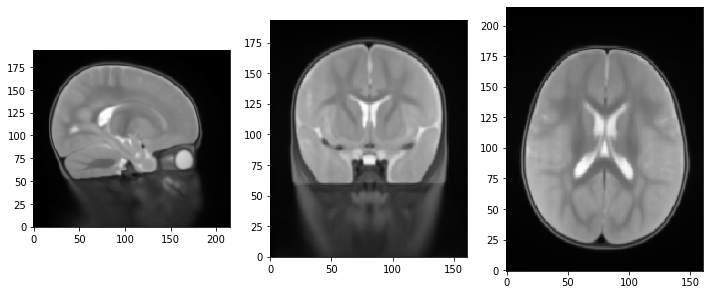

In [4]:
epi_img = nib.load(str(mnd_root_path / "Infants" / "Head" / "{}_t2w_head.nii.gz".format(subject)))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[100, :, :]
slice_1 = epi_img_data[:, 125, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

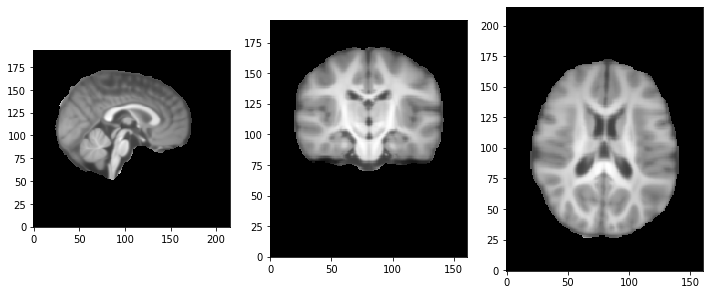

In [5]:
epi_img = nib.load(str(mnd_root_path / "Infants" / "Head" / "{}_head_brain.nii.gz".format(subject)))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[80, :, :]
slice_1 = epi_img_data[:, 100, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

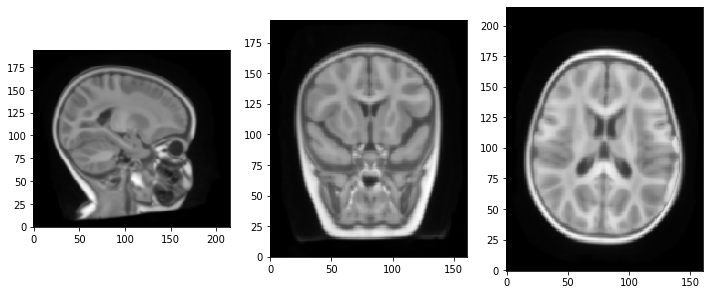

In [6]:
epi_img = nib.load(str(mnd_root_path / "Infants" / "Head" / "{}_head_bias_corrected.nii.gz".format(subject)))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[100, :, :]
slice_1 = epi_img_data[:, 125, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

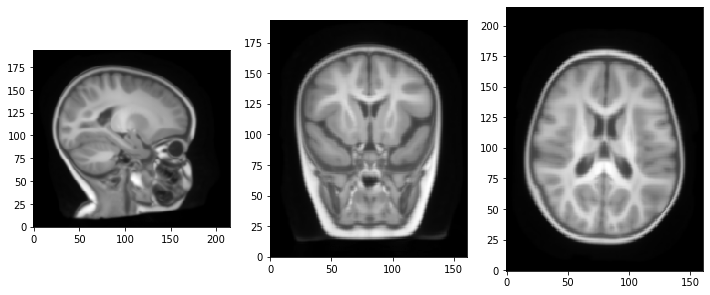

In [7]:
epi_img = nib.load(str(mnd_root_path / "Infants" / "Head" / "{}_head.nii.gz".format(subject)))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[100, :, :]
slice_1 = epi_img_data[:, 125, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

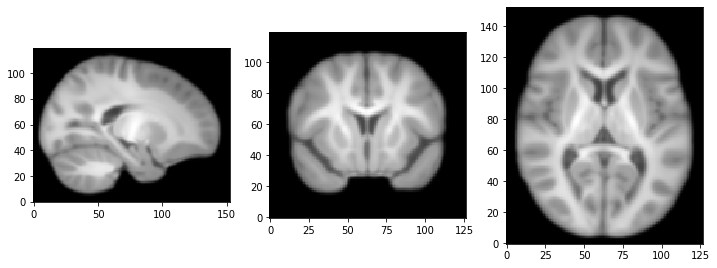

In [8]:
epi_img = nib.load(str(mnd_root_path / "Infants" / "Brain" / "{}_brain.nii.gz".format(subject)))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[80, :, :]
slice_1 = epi_img_data[:, 100, :]
slice_2 = epi_img_data[:, :, 60]
show_slices([slice_0, slice_1, slice_2])

The file marked as corrected seems to have artifacts that cause problems. Thus, we use the non-corrected ones. According to John Richards using the uncorrected files is fine with this version of the database since the correction was mainly important for T1.5 scans and our averages are based on T3 scans.

# Looking at the different BEM surfaces provided by Richards et al.

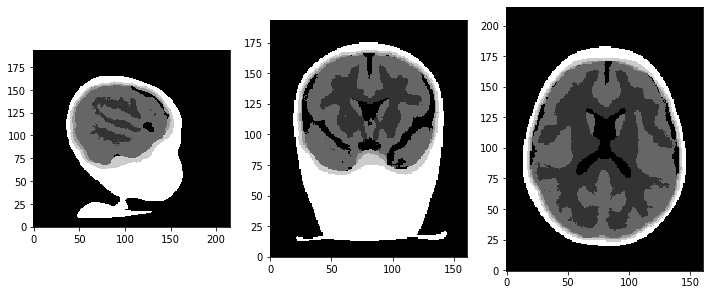

In [9]:
epi_img = nib.load(str(mnd_root_path / "Infants" / "Sources" / "BEM" / "AVG12-0Months3T_segmented_BEM5.nii.gz"))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[125, :, :]
slice_1 = epi_img_data[:, 125, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

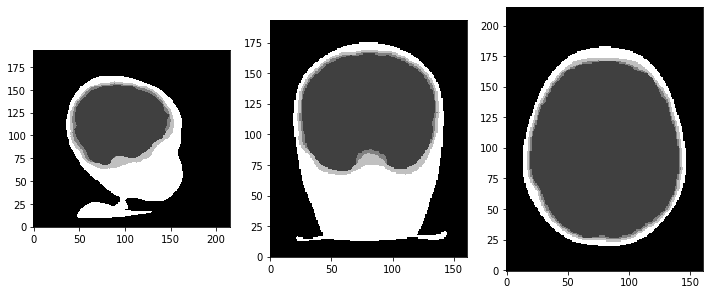

In [10]:
epi_img = nib.load(str(mnd_root_path / "Infants" / "Sources" / "BEM" / "AVG12-0Months3T_segmented_BEM4.nii.gz"))
epi_img_data = epi_img.get_fdata()
slice_0 = epi_img_data[125, :, :]
slice_1 = epi_img_data[:, 125, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

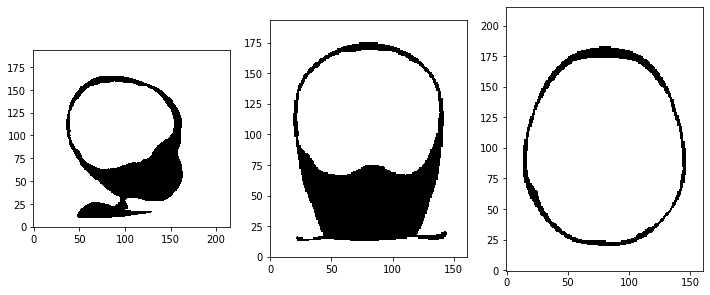

In [11]:
epi_img = nib.load(str(mnd_root_path / "Infants" / "Sources" / "BEM" / "AVG12-0Months3T_segmented_BEM3.nii.gz"))
epi_img_data = epi_img.get_fdata()
epi_img_data[np.where(epi_img_data == 0)] = np.nan # outside
epi_img_data[np.where(epi_img_data == 1)] = np.nan # white matter
epi_img_data[np.where(epi_img_data == 2)] = np.nan # skin
#epi_img_data[np.where(epi_img_data == 3)] = np.nan # CSF
slice_0 = epi_img_data[125, :, :]
slice_1 = epi_img_data[:, 125, :]
slice_2 = epi_img_data[:, :, 125]
show_slices([slice_0, slice_1, slice_2])

Following exchange with John Richards and Eric Larson, we concluded that BEM4 files are best to use to be able to extract the inside surface of the skull.

Some volume need artifact correction:

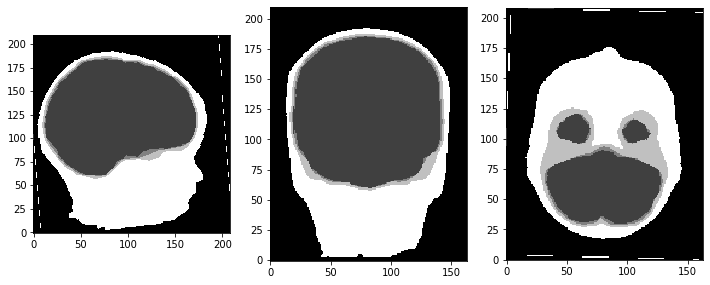

In [12]:
bem_path = mnd_root_path / "Preschool" / "Sources" / "BEM" / "AVG3-0Years3T_segmented_BEM4.nii.gz"
epi_img = nib.load(str(bem_path))
epi_img_data = deepcopy(epi_img.get_fdata())   

slice_0 = epi_img_data[75, :, :]
slice_1 = epi_img_data[:, 75, :]
slice_2 = epi_img_data[:, :, 75]
show_slices([slice_0, slice_1, slice_2])

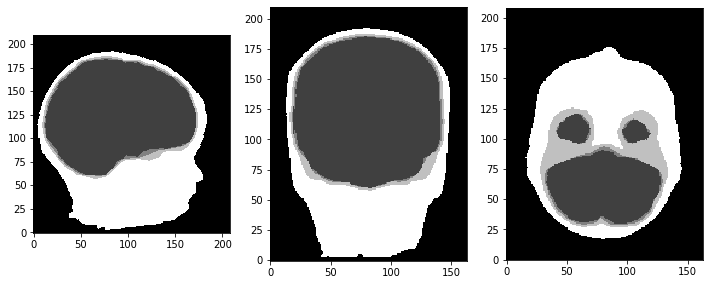

In [13]:
correct_line_artefact(epi_img_data)

slice_0 = epi_img_data[75, :, :]
slice_1 = epi_img_data[:, 75, :]
slice_2 = epi_img_data[:, :, 75]
show_slices([slice_0, slice_1, slice_2])

# Extracting subject brain surfaces

In [14]:
for subject in tqdm(subjects):
    extract_brain_surfaces(subject, fs_subject_path, mnd_root_path)

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/ANTS2-0Weeks3T_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/ANTS2-0Weeks3T_brain.nii.gz /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain.nii.gz 
$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/ANTS2-0Weeks3T_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 175.975 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain.nii.gz...
------------------------

INFO: using NIfTI-1 qform 


------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS2-0Weeks3T_head.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/head.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS2-0Weeks3T_head.nii.gz /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/head.nii.gz 
$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS2-0Weeks3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 249.75 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/head.nii.gz...
------------------------ END OUTPU

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS2-0Weeks3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 200.585 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------



INFO: using NIfTI-1 qform 


------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG2-0Weeks3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG2-0Weeks3T_segmented_BEM4.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/head_brain_mask.nii.gz --min 1 --max 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG2-0Weeks3T_segmented_BEM4.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/head_brain_mask.nii.gz
Binarizing based

INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 660880 values in range
Counting number of voxels in first frame
Found 660879 voxels in final mask
Count: 660879 660879.000000 16777216 3.939146
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -dof 12 -set

Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_ANTS_IXI_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_ANTS_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_ANTS_IXI_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_ANTS_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_ANTS_IXI_atlas
Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_ANTS_LPBA40_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_ANTS_LPBA40_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_ANTS_LPBA40_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_ANTS_LPBA40_atlas.nii.gz
Error : No image files match: /usr/

------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -applyxfm \
      -in /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_IXI_atlas.nii.gz \
      -ref /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/head_brain.nii.gz \
      -init /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/flirt_trans_mat.txt \
      -out /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_IXI_atlas_head_space.nii.gz
-------------------------- OUTPUT -----------------------------
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -applyxfm \
      -in /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_LPBA40_atlas.nii.gz \
      -ref /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/head_brain.nii.gz \
      -init /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/flirt_trans_mat.txt \
      -out /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_LPBA40_at

Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_IXI_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_IXI_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_IXI_atlas
Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_LPBA40_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_LPBA40_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_LPBA40_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brain_LPBA40_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brai

------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/mprage.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brainmask_nu.nii.gz --n 2
-------------------------- OUTPUT -----------------------------
/usr/bin/bc
/home/christian/synchedin/infants_atlas_modeling/infant_template_paper
/usr/local/freesurfer/bin/mri_nu_correct.mni
--i /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/mprage.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brainmask_nu.nii.gz --n 2
nIters 2
$Id: mri_nu_correct.mni,v 1.27 2016/02/26 16:19:49 mreuter Exp $
Linux christian-Z440 5.4.0-53-generic #59~18.04.1-Ubuntu SMP Wed Oct 21 12:14:56 UTC 2020 x86_64 x86_64 x86_64 GNU/Linux
Mon Nov 16 18:32:04 EST 2020
Found /dev/shm , will use for temp dir
tmpdir is /dev/shm/tmp.mri_nu_correct.mni.13126
Program nu_correct, built from:
Package MNI N3, 

mri_convert /dev/shm/tmp.mri_nu_correct.mni.13126/nu2.mnc /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brainmask_nu.nii.gz --like /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/mprage.nii.gz --conform
mri_convert /dev/shm/tmp.mri_nu_correct.mni.13126/nu2.mnc /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brainmask_nu.nii.gz --like /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/mprage.nii.gz --conform 
$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /dev/shm/tmp.mri_nu_correct.mni.13126/nu2.mnc...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
INFO: transform src into the like-volume: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/mprage.nii.gz
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 230.539 1000, flo=0, fhi=0.999, dest_type=0
writing to /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brainmask_nu.nii.gz...
 
 
Mon Nov 16 18:33:11 EST 2020
mri_nu_correct.mni done
--

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.13126/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS2-0Weeks3T --newborn \
                 --masked /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
The template subjects will come from: Template7 Template8 Template19 Template21 Template26

Log file is /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T_infant_recon_all.2011161833.log

Mon Nov 16 18:33:12 EST 2020
--s 

[NiftyReg F3D] [144] Current objective function: 1.07441 = (wSIM)1.07451 - (wBE)9.22e-05 - (wLE)8.91e-06 [+ 0.775 mm]
[NiftyReg F3D] [152] Current objective function: 1.07449 = (wSIM)1.0746 - (wBE)9.64e-05 - (wLE)9.03e-06 [+ 0.775 mm]
[NiftyReg F3D] [160] Current objective function: 1.07454 = (wSIM)1.07465 - (wBE)1.02e-04 - (wLE)9.19e-06 [+ 0.775 mm]
[NiftyReg F3D] [168] Current objective function: 1.07462 = (wSIM)1.07474 - (wBE)1.08e-04 - (wLE)9.34e-06 [+ 0.775 mm]
[NiftyReg F3D] [176] Current objective function: 1.07469 = (wSIM)1.07481 - (wBE)1.12e-04 - (wLE)9.46e-06 [+ 0.3875 mm]
[NiftyReg F3D] [183] Current objective function: 1.07477 = (wSIM)1.07489 - (wBE)1.14e-04 - (wLE)9.52e-06 [+ 0.3875 mm]
[NiftyReg F3D] [190] Current objective function: 1.07478 = (wSIM)1.07491 - (wBE)1.17e-04 - (wLE)9.59e-06 [+ 0.19375 mm]
[NiftyReg F3D] [197] Current objective function: 1.07483 = (wSIM)1.07496 - (wBE)1.17e-04 - (wLE)9.61e-06 [+ 0.247031 mm]
[NiftyReg F3D] [203] Current objective function: 1

[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Current level: 2 / 3
[NiftyReg F3D] Maximum iteration number: 300
[NiftyReg F3D] Current reference image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current floating image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current control point image
[NiftyReg F3D] 	* image dimension: 29 x 29 x 29
[NiftyReg F3D] 	* image spacing: 10 x 10 x 10 mm
[NiftyReg F3D] Initial objective function: 1.07032 = (wSIM)1.07034 - (wBE)5.72283e-06 - (wLE)1.01994e-05 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [10] Current objective function: 1.07191 = (wSIM)1.07192 - (wBE)6.83e-06 - (wLE)1.02e-05 [+ 2.5 mm]
[NiftyReg F3D] [19] Current objective function: 1.07282 = (wSIM)1.07284 - (wBE)1.04e-05 - (wLE)1.03e-05 [+ 2 mm]
[NiftyReg F3D] [28] Current objective function: 1.07336 = (wSIM)1.07338 

[NiftyReg F3D] [92] Current objective function: 1.0784 = (wSIM)1.07841 - (wBE)5.25e-06 - (wLE)3.20e-06 [+ 1.0732 mm]
[NiftyReg F3D] [99] Current objective function: 1.07866 = (wSIM)1.07867 - (wBE)5.60e-06 - (wLE)3.20e-06 [+ 1.0732 mm]
[NiftyReg F3D] [106] Current objective function: 1.0787 = (wSIM)1.07871 - (wBE)5.97e-06 - (wLE)3.20e-06 [+ 1.0732 mm]
[NiftyReg F3D] [112] Current objective function: 1.0787 = (wSIM)1.07871 - (wBE)5.97e-06 - (wLE)3.20e-06 [+ 0 mm]
[NiftyReg F3D] Current registration level done
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Current level: 2 / 3
[NiftyReg F3D] Maximum iteration number: 300
[NiftyReg F3D] Current reference image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current floating image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current control point image
[NiftyReg

Padding value here nan
[reg_f3d] 
[reg_f3d] Command line:
[reg_f3d] 	 reg_f3d -ref /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brainmask_nu.nii.gz -flo /usr/local/freesurfer/average/CNYBCH/Template21/norm.nii.gz -aff /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/Template21-2-ANTS2-0Weeks3T.NIFTYREG.affine.txt -cpp /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/Template21-2-ANTS2-0Weeks3T.NIFTYREG.field.nii.gz -res /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/Template21-2-ANTS2-0Weeks3T.NIFTYREG.nii.gz
[reg_f3d] 
[reg_f3d] OpenMP is used with 12 thread(s)
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] INPUT PARAMETERS
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Reference image:
[NiftyReg F3D] 	* name: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/brainmask_nu.nii.gz
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[NiftyReg F3D] 	*

[NiftyReg F3D] [95] Current objective function: 1.07169 = (wSIM)1.07176 - (wBE)4.47e-05 - (wLE)2.31e-05 [+ 0.561996 mm]
[NiftyReg F3D] [104] Current objective function: 1.07185 = (wSIM)1.07191 - (wBE)4.66e-05 - (wLE)2.31e-05 [+ 0.716545 mm]
[NiftyReg F3D] [112] Current objective function: 1.07187 = (wSIM)1.07195 - (wBE)5.01e-05 - (wLE)2.32e-05 [+ 0.716545 mm]
[NiftyReg F3D] [120] Current objective function: 1.07193 = (wSIM)1.07201 - (wBE)5.55e-05 - (wLE)2.33e-05 [+ 0.716545 mm]
[NiftyReg F3D] [129] Current objective function: 1.07212 = (wSIM)1.07221 - (wBE)6.07e-05 - (wLE)2.34e-05 [+ 0.81507 mm]
[NiftyReg F3D] [137] Current objective function: 1.07225 = (wSIM)1.07234 - (wBE)6.71e-05 - (wLE)2.35e-05 [+ 0.407535 mm]
[NiftyReg F3D] [144] Current objective function: 1.07239 = (wSIM)1.07248 - (wBE)6.80e-05 - (wLE)2.35e-05 [+ 0.407535 mm]
[NiftyReg F3D] [151] Current objective function: 1.07239 = (wSIM)1.07248 - (wBE)6.98e-05 - (wLE)2.36e-05 [+ 0.407535 mm]
[NiftyReg F3D] [158] Current objec

[NiftyReg F3D] [97] Current objective function: 1.07713 = (wSIM)1.07714 - (wBE)4.77e-06 - (wLE)1.71e-06 [+ 1.03505 mm]
[NiftyReg F3D] [105] Current objective function: 1.0774 = (wSIM)1.0774 - (wBE)5.75e-06 - (wLE)1.75e-06 [+ 1.17736 mm]
[NiftyReg F3D] [114] Current objective function: 1.07754 = (wSIM)1.07755 - (wBE)7.09e-06 - (wLE)1.79e-06 [+ 1.33925 mm]
[NiftyReg F3D] [122] Current objective function: 1.07766 = (wSIM)1.07767 - (wBE)8.01e-06 - (wLE)1.82e-06 [+ 0.669626 mm]
[NiftyReg F3D] [130] Current objective function: 1.07784 = (wSIM)1.07785 - (wBE)8.79e-06 - (wLE)1.84e-06 [+ 0.853773 mm]
[NiftyReg F3D] [138] Current objective function: 1.07801 = (wSIM)1.07803 - (wBE)9.30e-06 - (wLE)1.85e-06 [+ 0.91247 mm]
[NiftyReg F3D] [145] Current objective function: 1.07808 = (wSIM)1.07809 - (wBE)9.62e-06 - (wLE)1.85e-06 [+ 0.456235 mm]
[NiftyReg F3D] [153] Current objective function: 1.07823 = (wSIM)1.07825 - (wBE)9.78e-06 - (wLE)1.85e-06 [+ 1.0271 mm]
[NiftyReg F3D] [161] Current objective fu

[NiftyReg F3D] [67] Current objective function: 1.06167 = (wSIM)1.06222 - (wBE)4.98e-04 - (wLE)5.36e-05 [+ 1 mm]
[NiftyReg F3D] [78] Current objective function: 1.06174 = (wSIM)1.06231 - (wBE)5.14e-04 - (wLE)5.41e-05 [+ 1.07969 mm]
[NiftyReg F3D] [87] Current objective function: 1.06174 = (wSIM)1.06231 - (wBE)5.21e-04 - (wLE)5.43e-05 [+ 0.0625 mm]
[NiftyReg F3D] [97] Current objective function: 1.06179 = (wSIM)1.06239 - (wBE)5.52e-04 - (wLE)5.51e-05 [+ 0.381569 mm]
[NiftyReg F3D] [105] Current objective function: 1.06181 = (wSIM)1.06244 - (wBE)5.77e-04 - (wLE)5.59e-05 [+ 0.381569 mm]
[NiftyReg F3D] [113] Current objective function: 1.06182 = (wSIM)1.06246 - (wBE)5.85e-04 - (wLE)5.61e-05 [+ 0.381569 mm]
[NiftyReg F3D] [120] Current objective function: 1.06182 = (wSIM)1.06246 - (wBE)5.85e-04 - (wLE)5.61e-05 [+ 0 mm]
[NiftyReg F3D] Current registration level done
[NiftyReg F3D] ***********************************************************
[reg_f3d] Registration performed in 1 min 44 sec
[re

niiRead(): detected input as 64 bit double, reading in as 32 bit float

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/alllabelmask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/alllabelmask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
niiRead(): detected input as 64 bit double, reading in as 32 bit float
fstart = 0, fend = 0, nframes = 1
Found 392590 values in range
Counting number of voxels in first frame
Found 392589 voxels in final mask
Count: 392589 392589.000000 16777216 2.340013
m


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/aseg.left.13.mgz --min 13 --max 13 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/aseg.left.13.mgz
Binarizing based on threshold
min        13
max        13
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1689 values in range
Counting number of voxels in first frame
Found 1688 voxels in final mask
Count: 1688 1688.000000 16777216 0.010061
mri_binarize done
mri_binarize --i /usr/local/freesurfer/sub


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/aseg.right.50.mgz --min 50 --max 50 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/aseg.right.50.mgz
Binarizing based on threshold
min        50
max        50
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1922 values in range
Counting number of voxels in first frame
Found 1921 voxels in final mask
Count: 1921 1921.000000 16777216 0.011450
mri_binarize done
mri_binarize --i /usr/local/freesurfer/s


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/aseg.173.mgz --min 173 --max 173 --binval 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/aseg.173.mgz
Binarizing based on threshold
min        173
max        173
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1834 values in range
Counting number of voxels in first frame
Found 1833 voxels in final mask
Count: 1833 1833.000000 16777216 0.010926
mri_binarize done
mri_binarize --i /usr/local/freesurfer/subjects/AN


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/aseg.WM.right.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/aseg.WM.right.127.vfilled.mgz --min 1 --max 1 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/aseg.WM.right.vfilled.mgz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/aseg.WM.right.127.vfilled.mgz
Binarizing based on threshold
min        1
max        1
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 79797 values in range
Counting number of voxels in first frame
Found 79796 voxels in final mask
Count: 79796 79796.000000 16777216 0.475621
mri_


counting number of connected components...
   39096 voxel in cpt #1: X=-16 [v=39096,e=117336,f=78224] located at (22.656511, -19.831543, 18.049622)
   8 voxel in cpt #2: X=2 [v=8,e=18,f=12] located at (4.000000, -40.000000, 9.000000)
   8 voxel in cpt #3: X=2 [v=8,e=18,f=12] located at (5.000000, -30.000000, 12.000000)
For the whole surface: X=-12 [v=39112,e=117372,f=78248]
3 components have been found
keeping component #1 with 39096 vertices
done

mris_smooth -nw /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/surf/rh.orig.nofix /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/surf/rh.smoothorig.nofix
smoothing surface tessellation for 10 iterations...
smoothing complete - recomputing first and second fundamental forms...
mris_inflate -no-save-sulc /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/surf/rh.smoothorig.nofix /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/surf/rh.inflated.nofix
Not 

740/3000: dt: 0.9000, rms radial error=76.889, avgs=0
745/3000: dt: 0.9000, rms radial error=76.461, avgs=0
750/3000: dt: 0.9000, rms radial error=76.036, avgs=0
755/3000: dt: 0.9000, rms radial error=75.613, avgs=0
760/3000: dt: 0.9000, rms radial error=75.193, avgs=0
765/3000: dt: 0.9000, rms radial error=74.775, avgs=0
770/3000: dt: 0.9000, rms radial error=74.359, avgs=0
775/3000: dt: 0.9000, rms radial error=73.946, avgs=0
780/3000: dt: 0.9000, rms radial error=73.536, avgs=0
785/3000: dt: 0.9000, rms radial error=73.128, avgs=0
790/3000: dt: 0.9000, rms radial error=72.722, avgs=0
795/3000: dt: 0.9000, rms radial error=72.319, avgs=0
800/3000: dt: 0.9000, rms radial error=71.918, avgs=0
805/3000: dt: 0.9000, rms radial error=71.519, avgs=0
810/3000: dt: 0.9000, rms radial error=71.123, avgs=0
815/3000: dt: 0.9000, rms radial error=70.729, avgs=0
820/3000: dt: 0.9000, rms radial error=70.337, avgs=0
825/3000: dt: 0.9000, rms radial error=69.948, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=34.477, avgs=0
1495/3000: dt: 0.9000, rms radial error=34.307, avgs=0
1500/3000: dt: 0.9000, rms radial error=34.137, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.969, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.802, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.636, avgs=0
1520/3000: dt: 0.9000, rms radial error=33.471, avgs=0
1525/3000: dt: 0.9000, rms radial error=33.308, avgs=0
1530/3000: dt: 0.9000, rms radial error=33.145, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.983, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.823, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.663, avgs=0
1550/3000: dt: 0.9000, rms radial error=32.505, avgs=0
1555/3000: dt: 0.9000, rms radial error=32.348, avgs=0
1560/3000: dt: 0.9000, rms radial error=32.191, avgs=0
1565/3000: dt: 0.9000, rms radial error=32.036, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.882, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.729, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=18.727, avgs=0
2240/3000: dt: 0.9000, rms radial error=18.672, avgs=0
2245/3000: dt: 0.9000, rms radial error=18.616, avgs=0
2250/3000: dt: 0.9000, rms radial error=18.561, avgs=0
2255/3000: dt: 0.9000, rms radial error=18.507, avgs=0
2260/3000: dt: 0.9000, rms radial error=18.453, avgs=0
2265/3000: dt: 0.9000, rms radial error=18.399, avgs=0
2270/3000: dt: 0.9000, rms radial error=18.346, avgs=0
2275/3000: dt: 0.9000, rms radial error=18.294, avgs=0
2280/3000: dt: 0.9000, rms radial error=18.242, avgs=0
2285/3000: dt: 0.9000, rms radial error=18.190, avgs=0
2290/3000: dt: 0.9000, rms radial error=18.139, avgs=0
2295/3000: dt: 0.9000, rms radial error=18.088, avgs=0
2300/3000: dt: 0.9000, rms radial error=18.038, avgs=0
2305/3000: dt: 0.9000, rms radial error=17.988, avgs=0
2310/3000: dt: 0.9000, rms radial error=17.939, avgs=0
2315/3000: dt: 0.9000, rms radial error=17.890, avgs=0
2320/3000: dt: 0.9000, rms radial error=17.841, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=14.227, avgs=0
2985/3000: dt: 0.9000, rms radial error=14.214, avgs=0
2990/3000: dt: 0.9000, rms radial error=14.202, avgs=0
2995/3000: dt: 0.9000, rms radial error=14.190, avgs=0
3000/3000: dt: 0.9000, rms radial error=14.177, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.78 +- 1.02 (0.00-->10.93) (max @ vno 29850 --> 29872)
face area 0.10 +- 0.12 (-0.38-->2.66)
epoch 1 (K=10.0), pass 1, starting sse = 3150.51
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00029
epoch 2 (K=40.0), pass 1, starting sse = 365.72
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.04/10 = 0.00399
epoch 3 (K=160.0), 

scaling brain by 0.581...
inflating...
Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=175.377, avgs=0
005/3000: dt: 0.9000, rms radial error=175.118, avgs=0
010/3000: dt: 0.9000, rms radial error=174.563, avgs=0
015/3000: dt: 0.9000, rms radial error=173.835, avgs=0
020/3000: dt: 0.9000, rms radial error=173.006, avgs=0
025/3000: dt: 0.9000, rms radial error=172.122, avgs=0
030/3000: dt: 0.9000, rms radial error=171.207, avgs=0
035/3000: dt: 0.9000, rms radial error=170.275, avgs=0
040/3000: dt: 0.9000, rms radial error=169.334, avgs=0
045/3000: dt: 0.9000, rms radial error=168.390, avgs=0
050/3000: dt: 0.9000, rms radial error=167.446, avgs=0
055/3000: dt: 0.9000, rms radial error=166.504, avgs=0
060/3000: dt: 0.9000, rms radial error=165.564, avgs=0
065/3000: dt: 0.9000, rms radial error=164.628, avgs=0
070/3000: dt: 0.9000, rms radial error=163.695, avgs=0
075/3000: dt: 0.9000, rms radial error=162.767, avgs=0
080/3000: dt: 0.

740/3000: dt: 0.9000, rms radial error=76.605, avgs=0
745/3000: dt: 0.9000, rms radial error=76.177, avgs=0
750/3000: dt: 0.9000, rms radial error=75.751, avgs=0
755/3000: dt: 0.9000, rms radial error=75.329, avgs=0
760/3000: dt: 0.9000, rms radial error=74.909, avgs=0
765/3000: dt: 0.9000, rms radial error=74.491, avgs=0
770/3000: dt: 0.9000, rms radial error=74.076, avgs=0
775/3000: dt: 0.9000, rms radial error=73.664, avgs=0
780/3000: dt: 0.9000, rms radial error=73.254, avgs=0
785/3000: dt: 0.9000, rms radial error=72.846, avgs=0
790/3000: dt: 0.9000, rms radial error=72.441, avgs=0
795/3000: dt: 0.9000, rms radial error=72.038, avgs=0
800/3000: dt: 0.9000, rms radial error=71.637, avgs=0
805/3000: dt: 0.9000, rms radial error=71.239, avgs=0
810/3000: dt: 0.9000, rms radial error=70.844, avgs=0
815/3000: dt: 0.9000, rms radial error=70.450, avgs=0
820/3000: dt: 0.9000, rms radial error=70.059, avgs=0
825/3000: dt: 0.9000, rms radial error=69.670, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=34.385, avgs=0
1495/3000: dt: 0.9000, rms radial error=34.217, avgs=0
1500/3000: dt: 0.9000, rms radial error=34.050, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.884, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.719, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.556, avgs=0
1520/3000: dt: 0.9000, rms radial error=33.393, avgs=0
1525/3000: dt: 0.9000, rms radial error=33.232, avgs=0
1530/3000: dt: 0.9000, rms radial error=33.071, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.912, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.754, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.597, avgs=0
1550/3000: dt: 0.9000, rms radial error=32.441, avgs=0
1555/3000: dt: 0.9000, rms radial error=32.286, avgs=0
1560/3000: dt: 0.9000, rms radial error=32.132, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.979, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.828, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.677, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=19.088, avgs=0
2240/3000: dt: 0.9000, rms radial error=19.036, avgs=0
2245/3000: dt: 0.9000, rms radial error=18.984, avgs=0
2250/3000: dt: 0.9000, rms radial error=18.932, avgs=0
2255/3000: dt: 0.9000, rms radial error=18.881, avgs=0
2260/3000: dt: 0.9000, rms radial error=18.831, avgs=0
2265/3000: dt: 0.9000, rms radial error=18.781, avgs=0
2270/3000: dt: 0.9000, rms radial error=18.731, avgs=0
2275/3000: dt: 0.9000, rms radial error=18.682, avgs=0
2280/3000: dt: 0.9000, rms radial error=18.634, avgs=0
2285/3000: dt: 0.9000, rms radial error=18.585, avgs=0
2290/3000: dt: 0.9000, rms radial error=18.538, avgs=0
2295/3000: dt: 0.9000, rms radial error=18.490, avgs=0
2300/3000: dt: 0.9000, rms radial error=18.444, avgs=0
2305/3000: dt: 0.9000, rms radial error=18.397, avgs=0
2310/3000: dt: 0.9000, rms radial error=18.351, avgs=0
2315/3000: dt: 0.9000, rms radial error=18.306, avgs=0
2320/3000: dt: 0.9000, rms radial error=18.261, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=15.035, avgs=0
2985/3000: dt: 0.9000, rms radial error=15.025, avgs=0
2990/3000: dt: 0.9000, rms radial error=15.015, avgs=0
2995/3000: dt: 0.9000, rms radial error=15.004, avgs=0
3000/3000: dt: 0.9000, rms radial error=14.994, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.77 +- 1.05 (0.00-->10.94) (max @ vno 15260 --> 15268)
face area 0.10 +- 0.12 (-0.33-->2.64)
epoch 1 (K=10.0), pass 1, starting sse = 3223.96
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00012
epoch 2 (K=40.0), pass 1, starting sse = 407.37
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.04/10 = 0.00352
epoch 3 (K=160.0), 

pass   1 (yz-):   4 found -   4 modified     |    TOTAL:  12
pass   2 (yz-):   0 found -   4 modified     |    TOTAL:  12
pass   1 (xz+):   0 found -   0 modified     |    TOTAL:  12
pass   1 (xz-):   1 found -   1 modified     |    TOTAL:  13
pass   2 (xz-):   0 found -   1 modified     |    TOTAL:  13
Iteration Number : 2
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
Iteration Number : 2
pass   1 (++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (--):   1 found -   1 modified     |    TOTAL:   1
pass   2 (--):   0 found -   1 modified     |    TOTAL:   1
pass   1 (-+):   1 found -   1 modified     |    TOTAL:   2
pass   2 (-+):   0 found -   1 modified     |    TOTAL:   2
Iteration Number : 3
pass   1 (xy+):   0 found - 

      BEST FITNESS (M) is 363.81108 
         mri =0.000   curv = 1.009 unmri = -367.849
         ( f=0.00 , v=0.00 , c=1.01 , q= 2.02  ) 
         ( f=0.00 , v=0.00 , c=1.01 , q= 2.02 ) 
      496 patches have been generated - 263 self-intersected
      max face = 6808(7392) - loop = 4 (9)  - ntries = [222,2733]
      BEST FITNESS (M) is 360.14765 
         mri =0.000   curv = 2.887 unmri = -371.697
         ( f=0.00 , v=0.00 , c=2.89 , q= 5.77  ) 
         ( f=0.00 , v=0.00 , c=2.89 , q= 5.77 ) 
      BEST FITNESS (o)is 395.56711 
         mri =0.000   curv = 1.026 unmri = -399.670
         ( f=0.00 , v=0.00 , c=1.03 , q= 2.05  ) 
         ( f=0.00 , v=0.00 , c=1.03 , q= 2.05 ) 
      BEST FITNESS (o)is 396.37926 
         mri =0.000   curv = 1.041 unmri = -400.544
         ( f=0.00 , v=0.00 , c=1.04 , q= 2.08  ) 
         ( f=0.00 , v=0.00 , c=1.04 , q= 2.08 ) 
      BEST FITNESS (o)is 398.39672 
         mri =0.000   curv = 1.018 unmri = -402.469
         ( f=0.00 , v=0.00 , c=1.02

AFTER CORRECTION, EULER IS -6 
Surface Diagnostics:       
   eno=-6 (nv=39494, nf=79000, ne=118500)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 7 with euler number 1 (0 loops) 
   Nothing to correct for defect 7!!
AFTER CORRECTION, EULER IS -6 
Surface Diagnostics:       
   eno=-6 (nv=39494, nf=79000, ne=118500)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 8 with euler number -1 (1 loops) 
   computing statistics for defect 8: 249 vertices
   location: [ (143,82,109) - average intensity = 199.972 ]
      -gray ( 203.39 , 7.88 )  -white ( 196.96 , 4.17 )
      -gray ( 187.79 , 41

intersection removal took 0.00 hours
writing corrected surface to /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/surf/lh.orig
cp /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/surf/rh.orig rh.orig
cp /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/work/surf/rh.inflated rh.inflated
cp rh.qsphere.nofix rh.qsphere
mris_topo_fixer -mgz -warnings ANTS2-0Weeks3T rh
verbose mode on (medium mode): printing warnings
Before topology correction, eno=-16 (nv=39096, nf=78224, ne=117336, g=9)
Surface Diagnostics:       
   eno=-16 (nv=39096, nf=78224, ne=117336)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0
   The original surface is a valid manifold
   Counting the number of connected components
   The original surface has one component
   The original surface does not self-intersect

The surface has 9 loops (X=-16)

      BEST FITNESS (M) is 1004.95506 
         mri =0.000   curv = 0.773 unmri = -1008.048
         ( f=0.00 , v=0.00 , c=0.77 , q= 1.55  ) 
         ( f=0.00 , v=0.00 , c=0.77 , q= 1.55 ) 
      BEST FITNESS (M) is 1065.43654 
         mri =0.000   curv = 0.828 unmri = -1068.749
         ( f=0.00 , v=0.00 , c=0.83 , q= 1.66  ) 
         ( f=0.00 , v=0.00 , c=0.83 , q= 1.66 ) 
      800 patches have been generated - 419 self-intersected
      max face = 4772(5768) - loop = 5 (6)  - ntries = [333,1919]
      BEST FITNESS (o)is 1063.34023 
         mri =0.000   curv = 0.820 unmri = -1066.619
         ( f=0.00 , v=0.00 , c=0.82 , q= 1.64  ) 
         ( f=0.00 , v=0.00 , c=0.82 , q= 1.64 ) 
      BEST FITNESS (M) is 1075.40752 
         mri =0.000   curv = 0.855 unmri = -1078.826
         ( f=0.00 , v=0.00 , c=0.85 , q= 1.71  ) 
         ( f=0.00 , v=0.00 , c=0.85 , q= 1.71 ) 
      BEST FITNESS (M) is 1112.73396 
         mri =0.000   curv = 1.049 unmri = -1116.931
         ( f=0.00 , v=0

      BEST FITNESS (M) is -6.60524 
         mri =0.000   curv = 1.941 unmri = -1.160
         ( f=0.00 , v=0.00 , c=1.94 , q= 3.88  ) 
         ( f=0.00 , v=0.00 , c=1.94 , q= 3.88 ) 
      BEST FITNESS (M) is 16.59497 
         mri =0.000   curv = 1.610 unmri = -23.034
         ( f=0.00 , v=0.00 , c=1.61 , q= 3.22  ) 
         ( f=0.00 , v=0.00 , c=1.61 , q= 3.22 ) 
      BEST FITNESS (M) is 19.68750 
         mri =0.000   curv = 2.027 unmri = -27.794
         ( f=0.00 , v=0.00 , c=2.03 , q= 4.05  ) 
         ( f=0.00 , v=0.00 , c=2.03 , q= 4.05 ) 
      BEST FITNESS (M) is 21.23395 
         mri =0.000   curv = 1.396 unmri = -26.819
         ( f=0.00 , v=0.00 , c=1.40 , q= 2.79  ) 
         ( f=0.00 , v=0.00 , c=1.40 , q= 2.79 ) 
      82 patches have been generated - 31 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  21.23395 
# generated patches : 82 (31 self-intersecting)
AFTER CORRECTION, EULER IS 2 
Surface Diagnostics:       
   eno=2 (nv=39970, nf=79936, ne=11

removing 3 vertices from ripped group in thread:0
#FML# MRISripMidline(): nmarked=1751, nmarked2=0, nripped=1751
averaging target values for 5 iterations...
Positioning White Surface: tspring = 1, nspring = 0.5, spring = 0, niters = 100 l_repulse = 5, checktol = 0
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=1.0, host=chris, nav=2, nbrs=2, l_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.200, l_curv=1.000
mom=0.00, dt=0.50
000: dt: 0.0000, sse=15150427.0, rms=43.996
rms = 175.7537/43.9963, sse=439493274.0/15150426.9, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 175.8557/43.9963, sse=445492678.2/15150426.9, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 175.8870/43.9963, sse=445645756.6/15150426.9, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
002: dt: 0.1250, sse=4456

mean inside = 127.8, mean outside = 189.3
inverted contrast detected....
smoothing surface for 5 iterations...
  .. but with overwrite the positions with orig...
reading initial white vertex positions from orig...
repositioning cortical surface to gray/white boundary
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
Placing white surface white_sigma=2, max_white_averages=4
Iteration 0 white =========================================
n_averages=4, current_sigma=2
Smoothing T1 volume with sigma = 2.000
vertex spacing 0.89 +- 0.21 (0.01-->4.11) (max @ vno 39542 --> 39543)
face area 0.32 +- 0.12 (0.00-->3.31)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=1, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped=0
#FML# MRISripMidline(): nmarked=1991, nmarked2=0, nripped=1991
creating distance transform volume from segmentation
averaging target values for 5 iterations...
Positioning White Surface: tsp

smoothing surface tessellation for 3 iterations...
applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 12.212
smoothing 200 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/surf/lh.smoothwm1
mris_smooth -n 3 -nbrs 1 -gt .995 -d 2 -nw /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/surf/lh.smoothwm1 /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/surf/lh.smoothwm2
smoothing for 3 iterations
using neighborhood size = 1
smoothing surface tessellation for 3 iterations...
applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 4.905
smoothing 201 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/surf/lh.smoothwm2
mris_smooth -n 3 -nbrs 1 -gt .995 -d 2 -nw /usr/l

350: dt=0.9900, 522 negative triangles
351: dt=0.9900, 526 negative triangles
352: dt=0.9900, 510 negative triangles
353: dt=0.9900, 515 negative triangles
354: dt=0.9900, 497 negative triangles
355: dt=0.9900, 506 negative triangles
356: dt=0.9900, 496 negative triangles
357: dt=0.9900, 496 negative triangles
358: dt=0.9900, 477 negative triangles
359: dt=0.9900, 474 negative triangles
360: dt=0.9900, 469 negative triangles
361: dt=0.9900, 472 negative triangles
362: dt=0.9900, 472 negative triangles
363: dt=0.9900, 486 negative triangles
364: dt=0.9900, 469 negative triangles
365: dt=0.9900, 469 negative triangles
366: dt=0.9900, 476 negative triangles
367: dt=0.9900, 457 negative triangles
368: dt=0.9900, 460 negative triangles
369: dt=0.9900, 460 negative triangles
370: dt=0.9900, 479 negative triangles
371: dt=0.9900, 450 negative triangles
372: dt=0.9900, 446 negative triangles
373: dt=0.9900, 447 negative triangles
374: dt=0.9900, 453 negative triangles
375: dt=0.9900, 450 negat

561: dt=0.9900, 239 negative triangles
562: dt=0.9900, 240 negative triangles
563: dt=0.9900, 244 negative triangles
564: dt=0.9900, 239 negative triangles
565: dt=0.9900, 241 negative triangles
566: dt=0.9900, 240 negative triangles
567: dt=0.9900, 241 negative triangles
568: dt=0.9900, 242 negative triangles
569: dt=0.9900, 246 negative triangles
570: dt=0.9900, 244 negative triangles
571: dt=0.9405, 247 negative triangles
572: dt=0.9405, 247 negative triangles
573: dt=0.9405, 246 negative triangles
574: dt=0.9405, 249 negative triangles
575: dt=0.9405, 250 negative triangles
576: dt=0.9405, 247 negative triangles
577: dt=0.9405, 250 negative triangles
578: dt=0.9405, 249 negative triangles
579: dt=0.9405, 249 negative triangles
580: dt=0.9405, 248 negative triangles
581: dt=0.8935, 250 negative triangles
582: dt=0.8935, 246 negative triangles
583: dt=0.8935, 248 negative triangles
584: dt=0.8935, 247 negative triangles
585: dt=0.8935, 248 negative triangles
586: dt=0.8935, 250 negat

773: dt=0.3372, 256 negative triangles
774: dt=0.3372, 254 negative triangles
775: dt=0.3372, 253 negative triangles
776: dt=0.3372, 254 negative triangles
777: dt=0.3372, 257 negative triangles
778: dt=0.3372, 253 negative triangles
779: dt=0.3372, 257 negative triangles
780: dt=0.3372, 259 negative triangles
781: dt=0.3203, 256 negative triangles
782: dt=0.3203, 255 negative triangles
783: dt=0.3203, 254 negative triangles
784: dt=0.3203, 255 negative triangles
785: dt=0.3203, 254 negative triangles
786: dt=0.3203, 252 negative triangles
787: dt=0.3203, 257 negative triangles
788: dt=0.3203, 256 negative triangles
789: dt=0.3203, 257 negative triangles
790: dt=0.3203, 258 negative triangles
791: dt=0.3043, 255 negative triangles
792: dt=0.3043, 253 negative triangles
793: dt=0.3043, 255 negative triangles
794: dt=0.3043, 254 negative triangles
795: dt=0.3043, 254 negative triangles
796: dt=0.3043, 257 negative triangles
797: dt=0.3043, 258 negative triangles
798: dt=0.3043, 257 negat

984: dt=0.1148, 260 negative triangles
985: dt=0.1148, 258 negative triangles
986: dt=0.1148, 258 negative triangles
987: dt=0.1148, 257 negative triangles
988: dt=0.1148, 257 negative triangles
989: dt=0.1148, 259 negative triangles
990: dt=0.1148, 256 negative triangles
991: dt=0.1091, 254 negative triangles
992: dt=0.1091, 255 negative triangles
993: dt=0.1091, 255 negative triangles
994: dt=0.1091, 254 negative triangles
995: dt=0.1091, 257 negative triangles
996: dt=0.1091, 257 negative triangles
997: dt=0.1091, 256 negative triangles
998: dt=0.1091, 258 negative triangles
999: dt=0.1091, 257 negative triangles
1000: dt=0.1091, 258 negative triangles
1001: dt=0.1036, 259 negative triangles
1002: dt=0.1036, 261 negative triangles
1003: dt=0.1036, 258 negative triangles
1004: dt=0.1036, 259 negative triangles
1005: dt=0.1036, 259 negative triangles
1006: dt=0.1036, 258 negative triangles
1007: dt=0.1036, 258 negative triangles
1008: dt=0.1036, 260 negative triangles
1009: dt=0.1036,

1190: dt=0.0412, 258 negative triangles
1191: dt=0.0391, 257 negative triangles
1192: dt=0.0391, 255 negative triangles
1193: dt=0.0391, 259 negative triangles
1194: dt=0.0391, 257 negative triangles
1195: dt=0.0391, 259 negative triangles
1196: dt=0.0391, 256 negative triangles
1197: dt=0.0391, 260 negative triangles
1198: dt=0.0391, 258 negative triangles
1199: dt=0.0391, 259 negative triangles
1200: dt=0.0391, 257 negative triangles
1201: dt=0.0371, 258 negative triangles
1202: dt=0.0371, 256 negative triangles
1203: dt=0.0371, 257 negative triangles
1204: dt=0.0371, 257 negative triangles
1205: dt=0.0371, 255 negative triangles
1206: dt=0.0371, 254 negative triangles
1207: dt=0.0371, 258 negative triangles
1208: dt=0.0371, 257 negative triangles
1209: dt=0.0371, 257 negative triangles
1210: dt=0.0371, 259 negative triangles
1211: dt=0.0353, 258 negative triangles
1212: dt=0.0353, 257 negative triangles
1213: dt=0.0353, 256 negative triangles
1214: dt=0.0353, 257 negative triangles


112: dt=0.9900, 519 negative triangles
113: dt=0.9900, 515 negative triangles
114: dt=0.9900, 512 negative triangles
115: dt=0.9900, 513 negative triangles
116: dt=0.9900, 519 negative triangles
117: dt=0.9900, 519 negative triangles
118: dt=0.9900, 518 negative triangles
119: dt=0.9900, 518 negative triangles
120: dt=0.9900, 510 negative triangles
121: dt=0.9900, 504 negative triangles
122: dt=0.9900, 511 negative triangles
123: dt=0.9900, 503 negative triangles
124: dt=0.9900, 505 negative triangles
125: dt=0.9900, 504 negative triangles
126: dt=0.9900, 501 negative triangles
127: dt=0.9900, 506 negative triangles
128: dt=0.9900, 502 negative triangles
129: dt=0.9900, 505 negative triangles
130: dt=0.9900, 496 negative triangles
131: dt=0.9900, 503 negative triangles
132: dt=0.9900, 508 negative triangles
133: dt=0.9900, 503 negative triangles
134: dt=0.9900, 504 negative triangles
135: dt=0.9900, 504 negative triangles
136: dt=0.9900, 501 negative triangles
137: dt=0.9900, 500 negat

325: dt=0.4587, 427 negative triangles
326: dt=0.4587, 427 negative triangles
327: dt=0.4587, 425 negative triangles
328: dt=0.4587, 426 negative triangles
329: dt=0.4587, 423 negative triangles
330: dt=0.4587, 426 negative triangles
331: dt=0.4587, 425 negative triangles
332: dt=0.4587, 425 negative triangles
333: dt=0.4587, 423 negative triangles
334: dt=0.4587, 425 negative triangles
335: dt=0.4357, 423 negative triangles
336: dt=0.4357, 426 negative triangles
337: dt=0.4357, 424 negative triangles
338: dt=0.4357, 425 negative triangles
339: dt=0.4357, 426 negative triangles
340: dt=0.4357, 427 negative triangles
341: dt=0.4357, 423 negative triangles
342: dt=0.4357, 425 negative triangles
343: dt=0.4357, 428 negative triangles
344: dt=0.4357, 426 negative triangles
345: dt=0.4139, 423 negative triangles
346: dt=0.4139, 425 negative triangles
347: dt=0.4139, 423 negative triangles
348: dt=0.4139, 426 negative triangles
349: dt=0.4139, 423 negative triangles
350: dt=0.4139, 420 negat

537: dt=0.2891, 360 negative triangles
538: dt=0.2891, 359 negative triangles
539: dt=0.2891, 363 negative triangles
540: dt=0.2891, 362 negative triangles
541: dt=0.2891, 361 negative triangles
542: dt=0.2891, 361 negative triangles
543: dt=0.2891, 365 negative triangles
544: dt=0.2891, 363 negative triangles
545: dt=0.2891, 363 negative triangles
546: dt=0.2891, 362 negative triangles
547: dt=0.2746, 365 negative triangles
548: dt=0.2746, 367 negative triangles
549: dt=0.2746, 364 negative triangles
550: dt=0.2746, 364 negative triangles
551: dt=0.2746, 364 negative triangles
552: dt=0.2746, 363 negative triangles
553: dt=0.2746, 363 negative triangles
554: dt=0.2746, 363 negative triangles
555: dt=0.2746, 362 negative triangles
556: dt=0.2746, 359 negative triangles
557: dt=0.2609, 359 negative triangles
558: dt=0.2609, 360 negative triangles
559: dt=0.2609, 360 negative triangles
560: dt=0.2609, 361 negative triangles
561: dt=0.2609, 363 negative triangles
562: dt=0.2609, 363 negat

750: dt=0.0984, 357 negative triangles
751: dt=0.0984, 358 negative triangles
752: dt=0.0984, 358 negative triangles
753: dt=0.0984, 361 negative triangles
754: dt=0.0984, 361 negative triangles
755: dt=0.0984, 360 negative triangles
756: dt=0.0984, 360 negative triangles
757: dt=0.0935, 360 negative triangles
758: dt=0.0935, 360 negative triangles
759: dt=0.0935, 361 negative triangles
760: dt=0.0935, 359 negative triangles
761: dt=0.0935, 359 negative triangles
762: dt=0.0935, 361 negative triangles
763: dt=0.0935, 361 negative triangles
764: dt=0.0935, 358 negative triangles
765: dt=0.0935, 358 negative triangles
766: dt=0.0935, 358 negative triangles
767: dt=0.0888, 358 negative triangles
768: dt=0.0888, 361 negative triangles
769: dt=0.0888, 359 negative triangles
770: dt=0.0888, 364 negative triangles
771: dt=0.0888, 364 negative triangles
772: dt=0.0888, 365 negative triangles
773: dt=0.0888, 363 negative triangles
774: dt=0.0888, 361 negative triangles
775: dt=0.0888, 362 negat

961: dt=0.0335, 360 negative triangles
962: dt=0.0335, 361 negative triangles
963: dt=0.0335, 361 negative triangles
964: dt=0.0335, 359 negative triangles
965: dt=0.0335, 360 negative triangles
966: dt=0.0335, 359 negative triangles
967: dt=0.0319, 360 negative triangles
968: dt=0.0319, 360 negative triangles
969: dt=0.0319, 359 negative triangles
970: dt=0.0319, 362 negative triangles
971: dt=0.0319, 361 negative triangles
972: dt=0.0319, 360 negative triangles
973: dt=0.0319, 361 negative triangles
974: dt=0.0319, 360 negative triangles
975: dt=0.0319, 360 negative triangles
976: dt=0.0319, 361 negative triangles
977: dt=0.0303, 360 negative triangles
978: dt=0.0303, 359 negative triangles
979: dt=0.0303, 360 negative triangles
980: dt=0.0303, 361 negative triangles
981: dt=0.0303, 358 negative triangles
982: dt=0.0303, 359 negative triangles
983: dt=0.0303, 358 negative triangles
984: dt=0.0303, 358 negative triangles
985: dt=0.0303, 358 negative triangles
986: dt=0.0303, 358 negat

using /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/aseg.mgz aseg volume to correct midline
$Id: mris_ca_label.c,v 1.37 2014/02/04 17:46:42 fischl Exp $
  $Id$
reading atlas from /usr/local/freesurfer/average/lh.destrieux.simple.2009-07-29.gcs...
reading color table from GCSA file....
average std = 3.9 0.2   using min determinant for regularization = 0.000
0 singular and 1066 ill-conditioned covariance matrices regularized
input 1: CURVATURE FILE, flags 0, avgs 0, name sulc
mris_ca_label supposed to be reproducible but seed not set
input 0: MEAN CURVATURE, flags 0, avgs 5, name mean_curvature
labeling surface...
0 labels changed using aseg
relabeling using gibbs priors...
000:   3544 changed, 39814 examined...
001:    933 changed, 14071 examined...
002:    270 changed, 4720 examined...
003:    119 changed, 1563 examined...
004:     66 changed, 684 examined...
005:     42 changed, 373 examined...
006:     21 changed, 233 examined...
007:     11 changed, 116 exami

mris_sphere supposed to be reproducible but seed not set
--------------------
  mrisRemoveNegativeArea()
pass 1: epoch 1 of 3 starting distance error %20.64
pass 1: epoch 2 of 3 starting distance error %20.64
unfolding complete - removing small folds...
starting distance error %18.65
removing remaining folds...
final distance error %18.67
MRISunfold() return, current seed -1605575517
-01: dt=0.0000, 2438 negative triangles
168: dt=0.9900, 2438 negative triangles
expanding nbhd size to 1
169: dt=0.9900, 2453 negative triangles
170: dt=0.9900, 2387 negative triangles
171: dt=0.9900, 2355 negative triangles
172: dt=0.9900, 2377 negative triangles
173: dt=0.9900, 2336 negative triangles
174: dt=0.9900, 2317 negative triangles
175: dt=0.9900, 2316 negative triangles
176: dt=0.9900, 2330 negative triangles
177: dt=0.9900, 2331 negative triangles
178: dt=0.9900, 2335 negative triangles
179: dt=0.9900, 2331 negative triangles
180: dt=0.9900, 2331 negative triangles
181: dt=0.9900, 2350 negativ

362: dt=0.8064, 1827 negative triangles
363: dt=0.8064, 1833 negative triangles
364: dt=0.8064, 1828 negative triangles
365: dt=0.8064, 1818 negative triangles
366: dt=0.8064, 1817 negative triangles
367: dt=0.8064, 1816 negative triangles
368: dt=0.8064, 1826 negative triangles
369: dt=0.8064, 1817 negative triangles
370: dt=0.8064, 1817 negative triangles
371: dt=0.8064, 1819 negative triangles
372: dt=0.8064, 1825 negative triangles
373: dt=0.8064, 1829 negative triangles
374: dt=0.8064, 1826 negative triangles
375: dt=0.8064, 1837 negative triangles
376: dt=0.8064, 1836 negative triangles
377: dt=0.7660, 1835 negative triangles
378: dt=0.7660, 1827 negative triangles
379: dt=0.7660, 1826 negative triangles
380: dt=0.7660, 1821 negative triangles
381: dt=0.7660, 1832 negative triangles
382: dt=0.7660, 1817 negative triangles
383: dt=0.7660, 1821 negative triangles
384: dt=0.7660, 1827 negative triangles
385: dt=0.7660, 1823 negative triangles
386: dt=0.7660, 1822 negative triangles


567: dt=0.5082, 1678 negative triangles
568: dt=0.5082, 1680 negative triangles
569: dt=0.5082, 1684 negative triangles
570: dt=0.5082, 1683 negative triangles
571: dt=0.5082, 1690 negative triangles
572: dt=0.5082, 1688 negative triangles
573: dt=0.5082, 1690 negative triangles
574: dt=0.5082, 1689 negative triangles
575: dt=0.4828, 1689 negative triangles
576: dt=0.4828, 1693 negative triangles
577: dt=0.4828, 1683 negative triangles
578: dt=0.4828, 1686 negative triangles
579: dt=0.4828, 1686 negative triangles
580: dt=0.4828, 1680 negative triangles
581: dt=0.4828, 1674 negative triangles
582: dt=0.4828, 1678 negative triangles
583: dt=0.4828, 1683 negative triangles
584: dt=0.4828, 1681 negative triangles
585: dt=0.4587, 1678 negative triangles
586: dt=0.4587, 1681 negative triangles
587: dt=0.4587, 1678 negative triangles
588: dt=0.4587, 1684 negative triangles
589: dt=0.4587, 1687 negative triangles
590: dt=0.4587, 1684 negative triangles
591: dt=0.4587, 1684 negative triangles


773: dt=0.1822, 1724 negative triangles
774: dt=0.1822, 1724 negative triangles
775: dt=0.1731, 1727 negative triangles
776: dt=0.1731, 1727 negative triangles
777: dt=0.1731, 1725 negative triangles
778: dt=0.1731, 1723 negative triangles
779: dt=0.1731, 1729 negative triangles
780: dt=0.1731, 1727 negative triangles
781: dt=0.1731, 1725 negative triangles
782: dt=0.1731, 1723 negative triangles
783: dt=0.1731, 1723 negative triangles
784: dt=0.1731, 1722 negative triangles
785: dt=0.1644, 1725 negative triangles
786: dt=0.1644, 1726 negative triangles
787: dt=0.1644, 1725 negative triangles
788: dt=0.1644, 1727 negative triangles
789: dt=0.1644, 1732 negative triangles
790: dt=0.1644, 1732 negative triangles
791: dt=0.1644, 1731 negative triangles
792: dt=0.1644, 1732 negative triangles
793: dt=0.1644, 1728 negative triangles
794: dt=0.1644, 1725 negative triangles
795: dt=0.1562, 1731 negative triangles
796: dt=0.1562, 1730 negative triangles
797: dt=0.1562, 1733 negative triangles


978: dt=0.0620, 1735 negative triangles
979: dt=0.0620, 1734 negative triangles
980: dt=0.0620, 1738 negative triangles
981: dt=0.0620, 1735 negative triangles
982: dt=0.0620, 1732 negative triangles
983: dt=0.0620, 1738 negative triangles
984: dt=0.0620, 1739 negative triangles
985: dt=0.0589, 1739 negative triangles
986: dt=0.0589, 1741 negative triangles
987: dt=0.0589, 1736 negative triangles
988: dt=0.0589, 1742 negative triangles
989: dt=0.0589, 1743 negative triangles
990: dt=0.0589, 1743 negative triangles
991: dt=0.0589, 1741 negative triangles
992: dt=0.0589, 1742 negative triangles
993: dt=0.0589, 1744 negative triangles
994: dt=0.0589, 1745 negative triangles
995: dt=0.0560, 1742 negative triangles
996: dt=0.0560, 1744 negative triangles
997: dt=0.0560, 1746 negative triangles
998: dt=0.0560, 1747 negative triangles
999: dt=0.0560, 1746 negative triangles
1000: dt=0.0560, 1751 negative triangles
1001: dt=0.0560, 1747 negative triangles
1002: dt=0.0560, 1746 negative triangl

reading template parameterization from /usr/local/freesurfer/average/rh.average.curvature.filled.buckner40.tif...
MRISregister() -------
max_passes = 4 
min_degrees = 0.500000 
max_degrees = 64.000000 
nangles = 8 
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height -1.000000
momentum 0.950000
nbhd_size -10
max_nbrs 10
niterations 25
nsurfaces 0
SURFACES 3
flags 16 (10)
use curv 16
no sulc 0
no rigid align 0
mris->nsize 1
mris->hemisphere 1
randomSeed 0

tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
--------------------
1 Reading rh.sulc
tol=1.0e+00, sigma=0.5, host=chris, nav=1024, nbrs=1, l_extern

255: dt=0.6568, 566 negative triangles
256: dt=0.6568, 565 negative triangles
257: dt=0.6568, 571 negative triangles
258: dt=0.6568, 571 negative triangles
259: dt=0.6568, 568 negative triangles
260: dt=0.6239, 575 negative triangles
261: dt=0.6239, 575 negative triangles
262: dt=0.6239, 572 negative triangles
263: dt=0.6239, 576 negative triangles
264: dt=0.6239, 579 negative triangles
265: dt=0.6239, 580 negative triangles
266: dt=0.6239, 578 negative triangles
267: dt=0.6239, 577 negative triangles
268: dt=0.6239, 572 negative triangles
269: dt=0.6239, 574 negative triangles
270: dt=0.5927, 572 negative triangles
271: dt=0.5927, 569 negative triangles
272: dt=0.5927, 569 negative triangles
273: dt=0.5927, 571 negative triangles
274: dt=0.5927, 577 negative triangles
275: dt=0.5927, 573 negative triangles
276: dt=0.5927, 570 negative triangles
277: dt=0.5927, 568 negative triangles
278: dt=0.5927, 563 negative triangles
279: dt=0.5927, 564 negative triangles
280: dt=0.5631, 566 negat

468: dt=0.2478, 545 negative triangles
469: dt=0.2478, 547 negative triangles
470: dt=0.2478, 542 negative triangles
471: dt=0.2354, 540 negative triangles
472: dt=0.2354, 547 negative triangles
473: dt=0.2354, 543 negative triangles
474: dt=0.2354, 542 negative triangles
475: dt=0.2354, 544 negative triangles
476: dt=0.2354, 541 negative triangles
477: dt=0.2354, 546 negative triangles
478: dt=0.2354, 543 negative triangles
479: dt=0.2354, 544 negative triangles
480: dt=0.2354, 544 negative triangles
481: dt=0.2237, 544 negative triangles
482: dt=0.2237, 543 negative triangles
483: dt=0.2237, 542 negative triangles
484: dt=0.2237, 540 negative triangles
485: dt=0.2237, 547 negative triangles
486: dt=0.2237, 541 negative triangles
487: dt=0.2237, 541 negative triangles
488: dt=0.2237, 540 negative triangles
489: dt=0.2237, 542 negative triangles
490: dt=0.2237, 540 negative triangles
491: dt=0.2125, 540 negative triangles
492: dt=0.2125, 540 negative triangles
493: dt=0.2125, 541 negat

681: dt=0.0802, 539 negative triangles
682: dt=0.0802, 542 negative triangles
683: dt=0.0802, 537 negative triangles
684: dt=0.0802, 540 negative triangles
685: dt=0.0802, 541 negative triangles
686: dt=0.0802, 542 negative triangles
687: dt=0.0802, 541 negative triangles
688: dt=0.0802, 541 negative triangles
689: dt=0.0802, 539 negative triangles
690: dt=0.0802, 541 negative triangles
691: dt=0.0762, 539 negative triangles
692: dt=0.0762, 539 negative triangles
693: dt=0.0762, 538 negative triangles
694: dt=0.0762, 541 negative triangles
695: dt=0.0762, 541 negative triangles
696: dt=0.0762, 541 negative triangles
697: dt=0.0762, 539 negative triangles
698: dt=0.0762, 539 negative triangles
699: dt=0.0762, 537 negative triangles
700: dt=0.0762, 540 negative triangles
701: dt=0.0724, 537 negative triangles
702: dt=0.0724, 534 negative triangles
703: dt=0.0724, 536 negative triangles
704: dt=0.0724, 538 negative triangles
705: dt=0.0724, 536 negative triangles
706: dt=0.0724, 535 negat

892: dt=0.0287, 534 negative triangles
893: dt=0.0273, 535 negative triangles
894: dt=0.0273, 535 negative triangles
895: dt=0.0273, 535 negative triangles
896: dt=0.0273, 535 negative triangles
897: dt=0.0273, 537 negative triangles
898: dt=0.0273, 539 negative triangles
899: dt=0.0273, 535 negative triangles
900: dt=0.0273, 536 negative triangles
901: dt=0.0273, 535 negative triangles
902: dt=0.0273, 536 negative triangles
903: dt=0.0259, 536 negative triangles
904: dt=0.0259, 537 negative triangles
905: dt=0.0259, 536 negative triangles
906: dt=0.0259, 538 negative triangles
907: dt=0.0259, 538 negative triangles
908: dt=0.0259, 536 negative triangles
909: dt=0.0259, 536 negative triangles
910: dt=0.0259, 534 negative triangles
911: dt=0.0259, 539 negative triangles
912: dt=0.0259, 536 negative triangles
913: dt=0.0246, 535 negative triangles
914: dt=0.0246, 535 negative triangles
915: dt=0.0246, 537 negative triangles
916: dt=0.0246, 533 negative triangles
917: dt=0.0246, 535 negat

1101: dt=0.0098, 533 negative triangles
writing registered surface to rh.sphere.reg...
1102: dt=0.0098, 534 negative triangles
1103: 532 negative triangles
registration took 0.06 hours
#VMPC# mris_register VmPeak  1335416
FSRUNTIME@ mris_register  0.0587 hours 1 threads
mris_ca_label -l /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/label/rh.cortex.label -aseg /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/aseg.mgz ANTS2-0Weeks3T rh rh.sphere.reg /usr/local/freesurfer/average/rh.curvature.buckner40.filled.desikan_killiany.2010-03-25.gcs rh.aparc.annot
using /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/aseg.mgz aseg volume to correct midline
$Id: mris_ca_label.c,v 1.37 2014/02/04 17:46:42 fischl Exp $
  $Id$
mris_ca_label supposed to be reproducible but seed not set
reading atlas from /usr/local/freesurfer/average/rh.curvature.buckner40.filled.desikan_killiany.2010-03-25.gcs...
reading color table from GCSA file....
aver

000: dt: 0.0000, sse=9848862.0, rms=28.963
001: dt: 0.5000, sse=9510824.0, rms=28.452 (1.763%)
002: dt: 0.5000, sse=9180493.0, rms=27.944 (1.787%)
003: dt: 0.5000, sse=8857392.0, rms=27.436 (1.819%)
004: dt: 0.5000, sse=8543178.0, rms=26.932 (1.837%)
005: dt: 0.5000, sse=8237616.0, rms=26.431 (1.861%)
006: dt: 0.5000, sse=7944292.0, rms=25.940 (1.854%)
007: dt: 0.5000, sse=7667654.5, rms=25.468 (1.823%)
008: dt: 0.5000, sse=7414257.5, rms=25.027 (1.731%)
009: dt: 0.5000, sse=7180324.0, rms=24.612 (1.659%)
010: dt: 0.5000, sse=6974336.5, rms=24.241 (1.507%)
011: dt: 0.5000, sse=6796299.5, rms=23.914 (1.347%)
012: dt: 0.5000, sse=6649697.5, rms=23.642 (1.137%)
013: dt: 0.5000, sse=6529043.0, rms=23.415 (0.962%)
014: dt: 0.5000, sse=6433440.5, rms=23.233 (0.775%)
015: dt: 0.5000, sse=6355669.5, rms=23.084 (0.644%)
016: dt: 0.5000, sse=6294959.0, rms=22.966 (0.509%)
017: dt: 0.5000, sse=6248852.5, rms=22.876 (0.395%)
018: dt: 0.5000, sse=6215984.0, rms=22.811 (0.284%)
rms = 22.7626/22.8108

reading previously compute gray/white surface
not using aparc to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/aseg.nii.gz
using white starting pial locations...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work
mris_make_surfaces -grad_dir 1 -intensity .3 -output .tmp -pial_offset .25 -nowhite -noaparc -cover_seg /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/aseg.nii.gz -orig_pial white ANTS2-0Weeks3T lh 

reading volume /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/freesurfer

000: dt: 0.0000, sse=728258176.0, rms=251.291
rms = 252.0002/251.2910, sse=732363842.4/728258159.5, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 251.6490/251.2910, sse=730331518.9/728258159.5, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 251.3437/251.2910, sse=728563213.0/728258159.5, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
024: dt: 0.1250, sse=728563200.0, rms=251.344 (-0.021%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
removing intersecting faces
000: 15 intersecting
step 1 with no progress (num=29, old_num=15)
001: 29 intersecting
002: 27 intersecting
step 1 with no progress (num=56, old_num=27)
003: 56 intersecting
step 2 with no progress (num=94, old_num=56)
004: 94 intersecting
005: 87 intersecting
step 1 with no progress (num=98, old_num=87)
006: 98 intersecting
007: 94 intersecting
008: 86 intersecting
009: 85 intersecting
st

000: dt: 0.0000, sse=11644110.0, rms=31.560
001: dt: 0.5000, sse=11199571.0, rms=30.942 (1.958%)
002: dt: 0.5000, sse=10767247.0, rms=30.329 (1.983%)
003: dt: 0.5000, sse=10348446.0, rms=29.721 (2.004%)
004: dt: 0.5000, sse=9944965.0, rms=29.122 (2.013%)
005: dt: 0.5000, sse=9558346.0, rms=28.536 (2.015%)
006: dt: 0.5000, sse=9189992.0, rms=27.965 (2.000%)
007: dt: 0.5000, sse=8844670.0, rms=27.418 (1.957%)
008: dt: 0.5000, sse=8527088.0, rms=26.904 (1.872%)
009: dt: 0.5000, sse=8235282.5, rms=26.423 (1.789%)
010: dt: 0.5000, sse=7980319.5, rms=25.995 (1.619%)
011: dt: 0.5000, sse=7768367.0, rms=25.634 (1.392%)
012: dt: 0.5000, sse=7590550.5, rms=25.326 (1.199%)
013: dt: 0.5000, sse=7441984.5, rms=25.066 (1.028%)
014: dt: 0.5000, sse=7318504.5, rms=24.848 (0.871%)
015: dt: 0.5000, sse=7216511.0, rms=24.665 (0.735%)
016: dt: 0.5000, sse=7135287.0, rms=24.519 (0.593%)
017: dt: 0.5000, sse=7070975.5, rms=24.402 (0.478%)
018: dt: 0.5000, sse=7021968.5, rms=24.312 (0.368%)
019: dt: 0.5000, 

mean inside = 127.8, mean outside = 189.3
inverted contrast detected....



Placing pial surface (pialpial)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=2, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped=0
#FML# MRISripMidline(): nmarked=1605, nmarked2=0, nripped=1605
reading initial pial vertex positions from white...
removing intersecting faces
000: 140 intersecting
001: 34 intersecting
step 1 with no progress (num=41, old_num=34)
002: 41 intersecting
step 2 with no progress (num=46, old_num=41)
003: 46 intersecting
step 3 with no progress (num=79, old_num=46)
004: 79 intersecting
step 4 with no progress (num=164, old_num=79)
005: 164 intersecting
step 5 with no progress (num=180, old_num=164)
006: 180 intersecting
007: 150 intersecting
step 1 with no progress (num=184, old_num=150)
008: 184 intersecting
009: 167 intersecting
step 1 with no progress (num=177, old_num=167)
010: 177 intersecting

positioning took 0.1 minutes
removing intersecting faces
000: 9 intersecting
step 1 with no progress (num=20, old_num=9)
001: 20 intersecting
002: 9 intersecting
003: 7 intersecting
step 1 with no progress (num=9, old_num=7)
004: 9 intersecting
step 2 with no progress (num=11, old_num=9)
005: 11 intersecting
terminating search with 0 intersecting
writing pial surface to /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/surf/rh.pial.tmp...
writing smoothed curvature to rh.curv.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/surf/rh.curv.pial.tmp
writing smoothed area to rh.area.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/surf/rh.area.pial.tmp
vertex spacing 1.05 +- 0.54 (0.00-->5.78) (max @ vno 21283 --> 21782)
face area 0.43 +- 0.39 (0.00-->4.31)
measuring cortical thickness...
0 of 39970 vertices processed
25000 of 39970 vertices processed
0 of 39970 vertices process

reading input surface /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/surf/rh.white...
reading input pial surface /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/surf/rh.pial...
reading input white surface /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/work/ANTS2-0Weeks3T/surf/rh.white...
INFO: using TH3 volume calc
INFO: assuming MGZ format for volumes.
Using TH3 vertex volume calc
Total face volume 90133.4
Total vertex volume 89231.9 (mask=0)
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Saving annotation colortable aparc.annot.ctab

table columns are:
    number of vertices
    total surface area (mm^2)
    total gray matter volume (mm^3)
    average cortical thickness +- standard deviation (mm)
    integrated rectified mean curvature
    integrated rectified Gaussian curvature
    folding index
    intrinsic curvature 

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS1-0Months3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 233.996 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS1-0Months3T/head.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS1-0Months3T_head_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS1-0Months3T/head_brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS1-0Months3T_head_brain.nii.gz /usr

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS1-0Months3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 181.856 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS1-0Months3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG1-0Months3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS1-0Months3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------


INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG1-0Months3T_segmented_BEM4.nii.gz --o /usr/local/freesurfer/subjects/ANTS1-0Months3T/head_brain_mask.nii.gz --min 1 --max 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG1-0Months3T_segmented_BEM4.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS1-0Months3T/head_brain_mask.nii.gz
Binarizing based on threshold
min        1
max        1
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 455689 values in range
Counting number of voxels in first frame
Found 455688 voxels in final mask
Count: 455688 455688.000000 3149600 14.468123
mri_binarize done
------------------------ END OUTPUT ---------------------------



INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 674566 values in range
Counting number of voxels in first frame
Found 674565 voxels in final mask
Count: 674565 674565.000000 16777216 4.020721
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -dof 12 

Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_ANTS_IXI_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_ANTS_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_ANTS_IXI_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_ANTS_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_ANTS_IXI_atlas
Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_ANTS_LPBA40_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_ANTS_LPBA40_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz
Error : No image files mat

------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -applyxfm \
      -in /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_IXI_atlas.nii.gz \
      -ref /usr/local/freesurfer/subjects/ANTS1-0Months3T/head_brain.nii.gz \
      -init /usr/local/freesurfer/subjects/ANTS1-0Months3T/flirt_trans_mat.txt \
      -out /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_IXI_atlas_head_space.nii.gz
-------------------------- OUTPUT -----------------------------
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -applyxfm \
      -in /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_LPBA40_atlas.nii.gz \
      -ref /usr/local/freesurfer/subjects/ANTS1-0Months3T/head_brain.nii.gz \
      -init /usr/local/freesurfer/subjects/ANTS1-0Months3T/flirt_trans_mat.txt \
      -out /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_L

Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_IXI_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_IXI_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_IXI_atlas
Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_LPBA40_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_LPBA40_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_LPBA40_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/brain_LPBA40_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS1-0Mon

------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS1-0Months3T/mprage.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS1-0Months3T/brainmask_nu.nii.gz --n 2
-------------------------- OUTPUT -----------------------------
/usr/bin/bc
/home/christian/synchedin/infants_atlas_modeling/infant_template_paper
/usr/local/freesurfer/bin/mri_nu_correct.mni
--i /usr/local/freesurfer/subjects/ANTS1-0Months3T/mprage.nii.gz --o /usr/local/freesurfer/subjects/ANTS1-0Months3T/brainmask_nu.nii.gz --n 2
nIters 2
$Id: mri_nu_correct.mni,v 1.27 2016/02/26 16:19:49 mreuter Exp $
Linux christian-Z440 5.4.0-53-generic #59~18.04.1-Ubuntu SMP Wed Oct 21 12:14:56 UTC 2020 x86_64 x86_64 x86_64 GNU/Linux
Mon Nov 16 20:33:36 EST 2020
Found /dev/shm , will use for temp dir
tmpdir is /dev/shm/tmp.mri_nu_correct.mni.26749
Program nu_correct, built from:
Package MNI 

$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /dev/shm/tmp.mri_nu_correct.mni.26749/nu2.mnc...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
INFO: transform src into the like-volume: /usr/local/freesurfer/subjects/ANTS1-0Months3T/mprage.nii.gz
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 229.793 1000, flo=0, fhi=0.999, dest_type=0
writing to /usr/local/freesurfer/subjects/ANTS1-0Months3T/brainmask_nu.nii.gz...
 
 
Mon Nov 16 20:34:43 EST 2020
mri_nu_correct.mni done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert /usr/local/freesurfer/subjects/ANTS1-0Months3T/head.nii.gz \
            /usr/local/freesurfer/subjects/ANTS1-0Months3T/mri/T1.mgz
-------------------------- OUTPUT -----------------------------
mri_convert /usr/local/freesurfer/subjects/ANTS1-0Months3T/head.nii

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.26749/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS1-0Months3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS1-0Months3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS1-0Months3T --age 1 \
                 --masked /usr/local/freesurfer/subjects/ANTS1-0Months3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper

Log file is /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T_infant_recon_all.2011162034.log

Mon Nov 16 20:34:44 EST 2020
--s ANTS1-0Months3T --age 1 --masked /usr/local/freesurfer/subjects/ANTS1-0Months3T/brainma

[NiftyReg F3D] [130] Current objective function: 1.07891 = (wSIM)1.07898 - (wBE)6.13e-05 - (wLE)1.32e-05 [+ 0.925641 mm]
[NiftyReg F3D] [138] Current objective function: 1.07897 = (wSIM)1.07905 - (wBE)6.31e-05 - (wLE)1.32e-05 [+ 0.46282 mm]
[NiftyReg F3D] [147] Current objective function: 1.07915 = (wSIM)1.07923 - (wBE)6.42e-05 - (wLE)1.32e-05 [+ 0.787373 mm]
[NiftyReg F3D] [156] Current objective function: 1.07918 = (wSIM)1.07926 - (wBE)6.54e-05 - (wLE)1.32e-05 [+ 0.814439 mm]
[NiftyReg F3D] [164] Current objective function: 1.0792 = (wSIM)1.07928 - (wBE)6.70e-05 - (wLE)1.32e-05 [+ 0.407219 mm]
[NiftyReg F3D] [172] Current objective function: 1.07932 = (wSIM)1.0794 - (wBE)6.84e-05 - (wLE)1.33e-05 [+ 0.63119 mm]
[NiftyReg F3D] [180] Current objective function: 1.07937 = (wSIM)1.07945 - (wBE)7.02e-05 - (wLE)1.33e-05 [+ 0.63119 mm]
[NiftyReg F3D] [189] Current objective function: 1.07945 = (wSIM)1.07953 - (wBE)7.22e-05 - (wLE)1.33e-05 [+ 0.978345 mm]
[NiftyReg F3D] [197] Current objectiv

[NiftyReg F3D] [97] Current objective function: 1.08227 = (wSIM)1.08228 - (wBE)2.11e-06 - (wLE)2.08e-06 [+ 0.89514 mm]
[NiftyReg F3D] [105] Current objective function: 1.08256 = (wSIM)1.08257 - (wBE)2.39e-06 - (wLE)2.08e-06 [+ 1.38747 mm]
[NiftyReg F3D] [113] Current objective function: 1.08272 = (wSIM)1.08272 - (wBE)2.92e-06 - (wLE)2.10e-06 [+ 0.693734 mm]
[NiftyReg F3D] [122] Current objective function: 1.08301 = (wSIM)1.08301 - (wBE)3.39e-06 - (wLE)2.12e-06 [+ 0.989438 mm]
[NiftyReg F3D] [130] Current objective function: 1.08321 = (wSIM)1.08322 - (wBE)3.83e-06 - (wLE)2.13e-06 [+ 1.12549 mm]
[NiftyReg F3D] [137] Current objective function: 1.08332 = (wSIM)1.08332 - (wBE)4.44e-06 - (wLE)2.14e-06 [+ 0.562743 mm]
[NiftyReg F3D] [145] Current objective function: 1.08368 = (wSIM)1.08369 - (wBE)4.93e-06 - (wLE)2.16e-06 [+ 1.18176 mm]
[NiftyReg F3D] [153] Current objective function: 1.0837 = (wSIM)1.08371 - (wBE)5.41e-06 - (wLE)2.18e-06 [+ 0.59088 mm]
[NiftyReg F3D] [161] Current objective 

[NiftyReg F3D] [51] Current objective function: 1.06674 = (wSIM)1.06724 - (wBE)4.44e-04 - (wLE)5.00e-05 [+ 1 mm]
[NiftyReg F3D] [60] Current objective function: 1.0668 = (wSIM)1.06733 - (wBE)4.76e-04 - (wLE)5.09e-05 [+ 1 mm]
[NiftyReg F3D] [69] Current objective function: 1.06684 = (wSIM)1.06745 - (wBE)5.61e-04 - (wLE)5.32e-05 [+ 1 mm]
[NiftyReg F3D] [79] Current objective function: 1.06689 = (wSIM)1.06758 - (wBE)6.35e-04 - (wLE)5.51e-05 [+ 0.517187 mm]
[NiftyReg F3D] [87] Current objective function: 1.06691 = (wSIM)1.06763 - (wBE)6.60e-04 - (wLE)5.58e-05 [+ 0.517187 mm]
[NiftyReg F3D] [96] Current objective function: 1.06692 = (wSIM)1.06767 - (wBE)6.95e-04 - (wLE)5.67e-05 [+ 0.276372 mm]
[NiftyReg F3D] [103] Current objective function: 1.06693 = (wSIM)1.06773 - (wBE)7.42e-04 - (wLE)5.80e-05 [+ 0.138186 mm]
[NiftyReg F3D] [109] Current objective function: 1.06693 = (wSIM)1.06775 - (wBE)7.58e-04 - (wLE)5.84e-05 [+ 0.138186 mm]
[NiftyReg F3D] [117] Current objective function: 1.06693 = (

[NiftyReg F3D] [190] Current objective function: 1.07811 = (wSIM)1.07821 - (wBE)9.29e-05 - (wLE)1.03e-05 [+ 0.879716 mm]
[NiftyReg F3D] [198] Current objective function: 1.07813 = (wSIM)1.07824 - (wBE)1.03e-04 - (wLE)1.06e-05 [+ 0.879716 mm]
[NiftyReg F3D] [206] Current objective function: 1.07825 = (wSIM)1.07838 - (wBE)1.14e-04 - (wLE)1.09e-05 [+ 0.879716 mm]
[NiftyReg F3D] [214] Current objective function: 1.07832 = (wSIM)1.07847 - (wBE)1.32e-04 - (wLE)1.15e-05 [+ 0.879716 mm]
[NiftyReg F3D] [222] Current objective function: 1.07846 = (wSIM)1.07862 - (wBE)1.51e-04 - (wLE)1.20e-05 [+ 0.879716 mm]
[NiftyReg F3D] [231] Current objective function: 1.07862 = (wSIM)1.07879 - (wBE)1.58e-04 - (wLE)1.23e-05 [+ 0.909957 mm]
[NiftyReg F3D] [239] Current objective function: 1.07867 = (wSIM)1.07885 - (wBE)1.63e-04 - (wLE)1.24e-05 [+ 0.227489 mm]
[NiftyReg F3D] [246] Current objective function: 1.07872 = (wSIM)1.0789 - (wBE)1.63e-04 - (wLE)1.24e-05 [+ 0.352608 mm]
[NiftyReg F3D] [254] Current obje

[NiftyReg F3D] [95] Current objective function: 1.0788 = (wSIM)1.0788 - (wBE)4.37e-06 - (wLE)4.79e-06 [+ 1.49373 mm]
[NiftyReg F3D] [103] Current objective function: 1.0788 = (wSIM)1.07881 - (wBE)4.57e-06 - (wLE)4.79e-06 [+ 0.186717 mm]
[NiftyReg F3D] [112] Current objective function: 1.07932 = (wSIM)1.07933 - (wBE)4.73e-06 - (wLE)4.79e-06 [+ 0.934895 mm]
[NiftyReg F3D] [119] Current objective function: 1.07934 = (wSIM)1.07935 - (wBE)4.81e-06 - (wLE)4.79e-06 [+ 0.233724 mm]
[NiftyReg F3D] [126] Current objective function: 1.07946 = (wSIM)1.07947 - (wBE)4.97e-06 - (wLE)4.79e-06 [+ 0.632223 mm]
[NiftyReg F3D] [131] Current objective function: 1.07946 = (wSIM)1.07947 - (wBE)4.97e-06 - (wLE)4.79e-06 [+ 0 mm]
[NiftyReg F3D] Current registration level done
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Current level: 2 / 3
[NiftyReg F3D] Maximum iteration number: 300
[NiftyReg F3D] Current reference image
[NiftyReg F3D] 	* image dimension: 128 x 128

found 31 unique labels
computing distance maps and prior label probabilities
 1) processing /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/manseg-Template15-2-ANTS1-0Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 41 not found in volume
 2) processing /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/manseg-Template7-2-ANTS1-0Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 41 not found in volume
 3) processing /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/manseg-Template8-2-ANTS1-0Months3T.NIFTYREG.nii.gz
 4) processing /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/manseg-Template19-2-ANTS1-0Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 41 not found in volume
optimizing for intensity parameters and Q (E-step)
running iteration 1
    mean Q increment: 0.021145
    mean Q increment: 0.006189
    mean Q increment: 0.002462
    mean Q increment: 0.001108
    mean Q increment: 0


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.left.9.mgz --min 9 --max 9 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.left.9.mgz
Binarizing based on threshold
min        9
max        9
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 6270 values in range
Counting number of voxels in first frame
Found 6269 voxels in final mask
Count: 6269 6269.000000 16777216 0.037366
mri_binarize done
mri_binarize --i /usr/local/freesurfer/s


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.WM.left.mgz --o /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.WM.left.255.mgz --min 1 --max 1 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.WM.left.mgz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.WM.left.255.mgz
Binarizing based on threshold
min        1
max        1
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 74455 values in range
Counting number of voxels in first frame
Found 74454 voxels in final mask
Count: 74454 74454.000000 16777216 0.443780
mri_binarize done
mri_binarize -


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.right.60.mgz --min 60 --max 60 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.right.60.mgz
Binarizing based on threshold
min        60
max        60
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1008 values in range
Counting number of voxels in first frame
Found 1007 voxels in final mask
Count: 1007 1007.000000 16777216 0.006002
mri_binarize done
mri_or /usr/local/freesurfer/sub

processing 2 input files
processing input volume 1 of 2: /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.left.4.mgz
processing input volume 2 of 2: /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.WM.left.255.mgz
writing output to /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.WM.left.vfilled.mgz
mri_binarize --i /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.WM.left.255.vfilled.mgz --min 1 --max 1 --binval 255

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/work/aseg.WM.left.255.vfilled.mg

pass   2 (xz+):   0 found -   2 modified     |    TOTAL:  38
pass   1 (xz-):   5 found -   5 modified     |    TOTAL:  43
pass   2 (xz-):   0 found -   5 modified     |    TOTAL:  43
Iteration Number : 1
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
Iteration Number : 1
pass   1 (++):   9 found -   9 modified     |    TOTAL:   9
pass   2 (++):   0 found -   9 modified     |    TOTAL:   9
pass   1 (+-):   9 found -   9 modified     |    TOTAL:  18
pass   2 (+-):   0 found -   9 modified     |    TOTAL:  18
pass   1 (--):   1 found -   1 modified     |    TOTAL:  19
pass   2 (--):   0 found -   1 modified     |    TOTAL:  19
pass   1 (-+):   2 found -   2 modified     |    TOTAL:  21
pass   2 (-+):   0 found -   2 modified     |    TOTAL:  21
Iteration Number : 2
pass   1 (xy+):   0 found -   

365/3000: dt: 0.9000, rms radial error=116.274, avgs=0
370/3000: dt: 0.9000, rms radial error=115.619, avgs=0
375/3000: dt: 0.9000, rms radial error=114.966, avgs=0
380/3000: dt: 0.9000, rms radial error=114.318, avgs=0
385/3000: dt: 0.9000, rms radial error=113.674, avgs=0
390/3000: dt: 0.9000, rms radial error=113.033, avgs=0
395/3000: dt: 0.9000, rms radial error=112.395, avgs=0
400/3000: dt: 0.9000, rms radial error=111.762, avgs=0
405/3000: dt: 0.9000, rms radial error=111.132, avgs=0
410/3000: dt: 0.9000, rms radial error=110.505, avgs=0
415/3000: dt: 0.9000, rms radial error=109.882, avgs=0
420/3000: dt: 0.9000, rms radial error=109.263, avgs=0
425/3000: dt: 0.9000, rms radial error=108.647, avgs=0
430/3000: dt: 0.9000, rms radial error=108.034, avgs=0
435/3000: dt: 0.9000, rms radial error=107.425, avgs=0
440/3000: dt: 0.9000, rms radial error=106.819, avgs=0
445/3000: dt: 0.9000, rms radial error=106.217, avgs=0
450/3000: dt: 0.9000, rms radial error=105.618, avgs=0
455/3000: 

1120/3000: dt: 0.9000, rms radial error=49.966, avgs=0
1125/3000: dt: 0.9000, rms radial error=49.694, avgs=0
1130/3000: dt: 0.9000, rms radial error=49.423, avgs=0
1135/3000: dt: 0.9000, rms radial error=49.154, avgs=0
1140/3000: dt: 0.9000, rms radial error=48.887, avgs=0
1145/3000: dt: 0.9000, rms radial error=48.621, avgs=0
1150/3000: dt: 0.9000, rms radial error=48.357, avgs=0
1155/3000: dt: 0.9000, rms radial error=48.094, avgs=0
1160/3000: dt: 0.9000, rms radial error=47.833, avgs=0
1165/3000: dt: 0.9000, rms radial error=47.574, avgs=0
1170/3000: dt: 0.9000, rms radial error=47.316, avgs=0
1175/3000: dt: 0.9000, rms radial error=47.060, avgs=0
1180/3000: dt: 0.9000, rms radial error=46.805, avgs=0
1185/3000: dt: 0.9000, rms radial error=46.552, avgs=0
1190/3000: dt: 0.9000, rms radial error=46.300, avgs=0
1195/3000: dt: 0.9000, rms radial error=46.050, avgs=0
1200/3000: dt: 0.9000, rms radial error=45.801, avgs=0
1205/3000: dt: 0.9000, rms radial error=45.554, avgs=0
1210/3000:

1865/3000: dt: 0.9000, rms radial error=23.475, avgs=0
1870/3000: dt: 0.9000, rms radial error=23.371, avgs=0
1875/3000: dt: 0.9000, rms radial error=23.267, avgs=0
1880/3000: dt: 0.9000, rms radial error=23.165, avgs=0
1885/3000: dt: 0.9000, rms radial error=23.063, avgs=0
1890/3000: dt: 0.9000, rms radial error=22.962, avgs=0
1895/3000: dt: 0.9000, rms radial error=22.862, avgs=0
1900/3000: dt: 0.9000, rms radial error=22.762, avgs=0
1905/3000: dt: 0.9000, rms radial error=22.664, avgs=0
1910/3000: dt: 0.9000, rms radial error=22.565, avgs=0
1915/3000: dt: 0.9000, rms radial error=22.468, avgs=0
1920/3000: dt: 0.9000, rms radial error=22.371, avgs=0
1925/3000: dt: 0.9000, rms radial error=22.275, avgs=0
1930/3000: dt: 0.9000, rms radial error=22.180, avgs=0
1935/3000: dt: 0.9000, rms radial error=22.086, avgs=0
1940/3000: dt: 0.9000, rms radial error=21.992, avgs=0
1945/3000: dt: 0.9000, rms radial error=21.898, avgs=0
1950/3000: dt: 0.9000, rms radial error=21.806, avgs=0
1955/3000:

2980/3000: dt: 0.9000, rms radial error=12.825, avgs=0
2985/3000: dt: 0.9000, rms radial error=12.811, avgs=0
2990/3000: dt: 0.9000, rms radial error=12.798, avgs=0
2995/3000: dt: 0.9000, rms radial error=12.786, avgs=0
3000/3000: dt: 0.9000, rms radial error=12.773, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.85 +- 1.01 (0.00-->10.49) (max @ vno 27679 --> 27680)
face area 0.12 +- 0.13 (-0.57-->2.77)
epoch 1 (K=10.0), pass 1, starting sse = 2633.50
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00047
epoch 2 (K=40.0), pass 1, starting sse = 276.46
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.03/10 = 0.00323
epoch 3 (K=160.0), 

scaling brain by 0.595...
inflating...
Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=175.655, avgs=0
005/3000: dt: 0.9000, rms radial error=175.399, avgs=0
010/3000: dt: 0.9000, rms radial error=174.849, avgs=0
015/3000: dt: 0.9000, rms radial error=174.125, avgs=0
020/3000: dt: 0.9000, rms radial error=173.301, avgs=0
025/3000: dt: 0.9000, rms radial error=172.420, avgs=0
030/3000: dt: 0.9000, rms radial error=171.506, avgs=0
035/3000: dt: 0.9000, rms radial error=170.571, avgs=0
040/3000: dt: 0.9000, rms radial error=169.628, avgs=0
045/3000: dt: 0.9000, rms radial error=168.682, avgs=0
050/3000: dt: 0.9000, rms radial error=167.737, avgs=0
055/3000: dt: 0.9000, rms radial error=166.796, avgs=0
060/3000: dt: 0.9000, rms radial error=165.858, avgs=0
065/3000: dt: 0.9000, rms radial error=164.923, avgs=0
070/3000: dt: 0.9000, rms radial error=163.992, avgs=0
075/3000: dt: 0.9000, rms radial error=163.065, avgs=0
080/3000: dt: 0.

740/3000: dt: 0.9000, rms radial error=76.712, avgs=0
745/3000: dt: 0.9000, rms radial error=76.283, avgs=0
750/3000: dt: 0.9000, rms radial error=75.856, avgs=0
755/3000: dt: 0.9000, rms radial error=75.431, avgs=0
760/3000: dt: 0.9000, rms radial error=75.009, avgs=0
765/3000: dt: 0.9000, rms radial error=74.589, avgs=0
770/3000: dt: 0.9000, rms radial error=74.171, avgs=0
775/3000: dt: 0.9000, rms radial error=73.757, avgs=0
780/3000: dt: 0.9000, rms radial error=73.344, avgs=0
785/3000: dt: 0.9000, rms radial error=72.934, avgs=0
790/3000: dt: 0.9000, rms radial error=72.526, avgs=0
795/3000: dt: 0.9000, rms radial error=72.121, avgs=0
800/3000: dt: 0.9000, rms radial error=71.718, avgs=0
805/3000: dt: 0.9000, rms radial error=71.318, avgs=0
810/3000: dt: 0.9000, rms radial error=70.919, avgs=0
815/3000: dt: 0.9000, rms radial error=70.524, avgs=0
820/3000: dt: 0.9000, rms radial error=70.130, avgs=0
825/3000: dt: 0.9000, rms radial error=69.739, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=33.990, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.818, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.646, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.476, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.307, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.139, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.972, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.806, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.641, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.478, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.315, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.153, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.993, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.834, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.675, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.518, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.362, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.206, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=18.004, avgs=0
2240/3000: dt: 0.9000, rms radial error=17.948, avgs=0
2245/3000: dt: 0.9000, rms radial error=17.891, avgs=0
2250/3000: dt: 0.9000, rms radial error=17.836, avgs=0
2255/3000: dt: 0.9000, rms radial error=17.781, avgs=0
2260/3000: dt: 0.9000, rms radial error=17.726, avgs=0
2265/3000: dt: 0.9000, rms radial error=17.672, avgs=0
2270/3000: dt: 0.9000, rms radial error=17.618, avgs=0
2275/3000: dt: 0.9000, rms radial error=17.565, avgs=0
2280/3000: dt: 0.9000, rms radial error=17.512, avgs=0
2285/3000: dt: 0.9000, rms radial error=17.460, avgs=0
2290/3000: dt: 0.9000, rms radial error=17.408, avgs=0
2295/3000: dt: 0.9000, rms radial error=17.357, avgs=0
2300/3000: dt: 0.9000, rms radial error=17.306, avgs=0
2305/3000: dt: 0.9000, rms radial error=17.255, avgs=0
2310/3000: dt: 0.9000, rms radial error=17.205, avgs=0
2315/3000: dt: 0.9000, rms radial error=17.156, avgs=0
2320/3000: dt: 0.9000, rms radial error=17.107, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=13.521, avgs=0
2985/3000: dt: 0.9000, rms radial error=13.509, avgs=0
2990/3000: dt: 0.9000, rms radial error=13.497, avgs=0
2995/3000: dt: 0.9000, rms radial error=13.485, avgs=0
3000/3000: dt: 0.9000, rms radial error=13.473, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.84 +- 1.07 (0.00-->10.89) (max @ vno 18284 --> 18285)
face area 0.10 +- 0.11 (-0.46-->2.29)
epoch 1 (K=10.0), pass 1, starting sse = 2918.83
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.01/10 = 0.00050
epoch 2 (K=40.0), pass 1, starting sse = 351.63
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.02/10 = 0.00193
epoch 3 (K=160.0), 

pass   1 (+-):  41 found -  41 modified     |    TOTAL:  66
pass   2 (+-):   0 found -  41 modified     |    TOTAL:  66
pass   1 (--):  30 found -  30 modified     |    TOTAL:  96
pass   2 (--):   0 found -  30 modified     |    TOTAL:  96
pass   1 (-+):  24 found -  24 modified     |    TOTAL: 120
pass   2 (-+):   0 found -  24 modified     |    TOTAL: 120
Iteration Number : 2
pass   1 (xy+):   2 found -   2 modified     |    TOTAL:   2
pass   2 (xy+):   0 found -   2 modified     |    TOTAL:   2
pass   1 (xy-):   2 found -   2 modified     |    TOTAL:   4
pass   2 (xy-):   0 found -   2 modified     |    TOTAL:   4
pass   1 (yz+):   3 found -   3 modified     |    TOTAL:   7
pass   2 (yz+):   0 found -   3 modified     |    TOTAL:   7
pass   1 (yz-):   2 found -   2 modified     |    TOTAL:   9
pass   2 (yz-):   0 found -   2 modified     |    TOTAL:   9
pass   1 (xz+):   2 found -   2 modified     |    TOTAL:  11
pass   2 (xz+):   0 found -   2 modified     |    TOTAL:  11
pass   1 

      BEST FITNESS (o)is 29.60501 
         mri =0.000   curv = 1.211 unmri = -34.449
         ( f=0.00 , v=0.00 , c=1.21 , q= 2.42  ) 
         ( f=0.00 , v=0.00 , c=1.21 , q= 2.42 ) 
      111 patches have been generated - 51 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  29.60501 
# generated patches : 111 (51 self-intersecting)
AFTER CORRECTION, EULER IS -16 
Surface Diagnostics:       
   eno=-16 (nv=36440, nf=72912, ne=109368)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 4 with euler number -1 (1 loops) 
   computing statistics for defect 4: 230 vertices
   location: [ (148,96,74) - average intensity = 192.858 ]
      -gray ( 201.20 , 6.82 )  -white ( 193.06 , 7.01 )
      -gray ( 189.44 , 42.47 )  -white ( 185.80 , 41.17 ) 
      -intensity (201.200348 [log = 

      BEST FITNESS (M) is 3100.17971 
         mri =0.000   curv = 2.469 unmri = -3110.058
         ( f=0.00 , v=0.00 , c=2.47 , q= 4.94  ) 
         ( f=0.00 , v=0.00 , c=2.47 , q= 4.94 ) 
      393 patches have been generated - 140 self-intersected
      max face = 1227(1867) - loop = 4 (4)  - ntries = [185,501]
      BEST FITNESS (o)is 2043.33482 
         mri =0.000   curv = 2.067 unmri = -2051.603
         ( f=0.00 , v=0.00 , c=2.07 , q= 4.13  ) 
         ( f=0.00 , v=0.00 , c=2.07 , q= 4.13 ) 
      BEST FITNESS (o)is 2132.05864 
         mri =0.000   curv = 2.171 unmri = -2140.742
         ( f=0.00 , v=0.00 , c=2.17 , q= 4.34  ) 
         ( f=0.00 , v=0.00 , c=2.17 , q= 4.34 ) 
      BEST FITNESS (o)is 2532.65170 
         mri =0.000   curv = 7.556 unmri = -2562.877
         ( f=0.00 , v=0.00 , c=7.56 , q= 15.11  ) 
         ( f=0.00 , v=0.00 , c=7.56 , q= 15.11 ) 
      499 patches have been generated - 374 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  2532.65


The final surface does not self-intersect !
after topology correction, eno=2 (nv=37454, nf=74904, ne=112356, g=0)

0.000 % of the vertices (0 vertices) exhibit an orientation change


topology fixing took 3.3 minutes
vno:1329 now has 21 immediate neighbours  mrisurf_topology.cpp:400
vno:1329 now has 22 immediate neighbours  mrisurf_topology.cpp:400
vno:1329 now has 23 immediate neighbours  mrisurf_topology.cpp:400
vno:1330 now has 24 immediate neighbours  mrisurf_topology.cpp:400
cp /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/lh.orig_corrected /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/lh.orig
mris_euler_number /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/lh.orig
euler # = v-e+f = 2g-2: 37454 - 112356 + 74904 = 2 --> 0 holes
      F =2V-4:          74904 = 74908-4 (0)
      2E=3F:            224712 = 224712 (0)

total defect index = 0
mris_remove_intersection /usr/local/freesurfer/subjects/ANTS1-0Mo

      61 patches have been generated - 24 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  189.61322 
# generated patches : 61 (24 self-intersecting)
AFTER CORRECTION, EULER IS -8 
Surface Diagnostics:       
   eno=-8 (nv=36432, nf=72880, ne=109320)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 4 with euler number -1 (1 loops) 
   computing statistics for defect 4: 214 vertices
   location: [ (101,96,81) - average intensity = 195.877 ]
      -gray ( 199.27 , 13.08 )  -white ( 191.29 , 12.72 )
      -gray ( 190.07 , 41.64 )  -white ( 185.66 , 40.20 ) 
      -intensity (199.274979 [log = -3.168576 ]- 191.291885 [log = -2.823746 ])
      -curv (k1=-0.187 (0.508) , r1 = 5.344 | k2=-0.056 (0.158), r2 = 17.895 )
      -curv (k1=-0.175 (0.579) , r1 = 5.730 | k2=-0.030 (0.334)

      335 patches have been generated - 183 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  124.88858 
# generated patches : 655 (318 self-intersecting)
AFTER CORRECTION, EULER IS 0 
Surface Diagnostics:       
   eno=0 (nv=36772, nf=73544, ne=110316)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 7 with euler number 1 (0 loops) 
   Nothing to correct for defect 7!!
AFTER CORRECTION, EULER IS 0 
Surface Diagnostics:       
   eno=0 (nv=36772, nf=73544, ne=110316)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 8 with euler number 1 (0 loops) 
   Nothing to correct for de

mean inside = 130.9, mean outside = 190.4
inverted contrast detected....
smoothing surface for 5 iterations...
  .. but with overwrite the positions with orig...
reading initial white vertex positions from orig...
repositioning cortical surface to gray/white boundary
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
Placing white surface white_sigma=2, max_white_averages=4
Iteration 0 white =========================================
n_averages=4, current_sigma=2
Smoothing T1 volume with sigma = 2.000
vertex spacing 0.87 +- 0.22 (0.01-->2.55) (max @ vno 36961 --> 36962)
face area 0.32 +- 0.12 (0.00-->1.77)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=1, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped=0
#FML# MRISripMidline(): nmarked=1659, nmarked2=0, nripped=1659
creating distance transform volume from segmentation
averaging target values for 5 iterations...
Positioning White Surface: tsp

appending .dist to output names...
only generating white matter surface
using soap bubble smoothing to remove vertex intersections
using orig starting white location...
using aseg volume aseg to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/aseg.nii.gz
not using aparc to prevent surfaces crossing the midline
INFO: assuming MGZ format for volumes.
using brain.finalsurfs as T1 volume...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS1-0Months3T/work
mris_make_surfaces -output .dist -soap -orig_white orig -aseg aseg -cover_seg /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/aseg.nii.gz -noaparc -whiteonly -mgz -T1 brain.finalsurfs ANTS1-0Months3T rh 

reading volume /usr/local/freesurfer/subjects/ANTS1-0M

000: dt: 0.0000, sse=22731958.0, rms=56.556
rms = 182.2555/56.5556, sse=274723239.1/22731958.8, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 182.2147/56.5556, sse=274615394.3/22731958.8, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 182.2041/56.5556, sse=274526569.3/22731958.8, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
004: dt: 0.1250, sse=274526560.0, rms=182.204 (-222.168%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Done placing white
Unripping vertices
writing white surface to /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.white.dist...
Output Surface Quality Stats
Area     73660  0.32357  0.11826 0.001959   1.5363
Corner  220980 60.00000 17.73919 3.769745 160.3433
Edge    110490  0.88368  0.21046 0.017270   2.0608
Hinge   110490 12.34502 12.60185 0.000000 157.5086
 Generating cortex label... RemoveHipAmg

reading original vertex positions...
scaling brain by 0.556...
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
MRISunfold() max_passes = 1 -------
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=2, l_area=1.000, l_dist=1.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 1.000000
desired_rms_height -1.000000
momentum 0.900000
nbhd_size 7
max_nbrs 8
niterations 25
nsurfaces 0
SURFACES 3
flags 0 (0)
use curv 0
no sulc 0
no rigid align 0
mris->nsize 2
mris->hemisphere 0
randomSeed 0

/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/utils/mrisurf_metricProperties.cpp:3310 using incompatible MRIS_SPHERE MRIS_PATCH
mris_sphere supposed to be reproducible but seed not set
--------------------
  mris

597: dt=0.8488, 872 negative triangles
598: dt=0.8488, 871 negative triangles
599: dt=0.8488, 871 negative triangles
600: dt=0.8488, 874 negative triangles
601: dt=0.8488, 878 negative triangles
602: dt=0.8488, 870 negative triangles
603: dt=0.8488, 872 negative triangles
604: dt=0.8488, 871 negative triangles
605: dt=0.8488, 871 negative triangles
606: dt=0.8064, 872 negative triangles
607: dt=0.8064, 871 negative triangles
608: dt=0.8064, 870 negative triangles
609: dt=0.8064, 867 negative triangles
610: dt=0.8064, 864 negative triangles
611: dt=0.8064, 866 negative triangles
612: dt=0.8064, 864 negative triangles
613: dt=0.8064, 873 negative triangles
614: dt=0.8064, 863 negative triangles
615: dt=0.8064, 864 negative triangles
616: dt=0.8064, 867 negative triangles
617: dt=0.8064, 861 negative triangles
618: dt=0.8064, 868 negative triangles
619: dt=0.8064, 868 negative triangles
620: dt=0.8064, 867 negative triangles
621: dt=0.8064, 855 negative triangles
622: dt=0.8064, 856 negat

809: dt=0.3372, 879 negative triangles
810: dt=0.3203, 876 negative triangles
811: dt=0.3203, 880 negative triangles
812: dt=0.3203, 876 negative triangles
813: dt=0.3203, 880 negative triangles
814: dt=0.3203, 877 negative triangles
815: dt=0.3203, 877 negative triangles
816: dt=0.3203, 880 negative triangles
817: dt=0.3203, 877 negative triangles
818: dt=0.3203, 879 negative triangles
819: dt=0.3203, 880 negative triangles
820: dt=0.3043, 878 negative triangles
821: dt=0.3043, 878 negative triangles
822: dt=0.3043, 876 negative triangles
823: dt=0.3043, 877 negative triangles
824: dt=0.3043, 878 negative triangles
825: dt=0.3043, 882 negative triangles
826: dt=0.3043, 880 negative triangles
827: dt=0.3043, 883 negative triangles
828: dt=0.3043, 877 negative triangles
829: dt=0.3043, 880 negative triangles
830: dt=0.2891, 881 negative triangles
831: dt=0.2891, 877 negative triangles
832: dt=0.2891, 876 negative triangles
833: dt=0.2891, 876 negative triangles
834: dt=0.2891, 876 negat

1019: dt=0.1148, 879 negative triangles
1020: dt=0.1091, 884 negative triangles
1021: dt=0.1091, 884 negative triangles
1022: dt=0.1091, 881 negative triangles
1023: dt=0.1091, 876 negative triangles
1024: dt=0.1091, 876 negative triangles
1025: dt=0.1091, 877 negative triangles
1026: dt=0.1091, 877 negative triangles
1027: dt=0.1091, 881 negative triangles
1028: dt=0.1091, 876 negative triangles
1029: dt=0.1091, 880 negative triangles
1030: dt=0.1036, 880 negative triangles
1031: dt=0.1036, 880 negative triangles
1032: dt=0.1036, 883 negative triangles
1033: dt=0.1036, 883 negative triangles
1034: dt=0.1036, 885 negative triangles
1035: dt=0.1036, 885 negative triangles
1036: dt=0.1036, 882 negative triangles
1037: dt=0.1036, 881 negative triangles
1038: dt=0.1036, 881 negative triangles
1039: dt=0.1036, 880 negative triangles
1040: dt=0.0984, 882 negative triangles
1041: dt=0.0984, 883 negative triangles
1042: dt=0.0984, 882 negative triangles
1043: dt=0.0984, 885 negative triangles


1225: dt=0.0391, 872 negative triangles
1226: dt=0.0391, 876 negative triangles
1227: dt=0.0391, 873 negative triangles
1228: dt=0.0391, 875 negative triangles
1229: dt=0.0391, 875 negative triangles
1230: dt=0.0371, 873 negative triangles
1231: dt=0.0371, 873 negative triangles
1232: dt=0.0371, 877 negative triangles
1233: dt=0.0371, 885 negative triangles
1234: dt=0.0371, 881 negative triangles
1235: dt=0.0371, 882 negative triangles
1236: dt=0.0371, 881 negative triangles
1237: dt=0.0371, 877 negative triangles
1238: dt=0.0371, 875 negative triangles
1239: dt=0.0371, 877 negative triangles
1240: dt=0.0353, 875 negative triangles
1241: dt=0.0353, 876 negative triangles
1242: dt=0.0353, 877 negative triangles
1243: dt=0.0353, 877 negative triangles
1244: dt=0.0353, 873 negative triangles
1245: dt=0.0353, 876 negative triangles
1246: dt=0.0353, 874 negative triangles
1247: dt=0.0353, 877 negative triangles
1248: dt=0.0353, 875 negative triangles
1249: dt=0.0353, 873 negative triangles


reading template parameterization from /usr/local/freesurfer/average/lh.average.curvature.filled.buckner40.tif...
MRISregister() -------
max_passes = 4 
min_degrees = 0.500000 
max_degrees = 64.000000 
nangles = 8 
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height -1.000000
momentum 0.950000
nbhd_size -10
max_nbrs 10
niterations 25
nsurfaces 0
SURFACES 3
flags 16 (10)
use curv 16
no sulc 0
no rigid align 0
mris->nsize 1
mris->hemisphere 0
randomSeed 0

tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
--------------------
1 Reading lh.sulc
tol=1.0e+00, sigma=0.5, host=chris, nav=1024, nbrs=1, l_extern

252: dt=0.5631, 1033 negative triangles
253: dt=0.5631, 1030 negative triangles
254: dt=0.5631, 1029 negative triangles
255: dt=0.5631, 1031 negative triangles
256: dt=0.5631, 1022 negative triangles
257: dt=0.5631, 1025 negative triangles
258: dt=0.5631, 1027 negative triangles
259: dt=0.5631, 1034 negative triangles
260: dt=0.5350, 1027 negative triangles
261: dt=0.5350, 1030 negative triangles
262: dt=0.5350, 1029 negative triangles
263: dt=0.5350, 1027 negative triangles
264: dt=0.5350, 1031 negative triangles
265: dt=0.5350, 1027 negative triangles
266: dt=0.5350, 1030 negative triangles
267: dt=0.5350, 1037 negative triangles
268: dt=0.5350, 1033 negative triangles
269: dt=0.5350, 1032 negative triangles
270: dt=0.5082, 1032 negative triangles
271: dt=0.5082, 1029 negative triangles
272: dt=0.5082, 1026 negative triangles
273: dt=0.5082, 1028 negative triangles
274: dt=0.5082, 1035 negative triangles
275: dt=0.5082, 1029 negative triangles
276: dt=0.5082, 1034 negative triangles


459: dt=0.2019, 1022 negative triangles
460: dt=0.1918, 1031 negative triangles
461: dt=0.1918, 1025 negative triangles
462: dt=0.1918, 1020 negative triangles
463: dt=0.1918, 1020 negative triangles
464: dt=0.1918, 1028 negative triangles
465: dt=0.1918, 1021 negative triangles
466: dt=0.1918, 1027 negative triangles
467: dt=0.1918, 1031 negative triangles
468: dt=0.1918, 1022 negative triangles
469: dt=0.1918, 1030 negative triangles
470: dt=0.1822, 1030 negative triangles
471: dt=0.1822, 1026 negative triangles
472: dt=0.1822, 1030 negative triangles
473: dt=0.1822, 1032 negative triangles
474: dt=0.1822, 1031 negative triangles
475: dt=0.1822, 1029 negative triangles
476: dt=0.1822, 1028 negative triangles
477: dt=0.1822, 1026 negative triangles
478: dt=0.1822, 1027 negative triangles
479: dt=0.1822, 1036 negative triangles
480: dt=0.1731, 1031 negative triangles
481: dt=0.1731, 1041 negative triangles
482: dt=0.1731, 1032 negative triangles
483: dt=0.1731, 1033 negative triangles


666: dt=0.0687, 1029 negative triangles
667: dt=0.0687, 1033 negative triangles
668: dt=0.0687, 1025 negative triangles
669: dt=0.0687, 1021 negative triangles
670: dt=0.0653, 1027 negative triangles
671: dt=0.0653, 1023 negative triangles
672: dt=0.0653, 1026 negative triangles
673: dt=0.0653, 1026 negative triangles
674: dt=0.0653, 1021 negative triangles
675: dt=0.0653, 1022 negative triangles
676: dt=0.0653, 1020 negative triangles
677: dt=0.0653, 1023 negative triangles
678: dt=0.0653, 1023 negative triangles
679: dt=0.0653, 1027 negative triangles
680: dt=0.0620, 1022 negative triangles
681: dt=0.0620, 1031 negative triangles
682: dt=0.0620, 1028 negative triangles
683: dt=0.0620, 1028 negative triangles
684: dt=0.0620, 1023 negative triangles
685: dt=0.0620, 1026 negative triangles
686: dt=0.0620, 1021 negative triangles
687: dt=0.0620, 1025 negative triangles
688: dt=0.0620, 1023 negative triangles
689: dt=0.0620, 1020 negative triangles
690: dt=0.0589, 1027 negative triangles


873: dt=0.0234, 1009 negative triangles
874: dt=0.0234, 1010 negative triangles
875: dt=0.0234, 1011 negative triangles
876: dt=0.0234, 1019 negative triangles
877: dt=0.0234, 1020 negative triangles
878: dt=0.0234, 1017 negative triangles
879: dt=0.0234, 1021 negative triangles
880: dt=0.0222, 1021 negative triangles
881: dt=0.0222, 1022 negative triangles
882: dt=0.0222, 1017 negative triangles
883: dt=0.0222, 1017 negative triangles
884: dt=0.0222, 1015 negative triangles
885: dt=0.0222, 1015 negative triangles
886: dt=0.0222, 1012 negative triangles
887: dt=0.0222, 1007 negative triangles
888: dt=0.0222, 1009 negative triangles
889: dt=0.0222, 1012 negative triangles
890: dt=0.0211, 1013 negative triangles
891: dt=0.0211, 1014 negative triangles
892: dt=0.0211, 1018 negative triangles
893: dt=0.0211, 1012 negative triangles
894: dt=0.0211, 1019 negative triangles
895: dt=0.0211, 1012 negative triangles
896: dt=0.0211, 1016 negative triangles
897: dt=0.0211, 1013 negative triangles


1077: dt=0.0098, 1025 negative triangles
1078: dt=0.0098, 1028 negative triangles
1079: dt=0.0098, 1031 negative triangles
1080: dt=0.0098, 1025 negative triangles
1081: dt=0.0098, 1029 negative triangles
1082: dt=0.0098, 1028 negative triangles
1083: dt=0.0098, 1027 negative triangles
1084: dt=0.0098, 1028 negative triangles
1085: dt=0.0098, 1032 negative triangles
1086: dt=0.0098, 1029 negative triangles
1087: dt=0.0098, 1028 negative triangles
1088: dt=0.0098, 1028 negative triangles
1089: dt=0.0098, 1029 negative triangles
1090: dt=0.0098, 1028 negative triangles
1091: dt=0.0098, 1030 negative triangles
1092: dt=0.0098, 1030 negative triangles
1093: dt=0.0098, 1026 negative triangles
1094: dt=0.0098, 1028 negative triangles
1095: dt=0.0098, 1030 negative triangles
1096: dt=0.0098, 1032 negative triangles
1097: dt=0.0098, 1036 negative triangles
1098: dt=0.0098, 1034 negative triangles
1099: dt=0.0098, 1033 negative triangles
1100: dt=0.0098, 1034 negative triangles
1101: dt=0.0098,

smoothing complete - recomputing first and second fundamental forms...
mris_inflate /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.smoothwm /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.inflated
Reading /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.smoothwm
avg radius = 30.8 mm, total surface area = 21008 mm^2
step 060: RMS=0.050 (target=0.015)   writing inflated surface to /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.inflated
writing sulcal depths to /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.sulc

inflation complete.
inflation took 0.1 minutes
mris_inflate utimesec    5.180109
mris_inflate stimesec    0.032000
mris_inflate ru_maxrss   81916
mris_inflate ru_ixrss    0
mris_inflate ru_idrss    0
mris_inflate ru_isrss    0
mris_inflate ru_minflt   21429
mris_inflate ru_majflt   0
mris_inflate ru_nswap    0
mris_inflate ru_inblock  0
mri

433: dt=0.9900, 85 negative triangles
434: dt=0.9900, 78 negative triangles
435: dt=0.9900, 71 negative triangles
436: dt=0.9900, 67 negative triangles
437: dt=0.9900, 65 negative triangles
438: dt=0.9900, 63 negative triangles
439: dt=0.9900, 65 negative triangles
440: dt=0.9900, 62 negative triangles
441: dt=0.9900, 60 negative triangles
442: dt=0.9900, 59 negative triangles
443: dt=0.9900, 61 negative triangles
444: dt=0.9900, 59 negative triangles
445: dt=0.9900, 61 negative triangles
446: dt=0.9900, 58 negative triangles
447: dt=0.9900, 56 negative triangles
448: dt=0.9900, 56 negative triangles
449: dt=0.9900, 55 negative triangles
450: dt=0.9900, 56 negative triangles
451: dt=0.9900, 56 negative triangles
452: dt=0.9900, 56 negative triangles
453: dt=0.9900, 57 negative triangles
454: dt=0.9900, 56 negative triangles
455: dt=0.9900, 55 negative triangles
456: dt=0.9900, 55 negative triangles
457: dt=0.9900, 56 negative triangles
458: dt=0.9900, 55 negative triangles
459: dt=0.94

091: dt=0.9900, 151 negative triangles
092: dt=0.9900, 143 negative triangles
093: dt=0.9900, 140 negative triangles
094: dt=0.9900, 148 negative triangles
095: dt=0.9900, 146 negative triangles
096: dt=0.9900, 151 negative triangles
097: dt=0.9900, 149 negative triangles
098: dt=0.9900, 144 negative triangles
099: dt=0.9900, 150 negative triangles
100: dt=0.9405, 147 negative triangles
101: dt=0.9405, 144 negative triangles
102: dt=0.9405, 143 negative triangles
103: dt=0.9405, 140 negative triangles
104: dt=0.9405, 140 negative triangles
105: dt=0.9405, 141 negative triangles
106: dt=0.9405, 140 negative triangles
107: dt=0.9405, 141 negative triangles
108: dt=0.9405, 138 negative triangles
109: dt=0.9405, 144 negative triangles
110: dt=0.8935, 139 negative triangles
111: dt=0.8935, 137 negative triangles
112: dt=0.8935, 139 negative triangles
113: dt=0.8935, 136 negative triangles
114: dt=0.8935, 135 negative triangles
115: dt=0.8935, 139 negative triangles
116: dt=0.8935, 138 negat

306: dt=0.5631, 93 negative triangles
307: dt=0.5631, 93 negative triangles
308: dt=0.5631, 93 negative triangles
309: dt=0.5631, 92 negative triangles
310: dt=0.5631, 93 negative triangles
311: dt=0.5631, 93 negative triangles
312: dt=0.5350, 91 negative triangles
313: dt=0.5350, 91 negative triangles
314: dt=0.5350, 91 negative triangles
315: dt=0.5350, 92 negative triangles
316: dt=0.5350, 92 negative triangles
317: dt=0.5350, 93 negative triangles
318: dt=0.5350, 93 negative triangles
319: dt=0.5350, 93 negative triangles
320: dt=0.5350, 92 negative triangles
321: dt=0.5350, 92 negative triangles
322: dt=0.5082, 92 negative triangles
323: dt=0.5082, 91 negative triangles
324: dt=0.5082, 91 negative triangles
325: dt=0.5082, 93 negative triangles
326: dt=0.5082, 91 negative triangles
327: dt=0.5082, 90 negative triangles
328: dt=0.5082, 90 negative triangles
329: dt=0.5082, 91 negative triangles
330: dt=0.5082, 91 negative triangles
331: dt=0.5082, 90 negative triangles
332: dt=0.50

522: dt=0.2609, 73 negative triangles
523: dt=0.2478, 73 negative triangles
524: dt=0.2478, 75 negative triangles
525: dt=0.2478, 73 negative triangles
526: dt=0.2478, 75 negative triangles
527: dt=0.2478, 72 negative triangles
528: dt=0.2478, 72 negative triangles
529: dt=0.2478, 72 negative triangles
530: dt=0.2478, 72 negative triangles
531: dt=0.2478, 72 negative triangles
532: dt=0.2478, 73 negative triangles
533: dt=0.2478, 71 negative triangles
534: dt=0.2478, 71 negative triangles
535: dt=0.2478, 75 negative triangles
536: dt=0.2478, 75 negative triangles
537: dt=0.2478, 75 negative triangles
538: dt=0.2478, 72 negative triangles
539: dt=0.2478, 70 negative triangles
540: dt=0.2478, 70 negative triangles
541: dt=0.2478, 70 negative triangles
542: dt=0.2478, 71 negative triangles
543: dt=0.2478, 72 negative triangles
544: dt=0.2478, 70 negative triangles
545: dt=0.2478, 72 negative triangles
546: dt=0.2478, 71 negative triangles
547: dt=0.2478, 70 negative triangles
548: dt=0.24

738: dt=0.1272, 54 negative triangles
739: dt=0.1272, 54 negative triangles
740: dt=0.1272, 54 negative triangles
741: dt=0.1272, 54 negative triangles
742: dt=0.1272, 54 negative triangles
743: dt=0.1272, 54 negative triangles
744: dt=0.1272, 54 negative triangles
745: dt=0.1272, 54 negative triangles
746: dt=0.1272, 54 negative triangles
747: dt=0.1272, 54 negative triangles
748: dt=0.1209, 54 negative triangles
749: dt=0.1209, 54 negative triangles
750: dt=0.1209, 55 negative triangles
751: dt=0.1209, 55 negative triangles
752: dt=0.1209, 55 negative triangles
753: dt=0.1209, 55 negative triangles
754: dt=0.1209, 55 negative triangles
755: dt=0.1209, 55 negative triangles
756: dt=0.1209, 55 negative triangles
757: dt=0.1209, 55 negative triangles
758: dt=0.1148, 56 negative triangles
759: dt=0.1148, 54 negative triangles
760: dt=0.1148, 54 negative triangles
761: dt=0.1148, 54 negative triangles
762: dt=0.1148, 54 negative triangles
763: dt=0.1148, 54 negative triangles
764: dt=0.11

954: dt=0.0456, 51 negative triangles
955: dt=0.0456, 51 negative triangles
956: dt=0.0456, 51 negative triangles
957: dt=0.0433, 51 negative triangles
958: dt=0.0433, 51 negative triangles
959: dt=0.0433, 51 negative triangles
960: dt=0.0433, 51 negative triangles
961: dt=0.0433, 51 negative triangles
962: dt=0.0433, 51 negative triangles
963: dt=0.0433, 51 negative triangles
964: dt=0.0433, 51 negative triangles
965: dt=0.0433, 51 negative triangles
966: dt=0.0433, 52 negative triangles
967: dt=0.0412, 52 negative triangles
968: dt=0.0412, 52 negative triangles
969: dt=0.0412, 52 negative triangles
970: dt=0.0412, 52 negative triangles
971: dt=0.0412, 53 negative triangles
972: dt=0.0412, 52 negative triangles
973: dt=0.0412, 52 negative triangles
974: dt=0.0412, 52 negative triangles
975: dt=0.0412, 52 negative triangles
976: dt=0.0412, 52 negative triangles
977: dt=0.0391, 52 negative triangles
978: dt=0.0391, 52 negative triangles
979: dt=0.0391, 52 negative triangles
980: dt=0.03

reading previously compute gray/white surface
not using aparc to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/aseg.nii.gz
using white starting pial locations...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS1-0Months3T/work
mris_make_surfaces -grad_dir 1 -intensity .3 -output .tmp -pial_offset .25 -nowhite -noaparc -cover_seg /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/aseg.nii.gz -orig_pial white ANTS1-0Months3T lh 

reading volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/

000: dt: 0.0000, sse=688156992.0, rms=251.727
rms = 252.6780/251.7271, sse=693354480.6/688156993.7, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 252.1297/251.7271, sse=690356797.3/688156993.7, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 251.7845/251.7271, sse=688470521.2/688156993.7, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
024: dt: 0.1250, sse=688470528.0, rms=251.784 (-0.023%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Iteration 3 pial =========================================
j=0, i=3, sigma=0.25
smoothing T1 volume with sigma = 0.250
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.2, host=chris, nav=2

000: dt: 0.0000, sse=11252417.0, rms=31.958
001: dt: 0.5000, sse=10868921.0, rms=31.400 (1.744%)
002: dt: 0.5000, sse=10491119.0, rms=30.841 (1.782%)
003: dt: 0.5000, sse=10116171.0, rms=30.273 (1.840%)
004: dt: 0.5000, sse=9748198.0, rms=29.706 (1.875%)
005: dt: 0.5000, sse=9387376.0, rms=29.137 (1.915%)
006: dt: 0.5000, sse=9034576.0, rms=28.570 (1.947%)
007: dt: 0.5000, sse=8697807.0, rms=28.016 (1.938%)
008: dt: 0.5000, sse=8382970.0, rms=27.489 (1.882%)
009: dt: 0.5000, sse=8093339.5, rms=26.993 (1.803%)
010: dt: 0.5000, sse=7828147.5, rms=26.532 (1.708%)
011: dt: 0.5000, sse=7596553.0, rms=26.121 (1.547%)
012: dt: 0.5000, sse=7401174.5, rms=25.771 (1.343%)
013: dt: 0.5000, sse=7242531.5, rms=25.481 (1.122%)
014: dt: 0.5000, sse=7115084.0, rms=25.247 (0.920%)
015: dt: 0.5000, sse=7013701.5, rms=25.058 (0.749%)
016: dt: 0.5000, sse=6934757.5, rms=24.910 (0.590%)
017: dt: 0.5000, sse=6874600.0, rms=24.795 (0.459%)
018: dt: 0.5000, sse=6827983.5, rms=24.707 (0.357%)
019: dt: 0.5000, 

reading volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/aseg.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/mri/wm.mgz...
resampling wm volume to be in voxel register with T1
MRIclipBrightWM(): nthresh=151668, wmmin=5, clip=110 
MRIfindBrightNonWM(): 309803 bright non-wm voxels segmented.
reading original surface position from /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.orig...
Input Surface Quality Stats
Area     73660  0.32357  0.11826 0.001959   1.5363
Corner  220980 60.00000 17.73919 3.769745 160.3433
Edge    110490  0.88368  0.21046 0.017270   2.0608
Hinge   110490 12.34502 12.60185 0.000000 157.5086
mean inside = 129.9, me

positioning took 0.1 minutes
writing pial surface to /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.pial.tmp...
writing smoothed curvature to rh.curv.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.curv.pial.tmp
writing smoothed area to rh.area.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.area.pial.tmp
vertex spacing 1.10 +- 0.56 (0.00-->6.21) (max @ vno 30329 --> 29986)
face area 0.47 +- 0.41 (0.00-->5.05)
measuring cortical thickness...
0 of 36832 vertices processed
25000 of 36832 vertices processed
0 of 36832 vertices processed
25000 of 36832 vertices processed
thickness calculation complete, 3783:8553 truncations.
7308 vertices at 0 distance
18966 vertices at 1 distance
19831 vertices at 2 distance
11955 vertices at 3 distance
6408 vertices at 4 distance
3245 vertices at 5 distance
1519 vertices at 6 distance
699 vertices at 7 dista

000: dt: 0.0000, sse=678784640.0, rms=252.650
rms = 253.1260/252.6503, sse=681333198.1/678784648.6, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 252.8813/252.6503, sse=680023858.9/678784648.6, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 252.6846/252.6503, sse=678968629.5/678784648.6, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
025: dt: 0.1250, sse=678968640.0, rms=252.685 (-0.014%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Iteration 2 pial =========================================
j=0, i=2, sigma=0.5
smoothing T1 volume with sigma = 0.500
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.5, host=chris, nav=4,

reading input surface /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.white...
reading input pial surface /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.pial...
reading input white surface /usr/local/freesurfer/subjects/ANTS1-0Months3T/work/ANTS1-0Months3T/surf/rh.white...
INFO: using TH3 volume calc
INFO: assuming MGZ format for volumes.
Using TH3 vertex volume calc
Total face volume 94701.6
Total vertex volume 94024.4 (mask=0)
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Saving annotation colortable aparc.annot.ctab

table columns are:
    number of vertices
    total surface area (mm^2)
    total gray matter volume (mm^3)
    average cortical thickness +- standard deviation (mm)
    integrated rectified mean curvature
    integrated rectified Gaussian curvature
    folding index
    intrinsic curv

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS2-0Months3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 240.771 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS2-0Months3T/head.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS2-0Months3T_head_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS2-0Months3T/head_brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS2-0Months3T_head_brain.nii.gz /usr

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS2-0Months3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 203.728 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS2-0Months3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG2-0Months3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS2-0Months3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------


INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG2-0Months3T_segmented_BEM4.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Months3T/head_brain_mask.nii.gz --min 1 --max 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG2-0Months3T_segmented_BEM4.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Months3T/head_brain_mask.nii.gz
Binarizing based on threshold
min        1
max        1
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 482464 values in range
Counting number of voxels in first frame
Found 482463 voxels in final mask
Count: 482463 482463.000000 3416320 14.122301
mri_binarize done
------------------------ END OUTPUT ---------------------------



INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 636915 values in range
Counting number of voxels in first frame
Found 636914 voxels in final mask
Count: 636914 636914.000000 16777216 3.796303
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -dof 12 

Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_ANTS_IXI_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_ANTS_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_ANTS_IXI_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_ANTS_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_ANTS_IXI_atlas
Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_ANTS_LPBA40_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_ANTS_LPBA40_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz
Error : No image files mat

------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -applyxfm \
      -in /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_IXI_atlas.nii.gz \
      -ref /usr/local/freesurfer/subjects/ANTS2-0Months3T/head_brain.nii.gz \
      -init /usr/local/freesurfer/subjects/ANTS2-0Months3T/flirt_trans_mat.txt \
      -out /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_IXI_atlas_head_space.nii.gz
-------------------------- OUTPUT -----------------------------
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -applyxfm \
      -in /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_LPBA40_atlas.nii.gz \
      -ref /usr/local/freesurfer/subjects/ANTS2-0Months3T/head_brain.nii.gz \
      -init /usr/local/freesurfer/subjects/ANTS2-0Months3T/flirt_trans_mat.txt \
      -out /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_L

Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_IXI_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_IXI_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_IXI_atlas
Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_LPBA40_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_LPBA40_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_LPBA40_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS2-0Months3T/brain_LPBA40_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS2-0Mon

------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS2-0Months3T/mprage.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS2-0Months3T/brainmask_nu.nii.gz --n 2
-------------------------- OUTPUT -----------------------------
/usr/bin/bc
/home/christian/synchedin/infants_atlas_modeling/infant_template_paper
/usr/local/freesurfer/bin/mri_nu_correct.mni
--i /usr/local/freesurfer/subjects/ANTS2-0Months3T/mprage.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Months3T/brainmask_nu.nii.gz --n 2
nIters 2
$Id: mri_nu_correct.mni,v 1.27 2016/02/26 16:19:49 mreuter Exp $
Linux christian-Z440 5.4.0-53-generic #59~18.04.1-Ubuntu SMP Wed Oct 21 12:14:56 UTC 2020 x86_64 x86_64 x86_64 GNU/Linux
Mon Nov 16 21:40:10 EST 2020
Found /dev/shm , will use for temp dir
tmpdir is /dev/shm/tmp.mri_nu_correct.mni.30557
Program nu_correct, built from:
Package MNI 

$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /dev/shm/tmp.mri_nu_correct.mni.30557/nu2.mnc...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
INFO: transform src into the like-volume: /usr/local/freesurfer/subjects/ANTS2-0Months3T/mprage.nii.gz
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 234.173 1000, flo=0, fhi=0.999, dest_type=0
writing to /usr/local/freesurfer/subjects/ANTS2-0Months3T/brainmask_nu.nii.gz...
 
 
Mon Nov 16 21:41:15 EST 2020
mri_nu_correct.mni done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert /usr/local/freesurfer/subjects/ANTS2-0Months3T/head.nii.gz \
            /usr/local/freesurfer/subjects/ANTS2-0Months3T/mri/T1.mgz
-------------------------- OUTPUT -----------------------------
mri_convert /usr/local/freesurfer/subjects/ANTS2-0Months3T/head.nii

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.30557/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS2-0Months3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS2-0Months3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS2-0Months3T --age 2 \
                 --masked /usr/local/freesurfer/subjects/ANTS2-0Months3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper

Log file is /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T_infant_recon_all.2011162141.log

Mon Nov 16 21:41:16 EST 2020
--s ANTS2-0Months3T --age 2 --masked /usr/local/freesurfer/subjects/ANTS2-0Months3T/brainma

[NiftyReg F3D] [179] Current objective function: 1.08078 = (wSIM)1.08086 - (wBE)6.50e-05 - (wLE)1.38e-05 [+ 0.474767 mm]
[NiftyReg F3D] [186] Current objective function: 1.08078 = (wSIM)1.08086 - (wBE)6.53e-05 - (wLE)1.38e-05 [+ 0.237384 mm]
[NiftyReg F3D] [194] Current objective function: 1.08082 = (wSIM)1.0809 - (wBE)6.63e-05 - (wLE)1.38e-05 [+ 0.570314 mm]
[NiftyReg F3D] [203] Current objective function: 1.08086 = (wSIM)1.08095 - (wBE)6.74e-05 - (wLE)1.38e-05 [+ 1.19766 mm]
[NiftyReg F3D] [212] Current objective function: 1.08088 = (wSIM)1.08097 - (wBE)7.10e-05 - (wLE)1.39e-05 [+ 1.19766 mm]
[NiftyReg F3D] [222] Current objective function: 1.08102 = (wSIM)1.08111 - (wBE)7.38e-05 - (wLE)1.39e-05 [+ 1.52702 mm]
[NiftyReg F3D] [232] Current objective function: 1.08103 = (wSIM)1.08112 - (wBE)7.52e-05 - (wLE)1.40e-05 [+ 0.217123 mm]
[NiftyReg F3D] [241] Current objective function: 1.08111 = (wSIM)1.0812 - (wBE)7.55e-05 - (wLE)1.40e-05 [+ 0.7548 mm]
[NiftyReg F3D] [248] Current objective 

[NiftyReg F3D] [94] Current objective function: 1.1082 = (wSIM)1.10822 - (wBE)3.27e-06 - (wLE)1.78e-05 [+ 0.201699 mm]
[NiftyReg F3D] [102] Current objective function: 1.10833 = (wSIM)1.10835 - (wBE)3.28e-06 - (wLE)1.78e-05 [+ 0.612712 mm]
[NiftyReg F3D] [107] Current objective function: 1.10833 = (wSIM)1.10835 - (wBE)3.28e-06 - (wLE)1.78e-05 [+ 0 mm]
[NiftyReg F3D] Current registration level done
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Current level: 2 / 3
[NiftyReg F3D] Maximum iteration number: 300
[NiftyReg F3D] Current reference image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current floating image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current control point image
[NiftyReg F3D] 	* image dimension: 29 x 29 x 29
[NiftyReg F3D] 	* image spacing: 10 x 10 x 10 mm
[NiftyReg F3D] Initial o

Padding value here nan
[reg_f3d] 
[reg_f3d] Command line:
[reg_f3d] 	 reg_f3d -ref /usr/local/freesurfer/subjects/ANTS2-0Months3T/brainmask_nu.nii.gz -flo /usr/local/freesurfer/average/CNYBCH/Template17/norm.nii.gz -aff /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/Template17-2-ANTS2-0Months3T.NIFTYREG.affine.txt -cpp /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/Template17-2-ANTS2-0Months3T.NIFTYREG.field.nii.gz -res /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/Template17-2-ANTS2-0Months3T.NIFTYREG.nii.gz
[reg_f3d] 
[reg_f3d] OpenMP is used with 12 thread(s)
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] INPUT PARAMETERS
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Reference image:
[NiftyReg F3D] 	* name: /usr/local/freesurfer/subjects/ANTS2-0Months3T/brainmask_nu.nii.gz
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[NiftyReg

[NiftyReg F3D] [89] Current objective function: 1.08799 = (wSIM)1.08808 - (wBE)5.64e-05 - (wLE)3.43e-05 [+ 2.03125 mm]
[NiftyReg F3D] [98] Current objective function: 1.08821 = (wSIM)1.08831 - (wBE)6.17e-05 - (wLE)3.44e-05 [+ 2 mm]
[NiftyReg F3D] [108] Current objective function: 1.08842 = (wSIM)1.08852 - (wBE)6.91e-05 - (wLE)3.45e-05 [+ 3 mm]
[NiftyReg F3D] [117] Current objective function: 1.08849 = (wSIM)1.08861 - (wBE)7.90e-05 - (wLE)3.47e-05 [+ 0.5 mm]
[NiftyReg F3D] [127] Current objective function: 1.08881 = (wSIM)1.08893 - (wBE)8.19e-05 - (wLE)3.48e-05 [+ 1.3525 mm]
[NiftyReg F3D] [137] Current objective function: 1.08882 = (wSIM)1.08894 - (wBE)8.35e-05 - (wLE)3.48e-05 [+ 0.192309 mm]
[NiftyReg F3D] [146] Current objective function: 1.08892 = (wSIM)1.08903 - (wBE)8.36e-05 - (wLE)3.48e-05 [+ 0.584185 mm]
[NiftyReg F3D] [152] Current objective function: 1.08892 = (wSIM)1.08903 - (wBE)8.36e-05 - (wLE)3.48e-05 [+ 0 mm]
[NiftyReg F3D] Current registration level done
[NiftyReg F3D] *

[NiftyReg F3D] [136] Current objective function: 1.08018 = (wSIM)1.08026 - (wBE)6.64e-05 - (wLE)1.53e-05 [+ 1.10375 mm]
[NiftyReg F3D] [146] Current objective function: 1.08028 = (wSIM)1.08036 - (wBE)6.99e-05 - (wLE)1.54e-05 [+ 0.589817 mm]
[NiftyReg F3D] [154] Current objective function: 1.08043 = (wSIM)1.08052 - (wBE)7.27e-05 - (wLE)1.55e-05 [+ 0.589817 mm]
[NiftyReg F3D] [163] Current objective function: 1.08051 = (wSIM)1.0806 - (wBE)7.56e-05 - (wLE)1.56e-05 [+ 0.610092 mm]
[NiftyReg F3D] [173] Current objective function: 1.08059 = (wSIM)1.08069 - (wBE)8.01e-05 - (wLE)1.57e-05 [+ 0.968711 mm]
[NiftyReg F3D] [181] Current objective function: 1.08066 = (wSIM)1.08076 - (wBE)8.59e-05 - (wLE)1.59e-05 [+ 0.484356 mm]
[NiftyReg F3D] [189] Current objective function: 1.08078 = (wSIM)1.08089 - (wBE)8.88e-05 - (wLE)1.60e-05 [+ 0.750751 mm]
[NiftyReg F3D] [198] Current objective function: 1.08083 = (wSIM)1.08094 - (wBE)9.22e-05 - (wLE)1.61e-05 [+ 0.42699 mm]
[NiftyReg F3D] [205] Current object

found 31 unique labels
computing distance maps and prior label probabilities
 1) processing /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/manseg-Template15-2-ANTS2-0Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 41 not found in volume
 2) processing /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/manseg-Template9-2-ANTS2-0Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 41 not found in volume
 3) processing /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/manseg-Template17-2-ANTS2-0Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 41 not found in volume
 4) processing /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/manseg-Template8-2-ANTS2-0Months3T.NIFTYREG.nii.gz
optimizing for intensity parameters and Q (E-step)
running iteration 1
    mean Q increment: 0.016384
    mean Q increment: 0.004770
    mean Q increment: 0.001984
    mean Q increment: 0.000915
    mean Q increment: 0


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.left.9.mgz --min 9 --max 9 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.left.9.mgz
Binarizing based on threshold
min        9
max        9
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 6636 values in range
Counting number of voxels in first frame
Found 6635 voxels in final mask
Count: 6635 6635.000000 16777216 0.039548
mri_binarize done
mri_binarize --i /usr/local/freesurfer/s


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.WM.left.mgz --o /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.WM.left.255.mgz --min 1 --max 1 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.WM.left.mgz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.WM.left.255.mgz
Binarizing based on threshold
min        1
max        1
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 75701 values in range
Counting number of voxels in first frame
Found 75700 voxels in final mask
Count: 75700 75700.000000 16777216 0.451207
mri_binarize done
mri_binarize -


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.right.60.mgz --min 60 --max 60 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.right.60.mgz
Binarizing based on threshold
min        60
max        60
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 963 values in range
Counting number of voxels in first frame
Found 962 voxels in final mask
Count: 962 962.000000 16777216 0.005734
mri_binarize done
mri_or /usr/local/freesurfer/subject

processing 2 input files
processing input volume 1 of 2: /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.left.4.mgz
processing input volume 2 of 2: /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.WM.left.255.mgz
writing output to /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.WM.left.vfilled.mgz
mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.WM.left.255.vfilled.mgz --min 1 --max 1 --binval 255

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/aseg.WM.left.255.vfilled.mg

pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
Iteration Number : 1
pass   1 (++):   7 found -   7 modified     |    TOTAL:   7
pass   2 (++):   0 found -   7 modified     |    TOTAL:   7
pass   1 (+-):  11 found -  11 modified     |    TOTAL:  18
pass   2 (+-):   0 found -  11 modified     |    TOTAL:  18
pass   1 (--):   2 found -   2 modified     |    TOTAL:  20
pass   2 (--):   0 found -   2 modified     |    TOTAL:  20
pass   1 (-+):   5 found -   5 modified     |    TOTAL:  25
pass   2 (-+):   0 found -   5 modified     |    TOTAL:  25
Iteration Number : 2
pass   1 (xy+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xy-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (yz+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (yz-):   0 found -   0 modified     |    T

365/3000: dt: 0.9000, rms radial error=116.821, avgs=0
370/3000: dt: 0.9000, rms radial error=116.164, avgs=0
375/3000: dt: 0.9000, rms radial error=115.510, avgs=0
380/3000: dt: 0.9000, rms radial error=114.860, avgs=0
385/3000: dt: 0.9000, rms radial error=114.213, avgs=0
390/3000: dt: 0.9000, rms radial error=113.571, avgs=0
395/3000: dt: 0.9000, rms radial error=112.932, avgs=0
400/3000: dt: 0.9000, rms radial error=112.296, avgs=0
405/3000: dt: 0.9000, rms radial error=111.664, avgs=0
410/3000: dt: 0.9000, rms radial error=111.036, avgs=0
415/3000: dt: 0.9000, rms radial error=110.411, avgs=0
420/3000: dt: 0.9000, rms radial error=109.790, avgs=0
425/3000: dt: 0.9000, rms radial error=109.173, avgs=0
430/3000: dt: 0.9000, rms radial error=108.559, avgs=0
435/3000: dt: 0.9000, rms radial error=107.948, avgs=0
440/3000: dt: 0.9000, rms radial error=107.341, avgs=0
445/3000: dt: 0.9000, rms radial error=106.737, avgs=0
450/3000: dt: 0.9000, rms radial error=106.136, avgs=0
455/3000: 

1120/3000: dt: 0.9000, rms radial error=50.420, avgs=0
1125/3000: dt: 0.9000, rms radial error=50.148, avgs=0
1130/3000: dt: 0.9000, rms radial error=49.878, avgs=0
1135/3000: dt: 0.9000, rms radial error=49.610, avgs=0
1140/3000: dt: 0.9000, rms radial error=49.343, avgs=0
1145/3000: dt: 0.9000, rms radial error=49.078, avgs=0
1150/3000: dt: 0.9000, rms radial error=48.814, avgs=0
1155/3000: dt: 0.9000, rms radial error=48.552, avgs=0
1160/3000: dt: 0.9000, rms radial error=48.292, avgs=0
1165/3000: dt: 0.9000, rms radial error=48.033, avgs=0
1170/3000: dt: 0.9000, rms radial error=47.776, avgs=0
1175/3000: dt: 0.9000, rms radial error=47.520, avgs=0
1180/3000: dt: 0.9000, rms radial error=47.266, avgs=0
1185/3000: dt: 0.9000, rms radial error=47.013, avgs=0
1190/3000: dt: 0.9000, rms radial error=46.762, avgs=0
1195/3000: dt: 0.9000, rms radial error=46.513, avgs=0
1200/3000: dt: 0.9000, rms radial error=46.265, avgs=0
1205/3000: dt: 0.9000, rms radial error=46.019, avgs=0
1210/3000:

2235/3000: dt: 0.9000, rms radial error=18.466, avgs=0
2240/3000: dt: 0.9000, rms radial error=18.411, avgs=0
2245/3000: dt: 0.9000, rms radial error=18.356, avgs=0
2250/3000: dt: 0.9000, rms radial error=18.301, avgs=0
2255/3000: dt: 0.9000, rms radial error=18.247, avgs=0
2260/3000: dt: 0.9000, rms radial error=18.194, avgs=0
2265/3000: dt: 0.9000, rms radial error=18.141, avgs=0
2270/3000: dt: 0.9000, rms radial error=18.088, avgs=0
2275/3000: dt: 0.9000, rms radial error=18.036, avgs=0
2280/3000: dt: 0.9000, rms radial error=17.984, avgs=0
2285/3000: dt: 0.9000, rms radial error=17.933, avgs=0
2290/3000: dt: 0.9000, rms radial error=17.882, avgs=0
2295/3000: dt: 0.9000, rms radial error=17.832, avgs=0
2300/3000: dt: 0.9000, rms radial error=17.782, avgs=0
2305/3000: dt: 0.9000, rms radial error=17.733, avgs=0
2310/3000: dt: 0.9000, rms radial error=17.684, avgs=0
2315/3000: dt: 0.9000, rms radial error=17.636, avgs=0
2320/3000: dt: 0.9000, rms radial error=17.587, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=14.102, avgs=0
2985/3000: dt: 0.9000, rms radial error=14.091, avgs=0
2990/3000: dt: 0.9000, rms radial error=14.079, avgs=0
2995/3000: dt: 0.9000, rms radial error=14.068, avgs=0
3000/3000: dt: 0.9000, rms radial error=14.057, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.83 +- 1.04 (0.00-->12.21) (max @ vno 12722 --> 12723)
face area 0.11 +- 0.12 (-0.50-->2.41)
epoch 1 (K=10.0), pass 1, starting sse = 2729.00
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00029
epoch 2 (K=40.0), pass 1, starting sse = 301.10
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.05/10 = 0.00498
epoch 3 (K=160.0), 

Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=176.808, avgs=0
005/3000: dt: 0.9000, rms radial error=176.550, avgs=0
010/3000: dt: 0.9000, rms radial error=175.995, avgs=0
015/3000: dt: 0.9000, rms radial error=175.270, avgs=0
020/3000: dt: 0.9000, rms radial error=174.447, avgs=0
025/3000: dt: 0.9000, rms radial error=173.567, avgs=0
030/3000: dt: 0.9000, rms radial error=172.654, avgs=0
035/3000: dt: 0.9000, rms radial error=171.724, avgs=0
040/3000: dt: 0.9000, rms radial error=170.785, avgs=0
045/3000: dt: 0.9000, rms radial error=169.844, avgs=0
050/3000: dt: 0.9000, rms radial error=168.903, avgs=0
055/3000: dt: 0.9000, rms radial error=167.963, avgs=0
060/3000: dt: 0.9000, rms radial error=167.026, avgs=0
065/3000: dt: 0.9000, rms radial error=166.093, avgs=0
070/3000: dt: 0.9000, rms radial error=165.163, avgs=0
075/3000: dt: 0.9000, rms radial error=164.237, avgs=0
080/3000: dt: 0.9000, rms radial error=163.315, avgs=0


1120/3000: dt: 0.9000, rms radial error=50.779, avgs=0
1125/3000: dt: 0.9000, rms radial error=50.502, avgs=0
1130/3000: dt: 0.9000, rms radial error=50.227, avgs=0
1135/3000: dt: 0.9000, rms radial error=49.953, avgs=0
1140/3000: dt: 0.9000, rms radial error=49.681, avgs=0
1145/3000: dt: 0.9000, rms radial error=49.410, avgs=0
1150/3000: dt: 0.9000, rms radial error=49.142, avgs=0
1155/3000: dt: 0.9000, rms radial error=48.874, avgs=0
1160/3000: dt: 0.9000, rms radial error=48.609, avgs=0
1165/3000: dt: 0.9000, rms radial error=48.345, avgs=0
1170/3000: dt: 0.9000, rms radial error=48.082, avgs=0
1175/3000: dt: 0.9000, rms radial error=47.821, avgs=0
1180/3000: dt: 0.9000, rms radial error=47.562, avgs=0
1185/3000: dt: 0.9000, rms radial error=47.304, avgs=0
1190/3000: dt: 0.9000, rms radial error=47.048, avgs=0
1195/3000: dt: 0.9000, rms radial error=46.793, avgs=0
1200/3000: dt: 0.9000, rms radial error=46.540, avgs=0
1205/3000: dt: 0.9000, rms radial error=46.289, avgs=0
1210/3000:

2235/3000: dt: 0.9000, rms radial error=17.857, avgs=0
2240/3000: dt: 0.9000, rms radial error=17.798, avgs=0
2245/3000: dt: 0.9000, rms radial error=17.740, avgs=0
2250/3000: dt: 0.9000, rms radial error=17.682, avgs=0
2255/3000: dt: 0.9000, rms radial error=17.625, avgs=0
2260/3000: dt: 0.9000, rms radial error=17.568, avgs=0
2265/3000: dt: 0.9000, rms radial error=17.511, avgs=0
2270/3000: dt: 0.9000, rms radial error=17.456, avgs=0
2275/3000: dt: 0.9000, rms radial error=17.400, avgs=0
2280/3000: dt: 0.9000, rms radial error=17.345, avgs=0
2285/3000: dt: 0.9000, rms radial error=17.291, avgs=0
2290/3000: dt: 0.9000, rms radial error=17.237, avgs=0
2295/3000: dt: 0.9000, rms radial error=17.183, avgs=0
2300/3000: dt: 0.9000, rms radial error=17.130, avgs=0
2305/3000: dt: 0.9000, rms radial error=17.078, avgs=0
2310/3000: dt: 0.9000, rms radial error=17.026, avgs=0
2315/3000: dt: 0.9000, rms radial error=16.974, avgs=0
2320/3000: dt: 0.9000, rms radial error=16.923, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=13.162, avgs=0
2985/3000: dt: 0.9000, rms radial error=13.150, avgs=0
2990/3000: dt: 0.9000, rms radial error=13.137, avgs=0
2995/3000: dt: 0.9000, rms radial error=13.125, avgs=0
3000/3000: dt: 0.9000, rms radial error=13.113, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.82 +- 1.05 (0.00-->11.37) (max @ vno 27741 --> 28143)
face area 0.09 +- 0.10 (-0.39-->2.40)
epoch 1 (K=10.0), pass 1, starting sse = 3088.01
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00026
epoch 2 (K=40.0), pass 1, starting sse = 371.25
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.02/10 = 0.00186
epoch 3 (K=160.0), 

pass   2 (+-):   0 found -  51 modified     |    TOTAL:  79
pass   1 (--):  23 found -  23 modified     |    TOTAL: 102
pass   2 (--):   0 found -  23 modified     |    TOTAL: 102
pass   1 (-+):  33 found -  33 modified     |    TOTAL: 135
pass   2 (-+):   0 found -  33 modified     |    TOTAL: 135
Iteration Number : 2
pass   1 (xy+):   2 found -   2 modified     |    TOTAL:   2
pass   2 (xy+):   0 found -   2 modified     |    TOTAL:   2
pass   1 (xy-):   0 found -   0 modified     |    TOTAL:   2
pass   1 (yz+):   1 found -   1 modified     |    TOTAL:   3
pass   2 (yz+):   0 found -   1 modified     |    TOTAL:   3
pass   1 (yz-):   1 found -   1 modified     |    TOTAL:   4
pass   2 (yz-):   0 found -   1 modified     |    TOTAL:   4
pass   1 (xz+):   0 found -   0 modified     |    TOTAL:   4
pass   1 (xz-):   0 found -   0 modified     |    TOTAL:   4
Iteration Number : 2
pass   1 (+++):   2 found -   2 modified     |    TOTAL:   2
pass   2 (+++):   0 found -   2 modified     |  

      BEST FITNESS (M) is 98.51882 
         mri =0.000   curv = 1.498 unmri = -104.509
         ( f=0.00 , v=0.00 , c=1.50 , q= 3.00  ) 
         ( f=0.00 , v=0.00 , c=1.50 , q= 3.00 ) 
      123 patches have been generated - 54 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  98.51882 
# generated patches : 123 (54 self-intersecting)
AFTER CORRECTION, EULER IS -14 
Surface Diagnostics:       
   eno=-14 (nv=36708, nf=73444, ne=110166)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 4 with euler number -7 (4 loops) 
   computing statistics for defect 4: 862 vertices
   location: [ (150,93,79) - average intensity = 188.374 ]
      -gray ( 195.16 , 7.84 )  -white ( 188.56 , 8.38 )
      -gray ( 187.04 , 41.53 )  -white ( 183.88 , 40.40 ) 
      -intensity (195.155563 [log 

      BEST FITNESS (o)is 56.42482 
         mri =0.000   curv = 0.118 unmri = -56.898
         ( f=0.00 , v=0.00 , c=0.12 , q= 0.24  ) 
         ( f=0.00 , v=0.00 , c=0.12 , q= 0.24 ) 
      BEST FITNESS (o)is 65.64007 
         mri =0.000   curv = 2.291 unmri = -74.805
         ( f=0.00 , v=0.00 , c=2.29 , q= 4.58  ) 
         ( f=0.00 , v=0.00 , c=2.29 , q= 4.58 ) 
      87 patches have been generated - 46 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  65.64008 
# generated patches : 87 (46 self-intersecting)
AFTER CORRECTION, EULER IS -4 
Surface Diagnostics:       
   eno=-4 (nv=37074, nf=74156, ne=111234)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 10 with euler number -1 (1 loops) 
   computing statistics for defect 10: 354 vertices
   location: [ (157,99,109)

intersection removal took 0.00 hours
writing corrected surface to /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/lh.orig
cp /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/surf/rh.orig rh.orig
cp /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/work/surf/rh.inflated rh.inflated
cp rh.qsphere.nofix rh.qsphere
mris_topo_fixer -mgz -warnings ANTS2-0Months3T rh
verbose mode on (medium mode): printing warnings
Before topology correction, eno=-8 (nv=35772, nf=71560, ne=107340, g=5)
Surface Diagnostics:       
   eno=-8 (nv=35772, nf=71560, ne=107340)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0
   The original surface is a valid manifold
   Counting the number of connected components
   The original surface has one component
   The original surface does not self-intersect

The surface has 5 loops (X

      BEST FITNESS (o)is -45.07006 
         mri =0.000   curv = 0.942 unmri = 41.303
         ( f=0.00 , v=0.00 , c=0.94 , q= 1.88  ) 
         ( f=0.00 , v=0.00 , c=0.94 , q= 1.88 ) 
      BEST FITNESS (o)is -20.15001 
         mri =0.000   curv = 0.644 unmri = 17.572
         ( f=0.00 , v=0.00 , c=0.64 , q= 1.29  ) 
         ( f=0.00 , v=0.00 , c=0.64 , q= 1.29 ) 
      BEST FITNESS (M) is 8.01736 
         mri =0.000   curv = 2.524 unmri = -18.113
         ( f=0.00 , v=0.00 , c=2.52 , q= 5.05  ) 
         ( f=0.00 , v=0.00 , c=2.52 , q= 5.05 ) 
      BEST FITNESS (M) is 9.86912 
         mri =0.000   curv = 2.327 unmri = -19.177
         ( f=0.00 , v=0.00 , c=2.33 , q= 4.65  ) 
         ( f=0.00 , v=0.00 , c=2.33 , q= 4.65 ) 
      150 patches have been generated - 68 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  9.86912 
# generated patches : 150 (68 self-intersecting)
AFTER CORRECTION, EULER IS -4 
Surface Diagnostics:       
   eno=-4 (nv=35884, nf=71776, ne=10


The final surface does not self-intersect !
after topology correction, eno=2 (nv=36256, nf=72508, ne=108762, g=0)

0.000 % of the vertices (0 vertices) exhibit an orientation change


topology fixing took 0.7 minutes
vno:780 now has 21 immediate neighbours  mrisurf_topology.cpp:400
vno:795 now has 22 immediate neighbours  mrisurf_topology.cpp:400
vno:795 now has 23 immediate neighbours  mrisurf_topology.cpp:400
cp /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/rh.orig_corrected /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/rh.orig
mris_euler_number /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/rh.orig
euler # = v-e+f = 2g-2: 36256 - 108762 + 72508 = 2 --> 0 holes
      F =2V-4:          72508 = 72512-4 (0)
      2E=3F:            217524 = 217524 (0)

total defect index = 0
mris_remove_intersection /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/rh.orig /usr/local/freesurfer/subject

averaging target values for 5 iterations...
Positioning White Surface: tspring = 1, nspring = 0.5, spring = 0, niters = 100 l_repulse = 5, checktol = 0
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.5, host=chris, nav=1, nbrs=2, l_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.200, l_curv=1.000
mom=0.00, dt=0.50
000: dt: 0.0000, sse=29542846.0, rms=64.206
rms = 189.0950/64.2057, sse=423748908.6/29542845.8, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 188.7541/64.2057, sse=422678949.6/29542845.8, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 188.6575/64.2057, sse=422234165.8/29542845.8, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
003: dt: 0.1250, sse=422234176.0, rms=188.658 (-193.833%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 

000: dt: 0.0000, sse=21609898.0, rms=55.645
rms = 170.3089/55.6450, sse=301049841.1/21609898.1, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 170.2888/55.6450, sse=302382263.6/21609898.1, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 170.2856/55.6450, sse=302688166.5/21609898.1, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
001: dt: 0.1250, sse=302688160.0, rms=170.286 (-206.021%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Iteration 1 white =========================================
n_averages=2, current_sigma=1
Smoothing T1 volume with sigma = 1.000
vertex spacing 0.88 +- 0.21 (0.02-->1.92) (max @ vno 15256 --> 15706)
face area 0.32 +- 0.12 (0.00-->1.25)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=1, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped=16

applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 5.105
smoothing 190 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/lh.smoothwm2
mris_smooth -n 3 -nbrs 1 -gt .995 -d 2 -nw /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/lh.smoothwm2 /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/lh.smoothwm3
smoothing for 3 iterations
using neighborhood size = 1
smoothing surface tessellation for 3 iterations...
applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 4.605
smoothing 193 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/lh.smoothwm3
mris_smooth -n 3 -nbrs 1 -gt .995 -d 2 -nw /usr/local/freesurfer/subjects/ANTS2-0Months3T/wor

356: dt=0.8488, 874 negative triangles
357: dt=0.8488, 867 negative triangles
358: dt=0.8488, 887 negative triangles
359: dt=0.8488, 878 negative triangles
360: dt=0.8488, 868 negative triangles
361: dt=0.8488, 866 negative triangles
362: dt=0.8488, 872 negative triangles
363: dt=0.8488, 862 negative triangles
364: dt=0.8488, 888 negative triangles
365: dt=0.8488, 857 negative triangles
366: dt=0.8064, 866 negative triangles
367: dt=0.8064, 859 negative triangles
368: dt=0.8064, 873 negative triangles
369: dt=0.8064, 859 negative triangles
370: dt=0.8064, 857 negative triangles
371: dt=0.8064, 849 negative triangles
372: dt=0.8064, 861 negative triangles
373: dt=0.8064, 866 negative triangles
374: dt=0.8064, 851 negative triangles
375: dt=0.8064, 868 negative triangles
376: dt=0.8064, 851 negative triangles
377: dt=0.8064, 865 negative triangles
378: dt=0.8064, 856 negative triangles
379: dt=0.8064, 864 negative triangles
380: dt=0.8064, 868 negative triangles
381: dt=0.7660, 858 negat

567: dt=0.8064, 798 negative triangles
568: dt=0.8064, 796 negative triangles
569: dt=0.8064, 802 negative triangles
570: dt=0.8064, 802 negative triangles
571: dt=0.8064, 798 negative triangles
572: dt=0.8064, 794 negative triangles
573: dt=0.8064, 801 negative triangles
574: dt=0.8064, 793 negative triangles
575: dt=0.7660, 798 negative triangles
576: dt=0.7660, 803 negative triangles
577: dt=0.7660, 797 negative triangles
578: dt=0.7660, 794 negative triangles
579: dt=0.7660, 798 negative triangles
580: dt=0.7660, 795 negative triangles
581: dt=0.7660, 796 negative triangles
582: dt=0.7660, 796 negative triangles
583: dt=0.7660, 795 negative triangles
584: dt=0.7660, 790 negative triangles
585: dt=0.7277, 794 negative triangles
586: dt=0.7277, 798 negative triangles
587: dt=0.7277, 795 negative triangles
588: dt=0.7277, 789 negative triangles
589: dt=0.7277, 791 negative triangles
590: dt=0.7277, 793 negative triangles
591: dt=0.7277, 791 negative triangles
592: dt=0.7277, 791 negat

778: dt=0.3549, 770 negative triangles
779: dt=0.3549, 772 negative triangles
780: dt=0.3549, 774 negative triangles
781: dt=0.3549, 773 negative triangles
782: dt=0.3372, 773 negative triangles
783: dt=0.3372, 774 negative triangles
784: dt=0.3372, 771 negative triangles
785: dt=0.3372, 774 negative triangles
786: dt=0.3372, 775 negative triangles
787: dt=0.3372, 774 negative triangles
788: dt=0.3372, 769 negative triangles
789: dt=0.3372, 774 negative triangles
790: dt=0.3372, 773 negative triangles
791: dt=0.3372, 772 negative triangles
792: dt=0.3203, 773 negative triangles
793: dt=0.3203, 770 negative triangles
794: dt=0.3203, 772 negative triangles
795: dt=0.3203, 774 negative triangles
796: dt=0.3203, 775 negative triangles
797: dt=0.3203, 772 negative triangles
798: dt=0.3203, 770 negative triangles
799: dt=0.3203, 772 negative triangles
800: dt=0.3203, 774 negative triangles
801: dt=0.3203, 773 negative triangles
802: dt=0.3043, 769 negative triangles
803: dt=0.3043, 772 negat

990: dt=0.1209, 767 negative triangles
991: dt=0.1209, 768 negative triangles
992: dt=0.1148, 769 negative triangles
993: dt=0.1148, 770 negative triangles
994: dt=0.1148, 766 negative triangles
995: dt=0.1148, 772 negative triangles
996: dt=0.1148, 769 negative triangles
997: dt=0.1148, 770 negative triangles
998: dt=0.1148, 773 negative triangles
999: dt=0.1148, 769 negative triangles
1000: dt=0.1148, 768 negative triangles
1001: dt=0.1148, 770 negative triangles
1002: dt=0.1091, 767 negative triangles
1003: dt=0.1091, 770 negative triangles
1004: dt=0.1091, 771 negative triangles
1005: dt=0.1091, 771 negative triangles
1006: dt=0.1091, 770 negative triangles
1007: dt=0.1091, 766 negative triangles
1008: dt=0.1091, 768 negative triangles
1009: dt=0.1091, 769 negative triangles
1010: dt=0.1091, 770 negative triangles
1011: dt=0.1091, 772 negative triangles
1012: dt=0.1036, 770 negative triangles
1013: dt=0.1036, 772 negative triangles
1014: dt=0.1036, 768 negative triangles
1015: dt=0

1196: dt=0.0412, 767 negative triangles
1197: dt=0.0412, 765 negative triangles
1198: dt=0.0412, 763 negative triangles
1199: dt=0.0412, 766 negative triangles
1200: dt=0.0412, 766 negative triangles
1201: dt=0.0412, 765 negative triangles
1202: dt=0.0391, 766 negative triangles
1203: dt=0.0391, 766 negative triangles
1204: dt=0.0391, 767 negative triangles
1205: dt=0.0391, 764 negative triangles
1206: dt=0.0391, 766 negative triangles
1207: dt=0.0391, 765 negative triangles
1208: dt=0.0391, 766 negative triangles
1209: dt=0.0391, 767 negative triangles
1210: dt=0.0391, 768 negative triangles
1211: dt=0.0391, 768 negative triangles
1212: dt=0.0371, 767 negative triangles
1213: dt=0.0371, 768 negative triangles
1214: dt=0.0371, 768 negative triangles
1215: dt=0.0371, 771 negative triangles
1216: dt=0.0371, 769 negative triangles
1217: dt=0.0371, 766 negative triangles
1218: dt=0.0371, 766 negative triangles
1219: dt=0.0371, 764 negative triangles
1220: dt=0.0371, 771 negative triangles


110: dt=0.9900, 1048 negative triangles
111: dt=0.9900, 1055 negative triangles
112: dt=0.9900, 1053 negative triangles
113: dt=0.9900, 1036 negative triangles
114: dt=0.9900, 1033 negative triangles
115: dt=0.9900, 1040 negative triangles
116: dt=0.9900, 1029 negative triangles
117: dt=0.9900, 1041 negative triangles
118: dt=0.9900, 1025 negative triangles
119: dt=0.9900, 1032 negative triangles
120: dt=0.9900, 1024 negative triangles
121: dt=0.9900, 1023 negative triangles
122: dt=0.9900, 1027 negative triangles
123: dt=0.9900, 1020 negative triangles
124: dt=0.9900, 1026 negative triangles
125: dt=0.9900, 1020 negative triangles
126: dt=0.9900, 1018 negative triangles
127: dt=0.9900, 1009 negative triangles
128: dt=0.9900, 1019 negative triangles
129: dt=0.9900, 1031 negative triangles
130: dt=0.9900, 1027 negative triangles
131: dt=0.9900, 1012 negative triangles
132: dt=0.9900, 1015 negative triangles
133: dt=0.9900, 1009 negative triangles
134: dt=0.9900, 1009 negative triangles


320: dt=0.8064, 793 negative triangles
321: dt=0.8064, 794 negative triangles
322: dt=0.8064, 794 negative triangles
323: dt=0.8064, 793 negative triangles
324: dt=0.8064, 801 negative triangles
325: dt=0.8064, 803 negative triangles
326: dt=0.7660, 800 negative triangles
327: dt=0.7660, 795 negative triangles
328: dt=0.7660, 801 negative triangles
329: dt=0.7660, 799 negative triangles
330: dt=0.7660, 793 negative triangles
331: dt=0.7660, 800 negative triangles
332: dt=0.7660, 797 negative triangles
333: dt=0.7660, 797 negative triangles
334: dt=0.7660, 791 negative triangles
335: dt=0.7660, 791 negative triangles
336: dt=0.7277, 799 negative triangles
337: dt=0.7277, 798 negative triangles
338: dt=0.7277, 805 negative triangles
339: dt=0.7277, 803 negative triangles
340: dt=0.7277, 804 negative triangles
341: dt=0.7277, 809 negative triangles
342: dt=0.7277, 808 negative triangles
343: dt=0.7277, 813 negative triangles
344: dt=0.7277, 814 negative triangles
345: dt=0.7277, 815 negat

532: dt=0.2746, 836 negative triangles
533: dt=0.2746, 837 negative triangles
534: dt=0.2746, 834 negative triangles
535: dt=0.2746, 833 negative triangles
536: dt=0.2609, 831 negative triangles
537: dt=0.2609, 832 negative triangles
538: dt=0.2609, 833 negative triangles
539: dt=0.2609, 833 negative triangles
540: dt=0.2609, 832 negative triangles
541: dt=0.2609, 831 negative triangles
542: dt=0.2609, 834 negative triangles
543: dt=0.2609, 833 negative triangles
544: dt=0.2609, 835 negative triangles
545: dt=0.2609, 829 negative triangles
546: dt=0.2478, 835 negative triangles
547: dt=0.2478, 829 negative triangles
548: dt=0.2478, 833 negative triangles
549: dt=0.2478, 834 negative triangles
550: dt=0.2478, 831 negative triangles
551: dt=0.2478, 828 negative triangles
552: dt=0.2478, 834 negative triangles
553: dt=0.2478, 834 negative triangles
554: dt=0.2478, 831 negative triangles
555: dt=0.2478, 834 negative triangles
556: dt=0.2354, 835 negative triangles
557: dt=0.2354, 839 negat

745: dt=0.0935, 829 negative triangles
746: dt=0.0888, 829 negative triangles
747: dt=0.0888, 825 negative triangles
748: dt=0.0888, 835 negative triangles
749: dt=0.0888, 833 negative triangles
750: dt=0.0888, 835 negative triangles
751: dt=0.0888, 829 negative triangles
752: dt=0.0888, 826 negative triangles
753: dt=0.0888, 825 negative triangles
754: dt=0.0888, 829 negative triangles
755: dt=0.0888, 832 negative triangles
756: dt=0.0844, 828 negative triangles
757: dt=0.0844, 835 negative triangles
758: dt=0.0844, 829 negative triangles
759: dt=0.0844, 833 negative triangles
760: dt=0.0844, 836 negative triangles
761: dt=0.0844, 838 negative triangles
762: dt=0.0844, 831 negative triangles
763: dt=0.0844, 834 negative triangles
764: dt=0.0844, 835 negative triangles
765: dt=0.0844, 833 negative triangles
766: dt=0.0802, 837 negative triangles
767: dt=0.0802, 827 negative triangles
768: dt=0.0802, 829 negative triangles
769: dt=0.0802, 827 negative triangles
770: dt=0.0802, 825 negat

958: dt=0.0303, 828 negative triangles
959: dt=0.0303, 827 negative triangles
960: dt=0.0303, 830 negative triangles
961: dt=0.0303, 827 negative triangles
962: dt=0.0303, 829 negative triangles
963: dt=0.0303, 830 negative triangles
964: dt=0.0303, 825 negative triangles
965: dt=0.0303, 828 negative triangles
966: dt=0.0287, 824 negative triangles
967: dt=0.0287, 824 negative triangles
968: dt=0.0287, 821 negative triangles
969: dt=0.0287, 815 negative triangles
970: dt=0.0287, 817 negative triangles
971: dt=0.0287, 820 negative triangles
972: dt=0.0287, 823 negative triangles
973: dt=0.0287, 823 negative triangles
974: dt=0.0287, 820 negative triangles
975: dt=0.0287, 817 negative triangles
976: dt=0.0273, 822 negative triangles
977: dt=0.0273, 819 negative triangles
978: dt=0.0273, 824 negative triangles
979: dt=0.0273, 829 negative triangles
980: dt=0.0273, 833 negative triangles
981: dt=0.0273, 828 negative triangles
982: dt=0.0273, 834 negative triangles
983: dt=0.0273, 836 negat

reading atlas from /usr/local/freesurfer/average/lh.destrieux.simple.2009-07-29.gcs...
reading color table from GCSA file....
average std = 3.9 0.2   using min determinant for regularization = 0.000
0 singular and 1066 ill-conditioned covariance matrices regularized
input 1: CURVATURE FILE, flags 0, avgs 0, name sulc
mris_ca_label supposed to be reproducible but seed not set
input 0: MEAN CURVATURE, flags 0, avgs 5, name mean_curvature
labeling surface...
58 labels changed using aseg
relabeling using gibbs priors...
000:   3454 changed, 37278 examined...
001:    807 changed, 13545 examined...
002:    281 changed, 4346 examined...
003:    117 changed, 1566 examined...
004:     67 changed, 686 examined...
005:     33 changed, 373 examined...
006:     19 changed, 190 examined...
007:     17 changed, 114 examined...
008:     10 changed, 84 examined...
009:      5 changed, 54 examined...
010:      4 changed, 30 examined...
011:      4 changed, 28 examined...
012:      1 changed, 19 examined

--------------------
  mrisRemoveNegativeArea()
pass 1: epoch 1 of 3 starting distance error %18.85
pass 1: epoch 2 of 3 starting distance error %18.83
unfolding complete - removing small folds...
starting distance error %18.21
removing remaining folds...
final distance error %18.29
MRISunfold() return, current seed -1605583482
-01: dt=0.0000, 643 negative triangles
343: dt=0.9900, 643 negative triangles
344: dt=0.9900, 572 negative triangles
345: dt=0.9900, 555 negative triangles
346: dt=0.9900, 525 negative triangles
347: dt=0.9900, 501 negative triangles
348: dt=0.9900, 465 negative triangles
349: dt=0.9900, 452 negative triangles
350: dt=0.9900, 435 negative triangles
351: dt=0.9900, 426 negative triangles
352: dt=0.9900, 415 negative triangles
353: dt=0.9900, 419 negative triangles
354: dt=0.9900, 395 negative triangles
355: dt=0.9900, 404 negative triangles
356: dt=0.9900, 393 negative triangles
357: dt=0.9900, 401 negative triangles
358: dt=0.9900, 390 negative triangles
359: dt

546: dt=0.9405, 72 negative triangles
547: dt=0.9405, 65 negative triangles
548: dt=0.9405, 64 negative triangles
549: dt=0.9405, 65 negative triangles
550: dt=0.9405, 64 negative triangles
551: dt=0.9405, 62 negative triangles
552: dt=0.9405, 58 negative triangles
553: dt=0.9405, 61 negative triangles
554: dt=0.9405, 57 negative triangles
555: dt=0.9405, 59 negative triangles
556: dt=0.9405, 54 negative triangles
557: dt=0.9405, 55 negative triangles
558: dt=0.9405, 56 negative triangles
559: dt=0.9405, 57 negative triangles
560: dt=0.9405, 56 negative triangles
561: dt=0.9405, 56 negative triangles
562: dt=0.9405, 55 negative triangles
563: dt=0.9405, 56 negative triangles
564: dt=0.9405, 55 negative triangles
565: dt=0.9405, 56 negative triangles
566: dt=0.9405, 53 negative triangles
567: dt=0.9405, 55 negative triangles
568: dt=0.9405, 52 negative triangles
569: dt=0.9405, 51 negative triangles
570: dt=0.9405, 53 negative triangles
571: dt=0.9405, 53 negative triangles
572: dt=0.94

762: dt=0.9900, 23 negative triangles
763: dt=0.9900, 23 negative triangles
764: dt=0.9900, 24 negative triangles
765: dt=0.9900, 24 negative triangles
766: dt=0.9900, 22 negative triangles
767: dt=0.9900, 23 negative triangles
768: dt=0.9900, 23 negative triangles
769: dt=0.9900, 20 negative triangles
770: dt=0.9900, 21 negative triangles
771: dt=0.9900, 21 negative triangles
772: dt=0.9900, 22 negative triangles
773: dt=0.9900, 21 negative triangles
774: dt=0.9900, 20 negative triangles
775: dt=0.9900, 20 negative triangles
776: dt=0.9900, 21 negative triangles
777: dt=0.9900, 20 negative triangles
778: dt=0.9900, 20 negative triangles
779: dt=0.9405, 22 negative triangles
780: dt=0.9405, 21 negative triangles
781: dt=0.9405, 22 negative triangles
782: dt=0.9405, 21 negative triangles
783: dt=0.9405, 20 negative triangles
784: dt=0.9405, 20 negative triangles
785: dt=0.9405, 22 negative triangles
786: dt=0.9405, 20 negative triangles
787: dt=0.9405, 20 negative triangles
788: dt=0.94

curvature mean = 0.000, std = 4.393
curvature mean = 0.039, std = 0.948
curvature mean = 0.009, std = 0.950
Starting MRISrigidBodyAlignGlobal()
Starting new MRISrigidBodyAlignGlobal_findMinSSE()
  new MRISrigidBodyAlignGlobal_findMinSSE min @ (1.00, -9.00, 2.50) sse = 100201.4, elapsed since starting=0.1128 min
MRISrigidBodyAlignGlobal() done   0.11 min
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/utils/mrisurf_deform.cpp:318 need to process MRIS::status 5
curvature mean = -0.001, std = 1.011
curvature mean = 0.002, std = 0.982
curvature mean = -0.016, std = 1.032
curvature mean = 0.001, std = 0.993
curvature mean = -0.017, std = 1.037
curvature mean = -0.000, std = 0.997
2 Reading smoothwm
curvature mean = -0.279, std = 35.588
curvature mean = 0.003, std = 0.074
curvature mean = 0.004, std = 0.029
curvature mean = 0.000, std = 0.089
curvature mean = 0.004, std = 0.034
curvature mean = -0.001, std = 0.098
curvature mean = 0.001, std = 0.083
curvature mean = -0.001, st

279: dt=0.8935, 316 negative triangles
280: dt=0.8935, 316 negative triangles
281: dt=0.8488, 322 negative triangles
282: dt=0.8488, 314 negative triangles
283: dt=0.8488, 315 negative triangles
284: dt=0.8488, 314 negative triangles
285: dt=0.8488, 313 negative triangles
286: dt=0.8488, 311 negative triangles
287: dt=0.8488, 308 negative triangles
288: dt=0.8488, 310 negative triangles
289: dt=0.8488, 307 negative triangles
290: dt=0.8488, 310 negative triangles
291: dt=0.8488, 305 negative triangles
292: dt=0.8488, 306 negative triangles
293: dt=0.8488, 304 negative triangles
294: dt=0.8488, 305 negative triangles
295: dt=0.8488, 303 negative triangles
296: dt=0.8488, 304 negative triangles
297: dt=0.8488, 303 negative triangles
298: dt=0.8488, 303 negative triangles
299: dt=0.8488, 309 negative triangles
300: dt=0.8488, 310 negative triangles
301: dt=0.8488, 302 negative triangles
302: dt=0.8488, 306 negative triangles
303: dt=0.8488, 303 negative triangles
304: dt=0.8488, 306 negat

492: dt=0.6568, 256 negative triangles
493: dt=0.6568, 256 negative triangles
494: dt=0.6568, 255 negative triangles
495: dt=0.6568, 254 negative triangles
496: dt=0.6568, 252 negative triangles
497: dt=0.6568, 252 negative triangles
498: dt=0.6568, 254 negative triangles
499: dt=0.6568, 253 negative triangles
500: dt=0.6568, 253 negative triangles
501: dt=0.6568, 253 negative triangles
502: dt=0.6568, 253 negative triangles
503: dt=0.6568, 255 negative triangles
504: dt=0.6568, 258 negative triangles
505: dt=0.6568, 254 negative triangles
506: dt=0.6239, 254 negative triangles
507: dt=0.6239, 253 negative triangles
508: dt=0.6239, 255 negative triangles
509: dt=0.6239, 255 negative triangles
510: dt=0.6239, 260 negative triangles
511: dt=0.6239, 258 negative triangles
512: dt=0.6239, 256 negative triangles
513: dt=0.6239, 256 negative triangles
514: dt=0.6239, 257 negative triangles
515: dt=0.6239, 255 negative triangles
516: dt=0.5927, 254 negative triangles
517: dt=0.5927, 254 negat

705: dt=0.2354, 261 negative triangles
706: dt=0.2237, 258 negative triangles
707: dt=0.2237, 257 negative triangles
708: dt=0.2237, 257 negative triangles
709: dt=0.2237, 261 negative triangles
710: dt=0.2237, 257 negative triangles
711: dt=0.2237, 258 negative triangles
712: dt=0.2237, 257 negative triangles
713: dt=0.2237, 261 negative triangles
714: dt=0.2237, 259 negative triangles
715: dt=0.2237, 259 negative triangles
716: dt=0.2125, 258 negative triangles
717: dt=0.2125, 258 negative triangles
718: dt=0.2125, 258 negative triangles
719: dt=0.2125, 260 negative triangles
720: dt=0.2125, 259 negative triangles
721: dt=0.2125, 261 negative triangles
722: dt=0.2125, 259 negative triangles
723: dt=0.2125, 259 negative triangles
724: dt=0.2125, 260 negative triangles
725: dt=0.2125, 257 negative triangles
726: dt=0.2019, 257 negative triangles
727: dt=0.2019, 256 negative triangles
728: dt=0.2019, 260 negative triangles
729: dt=0.2019, 258 negative triangles
730: dt=0.2019, 259 negat

918: dt=0.0802, 247 negative triangles
919: dt=0.0802, 248 negative triangles
920: dt=0.0802, 248 negative triangles
921: dt=0.0802, 248 negative triangles
922: dt=0.0802, 246 negative triangles
923: dt=0.0802, 245 negative triangles
924: dt=0.0802, 244 negative triangles
925: dt=0.0802, 248 negative triangles
926: dt=0.0802, 245 negative triangles
927: dt=0.0802, 249 negative triangles
928: dt=0.0802, 248 negative triangles
929: dt=0.0802, 247 negative triangles
930: dt=0.0802, 244 negative triangles
931: dt=0.0802, 247 negative triangles
932: dt=0.0802, 248 negative triangles
933: dt=0.0802, 247 negative triangles
934: dt=0.0762, 246 negative triangles
935: dt=0.0762, 247 negative triangles
936: dt=0.0762, 244 negative triangles
937: dt=0.0762, 244 negative triangles
938: dt=0.0762, 244 negative triangles
939: dt=0.0762, 244 negative triangles
940: dt=0.0762, 245 negative triangles
941: dt=0.0762, 244 negative triangles
942: dt=0.0762, 244 negative triangles
943: dt=0.0762, 244 negat

using /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/mri/aseg.mgz aseg volume to correct midline
$Id: mris_ca_label.c,v 1.37 2014/02/04 17:46:42 fischl Exp $
  $Id$
reading atlas from /usr/local/freesurfer/average/rh.destrieux.simple.2009-07-29.gcs...
reading color table from GCSA file....
average std = 1.9 0.2   using min determinant for regularization = 0.000
0 singular and 851 ill-conditioned covariance matrices regularized
input 1: CURVATURE FILE, flags 0, avgs 0, name sulc
mris_ca_label supposed to be reproducible but seed not set
input 0: MEAN CURVATURE, flags 0, avgs 5, name mean_curvature
labeling surface...
44 labels changed using aseg
relabeling using gibbs priors...
000:   3339 changed, 36256 examined...
001:    880 changed, 13119 examined...
002:    280 changed, 4500 examined...
003:    114 changed, 1497 examined...
004:     62 changed, 636 examined...
005:     23 changed, 318 examined...
006:     12 changed, 137 examined...
007:      8 changed, 70 exam

rms = 252.5580/251.5383, sse=686825256.2/681302263.5, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 251.9513/251.5383, sse=683537972.9/681302263.5, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 251.5968/251.5383, sse=681619032.7/681302263.5, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
026: dt: 0.1250, sse=681619008.0, rms=251.597 (-0.023%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Iteration 3 pial =========================================
j=0, i=3, sigma=0.25
smoothing T1 volume with sigma = 0.250
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.2, host=chris, nav=2, nbrs=2, l_surf_repulse=5.000, l_tspring=1.00

positioning took 0.4 minutes
Iteration 1 pial =========================================
j=0, i=1, sigma=1
smoothing T1 volume with sigma = 1.000
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=1.0, host=chris, nav=8, nbrs=2, l_surf_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.300, l_curv=1.000
mom=0.00, dt=0.50
000: dt: 0.0000, sse=682654656.0, rms=251.788
rms = 252.8062/251.7879, sse=688175869.3/682654626.4, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 252.1994/251.7879, sse=684884730.3/682654626.4, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 251.8462/251.7879, sse=682970544.7/682654626.4, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
02

000: dt: 0.0000, sse=11877452.0, rms=33.496
001: dt: 0.5000, sse=11398875.0, rms=32.805 (2.063%)
002: dt: 0.5000, sse=10927559.0, rms=32.109 (2.119%)
003: dt: 0.5000, sse=10467893.0, rms=31.415 (2.163%)
004: dt: 0.5000, sse=10014717.0, rms=30.714 (2.230%)
005: dt: 0.5000, sse=9573676.0, rms=30.015 (2.276%)
006: dt: 0.5000, sse=9146534.0, rms=29.322 (2.309%)
007: dt: 0.5000, sse=8739184.0, rms=28.644 (2.312%)
008: dt: 0.5000, sse=8355028.5, rms=27.990 (2.284%)
009: dt: 0.5000, sse=7999318.0, rms=27.369 (2.218%)
010: dt: 0.5000, sse=7676441.5, rms=26.793 (2.103%)
011: dt: 0.5000, sse=7391441.0, rms=26.274 (1.939%)
012: dt: 0.5000, sse=7144182.5, rms=25.815 (1.746%)
013: dt: 0.5000, sse=6932241.0, rms=25.414 (1.553%)
014: dt: 0.5000, sse=6755787.0, rms=25.076 (1.331%)
015: dt: 0.5000, sse=6612729.0, rms=24.797 (1.112%)
016: dt: 0.5000, sse=6494304.0, rms=24.564 (0.940%)
017: dt: 0.5000, sse=6397802.0, rms=24.371 (0.784%)
018: dt: 0.5000, sse=6320888.5, rms=24.217 (0.633%)
019: dt: 0.5000,

mean inside = 128.4, mean outside = 187.6
inverted contrast detected....



Placing pial surface (pialpial)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=2, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped=0
#FML# MRISripMidline(): nmarked=1448, nmarked2=0, nripped=1448
reading initial pial vertex positions from white...
repositioning cortical surface to gray/csf boundary.
Iteration 0 pial =========================================
j=0, i=0, sigma=2
smoothing T1 volume with sigma = 2.000
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
creating distance transform volume from segmentation
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=2.0, host=chris, nav=16, nbrs=2, l_surf_repulse=5.000, l_tspring=1.000, l_nspring=0.50

smoothing complete - recomputing first and second fundamental forms...
mv /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/rh.sm.pial.tmp /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/rh.pial
mv /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/rh.thickness.tmp /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/rh.thickness
SUBJECTS_DIR is /usr/local/freesurfer/subjects/ANTS2-0Months3T/work
loading input data...
computing distance to left white surface 
computing distance to left pial surface 
computing distance to right white surface 
computing distance to right pial surface 
 hemi masks overlap voxels = 91
writing volume /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/mri/ribbon.mgz
mris_volmask took 0.63 minutes
 writing ribbon files
/usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/label ~/synchedin/infants_atlas_modeling/infant_template_paper 
compu

SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS2-0Months3T/work
subject ANTS2-0Months3T
outvol /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/mri/aparc+aseg.mgz
useribbon 0
baseoffset 0
RipUnknown 0

Reading lh white surface 
 /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/lh.white

Reading lh pial surface 
 /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/lh.pial

Loading lh annotations from /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/label/lh.aparc.annot
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Have color table for lh white annotation

Building hash of lh white

Building hash of lh pial

Reading rh white surface 
 /usr/local/freesurfer/subjects/ANTS2-0Months3T/work/ANTS2-0Months3T/surf/rh.white

Reading rh pial surface 
 /usr/local/freesurfer/subjects/ANTS

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS3-0Months3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 313.521 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS3-0Months3T/head.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS3-0Months3T_head_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS3-0Months3T/head_brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS3-0Months3T_head_brain.nii.gz /usr

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS3-0Months3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 215.45 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS3-0Months3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS3-0Months3T_brain_ANTS_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS3-0Months3T/brain_ANTS_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS3-0Months3T_brain_ANTS_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS3-0Months3T/brain_ANTS_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS3-0Months3T_brain_ANTS_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS3-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/El

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS3-0Months3T_brain_ANTS_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS3-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS3-0Months3T_brain_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS3-0Months3T/brain_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS3-0Months3T_brain_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS3-0Months3T/brain_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS3-0Months3T_brain_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS3-0Months3T/brain_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/In

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS3-0Months3T_brain_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS3-0Months3T/brain_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG3-0Months3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS3-0Months3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------


INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG3-0Months3T_segmented_BEM4.nii.gz --o /usr/local/freesurfer/subjects/ANTS3-0Months3T/head_brain_mask.nii.gz --min 1 --max 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG3-0Months3T_segmented_BEM4.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS3-0Months3T/head_brain_mask.nii.gz
Binarizing based on threshold
min        1
max        1
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 746440 values in range
Counting number of voxels in first frame
Found 746439 voxels in final mask
Count: 746439 746439.000000 3510720 21.261707
mri_binarize done
------------------------ END OUTPUT ---------------------------



INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS3-0Months3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS3-0Months3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS3-0Months3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS3-0Months3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 811084 values in range
Counting number of voxels in first frame
Found 811083 voxels in final mask
Count: 811083 811083.000000 16777216 4.834431
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -dof 12 

 
 
 
mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.876/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.876/ones.mgz

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.876/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.876/ones.mgz 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /dev/shm/tmp.mri_nu_correct.mni.876/nu2.mnc
frame      0
nErode3d   0
nErode2d   0
output     /dev/shm/tmp.mri_nu_correct.mni.876/ones.mgz
Binarizing based on threshold
min        -1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 16777216 values in range
Counting number of voxels in first frame
Found 16777215 voxels in final mask
Count: 16777215 16777215.000000 16777216 99.999994
mri_binarize done
mri_segstats --id 1 --seg /dev/shm/tmp.mri_nu_correct.mni.876/ones.mgz --i /usr

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.876/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS3-0Months3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS3-0Months3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS3-0Months3T --age 3 \
                 --masked /usr/local/freesurfer/subjects/ANTS3-0Months3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper

Log file is /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T_infant_recon_all.2011162243.log

Mon Nov 16 22:43:10 EST 2020
--s ANTS3-0Months3T --age 3 --masked /usr/local/freesurfer/subjects/ANTS3-0Months3T/brainma

[NiftyReg F3D] [29] Current objective function: 1.10155 = (wSIM)1.10161 - (wBE)4.94e-05 - (wLE)1.37e-05 [+ 2 mm]
[NiftyReg F3D] [38] Current objective function: 1.10217 = (wSIM)1.10225 - (wBE)6.38e-05 - (wLE)1.40e-05 [+ 2 mm]
[NiftyReg F3D] [48] Current objective function: 1.10279 = (wSIM)1.10288 - (wBE)7.47e-05 - (wLE)1.43e-05 [+ 2.0625 mm]
[NiftyReg F3D] [57] Current objective function: 1.10313 = (wSIM)1.10323 - (wBE)8.58e-05 - (wLE)1.46e-05 [+ 1 mm]
[NiftyReg F3D] [68] Current objective function: 1.10372 = (wSIM)1.10383 - (wBE)9.09e-05 - (wLE)1.47e-05 [+ 1.31281 mm]
[NiftyReg F3D] [78] Current objective function: 1.10411 = (wSIM)1.10422 - (wBE)9.54e-05 - (wLE)1.48e-05 [+ 2.03486 mm]
[NiftyReg F3D] [87] Current objective function: 1.10423 = (wSIM)1.10435 - (wBE)1.04e-04 - (wLE)1.51e-05 [+ 2 mm]
[NiftyReg F3D] [96] Current objective function: 1.10432 = (wSIM)1.10445 - (wBE)1.15e-04 - (wLE)1.54e-05 [+ 1 mm]
[NiftyReg F3D] [104] Current objective function: 1.10457 = (wSIM)1.10471 - (wBE

[NiftyReg F3D] [100] Current objective function: 1.10547 = (wSIM)1.10548 - (wBE)9.28e-06 - (wLE)4.01e-06 [+ 0.85178 mm]
[NiftyReg F3D] [107] Current objective function: 1.10583 = (wSIM)1.10585 - (wBE)9.85e-06 - (wLE)4.04e-06 [+ 0.85178 mm]
[NiftyReg F3D] [114] Current objective function: 1.106 = (wSIM)1.10601 - (wBE)1.02e-05 - (wLE)4.05e-06 [+ 0.42589 mm]
[NiftyReg F3D] [121] Current objective function: 1.10625 = (wSIM)1.10627 - (wBE)1.05e-05 - (wLE)4.05e-06 [+ 0.54301 mm]
[NiftyReg F3D] [127] Current objective function: 1.10635 = (wSIM)1.10636 - (wBE)1.10e-05 - (wLE)4.07e-06 [+ 0.54301 mm]
[NiftyReg F3D] [135] Current objective function: 1.10654 = (wSIM)1.10656 - (wBE)1.18e-05 - (wLE)4.11e-06 [+ 0.841665 mm]
[NiftyReg F3D] [145] Current objective function: 1.10677 = (wSIM)1.10678 - (wBE)1.41e-05 - (wLE)4.20e-06 [+ 1.6292 mm]
[NiftyReg F3D] [153] Current objective function: 1.10698 = (wSIM)1.107 - (wBE)1.78e-05 - (wLE)4.35e-06 [+ 1.6292 mm]
[NiftyReg F3D] [162] Current objective functi

[NiftyReg F3D] 	* image dimension: 55 x 55 x 55
[NiftyReg F3D] 	* image spacing: 5 x 5 x 5 mm
[NiftyReg F3D] Initial objective function: 1.08742 = (wSIM)1.08773 - (wBE)0.000207505 - (wLE)9.69893e-05 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [12] Current objective function: 1.08873 = (wSIM)1.08914 - (wBE)3.08e-04 - (wLE)1.02e-04 [+ 4 mm]
[NiftyReg F3D] [22] Current objective function: 1.08934 = (wSIM)1.08994 - (wBE)4.93e-04 - (wLE)1.08e-04 [+ 2 mm]
[NiftyReg F3D] [32] Current objective function: 1.08981 = (wSIM)1.0906 - (wBE)6.71e-04 - (wLE)1.14e-04 [+ 2 mm]
[NiftyReg F3D] [42] Current objective function: 1.09007 = (wSIM)1.09093 - (wBE)7.46e-04 - (wLE)1.16e-04 [+ 1.5 mm]
[NiftyReg F3D] [51] Current objective function: 1.09011 = (wSIM)1.09115 - (wBE)9.16e-04 - (wLE)1.21e-04 [+ 1 mm]
[NiftyReg F3D] [60] Current objective function: 1.09029 = (wSIM)1.0914 - (wBE)9.96e-04 - (wLE)1.23e-04 [+ 1 mm]
[NiftyReg F3D] [69] Current objective function: 1.09033 = (wSIM)1.09157 - (wBE)1.11e-03 - (wLE)1.27e-04

[NiftyReg F3D] Current reference image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current floating image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current control point image
[NiftyReg F3D] 	* image dimension: 29 x 29 x 29
[NiftyReg F3D] 	* image spacing: 10 x 10 x 10 mm
[NiftyReg F3D] Initial objective function: 1.09776 = (wSIM)1.09781 - (wBE)3.2074e-05 - (wLE)1.75266e-05 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [9] Current objective function: 1.09868 = (wSIM)1.09873 - (wBE)3.28e-05 - (wLE)1.74e-05 [+ 2 mm]
[NiftyReg F3D] [19] Current objective function: 1.09971 = (wSIM)1.09977 - (wBE)3.58e-05 - (wLE)1.74e-05 [+ 3 mm]
[NiftyReg F3D] [29] Current objective function: 1.10037 = (wSIM)1.10043 - (wBE)4.16e-05 - (wLE)1.75e-05 [+ 2.5 mm]
[NiftyReg F3D] [38] Current objective function: 1.10066 = (wSIM)1.10073 - (wBE)5.55e-05 - (wLE)1.78e-05 [+ 2 mm]
[Nif

[NiftyReg F3D] [95] Current objective function: 1.10138 = (wSIM)1.10141 - (wBE)8.33e-06 - (wLE)1.66e-05 [+ 0.775011 mm]
[NiftyReg F3D] [102] Current objective function: 1.10178 = (wSIM)1.1018 - (wBE)9.07e-06 - (wLE)1.65e-05 [+ 0.775011 mm]
[NiftyReg F3D] [110] Current objective function: 1.10212 = (wSIM)1.10214 - (wBE)9.73e-06 - (wLE)1.65e-05 [+ 0.828293 mm]
[NiftyReg F3D] [118] Current objective function: 1.10231 = (wSIM)1.10234 - (wBE)1.06e-05 - (wLE)1.64e-05 [+ 1.05607 mm]
[NiftyReg F3D] [125] Current objective function: 1.10242 = (wSIM)1.10245 - (wBE)1.12e-05 - (wLE)1.64e-05 [+ 0.528037 mm]
[NiftyReg F3D] [132] Current objective function: 1.10262 = (wSIM)1.10264 - (wBE)1.15e-05 - (wLE)1.64e-05 [+ 0.600642 mm]
[NiftyReg F3D] [139] Current objective function: 1.10268 = (wSIM)1.10271 - (wBE)1.22e-05 - (wLE)1.63e-05 [+ 0.600642 mm]
[NiftyReg F3D] [147] Current objective function: 1.10284 = (wSIM)1.10287 - (wBE)1.24e-05 - (wLE)1.63e-05 [+ 0.641936 mm]
[NiftyReg F3D] [154] Current object

[NiftyReg F3D] [11] Current objective function: 1.08535 = (wSIM)1.08575 - (wBE)1.87e-04 - (wLE)2.11e-04 [+ 3 mm]
[NiftyReg F3D] [23] Current objective function: 1.086 = (wSIM)1.08646 - (wBE)2.44e-04 - (wLE)2.13e-04 [+ 2.53437 mm]
[NiftyReg F3D] [34] Current objective function: 1.08638 = (wSIM)1.08691 - (wBE)3.15e-04 - (wLE)2.15e-04 [+ 1.26719 mm]
[NiftyReg F3D] [44] Current objective function: 1.08673 = (wSIM)1.08733 - (wBE)3.84e-04 - (wLE)2.17e-04 [+ 1.0625 mm]
[NiftyReg F3D] [54] Current objective function: 1.08692 = (wSIM)1.08756 - (wBE)4.18e-04 - (wLE)2.18e-04 [+ 1.01562 mm]
[NiftyReg F3D] [63] Current objective function: 1.08709 = (wSIM)1.08782 - (wBE)5.14e-04 - (wLE)2.21e-04 [+ 1 mm]
[NiftyReg F3D] [72] Current objective function: 1.08724 = (wSIM)1.08802 - (wBE)5.51e-04 - (wLE)2.22e-04 [+ 1 mm]
[NiftyReg F3D] [81] Current objective function: 1.08732 = (wSIM)1.08817 - (wBE)6.35e-04 - (wLE)2.24e-04 [+ 1 mm]
[NiftyReg F3D] [90] Current objective function: 1.08744 = (wSIM)1.08832 - (

label=1 distance=3 mode=3
processing 2 input files
processing 2 input files
processing segmentation input volume /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/aseg.GMWM.nii.gz
niiRead(): detected input as 64 bit double, reading in as 32 bit float
output fname /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/aseg.GMWM.edited.nii.gz
writing output to /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/aseg.GMWM.edited.nii.gz
/usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri ~/synchedin/infants_atlas_modeling/infant_template_paper 
mri_convert norm.nii.gz norm.mgz 
$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from norm.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to norm.mgz...
mri_convert aseg.nii.gz aseg.mgz 
$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from aseg.nii.gz...
TR=1000.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.left.26.mgz --min 26 --max 26 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.left.26.mgz
Binarizing based on threshold
min        26
max        26
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 478 values in range
Counting number of voxels in first frame
Found 477 voxels in final mask
Count: 477 477.000000 16777216 0.002843
mri_binarize done
mri_binarize --i /usr/local/freesurfer


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.right.51.mgz --min 51 --max 51 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.right.51.mgz
Binarizing based on threshold
min        51
max        51
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 2587 values in range
Counting number of voxels in first frame
Found 2586 voxels in final mask
Count: 2586 2586.000000 16777216 0.015414
mri_binarize done
mri_binarize --i /usr/local/free


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.174.mgz --min 174 --max 174 --binval 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.174.mgz
Binarizing based on threshold
min        174
max        174
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 3147 values in range
Counting number of voxels in first frame
Found 3146 voxels in final mask
Count: 3146 3146.000000 16777216 0.018752
mri_binarize done
mri_binarize --i /usr/local/freesurfer/sub

writing to /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.WM.right.127.filled.mgz...
morphological processing took 0 minutes and 5 seconds.
0 holes filled with more than 26 neighbors on
mri_extract_largest_CC -hemi rh -T 1 /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.WM.right.127.filled.mgz /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.WM.right.127.filled.CC.mgz
hemisphere = rh
threshold = 1
writing output to /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.WM.right.127.filled.CC.mgz
mri_morphology /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.WM.left.255.vfilled.mgz fill_holes 26 /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.WM.left.255.filled.mgz
writing to /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/aseg.WM.left.255.filled.mgz...
morphological processing took 0 minutes

smoothing surface tessellation for 10 iterations...
smoothing complete - recomputing first and second fundamental forms...
mris_inflate -no-save-sulc /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/surf/rh.smoothorig.nofix /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/surf/rh.inflated.nofix
Not saving sulc
Reading /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/surf/rh.smoothorig.nofix
avg radius = 36.0 mm, total surface area = 34167 mm^2
step 060: RMS=0.057 (target=0.015)   writing inflated surface to /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/surf/rh.inflated.nofix
inflation took 0.1 minutes

inflation complete.
Not saving sulc
mris_inflate utimesec    8.074817
mris_inflate stimesec    0.059961
mris_inflate ru_maxrss   134568
mris_inflate ru_ixrss    0
mris_inflate ru_idrss    0
mris_inflate ru_isrss    0
mris_inflate ru_minflt   37687
mris_inflate ru_majflt   0
mris_inflate ru_

740/3000: dt: 0.9000, rms radial error=77.256, avgs=0
745/3000: dt: 0.9000, rms radial error=76.825, avgs=0
750/3000: dt: 0.9000, rms radial error=76.396, avgs=0
755/3000: dt: 0.9000, rms radial error=75.969, avgs=0
760/3000: dt: 0.9000, rms radial error=75.545, avgs=0
765/3000: dt: 0.9000, rms radial error=75.123, avgs=0
770/3000: dt: 0.9000, rms radial error=74.703, avgs=0
775/3000: dt: 0.9000, rms radial error=74.286, avgs=0
780/3000: dt: 0.9000, rms radial error=73.872, avgs=0
785/3000: dt: 0.9000, rms radial error=73.460, avgs=0
790/3000: dt: 0.9000, rms radial error=73.050, avgs=0
795/3000: dt: 0.9000, rms radial error=72.642, avgs=0
800/3000: dt: 0.9000, rms radial error=72.237, avgs=0
805/3000: dt: 0.9000, rms radial error=71.834, avgs=0
810/3000: dt: 0.9000, rms radial error=71.434, avgs=0
815/3000: dt: 0.9000, rms radial error=71.036, avgs=0
820/3000: dt: 0.9000, rms radial error=70.640, avgs=0
825/3000: dt: 0.9000, rms radial error=70.246, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=34.059, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.882, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.707, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.532, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.359, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.187, avgs=0
1520/3000: dt: 0.9000, rms radial error=33.015, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.845, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.676, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.508, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.341, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.176, avgs=0
1550/3000: dt: 0.9000, rms radial error=32.011, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.847, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.684, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.523, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.362, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.203, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=17.337, avgs=0
2240/3000: dt: 0.9000, rms radial error=17.275, avgs=0
2245/3000: dt: 0.9000, rms radial error=17.214, avgs=0
2250/3000: dt: 0.9000, rms radial error=17.153, avgs=0
2255/3000: dt: 0.9000, rms radial error=17.092, avgs=0
2260/3000: dt: 0.9000, rms radial error=17.033, avgs=0
2265/3000: dt: 0.9000, rms radial error=16.973, avgs=0
2270/3000: dt: 0.9000, rms radial error=16.914, avgs=0
2275/3000: dt: 0.9000, rms radial error=16.856, avgs=0
2280/3000: dt: 0.9000, rms radial error=16.798, avgs=0
2285/3000: dt: 0.9000, rms radial error=16.740, avgs=0
2290/3000: dt: 0.9000, rms radial error=16.683, avgs=0
2295/3000: dt: 0.9000, rms radial error=16.627, avgs=0
2300/3000: dt: 0.9000, rms radial error=16.571, avgs=0
2305/3000: dt: 0.9000, rms radial error=16.515, avgs=0
2310/3000: dt: 0.9000, rms radial error=16.460, avgs=0
2315/3000: dt: 0.9000, rms radial error=16.406, avgs=0
2320/3000: dt: 0.9000, rms radial error=16.352, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=12.264, avgs=0
2985/3000: dt: 0.9000, rms radial error=12.249, avgs=0
2990/3000: dt: 0.9000, rms radial error=12.235, avgs=0
2995/3000: dt: 0.9000, rms radial error=12.221, avgs=0
3000/3000: dt: 0.9000, rms radial error=12.207, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.39 +- 0.79 (0.00-->10.15) (max @ vno 40713 --> 40714)
face area 0.06 +- 0.07 (-0.20-->1.93)
epoch 1 (K=10.0), pass 1, starting sse = 6103.42
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00004
epoch 2 (K=40.0), pass 1, starting sse = 797.50
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.01/10 = 0.00110
epoch 3 (K=160.0), 

smoothing surface tessellation for 10 iterations...
smoothing complete - recomputing first and second fundamental forms...
mris_inflate -no-save-sulc /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/surf/lh.smoothorig.nofix /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/surf/lh.inflated.nofix
Not saving sulc
Reading /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/surf/lh.smoothorig.nofix
avg radius = 37.1 mm, total surface area = 35011 mm^2
step 060: RMS=0.052 (target=0.015)   writing inflated surface to /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/work/surf/lh.inflated.nofix
inflation took 0.1 minutes

inflation complete.
Not saving sulc
mris_inflate utimesec    8.246116
mris_inflate stimesec    0.055987
mris_inflate ru_maxrss   137084
mris_inflate ru_ixrss    0
mris_inflate ru_idrss    0
mris_inflate ru_isrss    0
mris_inflate ru_minflt   38427
mris_inflate ru_majflt   0
mris_inflate ru_

740/3000: dt: 0.9000, rms radial error=77.042, avgs=0
745/3000: dt: 0.9000, rms radial error=76.608, avgs=0
750/3000: dt: 0.9000, rms radial error=76.178, avgs=0
755/3000: dt: 0.9000, rms radial error=75.749, avgs=0
760/3000: dt: 0.9000, rms radial error=75.324, avgs=0
765/3000: dt: 0.9000, rms radial error=74.900, avgs=0
770/3000: dt: 0.9000, rms radial error=74.479, avgs=0
775/3000: dt: 0.9000, rms radial error=74.061, avgs=0
780/3000: dt: 0.9000, rms radial error=73.645, avgs=0
785/3000: dt: 0.9000, rms radial error=73.231, avgs=0
790/3000: dt: 0.9000, rms radial error=72.819, avgs=0
795/3000: dt: 0.9000, rms radial error=72.410, avgs=0
800/3000: dt: 0.9000, rms radial error=72.004, avgs=0
805/3000: dt: 0.9000, rms radial error=71.599, avgs=0
810/3000: dt: 0.9000, rms radial error=71.197, avgs=0
815/3000: dt: 0.9000, rms radial error=70.797, avgs=0
820/3000: dt: 0.9000, rms radial error=70.400, avgs=0
825/3000: dt: 0.9000, rms radial error=70.005, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=33.579, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.400, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.222, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.046, avgs=0
1510/3000: dt: 0.9000, rms radial error=32.870, avgs=0
1515/3000: dt: 0.9000, rms radial error=32.696, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.522, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.350, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.179, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.009, avgs=0
1540/3000: dt: 0.9000, rms radial error=31.840, avgs=0
1545/3000: dt: 0.9000, rms radial error=31.672, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.505, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.339, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.174, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.010, avgs=0
1570/3000: dt: 0.9000, rms radial error=30.847, avgs=0
1575/3000: dt: 0.9000, rms radial error=30.685, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=16.473, avgs=0
2240/3000: dt: 0.9000, rms radial error=16.408, avgs=0
2245/3000: dt: 0.9000, rms radial error=16.344, avgs=0
2250/3000: dt: 0.9000, rms radial error=16.280, avgs=0
2255/3000: dt: 0.9000, rms radial error=16.217, avgs=0
2260/3000: dt: 0.9000, rms radial error=16.155, avgs=0
2265/3000: dt: 0.9000, rms radial error=16.092, avgs=0
2270/3000: dt: 0.9000, rms radial error=16.031, avgs=0
2275/3000: dt: 0.9000, rms radial error=15.969, avgs=0
2280/3000: dt: 0.9000, rms radial error=15.909, avgs=0
2285/3000: dt: 0.9000, rms radial error=15.848, avgs=0
2290/3000: dt: 0.9000, rms radial error=15.789, avgs=0
2295/3000: dt: 0.9000, rms radial error=15.729, avgs=0
2300/3000: dt: 0.9000, rms radial error=15.671, avgs=0
2305/3000: dt: 0.9000, rms radial error=15.612, avgs=0
2310/3000: dt: 0.9000, rms radial error=15.554, avgs=0
2315/3000: dt: 0.9000, rms radial error=15.497, avgs=0
2320/3000: dt: 0.9000, rms radial error=15.440, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=11.032, avgs=0
2985/3000: dt: 0.9000, rms radial error=11.016, avgs=0
2990/3000: dt: 0.9000, rms radial error=11.000, avgs=0
2995/3000: dt: 0.9000, rms radial error=10.984, avgs=0
3000/3000: dt: 0.9000, rms radial error=10.969, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.38 +- 0.76 (0.00-->10.94) (max @ vno 46703 --> 46704)
face area 0.06 +- 0.07 (-0.16-->2.13)
epoch 1 (K=10.0), pass 1, starting sse = 6240.92
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00003
epoch 2 (K=40.0), pass 1, starting sse = 804.96
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.01/10 = 0.00066
epoch 3 (K=160.0), 

pass   1 (+-):  91 found -  91 modified     |    TOTAL: 142
pass   2 (+-):   0 found -  91 modified     |    TOTAL: 142
pass   1 (--):  70 found -  70 modified     |    TOTAL: 212
pass   2 (--):   0 found -  70 modified     |    TOTAL: 212
pass   1 (-+):  90 found -  90 modified     |    TOTAL: 302
pass   2 (-+):   0 found -  90 modified     |    TOTAL: 302
Iteration Number : 2
pass   1 (xy+):   8 found -   8 modified     |    TOTAL:   8
pass   2 (xy+):   0 found -   8 modified     |    TOTAL:   8
pass   1 (xy-):   7 found -   7 modified     |    TOTAL:  15
pass   2 (xy-):   0 found -   7 modified     |    TOTAL:  15
pass   1 (yz+):   9 found -   9 modified     |    TOTAL:  24
pass   2 (yz+):   0 found -   9 modified     |    TOTAL:  24
pass   1 (yz-):   4 found -   4 modified     |    TOTAL:  28
pass   2 (yz-):   0 found -   4 modified     |    TOTAL:  28
pass   1 (xz+):   4 found -   4 modified     |    TOTAL:  32
pass   2 (xz+):   0 found -   4 modified     |    TOTAL:  32
pass   1 

      BEST FITNESS (M) is 49714.30912 
         mri =0.000   curv = 0.893 unmri = -49717.883
         ( f=0.00 , v=0.00 , c=0.89 , q= 1.79  ) 
         ( f=0.00 , v=0.00 , c=0.89 , q= 1.79 ) 
      BEST FITNESS (M) is 49851.62444 
         mri =0.000   curv = 0.854 unmri = -49855.043
         ( f=0.00 , v=0.00 , c=0.85 , q= 1.71  ) 
         ( f=0.00 , v=0.00 , c=0.85 , q= 1.71 ) 
      730 patches have been generated - 442 self-intersected
      max face = 2023(2487) - loop = 3 (3)  - ntries = [304,819]
      BEST FITNESS (o)is 15643.38208 
         mri =0.000   curv = 0.964 unmri = -15647.236
         ( f=0.00 , v=0.00 , c=0.96 , q= 1.93  ) 
         ( f=0.00 , v=0.00 , c=0.96 , q= 1.93 ) 
      BEST FITNESS (o)is 43494.51935 
         mri =0.000   curv = 0.826 unmri = -43497.824
         ( f=0.00 , v=0.00 , c=0.83 , q= 1.65  ) 
         ( f=0.00 , v=0.00 , c=0.83 , q= 1.65 ) 
      BEST FITNESS (o)is 43852.71281 
         mri =0.000   curv = 1.594 unmri = -43859.090
         ( f=0.0

      115 patches have been generated - 64 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  4342.48242 
# generated patches : 225 (106 self-intersecting)
AFTER CORRECTION, EULER IS -16 
Surface Diagnostics:       
   eno=-16 (nv=64768, nf=129568, ne=194352)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 8 with euler number 1 (0 loops) 
   Nothing to correct for defect 8!!
AFTER CORRECTION, EULER IS -16 
Surface Diagnostics:       
   eno=-16 (nv=64768, nf=129568, ne=194352)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 9 with euler number 1 (0 loops) 
   Nothing to corr

      BEST FITNESS (o)is 205.19308 
         mri =0.000   curv = 0.409 unmri = -206.831
         ( f=0.00 , v=0.00 , c=0.41 , q= 0.82  ) 
         ( f=0.00 , v=0.00 , c=0.41 , q= 0.82 ) 
      39 patches have been generated - 12 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  205.19308 
# generated patches : 39 (12 self-intersecting)
AFTER CORRECTION, EULER IS -10 
Surface Diagnostics:       
   eno=-10 (nv=65048, nf=130116, ne=195174)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 16 with euler number -1 (1 loops) 
   computing statistics for defect 16: 309 vertices
   location: [ (144,91,88) - average intensity = 183.413 ]
      -gray ( 186.72 , 7.25 )  -white ( 186.40 , 7.43 )
      -gray ( 175.63 , 30.96 )  -white ( 177.01 , 31.06 ) 
      -intensity (186.718002 [lo

      BEST FITNESS (o)is -1633.76861 
         mri =0.000   curv = 0.191 unmri = 1633.003
         ( f=0.00 , v=0.00 , c=0.19 , q= 0.38  ) 
         ( f=0.00 , v=0.00 , c=0.19 , q= 0.38 ) 
      BEST FITNESS (o)is -1448.26465 
         mri =0.000   curv = 0.353 unmri = 1446.852
         ( f=0.00 , v=0.00 , c=0.35 , q= 0.71  ) 
         ( f=0.00 , v=0.00 , c=0.35 , q= 0.71 ) 
      128 patches have been generated - 66 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  -1448.26465 
# generated patches : 128 (66 self-intersecting)
AFTER CORRECTION, EULER IS 2 
Surface Diagnostics:       
   eno=2 (nv=65412, nf=130820, ne=196230)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 21 with euler number 1 (0 loops) 
   Nothing to correct for defect 21!!
AFTER CORRECTION, EULER IS 2 


AFTER CORRECTION, EULER IS -24 
Surface Diagnostics:       
   eno=-24 (nv=63068, nf=126184, ne=189276)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 8 with euler number -1 (1 loops) 
   computing statistics for defect 8: 113 vertices
   location: [ (86,106,81) - average intensity = 192.631 ]
      -gray ( 188.79 , 14.20 )  -white ( 189.72 , 15.36 )
      -gray ( 175.73 , 31.53 )  -white ( 176.71 , 31.87 ) 
      -intensity (188.785675 [log = -3.819230 ]- 189.721115 [log = -3.980618 ])
      -curv (k1=-0.168 (0.533) , r1 = 5.967 | k2=-0.036 (0.171), r2 = 27.423 )
      -curv (k1=-0.142 (0.589) , r1 = 7.040 | k2=-0.029 (0.264), r2 = 34.100 )
      max face = 179(179) - loop = 1 (1)  - ntries = [28,82]
      BEST FITNESS (o)is -6504.90915 
         mri =0.000   curv = 0.265 unmri = 6503

      BEST FITNESS (o)is 6674.07388 
         mri =0.000   curv = 15.687 unmri = -6736.821
         ( f=0.00 , v=0.00 , c=15.69 , q= 31.37  ) 
         ( f=0.00 , v=0.00 , c=15.69 , q= 31.37 ) 
      487 patches have been generated - 255 self-intersected
      max face = 1538(1818) - loop = 2 (2)  - ntries = [232,625]
      BEST FITNESS (o)is 5407.86626 
         mri =0.000   curv = 14.617 unmri = -5466.336
         ( f=0.00 , v=0.00 , c=14.62 , q= 29.23  ) 
         ( f=0.00 , v=0.00 , c=14.62 , q= 29.23 ) 
      BEST FITNESS (o)is 5457.09443 
         mri =0.000   curv = 13.811 unmri = -5512.338
         ( f=0.00 , v=0.00 , c=13.81 , q= 27.62  ) 
         ( f=0.00 , v=0.00 , c=13.81 , q= 27.62 ) 
      BEST FITNESS (o)is 5571.47370 
         mri =0.000   curv = 15.613 unmri = -5633.926
         ( f=0.00 , v=0.00 , c=15.61 , q= 31.23  ) 
         ( f=0.00 , v=0.00 , c=15.61 , q= 31.23 ) 
      BEST FITNESS (o)is 5597.07204 
         mri =0.000   curv = 15.195 unmri = -5657.851
       

      max face = 1010(1010) - loop = 1 (2)  - ntries = [153,414]
      BEST FITNESS (o)is -263860.74873 
         mri =0.000   curv = 0.653 unmri = 263858.125
         ( f=0.00 , v=0.00 , c=0.65 , q= 1.31  ) 
         ( f=0.00 , v=0.00 , c=0.65 , q= 1.31 ) 
      BEST FITNESS (o)is 67035.93762 
         mri =0.000   curv = 0.690 unmri = -67038.695
         ( f=0.00 , v=0.00 , c=0.69 , q= 1.38  ) 
         ( f=0.00 , v=0.00 , c=0.69 , q= 1.38 ) 
      BEST FITNESS (o)is 6679391.62465 
         mri =0.000   curv = 0.472 unmri = -6679393.500
         ( f=0.00 , v=0.00 , c=0.47 , q= 0.94  ) 
         ( f=0.00 , v=0.00 , c=0.47 , q= 0.94 ) 
      BEST FITNESS (M) is 10980567.90528 
         mri =0.000   curv = 0.876 unmri = -10980571.000
         ( f=0.00 , v=0.00 , c=0.88 , q= 1.75  ) 
         ( f=0.00 , v=0.00 , c=0.88 , q= 1.75 ) 
      325 patches have been generated - 137 self-intersected
      max face = 1010(1310) - loop = 2 (2)  - ntries = [153,414]
      BEST FITNESS (o)is 8492415

euler # = v-e+f = 2g-2: 64196 - 192582 + 128388 = 2 --> 0 holes
      F =2V-4:          128388 = 128392-4 (0)
      2E=3F:            385164 = 385164 (0)

total defect index = 0
mris_remove_intersection /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/rh.orig /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/rh.orig
intersection removal took 0.00 hours
writing corrected surface to /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/rh.orig
~/synchedin/infants_atlas_modeling/infant_template_paper 
/usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri ~/synchedin/infants_atlas_modeling/infant_template_paper 
mri_mask -T 5 /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/brain.mgz /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/brainmask.mgz /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/brain.finalsurfs.mgz
threshold mask volume at 

#FML# MRISripMidline(): nmarked=2500, nmarked2=0, nripped=2500
averaging target values for 5 iterations...
Positioning White Surface: tspring = 1, nspring = 0.5, spring = 0, niters = 100 l_repulse = 5, checktol = 0
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.2, host=chris, nav=0, nbrs=2, l_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.200, l_curv=1.000
mom=0.00, dt=0.50
000: dt: 0.0000, sse=51264892.0, rms=63.599
rms = 171.8625/63.5989, sse=502811032.6/51264891.7, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 171.5950/63.5989, sse=501027445.4/51264891.7, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 171.5170/63.5989, sse=500534088.8/51264891.7, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
004: dt: 0.1250, sse=500534080.0, rms=171.517 (-169.685%)
  maximum number 

000: dt: 0.0000, sse=35229756.0, rms=53.162
rms = 146.3809/53.1617, sse=382475672.0/35229756.5, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 146.3959/53.1617, sse=383162414.0/35229756.5, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 146.4007/53.1617, sse=383616413.5/35229756.5, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
002: dt: 0.1250, sse=383616416.0, rms=146.401 (-175.387%)
  maximum number of reductions reached, breaking from loop
positioning took 0.2 minutes
Iteration 2 white =========================================
n_averages=1, current_sigma=0.5
Smoothing T1 volume with sigma = 0.500
vertex spacing 0.88 +- 0.21 (0.00-->4.19) (max @ vno 63580 --> 63581)
face area 0.32 +- 0.12 (0.00-->3.65)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=1, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped=

smoothing surface tessellation for 3 iterations...
applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 5.506
smoothing 329 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/lh.smoothwm5
mris_smooth -n 3 -nw /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/lh.white /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/lh.smoothwm
smoothing for 3 iterations
smoothing surface tessellation for 3 iterations...
smoothing complete - recomputing first and second fundamental forms...
mris_inflate /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/lh.smoothwm /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/lh.inflated
Reading /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/lh.smoothwm
avg radius = 37.3 mm, total surface area = 

415: dt=0.9405, 157 negative triangles
416: dt=0.9405, 145 negative triangles
417: dt=0.9405, 148 negative triangles
418: dt=0.9405, 144 negative triangles
419: dt=0.9405, 146 negative triangles
420: dt=0.9405, 141 negative triangles
421: dt=0.9405, 128 negative triangles
422: dt=0.9405, 132 negative triangles
423: dt=0.9405, 122 negative triangles
424: dt=0.9405, 118 negative triangles
425: dt=0.9405, 129 negative triangles
426: dt=0.9405, 119 negative triangles
427: dt=0.9405, 126 negative triangles
428: dt=0.9405, 125 negative triangles
429: dt=0.9405, 105 negative triangles
430: dt=0.9405, 105 negative triangles
431: dt=0.9405, 111 negative triangles
432: dt=0.9405, 94 negative triangles
433: dt=0.9405, 97 negative triangles
434: dt=0.9405, 103 negative triangles
435: dt=0.9405, 100 negative triangles
436: dt=0.9405, 103 negative triangles
437: dt=0.9405, 93 negative triangles
438: dt=0.9405, 82 negative triangles
439: dt=0.9405, 95 negative triangles
440: dt=0.9405, 85 negative tr

147: dt=0.8488, 558 negative triangles
148: dt=0.8064, 561 negative triangles
149: dt=0.8064, 557 negative triangles
150: dt=0.8064, 556 negative triangles
151: dt=0.8064, 560 negative triangles
152: dt=0.8064, 561 negative triangles
153: dt=0.8064, 563 negative triangles
154: dt=0.8064, 561 negative triangles
155: dt=0.8064, 563 negative triangles
156: dt=0.8064, 566 negative triangles
157: dt=0.8064, 567 negative triangles
158: dt=0.7660, 566 negative triangles
159: dt=0.7660, 564 negative triangles
160: dt=0.7660, 564 negative triangles
161: dt=0.7660, 574 negative triangles
162: dt=0.7660, 570 negative triangles
163: dt=0.7660, 565 negative triangles
164: dt=0.7660, 567 negative triangles
165: dt=0.7660, 560 negative triangles
166: dt=0.7660, 560 negative triangles
167: dt=0.7660, 559 negative triangles
168: dt=0.7277, 566 negative triangles
169: dt=0.7277, 557 negative triangles
170: dt=0.7277, 554 negative triangles
171: dt=0.7277, 558 negative triangles
172: dt=0.7277, 554 negat

359: dt=0.6568, 321 negative triangles
360: dt=0.6568, 323 negative triangles
361: dt=0.6568, 320 negative triangles
362: dt=0.6568, 318 negative triangles
363: dt=0.6568, 320 negative triangles
364: dt=0.6568, 317 negative triangles
365: dt=0.6568, 314 negative triangles
366: dt=0.6568, 313 negative triangles
367: dt=0.6568, 312 negative triangles
368: dt=0.6568, 305 negative triangles
369: dt=0.6568, 303 negative triangles
370: dt=0.6568, 308 negative triangles
371: dt=0.6568, 310 negative triangles
372: dt=0.6568, 310 negative triangles
373: dt=0.6568, 307 negative triangles
374: dt=0.6568, 308 negative triangles
375: dt=0.6568, 310 negative triangles
376: dt=0.6568, 305 negative triangles
377: dt=0.6568, 306 negative triangles
378: dt=0.6568, 309 negative triangles
379: dt=0.6568, 301 negative triangles
380: dt=0.6568, 300 negative triangles
381: dt=0.6568, 301 negative triangles
382: dt=0.6568, 300 negative triangles
383: dt=0.6568, 301 negative triangles
384: dt=0.6568, 298 negat

571: dt=0.5631, 215 negative triangles
572: dt=0.5631, 213 negative triangles
573: dt=0.5631, 213 negative triangles
574: dt=0.5631, 214 negative triangles
575: dt=0.5631, 216 negative triangles
576: dt=0.5631, 216 negative triangles
577: dt=0.5350, 215 negative triangles
578: dt=0.5350, 217 negative triangles
579: dt=0.5350, 215 negative triangles
580: dt=0.5350, 216 negative triangles
581: dt=0.5350, 215 negative triangles
582: dt=0.5350, 215 negative triangles
583: dt=0.5350, 211 negative triangles
584: dt=0.5350, 213 negative triangles
585: dt=0.5350, 214 negative triangles
586: dt=0.5350, 214 negative triangles
587: dt=0.5350, 213 negative triangles
588: dt=0.5350, 213 negative triangles
589: dt=0.5350, 210 negative triangles
590: dt=0.5350, 209 negative triangles
591: dt=0.5350, 209 negative triangles
592: dt=0.5350, 211 negative triangles
593: dt=0.5350, 210 negative triangles
594: dt=0.5350, 210 negative triangles
595: dt=0.5350, 211 negative triangles
596: dt=0.5350, 207 negat

783: dt=0.3372, 166 negative triangles
784: dt=0.3372, 165 negative triangles
785: dt=0.3372, 166 negative triangles
786: dt=0.3372, 165 negative triangles
787: dt=0.3372, 166 negative triangles
788: dt=0.3372, 167 negative triangles
789: dt=0.3372, 170 negative triangles
790: dt=0.3203, 169 negative triangles
791: dt=0.3203, 168 negative triangles
792: dt=0.3203, 167 negative triangles
793: dt=0.3203, 167 negative triangles
794: dt=0.3203, 166 negative triangles
795: dt=0.3203, 164 negative triangles
796: dt=0.3203, 164 negative triangles
797: dt=0.3203, 164 negative triangles
798: dt=0.3203, 165 negative triangles
799: dt=0.3203, 169 negative triangles
800: dt=0.3203, 168 negative triangles
801: dt=0.3203, 168 negative triangles
802: dt=0.3203, 167 negative triangles
803: dt=0.3203, 166 negative triangles
804: dt=0.3203, 166 negative triangles
805: dt=0.3043, 164 negative triangles
806: dt=0.3043, 164 negative triangles
807: dt=0.3043, 164 negative triangles
808: dt=0.3043, 164 negat

995: dt=0.1209, 167 negative triangles
996: dt=0.1209, 166 negative triangles
997: dt=0.1209, 165 negative triangles
998: dt=0.1209, 166 negative triangles
999: dt=0.1209, 165 negative triangles
1000: dt=0.1209, 165 negative triangles
1001: dt=0.1209, 166 negative triangles
1002: dt=0.1148, 165 negative triangles
1003: dt=0.1148, 166 negative triangles
1004: dt=0.1148, 167 negative triangles
1005: dt=0.1148, 165 negative triangles
1006: dt=0.1148, 165 negative triangles
1007: dt=0.1148, 163 negative triangles
1008: dt=0.1148, 165 negative triangles
1009: dt=0.1148, 164 negative triangles
1010: dt=0.1148, 164 negative triangles
1011: dt=0.1148, 164 negative triangles
1012: dt=0.1091, 165 negative triangles
1013: dt=0.1091, 166 negative triangles
1014: dt=0.1091, 168 negative triangles
1015: dt=0.1091, 166 negative triangles
1016: dt=0.1091, 166 negative triangles
1017: dt=0.1091, 166 negative triangles
1018: dt=0.1091, 165 negative triangles
1019: dt=0.1091, 166 negative triangles
1020:

smoothing surface tessellation for 3 iterations...
applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 8.408
smoothing 321 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/rh.smoothwm1
mris_smooth -n 3 -nbrs 1 -gt .995 -d 2 -nw /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/rh.smoothwm1 /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/rh.smoothwm2
smoothing for 3 iterations
using neighborhood size = 1
smoothing surface tessellation for 3 iterations...
applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 4.705
smoothing 330 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/rh.smoothwm2
mris_smooth -n 3 -nbrs 1 -gt .995 -d 2 -nw

390: dt=0.9900, 178 negative triangles
391: dt=0.9900, 186 negative triangles
392: dt=0.9900, 176 negative triangles
393: dt=0.9900, 180 negative triangles
394: dt=0.9900, 175 negative triangles
395: dt=0.9900, 164 negative triangles
396: dt=0.9900, 173 negative triangles
397: dt=0.9900, 167 negative triangles
398: dt=0.9900, 175 negative triangles
399: dt=0.9900, 171 negative triangles
400: dt=0.9900, 168 negative triangles
401: dt=0.9900, 161 negative triangles
402: dt=0.9900, 159 negative triangles
403: dt=0.9900, 164 negative triangles
404: dt=0.9900, 152 negative triangles
405: dt=0.9900, 157 negative triangles
406: dt=0.9900, 151 negative triangles
407: dt=0.9900, 154 negative triangles
408: dt=0.9900, 154 negative triangles
409: dt=0.9900, 149 negative triangles
410: dt=0.9900, 150 negative triangles
411: dt=0.9900, 144 negative triangles
412: dt=0.9900, 141 negative triangles
413: dt=0.9900, 153 negative triangles
414: dt=0.9900, 146 negative triangles
415: dt=0.9900, 147 negat

600: dt=0.5927, 140 negative triangles
601: dt=0.5927, 139 negative triangles
602: dt=0.5631, 140 negative triangles
603: dt=0.5631, 140 negative triangles
604: dt=0.5631, 141 negative triangles
605: dt=0.5631, 138 negative triangles
606: dt=0.5631, 137 negative triangles
607: dt=0.5631, 138 negative triangles
608: dt=0.5631, 136 negative triangles
609: dt=0.5631, 139 negative triangles
610: dt=0.5631, 136 negative triangles
611: dt=0.5631, 138 negative triangles
612: dt=0.5350, 136 negative triangles
613: dt=0.5350, 135 negative triangles
614: dt=0.5350, 137 negative triangles
615: dt=0.5350, 136 negative triangles
616: dt=0.5350, 132 negative triangles
617: dt=0.5350, 134 negative triangles
618: dt=0.5350, 134 negative triangles
619: dt=0.5350, 134 negative triangles
620: dt=0.5350, 133 negative triangles
621: dt=0.5350, 134 negative triangles
622: dt=0.5082, 133 negative triangles
623: dt=0.5082, 132 negative triangles
624: dt=0.5082, 134 negative triangles
625: dt=0.5082, 130 negat

811: dt=0.2354, 116 negative triangles
812: dt=0.2354, 116 negative triangles
813: dt=0.2354, 119 negative triangles
814: dt=0.2354, 116 negative triangles
815: dt=0.2354, 117 negative triangles
816: dt=0.2354, 115 negative triangles
817: dt=0.2354, 114 negative triangles
818: dt=0.2354, 115 negative triangles
819: dt=0.2354, 115 negative triangles
820: dt=0.2354, 116 negative triangles
821: dt=0.2354, 118 negative triangles
822: dt=0.2354, 117 negative triangles
823: dt=0.2354, 117 negative triangles
824: dt=0.2354, 119 negative triangles
825: dt=0.2354, 116 negative triangles
826: dt=0.2354, 117 negative triangles
827: dt=0.2237, 117 negative triangles
828: dt=0.2237, 116 negative triangles
829: dt=0.2237, 115 negative triangles
830: dt=0.2237, 117 negative triangles
831: dt=0.2237, 116 negative triangles
832: dt=0.2237, 118 negative triangles
833: dt=0.2237, 119 negative triangles
834: dt=0.2237, 117 negative triangles
835: dt=0.2237, 118 negative triangles
836: dt=0.2237, 118 negat

1021: dt=0.0844, 124 negative triangles
1022: dt=0.0844, 127 negative triangles
1023: dt=0.0844, 126 negative triangles
1024: dt=0.0844, 124 negative triangles
1025: dt=0.0844, 126 negative triangles
1026: dt=0.0844, 125 negative triangles
1027: dt=0.0802, 126 negative triangles
1028: dt=0.0802, 129 negative triangles
1029: dt=0.0802, 126 negative triangles
1030: dt=0.0802, 127 negative triangles
1031: dt=0.0802, 128 negative triangles
1032: dt=0.0802, 127 negative triangles
1033: dt=0.0802, 126 negative triangles
1034: dt=0.0802, 125 negative triangles
1035: dt=0.0802, 126 negative triangles
1036: dt=0.0802, 127 negative triangles
1037: dt=0.0762, 126 negative triangles
1038: dt=0.0762, 125 negative triangles
1039: dt=0.0762, 127 negative triangles
1040: dt=0.0762, 126 negative triangles
1041: dt=0.0762, 127 negative triangles
1042: dt=0.0762, 127 negative triangles
1043: dt=0.0762, 127 negative triangles
1044: dt=0.0762, 129 negative triangles
1045: dt=0.0762, 126 negative triangles


1226: dt=0.0303, 126 negative triangles
1227: dt=0.0287, 124 negative triangles
1228: dt=0.0287, 125 negative triangles
1229: dt=0.0287, 127 negative triangles
1230: dt=0.0287, 125 negative triangles
1231: dt=0.0287, 126 negative triangles
1232: dt=0.0287, 124 negative triangles
1233: dt=0.0287, 123 negative triangles
1234: dt=0.0287, 127 negative triangles
1235: dt=0.0287, 123 negative triangles
1236: dt=0.0287, 124 negative triangles
1237: dt=0.0273, 125 negative triangles
1238: dt=0.0273, 123 negative triangles
1239: dt=0.0273, 124 negative triangles
1240: dt=0.0273, 125 negative triangles
1241: dt=0.0273, 123 negative triangles
1242: dt=0.0273, 125 negative triangles
1243: dt=0.0273, 123 negative triangles
1244: dt=0.0273, 125 negative triangles
1245: dt=0.0273, 125 negative triangles
1246: dt=0.0273, 125 negative triangles
1247: dt=0.0259, 125 negative triangles
1248: dt=0.0259, 125 negative triangles
1249: dt=0.0259, 125 negative triangles
1250: dt=0.0259, 126 negative triangles


104: dt=0.9900, 555 negative triangles
105: dt=0.9900, 520 negative triangles
106: dt=0.9900, 522 negative triangles
107: dt=0.9900, 515 negative triangles
108: dt=0.9900, 529 negative triangles
109: dt=0.9900, 514 negative triangles
110: dt=0.9405, 514 negative triangles
111: dt=0.9405, 508 negative triangles
112: dt=0.9405, 510 negative triangles
113: dt=0.9405, 502 negative triangles
114: dt=0.9405, 492 negative triangles
115: dt=0.9405, 489 negative triangles
116: dt=0.9405, 483 negative triangles
117: dt=0.9405, 488 negative triangles
118: dt=0.9405, 494 negative triangles
119: dt=0.9405, 478 negative triangles
120: dt=0.9405, 481 negative triangles
121: dt=0.9405, 474 negative triangles
122: dt=0.9405, 470 negative triangles
123: dt=0.9405, 475 negative triangles
124: dt=0.9405, 467 negative triangles
125: dt=0.9405, 474 negative triangles
126: dt=0.9405, 478 negative triangles
127: dt=0.9405, 469 negative triangles
128: dt=0.9405, 462 negative triangles
129: dt=0.9405, 458 negat

316: dt=0.7660, 300 negative triangles
317: dt=0.7660, 302 negative triangles
318: dt=0.7660, 297 negative triangles
319: dt=0.7660, 298 negative triangles
320: dt=0.7660, 286 negative triangles
321: dt=0.7660, 291 negative triangles
322: dt=0.7660, 278 negative triangles
323: dt=0.7660, 273 negative triangles
324: dt=0.7660, 277 negative triangles
325: dt=0.7660, 277 negative triangles
326: dt=0.7660, 274 negative triangles
327: dt=0.7660, 275 negative triangles
328: dt=0.7660, 275 negative triangles
329: dt=0.7660, 273 negative triangles
330: dt=0.7660, 274 negative triangles
331: dt=0.7660, 276 negative triangles
332: dt=0.7660, 275 negative triangles
333: dt=0.7660, 271 negative triangles
334: dt=0.7660, 266 negative triangles
335: dt=0.7660, 263 negative triangles
336: dt=0.7660, 262 negative triangles
337: dt=0.7660, 260 negative triangles
338: dt=0.7660, 261 negative triangles
339: dt=0.7660, 262 negative triangles
340: dt=0.7660, 258 negative triangles
341: dt=0.7660, 258 negat

528: dt=0.3736, 223 negative triangles
529: dt=0.3736, 224 negative triangles
530: dt=0.3736, 223 negative triangles
531: dt=0.3736, 222 negative triangles
532: dt=0.3549, 221 negative triangles
533: dt=0.3549, 221 negative triangles
534: dt=0.3549, 222 negative triangles
535: dt=0.3549, 220 negative triangles
536: dt=0.3549, 220 negative triangles
537: dt=0.3549, 223 negative triangles
538: dt=0.3549, 220 negative triangles
539: dt=0.3549, 224 negative triangles
540: dt=0.3549, 218 negative triangles
541: dt=0.3549, 218 negative triangles
542: dt=0.3549, 219 negative triangles
543: dt=0.3549, 223 negative triangles
544: dt=0.3549, 218 negative triangles
545: dt=0.3549, 222 negative triangles
546: dt=0.3549, 219 negative triangles
547: dt=0.3549, 221 negative triangles
548: dt=0.3549, 218 negative triangles
549: dt=0.3549, 218 negative triangles
550: dt=0.3549, 217 negative triangles
551: dt=0.3549, 218 negative triangles
552: dt=0.3549, 219 negative triangles
553: dt=0.3549, 217 negat

740: dt=0.1644, 209 negative triangles
741: dt=0.1644, 213 negative triangles
742: dt=0.1644, 208 negative triangles
743: dt=0.1644, 209 negative triangles
744: dt=0.1644, 210 negative triangles
745: dt=0.1562, 210 negative triangles
746: dt=0.1562, 210 negative triangles
747: dt=0.1562, 211 negative triangles
748: dt=0.1562, 210 negative triangles
749: dt=0.1562, 209 negative triangles
750: dt=0.1562, 210 negative triangles
751: dt=0.1562, 210 negative triangles
752: dt=0.1562, 208 negative triangles
753: dt=0.1562, 211 negative triangles
754: dt=0.1562, 208 negative triangles
755: dt=0.1484, 208 negative triangles
756: dt=0.1484, 209 negative triangles
757: dt=0.1484, 207 negative triangles
758: dt=0.1484, 209 negative triangles
759: dt=0.1484, 210 negative triangles
760: dt=0.1484, 210 negative triangles
761: dt=0.1484, 212 negative triangles
762: dt=0.1484, 208 negative triangles
763: dt=0.1484, 211 negative triangles
764: dt=0.1484, 207 negative triangles
765: dt=0.1410, 208 negat

952: dt=0.0653, 206 negative triangles
953: dt=0.0620, 207 negative triangles
954: dt=0.0620, 205 negative triangles
955: dt=0.0620, 204 negative triangles
956: dt=0.0620, 207 negative triangles
957: dt=0.0620, 205 negative triangles
958: dt=0.0620, 207 negative triangles
959: dt=0.0620, 205 negative triangles
960: dt=0.0620, 204 negative triangles
961: dt=0.0620, 206 negative triangles
962: dt=0.0620, 205 negative triangles
963: dt=0.0589, 203 negative triangles
964: dt=0.0589, 206 negative triangles
965: dt=0.0589, 203 negative triangles
966: dt=0.0589, 204 negative triangles
967: dt=0.0589, 204 negative triangles
968: dt=0.0589, 206 negative triangles
969: dt=0.0589, 202 negative triangles
970: dt=0.0589, 207 negative triangles
971: dt=0.0589, 204 negative triangles
972: dt=0.0589, 204 negative triangles
973: dt=0.0589, 204 negative triangles
974: dt=0.0589, 205 negative triangles
975: dt=0.0589, 206 negative triangles
976: dt=0.0589, 207 negative triangles
977: dt=0.0589, 205 negat

using /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/aseg.mgz aseg volume to correct midline
$Id: mris_ca_label.c,v 1.37 2014/02/04 17:46:42 fischl Exp $
  $Id$
reading atlas from /usr/local/freesurfer/average/rh.destrieux.simple.2009-07-29.gcs...
reading color table from GCSA file....
average std = 1.9 0.2   using min determinant for regularization = 0.000
0 singular and 851 ill-conditioned covariance matrices regularized
input 1: CURVATURE FILE, flags 0, avgs 0, name sulc
mris_ca_label supposed to be reproducible but seed not set
input 0: MEAN CURVATURE, flags 0, avgs 5, name mean_curvature
labeling surface...
137 labels changed using aseg
relabeling using gibbs priors...
000:   5324 changed, 64196 examined...
001:   1314 changed, 20866 examined...
002:    485 changed, 6884 examined...
003:    228 changed, 2685 examined...
004:    117 changed, 1241 examined...
005:     63 changed, 649 examined...
006:     46 changed, 375 examined...
007:     29 changed, 256 e

000: dt: 0.0000, sse=1188556160.0, rms=250.589
rms = 252.8768/250.5890, sse=1210332973.1/1188556156.1, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 251.3234/250.5890, sse=1195526866.8/1188556156.1, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 250.6871/250.5890, sse=1189486203.3/1188556156.1, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
020: dt: 0.1250, sse=1189486208.0, rms=250.687 (-0.039%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Iteration 2 pial =========================================
j=0, i=2, sigma=0.5
smoothing T1 volume with sigma = 0.500
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.5, host=chris

000: dt: 0.0000, sse=25895042.0, rms=36.788
001: dt: 0.5000, sse=25141182.0, rms=36.242 (1.483%)
002: dt: 0.5000, sse=24396038.0, rms=35.694 (1.512%)
003: dt: 0.5000, sse=23657728.0, rms=35.142 (1.548%)
004: dt: 0.5000, sse=22923106.0, rms=34.583 (1.591%)
005: dt: 0.5000, sse=22198624.0, rms=34.021 (1.624%)
006: dt: 0.5000, sse=21493634.0, rms=33.465 (1.635%)
007: dt: 0.5000, sse=20829138.0, rms=32.931 (1.595%)
008: dt: 0.5000, sse=20229208.0, rms=32.442 (1.486%)
009: dt: 0.5000, sse=19716328.0, rms=32.017 (1.310%)
010: dt: 0.5000, sse=19298374.0, rms=31.666 (1.094%)
011: dt: 0.5000, sse=18970300.0, rms=31.387 (0.881%)
012: dt: 0.5000, sse=18718306.0, rms=31.171 (0.688%)
013: dt: 0.5000, sse=18532802.0, rms=31.011 (0.516%)
014: dt: 0.5000, sse=18399036.0, rms=30.894 (0.376%)
015: dt: 0.5000, sse=18302818.0, rms=30.809 (0.275%)
016: dt: 0.5000, sse=18235330.0, rms=30.749 (0.194%)
rms = 30.7075/30.7493, sse=18189135.8/18235329.7, time step reduction 1 of 3 to 0.250  0 0 1
017: dt: 0.5000

reading volume /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/aseg.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/wm.mgz...
resampling wm volume to be in voxel register with T1
MRIclipBrightWM(): nthresh=250348, wmmin=5, clip=110 
MRIfindBrightNonWM(): 472610 bright non-wm voxels segmented.
reading original surface position from /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/rh.orig...
Input Surface Quality Stats
Area    128388  0.32353  0.12308 0.000091   3.6528
Corner  385164 60.00000 17.47274 0.475385 166.4930
Edge    192582  0.88301  0.21147 0.004861   4.1853
Hinge   192582 13.05929 13.02106 0.000000 173.3750
mean inside = 127.3, me

reading previously compute gray/white surface
not using aparc to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/aseg.nii.gz
using white starting pial locations...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS3-0Months3T/work
mris_make_surfaces -grad_dir 1 -intensity .3 -output .tmp -pial_offset .25 -nowhite -noaparc -cover_seg /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/aseg.nii.gz -orig_pial white ANTS3-0Months3T rh 

reading volume /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/

vertex spacing 1.06 +- 0.55 (0.00-->6.60) (max @ vno 37508 --> 38265)
face area 0.44 +- 0.40 (0.00-->5.13)
measuring cortical thickness...
0 of 64196 vertices processed
25000 of 64196 vertices processed
50000 of 64196 vertices processed
0 of 64196 vertices processed
25000 of 64196 vertices processed
50000 of 64196 vertices processed
thickness calculation complete, 1802:6653 truncations.
13424 vertices at 0 distance
38348 vertices at 1 distance
35548 vertices at 2 distance
19279 vertices at 3 distance
8932 vertices at 4 distance
4103 vertices at 5 distance
1752 vertices at 6 distance
758 vertices at 7 distance
403 vertices at 8 distance
260 vertices at 9 distance
161 vertices at 10 distance
104 vertices at 11 distance
97 vertices at 12 distance
92 vertices at 13 distance
45 vertices at 14 distance
42 vertices at 15 distance
42 vertices at 16 distance
36 vertices at 17 distance
23 vertices at 18 distance
26 vertices at 19 distance
27 vertices at 20 distance
writing cortical thickness est

SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS3-0Months3T/work
subject ANTS3-0Months3T
outvol /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/mri/aparc+aseg.mgz
useribbon 0
baseoffset 0
RipUnknown 0

Reading lh white surface 
 /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/lh.white

Reading lh pial surface 
 /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/lh.pial

Loading lh annotations from /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/label/lh.aparc.annot
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Have color table for lh white annotation

Building hash of lh white

Building hash of lh pial

Reading rh white surface 
 /usr/local/freesurfer/subjects/ANTS3-0Months3T/work/ANTS3-0Months3T/surf/rh.white

Reading rh pial surface 
 /usr/local/freesurfer/subjects/ANTS

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS4-5Months3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 243.122 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS4-5Months3T/head.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS4-5Months3T_head_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS4-5Months3T/head_brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS4-5Months3T_head_brain.nii.gz /usr

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS4-5Months3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 166.964 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS4-5Months3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS4-5Months3T_brain_ANTS_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS4-5Months3T/brain_ANTS_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brai

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS4-5Months3T_brain_ANTS_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS4-5Months3T/brain_ANTS_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS4-5Months3T_brain_ANTS_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS4-5Months3T/brain_ANTS_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/El

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS4-5Months3T_brain_ANTS_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS4-5Months3T/brain_ANTS_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS4-5Months3T_brain_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS4-5Months3T/brain_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS4-5Months3T_brain_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS4-5Months3T/brain_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS4-5Months3T_brain_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS4-5Months3T/brain_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/In

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS4-5Months3T_brain_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS4-5Months3T/brain_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG4-5Months3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS4-5Months3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------


INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG4-5Months3T_segmented_BEM4.nii.gz --o /usr/local/freesurfer/subjects/ANTS4-5Months3T/head_brain_mask.nii.gz --min 1 --max 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG4-5Months3T_segmented_BEM4.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS4-5Months3T/head_brain_mask.nii.gz
Binarizing based on threshold
min        1
max        1
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 818177 values in range
Counting number of voxels in first frame
Found 818176 voxels in final mask
Count: 818176 818176.000000 3477600 23.527030
mri_binarize done
------------------------ END OUTPUT ---------------------------



INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS4-5Months3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS4-5Months3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS4-5Months3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS4-5Months3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 907368 values in range
Counting number of voxels in first frame
Found 907367 voxels in final mask
Count: 907367 907367.000000 16777216 5.408329
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -dof 12 


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.4689/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.4689/ones.mgz 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /dev/shm/tmp.mri_nu_correct.mni.4689/nu2.mnc
frame      0
nErode3d   0
nErode2d   0
output     /dev/shm/tmp.mri_nu_correct.mni.4689/ones.mgz
Binarizing based on threshold
min        -1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 16777216 values in range
Counting number of voxels in first frame
Found 16777215 voxels in final mask
Count: 16777215 16777215.000000 16777216 99.999994
mri_binarize done
mri_segstats --id 1 --seg /dev/shm/tmp.mri_nu_correct.mni.4689/ones.mgz --i /usr/local/freesurfer/subjects/ANTS4-5Months3T/mprage.nii.gz --sum /dev/shm/tmp.mri_nu_correct.mni.4689/sum.junk --avgwf /de

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.4689/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS4-5Months3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS4-5Months3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS4-5Months3T --age 4 \
                 --masked /usr/local/freesurfer/subjects/ANTS4-5Months3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper

Log file is /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T_infant_recon_all.2011170003.log

Tue Nov 17 00:03:57 EST 2020
--s ANTS4-5Months3T --age 4 --masked /usr/local/freesurfer/subjects/ANTS4-5Months3T/brainma

[NiftyReg F3D] [50] Current objective function: 1.0981 = (wSIM)1.09817 - (wBE)5.78e-05 - (wLE)1.15e-05 [+ 2 mm]
[NiftyReg F3D] [59] Current objective function: 1.09845 = (wSIM)1.09853 - (wBE)6.64e-05 - (wLE)1.17e-05 [+ 1 mm]
[NiftyReg F3D] [67] Current objective function: 1.09895 = (wSIM)1.09903 - (wBE)7.42e-05 - (wLE)1.20e-05 [+ 1 mm]
[NiftyReg F3D] [76] Current objective function: 1.09931 = (wSIM)1.0994 - (wBE)8.01e-05 - (wLE)1.21e-05 [+ 1.03437 mm]
[NiftyReg F3D] [87] Current objective function: 1.09966 = (wSIM)1.09976 - (wBE)8.43e-05 - (wLE)1.23e-05 [+ 1.1446 mm]
[NiftyReg F3D] [95] Current objective function: 1.09991 = (wSIM)1.10001 - (wBE)9.00e-05 - (wLE)1.24e-05 [+ 1.1446 mm]
[NiftyReg F3D] [103] Current objective function: 1.10001 = (wSIM)1.10012 - (wBE)9.98e-05 - (wLE)1.26e-05 [+ 1.1446 mm]
[NiftyReg F3D] [111] Current objective function: 1.10031 = (wSIM)1.10043 - (wBE)1.04e-04 - (wLE)1.28e-05 [+ 1.1446 mm]
[NiftyReg F3D] [119] Current objective function: 1.10042 = (wSIM)1.100

[NiftyReg F3D] Current reference image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current floating image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current control point image
[NiftyReg F3D] 	* image dimension: 29 x 29 x 29
[NiftyReg F3D] 	* image spacing: 10 x 10 x 10 mm
[NiftyReg F3D] Initial objective function: 1.09258 = (wSIM)1.09259 - (wBE)3.58085e-06 - (wLE)4.93577e-06 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [10] Current objective function: 1.09436 = (wSIM)1.09438 - (wBE)6.80e-06 - (wLE)5.19e-06 [+ 3 mm]
[NiftyReg F3D] [20] Current objective function: 1.09562 = (wSIM)1.09565 - (wBE)1.75e-05 - (wLE)5.67e-06 [+ 3 mm]
[NiftyReg F3D] [29] Current objective function: 1.09601 = (wSIM)1.09606 - (wBE)3.52e-05 - (wLE)6.33e-06 [+ 2 mm]
[NiftyReg F3D] [39] Current objective function: 1.09677 = (wSIM)1.09682 - (wBE)4.46e-05 - (wLE)6.60e-06 [+ 3 mm]
[Nif

[NiftyReg F3D] [94] Current objective function: 1.11707 = (wSIM)1.11708 - (wBE)1.09e-05 - (wLE)2.71e-06 [+ 1.03437 mm]
[NiftyReg F3D] [102] Current objective function: 1.11774 = (wSIM)1.11775 - (wBE)1.16e-05 - (wLE)2.73e-06 [+ 1.10549 mm]
[NiftyReg F3D] [109] Current objective function: 1.11803 = (wSIM)1.11805 - (wBE)1.22e-05 - (wLE)2.76e-06 [+ 1.10549 mm]
[NiftyReg F3D] [116] Current objective function: 1.11808 = (wSIM)1.1181 - (wBE)1.31e-05 - (wLE)2.80e-06 [+ 1.10549 mm]
[NiftyReg F3D] [123] Current objective function: 1.11812 = (wSIM)1.11814 - (wBE)1.45e-05 - (wLE)2.86e-06 [+ 1.10549 mm]
[NiftyReg F3D] [130] Current objective function: 1.11833 = (wSIM)1.11835 - (wBE)1.54e-05 - (wLE)2.88e-06 [+ 1.10549 mm]
[NiftyReg F3D] [137] Current objective function: 1.11843 = (wSIM)1.11845 - (wBE)1.60e-05 - (wLE)2.90e-06 [+ 0.276372 mm]
[NiftyReg F3D] [146] Current objective function: 1.11876 = (wSIM)1.11878 - (wBE)1.66e-05 - (wLE)2.91e-06 [+ 0.793568 mm]
[NiftyReg F3D] [155] Current objective f


* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *
Command line:
 reg_resample -ref /usr/local/freesurfer/subjects/ANTS4-5Months3T/brainmask_nu.nii.gz -flo /usr/local/freesurfer/average/CNYBCH/Template23/manualseg.nii.gz -trans /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/Template23-2-ANTS4-5Months3T.NIFTYREG.field.nii.gz -res /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/manseg-Template23-2-ANTS4-5Months3T.NIFTYREG.nii.gz -inter 0
Parameters
Reference image name: /usr/local/freesurfer/subjects/ANTS4-5Months3T/brainmask_nu.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
Floating image name: /usr/local/freesurfer/average/CNYBCH/Template23/manualseg.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

[NiftyReg] Resampled image has been saved: /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/manseg-Template23-2-ANTS4-5Months3T.NIFTYREG.nii.gz
TEMPLATE SUBJ Template10


[NiftyReg F3D] [117] Current objective function: 1.10701 = (wSIM)1.10708 - (wBE)5.58e-05 - (wLE)7.40e-06 [+ 0.25 mm]
[NiftyReg F3D] [126] Current objective function: 1.10733 = (wSIM)1.10739 - (wBE)5.52e-05 - (wLE)7.37e-06 [+ 0.8275 mm]
[NiftyReg F3D] [134] Current objective function: 1.10734 = (wSIM)1.10741 - (wBE)5.54e-05 - (wLE)7.36e-06 [+ 0.41375 mm]
[NiftyReg F3D] [142] Current objective function: 1.10756 = (wSIM)1.10762 - (wBE)5.59e-05 - (wLE)7.38e-06 [+ 0.868875 mm]
[NiftyReg F3D] [150] Current objective function: 1.1076 = (wSIM)1.10767 - (wBE)5.69e-05 - (wLE)7.40e-06 [+ 0.434438 mm]
[NiftyReg F3D] [158] Current objective function: 1.10771 = (wSIM)1.10778 - (wBE)5.94e-05 - (wLE)7.46e-06 [+ 0.912319 mm]
[NiftyReg F3D] [166] Current objective function: 1.10778 = (wSIM)1.10785 - (wBE)6.65e-05 - (wLE)7.65e-06 [+ 0.912319 mm]
[NiftyReg F3D] [174] Current objective function: 1.10803 = (wSIM)1.1081 - (wBE)6.72e-05 - (wLE)7.67e-06 [+ 0.912319 mm]
[NiftyReg F3D] [182] Current objective fu

found 33 unique labels
computing distance maps and prior label probabilities
 1) processing /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/manseg-Template14-2-ANTS4-5Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
 2) processing /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/manseg-Template4-2-ANTS4-5Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
 3) processing /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/manseg-Template23-2-ANTS4-5Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
 4) processing /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/manseg-Template10-2-ANTS4-5Months3T.NI


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.left.9.mgz --min 9 --max 9 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.left.9.mgz
Binarizing based on threshold
min        9
max        9
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 6442 values in range
Counting number of voxels in first frame
Found 6441 voxels in final mask
Count: 6441 6441.000000 16777216 0.038391
mri_binarize done
mri_binarize --i /usr/local/freesurfer/s


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.WM.left.mgz --o /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.WM.left.255.mgz --min 1 --max 1 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.WM.left.mgz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.WM.left.255.mgz
Binarizing based on threshold
min        1
max        1
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 84487 values in range
Counting number of voxels in first frame
Found 84486 voxels in final mask
Count: 84486 84486.000000 16777216 0.503576
mri_binarize done
mri_binarize -


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.right.60.mgz --min 60 --max 60 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.right.60.mgz
Binarizing based on threshold
min        60
max        60
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1609 values in range
Counting number of voxels in first frame
Found 1608 voxels in final mask
Count: 1608 1608.000000 16777216 0.009584
mri_binarize done
mri_or /usr/local/freesurfer/sub

processing 2 input files
processing input volume 1 of 2: /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.left.4.mgz
processing input volume 2 of 2: /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.WM.left.255.mgz
writing output to /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.WM.left.vfilled.mgz
mri_binarize --i /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.WM.left.255.vfilled.mgz --min 1 --max 1 --binval 255

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/work/aseg.WM.left.255.vfilled.mg

pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
Iteration Number : 1
pass   1 (++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (--):   1 found -   1 modified     |    TOTAL:   1
pass   2 (--):   0 found -   1 modified     |    TOTAL:   1
pass   1 (-+):   2 found -   2 modified     |    TOTAL:   3
pass   2 (-+):   0 found -   2 modified     |    TOTAL:   3
Iteration Number : 2
pass   1 (xy+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xy-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (yz+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (yz-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xz+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xz-):   0 found -   0 modified     |   

365/3000: dt: 0.9000, rms radial error=117.174, avgs=0
370/3000: dt: 0.9000, rms radial error=116.511, avgs=0
375/3000: dt: 0.9000, rms radial error=115.852, avgs=0
380/3000: dt: 0.9000, rms radial error=115.197, avgs=0
385/3000: dt: 0.9000, rms radial error=114.545, avgs=0
390/3000: dt: 0.9000, rms radial error=113.898, avgs=0
395/3000: dt: 0.9000, rms radial error=113.254, avgs=0
400/3000: dt: 0.9000, rms radial error=112.613, avgs=0
405/3000: dt: 0.9000, rms radial error=111.977, avgs=0
410/3000: dt: 0.9000, rms radial error=111.344, avgs=0
415/3000: dt: 0.9000, rms radial error=110.714, avgs=0
420/3000: dt: 0.9000, rms radial error=110.088, avgs=0
425/3000: dt: 0.9000, rms radial error=109.466, avgs=0
430/3000: dt: 0.9000, rms radial error=108.847, avgs=0
435/3000: dt: 0.9000, rms radial error=108.232, avgs=0
440/3000: dt: 0.9000, rms radial error=107.620, avgs=0
445/3000: dt: 0.9000, rms radial error=107.012, avgs=0
450/3000: dt: 0.9000, rms radial error=106.408, avgs=0
455/3000: 

1120/3000: dt: 0.9000, rms radial error=50.293, avgs=0
1125/3000: dt: 0.9000, rms radial error=50.019, avgs=0
1130/3000: dt: 0.9000, rms radial error=49.746, avgs=0
1135/3000: dt: 0.9000, rms radial error=49.475, avgs=0
1140/3000: dt: 0.9000, rms radial error=49.206, avgs=0
1145/3000: dt: 0.9000, rms radial error=48.938, avgs=0
1150/3000: dt: 0.9000, rms radial error=48.672, avgs=0
1155/3000: dt: 0.9000, rms radial error=48.407, avgs=0
1160/3000: dt: 0.9000, rms radial error=48.144, avgs=0
1165/3000: dt: 0.9000, rms radial error=47.883, avgs=0
1170/3000: dt: 0.9000, rms radial error=47.623, avgs=0
1175/3000: dt: 0.9000, rms radial error=47.365, avgs=0
1180/3000: dt: 0.9000, rms radial error=47.108, avgs=0
1185/3000: dt: 0.9000, rms radial error=46.853, avgs=0
1190/3000: dt: 0.9000, rms radial error=46.599, avgs=0
1195/3000: dt: 0.9000, rms radial error=46.347, avgs=0
1200/3000: dt: 0.9000, rms radial error=46.096, avgs=0
1205/3000: dt: 0.9000, rms radial error=45.847, avgs=0
1210/3000:

2235/3000: dt: 0.9000, rms radial error=17.628, avgs=0
2240/3000: dt: 0.9000, rms radial error=17.569, avgs=0
2245/3000: dt: 0.9000, rms radial error=17.510, avgs=0
2250/3000: dt: 0.9000, rms radial error=17.452, avgs=0
2255/3000: dt: 0.9000, rms radial error=17.394, avgs=0
2260/3000: dt: 0.9000, rms radial error=17.337, avgs=0
2265/3000: dt: 0.9000, rms radial error=17.281, avgs=0
2270/3000: dt: 0.9000, rms radial error=17.224, avgs=0
2275/3000: dt: 0.9000, rms radial error=17.169, avgs=0
2280/3000: dt: 0.9000, rms radial error=17.113, avgs=0
2285/3000: dt: 0.9000, rms radial error=17.059, avgs=0
2290/3000: dt: 0.9000, rms radial error=17.004, avgs=0
2295/3000: dt: 0.9000, rms radial error=16.950, avgs=0
2300/3000: dt: 0.9000, rms radial error=16.897, avgs=0
2305/3000: dt: 0.9000, rms radial error=16.844, avgs=0
2310/3000: dt: 0.9000, rms radial error=16.792, avgs=0
2315/3000: dt: 0.9000, rms radial error=16.740, avgs=0
2320/3000: dt: 0.9000, rms radial error=16.688, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=12.825, avgs=0
2985/3000: dt: 0.9000, rms radial error=12.811, avgs=0
2990/3000: dt: 0.9000, rms radial error=12.798, avgs=0
2995/3000: dt: 0.9000, rms radial error=12.784, avgs=0
3000/3000: dt: 0.9000, rms radial error=12.771, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.77 +- 0.92 (0.00-->8.74) (max @ vno 30597 --> 30865)
face area 0.10 +- 0.09 (-0.12-->1.52)
epoch 1 (K=10.0), pass 1, starting sse = 3080.82
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00031
epoch 2 (K=40.0), pass 1, starting sse = 317.45
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.06/10 = 0.00576
epoch 3 (K=160.0), p

scaling brain by 0.560...
inflating...
Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=175.355, avgs=0
005/3000: dt: 0.9000, rms radial error=175.100, avgs=0
010/3000: dt: 0.9000, rms radial error=174.552, avgs=0
015/3000: dt: 0.9000, rms radial error=173.832, avgs=0
020/3000: dt: 0.9000, rms radial error=173.011, avgs=0
025/3000: dt: 0.9000, rms radial error=172.133, avgs=0
030/3000: dt: 0.9000, rms radial error=171.224, avgs=0
035/3000: dt: 0.9000, rms radial error=170.297, avgs=0
040/3000: dt: 0.9000, rms radial error=169.362, avgs=0
045/3000: dt: 0.9000, rms radial error=168.425, avgs=0
050/3000: dt: 0.9000, rms radial error=167.489, avgs=0
055/3000: dt: 0.9000, rms radial error=166.555, avgs=0
060/3000: dt: 0.9000, rms radial error=165.626, avgs=0
065/3000: dt: 0.9000, rms radial error=164.700, avgs=0
070/3000: dt: 0.9000, rms radial error=163.779, avgs=0
075/3000: dt: 0.9000, rms radial error=162.861, avgs=0
080/3000: dt: 0.

740/3000: dt: 0.9000, rms radial error=76.791, avgs=0
745/3000: dt: 0.9000, rms radial error=76.361, avgs=0
750/3000: dt: 0.9000, rms radial error=75.934, avgs=0
755/3000: dt: 0.9000, rms radial error=75.509, avgs=0
760/3000: dt: 0.9000, rms radial error=75.087, avgs=0
765/3000: dt: 0.9000, rms radial error=74.667, avgs=0
770/3000: dt: 0.9000, rms radial error=74.250, avgs=0
775/3000: dt: 0.9000, rms radial error=73.835, avgs=0
780/3000: dt: 0.9000, rms radial error=73.422, avgs=0
785/3000: dt: 0.9000, rms radial error=73.012, avgs=0
790/3000: dt: 0.9000, rms radial error=72.604, avgs=0
795/3000: dt: 0.9000, rms radial error=72.199, avgs=0
800/3000: dt: 0.9000, rms radial error=71.796, avgs=0
805/3000: dt: 0.9000, rms radial error=71.395, avgs=0
810/3000: dt: 0.9000, rms radial error=70.997, avgs=0
815/3000: dt: 0.9000, rms radial error=70.601, avgs=0
820/3000: dt: 0.9000, rms radial error=70.207, avgs=0
825/3000: dt: 0.9000, rms radial error=69.815, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=33.953, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.779, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.606, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.434, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.263, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.093, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.925, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.757, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.591, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.425, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.261, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.098, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.935, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.774, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.614, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.455, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.297, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.140, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=17.596, avgs=0
2240/3000: dt: 0.9000, rms radial error=17.537, avgs=0
2245/3000: dt: 0.9000, rms radial error=17.477, avgs=0
2250/3000: dt: 0.9000, rms radial error=17.419, avgs=0
2255/3000: dt: 0.9000, rms radial error=17.361, avgs=0
2260/3000: dt: 0.9000, rms radial error=17.303, avgs=0
2265/3000: dt: 0.9000, rms radial error=17.246, avgs=0
2270/3000: dt: 0.9000, rms radial error=17.189, avgs=0
2275/3000: dt: 0.9000, rms radial error=17.133, avgs=0
2280/3000: dt: 0.9000, rms radial error=17.077, avgs=0
2285/3000: dt: 0.9000, rms radial error=17.021, avgs=0
2290/3000: dt: 0.9000, rms radial error=16.967, avgs=0
2295/3000: dt: 0.9000, rms radial error=16.912, avgs=0
2300/3000: dt: 0.9000, rms radial error=16.858, avgs=0
2305/3000: dt: 0.9000, rms radial error=16.805, avgs=0
2310/3000: dt: 0.9000, rms radial error=16.752, avgs=0
2315/3000: dt: 0.9000, rms radial error=16.699, avgs=0
2320/3000: dt: 0.9000, rms radial error=16.647, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=12.727, avgs=0
2985/3000: dt: 0.9000, rms radial error=12.713, avgs=0
2990/3000: dt: 0.9000, rms radial error=12.699, avgs=0
2995/3000: dt: 0.9000, rms radial error=12.686, avgs=0
3000/3000: dt: 0.9000, rms radial error=12.672, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.75 +- 0.87 (0.00-->7.79) (max @ vno 31911 --> 31930)
face area 0.09 +- 0.09 (-0.09-->1.28)
epoch 1 (K=10.0), pass 1, starting sse = 3214.35
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00013
epoch 2 (K=40.0), pass 1, starting sse = 321.93
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.08/11 = 0.00712
epoch 3 (K=160.0), p

pass   1 (+-):  43 found -  43 modified     |    TOTAL:  57
pass   2 (+-):   0 found -  43 modified     |    TOTAL:  57
pass   1 (--):  17 found -  17 modified     |    TOTAL:  74
pass   2 (--):   0 found -  17 modified     |    TOTAL:  74
pass   1 (-+):  69 found -  69 modified     |    TOTAL: 143
pass   2 (-+):   0 found -  69 modified     |    TOTAL: 143
Iteration Number : 2
pass   1 (xy+):   3 found -   3 modified     |    TOTAL:   3
pass   2 (xy+):   0 found -   3 modified     |    TOTAL:   3
pass   1 (xy-):   2 found -   2 modified     |    TOTAL:   5
pass   2 (xy-):   0 found -   2 modified     |    TOTAL:   5
pass   1 (yz+):   5 found -   5 modified     |    TOTAL:  10
pass   2 (yz+):   0 found -   5 modified     |    TOTAL:  10
pass   1 (yz-):   5 found -   5 modified     |    TOTAL:  15
pass   2 (yz-):   0 found -   5 modified     |    TOTAL:  15
pass   1 (xz+):   4 found -   4 modified     |    TOTAL:  19
pass   2 (xz+):   0 found -   4 modified     |    TOTAL:  19
pass   1 

      BEST FITNESS (o)is -542.74977 
         mri =0.000   curv = 1.125 unmri = 538.249
         ( f=0.00 , v=0.00 , c=1.13 , q= 2.25  ) 
         ( f=0.00 , v=0.00 , c=1.13 , q= 2.25 ) 
      90 patches have been generated - 17 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  -542.74976 
# generated patches : 90 (17 self-intersecting)
AFTER CORRECTION, EULER IS 2 
Surface Diagnostics:       
   eno=2 (nv=40924, nf=81844, ne=122766)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 6 with euler number 1 (0 loops) 
   Nothing to correct for defect 6!!
AFTER CORRECTION, EULER IS 2 
Surface Diagnostics:       
   eno=2 (nv=40924, nf=81844, ne=122766)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 

      BEST FITNESS (o)is 32.53350 
         mri =0.000   curv = 0.562 unmri = -34.780
         ( f=0.00 , v=0.00 , c=0.56 , q= 1.12  ) 
         ( f=0.00 , v=0.00 , c=0.56 , q= 1.12 ) 
      BEST FITNESS (M) is 74.44555 
         mri =0.000   curv = 1.152 unmri = -79.055
         ( f=0.00 , v=0.00 , c=1.15 , q= 2.30  ) 
         ( f=0.00 , v=0.00 , c=1.15 , q= 2.30 ) 
      BEST FITNESS (M) is 78.62335 
         mri =0.000   curv = 0.939 unmri = -82.381
         ( f=0.00 , v=0.00 , c=0.94 , q= 1.88  ) 
         ( f=0.00 , v=0.00 , c=0.94 , q= 1.88 ) 
      80 patches have been generated - 45 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  78.62334 
# generated patches : 80 (45 self-intersecting)
AFTER CORRECTION, EULER IS 0 
Surface Diagnostics:       
   eno=0 (nv=39646, nf=79292, ne=118938)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXX

reading volume /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/brain.finalsurfs.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/aseg.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/wm.mgz...
resampling wm volume to be in voxel register with T1
MRIclipBrightWM(): nthresh=176616, wmmin=5, clip=110 
MRIfindBrightNonWM(): 533176 bright non-wm voxels segmented.
reading original surface position from /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/lh.orig...
  .. but with overwrite the positions with orig...
Input Surface Quality Stats
Area     81844  0.33070  0.11083 0.003569   0.9562
Corner  245532 60.00000 17.79201 7.333085 160.2814
Edge    122766  0.89734  0.20108 0.042108   1.9303
Hinge   1227

 Generating cortex label... RemoveHipAmgy=0
9 non-cortical segments detected
only using segment with 3324 vertices
erasing segment 0 (vno[0] = 6456)
erasing segment 2 (vno[0] = 15162)
erasing segment 3 (vno[0] = 17944)
erasing segment 4 (vno[0] = 23047)
erasing segment 5 (vno[0] = 30466)
erasing segment 6 (vno[0] = 31776)
erasing segment 7 (vno[0] = 32578)
erasing segment 8 (vno[0] = 35166)
Writing cortical label to /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/label/lh.cortex.dist.label
writing smoothed curvature to lh.curv.dist
writing curvature file /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/lh.curv.dist
writing smoothed area to lh.area.dist
writing curvature file /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/lh.area.dist
vertex spacing 0.90 +- 0.20 (0.04-->1.93) (max @ vno 40922 --> 40923)
face area 0.33 +- 0.11 (0.00-->0.96)
refinement took 0.7 minutes
#VMPC# mris_make_surfaces VmPeak  1681272
mv /usr/l

averaging target values for 5 iterations...
Positioning White Surface: tspring = 1, nspring = 0.5, spring = 0, niters = 100 l_repulse = 5, checktol = 0
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.5, host=chris, nav=1, nbrs=2, l_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.200, l_curv=1.000
mom=0.00, dt=0.50
000: dt: 0.0000, sse=23863974.0, rms=57.505
rms = 214.2655/57.5054, sse=429690681.8/23863973.7, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 214.3177/57.5054, sse=423241000.5/23863973.7, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 214.3323/57.5054, sse=424064685.3/23863973.7, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
003: dt: 0.1250, sse=424064672.0, rms=214.332 (-272.717%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 

smoothing complete - recomputing first and second fundamental forms...
mris_inflate /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/lh.smoothwm /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/lh.inflated
Reading /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/lh.smoothwm
avg radius = 33.2 mm, total surface area = 24485 mm^2
step 060: RMS=0.047 (target=0.015)   writing inflated surface to /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/lh.inflated
writing sulcal depths to /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/lh.sulc

inflation complete.
inflation took 0.1 minutes
mris_inflate utimesec    5.215693
mris_inflate stimesec    0.059904
mris_inflate ru_maxrss   90264
mris_inflate ru_ixrss    0
mris_inflate ru_idrss    0
mris_inflate ru_isrss    0
mris_inflate ru_minflt   23945
mris_inflate ru_majflt   2
mris_inflate ru_nswap    0
mris_inflate ru_inblock  360
m

404: dt=0.7277, 582 negative triangles
405: dt=0.7277, 579 negative triangles
406: dt=0.7277, 579 negative triangles
407: dt=0.7277, 569 negative triangles
408: dt=0.7277, 565 negative triangles
409: dt=0.7277, 563 negative triangles
410: dt=0.7277, 561 negative triangles
411: dt=0.7277, 562 negative triangles
412: dt=0.6914, 560 negative triangles
413: dt=0.6914, 562 negative triangles
414: dt=0.6914, 555 negative triangles
415: dt=0.6914, 555 negative triangles
416: dt=0.6914, 555 negative triangles
417: dt=0.6914, 546 negative triangles
418: dt=0.6914, 545 negative triangles
419: dt=0.6914, 547 negative triangles
420: dt=0.6914, 545 negative triangles
421: dt=0.6914, 542 negative triangles
422: dt=0.6568, 539 negative triangles
423: dt=0.6568, 548 negative triangles
424: dt=0.6568, 548 negative triangles
425: dt=0.6568, 546 negative triangles
426: dt=0.6568, 544 negative triangles
427: dt=0.6568, 547 negative triangles
428: dt=0.6568, 539 negative triangles
429: dt=0.6568, 543 negat

616: dt=0.2891, 532 negative triangles
617: dt=0.2891, 534 negative triangles
618: dt=0.2891, 531 negative triangles
619: dt=0.2746, 532 negative triangles
620: dt=0.2746, 531 negative triangles
621: dt=0.2746, 536 negative triangles
622: dt=0.2746, 535 negative triangles
623: dt=0.2746, 535 negative triangles
624: dt=0.2746, 535 negative triangles
625: dt=0.2746, 533 negative triangles
626: dt=0.2746, 536 negative triangles
627: dt=0.2746, 533 negative triangles
628: dt=0.2746, 537 negative triangles
629: dt=0.2609, 534 negative triangles
630: dt=0.2609, 536 negative triangles
631: dt=0.2609, 536 negative triangles
632: dt=0.2609, 536 negative triangles
633: dt=0.2609, 540 negative triangles
634: dt=0.2609, 533 negative triangles
635: dt=0.2609, 535 negative triangles
636: dt=0.2609, 538 negative triangles
637: dt=0.2609, 532 negative triangles
638: dt=0.2609, 534 negative triangles
639: dt=0.2478, 531 negative triangles
640: dt=0.2478, 532 negative triangles
641: dt=0.2478, 528 negat

828: dt=0.1209, 514 negative triangles
829: dt=0.1209, 519 negative triangles
830: dt=0.1209, 514 negative triangles
831: dt=0.1209, 513 negative triangles
832: dt=0.1209, 516 negative triangles
833: dt=0.1209, 516 negative triangles
834: dt=0.1209, 512 negative triangles
835: dt=0.1209, 517 negative triangles
836: dt=0.1148, 516 negative triangles
837: dt=0.1148, 516 negative triangles
838: dt=0.1148, 514 negative triangles
839: dt=0.1148, 516 negative triangles
840: dt=0.1148, 514 negative triangles
841: dt=0.1148, 515 negative triangles
842: dt=0.1148, 516 negative triangles
843: dt=0.1148, 516 negative triangles
844: dt=0.1148, 511 negative triangles
845: dt=0.1148, 513 negative triangles
846: dt=0.1091, 510 negative triangles
847: dt=0.1091, 512 negative triangles
848: dt=0.1091, 514 negative triangles
849: dt=0.1091, 516 negative triangles
850: dt=0.1091, 516 negative triangles
851: dt=0.1091, 514 negative triangles
852: dt=0.1091, 513 negative triangles
853: dt=0.1091, 515 negat

1038: dt=0.0433, 510 negative triangles
1039: dt=0.0433, 511 negative triangles
1040: dt=0.0433, 510 negative triangles
1041: dt=0.0412, 512 negative triangles
1042: dt=0.0412, 509 negative triangles
1043: dt=0.0412, 510 negative triangles
1044: dt=0.0412, 511 negative triangles
1045: dt=0.0412, 511 negative triangles
1046: dt=0.0412, 510 negative triangles
1047: dt=0.0412, 511 negative triangles
1048: dt=0.0412, 514 negative triangles
1049: dt=0.0412, 510 negative triangles
1050: dt=0.0412, 511 negative triangles
1051: dt=0.0391, 509 negative triangles
1052: dt=0.0391, 510 negative triangles
1053: dt=0.0391, 513 negative triangles
1054: dt=0.0391, 510 negative triangles
1055: dt=0.0391, 506 negative triangles
1056: dt=0.0391, 511 negative triangles
1057: dt=0.0391, 509 negative triangles
1058: dt=0.0391, 509 negative triangles
1059: dt=0.0391, 507 negative triangles
1060: dt=0.0391, 509 negative triangles
1061: dt=0.0371, 507 negative triangles
1062: dt=0.0371, 509 negative triangles


1244: dt=0.0148, 513 negative triangles
1245: dt=0.0148, 507 negative triangles
1246: dt=0.0148, 511 negative triangles
1247: dt=0.0148, 508 negative triangles
1248: dt=0.0148, 507 negative triangles
1249: dt=0.0148, 510 negative triangles
1250: dt=0.0148, 510 negative triangles
1251: dt=0.0140, 512 negative triangles
1252: dt=0.0140, 507 negative triangles
1253: dt=0.0140, 510 negative triangles
1254: dt=0.0140, 510 negative triangles
1255: dt=0.0140, 509 negative triangles
1256: dt=0.0140, 510 negative triangles
1257: dt=0.0140, 511 negative triangles
1258: dt=0.0140, 513 negative triangles
1259: dt=0.0140, 510 negative triangles
1260: dt=0.0140, 515 negative triangles
1261: dt=0.0133, 512 negative triangles
1262: dt=0.0133, 512 negative triangles
1263: dt=0.0133, 509 negative triangles
1264: dt=0.0133, 509 negative triangles
1265: dt=0.0133, 509 negative triangles
1266: dt=0.0133, 509 negative triangles
1267: dt=0.0133, 506 negative triangles
1268: dt=0.0133, 505 negative triangles


169: dt=0.8935, 525 negative triangles
170: dt=0.8935, 529 negative triangles
171: dt=0.8935, 525 negative triangles
172: dt=0.8935, 529 negative triangles
173: dt=0.8488, 526 negative triangles
174: dt=0.8488, 524 negative triangles
175: dt=0.8488, 526 negative triangles
176: dt=0.8488, 532 negative triangles
177: dt=0.8488, 528 negative triangles
178: dt=0.8488, 527 negative triangles
179: dt=0.8488, 521 negative triangles
180: dt=0.8488, 522 negative triangles
181: dt=0.8488, 516 negative triangles
182: dt=0.8488, 521 negative triangles
183: dt=0.8064, 523 negative triangles
184: dt=0.8064, 519 negative triangles
185: dt=0.8064, 521 negative triangles
186: dt=0.8064, 521 negative triangles
187: dt=0.8064, 517 negative triangles
188: dt=0.8064, 519 negative triangles
189: dt=0.8064, 515 negative triangles
190: dt=0.8064, 522 negative triangles
191: dt=0.8064, 516 negative triangles
192: dt=0.8064, 516 negative triangles
193: dt=0.7660, 513 negative triangles
194: dt=0.7660, 514 negat

382: dt=0.3043, 526 negative triangles
383: dt=0.2891, 522 negative triangles
384: dt=0.2891, 527 negative triangles
385: dt=0.2891, 527 negative triangles
386: dt=0.2891, 535 negative triangles
387: dt=0.2891, 532 negative triangles
388: dt=0.2891, 528 negative triangles
389: dt=0.2891, 531 negative triangles
390: dt=0.2891, 530 negative triangles
391: dt=0.2891, 528 negative triangles
392: dt=0.2891, 531 negative triangles
393: dt=0.2746, 529 negative triangles
394: dt=0.2746, 533 negative triangles
395: dt=0.2746, 532 negative triangles
396: dt=0.2746, 528 negative triangles
397: dt=0.2746, 527 negative triangles
398: dt=0.2746, 530 negative triangles
399: dt=0.2746, 531 negative triangles
400: dt=0.2746, 529 negative triangles
401: dt=0.2746, 531 negative triangles
402: dt=0.2746, 527 negative triangles
403: dt=0.2609, 528 negative triangles
404: dt=0.2609, 532 negative triangles
405: dt=0.2609, 530 negative triangles
406: dt=0.2609, 535 negative triangles
407: dt=0.2609, 529 negat

595: dt=0.0984, 540 negative triangles
596: dt=0.0984, 534 negative triangles
597: dt=0.0984, 537 negative triangles
598: dt=0.0984, 536 negative triangles
599: dt=0.0984, 538 negative triangles
600: dt=0.0984, 534 negative triangles
601: dt=0.0984, 537 negative triangles
602: dt=0.0984, 533 negative triangles
603: dt=0.0935, 536 negative triangles
604: dt=0.0935, 533 negative triangles
605: dt=0.0935, 533 negative triangles
606: dt=0.0935, 535 negative triangles
607: dt=0.0935, 532 negative triangles
608: dt=0.0935, 538 negative triangles
609: dt=0.0935, 534 negative triangles
610: dt=0.0935, 536 negative triangles
611: dt=0.0935, 534 negative triangles
612: dt=0.0935, 537 negative triangles
613: dt=0.0888, 533 negative triangles
614: dt=0.0888, 535 negative triangles
615: dt=0.0888, 535 negative triangles
616: dt=0.0888, 535 negative triangles
617: dt=0.0888, 536 negative triangles
618: dt=0.0888, 535 negative triangles
619: dt=0.0888, 536 negative triangles
620: dt=0.0888, 539 negat

808: dt=0.0335, 532 negative triangles
809: dt=0.0335, 535 negative triangles
810: dt=0.0335, 532 negative triangles
811: dt=0.0335, 535 negative triangles
812: dt=0.0335, 533 negative triangles
813: dt=0.0319, 533 negative triangles
814: dt=0.0319, 533 negative triangles
815: dt=0.0319, 535 negative triangles
816: dt=0.0319, 531 negative triangles
817: dt=0.0319, 532 negative triangles
818: dt=0.0319, 532 negative triangles
819: dt=0.0319, 531 negative triangles
820: dt=0.0319, 534 negative triangles
821: dt=0.0319, 529 negative triangles
822: dt=0.0319, 532 negative triangles
823: dt=0.0303, 528 negative triangles
824: dt=0.0303, 534 negative triangles
825: dt=0.0303, 532 negative triangles
826: dt=0.0303, 529 negative triangles
827: dt=0.0303, 529 negative triangles
828: dt=0.0303, 534 negative triangles
829: dt=0.0303, 531 negative triangles
830: dt=0.0303, 529 negative triangles
831: dt=0.0303, 530 negative triangles
832: dt=0.0303, 534 negative triangles
833: dt=0.0287, 533 negat

1018: dt=0.0114, 534 negative triangles
1019: dt=0.0114, 533 negative triangles
1020: dt=0.0114, 532 negative triangles
1021: dt=0.0114, 537 negative triangles
1022: dt=0.0114, 532 negative triangles
1023: dt=0.0108, 535 negative triangles
1024: dt=0.0108, 534 negative triangles
1025: dt=0.0108, 534 negative triangles
1026: dt=0.0108, 533 negative triangles
1027: dt=0.0108, 533 negative triangles
1028: dt=0.0108, 535 negative triangles
1029: dt=0.0108, 535 negative triangles
1030: dt=0.0108, 531 negative triangles
1031: dt=0.0108, 533 negative triangles
1032: dt=0.0108, 533 negative triangles
1033: dt=0.0103, 535 negative triangles
1034: dt=0.0103, 532 negative triangles
1035: dt=0.0103, 534 negative triangles
1036: dt=0.0103, 530 negative triangles
1037: dt=0.0103, 533 negative triangles
1038: dt=0.0103, 532 negative triangles
1039: dt=0.0103, 532 negative triangles
1040: dt=0.0103, 531 negative triangles
1041: dt=0.0103, 535 negative triangles
1042: dt=0.0103, 531 negative triangles


applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 6.306
smoothing 200 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/rh.smoothwm1
mris_smooth -n 3 -nbrs 1 -gt .995 -d 2 -nw /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/rh.smoothwm1 /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/rh.smoothwm2
smoothing for 3 iterations
using neighborhood size = 1
smoothing surface tessellation for 3 iterations...
applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 3.203
smoothing 205 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/rh.smoothwm2
mris_smooth -n 3 -nbrs 1 -gt .995 -d 2 -nw /usr/local/freesurfer/subjects/ANTS4-5Months3T/wor

377: dt=0.9900, 475 negative triangles
378: dt=0.9900, 486 negative triangles
379: dt=0.9900, 480 negative triangles
380: dt=0.9900, 472 negative triangles
381: dt=0.9900, 487 negative triangles
382: dt=0.9900, 479 negative triangles
383: dt=0.9900, 481 negative triangles
384: dt=0.9900, 486 negative triangles
385: dt=0.9900, 483 negative triangles
386: dt=0.9900, 478 negative triangles
387: dt=0.9900, 474 negative triangles
388: dt=0.9900, 472 negative triangles
389: dt=0.9900, 471 negative triangles
390: dt=0.9900, 474 negative triangles
391: dt=0.9900, 477 negative triangles
392: dt=0.9900, 470 negative triangles
393: dt=0.9900, 472 negative triangles
394: dt=0.9900, 475 negative triangles
395: dt=0.9900, 470 negative triangles
396: dt=0.9900, 466 negative triangles
397: dt=0.9900, 467 negative triangles
398: dt=0.9900, 463 negative triangles
399: dt=0.9900, 461 negative triangles
400: dt=0.9900, 462 negative triangles
401: dt=0.9900, 457 negative triangles
402: dt=0.9900, 466 negat

589: dt=0.5350, 456 negative triangles
590: dt=0.5350, 458 negative triangles
591: dt=0.5350, 459 negative triangles
592: dt=0.5350, 459 negative triangles
593: dt=0.5082, 455 negative triangles
594: dt=0.5082, 458 negative triangles
595: dt=0.5082, 458 negative triangles
596: dt=0.5082, 455 negative triangles
597: dt=0.5082, 456 negative triangles
598: dt=0.5082, 456 negative triangles
599: dt=0.5082, 456 negative triangles
600: dt=0.5082, 458 negative triangles
601: dt=0.5082, 457 negative triangles
602: dt=0.5082, 460 negative triangles
603: dt=0.4828, 456 negative triangles
604: dt=0.4828, 457 negative triangles
605: dt=0.4828, 457 negative triangles
606: dt=0.4828, 461 negative triangles
607: dt=0.4828, 456 negative triangles
608: dt=0.4828, 456 negative triangles
609: dt=0.4828, 461 negative triangles
610: dt=0.4828, 459 negative triangles
611: dt=0.4828, 455 negative triangles
612: dt=0.4828, 457 negative triangles
613: dt=0.4587, 454 negative triangles
614: dt=0.4587, 457 negat

801: dt=0.1822, 435 negative triangles
802: dt=0.1822, 436 negative triangles
803: dt=0.1731, 432 negative triangles
804: dt=0.1731, 433 negative triangles
805: dt=0.1731, 431 negative triangles
806: dt=0.1731, 432 negative triangles
807: dt=0.1731, 430 negative triangles
808: dt=0.1731, 431 negative triangles
809: dt=0.1731, 431 negative triangles
810: dt=0.1731, 429 negative triangles
811: dt=0.1731, 428 negative triangles
812: dt=0.1731, 429 negative triangles
813: dt=0.1731, 430 negative triangles
814: dt=0.1731, 426 negative triangles
815: dt=0.1731, 427 negative triangles
816: dt=0.1731, 427 negative triangles
817: dt=0.1731, 425 negative triangles
818: dt=0.1731, 424 negative triangles
819: dt=0.1731, 426 negative triangles
820: dt=0.1731, 425 negative triangles
821: dt=0.1731, 425 negative triangles
822: dt=0.1731, 427 negative triangles
823: dt=0.1731, 426 negative triangles
824: dt=0.1731, 427 negative triangles
825: dt=0.1731, 425 negative triangles
826: dt=0.1731, 426 negat

1011: dt=0.0802, 423 negative triangles
1012: dt=0.0762, 424 negative triangles
1013: dt=0.0762, 422 negative triangles
1014: dt=0.0762, 424 negative triangles
1015: dt=0.0762, 423 negative triangles
1016: dt=0.0762, 423 negative triangles
1017: dt=0.0762, 423 negative triangles
1018: dt=0.0762, 424 negative triangles
1019: dt=0.0762, 423 negative triangles
1020: dt=0.0762, 423 negative triangles
1021: dt=0.0762, 422 negative triangles
1022: dt=0.0724, 424 negative triangles
1023: dt=0.0724, 423 negative triangles
1024: dt=0.0724, 422 negative triangles
1025: dt=0.0724, 422 negative triangles
1026: dt=0.0724, 423 negative triangles
1027: dt=0.0724, 420 negative triangles
1028: dt=0.0724, 420 negative triangles
1029: dt=0.0724, 419 negative triangles
1030: dt=0.0724, 420 negative triangles
1031: dt=0.0724, 420 negative triangles
1032: dt=0.0687, 420 negative triangles
1033: dt=0.0687, 419 negative triangles
1034: dt=0.0687, 420 negative triangles
1035: dt=0.0687, 420 negative triangles


1217: dt=0.0273, 424 negative triangles
1218: dt=0.0273, 424 negative triangles
1219: dt=0.0273, 423 negative triangles
1220: dt=0.0273, 424 negative triangles
1221: dt=0.0273, 424 negative triangles
1222: dt=0.0259, 425 negative triangles
1223: dt=0.0259, 425 negative triangles
1224: dt=0.0259, 426 negative triangles
1225: dt=0.0259, 426 negative triangles
1226: dt=0.0259, 426 negative triangles
1227: dt=0.0259, 426 negative triangles
1228: dt=0.0259, 425 negative triangles
1229: dt=0.0259, 427 negative triangles
1230: dt=0.0259, 426 negative triangles
1231: dt=0.0259, 425 negative triangles
1232: dt=0.0246, 426 negative triangles
1233: dt=0.0246, 426 negative triangles
1234: dt=0.0246, 427 negative triangles
1235: dt=0.0246, 427 negative triangles
1236: dt=0.0246, 426 negative triangles
1237: dt=0.0246, 426 negative triangles
1238: dt=0.0246, 427 negative triangles
1239: dt=0.0246, 426 negative triangles
1240: dt=0.0246, 426 negative triangles
1241: dt=0.0246, 427 negative triangles


103: dt=0.9900, 658 negative triangles
104: dt=0.9900, 650 negative triangles
105: dt=0.9900, 654 negative triangles
106: dt=0.9900, 646 negative triangles
107: dt=0.9900, 647 negative triangles
108: dt=0.9900, 633 negative triangles
109: dt=0.9900, 640 negative triangles
110: dt=0.9900, 637 negative triangles
111: dt=0.9900, 639 negative triangles
112: dt=0.9900, 639 negative triangles
113: dt=0.9900, 637 negative triangles
114: dt=0.9900, 638 negative triangles
115: dt=0.9900, 644 negative triangles
116: dt=0.9900, 647 negative triangles
117: dt=0.9900, 650 negative triangles
118: dt=0.9405, 655 negative triangles
119: dt=0.9405, 652 negative triangles
120: dt=0.9405, 648 negative triangles
121: dt=0.9405, 650 negative triangles
122: dt=0.9405, 658 negative triangles
123: dt=0.9405, 650 negative triangles
124: dt=0.9405, 638 negative triangles
125: dt=0.9405, 640 negative triangles
126: dt=0.9405, 650 negative triangles
127: dt=0.9405, 643 negative triangles
128: dt=0.8935, 643 negat

316: dt=0.7277, 475 negative triangles
317: dt=0.7277, 479 negative triangles
318: dt=0.7277, 472 negative triangles
319: dt=0.7277, 471 negative triangles
320: dt=0.7277, 467 negative triangles
321: dt=0.7277, 464 negative triangles
322: dt=0.7277, 463 negative triangles
323: dt=0.7277, 466 negative triangles
324: dt=0.7277, 464 negative triangles
325: dt=0.7277, 463 negative triangles
326: dt=0.7277, 460 negative triangles
327: dt=0.7277, 467 negative triangles
328: dt=0.7277, 467 negative triangles
329: dt=0.7277, 454 negative triangles
330: dt=0.7277, 456 negative triangles
331: dt=0.7277, 458 negative triangles
332: dt=0.7277, 459 negative triangles
333: dt=0.7277, 457 negative triangles
334: dt=0.7277, 448 negative triangles
335: dt=0.7277, 452 negative triangles
336: dt=0.7277, 452 negative triangles
337: dt=0.7277, 458 negative triangles
338: dt=0.7277, 449 negative triangles
339: dt=0.7277, 454 negative triangles
340: dt=0.7277, 450 negative triangles
341: dt=0.7277, 452 negat

529: dt=0.4587, 400 negative triangles
530: dt=0.4587, 403 negative triangles
531: dt=0.4587, 406 negative triangles
532: dt=0.4587, 401 negative triangles
533: dt=0.4587, 399 negative triangles
534: dt=0.4587, 408 negative triangles
535: dt=0.4587, 406 negative triangles
536: dt=0.4587, 407 negative triangles
537: dt=0.4357, 401 negative triangles
538: dt=0.4357, 401 negative triangles
539: dt=0.4357, 402 negative triangles
540: dt=0.4357, 409 negative triangles
541: dt=0.4357, 408 negative triangles
542: dt=0.4357, 406 negative triangles
543: dt=0.4357, 407 negative triangles
544: dt=0.4357, 400 negative triangles
545: dt=0.4357, 402 negative triangles
546: dt=0.4357, 404 negative triangles
547: dt=0.4139, 406 negative triangles
548: dt=0.4139, 400 negative triangles
549: dt=0.4139, 401 negative triangles
550: dt=0.4139, 405 negative triangles
551: dt=0.4139, 402 negative triangles
552: dt=0.4139, 403 negative triangles
553: dt=0.4139, 401 negative triangles
554: dt=0.4139, 399 negat

742: dt=0.1644, 407 negative triangles
743: dt=0.1644, 407 negative triangles
744: dt=0.1644, 408 negative triangles
745: dt=0.1644, 411 negative triangles
746: dt=0.1644, 409 negative triangles
747: dt=0.1644, 412 negative triangles
748: dt=0.1644, 406 negative triangles
749: dt=0.1562, 408 negative triangles
750: dt=0.1562, 404 negative triangles
751: dt=0.1562, 400 negative triangles
752: dt=0.1562, 402 negative triangles
753: dt=0.1562, 403 negative triangles
754: dt=0.1562, 403 negative triangles
755: dt=0.1562, 402 negative triangles
756: dt=0.1562, 408 negative triangles
757: dt=0.1562, 405 negative triangles
758: dt=0.1562, 412 negative triangles
759: dt=0.1484, 410 negative triangles
760: dt=0.1484, 409 negative triangles
761: dt=0.1484, 410 negative triangles
762: dt=0.1484, 415 negative triangles
763: dt=0.1484, 410 negative triangles
764: dt=0.1484, 413 negative triangles
765: dt=0.1484, 412 negative triangles
766: dt=0.1484, 405 negative triangles
767: dt=0.1484, 407 negat

955: dt=0.0560, 419 negative triangles
956: dt=0.0560, 414 negative triangles
957: dt=0.0560, 418 negative triangles
958: dt=0.0560, 416 negative triangles
959: dt=0.0532, 413 negative triangles
960: dt=0.0532, 409 negative triangles
961: dt=0.0532, 411 negative triangles
962: dt=0.0532, 406 negative triangles
963: dt=0.0532, 405 negative triangles
964: dt=0.0532, 407 negative triangles
965: dt=0.0532, 410 negative triangles
966: dt=0.0532, 407 negative triangles
967: dt=0.0532, 407 negative triangles
968: dt=0.0532, 407 negative triangles
969: dt=0.0505, 405 negative triangles
970: dt=0.0505, 403 negative triangles
971: dt=0.0505, 402 negative triangles
972: dt=0.0505, 404 negative triangles
973: dt=0.0505, 403 negative triangles
974: dt=0.0505, 403 negative triangles
975: dt=0.0505, 407 negative triangles
976: dt=0.0505, 403 negative triangles
977: dt=0.0505, 406 negative triangles
978: dt=0.0505, 406 negative triangles
979: dt=0.0480, 406 negative triangles
980: dt=0.0480, 411 negat

using /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/aseg.mgz aseg volume to correct midline
$Id: mris_ca_label.c,v 1.37 2014/02/04 17:46:42 fischl Exp $
  $Id$
reading atlas from /usr/local/freesurfer/average/rh.destrieux.simple.2009-07-29.gcs...
reading color table from GCSA file....
average std = 1.9 0.2   using min determinant for regularization = 0.000
0 singular and 851 ill-conditioned covariance matrices regularized
input 1: CURVATURE FILE, flags 0, avgs 0, name sulc
mris_ca_label supposed to be reproducible but seed not set
input 0: MEAN CURVATURE, flags 0, avgs 5, name mean_curvature
labeling surface...
419 labels changed using aseg
relabeling using gibbs priors...
000:   3712 changed, 39690 examined...
001:    910 changed, 14247 examined...
002:    307 changed, 4765 examined...
003:    130 changed, 1639 examined...
004:     60 changed, 738 examined...
005:     35 changed, 341 examined...
006:     18 changed, 186 examined...
007:      9 changed, 108 ex

rms = 31.9159/31.9522, sse=11908800.6/11934050.0, time step reduction 2 of 3 to 0.125  0 0 1
034: dt: 0.2500, sse=11908801.0, rms=31.916 (0.114%)
rms = 31.8843/31.9159, sse=11886677.2/11908800.6, time step reduction 3 of 3 to 0.062  0 0 1
035: dt: 0.1250, sse=11886677.0, rms=31.884 (0.099%)
  maximum number of reductions reached, breaking from loop
positioning took 0.7 minutes
Iteration 1 pial =========================================
j=0, i=1, sigma=1
smoothing T1 volume with sigma = 1.000
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=1.0, host=chris, nav=8, nbrs=2, l_surf_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.300, l_curv=1.000
mom=0.00, dt=0.50
000: dt: 0.0000, sse=725731712.0, rms=251.697
rms = 253.3570/251.6968, sse=735320815.0/

000: dt: 0.0000, sse=23494940.0, rms=45.125
001: dt: 0.5000, sse=22887682.0, rms=44.534 (1.311%)
002: dt: 0.5000, sse=22274004.0, rms=43.928 (1.360%)
003: dt: 0.5000, sse=21656932.0, rms=43.309 (1.408%)
004: dt: 0.5000, sse=21035152.0, rms=42.677 (1.460%)
005: dt: 0.5000, sse=20407778.0, rms=42.028 (1.521%)
006: dt: 0.5000, sse=19774152.0, rms=41.362 (1.584%)
007: dt: 0.5000, sse=19143644.0, rms=40.688 (1.630%)
008: dt: 0.5000, sse=18521724.0, rms=40.012 (1.662%)
009: dt: 0.5000, sse=17911342.0, rms=39.336 (1.689%)
010: dt: 0.5000, sse=17320776.0, rms=38.671 (1.690%)
011: dt: 0.5000, sse=16757062.0, rms=38.025 (1.671%)
012: dt: 0.5000, sse=16225115.0, rms=37.406 (1.629%)
013: dt: 0.5000, sse=15726538.0, rms=36.815 (1.579%)
014: dt: 0.5000, sse=15264799.0, rms=36.260 (1.508%)
015: dt: 0.5000, sse=14842549.0, rms=35.744 (1.423%)
016: dt: 0.5000, sse=14458046.0, rms=35.268 (1.331%)
017: dt: 0.5000, sse=14111698.0, rms=34.833 (1.234%)
018: dt: 0.5000, sse=13799523.0, rms=34.437 (1.138%)
01

reading previously compute gray/white surface
not using aparc to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/aseg.nii.gz
using white starting pial locations...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS4-5Months3T/work
mris_make_surfaces -grad_dir 1 -intensity .3 -output .tmp -pial_offset .25 -nowhite -noaparc -cover_seg /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/aseg.nii.gz -orig_pial white ANTS4-5Months3T rh 

reading volume /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/

rms = 253.1990/252.0010, sse=708839829.3/702162675.4, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 252.4120/252.0010, sse=704451143.8/702162675.4, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 252.0570/252.0010, sse=702474534.2/702162675.4, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
038: dt: 0.1250, sse=702474560.0, rms=252.057 (-0.022%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Iteration 3 pial =========================================
j=0, i=3, sigma=0.25
smoothing T1 volume with sigma = 0.250
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.2, host=chris, nav=2, nbrs=2, l_surf_repulse=5.000, l_tspring=1.00

000: dt: 0.0000, sse=24359248.0, rms=46.783
001: dt: 0.5000, sse=23716082.0, rms=46.157 (1.339%)
002: dt: 0.5000, sse=23059186.0, rms=45.508 (1.405%)
003: dt: 0.5000, sse=22393662.0, rms=44.841 (1.467%)
004: dt: 0.5000, sse=21723232.0, rms=44.158 (1.523%)
005: dt: 0.5000, sse=21047616.0, rms=43.458 (1.585%)
006: dt: 0.5000, sse=20368670.0, rms=42.743 (1.645%)
007: dt: 0.5000, sse=19694258.0, rms=42.020 (1.692%)
008: dt: 0.5000, sse=19030988.0, rms=41.297 (1.721%)
009: dt: 0.5000, sse=18383308.0, rms=40.577 (1.742%)
010: dt: 0.5000, sse=17753292.0, rms=39.865 (1.755%)
011: dt: 0.5000, sse=17151054.0, rms=39.172 (1.739%)
012: dt: 0.5000, sse=16582657.0, rms=38.506 (1.699%)
013: dt: 0.5000, sse=16213567.0, rms=38.068 (1.137%)
014: dt: 0.5000, sse=15708210.0, rms=37.460 (1.599%)
015: dt: 0.5000, sse=15240353.0, rms=36.886 (1.530%)
016: dt: 0.5000, sse=14809872.0, rms=36.351 (1.451%)
017: dt: 0.5000, sse=14557451.0, rms=36.035 (0.871%)
018: dt: 0.5000, sse=14188282.0, rms=35.565 (1.303%)
01

smoothing surface tessellation for 2 iterations...
smoothing complete - recomputing first and second fundamental forms...
mv /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/rh.sm.pial.tmp /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/rh.pial
mv /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/rh.thickness.tmp /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/rh.thickness
SUBJECTS_DIR is /usr/local/freesurfer/subjects/ANTS4-5Months3T/work
loading input data...
computing distance to left white surface 
computing distance to left pial surface 
computing distance to right white surface 
computing distance to right pial surface 
 hemi masks overlap voxels = 58
writing volume /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/ribbon.mgz
mris_volmask took 0.74 minutes
 writing ribbon files
/usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/label ~/synchedin/

SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS4-5Months3T/work
subject ANTS4-5Months3T
outvol /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/mri/aparc+aseg.mgz
useribbon 0
baseoffset 0
RipUnknown 0

Reading lh white surface 
 /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/lh.white

Reading lh pial surface 
 /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/lh.pial

Loading lh annotations from /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/label/lh.aparc.annot
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Have color table for lh white annotation

Building hash of lh white

Building hash of lh pial

Reading rh white surface 
 /usr/local/freesurfer/subjects/ANTS4-5Months3T/work/ANTS4-5Months3T/surf/rh.white

Reading rh pial surface 
 /usr/local/freesurfer/subjects/ANTS

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS6-0Months3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 264.035 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS6-0Months3T/head.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS6-0Months3T_head_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS6-0Months3T/head_brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS6-0Months3T_head_brain.nii.gz /usr

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS6-0Months3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 206.069 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS6-0Months3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS6-0Months3T_brain_ANTS_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS6-0Months3T/brain_ANTS_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brai

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS6-0Months3T_brain_ANTS_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS6-0Months3T/brain_ANTS_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS6-0Months3T_brain_ANTS_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS6-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/El

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS6-0Months3T_brain_ANTS_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS6-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS6-0Months3T_brain_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS6-0Months3T/brain_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS6-0Months3T_brain_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS6-0Months3T/brain_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS6-0Months3T_brain_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS6-0Months3T/brain_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/In

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS6-0Months3T_brain_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS6-0Months3T/brain_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG6-0Months3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS6-0Months3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------


INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG6-0Months3T_segmented_BEM4.nii.gz --o /usr/local/freesurfer/subjects/ANTS6-0Months3T/head_brain_mask.nii.gz --min 1 --max 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG6-0Months3T_segmented_BEM4.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS6-0Months3T/head_brain_mask.nii.gz
Binarizing based on threshold
min        1
max        1
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 894733 values in range
Counting number of voxels in first frame
Found 894732 voxels in final mask
Count: 894732 894732.000000 4456480 20.077101
mri_binarize done
------------------------ END OUTPUT ---------------------------



INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS6-0Months3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS6-0Months3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS6-0Months3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS6-0Months3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1031536 values in range
Counting number of voxels in first frame
Found 1031535 voxels in final mask
Count: 1031535 1031535.000000 16777216 6.148428
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -dof

Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Number of iterations: 6 
CV of field change: 0.000814745
 
 
 
mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.7676/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.7676/ones.mgz

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.7676/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.7676/ones.mgz 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     c

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.7676/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS6-0Months3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS6-0Months3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS6-0Months3T --age 6 \
                 --masked /usr/local/freesurfer/subjects/ANTS6-0Months3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper

Log file is /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T_infant_recon_all.2011170108.log

Tue Nov 17 01:08:57 EST 2020
--s ANTS6-0Months3T --age 6 --masked /usr/local/freesurfer/subjects/ANTS6-0Months3T/brainma

[NiftyReg F3D] Current control point image
[NiftyReg F3D] 	* image dimension: 55 x 55 x 55
[NiftyReg F3D] 	* image spacing: 5 x 5 x 5 mm
[NiftyReg F3D] Initial objective function: 1.10562 = (wSIM)1.10575 - (wBE)8.11129e-05 - (wLE)4.88163e-05 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [12] Current objective function: 1.10735 = (wSIM)1.10754 - (wBE)1.36e-04 - (wLE)5.17e-05 [+ 4 mm]
[NiftyReg F3D] [25] Current objective function: 1.10841 = (wSIM)1.10867 - (wBE)2.05e-04 - (wLE)5.41e-05 [+ 3.28437 mm]
[NiftyReg F3D] [37] Current objective function: 1.10908 = (wSIM)1.1094 - (wBE)2.72e-04 - (wLE)5.60e-05 [+ 3.03125 mm]
[NiftyReg F3D] [47] Current objective function: 1.10943 = (wSIM)1.10986 - (wBE)3.73e-04 - (wLE)5.88e-05 [+ 1.25 mm]
[NiftyReg F3D] [57] Current objective function: 1.10976 = (wSIM)1.11022 - (wBE)4.00e-04 - (wLE)5.95e-05 [+ 2 mm]
[NiftyReg F3D] [66] Current objective function: 1.10982 = (wSIM)1.11032 - (wBE)4.38e-04 - (wLE)6.04e-05 [+ 0.5 mm]
[NiftyReg F3D] [77] Current objective functi

[NiftyReg F3D] Current level: 3 / 3
[NiftyReg F3D] Maximum iteration number: 150
[NiftyReg F3D] Current reference image
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[NiftyReg F3D] Current floating image
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[NiftyReg F3D] Current control point image
[NiftyReg F3D] 	* image dimension: 55 x 55 x 55
[NiftyReg F3D] 	* image spacing: 5 x 5 x 5 mm
[NiftyReg F3D] Initial objective function: 1.10666 = (wSIM)1.10676 - (wBE)5.84458e-05 - (wLE)3.77771e-05 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [13] Current objective function: 1.10817 = (wSIM)1.10834 - (wBE)1.26e-04 - (wLE)4.08e-05 [+ 4.15938 mm]
[NiftyReg F3D] [24] Current objective function: 1.10912 = (wSIM)1.10942 - (wBE)2.58e-04 - (wLE)4.49e-05 [+ 3 mm]
[NiftyReg F3D] [34] Current objective function: 1.10971 = (wSIM)1.11018 - (wBE)4.24e-04 - (wLE)4.93e-05 [+ 2 mm]
[NiftyReg F3D] [44] Current objec

[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[NiftyReg F3D] Current floating image
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[NiftyReg F3D] Current control point image
[NiftyReg F3D] 	* image dimension: 55 x 55 x 55
[NiftyReg F3D] 	* image spacing: 5 x 5 x 5 mm
[NiftyReg F3D] Initial objective function: 1.09703 = (wSIM)1.09731 - (wBE)0.000209647 - (wLE)6.87985e-05 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [12] Current objective function: 1.09842 = (wSIM)1.09877 - (wBE)2.70e-04 - (wLE)7.17e-05 [+ 3.5 mm]
[NiftyReg F3D] [25] Current objective function: 1.09897 = (wSIM)1.09934 - (wBE)2.93e-04 - (wLE)7.23e-05 [+ 6.25 mm]
[NiftyReg F3D] [35] Current objective function: 1.09905 = (wSIM)1.09945 - (wBE)3.20e-04 - (wLE)7.32e-05 [+ 0.534375 mm]
[NiftyReg F3D] [48] Current objective function: 1.09943 = (wSIM)1.09985 - (wBE)3.48e-04 - (wLE)7.43e-05 [+ 2.52893 mm]
[NiftyReg F3D] [59] Current 

[NiftyReg F3D] 	* image spacing: 10 x 10 x 10 mm
[NiftyReg F3D] Initial objective function: 1.10988 = (wSIM)1.10992 - (wBE)2.89218e-05 - (wLE)1.05035e-05 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [10] Current objective function: 1.11146 = (wSIM)1.1115 - (wBE)2.92e-05 - (wLE)1.02e-05 [+ 3 mm]
[NiftyReg F3D] [19] Current objective function: 1.11235 = (wSIM)1.1124 - (wBE)3.40e-05 - (wLE)1.01e-05 [+ 2 mm]
[NiftyReg F3D] [28] Current objective function: 1.11339 = (wSIM)1.11345 - (wBE)4.28e-05 - (wLE)1.01e-05 [+ 2 mm]
[NiftyReg F3D] [38] Current objective function: 1.1144 = (wSIM)1.11446 - (wBE)4.99e-05 - (wLE)1.03e-05 [+ 2.03125 mm]
[NiftyReg F3D] [47] Current objective function: 1.1148 = (wSIM)1.11487 - (wBE)5.97e-05 - (wLE)1.06e-05 [+ 2 mm]
[NiftyReg F3D] [56] Current objective function: 1.11513 = (wSIM)1.11521 - (wBE)6.90e-05 - (wLE)1.08e-05 [+ 1 mm]
[NiftyReg F3D] [65] Current objective function: 1.11592 = (wSIM)1.11601 - (wBE)7.65e-05 - (wLE)1.10e-05 [+ 1.1375 mm]
[NiftyReg F3D] [75] Current 

found 34 unique labels
computing distance maps and prior label probabilities
 1) processing /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/manseg-Template3-2-ANTS6-0Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
 2) processing /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/manseg-Template2-2-ANTS6-0Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
    note: label 85 not found in volume
 3) processing /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/manseg-Template4-2-ANTS6-0Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
    note: label 85 not found in volume
 4) processing /usr/local/fre


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.left.9.mgz --min 9 --max 9 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.left.9.mgz
Binarizing based on threshold
min        9
max        9
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 6510 values in range
Counting number of voxels in first frame
Found 6509 voxels in final mask
Count: 6509 6509.000000 16777216 0.038797
mri_binarize done
mri_binarize --i /usr/local/freesurfer/s


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.WM.left.mgz --o /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.WM.left.255.mgz --min 1 --max 1 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.WM.left.mgz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.WM.left.255.mgz
Binarizing based on threshold
min        1
max        1
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 108174 values in range
Counting number of voxels in first frame
Found 108173 voxels in final mask
Count: 108173 108173.000000 16777216 0.644761
mri_binarize done
mri_binari


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.right.60.mgz --min 60 --max 60 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.right.60.mgz
Binarizing based on threshold
min        60
max        60
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1811 values in range
Counting number of voxels in first frame
Found 1810 voxels in final mask
Count: 1810 1810.000000 16777216 0.010788
mri_binarize done
mri_or /usr/local/freesurfer/sub

processing 2 input files
processing input volume 1 of 2: /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.left.4.mgz
processing input volume 2 of 2: /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.WM.left.255.mgz
writing output to /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.WM.left.vfilled.mgz
mri_binarize --i /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.WM.left.255.vfilled.mgz --min 1 --max 1 --binval 255

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/work/aseg.WM.left.255.vfilled.mg

pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   2 found -   2 modified     |    TOTAL:   2
pass   2 (+++):   0 found -   2 modified     |    TOTAL:   2
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   2
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   2
Iteration Number : 1
pass   1 (++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (--):   1 found -   1 modified     |    TOTAL:   1
pass   2 (--):   0 found -   1 modified     |    TOTAL:   1
pass   1 (-+):   5 found -   5 modified     |    TOTAL:   6
pass   2 (-+):   0 found -   5 modified     |    TOTAL:   6
Iteration Number : 2
pass   1 (xy+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xy-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (yz+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (yz-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xz+):   0 found -   0 modified     |   

365/3000: dt: 0.9000, rms radial error=117.597, avgs=0
370/3000: dt: 0.9000, rms radial error=116.934, avgs=0
375/3000: dt: 0.9000, rms radial error=116.275, avgs=0
380/3000: dt: 0.9000, rms radial error=115.620, avgs=0
385/3000: dt: 0.9000, rms radial error=114.968, avgs=0
390/3000: dt: 0.9000, rms radial error=114.321, avgs=0
395/3000: dt: 0.9000, rms radial error=113.676, avgs=0
400/3000: dt: 0.9000, rms radial error=113.036, avgs=0
405/3000: dt: 0.9000, rms radial error=112.399, avgs=0
410/3000: dt: 0.9000, rms radial error=111.766, avgs=0
415/3000: dt: 0.9000, rms radial error=111.136, avgs=0
420/3000: dt: 0.9000, rms radial error=110.510, avgs=0
425/3000: dt: 0.9000, rms radial error=109.888, avgs=0
430/3000: dt: 0.9000, rms radial error=109.269, avgs=0
435/3000: dt: 0.9000, rms radial error=108.653, avgs=0
440/3000: dt: 0.9000, rms radial error=108.041, avgs=0
445/3000: dt: 0.9000, rms radial error=107.433, avgs=0
450/3000: dt: 0.9000, rms radial error=106.828, avgs=0
455/3000: 

1120/3000: dt: 0.9000, rms radial error=50.545, avgs=0
1125/3000: dt: 0.9000, rms radial error=50.270, avgs=0
1130/3000: dt: 0.9000, rms radial error=49.996, avgs=0
1135/3000: dt: 0.9000, rms radial error=49.723, avgs=0
1140/3000: dt: 0.9000, rms radial error=49.453, avgs=0
1145/3000: dt: 0.9000, rms radial error=49.184, avgs=0
1150/3000: dt: 0.9000, rms radial error=48.916, avgs=0
1155/3000: dt: 0.9000, rms radial error=48.650, avgs=0
1160/3000: dt: 0.9000, rms radial error=48.386, avgs=0
1165/3000: dt: 0.9000, rms radial error=48.124, avgs=0
1170/3000: dt: 0.9000, rms radial error=47.863, avgs=0
1175/3000: dt: 0.9000, rms radial error=47.603, avgs=0
1180/3000: dt: 0.9000, rms radial error=47.345, avgs=0
1185/3000: dt: 0.9000, rms radial error=47.089, avgs=0
1190/3000: dt: 0.9000, rms radial error=46.834, avgs=0
1195/3000: dt: 0.9000, rms radial error=46.581, avgs=0
1200/3000: dt: 0.9000, rms radial error=46.329, avgs=0
1205/3000: dt: 0.9000, rms radial error=46.079, avgs=0
1210/3000:

2235/3000: dt: 0.9000, rms radial error=17.798, avgs=0
2240/3000: dt: 0.9000, rms radial error=17.739, avgs=0
2245/3000: dt: 0.9000, rms radial error=17.681, avgs=0
2250/3000: dt: 0.9000, rms radial error=17.624, avgs=0
2255/3000: dt: 0.9000, rms radial error=17.567, avgs=0
2260/3000: dt: 0.9000, rms radial error=17.510, avgs=0
2265/3000: dt: 0.9000, rms radial error=17.454, avgs=0
2270/3000: dt: 0.9000, rms radial error=17.399, avgs=0
2275/3000: dt: 0.9000, rms radial error=17.344, avgs=0
2280/3000: dt: 0.9000, rms radial error=17.289, avgs=0
2285/3000: dt: 0.9000, rms radial error=17.235, avgs=0
2290/3000: dt: 0.9000, rms radial error=17.181, avgs=0
2295/3000: dt: 0.9000, rms radial error=17.128, avgs=0
2300/3000: dt: 0.9000, rms radial error=17.076, avgs=0
2305/3000: dt: 0.9000, rms radial error=17.023, avgs=0
2310/3000: dt: 0.9000, rms radial error=16.972, avgs=0
2315/3000: dt: 0.9000, rms radial error=16.920, avgs=0
2320/3000: dt: 0.9000, rms radial error=16.869, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=13.128, avgs=0
2985/3000: dt: 0.9000, rms radial error=13.116, avgs=0
2990/3000: dt: 0.9000, rms radial error=13.103, avgs=0
2995/3000: dt: 0.9000, rms radial error=13.091, avgs=0
3000/3000: dt: 0.9000, rms radial error=13.079, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.61 +- 0.84 (0.01-->8.42) (max @ vno 32236 --> 32244)
face area 0.08 +- 0.08 (-0.10-->1.38)
epoch 1 (K=10.0), pass 1, starting sse = 4124.94
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00003
epoch 2 (K=40.0), pass 1, starting sse = 453.76
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.03/10 = 0.00263
epoch 3 (K=160.0), p

scaling brain by 0.497...
inflating...
Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=176.118, avgs=0
005/3000: dt: 0.9000, rms radial error=175.861, avgs=0
010/3000: dt: 0.9000, rms radial error=175.309, avgs=0
015/3000: dt: 0.9000, rms radial error=174.584, avgs=0
020/3000: dt: 0.9000, rms radial error=173.758, avgs=0
025/3000: dt: 0.9000, rms radial error=172.874, avgs=0
030/3000: dt: 0.9000, rms radial error=171.957, avgs=0
035/3000: dt: 0.9000, rms radial error=171.024, avgs=0
040/3000: dt: 0.9000, rms radial error=170.081, avgs=0
045/3000: dt: 0.9000, rms radial error=169.136, avgs=0
050/3000: dt: 0.9000, rms radial error=168.192, avgs=0
055/3000: dt: 0.9000, rms radial error=167.249, avgs=0
060/3000: dt: 0.9000, rms radial error=166.313, avgs=0
065/3000: dt: 0.9000, rms radial error=165.383, avgs=0
070/3000: dt: 0.9000, rms radial error=164.457, avgs=0
075/3000: dt: 0.9000, rms radial error=163.535, avgs=0
080/3000: dt: 0.

740/3000: dt: 0.9000, rms radial error=77.132, avgs=0
745/3000: dt: 0.9000, rms radial error=76.700, avgs=0
750/3000: dt: 0.9000, rms radial error=76.270, avgs=0
755/3000: dt: 0.9000, rms radial error=75.843, avgs=0
760/3000: dt: 0.9000, rms radial error=75.419, avgs=0
765/3000: dt: 0.9000, rms radial error=74.996, avgs=0
770/3000: dt: 0.9000, rms radial error=74.577, avgs=0
775/3000: dt: 0.9000, rms radial error=74.160, avgs=0
780/3000: dt: 0.9000, rms radial error=73.745, avgs=0
785/3000: dt: 0.9000, rms radial error=73.332, avgs=0
790/3000: dt: 0.9000, rms radial error=72.922, avgs=0
795/3000: dt: 0.9000, rms radial error=72.515, avgs=0
800/3000: dt: 0.9000, rms radial error=72.110, avgs=0
805/3000: dt: 0.9000, rms radial error=71.707, avgs=0
810/3000: dt: 0.9000, rms radial error=71.306, avgs=0
815/3000: dt: 0.9000, rms radial error=70.908, avgs=0
820/3000: dt: 0.9000, rms radial error=70.512, avgs=0
825/3000: dt: 0.9000, rms radial error=70.119, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=34.042, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.867, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.693, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.519, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.347, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.176, avgs=0
1520/3000: dt: 0.9000, rms radial error=33.006, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.838, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.670, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.503, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.338, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.173, avgs=0
1550/3000: dt: 0.9000, rms radial error=32.009, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.847, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.686, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.525, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.366, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.207, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=17.501, avgs=0
2240/3000: dt: 0.9000, rms radial error=17.440, avgs=0
2245/3000: dt: 0.9000, rms radial error=17.380, avgs=0
2250/3000: dt: 0.9000, rms radial error=17.320, avgs=0
2255/3000: dt: 0.9000, rms radial error=17.260, avgs=0
2260/3000: dt: 0.9000, rms radial error=17.201, avgs=0
2265/3000: dt: 0.9000, rms radial error=17.143, avgs=0
2270/3000: dt: 0.9000, rms radial error=17.085, avgs=0
2275/3000: dt: 0.9000, rms radial error=17.028, avgs=0
2280/3000: dt: 0.9000, rms radial error=16.971, avgs=0
2285/3000: dt: 0.9000, rms radial error=16.914, avgs=0
2290/3000: dt: 0.9000, rms radial error=16.858, avgs=0
2295/3000: dt: 0.9000, rms radial error=16.802, avgs=0
2300/3000: dt: 0.9000, rms radial error=16.747, avgs=0
2305/3000: dt: 0.9000, rms radial error=16.693, avgs=0
2310/3000: dt: 0.9000, rms radial error=16.639, avgs=0
2315/3000: dt: 0.9000, rms radial error=16.585, avgs=0
2320/3000: dt: 0.9000, rms radial error=16.532, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=12.488, avgs=0
2985/3000: dt: 0.9000, rms radial error=12.473, avgs=0
2990/3000: dt: 0.9000, rms radial error=12.459, avgs=0
2995/3000: dt: 0.9000, rms radial error=12.445, avgs=0
3000/3000: dt: 0.9000, rms radial error=12.431, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.60 +- 0.81 (0.00-->8.47) (max @ vno 36531 --> 36917)
face area 0.07 +- 0.07 (-0.07-->1.23)
epoch 1 (K=10.0), pass 1, starting sse = 4247.84
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00023
epoch 2 (K=40.0), pass 1, starting sse = 469.07
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.04/10 = 0.00357
epoch 3 (K=160.0), p

pass   1 (+-):  55 found -  55 modified     |    TOTAL:  77
pass   2 (+-):   0 found -  55 modified     |    TOTAL:  77
pass   1 (--):  19 found -  19 modified     |    TOTAL:  96
pass   2 (--):   0 found -  19 modified     |    TOTAL:  96
pass   1 (-+):  48 found -  48 modified     |    TOTAL: 144
pass   2 (-+):   0 found -  48 modified     |    TOTAL: 144
Iteration Number : 2
pass   1 (xy+):   3 found -   3 modified     |    TOTAL:   3
pass   2 (xy+):   0 found -   3 modified     |    TOTAL:   3
pass   1 (xy-):   7 found -   7 modified     |    TOTAL:  10
pass   2 (xy-):   0 found -   7 modified     |    TOTAL:  10
pass   1 (yz+):   2 found -   2 modified     |    TOTAL:  12
pass   2 (yz+):   0 found -   2 modified     |    TOTAL:  12
pass   1 (yz-):   1 found -   1 modified     |    TOTAL:  13
pass   2 (yz-):   0 found -   1 modified     |    TOTAL:  13
pass   1 (xz+):   1 found -   1 modified     |    TOTAL:  14
pass   2 (xz+):   0 found -   1 modified     |    TOTAL:  14
pass   1 

mris_topo_fixer -mgz -warnings ANTS6-0Months3T rh
verbose mode on (medium mode): printing warnings
Before topology correction, eno=-2 (nv=47872, nf=95748, ne=143622, g=2)
Surface Diagnostics:       
   eno=-2 (nv=47872, nf=95748, ne=143622)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0
   The original surface is a valid manifold
   Counting the number of connected components
   The original surface has one component
   The original surface does not self-intersect

The surface has 2 loops (X=-2)

Finding true center and radius of Spherical Surface...done
Surface centered at (0,0,0) with radius 100.0 in 7 iterations
identify defects...
marking ambiguous vertices...
1836 ambiguous faces found in tessellation
segmenting defects...
analyzing defects for overlaps...
INFO: assuming .mgz format
reading input surface /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANT

reading volume /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/brain.finalsurfs.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/aseg.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/wm.mgz...
resampling wm volume to be in voxel register with T1
MRIclipBrightWM(): nthresh=226557, wmmin=5, clip=110 
MRIfindBrightNonWM(): 633984 bright non-wm voxels segmented.
reading original surface position from /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/surf/lh.orig...
  .. but with overwrite the positions with orig...
Input Surface Quality Stats
Area     97276  0.33206  0.11030 0.000496   0.8153
Corner  291828 60.00000 17.79682 9.391099 160.8359
Edge    145914  0.89929  0.20018 0.019271   1.6338
Hinge   1459

 Generating cortex label... RemoveHipAmgy=0
6 non-cortical segments detected
only using segment with 3655 vertices
erasing segment 0 (vno[0] = 10220)
erasing segment 2 (vno[0] = 18268)
erasing segment 3 (vno[0] = 25201)
erasing segment 4 (vno[0] = 25870)
erasing segment 5 (vno[0] = 39602)
Writing cortical label to /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/label/lh.cortex.dist.label
writing smoothed curvature to lh.curv.dist
writing curvature file /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/surf/lh.curv.dist
writing smoothed area to lh.area.dist
writing curvature file /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/surf/lh.area.dist
vertex spacing 0.90 +- 0.20 (0.02-->1.63) (max @ vno 32260 --> 32267)
face area 0.33 +- 0.11 (0.00-->0.82)
refinement took 0.9 minutes
#VMPC# mris_make_surfaces VmPeak  1770912
mv /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/surf/lh.white.dist /usr/local/freesurfer/s

000: dt: 0.0000, sse=29021422.0, rms=57.456
rms = 219.7899/57.4555, sse=474899817.1/29021421.7, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 219.8427/57.4555, sse=474621074.5/29021421.7, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 219.8582/57.4555, sse=475448921.7/29021421.7, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
003: dt: 0.1250, sse=475448928.0, rms=219.858 (-282.658%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Iteration 3 white =========================================
n_averages=0, current_sigma=0.25
Smoothing T1 volume with sigma = 0.250
vertex spacing 0.90 +- 0.21 (0.03-->4.64) (max @ vno 48155 --> 48165)
face area 0.33 +- 0.12 (0.00-->3.51)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=1, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped

mris_curvature supposed to be reproducible but seed not set
18 vertices thresholded to be in k1 ~ [-6.59 5.94], k2 ~ [-0.84 1.50]
total integrated curvature = 0.203*4pi (2.556) --> 1 handles
ICI = 1.1, FI = 7.2, variation=123.800
20 vertices thresholded to be in [-1.37 1.29]
writing Gaussian curvature to /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/surf/lh.inflated.K...thresholding curvature at 99.90% level
curvature mean = 0.001, std = 0.023
14 vertices thresholded to be in [-2.02 1.61]
done.
writing mean curvature to /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/surf/lh.inflated.H...curvature mean = -0.033, std = 0.063
done.
mris_sphere /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/surf/lh.inflated /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/surf/lh.sphere
$Id: mris_sphere.c,v 1.62 2017/02/07 19:04:37 fischl Exp $
  $Id$

== Number of threads available to mris_sphere for OpenMP = 1 == 
reading 

448: dt=0.8488, 173 negative triangles
449: dt=0.8488, 171 negative triangles
450: dt=0.8064, 173 negative triangles
451: dt=0.8064, 173 negative triangles
452: dt=0.8064, 175 negative triangles
453: dt=0.8064, 174 negative triangles
454: dt=0.8064, 173 negative triangles
455: dt=0.8064, 172 negative triangles
456: dt=0.8064, 172 negative triangles
457: dt=0.8064, 171 negative triangles
458: dt=0.8064, 173 negative triangles
459: dt=0.8064, 173 negative triangles
460: dt=0.7660, 171 negative triangles
461: dt=0.7660, 172 negative triangles
462: dt=0.7660, 172 negative triangles
463: dt=0.7660, 173 negative triangles
464: dt=0.7660, 173 negative triangles
465: dt=0.7660, 176 negative triangles
466: dt=0.7660, 172 negative triangles
467: dt=0.7660, 173 negative triangles
468: dt=0.7660, 173 negative triangles
469: dt=0.7660, 173 negative triangles
470: dt=0.7277, 172 negative triangles
471: dt=0.7277, 177 negative triangles
472: dt=0.7277, 174 negative triangles
473: dt=0.7277, 172 negat

659: dt=0.3736, 144 negative triangles
660: dt=0.3549, 143 negative triangles
661: dt=0.3549, 143 negative triangles
662: dt=0.3549, 143 negative triangles
663: dt=0.3549, 144 negative triangles
664: dt=0.3549, 143 negative triangles
665: dt=0.3549, 144 negative triangles
666: dt=0.3549, 143 negative triangles
667: dt=0.3549, 144 negative triangles
668: dt=0.3549, 143 negative triangles
669: dt=0.3549, 145 negative triangles
670: dt=0.3372, 145 negative triangles
671: dt=0.3372, 144 negative triangles
672: dt=0.3372, 143 negative triangles
673: dt=0.3372, 143 negative triangles
674: dt=0.3372, 143 negative triangles
675: dt=0.3372, 143 negative triangles
676: dt=0.3372, 142 negative triangles
677: dt=0.3372, 143 negative triangles
678: dt=0.3372, 142 negative triangles
679: dt=0.3372, 143 negative triangles
680: dt=0.3203, 142 negative triangles
681: dt=0.3203, 141 negative triangles
682: dt=0.3203, 142 negative triangles
683: dt=0.3203, 145 negative triangles
684: dt=0.3203, 145 negat

870: dt=0.1272, 142 negative triangles
871: dt=0.1272, 141 negative triangles
872: dt=0.1272, 141 negative triangles
873: dt=0.1272, 141 negative triangles
874: dt=0.1209, 141 negative triangles
875: dt=0.1209, 142 negative triangles
876: dt=0.1209, 141 negative triangles
877: dt=0.1209, 141 negative triangles
878: dt=0.1209, 142 negative triangles
879: dt=0.1209, 141 negative triangles
880: dt=0.1209, 141 negative triangles
881: dt=0.1209, 142 negative triangles
882: dt=0.1209, 142 negative triangles
883: dt=0.1209, 142 negative triangles
884: dt=0.1148, 141 negative triangles
885: dt=0.1148, 141 negative triangles
886: dt=0.1148, 141 negative triangles
887: dt=0.1148, 142 negative triangles
888: dt=0.1148, 141 negative triangles
889: dt=0.1148, 141 negative triangles
890: dt=0.1148, 142 negative triangles
891: dt=0.1148, 141 negative triangles
892: dt=0.1148, 141 negative triangles
893: dt=0.1148, 142 negative triangles
894: dt=0.1091, 142 negative triangles
895: dt=0.1091, 141 negat

1080: dt=0.0433, 141 negative triangles
1081: dt=0.0433, 141 negative triangles
1082: dt=0.0433, 140 negative triangles
1083: dt=0.0433, 140 negative triangles
1084: dt=0.0412, 140 negative triangles
1085: dt=0.0412, 140 negative triangles
1086: dt=0.0412, 141 negative triangles
1087: dt=0.0412, 141 negative triangles
1088: dt=0.0412, 141 negative triangles
1089: dt=0.0412, 142 negative triangles
1090: dt=0.0412, 140 negative triangles
1091: dt=0.0412, 141 negative triangles
1092: dt=0.0412, 141 negative triangles
1093: dt=0.0412, 141 negative triangles
1094: dt=0.0391, 140 negative triangles
1095: dt=0.0391, 140 negative triangles
1096: dt=0.0391, 140 negative triangles
1097: dt=0.0391, 140 negative triangles
1098: dt=0.0391, 141 negative triangles
1099: dt=0.0391, 140 negative triangles
1100: dt=0.0391, 140 negative triangles
1101: dt=0.0391, 141 negative triangles
1102: dt=0.0391, 140 negative triangles
1103: dt=0.0391, 140 negative triangles
1104: dt=0.0371, 141 negative triangles


1285: dt=0.0148, 142 negative triangles
1286: dt=0.0148, 140 negative triangles
1287: dt=0.0148, 141 negative triangles
1288: dt=0.0148, 141 negative triangles
1289: dt=0.0148, 140 negative triangles
1290: dt=0.0148, 141 negative triangles
1291: dt=0.0148, 143 negative triangles
1292: dt=0.0148, 140 negative triangles
1293: dt=0.0148, 140 negative triangles
1294: dt=0.0140, 141 negative triangles
1295: dt=0.0140, 141 negative triangles
1296: dt=0.0140, 140 negative triangles
1297: dt=0.0140, 140 negative triangles
1298: 140 negative triangles
writing spherical brain to /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/surf/lh.sphere
mris_sphere utimesec    470.108464
mris_sphere stimesec    0.879933
mris_sphere ru_maxrss   1904300
mris_sphere ru_ixrss    0
mris_sphere ru_idrss    0
mris_sphere ru_isrss    0
mris_sphere ru_minflt   764106
mris_sphere ru_majflt   2
mris_sphere ru_nswap    0
mris_sphere ru_inblock  304
mris_sphere ru_oublock  3432
mris_sphere ru_msgsnd  

200: dt=0.5631, 240 negative triangles
201: dt=0.5631, 239 negative triangles
202: dt=0.5631, 239 negative triangles
203: dt=0.5631, 239 negative triangles
204: dt=0.5631, 239 negative triangles
205: dt=0.5631, 238 negative triangles
206: dt=0.5631, 240 negative triangles
207: dt=0.5631, 237 negative triangles
208: dt=0.5631, 239 negative triangles
209: dt=0.5631, 238 negative triangles
210: dt=0.5350, 239 negative triangles
211: dt=0.5350, 237 negative triangles
212: dt=0.5350, 242 negative triangles
213: dt=0.5350, 237 negative triangles
214: dt=0.5350, 238 negative triangles
215: dt=0.5350, 238 negative triangles
216: dt=0.5350, 238 negative triangles
217: dt=0.5350, 236 negative triangles
218: dt=0.5350, 236 negative triangles
219: dt=0.5350, 238 negative triangles
220: dt=0.5082, 238 negative triangles
221: dt=0.5082, 239 negative triangles
222: dt=0.5082, 238 negative triangles
223: dt=0.5082, 237 negative triangles
224: dt=0.5082, 237 negative triangles
225: dt=0.5082, 236 negat

413: dt=0.1918, 237 negative triangles
414: dt=0.1918, 237 negative triangles
415: dt=0.1918, 238 negative triangles
416: dt=0.1918, 236 negative triangles
417: dt=0.1918, 237 negative triangles
418: dt=0.1918, 237 negative triangles
419: dt=0.1918, 238 negative triangles
420: dt=0.1822, 238 negative triangles
421: dt=0.1822, 238 negative triangles
422: dt=0.1822, 237 negative triangles
423: dt=0.1822, 239 negative triangles
424: dt=0.1822, 239 negative triangles
425: dt=0.1822, 237 negative triangles
426: dt=0.1822, 236 negative triangles
427: dt=0.1822, 238 negative triangles
428: dt=0.1822, 236 negative triangles
429: dt=0.1822, 237 negative triangles
430: dt=0.1731, 237 negative triangles
431: dt=0.1731, 238 negative triangles
432: dt=0.1731, 238 negative triangles
433: dt=0.1731, 238 negative triangles
434: dt=0.1731, 238 negative triangles
435: dt=0.1731, 237 negative triangles
436: dt=0.1731, 237 negative triangles
437: dt=0.1731, 238 negative triangles
438: dt=0.1731, 236 negat

626: dt=0.0653, 240 negative triangles
627: dt=0.0653, 239 negative triangles
628: dt=0.0653, 241 negative triangles
629: dt=0.0653, 239 negative triangles
630: dt=0.0620, 240 negative triangles
631: dt=0.0620, 239 negative triangles
632: dt=0.0620, 239 negative triangles
633: dt=0.0620, 238 negative triangles
634: dt=0.0620, 238 negative triangles
635: dt=0.0620, 237 negative triangles
636: dt=0.0620, 239 negative triangles
637: dt=0.0620, 240 negative triangles
638: dt=0.0620, 239 negative triangles
639: dt=0.0620, 237 negative triangles
640: dt=0.0589, 240 negative triangles
641: dt=0.0589, 238 negative triangles
642: dt=0.0589, 240 negative triangles
643: dt=0.0589, 238 negative triangles
644: dt=0.0589, 237 negative triangles
645: dt=0.0589, 236 negative triangles
646: dt=0.0589, 238 negative triangles
647: dt=0.0589, 236 negative triangles
648: dt=0.0589, 237 negative triangles
649: dt=0.0589, 238 negative triangles
650: dt=0.0560, 238 negative triangles
651: dt=0.0560, 236 negat

839: dt=0.0222, 241 negative triangles
840: dt=0.0211, 241 negative triangles
841: dt=0.0211, 241 negative triangles
842: dt=0.0211, 240 negative triangles
843: dt=0.0211, 240 negative triangles
844: dt=0.0211, 240 negative triangles
845: dt=0.0211, 240 negative triangles
846: dt=0.0211, 240 negative triangles
847: dt=0.0211, 240 negative triangles
848: dt=0.0211, 240 negative triangles
849: dt=0.0211, 239 negative triangles
850: dt=0.0201, 239 negative triangles
851: dt=0.0201, 239 negative triangles
852: dt=0.0201, 240 negative triangles
853: dt=0.0201, 239 negative triangles
854: dt=0.0201, 242 negative triangles
855: dt=0.0201, 240 negative triangles
856: dt=0.0201, 242 negative triangles
857: dt=0.0201, 240 negative triangles
858: dt=0.0201, 241 negative triangles
859: dt=0.0201, 240 negative triangles
860: dt=0.0191, 242 negative triangles
861: dt=0.0191, 241 negative triangles
862: dt=0.0191, 240 negative triangles
863: dt=0.0191, 243 negative triangles
864: dt=0.0191, 240 negat

using /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/aseg.mgz aseg volume to correct midline
$Id: mris_ca_label.c,v 1.37 2014/02/04 17:46:42 fischl Exp $
  $Id$
reading atlas from /usr/local/freesurfer/average/lh.destrieux.simple.2009-07-29.gcs...
reading color table from GCSA file....
average std = 3.9 0.2   using min determinant for regularization = 0.000
0 singular and 1066 ill-conditioned covariance matrices regularized
input 1: CURVATURE FILE, flags 0, avgs 0, name sulc
mris_ca_label supposed to be reproducible but seed not set
input 0: MEAN CURVATURE, flags 0, avgs 5, name mean_curvature
labeling surface...
420 labels changed using aseg
relabeling using gibbs priors...
000:   4269 changed, 48640 examined...
001:   1138 changed, 16751 examined...
002:    401 changed, 5837 examined...
003:    192 changed, 2170 examined...
004:     90 changed, 1031 examined...
005:     39 changed, 514 examined...
006:     11 changed, 227 examined...
007:      8 changed, 71 e

mris_sphere supposed to be reproducible but seed not set
--------------------
  mrisRemoveNegativeArea()
pass 1: epoch 1 of 3 starting distance error %18.93
pass 1: epoch 2 of 3 starting distance error %18.85
unfolding complete - removing small folds...
starting distance error %18.63
removing remaining folds...
final distance error %18.69
MRISunfold() return, current seed -1605596121
-01: dt=0.0000, 273 negative triangles
319: dt=0.9900, 273 negative triangles
320: dt=0.9405, 273 negative triangles
expanding nbhd size to 1
321: dt=0.9900, 275 negative triangles
322: dt=0.9900, 267 negative triangles
323: dt=0.9900, 277 negative triangles
324: dt=0.9900, 280 negative triangles
325: dt=0.9900, 281 negative triangles
326: dt=0.9900, 283 negative triangles
327: dt=0.9900, 288 negative triangles
328: dt=0.9900, 287 negative triangles
329: dt=0.9900, 290 negative triangles
330: dt=0.9900, 286 negative triangles
331: dt=0.9900, 296 negative triangles
332: dt=0.9405, 299 negative triangles
333

518: dt=0.4357, 256 negative triangles
519: dt=0.4357, 256 negative triangles
520: dt=0.4357, 255 negative triangles
521: dt=0.4357, 256 negative triangles
522: dt=0.4357, 257 negative triangles
523: dt=0.4357, 258 negative triangles
524: dt=0.4357, 258 negative triangles
525: dt=0.4139, 256 negative triangles
526: dt=0.4139, 256 negative triangles
527: dt=0.4139, 256 negative triangles
528: dt=0.4139, 256 negative triangles
529: dt=0.4139, 255 negative triangles
530: dt=0.4139, 253 negative triangles
531: dt=0.4139, 254 negative triangles
532: dt=0.4139, 255 negative triangles
533: dt=0.4139, 255 negative triangles
534: dt=0.4139, 256 negative triangles
535: dt=0.3932, 256 negative triangles
536: dt=0.3932, 257 negative triangles
537: dt=0.3932, 257 negative triangles
538: dt=0.3932, 255 negative triangles
539: dt=0.3932, 255 negative triangles
540: dt=0.3932, 255 negative triangles
541: dt=0.3932, 254 negative triangles
542: dt=0.3932, 254 negative triangles
543: dt=0.3932, 255 negat

730: dt=0.1484, 255 negative triangles
731: dt=0.1484, 256 negative triangles
732: dt=0.1484, 254 negative triangles
733: dt=0.1484, 254 negative triangles
734: dt=0.1484, 254 negative triangles
735: dt=0.1410, 254 negative triangles
736: dt=0.1410, 253 negative triangles
737: dt=0.1410, 253 negative triangles
738: dt=0.1410, 254 negative triangles
739: dt=0.1410, 254 negative triangles
740: dt=0.1410, 253 negative triangles
741: dt=0.1410, 253 negative triangles
742: dt=0.1410, 253 negative triangles
743: dt=0.1410, 254 negative triangles
744: dt=0.1410, 253 negative triangles
745: dt=0.1339, 253 negative triangles
746: dt=0.1339, 253 negative triangles
747: dt=0.1339, 254 negative triangles
748: dt=0.1339, 254 negative triangles
749: dt=0.1339, 255 negative triangles
750: dt=0.1339, 254 negative triangles
751: dt=0.1339, 255 negative triangles
752: dt=0.1339, 254 negative triangles
753: dt=0.1339, 254 negative triangles
754: dt=0.1339, 255 negative triangles
755: dt=0.1272, 255 negat

942: dt=0.0505, 255 negative triangles
943: dt=0.0505, 255 negative triangles
944: dt=0.0505, 256 negative triangles
945: dt=0.0480, 255 negative triangles
946: dt=0.0480, 253 negative triangles
947: dt=0.0480, 253 negative triangles
948: dt=0.0480, 254 negative triangles
949: dt=0.0480, 254 negative triangles
950: dt=0.0480, 255 negative triangles
951: dt=0.0480, 255 negative triangles
952: dt=0.0480, 256 negative triangles
953: dt=0.0480, 256 negative triangles
954: dt=0.0480, 256 negative triangles
955: dt=0.0456, 256 negative triangles
956: dt=0.0456, 257 negative triangles
957: dt=0.0456, 256 negative triangles
958: dt=0.0456, 256 negative triangles
959: dt=0.0456, 256 negative triangles
960: dt=0.0456, 257 negative triangles
961: dt=0.0456, 255 negative triangles
962: dt=0.0456, 255 negative triangles
963: dt=0.0456, 255 negative triangles
964: dt=0.0456, 256 negative triangles
965: dt=0.0433, 255 negative triangles
966: dt=0.0433, 255 negative triangles
967: dt=0.0433, 255 negat

1150: dt=0.0172, 253 negative triangles
1151: dt=0.0172, 253 negative triangles
1152: dt=0.0172, 254 negative triangles
1153: dt=0.0172, 255 negative triangles
1154: dt=0.0172, 256 negative triangles
1155: dt=0.0164, 255 negative triangles
1156: dt=0.0164, 255 negative triangles
1157: dt=0.0164, 257 negative triangles
1158: dt=0.0164, 256 negative triangles
1159: dt=0.0164, 256 negative triangles
1160: dt=0.0164, 256 negative triangles
1161: dt=0.0164, 257 negative triangles
1162: dt=0.0164, 256 negative triangles
1163: dt=0.0164, 256 negative triangles
1164: dt=0.0164, 256 negative triangles
1165: dt=0.0155, 257 negative triangles
1166: dt=0.0155, 256 negative triangles
1167: dt=0.0155, 256 negative triangles
1168: dt=0.0155, 255 negative triangles
1169: dt=0.0155, 254 negative triangles
1170: dt=0.0155, 255 negative triangles
1171: dt=0.0155, 252 negative triangles
1172: dt=0.0155, 252 negative triangles
1173: dt=0.0155, 252 negative triangles
1174: dt=0.0155, 253 negative triangles


MRISregister() -------
max_passes = 4 
min_degrees = 0.500000 
max_degrees = 64.000000 
nangles = 8 
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height -1.000000
momentum 0.950000
nbhd_size -10
max_nbrs 10
niterations 25
nsurfaces 0
SURFACES 3
flags 16 (10)
use curv 16
no sulc 0
no rigid align 0
mris->nsize 1
mris->hemisphere 1
randomSeed 0

tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
--------------------
1 Reading rh.sulc
tol=1.0e+00, sigma=0.5, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=0.050, l_spring=0.500, l_dist=5.000
using quadratic fit line min

263: dt=0.6568, 290 negative triangles
264: dt=0.6568, 291 negative triangles
265: dt=0.6568, 293 negative triangles
266: dt=0.6568, 293 negative triangles
267: dt=0.6568, 291 negative triangles
268: dt=0.6568, 292 negative triangles
269: dt=0.6568, 295 negative triangles
270: dt=0.6239, 300 negative triangles
271: dt=0.6239, 296 negative triangles
272: dt=0.6239, 296 negative triangles
273: dt=0.6239, 296 negative triangles
274: dt=0.6239, 294 negative triangles
275: dt=0.6239, 293 negative triangles
276: dt=0.6239, 298 negative triangles
277: dt=0.6239, 294 negative triangles
278: dt=0.6239, 294 negative triangles
279: dt=0.6239, 294 negative triangles
280: dt=0.5927, 294 negative triangles
281: dt=0.5927, 293 negative triangles
282: dt=0.5927, 292 negative triangles
283: dt=0.5927, 293 negative triangles
284: dt=0.5927, 292 negative triangles
285: dt=0.5927, 293 negative triangles
286: dt=0.5927, 291 negative triangles
287: dt=0.5927, 291 negative triangles
288: dt=0.5927, 294 negat

476: dt=0.2237, 294 negative triangles
477: dt=0.2237, 292 negative triangles
478: dt=0.2237, 291 negative triangles
479: dt=0.2237, 293 negative triangles
480: dt=0.2125, 295 negative triangles
481: dt=0.2125, 295 negative triangles
482: dt=0.2125, 295 negative triangles
483: dt=0.2125, 294 negative triangles
484: dt=0.2125, 294 negative triangles
485: dt=0.2125, 293 negative triangles
486: dt=0.2125, 293 negative triangles
487: dt=0.2125, 292 negative triangles
488: dt=0.2125, 292 negative triangles
489: dt=0.2125, 291 negative triangles
490: dt=0.2019, 290 negative triangles
491: dt=0.2019, 290 negative triangles
492: dt=0.2019, 290 negative triangles
493: dt=0.2019, 291 negative triangles
494: dt=0.2019, 292 negative triangles
495: dt=0.2019, 292 negative triangles
496: dt=0.2019, 291 negative triangles
497: dt=0.2019, 292 negative triangles
498: dt=0.2019, 292 negative triangles
499: dt=0.2019, 293 negative triangles
500: dt=0.1918, 294 negative triangles
501: dt=0.1918, 293 negat

689: dt=0.0762, 292 negative triangles
690: dt=0.0724, 290 negative triangles
691: dt=0.0724, 291 negative triangles
692: dt=0.0724, 290 negative triangles
693: dt=0.0724, 293 negative triangles
694: dt=0.0724, 292 negative triangles
695: dt=0.0724, 293 negative triangles
696: dt=0.0724, 293 negative triangles
697: dt=0.0724, 295 negative triangles
698: dt=0.0724, 292 negative triangles
699: dt=0.0724, 294 negative triangles
700: dt=0.0687, 295 negative triangles
701: dt=0.0687, 294 negative triangles
702: dt=0.0687, 293 negative triangles
703: dt=0.0687, 293 negative triangles
704: dt=0.0687, 292 negative triangles
705: dt=0.0687, 294 negative triangles
706: dt=0.0687, 294 negative triangles
707: dt=0.0687, 294 negative triangles
708: dt=0.0687, 294 negative triangles
709: dt=0.0687, 293 negative triangles
710: dt=0.0653, 292 negative triangles
711: dt=0.0653, 291 negative triangles
712: dt=0.0653, 294 negative triangles
713: dt=0.0653, 294 negative triangles
714: dt=0.0653, 294 negat

901: dt=0.0246, 294 negative triangles
902: dt=0.0246, 296 negative triangles
903: dt=0.0246, 296 negative triangles
904: dt=0.0246, 294 negative triangles
905: dt=0.0246, 295 negative triangles
906: dt=0.0246, 295 negative triangles
907: dt=0.0246, 295 negative triangles
908: dt=0.0246, 296 negative triangles
909: dt=0.0246, 296 negative triangles
910: dt=0.0234, 297 negative triangles
911: dt=0.0234, 297 negative triangles
912: dt=0.0234, 296 negative triangles
913: dt=0.0234, 296 negative triangles
914: dt=0.0234, 294 negative triangles
915: dt=0.0234, 295 negative triangles
916: dt=0.0234, 294 negative triangles
917: dt=0.0234, 294 negative triangles
918: dt=0.0234, 294 negative triangles
919: dt=0.0234, 293 negative triangles
920: dt=0.0222, 294 negative triangles
921: dt=0.0222, 295 negative triangles
922: dt=0.0222, 293 negative triangles
923: dt=0.0222, 294 negative triangles
924: dt=0.0222, 292 negative triangles
925: dt=0.0222, 293 negative triangles
926: dt=0.0222, 292 negat

using /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/aseg.mgz aseg volume to correct midline
$Id: mris_ca_label.c,v 1.37 2014/02/04 17:46:42 fischl Exp $
  $Id$
mris_ca_label supposed to be reproducible but seed not set
reading atlas from /usr/local/freesurfer/average/rh.curvature.buckner40.filled.desikan_killiany.2010-03-25.gcs...
reading color table from GCSA file....
average std = 0.7   using min determinant for regularization = 0.006
0 singular and 311 ill-conditioned covariance matrices regularized
input 0: MEAN CURVATURE, flags 0, avgs 5, name mean_curvature
labeling surface...
1220 labels changed using aseg
relabeling using gibbs priors...
000:   1278 changed, 48214 examined...
001:    283 changed, 5647 examined...
002:     77 changed, 1563 examined...
003:     23 changed, 463 examined...
004:      2 changed, 126 examined...
005:      3 changed, 10 examined...
006:      8 changed, 15 examined...
007:      3 changed, 23 examined...
008:      3 changed, 15

000: dt: 0.0000, sse=27534130.0, rms=44.723
001: dt: 0.5000, sse=26735212.0, rms=44.064 (1.473%)
002: dt: 0.5000, sse=25929556.0, rms=43.390 (1.531%)
003: dt: 0.5000, sse=25121788.0, rms=42.702 (1.585%)
004: dt: 0.5000, sse=24315358.0, rms=42.004 (1.635%)
005: dt: 0.5000, sse=23514924.0, rms=41.298 (1.680%)
006: dt: 0.5000, sse=22720972.0, rms=40.586 (1.724%)
007: dt: 0.5000, sse=21942814.0, rms=39.874 (1.753%)
008: dt: 0.5000, sse=21181958.0, rms=39.167 (1.775%)
009: dt: 0.5000, sse=20440832.0, rms=38.464 (1.795%)
010: dt: 0.5000, sse=19729556.0, rms=37.777 (1.785%)
011: dt: 0.5000, sse=19054572.0, rms=37.113 (1.758%)
012: dt: 0.5000, sse=18420390.0, rms=36.479 (1.709%)
013: dt: 0.5000, sse=17833830.0, rms=35.882 (1.637%)
014: dt: 0.5000, sse=17298238.0, rms=35.328 (1.543%)
015: dt: 0.5000, sse=16815946.0, rms=34.821 (1.435%)
016: dt: 0.5000, sse=16382732.0, rms=34.360 (1.325%)
017: dt: 0.5000, sse=15995541.0, rms=33.942 (1.217%)
018: dt: 0.5000, sse=15648106.0, rms=33.562 (1.118%)
01

reading previously compute gray/white surface
not using aparc to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/aseg.nii.gz
using white starting pial locations...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS6-0Months3T/work
mris_make_surfaces -grad_dir 1 -intensity .3 -output .tmp -pial_offset .25 -nowhite -noaparc -cover_seg /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/aseg.nii.gz -orig_pial white ANTS6-0Months3T lh 

reading volume /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/

positioning took 0.1 minutes
Iteration 3 pial =========================================
j=0, i=3, sigma=0.25
smoothing T1 volume with sigma = 0.250
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.2, host=chris, nav=2, nbrs=2, l_surf_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.300, l_curv=1.000
mom=0.00, dt=0.50
000: dt: 0.0000, sse=850845888.0, rms=249.540
rms = 252.1409/249.5405, sse=868647665.9/850845917.2, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 250.3507/249.5405, sse=856373546.9/850845917.2, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 249.6472/249.5405, sse=851572870.7/850845917.2, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step

000: dt: 0.0000, sse=27085818.0, rms=44.647
001: dt: 0.5000, sse=26270294.0, rms=43.964 (1.529%)
002: dt: 0.5000, sse=25453046.0, rms=43.269 (1.580%)
003: dt: 0.5000, sse=24636844.0, rms=42.563 (1.633%)
004: dt: 0.5000, sse=23822868.0, rms=41.846 (1.683%)
005: dt: 0.5000, sse=23011400.0, rms=41.119 (1.739%)
006: dt: 0.5000, sse=22205868.0, rms=40.383 (1.788%)
007: dt: 0.5000, sse=21415096.0, rms=39.647 (1.823%)
008: dt: 0.5000, sse=20649164.0, rms=38.921 (1.831%)
009: dt: 0.5000, sse=19910082.0, rms=38.207 (1.836%)
010: dt: 0.5000, sse=19205944.0, rms=37.513 (1.814%)
011: dt: 0.5000, sse=18536616.0, rms=36.842 (1.791%)
012: dt: 0.5000, sse=17906588.0, rms=36.198 (1.746%)
013: dt: 0.5000, sse=17316978.0, rms=35.585 (1.694%)
014: dt: 0.5000, sse=16775991.0, rms=35.013 (1.606%)
015: dt: 0.5000, sse=16284446.0, rms=34.485 (1.508%)
016: dt: 0.5000, sse=15844368.0, rms=34.006 (1.390%)
017: dt: 0.5000, sse=15452901.0, rms=33.573 (1.273%)
018: dt: 0.5000, sse=15106685.0, rms=33.185 (1.154%)
01

reading previously compute gray/white surface
not using aparc to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/aseg.nii.gz
using white starting pial locations...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS6-0Months3T/work
mris_make_surfaces -grad_dir 1 -intensity .3 -output .tmp -pial_offset .25 -nowhite -noaparc -cover_seg /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/aseg.nii.gz -orig_pial white ANTS6-0Months3T rh 

reading volume /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/

positioning took 0.1 minutes
Iteration 3 pial =========================================
j=0, i=3, sigma=0.25
smoothing T1 volume with sigma = 0.250
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.2, host=chris, nav=2, nbrs=2, l_surf_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.300, l_curv=1.000
mom=0.00, dt=0.50
000: dt: 0.0000, sse=843817984.0, rms=250.131
rms = 252.5947/250.1310, sse=860499167.2/843817958.4, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 250.9266/250.1310, sse=849188046.4/843817958.4, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 250.2370/250.1310, sse=844532227.5/843817958.4, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step

reading input surface /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/surf/rh.white...
reading input pial surface /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/surf/rh.pial...
reading input white surface /usr/local/freesurfer/subjects/ANTS6-0Months3T/work/ANTS6-0Months3T/surf/rh.white...
INFO: using TH3 volume calc
INFO: assuming MGZ format for volumes.
Using TH3 vertex volume calc
Total face volume 205906
Total vertex volume 198938 (mask=0)
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Saving annotation colortable aparc.annot.ctab

table columns are:
    number of vertices
    total surface area (mm^2)
    total gray matter volume (mm^3)
    average cortical thickness +- standard deviation (mm)
    integrated rectified mean curvature
    integrated rectified Gaussian curvature
    folding index
    intrinsic curvat

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS7-5Months3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 263.428 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS7-5Months3T/head.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS7-5Months3T_head_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS7-5Months3T/head_brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS7-5Months3T_head_brain.nii.gz /usr

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS7-5Months3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 206.56 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS7-5Months3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS7-5Months3T_brain_ANTS_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS7-5Months3T/brain_ANTS_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS7-5Months3T_brain_ANTS_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS7-5Months3T/brain_ANTS_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS7-5Months3T_brain_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS7-5Months3T/brain_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS7-5Months3T_brain_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS7-5Months3T/brain_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS7-5Months3T_brain_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS7-5Months3T/brain_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/In

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS7-5Months3T_brain_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS7-5Months3T/brain_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG7-5Months3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS7-5Months3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------


INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG7-5Months3T_segmented_BEM4.nii.gz --o /usr/local/freesurfer/subjects/ANTS7-5Months3T/head_brain_mask.nii.gz --min 1 --max 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG7-5Months3T_segmented_BEM4.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS7-5Months3T/head_brain_mask.nii.gz
Binarizing based on threshold
min        1
max        1
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 946016 values in range
Counting number of voxels in first frame
Found 946015 voxels in final mask
Count: 946015 946015.000000 5823972 16.243468
mri_binarize done
------------------------ END OUTPUT ---------------------------



INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS7-5Months3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS7-5Months3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS7-5Months3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS7-5Months3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1021888 values in range
Counting number of voxels in first frame
Found 1021887 voxels in final mask
Count: 1021887 1021887.000000 16777216 6.090921
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -dof

Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Number of iterations: 7 
CV of field change: 0.000933215
 
 
 
mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.10403/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.10403/ones.mgz

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.10403/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.10403/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS7-5Months3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS7-5Months3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS7-5Months3T --age 7 \
                 --masked /usr/local/freesurfer/subjects/ANTS7-5Months3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper

Log file is /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T_infant_recon_all.2011170221.log

Tue Nov 17 02:21:46 EST 2020
--s ANTS7-5Months3T --age 7 --masked /usr/local/freesurfer/subjects/ANTS7-5Months3T/brainma

[NiftyReg F3D] [113] Current objective function: 1.11466 = (wSIM)1.11483 - (wBE)1.51e-04 - (wLE)1.16e-05 [+ 1.97436 mm]
[NiftyReg F3D] [122] Current objective function: 1.11468 = (wSIM)1.11486 - (wBE)1.67e-04 - (wLE)1.21e-05 [+ 0.98718 mm]
[NiftyReg F3D] [131] Current objective function: 1.11523 = (wSIM)1.11541 - (wBE)1.69e-04 - (wLE)1.22e-05 [+ 1.25866 mm]
[NiftyReg F3D] [141] Current objective function: 1.11525 = (wSIM)1.11544 - (wBE)1.71e-04 - (wLE)1.22e-05 [+ 0.336297 mm]
[NiftyReg F3D] [149] Current objective function: 1.11549 = (wSIM)1.11567 - (wBE)1.72e-04 - (wLE)1.22e-05 [+ 0.706223 mm]
[NiftyReg F3D] [157] Current objective function: 1.1155 = (wSIM)1.11568 - (wBE)1.73e-04 - (wLE)1.23e-05 [+ 0.176556 mm]
[NiftyReg F3D] [165] Current objective function: 1.11561 = (wSIM)1.1158 - (wBE)1.74e-04 - (wLE)1.23e-05 [+ 0.5844 mm]
[NiftyReg F3D] [173] Current objective function: 1.11562 = (wSIM)1.11581 - (wBE)1.75e-04 - (wLE)1.23e-05 [+ 0.2922 mm]
[NiftyReg F3D] [181] Current objective fu

[NiftyReg F3D] [98] Current objective function: 1.12017 = (wSIM)1.12018 - (wBE)9.22e-06 - (wLE)2.03e-06 [+ 1.41339 mm]
[NiftyReg F3D] [107] Current objective function: 1.12047 = (wSIM)1.12049 - (wBE)1.02e-05 - (wLE)2.07e-06 [+ 1.51056 mm]
[NiftyReg F3D] [115] Current objective function: 1.12055 = (wSIM)1.12057 - (wBE)1.19e-05 - (wLE)2.15e-06 [+ 1.51056 mm]
[NiftyReg F3D] [123] Current objective function: 1.12058 = (wSIM)1.1206 - (wBE)1.29e-05 - (wLE)2.19e-06 [+ 0.377641 mm]
[NiftyReg F3D] [131] Current objective function: 1.12129 = (wSIM)1.1213 - (wBE)1.28e-05 - (wLE)2.19e-06 [+ 1.02152 mm]
[NiftyReg F3D] [138] Current objective function: 1.12134 = (wSIM)1.12135 - (wBE)1.28e-05 - (wLE)2.20e-06 [+ 0.510759 mm]
[NiftyReg F3D] [145] Current objective function: 1.12157 = (wSIM)1.12158 - (wBE)1.28e-05 - (wLE)2.20e-06 [+ 1.07259 mm]
[NiftyReg F3D] [154] Current objective function: 1.12157 = (wSIM)1.12159 - (wBE)1.29e-05 - (wLE)2.20e-06 [+ 0.207815 mm]
[NiftyReg F3D] [161] Current objective f

[NiftyReg F3D] [97] Current objective function: 1.10248 = (wSIM)1.10299 - (wBE)4.48e-04 - (wLE)6.08e-05 [+ 1.5 mm]
[NiftyReg F3D] [106] Current objective function: 1.10271 = (wSIM)1.10327 - (wBE)4.94e-04 - (wLE)6.23e-05 [+ 1 mm]
[NiftyReg F3D] [116] Current objective function: 1.10296 = (wSIM)1.10355 - (wBE)5.21e-04 - (wLE)6.31e-05 [+ 1.125 mm]
[NiftyReg F3D] [127] Current objective function: 1.10315 = (wSIM)1.10377 - (wBE)5.58e-04 - (wLE)6.43e-05 [+ 1.07969 mm]
[NiftyReg F3D] [136] Current objective function: 1.10331 = (wSIM)1.10397 - (wBE)5.92e-04 - (wLE)6.54e-05 [+ 1 mm]
[NiftyReg F3D] [145] Current objective function: 1.10345 = (wSIM)1.10414 - (wBE)6.23e-04 - (wLE)6.64e-05 [+ 1 mm]
[NiftyReg F3D] [150] Current objective function: 1.10356 = (wSIM)1.10428 - (wBE)6.54e-04 - (wLE)6.74e-05 [+ 1 mm]
[NiftyReg WARNING] The current level reached the maximum number of iteration
[NiftyReg F3D] Current registration level done
[NiftyReg F3D] ****************************************************

[NiftyReg F3D] [357] Current objective function: 1.12599 = (wSIM)1.12604 - (wBE)5.01e-05 - (wLE)4.45e-06 [+ 0.505075 mm]
[NiftyReg F3D] [364] Current objective function: 1.12605 = (wSIM)1.12611 - (wBE)4.99e-05 - (wLE)4.44e-06 [+ 0.574523 mm]
[NiftyReg F3D] [370] Current objective function: 1.12606 = (wSIM)1.12612 - (wBE)4.96e-05 - (wLE)4.44e-06 [+ 0.287261 mm]
[NiftyReg F3D] [375] Current objective function: 1.12609 = (wSIM)1.12615 - (wBE)4.94e-05 - (wLE)4.43e-06 [+ 0.287261 mm]
[NiftyReg F3D] [380] Current objective function: 1.12612 = (wSIM)1.12617 - (wBE)4.93e-05 - (wLE)4.42e-06 [+ 0.143631 mm]
[NiftyReg F3D] [386] Current objective function: 1.12618 = (wSIM)1.12624 - (wBE)4.93e-05 - (wLE)4.42e-06 [+ 0.222628 mm]
[NiftyReg F3D] [391] Current objective function: 1.1262 = (wSIM)1.12625 - (wBE)4.93e-05 - (wLE)4.42e-06 [+ 0.222628 mm]
[NiftyReg F3D] [396] Current objective function: 1.1262 = (wSIM)1.12626 - (wBE)4.94e-05 - (wLE)4.43e-06 [+ 0.111314 mm]
[NiftyReg F3D] [401] Current objec

[NiftyReg F3D] [111] Current objective function: 1.10269 = (wSIM)1.10346 - (wBE)6.69e-04 - (wLE)9.41e-05 [+ 1 mm]
[NiftyReg F3D] [120] Current objective function: 1.10278 = (wSIM)1.10356 - (wBE)6.87e-04 - (wLE)9.46e-05 [+ 1 mm]
[NiftyReg F3D] [130] Current objective function: 1.10285 = (wSIM)1.10369 - (wBE)7.42e-04 - (wLE)9.62e-05 [+ 1.01562 mm]
[NiftyReg F3D] [139] Current objective function: 1.10293 = (wSIM)1.10378 - (wBE)7.56e-04 - (wLE)9.66e-05 [+ 0.5 mm]
[NiftyReg F3D] [147] Current objective function: 1.10294 = (wSIM)1.10382 - (wBE)7.87e-04 - (wLE)9.75e-05 [+ 0.5 mm]
[NiftyReg F3D] [150] Current objective function: 1.103 = (wSIM)1.10389 - (wBE)7.91e-04 - (wLE)9.77e-05 [+ 0.5 mm]
[NiftyReg WARNING] The current level reached the maximum number of iteration
[NiftyReg F3D] Current registration level done
[NiftyReg F3D] ***********************************************************
[reg_f3d] Registration performed in 1 min 33 sec
[reg_f3d] Have a good day !

* * * * * * * * * * * * * * *

[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current control point image
[NiftyReg F3D] 	* image dimension: 29 x 29 x 29
[NiftyReg F3D] 	* image spacing: 10 x 10 x 10 mm
[NiftyReg F3D] Initial objective function: 1.10659 = (wSIM)1.10666 - (wBE)5.18566e-05 - (wLE)1.68217e-05 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [10] Current objective function: 1.10808 = (wSIM)1.10816 - (wBE)5.88e-05 - (wLE)1.73e-05 [+ 4 mm]
[NiftyReg F3D] [21] Current objective function: 1.10966 = (wSIM)1.10975 - (wBE)7.63e-05 - (wLE)1.79e-05 [+ 4.03125 mm]
[NiftyReg F3D] [31] Current objective function: 1.11084 = (wSIM)1.11095 - (wBE)9.73e-05 - (wLE)1.85e-05 [+ 3 mm]
[NiftyReg F3D] [42] Current objective function: 1.11163 = (wSIM)1.11176 - (wBE)1.11e-04 - (wLE)1.90e-05 [+ 2.15937 mm]
[NiftyReg F3D] [51] Current objective function: 1.1124 = (wSIM)1.11255 - (wBE)1.35e-04 - (wLE)1.99e-05 [+ 2 mm]
[NiftyReg F3D] [60] Current objective function: 1.1131 = (wSIM)1.11327 - (wBE)1.49e-04 - (wLE)2.04e-05 [+ 2 mm]
[

found 34 unique labels
computing distance maps and prior label probabilities
 1) processing /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/manseg-Template2-2-ANTS7-5Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
    note: label 85 not found in volume
 2) processing /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/manseg-Template10-2-ANTS7-5Months3T.NIFTYREG.nii.gz
    note: label 85 not found in volume
 3) processing /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/manseg-Template3-2-ANTS7-5Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
 4) processing /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/manseg-Template1-2-ANTS7-5Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not foun


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.left.9.mgz --min 9 --max 9 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.left.9.mgz
Binarizing based on threshold
min        9
max        9
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 5579 values in range
Counting number of voxels in first frame
Found 5578 voxels in final mask
Count: 5578 5578.000000 16777216 0.033247
mri_binarize done
mri_binarize --i /usr/local/freesurfer/s


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.WM.left.mgz --o /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.WM.left.255.mgz --min 1 --max 1 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.WM.left.mgz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.WM.left.255.mgz
Binarizing based on threshold
min        1
max        1
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 99197 values in range
Counting number of voxels in first frame
Found 99196 voxels in final mask
Count: 99196 99196.000000 16777216 0.591254
mri_binarize done
mri_binarize -


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.right.60.mgz --min 60 --max 60 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.right.60.mgz
Binarizing based on threshold
min        60
max        60
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1513 values in range
Counting number of voxels in first frame
Found 1512 voxels in final mask
Count: 1512 1512.000000 16777216 0.009012
mri_binarize done
mri_or /usr/local/freesurfer/sub

processing 2 input files
processing input volume 1 of 2: /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.left.4.mgz
processing input volume 2 of 2: /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.WM.left.255.mgz
writing output to /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.WM.left.vfilled.mgz
mri_binarize --i /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.WM.left.255.vfilled.mgz --min 1 --max 1 --binval 255

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/work/aseg.WM.left.255.vfilled.mg

pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
Iteration Number : 1
pass   1 (++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+-):   5 found -   5 modified     |    TOTAL:   5
pass   2 (+-):   0 found -   5 modified     |    TOTAL:   5
pass   1 (--):   1 found -   1 modified     |    TOTAL:   6
pass   2 (--):   0 found -   1 modified     |    TOTAL:   6
pass   1 (-+):   5 found -   5 modified     |    TOTAL:  11
pass   2 (-+):   0 found -   5 modified     |    TOTAL:  11
Iteration Number : 2
pass   1 (xy+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xy-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (yz+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (yz-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xz+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xz-):   0 found -   0 modified     |    TOTAL:   0
Iteration Number : 2
pass   1 (+++):   0 found -  

365/3000: dt: 0.9000, rms radial error=117.738, avgs=0
370/3000: dt: 0.9000, rms radial error=117.074, avgs=0
375/3000: dt: 0.9000, rms radial error=116.414, avgs=0
380/3000: dt: 0.9000, rms radial error=115.757, avgs=0
385/3000: dt: 0.9000, rms radial error=115.104, avgs=0
390/3000: dt: 0.9000, rms radial error=114.455, avgs=0
395/3000: dt: 0.9000, rms radial error=113.810, avgs=0
400/3000: dt: 0.9000, rms radial error=113.168, avgs=0
405/3000: dt: 0.9000, rms radial error=112.530, avgs=0
410/3000: dt: 0.9000, rms radial error=111.895, avgs=0
415/3000: dt: 0.9000, rms radial error=111.264, avgs=0
420/3000: dt: 0.9000, rms radial error=110.637, avgs=0
425/3000: dt: 0.9000, rms radial error=110.013, avgs=0
430/3000: dt: 0.9000, rms radial error=109.393, avgs=0
435/3000: dt: 0.9000, rms radial error=108.777, avgs=0
440/3000: dt: 0.9000, rms radial error=108.164, avgs=0
445/3000: dt: 0.9000, rms radial error=107.554, avgs=0
450/3000: dt: 0.9000, rms radial error=106.948, avgs=0
455/3000: 

1120/3000: dt: 0.9000, rms radial error=50.591, avgs=0
1125/3000: dt: 0.9000, rms radial error=50.315, avgs=0
1130/3000: dt: 0.9000, rms radial error=50.041, avgs=0
1135/3000: dt: 0.9000, rms radial error=49.769, avgs=0
1140/3000: dt: 0.9000, rms radial error=49.498, avgs=0
1145/3000: dt: 0.9000, rms radial error=49.229, avgs=0
1150/3000: dt: 0.9000, rms radial error=48.961, avgs=0
1155/3000: dt: 0.9000, rms radial error=48.695, avgs=0
1160/3000: dt: 0.9000, rms radial error=48.431, avgs=0
1165/3000: dt: 0.9000, rms radial error=48.168, avgs=0
1170/3000: dt: 0.9000, rms radial error=47.907, avgs=0
1175/3000: dt: 0.9000, rms radial error=47.648, avgs=0
1180/3000: dt: 0.9000, rms radial error=47.390, avgs=0
1185/3000: dt: 0.9000, rms radial error=47.133, avgs=0
1190/3000: dt: 0.9000, rms radial error=46.878, avgs=0
1195/3000: dt: 0.9000, rms radial error=46.625, avgs=0
1200/3000: dt: 0.9000, rms radial error=46.373, avgs=0
1205/3000: dt: 0.9000, rms radial error=46.123, avgs=0
1210/3000:

2235/3000: dt: 0.9000, rms radial error=17.870, avgs=0
2240/3000: dt: 0.9000, rms radial error=17.812, avgs=0
2245/3000: dt: 0.9000, rms radial error=17.754, avgs=0
2250/3000: dt: 0.9000, rms radial error=17.697, avgs=0
2255/3000: dt: 0.9000, rms radial error=17.640, avgs=0
2260/3000: dt: 0.9000, rms radial error=17.583, avgs=0
2265/3000: dt: 0.9000, rms radial error=17.528, avgs=0
2270/3000: dt: 0.9000, rms radial error=17.472, avgs=0
2275/3000: dt: 0.9000, rms radial error=17.417, avgs=0
2280/3000: dt: 0.9000, rms radial error=17.363, avgs=0
2285/3000: dt: 0.9000, rms radial error=17.309, avgs=0
2290/3000: dt: 0.9000, rms radial error=17.256, avgs=0
2295/3000: dt: 0.9000, rms radial error=17.203, avgs=0
2300/3000: dt: 0.9000, rms radial error=17.150, avgs=0
2305/3000: dt: 0.9000, rms radial error=17.098, avgs=0
2310/3000: dt: 0.9000, rms radial error=17.047, avgs=0
2315/3000: dt: 0.9000, rms radial error=16.995, avgs=0
2320/3000: dt: 0.9000, rms radial error=16.945, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=13.220, avgs=0
2985/3000: dt: 0.9000, rms radial error=13.208, avgs=0
2990/3000: dt: 0.9000, rms radial error=13.195, avgs=0
2995/3000: dt: 0.9000, rms radial error=13.183, avgs=0
3000/3000: dt: 0.9000, rms radial error=13.171, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.63 +- 0.85 (0.00-->8.69) (max @ vno 31989 --> 31998)
face area 0.08 +- 0.08 (-0.14-->1.26)
epoch 1 (K=10.0), pass 1, starting sse = 3916.34
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00004
epoch 2 (K=40.0), pass 1, starting sse = 430.06
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.04/10 = 0.00381
epoch 3 (K=160.0), p

scaling brain by 0.507...
inflating...
Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=176.021, avgs=0
005/3000: dt: 0.9000, rms radial error=175.766, avgs=0
010/3000: dt: 0.9000, rms radial error=175.217, avgs=0
015/3000: dt: 0.9000, rms radial error=174.495, avgs=0
020/3000: dt: 0.9000, rms radial error=173.674, avgs=0
025/3000: dt: 0.9000, rms radial error=172.794, avgs=0
030/3000: dt: 0.9000, rms radial error=171.883, avgs=0
035/3000: dt: 0.9000, rms radial error=170.954, avgs=0
040/3000: dt: 0.9000, rms radial error=170.018, avgs=0
045/3000: dt: 0.9000, rms radial error=169.079, avgs=0
050/3000: dt: 0.9000, rms radial error=168.140, avgs=0
055/3000: dt: 0.9000, rms radial error=167.203, avgs=0
060/3000: dt: 0.9000, rms radial error=166.269, avgs=0
065/3000: dt: 0.9000, rms radial error=165.339, avgs=0
070/3000: dt: 0.9000, rms radial error=164.414, avgs=0
075/3000: dt: 0.9000, rms radial error=163.495, avgs=0
080/3000: dt: 0.

740/3000: dt: 0.9000, rms radial error=77.237, avgs=0
745/3000: dt: 0.9000, rms radial error=76.805, avgs=0
750/3000: dt: 0.9000, rms radial error=76.376, avgs=0
755/3000: dt: 0.9000, rms radial error=75.950, avgs=0
760/3000: dt: 0.9000, rms radial error=75.526, avgs=0
765/3000: dt: 0.9000, rms radial error=75.105, avgs=0
770/3000: dt: 0.9000, rms radial error=74.686, avgs=0
775/3000: dt: 0.9000, rms radial error=74.269, avgs=0
780/3000: dt: 0.9000, rms radial error=73.855, avgs=0
785/3000: dt: 0.9000, rms radial error=73.443, avgs=0
790/3000: dt: 0.9000, rms radial error=73.034, avgs=0
795/3000: dt: 0.9000, rms radial error=72.627, avgs=0
800/3000: dt: 0.9000, rms radial error=72.222, avgs=0
805/3000: dt: 0.9000, rms radial error=71.820, avgs=0
810/3000: dt: 0.9000, rms radial error=71.420, avgs=0
815/3000: dt: 0.9000, rms radial error=71.022, avgs=0
820/3000: dt: 0.9000, rms radial error=70.627, avgs=0
825/3000: dt: 0.9000, rms radial error=70.234, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=34.217, avgs=0
1495/3000: dt: 0.9000, rms radial error=34.042, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.868, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.696, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.524, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.354, avgs=0
1520/3000: dt: 0.9000, rms radial error=33.184, avgs=0
1525/3000: dt: 0.9000, rms radial error=33.016, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.849, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.683, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.518, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.354, avgs=0
1550/3000: dt: 0.9000, rms radial error=32.191, avgs=0
1555/3000: dt: 0.9000, rms radial error=32.029, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.868, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.708, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.549, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.392, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=17.796, avgs=0
2240/3000: dt: 0.9000, rms radial error=17.736, avgs=0
2245/3000: dt: 0.9000, rms radial error=17.677, avgs=0
2250/3000: dt: 0.9000, rms radial error=17.618, avgs=0
2255/3000: dt: 0.9000, rms radial error=17.560, avgs=0
2260/3000: dt: 0.9000, rms radial error=17.502, avgs=0
2265/3000: dt: 0.9000, rms radial error=17.445, avgs=0
2270/3000: dt: 0.9000, rms radial error=17.388, avgs=0
2275/3000: dt: 0.9000, rms radial error=17.331, avgs=0
2280/3000: dt: 0.9000, rms radial error=17.275, avgs=0
2285/3000: dt: 0.9000, rms radial error=17.220, avgs=0
2290/3000: dt: 0.9000, rms radial error=17.165, avgs=0
2295/3000: dt: 0.9000, rms radial error=17.110, avgs=0
2300/3000: dt: 0.9000, rms radial error=17.056, avgs=0
2305/3000: dt: 0.9000, rms radial error=17.002, avgs=0
2310/3000: dt: 0.9000, rms radial error=16.949, avgs=0
2315/3000: dt: 0.9000, rms radial error=16.897, avgs=0
2320/3000: dt: 0.9000, rms radial error=16.844, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=12.911, avgs=0
2985/3000: dt: 0.9000, rms radial error=12.897, avgs=0
2990/3000: dt: 0.9000, rms radial error=12.883, avgs=0
2995/3000: dt: 0.9000, rms radial error=12.869, avgs=0
3000/3000: dt: 0.9000, rms radial error=12.856, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.66 +- 0.81 (0.00-->8.19) (max @ vno 32043 --> 32056)
face area 0.08 +- 0.07 (-0.01-->1.28)
epoch 1 (K=10.0), pass 1, starting sse = 3886.65
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00010
epoch 2 (K=40.0), pass 1, starting sse = 412.11
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.07/11 = 0.00632
epoch 3 (K=160.0), p

pass   1 (+-):  60 found -  60 modified     |    TOTAL:  76
pass   2 (+-):   1 found -  61 modified     |    TOTAL:  77
pass   3 (+-):   0 found -  61 modified     |    TOTAL:  77
pass   1 (--):  17 found -  17 modified     |    TOTAL:  94
pass   2 (--):   1 found -  18 modified     |    TOTAL:  95
pass   3 (--):   0 found -  18 modified     |    TOTAL:  95
pass   1 (-+):  43 found -  43 modified     |    TOTAL: 138
pass   2 (-+):   0 found -  43 modified     |    TOTAL: 138
Iteration Number : 2
pass   1 (xy+):   1 found -   1 modified     |    TOTAL:   1
pass   2 (xy+):   0 found -   1 modified     |    TOTAL:   1
pass   1 (xy-):   1 found -   1 modified     |    TOTAL:   2
pass   2 (xy-):   0 found -   1 modified     |    TOTAL:   2
pass   1 (yz+):   1 found -   1 modified     |    TOTAL:   3
pass   2 (yz+):   0 found -   1 modified     |    TOTAL:   3
pass   1 (yz-):   7 found -   7 modified     |    TOTAL:  10
pass   2 (yz-):   0 found -   7 modified     |    TOTAL:  10
pass   1 (x

Surface Diagnostics:       
   eno=2 (nv=45534, nf=91064, ne=136596)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 3 with euler number 1 (0 loops) 
   Nothing to correct for defect 3!!
AFTER CORRECTION, EULER IS 2 
Surface Diagnostics:       
   eno=2 (nv=45534, nf=91064, ne=136596)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

The final surface does not self-intersect !
after topology correction, eno=2 (nv=45534, nf=91064, ne=136596, g=0)

0.000 % of the vertices (0 vertices) exhibit an orientation change


topology fixing took 0.1 minutes
cp /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/lh.orig_corrected /usr/local/freesurfer/subjec

only generating white matter surface
using soap bubble smoothing to remove vertex intersections
using orig starting white location...
using aseg volume aseg to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri/aseg.nii.gz
not using aparc to prevent surfaces crossing the midline
INFO: assuming MGZ format for volumes.
using brain.finalsurfs as T1 volume...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS7-5Months3T/work
mris_make_surfaces -output .dist -soap -orig_white orig -aseg aseg -cover_seg /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri/aseg.nii.gz -noaparc -whiteonly -mgz -T1 brain.finalsurfs ANTS7-5Months3T lh 

reading volume /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri/fi

rms = 216.5850/58.3228, sse=419169077.2/28570286.9, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 216.9253/58.3228, sse=418923786.6/28570286.9, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 217.0221/58.3228, sse=420095523.9/28570286.9, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
004: dt: 0.1250, sse=420095520.0, rms=217.022 (-272.105%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Done placing white
Unripping vertices
writing white surface to /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/lh.white.dist...
Output Surface Quality Stats
Area     91064  0.33266  0.11012 0.004411   0.7869
Corner  273192 60.00000 18.15198 9.668738 159.2536
Edge    136596  0.90193  0.20159 0.074098   1.6181
Hinge   136596  9.58819  9.78492 0.000000 124.5916
 Generating cortex label... RemoveHipAmgy=0
5 non-cortical segments detected
only us

#FML# MRISripMidline(): nmarked=4095, nmarked2=0, nripped=4095
averaging target values for 5 iterations...
Positioning White Surface: tspring = 1, nspring = 0.5, spring = 0, niters = 100 l_repulse = 5, checktol = 0
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.5, host=chris, nav=1, nbrs=2, l_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.200, l_curv=1.000
mom=0.00, dt=0.50
000: dt: 0.0000, sse=25501238.0, rms=54.961
rms = 215.4391/54.9606, sse=593965185.0/25501238.3, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 215.3338/54.9606, sse=592822246.9/25501238.3, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 215.3037/54.9606, sse=592377388.7/25501238.3, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
003: dt: 0.1250, sse=592377408.0, rms=215.304 (-291.742%)
  maximum number 

step 060: RMS=0.035 (target=0.015)   writing inflated surface to /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/lh.inflated
writing sulcal depths to /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/lh.sulc

inflation complete.
inflation took 0.1 minutes
mris_inflate utimesec    5.840898
mris_inflate stimesec    0.024003
mris_inflate ru_maxrss   99460
mris_inflate ru_ixrss    0
mris_inflate ru_idrss    0
mris_inflate ru_isrss    0
mris_inflate ru_minflt   26808
mris_inflate ru_majflt   0
mris_inflate ru_nswap    0
mris_inflate ru_inblock  0
mris_inflate ru_oublock  3576
mris_inflate ru_msgsnd   0
mris_inflate ru_msgrcv   0
mris_inflate ru_nsignals 0
mris_inflate ru_nvcsw    0
mris_inflate ru_nivcsw   13
mris_curvature -thresh .999 -n -a 5 -w -distances 10 10 /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/lh.inflated
normalizing curvature values.
averaging curvature patterns 5 times.
sampling 10 neighbors out to 

391: dt=0.6914, 84 negative triangles
392: dt=0.6914, 84 negative triangles
393: dt=0.6914, 84 negative triangles
394: dt=0.6914, 86 negative triangles
395: dt=0.6568, 89 negative triangles
396: dt=0.6568, 87 negative triangles
397: dt=0.6568, 88 negative triangles
398: dt=0.6568, 86 negative triangles
399: dt=0.6568, 86 negative triangles
400: dt=0.6568, 87 negative triangles
401: dt=0.6568, 87 negative triangles
402: dt=0.6568, 86 negative triangles
403: dt=0.6568, 86 negative triangles
404: dt=0.6568, 85 negative triangles
405: dt=0.6239, 85 negative triangles
406: dt=0.6239, 84 negative triangles
407: dt=0.6239, 84 negative triangles
408: dt=0.6239, 87 negative triangles
409: dt=0.6239, 88 negative triangles
410: dt=0.6239, 88 negative triangles
411: dt=0.6239, 88 negative triangles
412: dt=0.6239, 86 negative triangles
413: dt=0.6239, 85 negative triangles
414: dt=0.6239, 85 negative triangles
415: dt=0.5927, 86 negative triangles
416: dt=0.5927, 85 negative triangles
417: dt=0.59

607: dt=0.2237, 82 negative triangles
608: dt=0.2237, 82 negative triangles
609: dt=0.2237, 83 negative triangles
610: dt=0.2237, 83 negative triangles
611: dt=0.2237, 82 negative triangles
612: dt=0.2237, 82 negative triangles
613: dt=0.2237, 82 negative triangles
614: dt=0.2237, 82 negative triangles
615: dt=0.2125, 82 negative triangles
616: dt=0.2125, 82 negative triangles
617: dt=0.2125, 81 negative triangles
618: dt=0.2125, 81 negative triangles
619: dt=0.2125, 81 negative triangles
620: dt=0.2125, 81 negative triangles
621: dt=0.2125, 81 negative triangles
622: dt=0.2125, 82 negative triangles
623: dt=0.2125, 82 negative triangles
624: dt=0.2125, 83 negative triangles
625: dt=0.2019, 83 negative triangles
626: dt=0.2019, 82 negative triangles
627: dt=0.2019, 82 negative triangles
628: dt=0.2019, 82 negative triangles
629: dt=0.2019, 82 negative triangles
630: dt=0.2019, 82 negative triangles
631: dt=0.2019, 83 negative triangles
632: dt=0.2019, 81 negative triangles
633: dt=0.20

823: dt=0.0762, 83 negative triangles
824: dt=0.0762, 83 negative triangles
825: dt=0.0724, 82 negative triangles
826: dt=0.0724, 82 negative triangles
827: dt=0.0724, 82 negative triangles
828: dt=0.0724, 82 negative triangles
829: dt=0.0724, 82 negative triangles
830: dt=0.0724, 82 negative triangles
831: dt=0.0724, 82 negative triangles
832: dt=0.0724, 83 negative triangles
833: dt=0.0724, 82 negative triangles
834: dt=0.0724, 82 negative triangles
835: dt=0.0687, 82 negative triangles
836: dt=0.0687, 82 negative triangles
837: dt=0.0687, 82 negative triangles
838: dt=0.0687, 82 negative triangles
839: dt=0.0687, 83 negative triangles
840: dt=0.0687, 83 negative triangles
841: dt=0.0687, 81 negative triangles
842: dt=0.0687, 81 negative triangles
843: dt=0.0687, 81 negative triangles
844: dt=0.0687, 81 negative triangles
845: dt=0.0653, 81 negative triangles
846: dt=0.0653, 81 negative triangles
847: dt=0.0653, 81 negative triangles
848: dt=0.0653, 82 negative triangles
849: dt=0.06

1039: dt=0.0246, 80 negative triangles
1040: dt=0.0246, 80 negative triangles
1041: dt=0.0246, 81 negative triangles
1042: dt=0.0246, 80 negative triangles
1043: dt=0.0246, 80 negative triangles
1044: dt=0.0246, 80 negative triangles
1045: dt=0.0234, 80 negative triangles
1046: dt=0.0234, 80 negative triangles
1047: dt=0.0234, 80 negative triangles
1048: dt=0.0234, 80 negative triangles
1049: dt=0.0234, 80 negative triangles
1050: dt=0.0234, 81 negative triangles
1051: dt=0.0234, 81 negative triangles
1052: dt=0.0234, 80 negative triangles
1053: dt=0.0234, 80 negative triangles
1054: dt=0.0234, 80 negative triangles
1055: dt=0.0222, 80 negative triangles
1056: dt=0.0222, 80 negative triangles
1057: dt=0.0222, 80 negative triangles
1058: dt=0.0222, 81 negative triangles
1059: dt=0.0222, 80 negative triangles
1060: dt=0.0222, 80 negative triangles
1061: dt=0.0222, 80 negative triangles
1062: dt=0.0222, 80 negative triangles
1063: dt=0.0222, 80 negative triangles
1064: dt=0.0222, 81 negat

1251: dt=0.0098, 80 negative triangles
1252: dt=0.0098, 80 negative triangles
1253: dt=0.0098, 80 negative triangles
1254: dt=0.0098, 80 negative triangles
1255: dt=0.0098, 80 negative triangles
1256: dt=0.0098, 80 negative triangles
1257: dt=0.0098, 80 negative triangles
1258: dt=0.0098, 81 negative triangles
1259: dt=0.0098, 80 negative triangles
1260: dt=0.0098, 80 negative triangles
1261: dt=0.0098, 80 negative triangles
1262: dt=0.0098, 80 negative triangles
1263: dt=0.0098, 80 negative triangles
1264: dt=0.0098, 80 negative triangles
1265: 80 negative triangles
writing spherical brain to /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/lh.sphere
mris_sphere utimesec    382.494225
mris_sphere stimesec    0.751980
mris_sphere ru_maxrss   1661216
mris_sphere ru_ixrss    0
mris_sphere ru_idrss    0
mris_sphere ru_isrss    0
mris_sphere ru_minflt   656665
mris_sphere ru_majflt   0
mris_sphere ru_nswap    0
mris_sphere ru_inblock  0
mris_sphere ru_oublock  3216


196: dt=0.5927, 99 negative triangles
197: dt=0.5927, 98 negative triangles
198: dt=0.5927, 98 negative triangles
199: dt=0.5927, 97 negative triangles
200: dt=0.5631, 99 negative triangles
201: dt=0.5631, 99 negative triangles
202: dt=0.5631, 100 negative triangles
203: dt=0.5631, 99 negative triangles
204: dt=0.5631, 99 negative triangles
205: dt=0.5631, 98 negative triangles
206: dt=0.5631, 98 negative triangles
207: dt=0.5631, 97 negative triangles
208: dt=0.5631, 97 negative triangles
209: dt=0.5631, 96 negative triangles
210: dt=0.5350, 98 negative triangles
211: dt=0.5350, 96 negative triangles
212: dt=0.5350, 97 negative triangles
213: dt=0.5350, 95 negative triangles
214: dt=0.5350, 96 negative triangles
215: dt=0.5350, 94 negative triangles
216: dt=0.5350, 95 negative triangles
217: dt=0.5350, 94 negative triangles
218: dt=0.5350, 97 negative triangles
219: dt=0.5350, 96 negative triangles
220: dt=0.5082, 96 negative triangles
221: dt=0.5082, 95 negative triangles
222: dt=0.5

412: dt=0.1918, 95 negative triangles
413: dt=0.1918, 92 negative triangles
414: dt=0.1918, 93 negative triangles
415: dt=0.1918, 92 negative triangles
416: dt=0.1918, 93 negative triangles
417: dt=0.1918, 93 negative triangles
418: dt=0.1918, 94 negative triangles
419: dt=0.1918, 93 negative triangles
420: dt=0.1822, 94 negative triangles
421: dt=0.1822, 94 negative triangles
422: dt=0.1822, 93 negative triangles
423: dt=0.1822, 94 negative triangles
424: dt=0.1822, 93 negative triangles
425: dt=0.1822, 94 negative triangles
426: dt=0.1822, 93 negative triangles
427: dt=0.1822, 94 negative triangles
428: dt=0.1822, 93 negative triangles
429: dt=0.1822, 94 negative triangles
430: dt=0.1731, 94 negative triangles
431: dt=0.1731, 95 negative triangles
432: dt=0.1731, 93 negative triangles
433: dt=0.1731, 94 negative triangles
434: dt=0.1731, 94 negative triangles
435: dt=0.1731, 93 negative triangles
436: dt=0.1731, 94 negative triangles
437: dt=0.1731, 93 negative triangles
438: dt=0.17

628: dt=0.0653, 95 negative triangles
629: dt=0.0653, 94 negative triangles
630: dt=0.0620, 95 negative triangles
631: dt=0.0620, 94 negative triangles
632: dt=0.0620, 95 negative triangles
633: dt=0.0620, 95 negative triangles
634: dt=0.0620, 94 negative triangles
635: dt=0.0620, 95 negative triangles
636: dt=0.0620, 94 negative triangles
637: dt=0.0620, 95 negative triangles
638: dt=0.0620, 94 negative triangles
639: dt=0.0620, 95 negative triangles
640: dt=0.0589, 94 negative triangles
641: dt=0.0589, 95 negative triangles
642: dt=0.0589, 94 negative triangles
643: dt=0.0589, 95 negative triangles
644: dt=0.0589, 95 negative triangles
645: dt=0.0589, 94 negative triangles
646: dt=0.0589, 95 negative triangles
647: dt=0.0589, 94 negative triangles
648: dt=0.0589, 95 negative triangles
649: dt=0.0589, 94 negative triangles
650: dt=0.0560, 95 negative triangles
651: dt=0.0560, 95 negative triangles
652: dt=0.0560, 94 negative triangles
653: dt=0.0560, 95 negative triangles
654: dt=0.05

844: dt=0.0211, 95 negative triangles
845: dt=0.0211, 94 negative triangles
846: dt=0.0211, 95 negative triangles
847: dt=0.0211, 94 negative triangles
848: dt=0.0211, 95 negative triangles
849: dt=0.0211, 94 negative triangles
850: dt=0.0201, 95 negative triangles
851: dt=0.0201, 95 negative triangles
852: dt=0.0201, 94 negative triangles
853: dt=0.0201, 95 negative triangles
854: dt=0.0201, 96 negative triangles
855: dt=0.0201, 95 negative triangles
856: dt=0.0201, 96 negative triangles
857: dt=0.0201, 95 negative triangles
858: dt=0.0201, 96 negative triangles
859: dt=0.0201, 96 negative triangles
860: dt=0.0191, 95 negative triangles
861: dt=0.0191, 96 negative triangles
862: dt=0.0191, 95 negative triangles
863: dt=0.0191, 96 negative triangles
864: dt=0.0191, 96 negative triangles
865: dt=0.0191, 95 negative triangles
866: dt=0.0191, 96 negative triangles
867: dt=0.0191, 96 negative triangles
868: dt=0.0191, 96 negative triangles
869: dt=0.0191, 95 negative triangles
870: dt=0.01

using /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri/aseg.mgz aseg volume to correct midline
$Id: mris_ca_label.c,v 1.37 2014/02/04 17:46:42 fischl Exp $
  $Id$
reading atlas from /usr/local/freesurfer/average/lh.destrieux.simple.2009-07-29.gcs...
reading color table from GCSA file....
average std = 3.9 0.2   using min determinant for regularization = 0.000
0 singular and 1066 ill-conditioned covariance matrices regularized
input 1: CURVATURE FILE, flags 0, avgs 0, name sulc
mris_ca_label supposed to be reproducible but seed not set
input 0: MEAN CURVATURE, flags 0, avgs 5, name mean_curvature
labeling surface...
356 labels changed using aseg
relabeling using gibbs priors...
000:   4089 changed, 45534 examined...
001:   1000 changed, 15943 examined...
002:    330 changed, 5181 examined...
003:    149 changed, 1851 examined...
004:     77 changed, 850 examined...
005:     46 changed, 416 examined...
006:     21 changed, 263 examined...
007:     12 changed, 120 e

mris_sphere supposed to be reproducible but seed not set
--------------------
  mrisRemoveNegativeArea()
pass 1: epoch 1 of 3 starting distance error %19.21
pass 1: epoch 2 of 3 starting distance error %19.18
unfolding complete - removing small folds...
starting distance error %18.75
removing remaining folds...
final distance error %18.81
MRISunfold() return, current seed -1605600230
-01: dt=0.0000, 742 negative triangles
271: dt=0.9900, 742 negative triangles
272: dt=0.9900, 733 negative triangles
273: dt=0.9900, 740 negative triangles
274: dt=0.9900, 761 negative triangles
275: dt=0.9900, 762 negative triangles
276: dt=0.9900, 764 negative triangles
277: dt=0.9900, 757 negative triangles
278: dt=0.9900, 768 negative triangles
279: dt=0.9900, 759 negative triangles
280: dt=0.9900, 766 negative triangles
281: dt=0.9900, 774 negative triangles
282: dt=0.9405, 765 negative triangles
283: dt=0.9405, 751 negative triangles
284: dt=0.9405, 757 negative triangles
285: dt=0.9405, 749 negative

470: dt=0.5082, 710 negative triangles
471: dt=0.5082, 713 negative triangles
472: dt=0.5082, 713 negative triangles
473: dt=0.5082, 705 negative triangles
474: dt=0.5082, 712 negative triangles
475: dt=0.5082, 705 negative triangles
476: dt=0.5082, 708 negative triangles
477: dt=0.5082, 707 negative triangles
478: dt=0.5082, 708 negative triangles
479: dt=0.5082, 712 negative triangles
480: dt=0.5082, 716 negative triangles
481: dt=0.5082, 711 negative triangles
482: dt=0.5082, 712 negative triangles
483: dt=0.4828, 715 negative triangles
484: dt=0.4828, 714 negative triangles
485: dt=0.4828, 718 negative triangles
486: dt=0.4828, 713 negative triangles
487: dt=0.4828, 713 negative triangles
488: dt=0.4828, 711 negative triangles
489: dt=0.4828, 713 negative triangles
490: dt=0.4828, 713 negative triangles
491: dt=0.4828, 715 negative triangles
492: dt=0.4828, 714 negative triangles
493: dt=0.4587, 711 negative triangles
494: dt=0.4587, 711 negative triangles
495: dt=0.4587, 710 negat

682: dt=0.1918, 711 negative triangles
683: dt=0.1918, 714 negative triangles
684: dt=0.1918, 714 negative triangles
685: dt=0.1918, 710 negative triangles
686: dt=0.1822, 714 negative triangles
687: dt=0.1822, 710 negative triangles
688: dt=0.1822, 712 negative triangles
689: dt=0.1822, 712 negative triangles
690: dt=0.1822, 710 negative triangles
691: dt=0.1822, 709 negative triangles
692: dt=0.1822, 711 negative triangles
693: dt=0.1822, 710 negative triangles
694: dt=0.1822, 711 negative triangles
695: dt=0.1822, 712 negative triangles
696: dt=0.1731, 711 negative triangles
697: dt=0.1731, 715 negative triangles
698: dt=0.1731, 714 negative triangles
699: dt=0.1731, 712 negative triangles
700: dt=0.1731, 715 negative triangles
701: dt=0.1731, 714 negative triangles
702: dt=0.1731, 714 negative triangles
703: dt=0.1731, 715 negative triangles
704: dt=0.1731, 717 negative triangles
705: dt=0.1731, 718 negative triangles
706: dt=0.1644, 716 negative triangles
707: dt=0.1644, 715 negat

894: dt=0.0653, 712 negative triangles
895: dt=0.0653, 712 negative triangles
896: dt=0.0620, 714 negative triangles
897: dt=0.0620, 712 negative triangles
898: dt=0.0620, 713 negative triangles
899: dt=0.0620, 708 negative triangles
900: dt=0.0620, 716 negative triangles
901: dt=0.0620, 711 negative triangles
902: dt=0.0620, 712 negative triangles
903: dt=0.0620, 714 negative triangles
904: dt=0.0620, 710 negative triangles
905: dt=0.0620, 715 negative triangles
906: dt=0.0589, 712 negative triangles
907: dt=0.0589, 711 negative triangles
908: dt=0.0589, 708 negative triangles
909: dt=0.0589, 710 negative triangles
910: dt=0.0589, 714 negative triangles
911: dt=0.0589, 713 negative triangles
912: dt=0.0589, 711 negative triangles
913: dt=0.0589, 709 negative triangles
914: dt=0.0589, 709 negative triangles
915: dt=0.0589, 706 negative triangles
916: dt=0.0560, 715 negative triangles
917: dt=0.0560, 710 negative triangles
918: dt=0.0560, 712 negative triangles
919: dt=0.0560, 708 negat

1102: dt=0.0222, 705 negative triangles
1103: dt=0.0222, 704 negative triangles
1104: dt=0.0222, 700 negative triangles
1105: dt=0.0222, 705 negative triangles
1106: dt=0.0211, 706 negative triangles
1107: dt=0.0211, 705 negative triangles
1108: dt=0.0211, 702 negative triangles
1109: dt=0.0211, 707 negative triangles
1110: dt=0.0211, 704 negative triangles
1111: dt=0.0211, 707 negative triangles
1112: dt=0.0211, 707 negative triangles
1113: dt=0.0211, 709 negative triangles
1114: dt=0.0211, 705 negative triangles
1115: dt=0.0211, 707 negative triangles
1116: dt=0.0201, 706 negative triangles
1117: dt=0.0201, 705 negative triangles
1118: dt=0.0201, 709 negative triangles
1119: dt=0.0201, 706 negative triangles
1120: dt=0.0201, 709 negative triangles
1121: dt=0.0201, 709 negative triangles
1122: dt=0.0201, 708 negative triangles
1123: dt=0.0201, 708 negative triangles
1124: dt=0.0201, 712 negative triangles
1125: dt=0.0201, 707 negative triangles
1126: dt=0.0191, 709 negative triangles


MRISregister() -------
max_passes = 4 
min_degrees = 0.500000 
max_degrees = 64.000000 
nangles = 8 
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height -1.000000
momentum 0.950000
nbhd_size -10
max_nbrs 10
niterations 25
nsurfaces 0
SURFACES 3
flags 16 (10)
use curv 16
no sulc 0
no rigid align 0
mris->nsize 1
mris->hemisphere 1
randomSeed 0

tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
--------------------
1 Reading rh.sulc
tol=1.0e+00, sigma=0.5, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=0.050, l_spring=0.500, l_dist=5.000
using quadratic fit line min

254: dt=0.6568, 763 negative triangles
255: dt=0.6568, 766 negative triangles
256: dt=0.6568, 766 negative triangles
257: dt=0.6568, 760 negative triangles
258: dt=0.6568, 766 negative triangles
259: dt=0.6568, 767 negative triangles
260: dt=0.6568, 765 negative triangles
261: dt=0.6568, 770 negative triangles
262: dt=0.6568, 766 negative triangles
263: dt=0.6568, 762 negative triangles
264: dt=0.6239, 766 negative triangles
265: dt=0.6239, 766 negative triangles
266: dt=0.6239, 768 negative triangles
267: dt=0.6239, 760 negative triangles
268: dt=0.6239, 762 negative triangles
269: dt=0.6239, 763 negative triangles
270: dt=0.6239, 756 negative triangles
271: dt=0.6239, 757 negative triangles
272: dt=0.6239, 752 negative triangles
273: dt=0.6239, 758 negative triangles
274: dt=0.6239, 761 negative triangles
275: dt=0.6239, 754 negative triangles
276: dt=0.6239, 759 negative triangles
277: dt=0.6239, 757 negative triangles
278: dt=0.6239, 749 negative triangles
279: dt=0.6239, 749 negat

467: dt=0.3932, 700 negative triangles
468: dt=0.3932, 703 negative triangles
469: dt=0.3932, 705 negative triangles
470: dt=0.3932, 703 negative triangles
471: dt=0.3932, 697 negative triangles
472: dt=0.3932, 701 negative triangles
473: dt=0.3932, 701 negative triangles
474: dt=0.3736, 702 negative triangles
475: dt=0.3736, 705 negative triangles
476: dt=0.3736, 708 negative triangles
477: dt=0.3736, 707 negative triangles
478: dt=0.3736, 703 negative triangles
479: dt=0.3736, 702 negative triangles
480: dt=0.3736, 701 negative triangles
481: dt=0.3736, 704 negative triangles
482: dt=0.3736, 700 negative triangles
483: dt=0.3736, 700 negative triangles
484: dt=0.3549, 699 negative triangles
485: dt=0.3549, 698 negative triangles
486: dt=0.3549, 697 negative triangles
487: dt=0.3549, 703 negative triangles
488: dt=0.3549, 702 negative triangles
489: dt=0.3549, 702 negative triangles
490: dt=0.3549, 701 negative triangles
491: dt=0.3549, 701 negative triangles
492: dt=0.3549, 700 negat

680: dt=0.1339, 691 negative triangles
681: dt=0.1339, 698 negative triangles
682: dt=0.1339, 699 negative triangles
683: dt=0.1339, 694 negative triangles
684: dt=0.1339, 701 negative triangles
685: dt=0.1339, 701 negative triangles
686: dt=0.1339, 700 negative triangles
687: dt=0.1339, 699 negative triangles
688: dt=0.1339, 708 negative triangles
689: dt=0.1339, 697 negative triangles
690: dt=0.1272, 700 negative triangles
691: dt=0.1272, 696 negative triangles
692: dt=0.1272, 698 negative triangles
693: dt=0.1272, 700 negative triangles
694: dt=0.1272, 698 negative triangles
695: dt=0.1272, 699 negative triangles
696: dt=0.1272, 700 negative triangles
697: dt=0.1272, 701 negative triangles
698: dt=0.1272, 700 negative triangles
699: dt=0.1272, 702 negative triangles
700: dt=0.1209, 701 negative triangles
701: dt=0.1209, 698 negative triangles
702: dt=0.1209, 705 negative triangles
703: dt=0.1209, 704 negative triangles
704: dt=0.1209, 700 negative triangles
705: dt=0.1209, 704 negat

893: dt=0.0456, 709 negative triangles
894: dt=0.0456, 705 negative triangles
895: dt=0.0456, 708 negative triangles
896: dt=0.0456, 711 negative triangles
897: dt=0.0456, 708 negative triangles
898: dt=0.0456, 711 negative triangles
899: dt=0.0456, 713 negative triangles
900: dt=0.0433, 710 negative triangles
901: dt=0.0433, 713 negative triangles
902: dt=0.0433, 714 negative triangles
903: dt=0.0433, 711 negative triangles
904: dt=0.0433, 713 negative triangles
905: dt=0.0433, 712 negative triangles
906: dt=0.0433, 712 negative triangles
907: dt=0.0433, 710 negative triangles
908: dt=0.0433, 710 negative triangles
909: dt=0.0433, 707 negative triangles
910: dt=0.0412, 709 negative triangles
911: dt=0.0412, 709 negative triangles
912: dt=0.0412, 710 negative triangles
913: dt=0.0412, 710 negative triangles
914: dt=0.0412, 708 negative triangles
915: dt=0.0412, 715 negative triangles
916: dt=0.0412, 710 negative triangles
917: dt=0.0412, 712 negative triangles
918: dt=0.0412, 712 negat

using /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri/aseg.mgz aseg volume to correct midline
$Id: mris_ca_label.c,v 1.37 2014/02/04 17:46:42 fischl Exp $
  $Id$
mris_ca_label supposed to be reproducible but seed not set
reading atlas from /usr/local/freesurfer/average/rh.curvature.buckner40.filled.desikan_killiany.2010-03-25.gcs...
reading color table from GCSA file....
average std = 0.7   using min determinant for regularization = 0.006
0 singular and 311 ill-conditioned covariance matrices regularized
input 0: MEAN CURVATURE, flags 0, avgs 5, name mean_curvature
labeling surface...
1183 labels changed using aseg
relabeling using gibbs priors...
000:   1245 changed, 45938 examined...
001:    259 changed, 5633 examined...
002:     61 changed, 1451 examined...
003:     27 changed, 329 examined...
004:     13 changed, 152 examined...
005:      4 changed, 69 examined...
006:      3 changed, 24 examined...
007:      1 changed, 18 examined...
008:      0 changed, 6 

021: dt: 0.5000, sse=11758759.0, rms=29.932 (0.735%)
022: dt: 0.5000, sse=11618824.0, rms=29.747 (0.617%)
023: dt: 0.5000, sse=11505736.0, rms=29.597 (0.507%)
024: dt: 0.5000, sse=11414320.0, rms=29.474 (0.413%)
025: dt: 0.5000, sse=11342380.0, rms=29.377 (0.330%)
026: dt: 0.5000, sse=11284225.0, rms=29.298 (0.268%)
027: dt: 0.5000, sse=11238081.0, rms=29.235 (0.216%)
028: dt: 0.5000, sse=11200531.0, rms=29.183 (0.176%)
rms = 29.1412/29.1834, sse=11170449.8/11200530.8, time step reduction 1 of 3 to 0.250  0 0 1
029: dt: 0.5000, sse=11170450.0, rms=29.141 (0.144%)
rms = 29.1063/29.1412, sse=11145722.9/11170449.8, time step reduction 2 of 3 to 0.125  0 0 1
030: dt: 0.2500, sse=11145723.0, rms=29.106 (0.120%)
rms = 29.0745/29.1063, sse=11123001.3/11145722.9, time step reduction 3 of 3 to 0.062  0 0 1
031: dt: 0.1250, sse=11123001.0, rms=29.074 (0.109%)
  maximum number of reductions reached, breaking from loop
positioning took 0.7 minutes
Iteration 1 pial =================================

reading initial pial vertex positions from white...
repositioning cortical surface to gray/csf boundary.
Iteration 0 pial =========================================
j=0, i=0, sigma=2
smoothing T1 volume with sigma = 2.000
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
creating distance transform volume from segmentation
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=2.0, host=chris, nav=16, nbrs=2, l_surf_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.300, l_curv=1.000
mom=0.00, dt=0.50
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height 0.000000
momentum 0.000000
nbhd_size 0
max_nbrs 0
niterations 100
nsurfaces 0
SURFACES 3
flags 0 (0)
use curv 0
no sulc 0
no rigid align 0
mris->nsize 2
mri

smoothing surface tessellation for 2 iterations...
smoothing complete - recomputing first and second fundamental forms...
mv /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/lh.sm.pial.tmp /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/lh.pial
mv /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/lh.thickness.tmp /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/lh.thickness
mris_make_surfaces -grad_dir 1 -intensity .3 -output .tmp -pial_offset .25 -nowhite -noaparc -cover_seg /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri/aseg.nii.gz -orig_pial white ANTS7-5Months3T rh
setting grad dir to 1
l_intensity = 0.300
appending .tmp to output names...
offseting pial target vals by 0.25
reading previously compute gray/white surface
not using aparc to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS7-5Months

000: dt: 0.0000, sse=799122816.0, rms=248.766
rms = 251.9505/248.7656, sse=819691156.7/799122836.7, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 249.7348/248.7656, sse=805355110.8/799122836.7, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 248.8930/248.7656, sse=799940526.8/799122836.7, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
033: dt: 0.1250, sse=799940544.0, rms=248.893 (-0.051%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Iteration 3 pial =========================================
j=0, i=3, sigma=0.25
smoothing T1 volume with sigma = 0.250
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.2, host=chris, nav=2

000: dt: 0.0000, sse=23624578.0, rms=42.597
001: dt: 0.5000, sse=22864504.0, rms=41.900 (1.636%)
002: dt: 0.5000, sse=22107620.0, rms=41.194 (1.684%)
003: dt: 0.5000, sse=21361496.0, rms=40.486 (1.720%)
004: dt: 0.5000, sse=20625584.0, rms=39.774 (1.757%)
005: dt: 0.5000, sse=19901286.0, rms=39.060 (1.795%)
006: dt: 0.5000, sse=19187156.0, rms=38.343 (1.836%)
007: dt: 0.5000, sse=18492020.0, rms=37.630 (1.858%)
008: dt: 0.5000, sse=17816402.0, rms=36.925 (1.874%)
009: dt: 0.5000, sse=17162564.0, rms=36.229 (1.886%)
010: dt: 0.5000, sse=16536869.0, rms=35.550 (1.874%)
011: dt: 0.5000, sse=15942165.0, rms=34.891 (1.852%)
012: dt: 0.5000, sse=15381190.0, rms=34.259 (1.812%)
013: dt: 0.5000, sse=14855965.0, rms=33.656 (1.761%)
014: dt: 0.5000, sse=14371308.0, rms=33.090 (1.682%)
015: dt: 0.5000, sse=13932172.0, rms=32.568 (1.578%)
016: dt: 0.5000, sse=13536237.0, rms=32.090 (1.467%)
017: dt: 0.5000, sse=13188198.0, rms=31.664 (1.329%)
018: dt: 0.5000, sse=12884804.0, rms=31.288 (1.188%)
01

smoothing surface tessellation for 2 iterations...
smoothing complete - recomputing first and second fundamental forms...
mv /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/rh.sm.pial.tmp /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/rh.pial
mv /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/rh.thickness.tmp /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/rh.thickness
SUBJECTS_DIR is /usr/local/freesurfer/subjects/ANTS7-5Months3T/work
loading input data...
computing distance to left white surface 
computing distance to left pial surface 
computing distance to right white surface 
computing distance to right pial surface 
 hemi masks overlap voxels = 22
writing volume /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri/ribbon.mgz
mris_volmask took 0.83 minutes
 writing ribbon files
/usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/label ~/synchedin/

SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS7-5Months3T/work
subject ANTS7-5Months3T
outvol /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/mri/aparc+aseg.mgz
useribbon 0
baseoffset 0
RipUnknown 0

Reading lh white surface 
 /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/lh.white

Reading lh pial surface 
 /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/lh.pial

Loading lh annotations from /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/label/lh.aparc.annot
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Have color table for lh white annotation

Building hash of lh white

Building hash of lh pial

Reading rh white surface 
 /usr/local/freesurfer/subjects/ANTS7-5Months3T/work/ANTS7-5Months3T/surf/rh.white

Reading rh pial surface 
 /usr/local/freesurfer/subjects/ANTS

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS9-0Months3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 213.338 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS9-0Months3T/head.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS9-0Months3T_head_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS9-0Months3T/head_brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS9-0Months3T_head_brain.nii.gz /usr

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS9-0Months3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 154.646 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS9-0Months3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS9-0Months3T_brain_ANTS_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS9-0Months3T/brain_ANTS_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brai

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS9-0Months3T_brain_ANTS_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS9-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS9-0Months3T_brain_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS9-0Months3T/brain_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS9-0Months3T_brain_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS9-0Months3T/brain_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS9-0Months3T_brain_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS9-0Months3T/brain_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/In

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS9-0Months3T_brain_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS9-0Months3T/brain_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG9-0Months3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS9-0Months3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------


INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG9-0Months3T_segmented_BEM4.nii.gz --o /usr/local/freesurfer/subjects/ANTS9-0Months3T/head_brain_mask.nii.gz --min 1 --max 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG9-0Months3T_segmented_BEM4.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS9-0Months3T/head_brain_mask.nii.gz
Binarizing based on threshold
min        1
max        1
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1029255 values in range
Counting number of voxels in first frame
Found 1029254 voxels in final mask
Count: 1029254 1029254.000000 5266256 19.544321
mri_binarize done
------------------------ END OUTPUT -------------------------

INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS9-0Months3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS9-0Months3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS9-0Months3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS9-0Months3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1057254 values in range
Counting number of voxels in first frame
Found 1057253 voxels in final mask
Count: 1057253 1057253.000000 16777216 6.301719
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -dof

Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Number of iterations: 6 
CV of field change: 0.000984563
 
 
 
mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.13268/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.13268/ones.mgz

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.13268/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.13268/ones.mgz 
sysname  Linux
hostname christian-Z440
machine  x86_64
user  

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.13268/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS9-0Months3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS9-0Months3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS9-0Months3T --age 9 \
                 --masked /usr/local/freesurfer/subjects/ANTS9-0Months3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper

Log file is /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T_infant_recon_all.2011170327.log

Tue Nov 17 03:27:20 EST 2020
--s ANTS9-0Months3T --age 9 --masked /usr/local/freesurfer/subjects/ANTS9-0Months3T/brainma

[NiftyReg F3D] [115] Current objective function: 1.11654 = (wSIM)1.11686 - (wBE)2.98e-04 - (wLE)2.23e-05 [+ 2 mm]
[NiftyReg F3D] [124] Current objective function: 1.1168 = (wSIM)1.11715 - (wBE)3.22e-04 - (wLE)2.30e-05 [+ 2 mm]
[NiftyReg F3D] [133] Current objective function: 1.11693 = (wSIM)1.11732 - (wBE)3.64e-04 - (wLE)2.43e-05 [+ 2 mm]
[NiftyReg F3D] [143] Current objective function: 1.11727 = (wSIM)1.11768 - (wBE)3.87e-04 - (wLE)2.50e-05 [+ 2.125 mm]
[NiftyReg F3D] [152] Current objective function: 1.11743 = (wSIM)1.11787 - (wBE)4.14e-04 - (wLE)2.58e-05 [+ 2 mm]
[NiftyReg F3D] [161] Current objective function: 1.11754 = (wSIM)1.118 - (wBE)4.42e-04 - (wLE)2.67e-05 [+ 1 mm]
[NiftyReg F3D] [170] Current objective function: 1.11779 = (wSIM)1.11827 - (wBE)4.55e-04 - (wLE)2.71e-05 [+ 1.275 mm]
[NiftyReg F3D] [180] Current objective function: 1.11788 = (wSIM)1.11838 - (wBE)4.73e-04 - (wLE)2.76e-05 [+ 1.29691 mm]
[NiftyReg F3D] [189] Current objective function: 1.11788 = (wSIM)1.11841 - (w

[NiftyReg F3D] [96] Current objective function: 1.14089 = (wSIM)1.14092 - (wBE)2.05e-05 - (wLE)8.24e-06 [+ 0.905345 mm]
[NiftyReg F3D] [104] Current objective function: 1.14169 = (wSIM)1.14172 - (wBE)2.19e-05 - (wLE)8.27e-06 [+ 1.15432 mm]
[NiftyReg F3D] [111] Current objective function: 1.14198 = (wSIM)1.14201 - (wBE)2.29e-05 - (wLE)8.27e-06 [+ 1.15432 mm]
[NiftyReg F3D] [120] Current objective function: 1.14251 = (wSIM)1.14254 - (wBE)2.32e-05 - (wLE)8.26e-06 [+ 1.23367 mm]
[NiftyReg F3D] [128] Current objective function: 1.14265 = (wSIM)1.14269 - (wBE)2.34e-05 - (wLE)8.22e-06 [+ 1.23367 mm]
[NiftyReg F3D] [137] Current objective function: 1.1428 = (wSIM)1.14283 - (wBE)2.36e-05 - (wLE)8.18e-06 [+ 0.659245 mm]
[NiftyReg F3D] [145] Current objective function: 1.14322 = (wSIM)1.14325 - (wBE)2.36e-05 - (wLE)8.15e-06 [+ 1.02183 mm]
[NiftyReg F3D] [152] Current objective function: 1.14337 = (wSIM)1.1434 - (wBE)2.38e-05 - (wLE)8.13e-06 [+ 0.510915 mm]
[NiftyReg F3D] [159] Current objective f


* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *
Command line:
 reg_resample -ref /usr/local/freesurfer/subjects/ANTS9-0Months3T/brainmask_nu.nii.gz -flo /usr/local/freesurfer/average/CNYBCH/Template11/manualseg.nii.gz -trans /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/Template11-2-ANTS9-0Months3T.NIFTYREG.field.nii.gz -res /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/manseg-Template11-2-ANTS9-0Months3T.NIFTYREG.nii.gz -inter 0
Parameters
Reference image name: /usr/local/freesurfer/subjects/ANTS9-0Months3T/brainmask_nu.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
Floating image name: /usr/local/freesurfer/average/CNYBCH/Template11/manualseg.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

[NiftyReg] Resampled image has been saved: /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/manseg-Template11-2-ANTS9-0Months3T.NIFTYREG.nii.gz
TEMPLATE SUBJ Template12


[NiftyReg F3D] Current floating image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current control point image
[NiftyReg F3D] 	* image dimension: 29 x 29 x 29
[NiftyReg F3D] 	* image spacing: 10 x 10 x 10 mm
[NiftyReg F3D] Initial objective function: 1.12175 = (wSIM)1.12182 - (wBE)3.12115e-05 - (wLE)3.44541e-05 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [11] Current objective function: 1.12283 = (wSIM)1.1229 - (wBE)3.18e-05 - (wLE)3.44e-05 [+ 2.31875 mm]
[NiftyReg F3D] [20] Current objective function: 1.12371 = (wSIM)1.12378 - (wBE)3.59e-05 - (wLE)3.44e-05 [+ 2 mm]
[NiftyReg F3D] [29] Current objective function: 1.12462 = (wSIM)1.12469 - (wBE)4.22e-05 - (wLE)3.46e-05 [+ 2 mm]
[NiftyReg F3D] [38] Current objective function: 1.12548 = (wSIM)1.12557 - (wBE)5.05e-05 - (wLE)3.48e-05 [+ 2 mm]
[NiftyReg F3D] [47] Current objective function: 1.12615 = (wSIM)1.12625 - (wBE)5.78e-05 - (wLE)3.49e-05 [+ 2 mm]
[NiftyReg F3D] [56] Curren

Padding value here nan
[reg_f3d] 
[reg_f3d] Command line:
[reg_f3d] 	 reg_f3d -ref /usr/local/freesurfer/subjects/ANTS9-0Months3T/brainmask_nu.nii.gz -flo /usr/local/freesurfer/average/CNYBCH/Template10/norm.nii.gz -aff /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/Template10-2-ANTS9-0Months3T.NIFTYREG.affine.txt -cpp /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/Template10-2-ANTS9-0Months3T.NIFTYREG.field.nii.gz -res /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/Template10-2-ANTS9-0Months3T.NIFTYREG.nii.gz
[reg_f3d] 
[reg_f3d] OpenMP is used with 12 thread(s)
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] INPUT PARAMETERS
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Reference image:
[NiftyReg F3D] 	* name: /usr/local/freesurfer/subjects/ANTS9-0Months3T/brainmask_nu.nii.gz
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[NiftyReg

[NiftyReg F3D] [192] Current objective function: 1.11425 = (wSIM)1.11439 - (wBE)1.30e-04 - (wLE)1.51e-05 [+ 0.0340424 mm]
[NiftyReg F3D] [201] Current objective function: 1.11431 = (wSIM)1.11445 - (wBE)1.30e-04 - (wLE)1.51e-05 [+ 0.262658 mm]
[NiftyReg F3D] [210] Current objective function: 1.1144 = (wSIM)1.11454 - (wBE)1.32e-04 - (wLE)1.51e-05 [+ 0.869399 mm]
[NiftyReg F3D] [218] Current objective function: 1.1144 = (wSIM)1.11455 - (wBE)1.33e-04 - (wLE)1.51e-05 [+ 0.108675 mm]
[NiftyReg F3D] [225] Current objective function: 1.11448 = (wSIM)1.11463 - (wBE)1.34e-04 - (wLE)1.52e-05 [+ 0.359714 mm]
[NiftyReg F3D] [233] Current objective function: 1.11451 = (wSIM)1.11466 - (wBE)1.36e-04 - (wLE)1.52e-05 [+ 0.409174 mm]
[NiftyReg F3D] [241] Current objective function: 1.11459 = (wSIM)1.11475 - (wBE)1.42e-04 - (wLE)1.54e-05 [+ 0.859266 mm]
[NiftyReg F3D] [250] Current objective function: 1.11479 = (wSIM)1.11496 - (wBE)1.54e-04 - (wLE)1.57e-05 [+ 1.33186 mm]
[NiftyReg F3D] [259] Current objec

niiRead(): detected input as 64 bit double, reading in as 32 bit float

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/alllabelmask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/alllabelmask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
niiRead(): detected input as 64 bit double, reading in as 32 bit float
fstart = 0, fend = 0, nframes = 1
Found 751600 values in range
Counting number of voxels in first frame
Found 751599 voxels in final mask
Count: 751599 751599.000000 16777216 4.4798


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/aseg.left.13.mgz --min 13 --max 13 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/aseg.left.13.mgz
Binarizing based on threshold
min        13
max        13
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1325 values in range
Counting number of voxels in first frame
Found 1324 voxels in final mask
Count: 1324 1324.000000 16777216 0.007892
mri_binarize done
mri_binarize --i /usr/local/freesu


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/aseg.right.50.mgz --min 50 --max 50 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/aseg.right.50.mgz
Binarizing based on threshold
min        50
max        50
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 2486 values in range
Counting number of voxels in first frame
Found 2485 voxels in final mask
Count: 2485 2485.000000 16777216 0.014812
mri_binarize done
mri_binarize --i /usr/local/free


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/aseg.173.mgz --min 173 --max 173 --binval 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/aseg.173.mgz
Binarizing based on threshold
min        173
max        173
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 2971 values in range
Counting number of voxels in first frame
Found 2970 voxels in final mask
Count: 2970 2970.000000 16777216 0.017703
mri_binarize done
mri_binarize --i /usr/local/freesurfer/sub


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/aseg.WM.right.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/aseg.WM.right.127.vfilled.mgz --min 1 --max 1 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/aseg.WM.right.vfilled.mgz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/aseg.WM.right.127.vfilled.mgz
Binarizing based on threshold
min        1
max        1
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 118175 values in range
Counting number of voxels in first frame
Found 118174 voxels in final mask
Count: 118174 118174.000000 16777216 0

nothing to do
done

mris_smooth -nw /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/surf/rh.orig.nofix /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/surf/rh.smoothorig.nofix
smoothing surface tessellation for 10 iterations...
smoothing complete - recomputing first and second fundamental forms...
mris_inflate -no-save-sulc /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/surf/rh.smoothorig.nofix /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/surf/rh.inflated.nofix
Not saving sulc
Reading /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/surf/rh.smoothorig.nofix
avg radius = 34.8 mm, total surface area = 28662 mm^2
step 060: RMS=0.037 (target=0.015)   writing inflated surface to /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/work/surf/rh.inflated.nofix
inflation took 0.1 minutes

inflation complete.
Not saving sulc
mris_inflate utimesec    6.20

740/3000: dt: 0.9000, rms radial error=76.847, avgs=0
745/3000: dt: 0.9000, rms radial error=76.418, avgs=0
750/3000: dt: 0.9000, rms radial error=75.990, avgs=0
755/3000: dt: 0.9000, rms radial error=75.566, avgs=0
760/3000: dt: 0.9000, rms radial error=75.144, avgs=0
765/3000: dt: 0.9000, rms radial error=74.724, avgs=0
770/3000: dt: 0.9000, rms radial error=74.307, avgs=0
775/3000: dt: 0.9000, rms radial error=73.892, avgs=0
780/3000: dt: 0.9000, rms radial error=73.479, avgs=0
785/3000: dt: 0.9000, rms radial error=73.069, avgs=0
790/3000: dt: 0.9000, rms radial error=72.661, avgs=0
795/3000: dt: 0.9000, rms radial error=72.256, avgs=0
800/3000: dt: 0.9000, rms radial error=71.853, avgs=0
805/3000: dt: 0.9000, rms radial error=71.452, avgs=0
810/3000: dt: 0.9000, rms radial error=71.054, avgs=0
815/3000: dt: 0.9000, rms radial error=70.657, avgs=0
820/3000: dt: 0.9000, rms radial error=70.264, avgs=0
825/3000: dt: 0.9000, rms radial error=69.872, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=33.912, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.737, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.563, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.390, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.218, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.047, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.878, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.709, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.541, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.375, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.209, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.045, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.882, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.719, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.558, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.398, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.239, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.080, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=17.396, avgs=0
2240/3000: dt: 0.9000, rms radial error=17.335, avgs=0
2245/3000: dt: 0.9000, rms radial error=17.275, avgs=0
2250/3000: dt: 0.9000, rms radial error=17.216, avgs=0
2255/3000: dt: 0.9000, rms radial error=17.157, avgs=0
2260/3000: dt: 0.9000, rms radial error=17.098, avgs=0
2265/3000: dt: 0.9000, rms radial error=17.040, avgs=0
2270/3000: dt: 0.9000, rms radial error=16.982, avgs=0
2275/3000: dt: 0.9000, rms radial error=16.925, avgs=0
2280/3000: dt: 0.9000, rms radial error=16.869, avgs=0
2285/3000: dt: 0.9000, rms radial error=16.813, avgs=0
2290/3000: dt: 0.9000, rms radial error=16.757, avgs=0
2295/3000: dt: 0.9000, rms radial error=16.702, avgs=0
2300/3000: dt: 0.9000, rms radial error=16.647, avgs=0
2305/3000: dt: 0.9000, rms radial error=16.593, avgs=0
2310/3000: dt: 0.9000, rms radial error=16.539, avgs=0
2315/3000: dt: 0.9000, rms radial error=16.486, avgs=0
2320/3000: dt: 0.9000, rms radial error=16.433, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=12.467, avgs=0
2985/3000: dt: 0.9000, rms radial error=12.453, avgs=0
2990/3000: dt: 0.9000, rms radial error=12.439, avgs=0
2995/3000: dt: 0.9000, rms radial error=12.426, avgs=0
3000/3000: dt: 0.9000, rms radial error=12.412, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.61 +- 0.80 (0.00-->9.27) (max @ vno 33033 --> 33041)
face area 0.08 +- 0.08 (-0.16-->1.82)
epoch 1 (K=10.0), pass 1, starting sse = 4038.55
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = -0.00/10 = -0.00000
epoch 2 (K=40.0), pass 1, starting sse = 411.25
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.03/10 = 0.00262
epoch 3 (K=160.0),

scaling brain by 0.514...
inflating...
Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=175.675, avgs=0
005/3000: dt: 0.9000, rms radial error=175.419, avgs=0
010/3000: dt: 0.9000, rms radial error=174.870, avgs=0
015/3000: dt: 0.9000, rms radial error=174.149, avgs=0
020/3000: dt: 0.9000, rms radial error=173.329, avgs=0
025/3000: dt: 0.9000, rms radial error=172.451, avgs=0
030/3000: dt: 0.9000, rms radial error=171.541, avgs=0
035/3000: dt: 0.9000, rms radial error=170.615, avgs=0
040/3000: dt: 0.9000, rms radial error=169.680, avgs=0
045/3000: dt: 0.9000, rms radial error=168.744, avgs=0
050/3000: dt: 0.9000, rms radial error=167.807, avgs=0
055/3000: dt: 0.9000, rms radial error=166.872, avgs=0
060/3000: dt: 0.9000, rms radial error=165.941, avgs=0
065/3000: dt: 0.9000, rms radial error=165.013, avgs=0
070/3000: dt: 0.9000, rms radial error=164.089, avgs=0
075/3000: dt: 0.9000, rms radial error=163.169, avgs=0
080/3000: dt: 0.

740/3000: dt: 0.9000, rms radial error=77.155, avgs=0
745/3000: dt: 0.9000, rms radial error=76.723, avgs=0
750/3000: dt: 0.9000, rms radial error=76.295, avgs=0
755/3000: dt: 0.9000, rms radial error=75.869, avgs=0
760/3000: dt: 0.9000, rms radial error=75.445, avgs=0
765/3000: dt: 0.9000, rms radial error=75.024, avgs=0
770/3000: dt: 0.9000, rms radial error=74.605, avgs=0
775/3000: dt: 0.9000, rms radial error=74.188, avgs=0
780/3000: dt: 0.9000, rms radial error=73.774, avgs=0
785/3000: dt: 0.9000, rms radial error=73.363, avgs=0
790/3000: dt: 0.9000, rms radial error=72.953, avgs=0
795/3000: dt: 0.9000, rms radial error=72.546, avgs=0
800/3000: dt: 0.9000, rms radial error=72.142, avgs=0
805/3000: dt: 0.9000, rms radial error=71.739, avgs=0
810/3000: dt: 0.9000, rms radial error=71.340, avgs=0
815/3000: dt: 0.9000, rms radial error=70.942, avgs=0
820/3000: dt: 0.9000, rms radial error=70.547, avgs=0
825/3000: dt: 0.9000, rms radial error=70.154, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=34.022, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.846, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.671, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.496, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.323, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.151, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.980, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.810, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.641, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.473, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.307, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.141, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.976, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.813, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.650, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.489, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.328, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.169, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=17.287, avgs=0
2240/3000: dt: 0.9000, rms radial error=17.225, avgs=0
2245/3000: dt: 0.9000, rms radial error=17.163, avgs=0
2250/3000: dt: 0.9000, rms radial error=17.102, avgs=0
2255/3000: dt: 0.9000, rms radial error=17.041, avgs=0
2260/3000: dt: 0.9000, rms radial error=16.981, avgs=0
2265/3000: dt: 0.9000, rms radial error=16.921, avgs=0
2270/3000: dt: 0.9000, rms radial error=16.862, avgs=0
2275/3000: dt: 0.9000, rms radial error=16.803, avgs=0
2280/3000: dt: 0.9000, rms radial error=16.745, avgs=0
2285/3000: dt: 0.9000, rms radial error=16.687, avgs=0
2290/3000: dt: 0.9000, rms radial error=16.630, avgs=0
2295/3000: dt: 0.9000, rms radial error=16.573, avgs=0
2300/3000: dt: 0.9000, rms radial error=16.517, avgs=0
2305/3000: dt: 0.9000, rms radial error=16.461, avgs=0
2310/3000: dt: 0.9000, rms radial error=16.405, avgs=0
2315/3000: dt: 0.9000, rms radial error=16.350, avgs=0
2320/3000: dt: 0.9000, rms radial error=16.296, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=12.134, avgs=0
2985/3000: dt: 0.9000, rms radial error=12.119, avgs=0
2990/3000: dt: 0.9000, rms radial error=12.104, avgs=0
2995/3000: dt: 0.9000, rms radial error=12.090, avgs=0
3000/3000: dt: 0.9000, rms radial error=12.075, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.64 +- 0.79 (0.01-->9.02) (max @ vno 31844 --> 31857)
face area 0.08 +- 0.08 (-0.36-->1.64)
epoch 1 (K=10.0), pass 1, starting sse = 3932.87
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00005
epoch 2 (K=40.0), pass 1, starting sse = 392.19
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.06/11 = 0.00558
epoch 3 (K=160.0), p

pass   1 (+-):  61 found -  61 modified     |    TOTAL:  78
pass   2 (+-):   0 found -  61 modified     |    TOTAL:  78
pass   1 (--):  19 found -  19 modified     |    TOTAL:  97
pass   2 (--):   0 found -  19 modified     |    TOTAL:  97
pass   1 (-+):  49 found -  49 modified     |    TOTAL: 146
pass   2 (-+):   0 found -  49 modified     |    TOTAL: 146
Iteration Number : 2
pass   1 (xy+):   1 found -   1 modified     |    TOTAL:   1
pass   2 (xy+):   0 found -   1 modified     |    TOTAL:   1
pass   1 (xy-):   3 found -   3 modified     |    TOTAL:   4
pass   2 (xy-):   0 found -   3 modified     |    TOTAL:   4
pass   1 (yz+):   3 found -   3 modified     |    TOTAL:   7
pass   2 (yz+):   0 found -   3 modified     |    TOTAL:   7
pass   1 (yz-):   1 found -   1 modified     |    TOTAL:   8
pass   2 (yz-):   0 found -   1 modified     |    TOTAL:   8
pass   1 (xz+):   3 found -   3 modified     |    TOTAL:  11
pass   2 (xz+):   0 found -   3 modified     |    TOTAL:  11
pass   1 

Before topology correction, eno=0 (nv=48210, nf=96420, ne=144630, g=1)
Surface Diagnostics:       
   eno=0 (nv=48210, nf=96420, ne=144630)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0
   The original surface is a valid manifold
   Counting the number of connected components
   The original surface has one component
   The original surface does not self-intersect

The surface has 1 loops (X=0)

Finding true center and radius of Spherical Surface...done
Surface centered at (0,0,0) with radius 100.0 in 7 iterations
identify defects...
marking ambiguous vertices...
991 ambiguous faces found in tessellation
segmenting defects...
analyzing defects for overlaps...
INFO: assuming .mgz format
reading input surface /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/surf/rh.orig...
reading brain volume from brain...
reading wm segmentation from wm...
Dete

#FML# MRISripMidline(): nmarked=3935, nmarked2=0, nripped=3935
creating distance transform volume from segmentation
averaging target values for 5 iterations...
Positioning White Surface: tspring = 1, nspring = 0.5, spring = 0, niters = 100 l_repulse = 5, checktol = 0
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=2.0, host=chris, nav=4, nbrs=2, l_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.200, l_curv=1.000
mom=0.00, dt=0.50
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height 0.000000
momentum 0.000000
nbhd_size 0
max_nbrs 0
niterations 100
nsurfaces 0
SURFACES 3
flags 0 (0)
use curv 0
no sulc 0
no rigid align 0
mris->nsize 2
mris->hemisphere 0
randomSeed 0

000: dt: 0.0000, sse=33030524.0, rms=61.846
rms = 234.5686/61.8462, sse=908565497.6/33030524.3, time step reduct

only generating white matter surface
using soap bubble smoothing to remove vertex intersections
using orig starting white location...
using aseg volume aseg to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/aseg.nii.gz
not using aparc to prevent surfaces crossing the midline
INFO: assuming MGZ format for volumes.
using brain.finalsurfs as T1 volume...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS9-0Months3T/work
mris_make_surfaces -output .dist -soap -orig_white orig -aseg aseg -cover_seg /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/aseg.nii.gz -noaparc -whiteonly -mgz -T1 brain.finalsurfs ANTS9-0Months3T rh 

reading volume /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/fi

rms = 228.2582/55.5111, sse=663527650.9/27514044.7, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 228.3101/55.5111, sse=766903689.8/27514044.7, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 228.3223/55.5111, sse=766840636.0/27514044.7, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
004: dt: 0.1250, sse=766840640.0, rms=228.322 (-311.309%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Done placing white
Unripping vertices
writing white surface to /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/surf/rh.white.dist...
Output Surface Quality Stats
Area     96492  0.33215  0.11058 0.000278   0.8017
Corner  289476 60.00000 17.80998 3.507959 171.4534
Edge    144738  0.89925  0.19943 0.028431   1.6093
Hinge   144738  9.74336 10.19472 0.000000 150.1529
 Generating cortex label... RemoveHipAmgy=0
9 non-cortical segments detected
only us

reading original vertex positions...
scaling brain by 0.510...
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
MRISunfold() max_passes = 1 -------
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=2, l_area=1.000, l_dist=1.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 1.000000
desired_rms_height -1.000000
momentum 0.900000
nbhd_size 7
max_nbrs 8
niterations 25
nsurfaces 0
SURFACES 3
flags 0 (0)
use curv 0
no sulc 0
no rigid align 0
mris->nsize 2
mris->hemisphere 0
randomSeed 0

/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/utils/mrisurf_metricProperties.cpp:3310 using incompatible MRIS_SPHERE MRIS_PATCH
mris_sphere supposed to be reproducible but seed not set
--------------------
  mris

418: dt=0.6914, 88 negative triangles
419: dt=0.6914, 89 negative triangles
420: dt=0.6914, 88 negative triangles
421: dt=0.6914, 88 negative triangles
422: dt=0.6914, 87 negative triangles
423: dt=0.6914, 88 negative triangles
424: dt=0.6568, 88 negative triangles
425: dt=0.6568, 89 negative triangles
426: dt=0.6568, 90 negative triangles
427: dt=0.6568, 89 negative triangles
428: dt=0.6568, 88 negative triangles
429: dt=0.6568, 89 negative triangles
430: dt=0.6568, 88 negative triangles
431: dt=0.6568, 89 negative triangles
432: dt=0.6568, 87 negative triangles
433: dt=0.6568, 88 negative triangles
434: dt=0.6239, 89 negative triangles
435: dt=0.6239, 89 negative triangles
436: dt=0.6239, 90 negative triangles
437: dt=0.6239, 90 negative triangles
438: dt=0.6239, 88 negative triangles
439: dt=0.6239, 89 negative triangles
440: dt=0.6239, 88 negative triangles
441: dt=0.6239, 89 negative triangles
442: dt=0.6239, 87 negative triangles
443: dt=0.6239, 88 negative triangles
444: dt=0.59

635: dt=0.2237, 90 negative triangles
636: dt=0.2237, 87 negative triangles
637: dt=0.2237, 87 negative triangles
638: dt=0.2237, 88 negative triangles
639: dt=0.2237, 87 negative triangles
640: dt=0.2237, 88 negative triangles
641: dt=0.2237, 87 negative triangles
642: dt=0.2237, 88 negative triangles
643: dt=0.2237, 88 negative triangles
644: dt=0.2125, 87 negative triangles
645: dt=0.2125, 88 negative triangles
646: dt=0.2125, 89 negative triangles
647: dt=0.2125, 88 negative triangles
648: dt=0.2125, 88 negative triangles
649: dt=0.2125, 88 negative triangles
650: dt=0.2125, 87 negative triangles
651: dt=0.2125, 87 negative triangles
652: dt=0.2125, 88 negative triangles
653: dt=0.2125, 87 negative triangles
654: dt=0.2019, 88 negative triangles
655: dt=0.2019, 87 negative triangles
656: dt=0.2019, 89 negative triangles
657: dt=0.2019, 88 negative triangles
658: dt=0.2019, 87 negative triangles
659: dt=0.2019, 88 negative triangles
660: dt=0.2019, 87 negative triangles
661: dt=0.20

852: dt=0.0762, 88 negative triangles
853: dt=0.0762, 87 negative triangles
854: dt=0.0724, 88 negative triangles
855: dt=0.0724, 88 negative triangles
856: dt=0.0724, 87 negative triangles
857: dt=0.0724, 89 negative triangles
858: dt=0.0724, 88 negative triangles
859: dt=0.0724, 87 negative triangles
860: dt=0.0724, 88 negative triangles
861: dt=0.0724, 88 negative triangles
862: dt=0.0724, 87 negative triangles
863: dt=0.0724, 88 negative triangles
864: dt=0.0687, 87 negative triangles
865: dt=0.0687, 88 negative triangles
866: dt=0.0687, 89 negative triangles
867: dt=0.0687, 88 negative triangles
868: dt=0.0687, 89 negative triangles
869: dt=0.0687, 88 negative triangles
870: dt=0.0687, 88 negative triangles
871: dt=0.0687, 88 negative triangles
872: dt=0.0687, 88 negative triangles
873: dt=0.0687, 88 negative triangles
874: dt=0.0653, 88 negative triangles
875: dt=0.0653, 88 negative triangles
876: dt=0.0653, 87 negative triangles
877: dt=0.0653, 87 negative triangles
878: dt=0.06

1066: dt=0.0246, 88 negative triangles
1067: dt=0.0246, 87 negative triangles
1068: dt=0.0246, 88 negative triangles
1069: dt=0.0246, 88 negative triangles
1070: dt=0.0246, 88 negative triangles
1071: dt=0.0246, 88 negative triangles
1072: dt=0.0246, 88 negative triangles
1073: dt=0.0246, 88 negative triangles
1074: dt=0.0234, 89 negative triangles
1075: dt=0.0234, 88 negative triangles
1076: dt=0.0234, 88 negative triangles
1077: dt=0.0234, 88 negative triangles
1078: dt=0.0234, 88 negative triangles
1079: dt=0.0234, 89 negative triangles
1080: dt=0.0234, 88 negative triangles
1081: dt=0.0234, 87 negative triangles
1082: dt=0.0234, 87 negative triangles
1083: dt=0.0234, 87 negative triangles
1084: dt=0.0222, 87 negative triangles
1085: dt=0.0222, 87 negative triangles
1086: dt=0.0222, 87 negative triangles
1087: dt=0.0222, 88 negative triangles
1088: dt=0.0222, 88 negative triangles
1089: dt=0.0222, 88 negative triangles
1090: dt=0.0222, 87 negative triangles
1091: dt=0.0222, 88 negat

reading template parameterization from /usr/local/freesurfer/average/lh.average.curvature.filled.buckner40.tif...
MRISregister() -------
max_passes = 4 
min_degrees = 0.500000 
max_degrees = 64.000000 
nangles = 8 
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height -1.000000
momentum 0.950000
nbhd_size -10
max_nbrs 10
niterations 25
nsurfaces 0
SURFACES 3
flags 16 (10)
use curv 16
no sulc 0
no rigid align 0
mris->nsize 1
mris->hemisphere 0
randomSeed 0

tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
--------------------
1 Reading lh.sulc
tol=1.0e+00, sigma=0.5, host=chris, nav=1024, nbrs=1, l_extern

240: dt=0.5082, 116 negative triangles
241: dt=0.5082, 116 negative triangles
242: dt=0.5082, 117 negative triangles
243: dt=0.5082, 116 negative triangles
244: dt=0.5082, 117 negative triangles
245: dt=0.5082, 116 negative triangles
246: dt=0.5082, 116 negative triangles
247: dt=0.5082, 118 negative triangles
248: dt=0.5082, 116 negative triangles
249: dt=0.5082, 115 negative triangles
250: dt=0.5082, 114 negative triangles
251: dt=0.5082, 114 negative triangles
252: dt=0.5082, 114 negative triangles
253: dt=0.5082, 113 negative triangles
254: dt=0.5082, 115 negative triangles
255: dt=0.5082, 113 negative triangles
256: dt=0.5082, 114 negative triangles
257: dt=0.5082, 113 negative triangles
258: dt=0.5082, 113 negative triangles
259: dt=0.5082, 113 negative triangles
260: dt=0.5082, 112 negative triangles
261: dt=0.5082, 114 negative triangles
262: dt=0.5082, 115 negative triangles
263: dt=0.5082, 113 negative triangles
264: dt=0.5082, 113 negative triangles
265: dt=0.5082, 113 negat

453: dt=0.2746, 95 negative triangles
454: dt=0.2746, 96 negative triangles
455: dt=0.2746, 95 negative triangles
456: dt=0.2746, 95 negative triangles
457: dt=0.2746, 95 negative triangles
458: dt=0.2609, 96 negative triangles
459: dt=0.2609, 95 negative triangles
460: dt=0.2609, 95 negative triangles
461: dt=0.2609, 95 negative triangles
462: dt=0.2609, 95 negative triangles
463: dt=0.2609, 96 negative triangles
464: dt=0.2609, 94 negative triangles
465: dt=0.2609, 95 negative triangles
466: dt=0.2609, 95 negative triangles
467: dt=0.2609, 95 negative triangles
468: dt=0.2478, 96 negative triangles
469: dt=0.2478, 95 negative triangles
470: dt=0.2478, 95 negative triangles
471: dt=0.2478, 95 negative triangles
472: dt=0.2478, 95 negative triangles
473: dt=0.2478, 96 negative triangles
474: dt=0.2478, 95 negative triangles
475: dt=0.2478, 95 negative triangles
476: dt=0.2478, 95 negative triangles
477: dt=0.2478, 96 negative triangles
478: dt=0.2354, 95 negative triangles
479: dt=0.23

669: dt=0.0888, 95 negative triangles
670: dt=0.0888, 95 negative triangles
671: dt=0.0888, 96 negative triangles
672: dt=0.0888, 95 negative triangles
673: dt=0.0888, 95 negative triangles
674: dt=0.0888, 95 negative triangles
675: dt=0.0888, 95 negative triangles
676: dt=0.0888, 96 negative triangles
677: dt=0.0888, 95 negative triangles
678: dt=0.0844, 95 negative triangles
679: dt=0.0844, 95 negative triangles
680: dt=0.0844, 96 negative triangles
681: dt=0.0844, 95 negative triangles
682: dt=0.0844, 95 negative triangles
683: dt=0.0844, 95 negative triangles
684: dt=0.0844, 95 negative triangles
685: dt=0.0844, 96 negative triangles
686: dt=0.0844, 95 negative triangles
687: dt=0.0844, 95 negative triangles
688: dt=0.0802, 96 negative triangles
689: dt=0.0802, 95 negative triangles
690: dt=0.0802, 95 negative triangles
691: dt=0.0802, 95 negative triangles
692: dt=0.0802, 95 negative triangles
693: dt=0.0802, 96 negative triangles
694: dt=0.0802, 95 negative triangles
695: dt=0.08

885: dt=0.0303, 96 negative triangles
886: dt=0.0303, 95 negative triangles
887: dt=0.0303, 95 negative triangles
888: dt=0.0287, 96 negative triangles
889: dt=0.0287, 95 negative triangles
890: dt=0.0287, 95 negative triangles
891: dt=0.0287, 95 negative triangles
892: dt=0.0287, 95 negative triangles
893: dt=0.0287, 95 negative triangles
894: dt=0.0287, 96 negative triangles
895: dt=0.0287, 96 negative triangles
896: dt=0.0287, 95 negative triangles
897: dt=0.0287, 95 negative triangles
898: dt=0.0273, 95 negative triangles
899: dt=0.0273, 95 negative triangles
900: dt=0.0273, 96 negative triangles
901: dt=0.0273, 95 negative triangles
902: dt=0.0273, 95 negative triangles
903: dt=0.0273, 96 negative triangles
904: dt=0.0273, 95 negative triangles
905: dt=0.0273, 95 negative triangles
906: dt=0.0273, 96 negative triangles
907: dt=0.0273, 95 negative triangles
908: dt=0.0259, 95 negative triangles
909: dt=0.0259, 95 negative triangles
910: dt=0.0259, 96 negative triangles
911: dt=0.02

using /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/aseg.mgz aseg volume to correct midline
$Id: mris_ca_label.c,v 1.37 2014/02/04 17:46:42 fischl Exp $
  $Id$
mris_ca_label supposed to be reproducible but seed not set
reading atlas from /usr/local/freesurfer/average/lh.curvature.buckner40.filled.desikan_killiany.2010-03-25.gcs...
reading color table from GCSA file....
average std = 1.0   using min determinant for regularization = 0.011
0 singular and 384 ill-conditioned covariance matrices regularized
input 0: MEAN CURVATURE, flags 0, avgs 5, name mean_curvature
labeling surface...
1048 labels changed using aseg
relabeling using gibbs priors...
000:   1249 changed, 46828 examined...
001:    260 changed, 5689 examined...
002:     74 changed, 1464 examined...
003:     17 changed, 436 examined...
004:      6 changed, 100 examined...
005:      2 changed, 38 examined...
006:      0 changed, 15 examined...
102 labels changed using aseg
000: 90 total segments, 48 la

mris_curvature supposed to be reproducible but seed not set
46 vertices thresholded to be in k1 ~ [-10.09 1.02], k2 ~ [-0.47 6.03]
total integrated curvature = 0.427*4pi (5.360) --> 1 handles
ICI = 1.1, FI = 5.3, variation=97.585
61 vertices thresholded to be in [-31.68 0.16]
writing Gaussian curvature to /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/surf/rh.inflated.K...thresholding curvature at 99.90% level
curvature mean = -0.000, std = 0.032
20 vertices thresholded to be in [-1.93 0.38]
done.
writing mean curvature to /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/surf/rh.inflated.H...curvature mean = -0.029, std = 0.040
done.
mris_sphere /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/surf/rh.inflated /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/surf/rh.sphere
$Id: mris_sphere.c,v 1.62 2017/02/07 19:04:37 fischl Exp $
  $Id$

== Number of threads available to mris_sphere for OpenMP = 1 == 
readin

427: dt=0.7277, 458 negative triangles
428: dt=0.7277, 455 negative triangles
429: dt=0.7277, 461 negative triangles
430: dt=0.7277, 457 negative triangles
431: dt=0.7277, 461 negative triangles
432: dt=0.7277, 462 negative triangles
433: dt=0.7277, 456 negative triangles
434: dt=0.7277, 457 negative triangles
435: dt=0.6914, 454 negative triangles
436: dt=0.6914, 459 negative triangles
437: dt=0.6914, 457 negative triangles
438: dt=0.6914, 453 negative triangles
439: dt=0.6914, 447 negative triangles
440: dt=0.6914, 458 negative triangles
441: dt=0.6914, 448 negative triangles
442: dt=0.6914, 453 negative triangles
443: dt=0.6914, 453 negative triangles
444: dt=0.6914, 444 negative triangles
445: dt=0.6914, 448 negative triangles
446: dt=0.6914, 440 negative triangles
447: dt=0.6914, 450 negative triangles
448: dt=0.6914, 448 negative triangles
449: dt=0.6914, 447 negative triangles
450: dt=0.6914, 446 negative triangles
451: dt=0.6914, 443 negative triangles
452: dt=0.6914, 442 negat

639: dt=0.3203, 443 negative triangles
640: dt=0.3203, 444 negative triangles
641: dt=0.3203, 441 negative triangles
642: dt=0.3203, 439 negative triangles
643: dt=0.3203, 441 negative triangles
644: dt=0.3203, 444 negative triangles
645: dt=0.3043, 442 negative triangles
646: dt=0.3043, 445 negative triangles
647: dt=0.3043, 442 negative triangles
648: dt=0.3043, 448 negative triangles
649: dt=0.3043, 444 negative triangles
650: dt=0.3043, 444 negative triangles
651: dt=0.3043, 441 negative triangles
652: dt=0.3043, 443 negative triangles
653: dt=0.3043, 444 negative triangles
654: dt=0.3043, 444 negative triangles
655: dt=0.2891, 446 negative triangles
656: dt=0.2891, 445 negative triangles
657: dt=0.2891, 447 negative triangles
658: dt=0.2891, 445 negative triangles
659: dt=0.2891, 445 negative triangles
660: dt=0.2891, 443 negative triangles
661: dt=0.2891, 444 negative triangles
662: dt=0.2891, 445 negative triangles
663: dt=0.2891, 445 negative triangles
664: dt=0.2891, 446 negat

850: dt=0.1091, 446 negative triangles
851: dt=0.1091, 442 negative triangles
852: dt=0.1091, 442 negative triangles
853: dt=0.1091, 447 negative triangles
854: dt=0.1091, 444 negative triangles
855: dt=0.1036, 446 negative triangles
856: dt=0.1036, 447 negative triangles
857: dt=0.1036, 448 negative triangles
858: dt=0.1036, 444 negative triangles
859: dt=0.1036, 444 negative triangles
860: dt=0.1036, 442 negative triangles
861: dt=0.1036, 440 negative triangles
862: dt=0.1036, 446 negative triangles
863: dt=0.1036, 453 negative triangles
864: dt=0.1036, 442 negative triangles
865: dt=0.0984, 448 negative triangles
866: dt=0.0984, 448 negative triangles
867: dt=0.0984, 453 negative triangles
868: dt=0.0984, 455 negative triangles
869: dt=0.0984, 454 negative triangles
870: dt=0.0984, 450 negative triangles
871: dt=0.0984, 451 negative triangles
872: dt=0.0984, 449 negative triangles
873: dt=0.0984, 448 negative triangles
874: dt=0.0984, 447 negative triangles
875: dt=0.0935, 450 negat

1060: dt=0.0371, 454 negative triangles
1061: dt=0.0371, 453 negative triangles
1062: dt=0.0371, 448 negative triangles
1063: dt=0.0371, 448 negative triangles
1064: dt=0.0371, 448 negative triangles
1065: dt=0.0353, 451 negative triangles
1066: dt=0.0353, 450 negative triangles
1067: dt=0.0353, 450 negative triangles
1068: dt=0.0353, 448 negative triangles
1069: dt=0.0353, 451 negative triangles
1070: dt=0.0353, 446 negative triangles
1071: dt=0.0353, 446 negative triangles
1072: dt=0.0353, 445 negative triangles
1073: dt=0.0353, 449 negative triangles
1074: dt=0.0353, 447 negative triangles
1075: dt=0.0335, 448 negative triangles
1076: dt=0.0335, 446 negative triangles
1077: dt=0.0335, 449 negative triangles
1078: dt=0.0335, 446 negative triangles
1079: dt=0.0335, 443 negative triangles
1080: dt=0.0335, 446 negative triangles
1081: dt=0.0335, 446 negative triangles
1082: dt=0.0335, 448 negative triangles
1083: dt=0.0335, 447 negative triangles
1084: dt=0.0335, 449 negative triangles


1266: dt=0.0127, 455 negative triangles
1267: dt=0.0127, 457 negative triangles
1268: dt=0.0127, 456 negative triangles
1269: dt=0.0127, 455 negative triangles
1270: dt=0.0127, 451 negative triangles
1271: dt=0.0127, 449 negative triangles
1272: dt=0.0127, 448 negative triangles
1273: dt=0.0127, 452 negative triangles
1274: dt=0.0127, 453 negative triangles
1275: dt=0.0120, 455 negative triangles
1276: dt=0.0120, 455 negative triangles
1277: dt=0.0120, 457 negative triangles
1278: 455 negative triangles
writing spherical brain to /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/surf/rh.sphere
mris_sphere utimesec    455.280353
mris_sphere stimesec    0.991791
mris_sphere ru_maxrss   1828000
mris_sphere ru_ixrss    0
mris_sphere ru_idrss    0
mris_sphere ru_isrss    0
mris_sphere ru_minflt   731675
mris_sphere ru_majflt   0
mris_sphere ru_nswap    0
mris_sphere ru_inblock  0
mris_sphere ru_oublock  3408
mris_sphere ru_msgsnd   0
mris_sphere ru_msgrcv   0
mris_sphere r

215: dt=0.6914, 470 negative triangles
216: dt=0.6914, 466 negative triangles
217: dt=0.6914, 467 negative triangles
218: dt=0.6914, 462 negative triangles
219: dt=0.6914, 470 negative triangles
220: dt=0.6568, 466 negative triangles
221: dt=0.6568, 464 negative triangles
222: dt=0.6568, 461 negative triangles
223: dt=0.6568, 468 negative triangles
224: dt=0.6568, 463 negative triangles
225: dt=0.6568, 462 negative triangles
226: dt=0.6568, 464 negative triangles
227: dt=0.6568, 468 negative triangles
228: dt=0.6568, 464 negative triangles
229: dt=0.6568, 463 negative triangles
230: dt=0.6239, 464 negative triangles
231: dt=0.6239, 463 negative triangles
232: dt=0.6239, 462 negative triangles
233: dt=0.6239, 460 negative triangles
234: dt=0.6239, 462 negative triangles
235: dt=0.6239, 459 negative triangles
236: dt=0.6239, 460 negative triangles
237: dt=0.6239, 466 negative triangles
238: dt=0.6239, 463 negative triangles
239: dt=0.6239, 461 negative triangles
240: dt=0.6239, 462 negat

428: dt=0.2478, 461 negative triangles
429: dt=0.2478, 465 negative triangles
430: dt=0.2478, 466 negative triangles
431: dt=0.2354, 469 negative triangles
432: dt=0.2354, 467 negative triangles
433: dt=0.2354, 466 negative triangles
434: dt=0.2354, 466 negative triangles
435: dt=0.2354, 466 negative triangles
436: dt=0.2354, 461 negative triangles
437: dt=0.2354, 465 negative triangles
438: dt=0.2354, 465 negative triangles
439: dt=0.2354, 462 negative triangles
440: dt=0.2354, 466 negative triangles
441: dt=0.2237, 464 negative triangles
442: dt=0.2237, 462 negative triangles
443: dt=0.2237, 465 negative triangles
444: dt=0.2237, 465 negative triangles
445: dt=0.2237, 465 negative triangles
446: dt=0.2237, 466 negative triangles
447: dt=0.2237, 465 negative triangles
448: dt=0.2237, 462 negative triangles
449: dt=0.2237, 468 negative triangles
450: dt=0.2237, 463 negative triangles
451: dt=0.2125, 465 negative triangles
452: dt=0.2125, 462 negative triangles
453: dt=0.2125, 462 negat

640: dt=0.0844, 463 negative triangles
641: dt=0.0844, 460 negative triangles
642: dt=0.0844, 459 negative triangles
643: dt=0.0844, 461 negative triangles
644: dt=0.0844, 459 negative triangles
645: dt=0.0844, 458 negative triangles
646: dt=0.0844, 460 negative triangles
647: dt=0.0844, 458 negative triangles
648: dt=0.0802, 459 negative triangles
649: dt=0.0802, 463 negative triangles
650: dt=0.0802, 460 negative triangles
651: dt=0.0802, 459 negative triangles
652: dt=0.0802, 462 negative triangles
653: dt=0.0802, 461 negative triangles
654: dt=0.0802, 461 negative triangles
655: dt=0.0802, 463 negative triangles
656: dt=0.0802, 459 negative triangles
657: dt=0.0802, 462 negative triangles
658: dt=0.0762, 460 negative triangles
659: dt=0.0762, 462 negative triangles
660: dt=0.0762, 463 negative triangles
661: dt=0.0762, 461 negative triangles
662: dt=0.0762, 463 negative triangles
663: dt=0.0762, 461 negative triangles
664: dt=0.0762, 459 negative triangles
665: dt=0.0762, 460 negat

853: dt=0.0303, 458 negative triangles
854: dt=0.0303, 455 negative triangles
855: dt=0.0303, 458 negative triangles
856: dt=0.0287, 457 negative triangles
857: dt=0.0287, 456 negative triangles
858: dt=0.0287, 456 negative triangles
859: dt=0.0287, 459 negative triangles
860: dt=0.0287, 454 negative triangles
861: dt=0.0287, 457 negative triangles
862: dt=0.0287, 455 negative triangles
863: dt=0.0287, 457 negative triangles
864: dt=0.0287, 455 negative triangles
865: dt=0.0287, 456 negative triangles
866: dt=0.0273, 458 negative triangles
867: dt=0.0273, 456 negative triangles
868: dt=0.0273, 457 negative triangles
869: dt=0.0273, 457 negative triangles
870: dt=0.0273, 459 negative triangles
871: dt=0.0273, 456 negative triangles
872: dt=0.0273, 459 negative triangles
873: dt=0.0273, 461 negative triangles
874: dt=0.0273, 457 negative triangles
875: dt=0.0273, 459 negative triangles
876: dt=0.0259, 459 negative triangles
877: dt=0.0259, 458 negative triangles
878: dt=0.0259, 461 negat

1063: dt=0.0108, 459 negative triangles
1064: dt=0.0108, 462 negative triangles
1065: dt=0.0108, 462 negative triangles
1066: dt=0.0103, 460 negative triangles
1067: dt=0.0103, 462 negative triangles
1068: dt=0.0103, 458 negative triangles
1069: dt=0.0103, 461 negative triangles
1070: dt=0.0103, 460 negative triangles
1071: dt=0.0103, 461 negative triangles
1072: dt=0.0103, 460 negative triangles
1073: dt=0.0103, 460 negative triangles
1074: dt=0.0103, 459 negative triangles
1075: dt=0.0103, 458 negative triangles
1076: dt=0.0098, 462 negative triangles
1077: dt=0.0098, 463 negative triangles
1078: dt=0.0098, 458 negative triangles
1079: dt=0.0098, 462 negative triangles
1080: dt=0.0098, 458 negative triangles
1081: dt=0.0098, 461 negative triangles
1082: dt=0.0098, 458 negative triangles
1083: dt=0.0098, 461 negative triangles
1084: dt=0.0098, 459 negative triangles
1085: dt=0.0098, 457 negative triangles
1086: dt=0.0098, 461 negative triangles
1087: dt=0.0098, 458 negative triangles


mean inside = 122.3, mean outside = 182.2
inverted contrast detected....



Placing pial surface (pialpial)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=2, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped=0
#FML# MRISripMidline(): nmarked=2816, nmarked2=0, nripped=2816
reading initial pial vertex positions from white...
removing intersecting faces
000: 123 intersecting
step 1 with no progress (num=123, old_num=123)
001: 123 intersecting
step 2 with no progress (num=123, old_num=123)
002: 123 intersecting
step 3 with no progress (num=123, old_num=123)
003: 123 intersecting
step 4 with no progress (num=123, old_num=123)
004: 123 intersecting
step 5 with no progress (num=123, old_num=123)
005: 123 intersecting
step 6 with no progress (num=123, old_num=123)
006: 123 intersecting
step 7 with no progress (num=123, old_num=123)
007: 123 intersecting
step 8 with no progress (num=123, old_num=123)
008: 12

vertex spacing 1.19 +- 0.67 (0.01-->9.46) (max @ vno 21331 --> 21328)
face area 0.53 +- 0.52 (0.00-->13.65)
measuring cortical thickness...
0 of 46828 vertices processed
25000 of 46828 vertices processed
0 of 46828 vertices processed
25000 of 46828 vertices processed
thickness calculation complete, 18481:25892 truncations.
8067 vertices at 0 distance
21966 vertices at 1 distance
22434 vertices at 2 distance
14461 vertices at 3 distance
8696 vertices at 4 distance
5337 vertices at 5 distance
3106 vertices at 6 distance
1776 vertices at 7 distance
989 vertices at 8 distance
468 vertices at 9 distance
262 vertices at 10 distance
129 vertices at 11 distance
62 vertices at 12 distance
58 vertices at 13 distance
47 vertices at 14 distance
36 vertices at 15 distance
31 vertices at 16 distance
39 vertices at 17 distance
17 vertices at 18 distance
14 vertices at 19 distance
29 vertices at 20 distance
writing cortical thickness estimate to 'thickness' file.
writing curvature file /usr/local/free

000: dt: 0.0000, sse=822143104.0, rms=249.461
rms = 252.2936/249.4609, sse=840897794.7/822143075.0, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 250.3044/249.4609, sse=827706737.7/822143075.0, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 249.5712/249.4609, sse=822869890.4/822143075.0, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
032: dt: 0.1250, sse=822869888.0, rms=249.571 (-0.044%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Iteration 2 pial =========================================
j=0, i=2, sigma=0.5
smoothing T1 volume with sigma = 0.500
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.5, host=chris, nav=4,

mean inside = 122.4, mean outside = 181.8
inverted contrast detected....



Placing pial surface (pialpial)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=2, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped=0
#FML# MRISripMidline(): nmarked=2855, nmarked2=0, nripped=2855
reading initial pial vertex positions from white...
removing intersecting faces
000: 18 intersecting
terminating search with 0 intersecting
repositioning cortical surface to gray/csf boundary.
Iteration 0 pial =========================================
j=0, i=0, sigma=2
smoothing T1 volume with sigma = 2.000
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
creating distance transform volume from segmentation
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigm

reading previously compute gray/white surface
not using aparc to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/aseg.nii.gz
using white starting pial locations...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS9-0Months3T/work
mris_make_surfaces -grad_dir 1 -intensity .3 -output .tmp -pial_offset .25 -nowhite -noaparc -cover_seg /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/aseg.nii.gz -orig_pial white ANTS9-0Months3T rh 

reading volume /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/

positioning took 0.1 minutes
writing pial surface to /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/surf/rh.pial.tmp...
writing smoothed curvature to rh.curv.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/surf/rh.curv.pial.tmp
writing smoothed area to rh.area.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS9-0Months3T/work/ANTS9-0Months3T/surf/rh.area.pial.tmp
vertex spacing 1.18 +- 0.65 (0.01-->9.01) (max @ vno 39945 --> 40259)
face area 0.54 +- 0.52 (0.00-->12.74)
measuring cortical thickness...
0 of 48248 vertices processed
25000 of 48248 vertices processed
0 of 48248 vertices processed
25000 of 48248 vertices processed
thickness calculation complete, 17270:25697 truncations.
8093 vertices at 0 distance
23292 vertices at 1 distance
23556 vertices at 2 distance
15160 vertices at 3 distance
8842 vertices at 4 distance
5304 vertices at 5 distance
3086 vertices at 6 distance
1648 vertices at 7 d

reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Saving annotation colortable aparc.annot.ctab

table columns are:
    number of vertices
    total surface area (mm^2)
    total gray matter volume (mm^3)
    average cortical thickness +- standard deviation (mm)
    integrated rectified mean curvature
    integrated rectified Gaussian curvature
    folding index
    intrinsic curvature index
    structure name

atlas_icv (eTIV) = 825194 mm^3    (det: 2.360783 )
  474    305   1167  3.870 0.505     0.059     0.009        1     0.1  bankssts
  442    276   1406  4.400 0.730     0.071     0.010        1     0.2  caudalanteriorcingulate
 1237    737   4764  4.417 0.672     0.089     0.024        6     1.3  caudalmiddlefrontal
  714    449   4348  4.864 0.284     0.096     0.022        4     0.8  cuneus
   90     60    410  5.000 0.000     0.057     0.015        0  

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS10-5Months3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 178.109 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS10-5Months3T/head.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS10-5Months3T_head_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS10-5Months3T/head_brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS10-5Months3T_head_brain.nii.gz

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS10-5Months3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 158.461 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS10-5Months3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG10-5Months3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS10-5Months3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/c

INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1194037 values in range
Counting number of voxels in first frame
Found 1194036 voxels in final mask
Count: 1194036 1194036.000000 16777216 7.117009
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt 

Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_ANTS_IXI_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_ANTS_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_ANTS_IXI_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_ANTS_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_ANTS_IXI_atlas
Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_ANTS_LPBA40_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_ANTS_LPBA40_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_ANTS_LPBA40_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_ANTS_LPBA40_atlas.nii.gz
Error : No image 

------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -applyxfm \
      -in /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_IXI_atlas.nii.gz \
      -ref /usr/local/freesurfer/subjects/ANTS10-5Months3T/head_brain.nii.gz \
      -init /usr/local/freesurfer/subjects/ANTS10-5Months3T/flirt_trans_mat.txt \
      -out /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_IXI_atlas_head_space.nii.gz
-------------------------- OUTPUT -----------------------------
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -applyxfm \
      -in /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_LPBA40_atlas.nii.gz \
      -ref /usr/local/freesurfer/subjects/ANTS10-5Months3T/head_brain.nii.gz \
      -init /usr/local/freesurfer/subjects/ANTS10-5Months3T/flirt_trans_mat.txt \
      -out /usr/local/freesurfer/subjects/ANTS10-5Months3T

Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_IXI_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_IXI_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_IXI_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_IXI_atlas
Image Exception : #63 :: No image files match: /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_LPBA40_atlas
Image Exception : #22 :: Failed to read volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_LPBA40_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_LPBA40_atlas
Failed to read volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/brain_LPBA40_atlas.nii.gz
Error : No image files match: /usr/local/freesurfer/subjects/A

------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_nu_correct.mni --i /usr/local/freesurfer/subjects/ANTS10-5Months3T/mprage.nii.gz \
                   --o /usr/local/freesurfer/subjects/ANTS10-5Months3T/brainmask_nu.nii.gz --n 2
-------------------------- OUTPUT -----------------------------
/usr/bin/bc
/home/christian/synchedin/infants_atlas_modeling/infant_template_paper
/usr/local/freesurfer/bin/mri_nu_correct.mni
--i /usr/local/freesurfer/subjects/ANTS10-5Months3T/mprage.nii.gz --o /usr/local/freesurfer/subjects/ANTS10-5Months3T/brainmask_nu.nii.gz --n 2
nIters 2
$Id: mri_nu_correct.mni,v 1.27 2016/02/26 16:19:49 mreuter Exp $
Linux christian-Z440 5.4.0-53-generic #59~18.04.1-Ubuntu SMP Wed Oct 21 12:14:56 UTC 2020 x86_64 x86_64 x86_64 GNU/Linux
Tue Nov 17 04:34:39 EST 2020
Found /dev/shm , will use for temp dir
tmpdir is /dev/shm/tmp.mri_nu_correct.mni.16252
Program nu_correct, built from:
Package 

Voxel Volume is 1 mm^3
Generating list of segmentation ids
Found   1 segmentations
Computing statistics for each segmentation

Reporting on   1 segmentations
Using PrintSegStat
Computing spatial average of each frame
  0
Writing to /dev/shm/tmp.mri_nu_correct.mni.16252/output.mean.dat
mri_segstats done
mris_calc -o /dev/shm/tmp.mri_nu_correct.mni.16252/nu2.mnc /dev/shm/tmp.mri_nu_correct.mni.16252/nu2.mnc mul .92665326884037483348
mri_convert /dev/shm/tmp.mri_nu_correct.mni.16252/nu2.mnc /usr/local/freesurfer/subjects/ANTS10-5Months3T/brainmask_nu.nii.gz --like /usr/local/freesurfer/subjects/ANTS10-5Months3T/mprage.nii.gz --conform
mri_convert /dev/shm/tmp.mri_nu_correct.mni.16252/nu2.mnc /usr/local/freesurfer/subjects/ANTS10-5Months3T/brainmask_nu.nii.gz --like /usr/local/freesurfer/subjects/ANTS10-5Months3T/mprage.nii.gz --conform 
$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /dev/shm/tmp.mri_nu_correct.mni.16252/nu2.mnc...
TR=0.00, TE=0.00, TI=0.00, flip a

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.16252/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS10-5Months3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS10-5Months3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS10-5Months3T --age 10 \
                 --masked /usr/local/freesurfer/subjects/ANTS10-5Months3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper

Log file is /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T_infant_recon_all.2011170435.log

Tue Nov 17 04:35:41 EST 2020
--s ANTS10-5Months3T --age 10 --masked /usr/local/freesurfer/subjects/ANTS10-5Months

[NiftyReg F3D] [76] Current objective function: 1.13348 = (wSIM)1.13357 - (wBE)8.38e-05 - (wLE)1.23e-05 [+ 2.25 mm]
[NiftyReg F3D] [85] Current objective function: 1.13382 = (wSIM)1.13393 - (wBE)9.98e-05 - (wLE)1.27e-05 [+ 2 mm]
[NiftyReg F3D] [94] Current objective function: 1.13419 = (wSIM)1.13433 - (wBE)1.24e-04 - (wLE)1.35e-05 [+ 2 mm]
[NiftyReg F3D] [103] Current objective function: 1.13458 = (wSIM)1.13474 - (wBE)1.52e-04 - (wLE)1.44e-05 [+ 2 mm]
[NiftyReg F3D] [112] Current objective function: 1.1346 = (wSIM)1.1348 - (wBE)1.88e-04 - (wLE)1.55e-05 [+ 2 mm]
[NiftyReg F3D] [121] Current objective function: 1.13493 = (wSIM)1.13516 - (wBE)2.14e-04 - (wLE)1.63e-05 [+ 1 mm]
[NiftyReg F3D] [130] Current objective function: 1.13557 = (wSIM)1.13581 - (wBE)2.24e-04 - (wLE)1.66e-05 [+ 1.1375 mm]
[NiftyReg F3D] [140] Current objective function: 1.13605 = (wSIM)1.1363 - (wBE)2.33e-04 - (wLE)1.68e-05 [+ 1.1766 mm]
[NiftyReg F3D] [149] Current objective function: 1.13634 = (wSIM)1.1366 - (wBE)2.

[NiftyReg F3D] [96] Current objective function: 1.14343 = (wSIM)1.14344 - (wBE)1.04e-05 - (wLE)2.36e-06 [+ 1.17503 mm]
[NiftyReg F3D] [102] Current objective function: 1.14343 = (wSIM)1.14344 - (wBE)1.04e-05 - (wLE)2.36e-06 [+ 0 mm]
[NiftyReg F3D] Current registration level done
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Current level: 2 / 3
[NiftyReg F3D] Maximum iteration number: 300
[NiftyReg F3D] Current reference image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current floating image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 128 x 1
[NiftyReg F3D] 	* image spacing: 2 x 2 x 2 mm
[NiftyReg F3D] Current control point image
[NiftyReg F3D] 	* image dimension: 29 x 29 x 29
[NiftyReg F3D] 	* image spacing: 10 x 10 x 10 mm
[NiftyReg F3D] Initial objective function: 1.1234 = (wSIM)1.12342 - (wBE)1.04136e-05 - (wLE)9.09526e-06 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [10] C

Padding value here nan
[reg_f3d] 
[reg_f3d] Command line:
[reg_f3d] 	 reg_f3d -ref /usr/local/freesurfer/subjects/ANTS10-5Months3T/brainmask_nu.nii.gz -flo /usr/local/freesurfer/average/CNYBCH/Template1/norm.nii.gz -aff /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/Template1-2-ANTS10-5Months3T.NIFTYREG.affine.txt -cpp /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/Template1-2-ANTS10-5Months3T.NIFTYREG.field.nii.gz -res /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/Template1-2-ANTS10-5Months3T.NIFTYREG.nii.gz
[reg_f3d] 
[reg_f3d] OpenMP is used with 12 thread(s)
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] INPUT PARAMETERS
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Reference image:
[NiftyReg F3D] 	* name: /usr/local/freesurfer/subjects/ANTS10-5Months3T/brainmask_nu.nii.gz
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[Nift


* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *
Command line:
 reg_resample -ref /usr/local/freesurfer/subjects/ANTS10-5Months3T/brainmask_nu.nii.gz -flo /usr/local/freesurfer/average/CNYBCH/Template1/manualseg.nii.gz -trans /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/Template1-2-ANTS10-5Months3T.NIFTYREG.field.nii.gz -res /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/manseg-Template1-2-ANTS10-5Months3T.NIFTYREG.nii.gz -inter 0
Parameters
Reference image name: /usr/local/freesurfer/subjects/ANTS10-5Months3T/brainmask_nu.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
Floating image name: /usr/local/freesurfer/average/CNYBCH/Template1/manualseg.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

[NiftyReg] Resampled image has been saved: /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/manseg-Template1-2-ANTS10-5Months3T.NIFTYREG.nii.gz
TEMPLATE SUBJ Template

[NiftyReg F3D] Initial objective function: 1.11699 = (wSIM)1.11706 - (wBE)4.8618e-05 - (wLE)1.23448e-05 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [10] Current objective function: 1.11858 = (wSIM)1.11864 - (wBE)5.10e-05 - (wLE)1.23e-05 [+ 3 mm]
[NiftyReg F3D] [20] Current objective function: 1.12024 = (wSIM)1.12031 - (wBE)6.09e-05 - (wLE)1.25e-05 [+ 4 mm]
[NiftyReg F3D] [30] Current objective function: 1.12114 = (wSIM)1.12123 - (wBE)7.47e-05 - (wLE)1.28e-05 [+ 2.0625 mm]
[NiftyReg F3D] [41] Current objective function: 1.12234 = (wSIM)1.12243 - (wBE)7.74e-05 - (wLE)1.29e-05 [+ 2.53437 mm]
[NiftyReg F3D] [50] Current objective function: 1.12294 = (wSIM)1.12304 - (wBE)8.22e-05 - (wLE)1.30e-05 [+ 2 mm]
[NiftyReg F3D] [59] Current objective function: 1.12329 = (wSIM)1.1234 - (wBE)9.23e-05 - (wLE)1.33e-05 [+ 2 mm]
[NiftyReg F3D] [69] Current objective function: 1.12379 = (wSIM)1.12391 - (wBE)1.06e-04 - (wLE)1.37e-05 [+ 2.0625 mm]
[NiftyReg F3D] [78] Current objective function: 1.12382 = (wSIM)1.1239

found 34 unique labels
computing distance maps and prior label probabilities
 1) processing /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/manseg-Template11-2-ANTS10-5Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
    note: label 85 not found in volume
 2) processing /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/manseg-Template12-2-ANTS10-5Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
    note: label 85 not found in volume
 3) processing /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/manseg-Template1-2-ANTS10-5Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
 4) processing /usr/l


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.left.9.mgz --min 9 --max 9 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.left.9.mgz
Binarizing based on threshold
min        9
max        9
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 6308 values in range
Counting number of voxels in first frame
Found 6307 voxels in final mask
Count: 6307 6307.000000 16777216 0.037593
mri_binarize done
mri_binarize --i /usr/local/free


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.WM.left.mgz --o /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.WM.left.255.mgz --min 1 --max 1 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.WM.left.mgz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.WM.left.255.mgz
Binarizing based on threshold
min        1
max        1
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 150686 values in range
Counting number of voxels in first frame
Found 150685 voxels in final mask
Count: 150685 150685.000000 16777216 0.898153
mri_binarize done
mr


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.right.60.mgz --min 60 --max 60 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.right.60.mgz
Binarizing based on threshold
min        60
max        60
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1582 values in range
Counting number of voxels in first frame
Found 1581 voxels in final mask
Count: 1581 1581.000000 16777216 0.009423
mri_binarize done
mri_or /usr/local/freesu

processing 2 input files
processing input volume 1 of 2: /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.left.4.mgz
processing input volume 2 of 2: /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.WM.left.255.mgz
writing output to /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.WM.left.vfilled.mgz
mri_binarize --i /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.WM.left.255.vfilled.mgz --min 1 --max 1 --binval 255

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/work/aseg.WM.left.

pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
Iteration Number : 1
pass   1 (++):   4 found -   4 modified     |    TOTAL:   4
pass   2 (++):   0 found -   4 modified     |    TOTAL:   4
pass   1 (+-):   6 found -   6 modified     |    TOTAL:  10
pass   2 (+-):   0 found -   6 modified     |    TOTAL:  10
pass   1 (--):   0 found -   0 modified     |    TOTAL:  10
pass   1 (-+):   2 found -   2 modified     |    TOTAL:  12
pass   2 (-+):   0 found -   2 modified     |    TOTAL:  12
Iteration Number : 2
pass   1 (xy+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xy-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (yz+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (yz-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xz+):   0 found -   0 modified     |    

365/3000: dt: 0.9000, rms radial error=118.144, avgs=0
370/3000: dt: 0.9000, rms radial error=117.478, avgs=0
375/3000: dt: 0.9000, rms radial error=116.816, avgs=0
380/3000: dt: 0.9000, rms radial error=116.157, avgs=0
385/3000: dt: 0.9000, rms radial error=115.502, avgs=0
390/3000: dt: 0.9000, rms radial error=114.850, avgs=0
395/3000: dt: 0.9000, rms radial error=114.203, avgs=0
400/3000: dt: 0.9000, rms radial error=113.559, avgs=0
405/3000: dt: 0.9000, rms radial error=112.918, avgs=0
410/3000: dt: 0.9000, rms radial error=112.282, avgs=0
415/3000: dt: 0.9000, rms radial error=111.649, avgs=0
420/3000: dt: 0.9000, rms radial error=111.019, avgs=0
425/3000: dt: 0.9000, rms radial error=110.393, avgs=0
430/3000: dt: 0.9000, rms radial error=109.771, avgs=0
435/3000: dt: 0.9000, rms radial error=109.152, avgs=0
440/3000: dt: 0.9000, rms radial error=108.537, avgs=0
445/3000: dt: 0.9000, rms radial error=107.925, avgs=0
450/3000: dt: 0.9000, rms radial error=107.316, avgs=0
455/3000: 

1120/3000: dt: 0.9000, rms radial error=50.629, avgs=0
1125/3000: dt: 0.9000, rms radial error=50.351, avgs=0
1130/3000: dt: 0.9000, rms radial error=50.074, avgs=0
1135/3000: dt: 0.9000, rms radial error=49.798, avgs=0
1140/3000: dt: 0.9000, rms radial error=49.525, avgs=0
1145/3000: dt: 0.9000, rms radial error=49.252, avgs=0
1150/3000: dt: 0.9000, rms radial error=48.982, avgs=0
1155/3000: dt: 0.9000, rms radial error=48.713, avgs=0
1160/3000: dt: 0.9000, rms radial error=48.446, avgs=0
1165/3000: dt: 0.9000, rms radial error=48.180, avgs=0
1170/3000: dt: 0.9000, rms radial error=47.916, avgs=0
1175/3000: dt: 0.9000, rms radial error=47.653, avgs=0
1180/3000: dt: 0.9000, rms radial error=47.392, avgs=0
1185/3000: dt: 0.9000, rms radial error=47.132, avgs=0
1190/3000: dt: 0.9000, rms radial error=46.874, avgs=0
1195/3000: dt: 0.9000, rms radial error=46.618, avgs=0
1200/3000: dt: 0.9000, rms radial error=46.363, avgs=0
1205/3000: dt: 0.9000, rms radial error=46.110, avgs=0
1210/3000:

2235/3000: dt: 0.9000, rms radial error=16.890, avgs=0
2240/3000: dt: 0.9000, rms radial error=16.826, avgs=0
2245/3000: dt: 0.9000, rms radial error=16.762, avgs=0
2250/3000: dt: 0.9000, rms radial error=16.699, avgs=0
2255/3000: dt: 0.9000, rms radial error=16.636, avgs=0
2260/3000: dt: 0.9000, rms radial error=16.574, avgs=0
2265/3000: dt: 0.9000, rms radial error=16.512, avgs=0
2270/3000: dt: 0.9000, rms radial error=16.451, avgs=0
2275/3000: dt: 0.9000, rms radial error=16.390, avgs=0
2280/3000: dt: 0.9000, rms radial error=16.330, avgs=0
2285/3000: dt: 0.9000, rms radial error=16.270, avgs=0
2290/3000: dt: 0.9000, rms radial error=16.211, avgs=0
2295/3000: dt: 0.9000, rms radial error=16.152, avgs=0
2300/3000: dt: 0.9000, rms radial error=16.093, avgs=0
2305/3000: dt: 0.9000, rms radial error=16.036, avgs=0
2310/3000: dt: 0.9000, rms radial error=15.978, avgs=0
2315/3000: dt: 0.9000, rms radial error=15.921, avgs=0
2320/3000: dt: 0.9000, rms radial error=15.864, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=11.476, avgs=0
2985/3000: dt: 0.9000, rms radial error=11.460, avgs=0
2990/3000: dt: 0.9000, rms radial error=11.444, avgs=0
2995/3000: dt: 0.9000, rms radial error=11.428, avgs=0
3000/3000: dt: 0.9000, rms radial error=11.412, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.38 +- 0.73 (0.01-->10.25) (max @ vno 41983 --> 42709)
face area 0.06 +- 0.06 (-0.15-->1.78)
epoch 1 (K=10.0), pass 1, starting sse = 6300.66
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00014
epoch 2 (K=40.0), pass 1, starting sse = 784.13
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.03/10 = 0.00305
epoch 3 (K=160.0), 

scaling brain by 0.429...
inflating...
Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=176.661, avgs=0
005/3000: dt: 0.9000, rms radial error=176.404, avgs=0
010/3000: dt: 0.9000, rms radial error=175.853, avgs=0
015/3000: dt: 0.9000, rms radial error=175.128, avgs=0
020/3000: dt: 0.9000, rms radial error=174.303, avgs=0
025/3000: dt: 0.9000, rms radial error=173.420, avgs=0
030/3000: dt: 0.9000, rms radial error=172.505, avgs=0
035/3000: dt: 0.9000, rms radial error=171.574, avgs=0
040/3000: dt: 0.9000, rms radial error=170.634, avgs=0
045/3000: dt: 0.9000, rms radial error=169.691, avgs=0
050/3000: dt: 0.9000, rms radial error=168.748, avgs=0
055/3000: dt: 0.9000, rms radial error=167.807, avgs=0
060/3000: dt: 0.9000, rms radial error=166.870, avgs=0
065/3000: dt: 0.9000, rms radial error=165.936, avgs=0
070/3000: dt: 0.9000, rms radial error=165.007, avgs=0
075/3000: dt: 0.9000, rms radial error=164.082, avgs=0
080/3000: dt: 0.

740/3000: dt: 0.9000, rms radial error=77.491, avgs=0
745/3000: dt: 0.9000, rms radial error=77.057, avgs=0
750/3000: dt: 0.9000, rms radial error=76.626, avgs=0
755/3000: dt: 0.9000, rms radial error=76.196, avgs=0
760/3000: dt: 0.9000, rms radial error=75.770, avgs=0
765/3000: dt: 0.9000, rms radial error=75.345, avgs=0
770/3000: dt: 0.9000, rms radial error=74.924, avgs=0
775/3000: dt: 0.9000, rms radial error=74.504, avgs=0
780/3000: dt: 0.9000, rms radial error=74.087, avgs=0
785/3000: dt: 0.9000, rms radial error=73.673, avgs=0
790/3000: dt: 0.9000, rms radial error=73.260, avgs=0
795/3000: dt: 0.9000, rms radial error=72.851, avgs=0
800/3000: dt: 0.9000, rms radial error=72.443, avgs=0
805/3000: dt: 0.9000, rms radial error=72.038, avgs=0
810/3000: dt: 0.9000, rms radial error=71.635, avgs=0
815/3000: dt: 0.9000, rms radial error=71.234, avgs=0
820/3000: dt: 0.9000, rms radial error=70.836, avgs=0
825/3000: dt: 0.9000, rms radial error=70.440, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=33.962, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.783, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.605, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.428, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.252, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.077, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.903, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.731, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.559, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.389, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.219, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.051, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.884, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.717, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.552, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.388, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.225, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.062, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=16.775, avgs=0
2240/3000: dt: 0.9000, rms radial error=16.710, avgs=0
2245/3000: dt: 0.9000, rms radial error=16.645, avgs=0
2250/3000: dt: 0.9000, rms radial error=16.580, avgs=0
2255/3000: dt: 0.9000, rms radial error=16.516, avgs=0
2260/3000: dt: 0.9000, rms radial error=16.453, avgs=0
2265/3000: dt: 0.9000, rms radial error=16.390, avgs=0
2270/3000: dt: 0.9000, rms radial error=16.327, avgs=0
2275/3000: dt: 0.9000, rms radial error=16.265, avgs=0
2280/3000: dt: 0.9000, rms radial error=16.204, avgs=0
2285/3000: dt: 0.9000, rms radial error=16.143, avgs=0
2290/3000: dt: 0.9000, rms radial error=16.082, avgs=0
2295/3000: dt: 0.9000, rms radial error=16.022, avgs=0
2300/3000: dt: 0.9000, rms radial error=15.962, avgs=0
2305/3000: dt: 0.9000, rms radial error=15.903, avgs=0
2310/3000: dt: 0.9000, rms radial error=15.844, avgs=0
2315/3000: dt: 0.9000, rms radial error=15.786, avgs=0
2320/3000: dt: 0.9000, rms radial error=15.728, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=11.195, avgs=0
2985/3000: dt: 0.9000, rms radial error=11.178, avgs=0
2990/3000: dt: 0.9000, rms radial error=11.161, avgs=0
2995/3000: dt: 0.9000, rms radial error=11.144, avgs=0
3000/3000: dt: 0.9000, rms radial error=11.128, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.37 +- 0.71 (0.00-->8.69) (max @ vno 43217 --> 43218)
face area 0.05 +- 0.06 (-0.01-->1.29)
epoch 1 (K=10.0), pass 1, starting sse = 6418.91
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00018
epoch 2 (K=40.0), pass 1, starting sse = 791.09
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.03/10 = 0.00331
epoch 3 (K=160.0), p

pass   1 (+-):  88 found -  88 modified     |    TOTAL: 102
pass   2 (+-):   0 found -  88 modified     |    TOTAL: 102
pass   1 (--):  17 found -  17 modified     |    TOTAL: 119
pass   2 (--):   0 found -  17 modified     |    TOTAL: 119
pass   1 (-+):  46 found -  46 modified     |    TOTAL: 165
pass   2 (-+):   0 found -  46 modified     |    TOTAL: 165
Iteration Number : 2
pass   1 (xy+):   4 found -   4 modified     |    TOTAL:   4
pass   2 (xy+):   0 found -   4 modified     |    TOTAL:   4
pass   1 (xy-):   5 found -   5 modified     |    TOTAL:   9
pass   2 (xy-):   0 found -   5 modified     |    TOTAL:   9
pass   1 (yz+):   2 found -   2 modified     |    TOTAL:  11
pass   2 (yz+):   0 found -   2 modified     |    TOTAL:  11
pass   1 (yz-):  10 found -  10 modified     |    TOTAL:  21
pass   2 (yz-):   0 found -  10 modified     |    TOTAL:  21
pass   1 (xz+):   2 found -   2 modified     |    TOTAL:  23
pass   2 (xz+):   0 found -   2 modified     |    TOTAL:  23
pass   1 

      BEST FITNESS (o)is -117.80679 
         mri =0.000   curv = 29.891 unmri = -1.757
         ( f=0.00 , v=0.00 , c=29.89 , q= 59.78  ) 
         ( f=0.00 , v=0.00 , c=29.89 , q= 59.78 ) 
      BEST FITNESS (o)is -16.94572 
         mri =0.000   curv = 0.134 unmri = 16.408
         ( f=0.00 , v=0.00 , c=0.13 , q= 0.27  ) 
         ( f=0.00 , v=0.00 , c=0.13 , q= 0.27 ) 
      BEST FITNESS (o)is -16.50367 
         mri =0.000   curv = 0.245 unmri = 15.524
         ( f=0.00 , v=0.00 , c=0.24 , q= 0.49  ) 
         ( f=0.00 , v=0.00 , c=0.24 , q= 0.49 ) 
      42 patches have been generated - 25 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  -16.50367 
# generated patches : 42 (25 self-intersecting)
AFTER CORRECTION, EULER IS 0 
Surface Diagnostics:       
   eno=0 (nv=64940, nf=129880, ne=194820)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XX

removing 2 vertices from ripped group in thread:0
#FML# MRISripMidline(): nmarked=4060, nmarked2=0, nripped=4060
creating distance transform volume from segmentation
averaging target values for 5 iterations...
Positioning White Surface: tspring = 1, nspring = 0.5, spring = 0, niters = 100 l_repulse = 5, checktol = 0
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=2.0, host=chris, nav=4, nbrs=2, l_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.200, l_curv=1.000
mom=0.00, dt=0.50
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height 0.000000
momentum 0.000000
nbhd_size 0
max_nbrs 0
niterations 100
nsurfaces 0
SURFACES 3
flags 0 (0)
use curv 0
no sulc 0
no rigid align 0
mris->nsize 2
mris->hemisphere 0
randomSeed 0

000: dt: 0.0000, sse=50164668.0, rms=63.498
rms = 231.5475/63.

appending .dist to output names...
only generating white matter surface
using soap bubble smoothing to remove vertex intersections
using orig starting white location...
using aseg volume aseg to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/aseg.nii.gz
not using aparc to prevent surfaces crossing the midline
INFO: assuming MGZ format for volumes.
using brain.finalsurfs as T1 volume...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS10-5Months3T/work
mris_make_surfaces -output .dist -soap -orig_white orig -aseg aseg -cover_seg /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/aseg.nii.gz -noaparc -whiteonly -mgz -T1 brain.finalsurfs ANTS10-5Months3T rh 

reading volume /usr/local/freesurfer/subjects/

000: dt: 0.0000, sse=30550928.0, rms=49.663
rms = 228.6789/49.6627, sse=703209632.8/30550928.7, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 228.8383/49.6627, sse=701275283.2/30550928.7, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 228.8836/49.6627, sse=702934868.6/30550928.7, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
004: dt: 0.1250, sse=702934848.0, rms=228.884 (-360.876%)
  maximum number of reductions reached, breaking from loop
positioning took 0.2 minutes
Done placing white
Unripping vertices
writing white surface to /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/rh.white.dist...
Output Surface Quality Stats
Area    129972  0.33149  0.11107 0.002385   0.8519
Corner  389916 60.00000 17.98483 8.666976 162.4428
Edge    194958  0.89879  0.20033 0.046490   1.6401
Hinge   194958  9.54452 10.02559 0.000000 172.9208
 Generating cortex label... RemoveHipA

reading original vertex positions...
scaling brain by 0.424...
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
MRISunfold() max_passes = 1 -------
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=2, l_area=1.000, l_dist=1.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 1.000000
desired_rms_height -1.000000
momentum 0.900000
nbhd_size 7
max_nbrs 8
niterations 25
nsurfaces 0
SURFACES 3
flags 0 (0)
use curv 0
no sulc 0
no rigid align 0
mris->nsize 2
mris->hemisphere 0
randomSeed 0

/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/utils/mrisurf_metricProperties.cpp:3310 using incompatible MRIS_SPHERE MRIS_PATCH
mris_sphere supposed to be reproducible but seed not set
--------------------
  mris

513: dt=0.8488, 641 negative triangles
514: dt=0.8488, 640 negative triangles
515: dt=0.8064, 639 negative triangles
516: dt=0.8064, 642 negative triangles
517: dt=0.8064, 642 negative triangles
518: dt=0.8064, 641 negative triangles
519: dt=0.8064, 640 negative triangles
520: dt=0.8064, 642 negative triangles
521: dt=0.8064, 642 negative triangles
522: dt=0.8064, 638 negative triangles
523: dt=0.8064, 639 negative triangles
524: dt=0.8064, 641 negative triangles
525: dt=0.7660, 638 negative triangles
526: dt=0.7660, 636 negative triangles
527: dt=0.7660, 633 negative triangles
528: dt=0.7660, 635 negative triangles
529: dt=0.7660, 636 negative triangles
530: dt=0.7660, 635 negative triangles
531: dt=0.7660, 634 negative triangles
532: dt=0.7660, 634 negative triangles
533: dt=0.7660, 634 negative triangles
534: dt=0.7660, 636 negative triangles
535: dt=0.7277, 633 negative triangles
536: dt=0.7277, 632 negative triangles
537: dt=0.7277, 630 negative triangles
538: dt=0.7277, 638 negat

724: dt=0.2891, 631 negative triangles
725: dt=0.2746, 635 negative triangles
726: dt=0.2746, 634 negative triangles
727: dt=0.2746, 631 negative triangles
728: dt=0.2746, 633 negative triangles
729: dt=0.2746, 632 negative triangles
730: dt=0.2746, 630 negative triangles
731: dt=0.2746, 636 negative triangles
732: dt=0.2746, 634 negative triangles
733: dt=0.2746, 633 negative triangles
734: dt=0.2746, 633 negative triangles
735: dt=0.2609, 629 negative triangles
736: dt=0.2609, 633 negative triangles
737: dt=0.2609, 632 negative triangles
738: dt=0.2609, 631 negative triangles
739: dt=0.2609, 632 negative triangles
740: dt=0.2609, 636 negative triangles
741: dt=0.2609, 632 negative triangles
742: dt=0.2609, 633 negative triangles
743: dt=0.2609, 636 negative triangles
744: dt=0.2609, 633 negative triangles
745: dt=0.2478, 636 negative triangles
746: dt=0.2478, 634 negative triangles
747: dt=0.2478, 631 negative triangles
748: dt=0.2478, 635 negative triangles
749: dt=0.2478, 634 negat

935: dt=0.0935, 640 negative triangles
936: dt=0.0935, 641 negative triangles
937: dt=0.0935, 639 negative triangles
938: dt=0.0935, 642 negative triangles
939: dt=0.0935, 642 negative triangles
940: dt=0.0935, 637 negative triangles
941: dt=0.0935, 635 negative triangles
942: dt=0.0935, 636 negative triangles
943: dt=0.0935, 637 negative triangles
944: dt=0.0935, 638 negative triangles
945: dt=0.0888, 641 negative triangles
946: dt=0.0888, 642 negative triangles
947: dt=0.0888, 639 negative triangles
948: dt=0.0888, 641 negative triangles
949: dt=0.0888, 641 negative triangles
950: dt=0.0888, 640 negative triangles
951: dt=0.0888, 643 negative triangles
952: dt=0.0888, 643 negative triangles
953: dt=0.0888, 644 negative triangles
954: dt=0.0888, 644 negative triangles
955: dt=0.0844, 643 negative triangles
956: dt=0.0844, 642 negative triangles
957: dt=0.0844, 644 negative triangles
958: dt=0.0844, 640 negative triangles
959: dt=0.0844, 639 negative triangles
960: dt=0.0844, 640 negat

1142: dt=0.0335, 639 negative triangles
1143: dt=0.0335, 642 negative triangles
1144: dt=0.0335, 638 negative triangles
1145: dt=0.0319, 640 negative triangles
1146: dt=0.0319, 639 negative triangles
1147: dt=0.0319, 637 negative triangles
1148: dt=0.0319, 643 negative triangles
1149: dt=0.0319, 637 negative triangles
1150: dt=0.0319, 643 negative triangles
1151: dt=0.0319, 641 negative triangles
1152: dt=0.0319, 639 negative triangles
1153: dt=0.0319, 639 negative triangles
1154: dt=0.0319, 639 negative triangles
1155: dt=0.0303, 638 negative triangles
1156: dt=0.0303, 643 negative triangles
1157: dt=0.0303, 640 negative triangles
1158: dt=0.0303, 640 negative triangles
1159: dt=0.0303, 640 negative triangles
1160: dt=0.0303, 640 negative triangles
1161: dt=0.0303, 639 negative triangles
1162: dt=0.0303, 642 negative triangles
1163: dt=0.0303, 640 negative triangles
1164: dt=0.0303, 638 negative triangles
1165: dt=0.0287, 643 negative triangles
1166: dt=0.0287, 639 negative triangles


reading template parameterization from /usr/local/freesurfer/average/lh.average.curvature.filled.buckner40.tif...
MRISregister() -------
max_passes = 4 
min_degrees = 0.500000 
max_degrees = 64.000000 
nangles = 8 
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height -1.000000
momentum 0.950000
nbhd_size -10
max_nbrs 10
niterations 25
nsurfaces 0
SURFACES 3
flags 16 (10)
use curv 16
no sulc 0
no rigid align 0
mris->nsize 1
mris->hemisphere 0
randomSeed 0

tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
--------------------
1 Reading lh.sulc
tol=1.0e+00, sigma=0.5, host=chris, nav=1024, nbrs=1, l_extern

252: dt=0.8488, 679 negative triangles
253: dt=0.8488, 680 negative triangles
254: dt=0.8488, 680 negative triangles
255: dt=0.8488, 688 negative triangles
256: dt=0.8488, 686 negative triangles
257: dt=0.8488, 683 negative triangles
258: dt=0.8488, 678 negative triangles
259: dt=0.8488, 681 negative triangles
260: dt=0.8488, 686 negative triangles
261: dt=0.8488, 679 negative triangles
262: dt=0.8488, 682 negative triangles
263: dt=0.8488, 682 negative triangles
264: dt=0.8488, 679 negative triangles
265: dt=0.8488, 675 negative triangles
266: dt=0.8488, 679 negative triangles
267: dt=0.8488, 676 negative triangles
268: dt=0.8488, 684 negative triangles
269: dt=0.8488, 687 negative triangles
270: dt=0.8488, 681 negative triangles
271: dt=0.8488, 682 negative triangles
272: dt=0.8488, 667 negative triangles
273: dt=0.8488, 666 negative triangles
274: dt=0.8488, 660 negative triangles
275: dt=0.8488, 658 negative triangles
276: dt=0.8488, 655 negative triangles
277: dt=0.8488, 664 negat

464: dt=0.3736, 663 negative triangles
465: dt=0.3736, 662 negative triangles
466: dt=0.3549, 663 negative triangles
467: dt=0.3549, 669 negative triangles
468: dt=0.3549, 667 negative triangles
469: dt=0.3549, 666 negative triangles
470: dt=0.3549, 661 negative triangles
471: dt=0.3549, 661 negative triangles
472: dt=0.3549, 665 negative triangles
473: dt=0.3549, 662 negative triangles
474: dt=0.3549, 665 negative triangles
475: dt=0.3549, 667 negative triangles
476: dt=0.3372, 663 negative triangles
477: dt=0.3372, 667 negative triangles
478: dt=0.3372, 670 negative triangles
479: dt=0.3372, 668 negative triangles
480: dt=0.3372, 668 negative triangles
481: dt=0.3372, 669 negative triangles
482: dt=0.3372, 666 negative triangles
483: dt=0.3372, 670 negative triangles
484: dt=0.3372, 668 negative triangles
485: dt=0.3372, 663 negative triangles
486: dt=0.3203, 666 negative triangles
487: dt=0.3203, 666 negative triangles
488: dt=0.3203, 666 negative triangles
489: dt=0.3203, 661 negat

676: dt=0.1209, 665 negative triangles
677: dt=0.1209, 667 negative triangles
678: dt=0.1209, 666 negative triangles
679: dt=0.1209, 667 negative triangles
680: dt=0.1209, 671 negative triangles
681: dt=0.1209, 666 negative triangles
682: dt=0.1209, 670 negative triangles
683: dt=0.1209, 666 negative triangles
684: dt=0.1209, 672 negative triangles
685: dt=0.1209, 669 negative triangles
686: dt=0.1148, 671 negative triangles
687: dt=0.1148, 670 negative triangles
688: dt=0.1148, 671 negative triangles
689: dt=0.1148, 674 negative triangles
690: dt=0.1148, 671 negative triangles
691: dt=0.1148, 672 negative triangles
692: dt=0.1148, 672 negative triangles
693: dt=0.1148, 674 negative triangles
694: dt=0.1148, 673 negative triangles
695: dt=0.1148, 670 negative triangles
696: dt=0.1091, 669 negative triangles
697: dt=0.1091, 672 negative triangles
698: dt=0.1091, 674 negative triangles
699: dt=0.1091, 672 negative triangles
700: dt=0.1091, 671 negative triangles
701: dt=0.1091, 669 negat

888: dt=0.0412, 669 negative triangles
889: dt=0.0412, 674 negative triangles
890: dt=0.0412, 672 negative triangles
891: dt=0.0412, 670 negative triangles
892: dt=0.0412, 675 negative triangles
893: dt=0.0412, 673 negative triangles
894: dt=0.0412, 673 negative triangles
895: dt=0.0412, 672 negative triangles
896: dt=0.0391, 675 negative triangles
897: dt=0.0391, 679 negative triangles
898: dt=0.0391, 673 negative triangles
899: dt=0.0391, 671 negative triangles
900: dt=0.0391, 672 negative triangles
901: dt=0.0391, 669 negative triangles
902: dt=0.0391, 675 negative triangles
903: dt=0.0391, 668 negative triangles
904: dt=0.0391, 669 negative triangles
905: dt=0.0391, 667 negative triangles
906: dt=0.0371, 668 negative triangles
907: dt=0.0371, 667 negative triangles
908: dt=0.0371, 667 negative triangles
909: dt=0.0371, 668 negative triangles
910: dt=0.0371, 670 negative triangles
911: dt=0.0371, 675 negative triangles
912: dt=0.0371, 671 negative triangles
913: dt=0.0371, 665 negat

1096: dt=0.0140, 661 negative triangles
1097: dt=0.0140, 663 negative triangles
1098: dt=0.0140, 664 negative triangles
writing registered surface to lh.sphere.reg...
1099: dt=0.0140, 668 negative triangles
1100: 668 negative triangles
registration took 0.08 hours
#VMPC# mris_register VmPeak  1964716
FSRUNTIME@ mris_register  0.0847 hours 1 threads
mris_ca_label -l /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/label/lh.cortex.label -aseg /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/aseg.mgz ANTS10-5Months3T lh lh.sphere.reg /usr/local/freesurfer/average/lh.curvature.buckner40.filled.desikan_killiany.2010-03-25.gcs lh.aparc.annot
using /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/aseg.mgz aseg volume to correct midline
$Id: mris_ca_label.c,v 1.37 2014/02/04 17:46:42 fischl Exp $
  $Id$
mris_ca_label supposed to be reproducible but seed not set
reading atlas from /usr/local/freesurfer/average/lh.curvature.b

avg radius = 38.6 mm, total surface area = 39085 mm^2
step 060: RMS=0.033 (target=0.015)   writing inflated surface to /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/rh.inflated
writing sulcal depths to /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/rh.sulc

inflation complete.
inflation took 0.1 minutes
mris_inflate utimesec    8.567866
mris_inflate stimesec    0.035999
mris_inflate ru_maxrss   139360
mris_inflate ru_ixrss    0
mris_inflate ru_idrss    0
mris_inflate ru_isrss    0
mris_inflate ru_minflt   39037
mris_inflate ru_majflt   0
mris_inflate ru_nswap    0
mris_inflate ru_inblock  0
mris_inflate ru_oublock  5096
mris_inflate ru_msgsnd   0
mris_inflate ru_msgrcv   0
mris_inflate ru_nsignals 0
mris_inflate ru_nvcsw    0
mris_inflate ru_nivcsw   23
mris_curvature -thresh .999 -n -a 5 -w -distances 10 10 /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/rh.inflated
normalizing curvature values.
averag

399: dt=0.8935, 492 negative triangles
400: dt=0.8935, 497 negative triangles
401: dt=0.8935, 499 negative triangles
402: dt=0.8935, 496 negative triangles
403: dt=0.8935, 494 negative triangles
404: dt=0.8935, 498 negative triangles
405: dt=0.8935, 501 negative triangles
406: dt=0.8935, 497 negative triangles
407: dt=0.8935, 493 negative triangles
408: dt=0.8935, 489 negative triangles
409: dt=0.8935, 491 negative triangles
410: dt=0.8935, 490 negative triangles
411: dt=0.8935, 493 negative triangles
412: dt=0.8935, 487 negative triangles
413: dt=0.8935, 491 negative triangles
414: dt=0.8935, 487 negative triangles
415: dt=0.8935, 490 negative triangles
416: dt=0.8935, 484 negative triangles
417: dt=0.8935, 493 negative triangles
418: dt=0.8935, 484 negative triangles
419: dt=0.8935, 484 negative triangles
420: dt=0.8935, 485 negative triangles
421: dt=0.8935, 482 negative triangles
422: dt=0.8935, 487 negative triangles
423: dt=0.8935, 483 negative triangles
424: dt=0.8935, 485 negat

610: dt=0.5927, 443 negative triangles
611: dt=0.5927, 446 negative triangles
612: dt=0.5927, 444 negative triangles
613: dt=0.5927, 444 negative triangles
614: dt=0.5631, 443 negative triangles
615: dt=0.5631, 443 negative triangles
616: dt=0.5631, 444 negative triangles
617: dt=0.5631, 446 negative triangles
618: dt=0.5631, 444 negative triangles
619: dt=0.5631, 449 negative triangles
620: dt=0.5631, 447 negative triangles
621: dt=0.5631, 446 negative triangles
622: dt=0.5631, 449 negative triangles
623: dt=0.5631, 448 negative triangles
624: dt=0.5350, 448 negative triangles
625: dt=0.5350, 444 negative triangles
626: dt=0.5350, 444 negative triangles
627: dt=0.5350, 445 negative triangles
628: dt=0.5350, 447 negative triangles
629: dt=0.5350, 449 negative triangles
630: dt=0.5350, 445 negative triangles
631: dt=0.5350, 446 negative triangles
632: dt=0.5350, 445 negative triangles
633: dt=0.5350, 443 negative triangles
634: dt=0.5082, 444 negative triangles
635: dt=0.5082, 445 negat

821: dt=0.2125, 436 negative triangles
822: dt=0.2125, 440 negative triangles
823: dt=0.2125, 443 negative triangles
824: dt=0.2125, 439 negative triangles
825: dt=0.2125, 443 negative triangles
826: dt=0.2125, 440 negative triangles
827: dt=0.2125, 440 negative triangles
828: dt=0.2019, 439 negative triangles
829: dt=0.2019, 439 negative triangles
830: dt=0.2019, 440 negative triangles
831: dt=0.2019, 436 negative triangles
832: dt=0.2019, 436 negative triangles
833: dt=0.2019, 439 negative triangles
834: dt=0.2019, 440 negative triangles
835: dt=0.2019, 435 negative triangles
836: dt=0.2019, 437 negative triangles
837: dt=0.2019, 438 negative triangles
838: dt=0.1918, 435 negative triangles
839: dt=0.1918, 438 negative triangles
840: dt=0.1918, 437 negative triangles
841: dt=0.1918, 437 negative triangles
842: dt=0.1918, 438 negative triangles
843: dt=0.1918, 435 negative triangles
844: dt=0.1918, 434 negative triangles
845: dt=0.1918, 435 negative triangles
846: dt=0.1918, 438 negat

1031: dt=0.0762, 442 negative triangles
1032: dt=0.0762, 436 negative triangles
1033: dt=0.0724, 440 negative triangles
1034: dt=0.0724, 439 negative triangles
1035: dt=0.0724, 437 negative triangles
1036: dt=0.0724, 437 negative triangles
1037: dt=0.0724, 436 negative triangles
1038: dt=0.0724, 433 negative triangles
1039: dt=0.0724, 435 negative triangles
1040: dt=0.0724, 431 negative triangles
1041: dt=0.0724, 431 negative triangles
1042: dt=0.0724, 433 negative triangles
1043: dt=0.0724, 430 negative triangles
1044: dt=0.0724, 429 negative triangles
1045: dt=0.0724, 432 negative triangles
1046: dt=0.0724, 436 negative triangles
1047: dt=0.0724, 432 negative triangles
1048: dt=0.0724, 431 negative triangles
1049: dt=0.0724, 433 negative triangles
1050: dt=0.0724, 437 negative triangles
1051: dt=0.0724, 435 negative triangles
1052: dt=0.0724, 431 negative triangles
1053: dt=0.0724, 434 negative triangles
1054: dt=0.0687, 433 negative triangles
1055: dt=0.0687, 437 negative triangles


1236: dt=0.0273, 441 negative triangles
1237: dt=0.0273, 447 negative triangles
1238: dt=0.0273, 445 negative triangles
1239: dt=0.0273, 445 negative triangles
1240: dt=0.0273, 445 negative triangles
1241: dt=0.0273, 444 negative triangles
1242: dt=0.0273, 448 negative triangles
1243: dt=0.0273, 450 negative triangles
1244: dt=0.0259, 449 negative triangles
1245: dt=0.0259, 451 negative triangles
1246: dt=0.0259, 448 negative triangles
1247: dt=0.0259, 446 negative triangles
1248: dt=0.0259, 446 negative triangles
1249: dt=0.0259, 447 negative triangles
1250: dt=0.0259, 445 negative triangles
1251: dt=0.0259, 450 negative triangles
1252: dt=0.0259, 447 negative triangles
1253: dt=0.0259, 450 negative triangles
1254: dt=0.0246, 448 negative triangles
1255: dt=0.0246, 450 negative triangles
1256: dt=0.0246, 445 negative triangles
1257: dt=0.0246, 448 negative triangles
1258: dt=0.0246, 447 negative triangles
1259: dt=0.0246, 446 negative triangles
1260: dt=0.0246, 443 negative triangles


170: dt=0.8488, 497 negative triangles
171: dt=0.8488, 497 negative triangles
172: dt=0.8488, 493 negative triangles
173: dt=0.8488, 495 negative triangles
174: dt=0.8488, 496 negative triangles
175: dt=0.8488, 492 negative triangles
176: dt=0.8064, 497 negative triangles
177: dt=0.8064, 494 negative triangles
178: dt=0.8064, 492 negative triangles
179: dt=0.8064, 492 negative triangles
180: dt=0.8064, 489 negative triangles
181: dt=0.8064, 489 negative triangles
182: dt=0.8064, 490 negative triangles
183: dt=0.8064, 487 negative triangles
184: dt=0.8064, 488 negative triangles
185: dt=0.8064, 485 negative triangles
186: dt=0.8064, 486 negative triangles
187: dt=0.8064, 491 negative triangles
188: dt=0.8064, 489 negative triangles
189: dt=0.8064, 487 negative triangles
190: dt=0.8064, 485 negative triangles
191: dt=0.8064, 487 negative triangles
192: dt=0.8064, 488 negative triangles
193: dt=0.8064, 490 negative triangles
194: dt=0.8064, 487 negative triangles
195: dt=0.7660, 488 negat

382: dt=0.3203, 496 negative triangles
383: dt=0.3203, 495 negative triangles
384: dt=0.3203, 496 negative triangles
385: dt=0.3203, 498 negative triangles
386: dt=0.3203, 496 negative triangles
387: dt=0.3203, 496 negative triangles
388: dt=0.3203, 497 negative triangles
389: dt=0.3043, 491 negative triangles
390: dt=0.3043, 493 negative triangles
391: dt=0.3043, 496 negative triangles
392: dt=0.3043, 493 negative triangles
393: dt=0.3043, 495 negative triangles
394: dt=0.3043, 496 negative triangles
395: dt=0.3043, 497 negative triangles
396: dt=0.3043, 496 negative triangles
397: dt=0.3043, 499 negative triangles
398: dt=0.3043, 495 negative triangles
399: dt=0.2891, 495 negative triangles
400: dt=0.2891, 500 negative triangles
401: dt=0.2891, 498 negative triangles
402: dt=0.2891, 494 negative triangles
403: dt=0.2891, 495 negative triangles
404: dt=0.2891, 496 negative triangles
405: dt=0.2891, 497 negative triangles
406: dt=0.2891, 497 negative triangles
407: dt=0.2891, 500 negat

594: dt=0.1091, 509 negative triangles
595: dt=0.1091, 505 negative triangles
596: dt=0.1091, 505 negative triangles
597: dt=0.1091, 509 negative triangles
598: dt=0.1091, 507 negative triangles
599: dt=0.1036, 507 negative triangles
600: dt=0.1036, 509 negative triangles
601: dt=0.1036, 505 negative triangles
602: dt=0.1036, 508 negative triangles
603: dt=0.1036, 508 negative triangles
604: dt=0.1036, 504 negative triangles
605: dt=0.1036, 506 negative triangles
606: dt=0.1036, 506 negative triangles
607: dt=0.1036, 505 negative triangles
608: dt=0.1036, 507 negative triangles
609: dt=0.0984, 506 negative triangles
610: dt=0.0984, 507 negative triangles
611: dt=0.0984, 504 negative triangles
612: dt=0.0984, 506 negative triangles
613: dt=0.0984, 506 negative triangles
614: dt=0.0984, 504 negative triangles
615: dt=0.0984, 511 negative triangles
616: dt=0.0984, 510 negative triangles
617: dt=0.0984, 508 negative triangles
618: dt=0.0984, 510 negative triangles
619: dt=0.0935, 509 negat

806: dt=0.0371, 510 negative triangles
807: dt=0.0371, 506 negative triangles
808: dt=0.0371, 505 negative triangles
809: dt=0.0353, 507 negative triangles
810: dt=0.0353, 506 negative triangles
811: dt=0.0353, 510 negative triangles
812: dt=0.0353, 510 negative triangles
813: dt=0.0353, 507 negative triangles
814: dt=0.0353, 509 negative triangles
815: dt=0.0353, 508 negative triangles
816: dt=0.0353, 504 negative triangles
817: dt=0.0353, 507 negative triangles
818: dt=0.0353, 507 negative triangles
819: dt=0.0335, 508 negative triangles
820: dt=0.0335, 509 negative triangles
821: dt=0.0335, 509 negative triangles
822: dt=0.0335, 507 negative triangles
823: dt=0.0335, 505 negative triangles
824: dt=0.0335, 507 negative triangles
825: dt=0.0335, 507 negative triangles
826: dt=0.0335, 508 negative triangles
827: dt=0.0335, 510 negative triangles
828: dt=0.0335, 507 negative triangles
829: dt=0.0319, 510 negative triangles
830: dt=0.0319, 510 negative triangles
831: dt=0.0319, 507 negat

1016: dt=0.0127, 511 negative triangles
1017: dt=0.0127, 511 negative triangles
1018: dt=0.0127, 512 negative triangles
1019: dt=0.0120, 511 negative triangles
1020: dt=0.0120, 511 negative triangles
1021: dt=0.0120, 511 negative triangles
1022: dt=0.0120, 511 negative triangles
1023: dt=0.0120, 510 negative triangles
1024: dt=0.0120, 512 negative triangles
1025: dt=0.0120, 513 negative triangles
1026: dt=0.0120, 514 negative triangles
1027: dt=0.0120, 512 negative triangles
1028: dt=0.0120, 514 negative triangles
1029: dt=0.0114, 513 negative triangles
1030: dt=0.0114, 511 negative triangles
1031: dt=0.0114, 515 negative triangles
1032: dt=0.0114, 512 negative triangles
1033: dt=0.0114, 512 negative triangles
1034: dt=0.0114, 514 negative triangles
1035: dt=0.0114, 516 negative triangles
1036: dt=0.0114, 513 negative triangles
1037: dt=0.0114, 513 negative triangles
1038: dt=0.0114, 516 negative triangles
1039: dt=0.0108, 517 negative triangles
1040: dt=0.0108, 517 negative triangles


reading volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/aseg.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/wm.mgz...
resampling wm volume to be in voxel register with T1
MRIclipBrightWM(): nthresh=310960, wmmin=5, clip=110 
MRIfindBrightNonWM(): 679382 bright non-wm voxels segmented.
reading original surface position from /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/lh.orig...
Input Surface Quality Stats
Area    131560  0.50000  0.00000 0.500000   0.5000
Corner  394680 60.00000 21.21320 45.000000  90.0000
Edge    197340  1.13807  0.19526 1.000000   1.4142
Hinge   197340 33.10854 43.40038 0.000000  90.0000
mean inside 

reading previously compute gray/white surface
not using aparc to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/aseg.nii.gz
using white starting pial locations...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS10-5Months3T/work
mris_make_surfaces -grad_dir 1 -intensity .3 -output .tmp -pial_offset .25 -nowhite -noaparc -cover_seg /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/aseg.nii.gz -orig_pial white ANTS10-5Months3T lh 

reading volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /

positioning took 0.1 minutes
writing pial surface to /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/lh.pial.tmp...
writing smoothed curvature to lh.curv.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/lh.curv.pial.tmp
writing smoothed area to lh.area.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/lh.area.pial.tmp
vertex spacing 1.14 +- 0.57 (0.01-->9.10) (max @ vno 53333 --> 53326)
face area 0.50 +- 0.43 (0.00-->7.64)
measuring cortical thickness...
0 of 65782 vertices processed
25000 of 65782 vertices processed
50000 of 65782 vertices processed
0 of 65782 vertices processed
25000 of 65782 vertices processed
50000 of 65782 vertices processed
thickness calculation complete, 14645:22320 truncations.
10501 vertices at 0 distance
29973 vertices at 1 distance
34148 vertices at 2 distance
22949 vertices at 3 distance
12737 vertices at 4 distance
6

024: dt: 0.5000, sse=20431138.0, rms=32.684 (0.196%)
rms = 32.6355/32.6842, sse=20373234.7/20431137.0, time step reduction 1 of 3 to 0.250  0 0 1
025: dt: 0.5000, sse=20373234.0, rms=32.635 (0.149%)
rms = 32.5981/32.6355, sse=20329448.3/20373234.7, time step reduction 2 of 3 to 0.125  0 0 1
026: dt: 0.2500, sse=20329448.0, rms=32.598 (0.114%)
rms = 32.5634/32.5981, sse=20288545.4/20329448.3, time step reduction 3 of 3 to 0.062  0 0 1
027: dt: 0.1250, sse=20288546.0, rms=32.563 (0.107%)
  maximum number of reductions reached, breaking from loop
positioning took 0.8 minutes
Iteration 1 pial =========================================
j=0, i=1, sigma=1
smoothing T1 volume with sigma = 1.000
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=1.0, host=chris, nav=8, nb

000: dt: 0.0000, sse=34773180.0, rms=42.847
001: dt: 0.5000, sse=33795592.0, rms=42.235 (1.427%)
002: dt: 0.5000, sse=32830690.0, rms=41.622 (1.450%)
003: dt: 0.5000, sse=31879638.0, rms=41.009 (1.475%)
004: dt: 0.5000, sse=30943574.0, rms=40.395 (1.496%)
005: dt: 0.5000, sse=30015262.0, rms=39.777 (1.532%)
006: dt: 0.5000, sse=29102242.0, rms=39.159 (1.554%)
007: dt: 0.5000, sse=28204726.0, rms=38.540 (1.579%)
008: dt: 0.5000, sse=27332168.0, rms=37.929 (1.585%)
009: dt: 0.5000, sse=26485368.0, rms=37.326 (1.590%)
010: dt: 0.5000, sse=25683032.0, rms=36.746 (1.555%)
011: dt: 0.5000, sse=24935554.0, rms=36.196 (1.496%)
012: dt: 0.5000, sse=24240094.0, rms=35.678 (1.433%)
013: dt: 0.5000, sse=23603584.0, rms=35.196 (1.351%)
014: dt: 0.5000, sse=23035376.0, rms=34.760 (1.237%)
015: dt: 0.5000, sse=22533540.0, rms=34.371 (1.121%)
016: dt: 0.5000, sse=22093900.0, rms=34.026 (1.003%)
017: dt: 0.5000, sse=21711920.0, rms=33.723 (0.891%)
018: dt: 0.5000, sse=21394540.0, rms=33.469 (0.751%)
01

reading input surface /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/lh.white...
reading input pial surface /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/lh.pial...
reading input white surface /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/lh.white...
INFO: using TH3 volume calc
INFO: assuming MGZ format for volumes.
Using TH3 vertex volume calc
Total face volume 214030
Total vertex volume 209071 (mask=0)
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Saving annotation colortable aparc.annot.ctab

table columns are:
    number of vertices
    total surface area (mm^2)
    total gray matter volume (mm^3)
    average cortical thickness +- standard deviation (mm)
    integrated rectified mean curvature
    integrated rectified Gaussian curvature
    folding index
    intrinsic 

SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS10-5Months3T/work
subject ANTS10-5Months3T
outvol /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/mri/aparc+aseg.mgz
useribbon 0
baseoffset 0
RipUnknown 0

Reading lh white surface 
 /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/lh.white

Reading lh pial surface 
 /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/lh.pial

Loading lh annotations from /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/label/lh.aparc.annot
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Have color table for lh white annotation

Building hash of lh white

Building hash of lh pial

Reading rh white surface 
 /usr/local/freesurfer/subjects/ANTS10-5Months3T/work/ANTS10-5Months3T/surf/rh.white

Reading rh pial surface 
 /usr/local/freesurfer/s

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS12-0Months3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram -7.02998e-05 215.798 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS12-0Months3T/head.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS12-0Months3T_head_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS12-0Months3T/head_brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Head/ANTS12-0Months3T_head_b

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Head/ANTS12-0Months3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 195.934 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS12-0Months3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS12-0Months3T_brain_ANTS_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS12-0Months3T/brain_ANTS_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS12-0Months3T_brain_ANTS_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS12-0Months3T/brain_ANTS_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS12-0Months3T_brain_ANTS_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS12-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christia

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS12-0Months3T_brain_ANTS_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS12-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS12-0Months3T_brain_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS12-0Months3T/brain_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/Element

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS12-0Months3T_brain_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS12-0Months3T/brain_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS12-0Months3T_brain_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS12-0Months3T/brain_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richard

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Infants/Brain/Atlas/ANTS12-0Months3T_brain_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS12-0Months3T/brain_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG12-0Months3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS12-0Months3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------


INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG12-0Months3T_segmented_BEM4.nii.gz --o /usr/local/freesurfer/subjects/ANTS12-0Months3T/head_brain_mask.nii.gz --min 1 --max 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG12-0Months3T_segmented_BEM4.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS12-0Months3T/head_brain_mask.nii.gz
Binarizing based on threshold
min        1
max        1
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1097286 values in range
Counting number of voxels in first frame
Found 1097285 voxels in final mask
Count: 1097285 1097285.000000 6746544 16.264401
mri_binarize done
------------------------ END OUTPUT ---------------------

INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS12-0Months3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS12-0Months3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS12-0Months3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS12-0Months3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1092052 values in range
Counting number of voxels in first frame
Found 1092051 voxels in final mask
Count: 1092051 1092051.000000 16777216 6.509131
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt 

Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Number of iterations: 8 
CV of field change: 0.00091593
 
 
 
mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.19246/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.19246/ones.mgz

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /dev/sh

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.19246/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS12-0Months3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS12-0Months3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS12-0Months3T --age 12 \
                 --masked /usr/local/freesurfer/subjects/ANTS12-0Months3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper

Log file is /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T_infant_recon_all.2011170602.log

Tue Nov 17 06:02:41 EST 2020
--s ANTS12-0Months3T --age 12 --masked /usr/local/freesurfer/subjects/ANTS12-0Months

[NiftyReg F3D] [339] Current objective function: 1.13813 = (wSIM)1.1382 - (wBE)6.21e-05 - (wLE)3.10e-06 [+ 0.339027 mm]
[NiftyReg F3D] [346] Current objective function: 1.13818 = (wSIM)1.13824 - (wBE)6.33e-05 - (wLE)3.14e-06 [+ 0.385643 mm]
[NiftyReg F3D] [353] Current objective function: 1.13822 = (wSIM)1.13829 - (wBE)6.47e-05 - (wLE)3.18e-06 [+ 0.438669 mm]
[NiftyReg F3D] [359] Current objective function: 1.13831 = (wSIM)1.13838 - (wBE)6.56e-05 - (wLE)3.21e-06 [+ 0.219335 mm]
[NiftyReg F3D] [366] Current objective function: 1.1384 = (wSIM)1.13847 - (wBE)6.60e-05 - (wLE)3.22e-06 [+ 0.5933 mm]
[NiftyReg F3D] [373] Current objective function: 1.13841 = (wSIM)1.13848 - (wBE)6.69e-05 - (wLE)3.24e-06 [+ 0.5933 mm]
[NiftyReg F3D] [380] Current objective function: 1.13842 = (wSIM)1.13849 - (wBE)6.77e-05 - (wLE)3.27e-06 [+ 0.29665 mm]
[NiftyReg F3D] [388] Current objective function: 1.13858 = (wSIM)1.13866 - (wBE)6.89e-05 - (wLE)3.30e-06 [+ 0.712702 mm]
[NiftyReg F3D] [395] Current objective 

[NiftyReg F3D] [34] Current objective function: 1.11509 = (wSIM)1.11571 - (wBE)5.22e-04 - (wLE)9.86e-05 [+ 3 mm]
[NiftyReg F3D] [45] Current objective function: 1.11582 = (wSIM)1.11656 - (wBE)6.40e-04 - (wLE)1.03e-04 [+ 2.5 mm]
[NiftyReg F3D] [56] Current objective function: 1.11633 = (wSIM)1.11712 - (wBE)6.85e-04 - (wLE)1.04e-04 [+ 2.01562 mm]
[NiftyReg F3D] [68] Current objective function: 1.11686 = (wSIM)1.11775 - (wBE)7.81e-04 - (wLE)1.08e-04 [+ 2.51719 mm]
[NiftyReg F3D] [78] Current objective function: 1.11724 = (wSIM)1.1182 - (wBE)8.56e-04 - (wLE)1.10e-04 [+ 2 mm]
[NiftyReg F3D] [88] Current objective function: 1.11754 = (wSIM)1.11858 - (wBE)9.26e-04 - (wLE)1.12e-04 [+ 2 mm]
[NiftyReg F3D] [98] Current objective function: 1.11784 = (wSIM)1.11896 - (wBE)1.00e-03 - (wLE)1.15e-04 [+ 2 mm]
[NiftyReg F3D] [108] Current objective function: 1.11812 = (wSIM)1.11933 - (wBE)1.09e-03 - (wLE)1.18e-04 [+ 1.5 mm]
[NiftyReg F3D] [117] Current objective function: 1.11833 = (wSIM)1.11959 - (wBE)

[NiftyReg F3D] [330] Current objective function: 1.14383 = (wSIM)1.14388 - (wBE)5.08e-05 - (wLE)4.21e-06 [+ 0.510926 mm]
[NiftyReg F3D] [336] Current objective function: 1.14384 = (wSIM)1.1439 - (wBE)5.12e-05 - (wLE)4.22e-06 [+ 0.255463 mm]
[NiftyReg F3D] [342] Current objective function: 1.14394 = (wSIM)1.144 - (wBE)5.17e-05 - (wLE)4.23e-06 [+ 0.536472 mm]
[NiftyReg F3D] [348] Current objective function: 1.14395 = (wSIM)1.144 - (wBE)5.18e-05 - (wLE)4.23e-06 [+ 0.067059 mm]
[NiftyReg F3D] [351] Current objective function: 1.144 = (wSIM)1.14405 - (wBE)5.18e-05 - (wLE)4.23e-06 [+ 0.067059 mm]
[NiftyReg F3D] [353] Current objective function: 1.144 = (wSIM)1.14405 - (wBE)5.18e-05 - (wLE)4.23e-06 [+ 0 mm]
[NiftyReg F3D] Current registration level done
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Current level: 2 / 3
[NiftyReg F3D] Maximum iteration number: 300
[NiftyReg F3D] Current reference image
[NiftyReg F3D] 	* image dimension: 128 x 128 x 1

[NiftyReg F3D] ***********************************************************
[reg_f3d] Registration performed in 1 min 35 sec
[reg_f3d] Have a good day !

* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *
Command line:
 reg_resample -ref /usr/local/freesurfer/subjects/ANTS12-0Months3T/brainmask_nu.nii.gz -flo /usr/local/freesurfer/average/CNYBCH/Template20/manualseg.nii.gz -trans /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/Template20-2-ANTS12-0Months3T.NIFTYREG.field.nii.gz -res /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/manseg-Template20-2-ANTS12-0Months3T.NIFTYREG.nii.gz -inter 0
Parameters
Reference image name: /usr/local/freesurfer/subjects/ANTS12-0Months3T/brainmask_nu.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
Floating image name: /usr/local/freesurfer/average/CNYBCH/Template20/manualseg.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

[NiftyReg] Res

[NiftyReg F3D] [137] Current objective function: 1.14161 = (wSIM)1.14183 - (wBE)1.96e-04 - (wLE)1.78e-05 [+ 0.857545 mm]
[NiftyReg F3D] [146] Current objective function: 1.14201 = (wSIM)1.14223 - (wBE)2.05e-04 - (wLE)1.79e-05 [+ 1.09337 mm]
[NiftyReg F3D] [154] Current objective function: 1.14216 = (wSIM)1.1424 - (wBE)2.20e-04 - (wLE)1.82e-05 [+ 1.09337 mm]
[NiftyReg F3D] [162] Current objective function: 1.14242 = (wSIM)1.14267 - (wBE)2.35e-04 - (wLE)1.85e-05 [+ 1.09337 mm]
[NiftyReg F3D] [170] Current objective function: 1.14289 = (wSIM)1.14316 - (wBE)2.48e-04 - (wLE)1.88e-05 [+ 1.09337 mm]
[NiftyReg F3D] [178] Current objective function: 1.14297 = (wSIM)1.14326 - (wBE)2.62e-04 - (wLE)1.91e-05 [+ 0.546685 mm]
[NiftyReg F3D] [188] Current objective function: 1.1434 = (wSIM)1.14369 - (wBE)2.70e-04 - (wLE)1.93e-05 [+ 0.738366 mm]
[NiftyReg F3D] [196] Current objective function: 1.14353 = (wSIM)1.14383 - (wBE)2.78e-04 - (wLE)1.95e-05 [+ 0.738366 mm]
[NiftyReg F3D] [204] Current objective

[NiftyReg F3D] [93] Current objective function: 1.14324 = (wSIM)1.14326 - (wBE)1.69e-05 - (wLE)1.87e-06 [+ 0.881562 mm]
[NiftyReg F3D] [100] Current objective function: 1.1437 = (wSIM)1.14372 - (wBE)1.76e-05 - (wLE)1.89e-06 [+ 0.881562 mm]
[NiftyReg F3D] [107] Current objective function: 1.1441 = (wSIM)1.14412 - (wBE)1.82e-05 - (wLE)1.91e-06 [+ 0.881562 mm]
[NiftyReg F3D] [114] Current objective function: 1.14453 = (wSIM)1.14455 - (wBE)1.87e-05 - (wLE)1.92e-06 [+ 0.881562 mm]
[NiftyReg F3D] [121] Current objective function: 1.14468 = (wSIM)1.1447 - (wBE)1.92e-05 - (wLE)1.93e-06 [+ 0.881562 mm]
[NiftyReg F3D] [129] Current objective function: 1.14504 = (wSIM)1.14506 - (wBE)1.97e-05 - (wLE)1.94e-06 [+ 1.00278 mm]
[NiftyReg F3D] [136] Current objective function: 1.14516 = (wSIM)1.14519 - (wBE)2.04e-05 - (wLE)1.95e-06 [+ 1.00278 mm]
[NiftyReg F3D] [143] Current objective function: 1.14523 = (wSIM)1.14525 - (wBE)2.17e-05 - (wLE)1.97e-06 [+ 1.00278 mm]
[NiftyReg F3D] [150] Current objective 

[NiftyReg F3D] Maximum iteration number: 150
[NiftyReg F3D] Current reference image
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[NiftyReg F3D] Current floating image
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[NiftyReg F3D] Current control point image
[NiftyReg F3D] 	* image dimension: 55 x 55 x 55
[NiftyReg F3D] 	* image spacing: 5 x 5 x 5 mm
[NiftyReg F3D] Initial objective function: 1.1169 = (wSIM)1.11724 - (wBE)0.000266218 - (wLE)7.07653e-05 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [11] Current objective function: 1.11806 = (wSIM)1.11841 - (wBE)2.84e-04 - (wLE)7.16e-05 [+ 3 mm]
[NiftyReg F3D] [21] Current objective function: 1.11887 = (wSIM)1.11928 - (wBE)3.34e-04 - (wLE)7.39e-05 [+ 2 mm]
[NiftyReg F3D] [31] Current objective function: 1.11993 = (wSIM)1.12039 - (wBE)3.90e-04 - (wLE)7.61e-05 [+ 2 mm]
[NiftyReg F3D] [44] Current objective function: 1.12069 = (wSIM)1.1212 - (wB

niiRead(): detected input as 64 bit double, reading in as 32 bit float

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/alllabelmask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/alllabelmask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
niiRead(): detected input as 64 bit double, reading in as 32 bit float
fstart = 0, fend = 0, nframes = 1
Found 947995 values in range
Counting number of voxels in first frame
Found 947994 voxels in final mask
Count: 947994 947994.000000 16777216 5.


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/aseg.left.13.mgz --min 13 --max 13 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/aseg.left.13.mgz
Binarizing based on threshold
min        13
max        13
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1240 values in range
Counting number of voxels in first frame
Found 1239 voxels in final mask
Count: 1239 1239.000000 16777216 0.007385
mri_binarize done
mri_binarize --i /usr/loca


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/aseg.right.50.mgz --min 50 --max 50 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/aseg.right.50.mgz
Binarizing based on threshold
min        50
max        50
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 3326 values in range
Counting number of voxels in first frame
Found 3325 voxels in final mask
Count: 3325 3325.000000 16777216 0.019819
mri_binarize done
mri_binarize --i /usr/lo


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/aseg.173.mgz --min 173 --max 173 --binval 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/aseg.173.mgz
Binarizing based on threshold
min        173
max        173
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 3071 values in range
Counting number of voxels in first frame
Found 3070 voxels in final mask
Count: 3070 3070.000000 16777216 0.018299
mri_binarize done
mri_binarize --i /usr/local/freesu


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/aseg.WM.right.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/aseg.WM.right.127.vfilled.mgz --min 1 --max 1 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/aseg.WM.right.vfilled.mgz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/aseg.WM.right.127.vfilled.mgz
Binarizing based on threshold
min        1
max        1
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 169465 values in range
Counting number of voxels in first frame
Found 169464 voxels in final mask
Count: 169464 169464.000000 16


counting number of connected components...
   69854 voxel in cpt #1: X=-2 [v=69854,e=209568,f=139712] located at (26.395023, -12.097804, 26.480244)
For the whole surface: X=-2 [v=69854,e=209568,f=139712]
One single component has been found
nothing to do
done

mris_smooth -nw /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/surf/rh.orig.nofix /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/surf/rh.smoothorig.nofix
smoothing surface tessellation for 10 iterations...
smoothing complete - recomputing first and second fundamental forms...
mris_inflate -no-save-sulc /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/surf/rh.smoothorig.nofix /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/surf/rh.inflated.nofix
Not saving sulc
Reading /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/work/surf/rh.smoothorig.nofix
avg radius = 39.7 mm, total surface area = 42078 mm^2
ste

740/3000: dt: 0.9000, rms radial error=77.534, avgs=0
745/3000: dt: 0.9000, rms radial error=77.100, avgs=0
750/3000: dt: 0.9000, rms radial error=76.668, avgs=0
755/3000: dt: 0.9000, rms radial error=76.239, avgs=0
760/3000: dt: 0.9000, rms radial error=75.812, avgs=0
765/3000: dt: 0.9000, rms radial error=75.388, avgs=0
770/3000: dt: 0.9000, rms radial error=74.966, avgs=0
775/3000: dt: 0.9000, rms radial error=74.547, avgs=0
780/3000: dt: 0.9000, rms radial error=74.130, avgs=0
785/3000: dt: 0.9000, rms radial error=73.715, avgs=0
790/3000: dt: 0.9000, rms radial error=73.303, avgs=0
795/3000: dt: 0.9000, rms radial error=72.893, avgs=0
800/3000: dt: 0.9000, rms radial error=72.485, avgs=0
805/3000: dt: 0.9000, rms radial error=72.080, avgs=0
810/3000: dt: 0.9000, rms radial error=71.677, avgs=0
815/3000: dt: 0.9000, rms radial error=71.276, avgs=0
820/3000: dt: 0.9000, rms radial error=70.878, avgs=0
825/3000: dt: 0.9000, rms radial error=70.482, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=33.953, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.774, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.595, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.418, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.241, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.066, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.892, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.719, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.546, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.375, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.205, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.037, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.869, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.702, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.536, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.371, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.207, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.044, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=16.667, avgs=0
2240/3000: dt: 0.9000, rms radial error=16.600, avgs=0
2245/3000: dt: 0.9000, rms radial error=16.534, avgs=0
2250/3000: dt: 0.9000, rms radial error=16.469, avgs=0
2255/3000: dt: 0.9000, rms radial error=16.404, avgs=0
2260/3000: dt: 0.9000, rms radial error=16.340, avgs=0
2265/3000: dt: 0.9000, rms radial error=16.276, avgs=0
2270/3000: dt: 0.9000, rms radial error=16.213, avgs=0
2275/3000: dt: 0.9000, rms radial error=16.150, avgs=0
2280/3000: dt: 0.9000, rms radial error=16.088, avgs=0
2285/3000: dt: 0.9000, rms radial error=16.026, avgs=0
2290/3000: dt: 0.9000, rms radial error=15.964, avgs=0
2295/3000: dt: 0.9000, rms radial error=15.903, avgs=0
2300/3000: dt: 0.9000, rms radial error=15.843, avgs=0
2305/3000: dt: 0.9000, rms radial error=15.783, avgs=0
2310/3000: dt: 0.9000, rms radial error=15.723, avgs=0
2315/3000: dt: 0.9000, rms radial error=15.664, avgs=0
2320/3000: dt: 0.9000, rms radial error=15.606, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=10.970, avgs=0
2985/3000: dt: 0.9000, rms radial error=10.953, avgs=0
2990/3000: dt: 0.9000, rms radial error=10.935, avgs=0
2995/3000: dt: 0.9000, rms radial error=10.918, avgs=0
3000/3000: dt: 0.9000, rms radial error=10.901, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.34 +- 0.69 (0.00-->8.36) (max @ vno 47771 --> 47772)
face area 0.05 +- 0.06 (-0.08-->1.24)
epoch 1 (K=10.0), pass 1, starting sse = 6896.38
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00026
epoch 2 (K=40.0), pass 1, starting sse = 868.01
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.02/10 = 0.00171
epoch 3 (K=160.0), p

scaling brain by 0.417...
inflating...
Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=176.242, avgs=0
005/3000: dt: 0.9000, rms radial error=175.987, avgs=0
010/3000: dt: 0.9000, rms radial error=175.438, avgs=0
015/3000: dt: 0.9000, rms radial error=174.716, avgs=0
020/3000: dt: 0.9000, rms radial error=173.895, avgs=0
025/3000: dt: 0.9000, rms radial error=173.017, avgs=0
030/3000: dt: 0.9000, rms radial error=172.106, avgs=0
035/3000: dt: 0.9000, rms radial error=171.178, avgs=0
040/3000: dt: 0.9000, rms radial error=170.241, avgs=0
045/3000: dt: 0.9000, rms radial error=169.301, avgs=0
050/3000: dt: 0.9000, rms radial error=168.362, avgs=0
055/3000: dt: 0.9000, rms radial error=167.424, avgs=0
060/3000: dt: 0.9000, rms radial error=166.490, avgs=0
065/3000: dt: 0.9000, rms radial error=165.559, avgs=0
070/3000: dt: 0.9000, rms radial error=164.633, avgs=0
075/3000: dt: 0.9000, rms radial error=163.711, avgs=0
080/3000: dt: 0.

740/3000: dt: 0.9000, rms radial error=77.349, avgs=0
745/3000: dt: 0.9000, rms radial error=76.915, avgs=0
750/3000: dt: 0.9000, rms radial error=76.484, avgs=0
755/3000: dt: 0.9000, rms radial error=76.056, avgs=0
760/3000: dt: 0.9000, rms radial error=75.630, avgs=0
765/3000: dt: 0.9000, rms radial error=75.206, avgs=0
770/3000: dt: 0.9000, rms radial error=74.785, avgs=0
775/3000: dt: 0.9000, rms radial error=74.366, avgs=0
780/3000: dt: 0.9000, rms radial error=73.949, avgs=0
785/3000: dt: 0.9000, rms radial error=73.535, avgs=0
790/3000: dt: 0.9000, rms radial error=73.123, avgs=0
795/3000: dt: 0.9000, rms radial error=72.714, avgs=0
800/3000: dt: 0.9000, rms radial error=72.307, avgs=0
805/3000: dt: 0.9000, rms radial error=71.902, avgs=0
810/3000: dt: 0.9000, rms radial error=71.500, avgs=0
815/3000: dt: 0.9000, rms radial error=71.100, avgs=0
820/3000: dt: 0.9000, rms radial error=70.702, avgs=0
825/3000: dt: 0.9000, rms radial error=70.307, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=33.861, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.682, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.504, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.327, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.152, avgs=0
1515/3000: dt: 0.9000, rms radial error=32.977, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.803, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.631, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.459, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.289, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.119, avgs=0
1545/3000: dt: 0.9000, rms radial error=31.951, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.784, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.617, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.452, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.288, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.125, avgs=0
1575/3000: dt: 0.9000, rms radial error=30.963, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=16.660, avgs=0
2240/3000: dt: 0.9000, rms radial error=16.594, avgs=0
2245/3000: dt: 0.9000, rms radial error=16.529, avgs=0
2250/3000: dt: 0.9000, rms radial error=16.464, avgs=0
2255/3000: dt: 0.9000, rms radial error=16.400, avgs=0
2260/3000: dt: 0.9000, rms radial error=16.336, avgs=0
2265/3000: dt: 0.9000, rms radial error=16.273, avgs=0
2270/3000: dt: 0.9000, rms radial error=16.210, avgs=0
2275/3000: dt: 0.9000, rms radial error=16.148, avgs=0
2280/3000: dt: 0.9000, rms radial error=16.086, avgs=0
2285/3000: dt: 0.9000, rms radial error=16.025, avgs=0
2290/3000: dt: 0.9000, rms radial error=15.964, avgs=0
2295/3000: dt: 0.9000, rms radial error=15.903, avgs=0
2300/3000: dt: 0.9000, rms radial error=15.843, avgs=0
2305/3000: dt: 0.9000, rms radial error=15.784, avgs=0
2310/3000: dt: 0.9000, rms radial error=15.725, avgs=0
2315/3000: dt: 0.9000, rms radial error=15.666, avgs=0
2320/3000: dt: 0.9000, rms radial error=15.608, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=11.043, avgs=0
2985/3000: dt: 0.9000, rms radial error=11.026, avgs=0
2990/3000: dt: 0.9000, rms radial error=11.009, avgs=0
2995/3000: dt: 0.9000, rms radial error=10.992, avgs=0
3000/3000: dt: 0.9000, rms radial error=10.975, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.33 +- 0.68 (0.00-->7.60) (max @ vno 47874 --> 47889)
face area 0.05 +- 0.06 (-0.10-->0.98)
epoch 1 (K=10.0), pass 1, starting sse = 7044.35
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00009
epoch 2 (K=40.0), pass 1, starting sse = 873.42
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.02/10 = 0.00193
epoch 3 (K=160.0), p

pass   1 (+-):  71 found -  71 modified     |    TOTAL:  84
pass   2 (+-):   0 found -  71 modified     |    TOTAL:  84
pass   1 (--):  19 found -  19 modified     |    TOTAL: 103
pass   2 (--):   0 found -  19 modified     |    TOTAL: 103
pass   1 (-+):  38 found -  38 modified     |    TOTAL: 141
pass   2 (-+):   0 found -  38 modified     |    TOTAL: 141
Iteration Number : 2
pass   1 (xy+):   1 found -   1 modified     |    TOTAL:   1
pass   2 (xy+):   0 found -   1 modified     |    TOTAL:   1
pass   1 (xy-):   3 found -   3 modified     |    TOTAL:   4
pass   2 (xy-):   0 found -   3 modified     |    TOTAL:   4
pass   1 (yz+):   1 found -   1 modified     |    TOTAL:   5
pass   2 (yz+):   0 found -   1 modified     |    TOTAL:   5
pass   1 (yz-):   7 found -   7 modified     |    TOTAL:  12
pass   2 (yz-):   0 found -   7 modified     |    TOTAL:  12
pass   1 (xz+):   5 found -   5 modified     |    TOTAL:  17
pass   2 (xz+):   0 found -   5 modified     |    TOTAL:  17
pass   1 

   computing statistics for defect 4: 793 vertices
   location: [ (147,128,112) - average intensity = 189.350 ]
      -gray ( 172.10 , 17.01 )  -white ( 179.60 , 21.39 )
      -gray ( 187.81 , 30.77 )  -white ( 199.58 , 33.55 ) 
      -intensity (172.103714 [log = -3.564584 ]- 179.604858 [log = -4.329464 ])
      -curv (k1=-0.106 (0.338) , r1 = 9.452 | k2=-0.040 (0.102), r2 = 25.145 )
      -curv (k1=-0.102 (0.406) , r1 = 9.757 | k2=-0.034 (0.212), r2 = 29.419 )
      max face = 1514(1514) - loop = 1 (1)  - ntries = [228,616]
mris_topo_fixer supposed to be reproducible but seed not set
      BEST FITNESS (o)is -148.50249 
         mri =0.000   curv = 0.262 unmri = 147.453
         ( f=0.00 , v=0.00 , c=0.26 , q= 0.52  ) 
         ( f=0.00 , v=0.00 , c=0.26 , q= 0.52 ) 
      BEST FITNESS (o)is -119.69053 
         mri =0.000   curv = 0.241 unmri = 118.726
         ( f=0.00 , v=0.00 , c=0.24 , q= 0.48  ) 
         ( f=0.00 , v=0.00 , c=0.24 , q= 0.48 ) 
      BEST FITNESS (o)is -67.7459

      max face = 1638(1638) - loop = 1 (1)  - ntries = [247,665]
mris_topo_fixer supposed to be reproducible but seed not set
      BEST FITNESS (o)is -178.79488 
         mri =0.000   curv = 0.334 unmri = 177.460
         ( f=0.00 , v=0.00 , c=0.33 , q= 0.67  ) 
         ( f=0.00 , v=0.00 , c=0.33 , q= 0.67 ) 
      BEST FITNESS (M) is -86.16379 
         mri =0.000   curv = 0.476 unmri = 84.259
         ( f=0.00 , v=0.00 , c=0.48 , q= 0.95  ) 
         ( f=0.00 , v=0.00 , c=0.48 , q= 0.95 ) 
      BEST FITNESS (M) is -84.26181 
         mri =0.000   curv = 0.435 unmri = 82.521
         ( f=0.00 , v=0.00 , c=0.44 , q= 0.87  ) 
         ( f=0.00 , v=0.00 , c=0.44 , q= 0.87 ) 
      BEST FITNESS (M) is -64.99120 
         mri =0.000   curv = 0.406 unmri = 63.365
         ( f=0.00 , v=0.00 , c=0.41 , q= 0.81  ) 
         ( f=0.00 , v=0.00 , c=0.41 , q= 0.81 ) 
      BEST FITNESS (M) is -59.55645 
         mri =0.000   curv = 0.382 unmri = 58.027
         ( f=0.00 , v=0.00 , c=0.38 , q= 0

#FML# MRISripMidline(): nmarked=4230, nmarked2=0, nripped=4230
creating distance transform volume from segmentation
averaging target values for 5 iterations...
Positioning White Surface: tspring = 1, nspring = 0.5, spring = 0, niters = 100 l_repulse = 5, checktol = 0
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=2.0, host=chris, nav=4, nbrs=2, l_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.200, l_curv=1.000
mom=0.00, dt=0.50
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height 0.000000
momentum 0.000000
nbhd_size 0
max_nbrs 0
niterations 100
nsurfaces 0
SURFACES 3
flags 0 (0)
use curv 0
no sulc 0
no rigid align 0
mris->nsize 2
mris->hemisphere 0
randomSeed 0

000: dt: 0.0000, sse=30832732.0, rms=47.612
rms = 231.3966/47.6121, sse=782283747.0/30832731.9, time step reduct

reading volume /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/brain.finalsurfs.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/aseg.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/wm.mgz...
resampling wm volume to be in voxel register with T1
MRIclipBrightWM(): nthresh=336739, wmmin=5, clip=110 
MRIfindBrightNonWM(): 657584 bright non-wm voxels segmented.
reading original surface position from /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/rh.orig...
  .. but with overwrite the positions with orig...
Input Surface Quality Stats
Area    140008  0.33320  0.11129 0.001205   1.9600
Corner  420024 60.00000 18.10762 2.393228 156.9073
Edge    210012  0.90183  0.20106 0.021492   2.3410
Hi

 Generating cortex label... RemoveHipAmgy=0
11 non-cortical segments detected
only using segment with 3629 vertices
erasing segment 0 (vno[0] = 15116)
erasing segment 1 (vno[0] = 23185)
erasing segment 3 (vno[0] = 24494)
erasing segment 4 (vno[0] = 28413)
erasing segment 5 (vno[0] = 42797)
erasing segment 6 (vno[0] = 48480)
erasing segment 7 (vno[0] = 48586)
erasing segment 8 (vno[0] = 50449)
erasing segment 9 (vno[0] = 52258)
erasing segment 10 (vno[0] = 57906)
Writing cortical label to /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/label/rh.cortex.dist.label
writing smoothed curvature to rh.curv.dist
writing curvature file /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/rh.curv.dist
writing smoothed area to rh.area.dist
writing curvature file /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/rh.area.dist
vertex spacing 0.90 +- 0.20 (0.02-->2.34) (max @ vno 69935 --> 69936)
face area 0.33 +- 0.11 (0.00-->1.96)


--------------------
  mrisRemoveNegativeArea()
pass 1: epoch 1 of 3 starting distance error %19.17
pass 1: epoch 2 of 3 starting distance error %19.14
unfolding complete - removing small folds...
starting distance error %18.99
removing remaining folds...
final distance error %19.03
MRISunfold() return, current seed -1605613518
-01: dt=0.0000, 715 negative triangles
265: dt=0.9900, 715 negative triangles
266: dt=0.9900, 646 negative triangles
267: dt=0.9900, 624 negative triangles
268: dt=0.9900, 621 negative triangles
269: dt=0.9900, 612 negative triangles
270: dt=0.9900, 625 negative triangles
271: dt=0.9900, 605 negative triangles
272: dt=0.9900, 611 negative triangles
273: dt=0.9900, 602 negative triangles
274: dt=0.9900, 608 negative triangles
275: dt=0.9900, 594 negative triangles
276: dt=0.9900, 604 negative triangles
277: dt=0.9900, 592 negative triangles
278: dt=0.9900, 607 negative triangles
279: dt=0.9900, 602 negative triangles
280: dt=0.9900, 596 negative triangles
281: dt

465: dt=0.6239, 604 negative triangles
466: dt=0.5927, 600 negative triangles
467: dt=0.5927, 604 negative triangles
468: dt=0.5927, 600 negative triangles
469: dt=0.5927, 600 negative triangles
470: dt=0.5927, 602 negative triangles
471: dt=0.5927, 603 negative triangles
472: dt=0.5927, 602 negative triangles
473: dt=0.5927, 598 negative triangles
474: dt=0.5927, 595 negative triangles
475: dt=0.5927, 595 negative triangles
476: dt=0.5631, 595 negative triangles
477: dt=0.5631, 589 negative triangles
478: dt=0.5631, 590 negative triangles
479: dt=0.5631, 599 negative triangles
480: dt=0.5631, 592 negative triangles
481: dt=0.5631, 599 negative triangles
482: dt=0.5631, 595 negative triangles
483: dt=0.5631, 595 negative triangles
484: dt=0.5631, 594 negative triangles
485: dt=0.5631, 599 negative triangles
486: dt=0.5350, 598 negative triangles
487: dt=0.5350, 595 negative triangles
488: dt=0.5350, 595 negative triangles
489: dt=0.5350, 595 negative triangles
490: dt=0.5350, 599 negat

676: dt=0.2019, 597 negative triangles
677: dt=0.2019, 596 negative triangles
678: dt=0.2019, 594 negative triangles
679: dt=0.2019, 599 negative triangles
680: dt=0.2019, 594 negative triangles
681: dt=0.2019, 593 negative triangles
682: dt=0.2019, 597 negative triangles
683: dt=0.2019, 597 negative triangles
684: dt=0.2019, 595 negative triangles
685: dt=0.2019, 597 negative triangles
686: dt=0.1918, 594 negative triangles
687: dt=0.1918, 596 negative triangles
688: dt=0.1918, 597 negative triangles
689: dt=0.1918, 595 negative triangles
690: dt=0.1918, 596 negative triangles
691: dt=0.1918, 597 negative triangles
692: dt=0.1918, 596 negative triangles
693: dt=0.1918, 597 negative triangles
694: dt=0.1918, 599 negative triangles
695: dt=0.1918, 597 negative triangles
696: dt=0.1822, 596 negative triangles
697: dt=0.1822, 596 negative triangles
698: dt=0.1822, 595 negative triangles
699: dt=0.1822, 594 negative triangles
700: dt=0.1822, 594 negative triangles
701: dt=0.1822, 596 negat

887: dt=0.0687, 599 negative triangles
888: dt=0.0687, 600 negative triangles
889: dt=0.0687, 603 negative triangles
890: dt=0.0687, 600 negative triangles
891: dt=0.0687, 600 negative triangles
892: dt=0.0687, 599 negative triangles
893: dt=0.0687, 602 negative triangles
894: dt=0.0687, 603 negative triangles
895: dt=0.0687, 603 negative triangles
896: dt=0.0653, 602 negative triangles
897: dt=0.0653, 599 negative triangles
898: dt=0.0653, 599 negative triangles
899: dt=0.0653, 603 negative triangles
900: dt=0.0653, 601 negative triangles
901: dt=0.0653, 599 negative triangles
902: dt=0.0653, 599 negative triangles
903: dt=0.0653, 600 negative triangles
904: dt=0.0653, 600 negative triangles
905: dt=0.0653, 600 negative triangles
906: dt=0.0620, 602 negative triangles
907: dt=0.0620, 599 negative triangles
908: dt=0.0620, 600 negative triangles
909: dt=0.0620, 597 negative triangles
910: dt=0.0620, 597 negative triangles
911: dt=0.0620, 597 negative triangles
912: dt=0.0620, 599 negat

1095: dt=0.0246, 593 negative triangles
1096: dt=0.0234, 595 negative triangles
1097: dt=0.0234, 593 negative triangles
1098: dt=0.0234, 599 negative triangles
1099: dt=0.0234, 596 negative triangles
1100: dt=0.0234, 597 negative triangles
1101: dt=0.0234, 597 negative triangles
1102: dt=0.0234, 598 negative triangles
1103: dt=0.0234, 598 negative triangles
1104: dt=0.0234, 597 negative triangles
1105: dt=0.0234, 600 negative triangles
1106: dt=0.0222, 597 negative triangles
1107: dt=0.0222, 597 negative triangles
1108: dt=0.0222, 598 negative triangles
1109: dt=0.0222, 600 negative triangles
1110: dt=0.0222, 599 negative triangles
1111: dt=0.0222, 602 negative triangles
1112: dt=0.0222, 605 negative triangles
1113: dt=0.0222, 600 negative triangles
1114: dt=0.0222, 600 negative triangles
1115: dt=0.0222, 599 negative triangles
1116: dt=0.0211, 599 negative triangles
1117: dt=0.0211, 599 negative triangles
1118: dt=0.0211, 602 negative triangles
1119: dt=0.0211, 599 negative triangles


reading template parameterization from /usr/local/freesurfer/average/lh.average.curvature.filled.buckner40.tif...
MRISregister() -------
max_passes = 4 
min_degrees = 0.500000 
max_degrees = 64.000000 
nangles = 8 
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height -1.000000
momentum 0.950000
nbhd_size -10
max_nbrs 10
niterations 25
nsurfaces 0
SURFACES 3
flags 16 (10)
use curv 16
no sulc 0
no rigid align 0
mris->nsize 1
mris->hemisphere 0
randomSeed 0

tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
--------------------
1 Reading lh.sulc
tol=1.0e+00, sigma=0.5, host=chris, nav=1024, nbrs=1, l_extern

252: dt=0.6568, 622 negative triangles
253: dt=0.6568, 624 negative triangles
254: dt=0.6568, 623 negative triangles
255: dt=0.6239, 625 negative triangles
256: dt=0.6239, 625 negative triangles
257: dt=0.6239, 620 negative triangles
258: dt=0.6239, 620 negative triangles
259: dt=0.6239, 623 negative triangles
260: dt=0.6239, 619 negative triangles
261: dt=0.6239, 616 negative triangles
262: dt=0.6239, 620 negative triangles
263: dt=0.6239, 619 negative triangles
264: dt=0.6239, 619 negative triangles
265: dt=0.6239, 619 negative triangles
266: dt=0.6239, 619 negative triangles
267: dt=0.6239, 617 negative triangles
268: dt=0.6239, 619 negative triangles
269: dt=0.6239, 619 negative triangles
270: dt=0.6239, 619 negative triangles
271: dt=0.5927, 620 negative triangles
272: dt=0.5927, 620 negative triangles
273: dt=0.5927, 621 negative triangles
274: dt=0.5927, 620 negative triangles
275: dt=0.5927, 620 negative triangles
276: dt=0.5927, 619 negative triangles
277: dt=0.5927, 619 negat

464: dt=0.2891, 599 negative triangles
465: dt=0.2891, 602 negative triangles
466: dt=0.2891, 603 negative triangles
467: dt=0.2891, 603 negative triangles
468: dt=0.2891, 603 negative triangles
469: dt=0.2891, 609 negative triangles
470: dt=0.2891, 607 negative triangles
471: dt=0.2891, 602 negative triangles
472: dt=0.2891, 608 negative triangles
473: dt=0.2891, 607 negative triangles
474: dt=0.2746, 602 negative triangles
475: dt=0.2746, 607 negative triangles
476: dt=0.2746, 605 negative triangles
477: dt=0.2746, 602 negative triangles
478: dt=0.2746, 604 negative triangles
479: dt=0.2746, 601 negative triangles
480: dt=0.2746, 601 negative triangles
481: dt=0.2746, 598 negative triangles
482: dt=0.2746, 601 negative triangles
483: dt=0.2746, 596 negative triangles
484: dt=0.2746, 599 negative triangles
485: dt=0.2746, 596 negative triangles
486: dt=0.2746, 601 negative triangles
487: dt=0.2746, 604 negative triangles
488: dt=0.2746, 601 negative triangles
489: dt=0.2746, 603 negat

676: dt=0.1339, 587 negative triangles
677: dt=0.1339, 588 negative triangles
678: dt=0.1339, 585 negative triangles
679: dt=0.1339, 588 negative triangles
680: dt=0.1339, 587 negative triangles
681: dt=0.1339, 585 negative triangles
682: dt=0.1339, 585 negative triangles
683: dt=0.1339, 586 negative triangles
684: dt=0.1272, 584 negative triangles
685: dt=0.1272, 586 negative triangles
686: dt=0.1272, 582 negative triangles
687: dt=0.1272, 585 negative triangles
688: dt=0.1272, 583 negative triangles
689: dt=0.1272, 584 negative triangles
690: dt=0.1272, 582 negative triangles
691: dt=0.1272, 588 negative triangles
692: dt=0.1272, 586 negative triangles
693: dt=0.1272, 582 negative triangles
694: dt=0.1272, 584 negative triangles
695: dt=0.1272, 583 negative triangles
696: dt=0.1209, 585 negative triangles
697: dt=0.1209, 590 negative triangles
698: dt=0.1209, 585 negative triangles
699: dt=0.1209, 586 negative triangles
700: dt=0.1209, 583 negative triangles
701: dt=0.1209, 582 negat

888: dt=0.0560, 574 negative triangles
889: dt=0.0560, 574 negative triangles
890: dt=0.0560, 576 negative triangles
891: dt=0.0560, 573 negative triangles
892: dt=0.0560, 575 negative triangles
893: dt=0.0560, 572 negative triangles
894: dt=0.0560, 574 negative triangles
895: dt=0.0560, 578 negative triangles
896: dt=0.0560, 575 negative triangles
897: dt=0.0560, 574 negative triangles
898: dt=0.0560, 575 negative triangles
899: dt=0.0560, 574 negative triangles
900: dt=0.0560, 574 negative triangles
901: dt=0.0560, 576 negative triangles
902: dt=0.0560, 576 negative triangles
903: dt=0.0532, 576 negative triangles
904: dt=0.0532, 575 negative triangles
905: dt=0.0532, 574 negative triangles
906: dt=0.0532, 573 negative triangles
907: dt=0.0532, 577 negative triangles
908: dt=0.0532, 576 negative triangles
909: dt=0.0532, 576 negative triangles
910: dt=0.0532, 575 negative triangles
911: dt=0.0532, 576 negative triangles
912: dt=0.0532, 577 negative triangles
913: dt=0.0505, 576 negat

1096: dt=0.0211, 578 negative triangles
1097: dt=0.0211, 578 negative triangles
1098: dt=0.0201, 580 negative triangles
writing registered surface to lh.sphere.reg...
1099: dt=0.0201, 580 negative triangles
1100: 581 negative triangles
registration took 0.09 hours
#VMPC# mris_register VmPeak  2107280
FSRUNTIME@ mris_register  0.0923 hours 1 threads
mris_ca_label -l /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/label/lh.cortex.label -aseg /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/aseg.mgz ANTS12-0Months3T lh lh.sphere.reg /usr/local/freesurfer/average/lh.curvature.buckner40.filled.desikan_killiany.2010-03-25.gcs lh.aparc.annot
using /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/aseg.mgz aseg volume to correct midline
$Id: mris_ca_label.c,v 1.37 2014/02/04 17:46:42 fischl Exp $
  $Id$
mris_ca_label supposed to be reproducible but seed not set
reading atlas from /usr/local/freesurfer/average/lh.curvature.b

mris_curvature supposed to be reproducible but seed not set
71 vertices thresholded to be in k1 ~ [-5.37 0.86], k2 ~ [-4.66 0.24]
total integrated curvature = 0.040*4pi (0.505) --> 1 handles
ICI = 1.3, FI = 27.7, variation=395.426
80 vertices thresholded to be in [-0.11 7.64]
writing Gaussian curvature to /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/rh.inflated.K...thresholding curvature at 99.90% level
curvature mean = 0.000, std = 0.016
36 vertices thresholded to be in [-2.46 0.39]
done.
writing mean curvature to /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/rh.inflated.H...curvature mean = -0.036, std = 0.108
done.
mris_sphere /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/rh.inflated /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/rh.sphere
$Id: mris_sphere.c,v 1.62 2017/02/07 19:04:37 fischl Exp $
  $Id$

== Number of threads available to mris_sphere for OpenMP = 1 == 

501: dt=0.6914, 859 negative triangles
502: dt=0.6914, 862 negative triangles
503: dt=0.6914, 864 negative triangles
504: dt=0.6914, 864 negative triangles
505: dt=0.6914, 872 negative triangles
506: dt=0.6914, 870 negative triangles
507: dt=0.6914, 877 negative triangles
508: dt=0.6914, 871 negative triangles
509: dt=0.6914, 863 negative triangles
510: dt=0.6914, 854 negative triangles
511: dt=0.6914, 850 negative triangles
512: dt=0.6914, 854 negative triangles
513: dt=0.6914, 852 negative triangles
514: dt=0.6914, 871 negative triangles
515: dt=0.6914, 875 negative triangles
516: dt=0.6914, 862 negative triangles
517: dt=0.6914, 869 negative triangles
518: dt=0.6914, 865 negative triangles
519: dt=0.6914, 858 negative triangles
520: dt=0.6914, 877 negative triangles
521: dt=0.6568, 862 negative triangles
522: dt=0.6568, 870 negative triangles
523: dt=0.6568, 854 negative triangles
524: dt=0.6568, 867 negative triangles
525: dt=0.6568, 856 negative triangles
526: dt=0.6568, 867 negat

711: dt=0.9900, 731 negative triangles
712: dt=0.9900, 740 negative triangles
713: dt=0.9900, 740 negative triangles
714: dt=0.9900, 736 negative triangles
715: dt=0.9900, 727 negative triangles
716: dt=0.9900, 730 negative triangles
717: dt=0.9900, 731 negative triangles
718: dt=0.9900, 729 negative triangles
719: dt=0.9900, 732 negative triangles
720: dt=0.9900, 732 negative triangles
721: dt=0.9900, 730 negative triangles
722: dt=0.9900, 728 negative triangles
723: dt=0.9900, 728 negative triangles
724: dt=0.9900, 725 negative triangles
725: dt=0.9900, 726 negative triangles
726: dt=0.9900, 711 negative triangles
727: dt=0.9900, 713 negative triangles
728: dt=0.9900, 719 negative triangles
729: dt=0.9900, 710 negative triangles
730: dt=0.9900, 705 negative triangles
731: dt=0.9900, 719 negative triangles
732: dt=0.9900, 709 negative triangles
733: dt=0.9900, 707 negative triangles
734: dt=0.9900, 716 negative triangles
735: dt=0.9900, 711 negative triangles
736: dt=0.9900, 709 negat

922: dt=0.4587, 702 negative triangles
923: dt=0.4587, 701 negative triangles
924: dt=0.4587, 704 negative triangles
925: dt=0.4587, 706 negative triangles
926: dt=0.4587, 704 negative triangles
927: dt=0.4357, 704 negative triangles
928: dt=0.4357, 703 negative triangles
929: dt=0.4357, 710 negative triangles
930: dt=0.4357, 704 negative triangles
931: dt=0.4357, 705 negative triangles
932: dt=0.4357, 704 negative triangles
933: dt=0.4357, 706 negative triangles
934: dt=0.4357, 705 negative triangles
935: dt=0.4357, 702 negative triangles
936: dt=0.4357, 702 negative triangles
937: dt=0.4139, 707 negative triangles
938: dt=0.4139, 712 negative triangles
939: dt=0.4139, 709 negative triangles
940: dt=0.4139, 709 negative triangles
941: dt=0.4139, 707 negative triangles
942: dt=0.4139, 709 negative triangles
943: dt=0.4139, 708 negative triangles
944: dt=0.4139, 710 negative triangles
945: dt=0.4139, 710 negative triangles
946: dt=0.4139, 712 negative triangles
947: dt=0.3932, 714 negat

1129: dt=0.1562, 702 negative triangles
1130: dt=0.1562, 705 negative triangles
1131: dt=0.1562, 700 negative triangles
1132: dt=0.1562, 699 negative triangles
1133: dt=0.1562, 702 negative triangles
1134: dt=0.1562, 703 negative triangles
1135: dt=0.1562, 704 negative triangles
1136: dt=0.1562, 707 negative triangles
1137: dt=0.1484, 706 negative triangles
1138: dt=0.1484, 705 negative triangles
1139: dt=0.1484, 708 negative triangles
1140: dt=0.1484, 704 negative triangles
1141: dt=0.1484, 699 negative triangles
1142: dt=0.1484, 702 negative triangles
1143: dt=0.1484, 704 negative triangles
1144: dt=0.1484, 702 negative triangles
1145: dt=0.1484, 706 negative triangles
1146: dt=0.1484, 702 negative triangles
1147: dt=0.1410, 706 negative triangles
1148: dt=0.1410, 705 negative triangles
1149: dt=0.1410, 704 negative triangles
1150: dt=0.1410, 707 negative triangles
1151: dt=0.1410, 706 negative triangles
1152: dt=0.1410, 705 negative triangles
1153: dt=0.1410, 705 negative triangles


1334: dt=0.0560, 717 negative triangles
1335: dt=0.0560, 717 negative triangles
1336: dt=0.0560, 715 negative triangles
1337: dt=0.0532, 714 negative triangles
1338: dt=0.0532, 714 negative triangles
1339: dt=0.0532, 712 negative triangles
1340: dt=0.0532, 710 negative triangles
1341: dt=0.0532, 711 negative triangles
1342: dt=0.0532, 710 negative triangles
1343: dt=0.0532, 709 negative triangles
1344: dt=0.0532, 706 negative triangles
1345: dt=0.0532, 707 negative triangles
1346: dt=0.0532, 706 negative triangles
1347: dt=0.0505, 708 negative triangles
1348: dt=0.0505, 706 negative triangles
1349: dt=0.0505, 712 negative triangles
1350: dt=0.0505, 710 negative triangles
1351: dt=0.0505, 709 negative triangles
1352: 705 negative triangles
writing spherical brain to /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/rh.sphere
mris_sphere utimesec    741.061293
mris_sphere stimesec    1.643931
mris_sphere ru_maxrss   3010652
mris_sphere ru_ixrss    0
mris_sphere r

214: dt=0.6568, 805 negative triangles
215: dt=0.6568, 807 negative triangles
216: dt=0.6568, 801 negative triangles
217: dt=0.6568, 814 negative triangles
218: dt=0.6568, 807 negative triangles
219: dt=0.6568, 808 negative triangles
220: dt=0.6568, 803 negative triangles
221: dt=0.6239, 804 negative triangles
222: dt=0.6239, 804 negative triangles
223: dt=0.6239, 800 negative triangles
224: dt=0.6239, 804 negative triangles
225: dt=0.6239, 805 negative triangles
226: dt=0.6239, 805 negative triangles
227: dt=0.6239, 803 negative triangles
228: dt=0.6239, 806 negative triangles
229: dt=0.6239, 803 negative triangles
230: dt=0.6239, 796 negative triangles
231: dt=0.5927, 793 negative triangles
232: dt=0.5927, 797 negative triangles
233: dt=0.5927, 793 negative triangles
234: dt=0.5927, 796 negative triangles
235: dt=0.5927, 803 negative triangles
236: dt=0.5927, 799 negative triangles
237: dt=0.5927, 795 negative triangles
238: dt=0.5927, 789 negative triangles
239: dt=0.5927, 799 negat

426: dt=0.2237, 808 negative triangles
427: dt=0.2237, 808 negative triangles
428: dt=0.2237, 813 negative triangles
429: dt=0.2237, 813 negative triangles
430: dt=0.2237, 810 negative triangles
431: dt=0.2125, 814 negative triangles
432: dt=0.2125, 816 negative triangles
433: dt=0.2125, 815 negative triangles
434: dt=0.2125, 813 negative triangles
435: dt=0.2125, 814 negative triangles
436: dt=0.2125, 815 negative triangles
437: dt=0.2125, 817 negative triangles
438: dt=0.2125, 817 negative triangles
439: dt=0.2125, 815 negative triangles
440: dt=0.2125, 815 negative triangles
441: dt=0.2019, 818 negative triangles
442: dt=0.2019, 820 negative triangles
443: dt=0.2019, 820 negative triangles
444: dt=0.2019, 817 negative triangles
445: dt=0.2019, 821 negative triangles
446: dt=0.2019, 815 negative triangles
447: dt=0.2019, 814 negative triangles
448: dt=0.2019, 817 negative triangles
449: dt=0.2019, 818 negative triangles
450: dt=0.2019, 816 negative triangles
451: dt=0.1918, 820 negat

638: dt=0.0762, 783 negative triangles
639: dt=0.0762, 783 negative triangles
640: dt=0.0762, 781 negative triangles
641: dt=0.0724, 782 negative triangles
642: dt=0.0724, 778 negative triangles
643: dt=0.0724, 782 negative triangles
644: dt=0.0724, 781 negative triangles
645: dt=0.0724, 779 negative triangles
646: dt=0.0724, 780 negative triangles
647: dt=0.0724, 780 negative triangles
648: dt=0.0724, 784 negative triangles
649: dt=0.0724, 781 negative triangles
650: dt=0.0724, 783 negative triangles
651: dt=0.0724, 784 negative triangles
652: dt=0.0687, 785 negative triangles
653: dt=0.0687, 782 negative triangles
654: dt=0.0687, 782 negative triangles
655: dt=0.0687, 780 negative triangles
656: dt=0.0687, 783 negative triangles
657: dt=0.0687, 781 negative triangles
658: dt=0.0687, 780 negative triangles
659: dt=0.0687, 779 negative triangles
660: dt=0.0687, 783 negative triangles
661: dt=0.0687, 782 negative triangles
662: dt=0.0687, 777 negative triangles
663: dt=0.0687, 782 negat

850: dt=0.0303, 765 negative triangles
851: dt=0.0303, 765 negative triangles
852: dt=0.0303, 767 negative triangles
853: dt=0.0303, 768 negative triangles
854: dt=0.0303, 763 negative triangles
855: dt=0.0303, 767 negative triangles
856: dt=0.0303, 764 negative triangles
857: dt=0.0303, 764 negative triangles
858: dt=0.0287, 767 negative triangles
859: dt=0.0287, 768 negative triangles
860: dt=0.0287, 765 negative triangles
861: dt=0.0287, 764 negative triangles
862: dt=0.0287, 768 negative triangles
863: dt=0.0287, 764 negative triangles
864: dt=0.0287, 767 negative triangles
865: dt=0.0287, 763 negative triangles
866: dt=0.0287, 766 negative triangles
867: dt=0.0287, 765 negative triangles
868: dt=0.0273, 768 negative triangles
869: dt=0.0273, 765 negative triangles
870: dt=0.0273, 766 negative triangles
871: dt=0.0273, 766 negative triangles
872: dt=0.0273, 768 negative triangles
873: dt=0.0273, 767 negative triangles
874: dt=0.0273, 769 negative triangles
875: dt=0.0273, 769 negat

1060: dt=0.0120, 757 negative triangles
1061: dt=0.0120, 762 negative triangles
1062: dt=0.0120, 758 negative triangles
1063: dt=0.0120, 759 negative triangles
1064: dt=0.0120, 759 negative triangles
1065: dt=0.0120, 756 negative triangles
1066: dt=0.0114, 758 negative triangles
1067: dt=0.0114, 758 negative triangles
1068: dt=0.0114, 756 negative triangles
1069: dt=0.0114, 757 negative triangles
1070: dt=0.0114, 756 negative triangles
1071: dt=0.0114, 756 negative triangles
1072: dt=0.0114, 758 negative triangles
1073: dt=0.0114, 755 negative triangles
1074: dt=0.0114, 756 negative triangles
1075: dt=0.0114, 754 negative triangles
1076: dt=0.0114, 757 negative triangles
1077: dt=0.0114, 756 negative triangles
1078: dt=0.0114, 760 negative triangles
1079: dt=0.0114, 756 negative triangles
1080: dt=0.0114, 756 negative triangles
1081: dt=0.0114, 754 negative triangles
1082: dt=0.0114, 756 negative triangles
1083: dt=0.0114, 753 negative triangles
1084: dt=0.0114, 754 negative triangles


mean inside = 121.5, mean outside = 182.1
inverted contrast detected....



Placing pial surface (pialpial)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=2, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped=0
#FML# MRISripMidline(): nmarked=3023, nmarked2=0, nripped=3023
reading initial pial vertex positions from white...
repositioning cortical surface to gray/csf boundary.
Iteration 0 pial =========================================
j=0, i=0, sigma=2
smoothing T1 volume with sigma = 2.000
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
creating distance transform volume from segmentation
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=2.0, host=chris, nav=16, nbrs=2, l_surf_repulse=5.000, l_tspring=1.000, l_nspring=0.50

reading previously compute gray/white surface
not using aparc to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/aseg.nii.gz
using white starting pial locations...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS12-0Months3T/work
mris_make_surfaces -grad_dir 1 -intensity .3 -output .tmp -pial_offset .25 -nowhite -noaparc -cover_seg /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/aseg.nii.gz -orig_pial white ANTS12-0Months3T lh 

reading volume /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /

positioning took 0.1 minutes
writing pial surface to /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/lh.pial.tmp...
writing smoothed curvature to lh.curv.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/lh.curv.pial.tmp
writing smoothed area to lh.area.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/lh.area.pial.tmp
vertex spacing 1.09 +- 0.55 (0.01-->8.00) (max @ vno 58652 --> 58257)
face area 0.46 +- 0.40 (0.00-->5.26)
measuring cortical thickness...
0 of 71478 vertices processed
25000 of 71478 vertices processed
50000 of 71478 vertices processed
0 of 71478 vertices processed
25000 of 71478 vertices processed
50000 of 71478 vertices processed
thickness calculation complete, 16402:27535 truncations.
16486 vertices at 0 distance
42306 vertices at 1 distance
34565 vertices at 2 distance
19952 vertices at 3 distance
11080 vertices at 4 distance
6

000: dt: 0.0000, sse=1213211648.0, rms=244.641
rms = 249.7235/244.6411, sse=1264103149.4/1213211660.8, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 246.0330/244.6411, sse=1227045670.5/1213211660.8, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 244.8180/244.6411, sse=1214965684.3/1213211660.8, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
027: dt: 0.1250, sse=1214965632.0, rms=244.818 (-0.072%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Iteration 2 pial =========================================
j=0, i=2, sigma=0.5
smoothing T1 volume with sigma = 0.500
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.5, host=chris

004: dt: 0.5000, sse=32218934.0, rms=39.671 (1.495%)
005: dt: 0.5000, sse=31258596.0, rms=39.067 (1.523%)
006: dt: 0.5000, sse=30313642.0, rms=38.463 (1.545%)
007: dt: 0.5000, sse=29393384.0, rms=37.865 (1.555%)
008: dt: 0.5000, sse=28505008.0, rms=37.279 (1.549%)
009: dt: 0.5000, sse=27654656.0, rms=36.708 (1.532%)
010: dt: 0.5000, sse=26858148.0, rms=36.165 (1.479%)
011: dt: 0.5000, sse=26127618.0, rms=35.659 (1.398%)
012: dt: 0.5000, sse=25463466.0, rms=35.193 (1.306%)
013: dt: 0.5000, sse=24859304.0, rms=34.764 (1.220%)
014: dt: 0.5000, sse=24324840.0, rms=34.380 (1.105%)
015: dt: 0.5000, sse=23853320.0, rms=34.037 (0.997%)
016: dt: 0.5000, sse=23446312.0, rms=33.738 (0.877%)
017: dt: 0.5000, sse=23101788.0, rms=33.483 (0.757%)
018: dt: 0.5000, sse=22817856.0, rms=33.271 (0.633%)
019: dt: 0.5000, sse=22588272.0, rms=33.098 (0.519%)
020: dt: 0.5000, sse=22406658.0, rms=32.961 (0.415%)
021: dt: 0.5000, sse=22264886.0, rms=32.853 (0.328%)
022: dt: 0.5000, sse=22157820.0, rms=32.771 (0

reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Saving annotation colortable aparc.annot.ctab

table columns are:
    number of vertices
    total surface area (mm^2)
    total gray matter volume (mm^3)
    average cortical thickness +- standard deviation (mm)
    integrated rectified mean curvature
    integrated rectified Gaussian curvature
    folding index
    intrinsic curvature index
    structure name

atlas_icv (eTIV) = 981423 mm^3    (det: 1.984980 )
computing (and caching) brain volume statistics
ComputeBrainVolumeStats using version with fixed volume (VoxelVol=1)
lhCtxGM: 219042.134 (219472.000)  diff= -429.9  pctdiff=-0.196
rhCtxGM: 219900.505 (220227.000)  diff= -326.5  pctdiff=-0.148
lhCtxWM: 145990.700 (145918.000)  diff=   72.7  pctdiff= 0.050
rhCtxWM: 143028.370 (142978.000)  diff=   50.4  pctdiff= 0.035
SubCortGMVol  29826.000
SupraTentVol: 

SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS12-0Months3T/work
subject ANTS12-0Months3T
outvol /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/mri/aparc+aseg.mgz
useribbon 0
baseoffset 0
RipUnknown 0

Reading lh white surface 
 /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/lh.white

Reading lh pial surface 
 /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/lh.pial

Loading lh annotations from /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/label/lh.aparc.annot
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Have color table for lh white annotation

Building hash of lh white

Building hash of lh pial

Reading rh white surface 
 /usr/local/freesurfer/subjects/ANTS12-0Months3T/work/ANTS12-0Months3T/surf/rh.white

Reading rh pial surface 
 /usr/local/freesurfer/s

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Head/ANTS15-0Months3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram -0.00666119 165.235 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS15-0Months3T/head.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Head/ANTS15-0Months3T_head_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS15-0Months3T/head_brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Head/ANTS15-0Months3T_h

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Head/ANTS15-0Months3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 161.89 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS15-0Months3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS15-0Months3T_brain_ANTS_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS15-0Months3T/brain_ANTS_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Presc

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS15-0Months3T_brain_ANTS_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS15-0Months3T/brain_ANTS_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS15-0Months3T_brain_ANTS_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS15-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/chri

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS15-0Months3T_brain_ANTS_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS15-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS15-0Months3T_brain_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS15-0Months3T/brain_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/Ele

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS15-0Months3T_brain_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS15-0Months3T/brain_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS15-0Months3T_brain_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS15-0Months3T/brain_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Ric

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS15-0Months3T_brain_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS15-0Months3T/brain_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Preschool/Sources/BEM/AVG15-0Months3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS15-0Months3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------


INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /media/christian/ElementsSE/Richards/Preschool/Sources/BEM/AVG15-0Months3T_segmented_BEM4.nii.gz --o /usr/local/freesurfer/subjects/ANTS15-0Months3T/head_brain_mask.nii.gz --min 1 --max 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /media/christian/ElementsSE/Richards/Preschool/Sources/BEM/AVG15-0Months3T_segmented_BEM4.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS15-0Months3T/head_brain_mask.nii.gz
Binarizing based on threshold
min        1
max        1
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1277839 values in range
Counting number of voxels in first frame
Found 1277838 voxels in final mask
Count: 1277838 1277838.000000 6760260 18.902202
mri_binarize done
------------------------ END OUTPUT -----------------

INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS15-0Months3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS15-0Months3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS15-0Months3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS15-0Months3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1128533 values in range
Counting number of voxels in first frame
Found 1128532 voxels in final mask
Count: 1128532 1128532.000000 16777216 6.726575
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt 

Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Number of iterations: 6 
CV of field change: 0.000869342
 
 
 
mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.22519/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.22519/ones.mgz

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.22519/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.22519/ones.mgz 
sysname  Linux
hostname christian-Z440
machine  x86_64
user  

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.22519/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS15-0Months3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS15-0Months3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS15-0Months3T --age 15 \
                 --masked /usr/local/freesurfer/subjects/ANTS15-0Months3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper

Log file is /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T_infant_recon_all.2011170736.log

Tue Nov 17 07:36:05 EST 2020
--s ANTS15-0Months3T --age 15 --masked /usr/local/freesurfer/subjects/ANTS15-0Months

[NiftyReg F3D] [236] Current objective function: 1.1468 = (wSIM)1.14708 - (wBE)2.72e-04 - (wLE)1.61e-05 [+ 0.559144 mm]
[NiftyReg F3D] [246] Current objective function: 1.14707 = (wSIM)1.14736 - (wBE)2.73e-04 - (wLE)1.61e-05 [+ 0.887815 mm]
[NiftyReg F3D] [254] Current objective function: 1.1471 = (wSIM)1.14739 - (wBE)2.76e-04 - (wLE)1.62e-05 [+ 0.443908 mm]
[NiftyReg F3D] [262] Current objective function: 1.14716 = (wSIM)1.14746 - (wBE)2.78e-04 - (wLE)1.63e-05 [+ 0.565982 mm]
[NiftyReg F3D] [269] Current objective function: 1.1472 = (wSIM)1.1475 - (wBE)2.83e-04 - (wLE)1.64e-05 [+ 0.282991 mm]
[NiftyReg F3D] [277] Current objective function: 1.14731 = (wSIM)1.14761 - (wBE)2.84e-04 - (wLE)1.64e-05 [+ 0.594281 mm]
[NiftyReg F3D] [283] Current objective function: 1.14731 = (wSIM)1.14761 - (wBE)2.84e-04 - (wLE)1.64e-05 [+ 0 mm]
[NiftyReg F3D] Current registration level done
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Current level: 3 / 3
[Nifty

[NiftyReg F3D] [102] Current objective function: 1.14818 = (wSIM)1.14822 - (wBE)2.63e-05 - (wLE)8.14e-06 [+ 2.08317 mm]
[NiftyReg F3D] [110] Current objective function: 1.1483 = (wSIM)1.14834 - (wBE)2.60e-05 - (wLE)8.12e-06 [+ 0.520793 mm]
[NiftyReg F3D] [117] Current objective function: 1.14942 = (wSIM)1.14945 - (wBE)2.57e-05 - (wLE)8.11e-06 [+ 1.09367 mm]
[NiftyReg F3D] [124] Current objective function: 1.14956 = (wSIM)1.14959 - (wBE)2.56e-05 - (wLE)8.09e-06 [+ 0.273416 mm]
[NiftyReg F3D] [132] Current objective function: 1.14993 = (wSIM)1.14996 - (wBE)2.55e-05 - (wLE)8.08e-06 [+ 0.739592 mm]
[NiftyReg F3D] [139] Current objective function: 1.15002 = (wSIM)1.15005 - (wBE)2.55e-05 - (wLE)8.05e-06 [+ 0.739592 mm]
[NiftyReg F3D] [147] Current objective function: 1.15066 = (wSIM)1.1507 - (wBE)2.55e-05 - (wLE)8.04e-06 [+ 0.841285 mm]
[NiftyReg F3D] [154] Current objective function: 1.15073 = (wSIM)1.15076 - (wBE)2.56e-05 - (wLE)8.03e-06 [+ 0.420643 mm]
[NiftyReg F3D] [162] Current objecti

[NiftyReg F3D] [277] Current objective function: 1.14949 = (wSIM)1.14995 - (wBE)4.19e-04 - (wLE)4.53e-05 [+ 0.867173 mm]
[NiftyReg F3D] [285] Current objective function: 1.14962 = (wSIM)1.15009 - (wBE)4.28e-04 - (wLE)4.55e-05 [+ 0.867173 mm]
[NiftyReg F3D] [293] Current objective function: 1.14964 = (wSIM)1.15013 - (wBE)4.41e-04 - (wLE)4.59e-05 [+ 0.867173 mm]
[NiftyReg F3D] [300] Current objective function: 1.14965 = (wSIM)1.15015 - (wBE)4.53e-04 - (wLE)4.63e-05 [+ 0.433586 mm]
[NiftyReg WARNING] The current level reached the maximum number of iteration
[NiftyReg F3D] Current registration level done
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Current level: 3 / 3
[NiftyReg F3D] Maximum iteration number: 150
[NiftyReg F3D] Current reference image
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[NiftyReg F3D] Current floating image
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[Ni

[NiftyReg F3D] [97] Current objective function: 1.14584 = (wSIM)1.14586 - (wBE)1.79e-05 - (wLE)2.33e-06 [+ 0.873499 mm]
[NiftyReg F3D] [105] Current objective function: 1.14721 = (wSIM)1.14723 - (wBE)1.69e-05 - (wLE)2.28e-06 [+ 1.35392 mm]
[NiftyReg F3D] [113] Current objective function: 1.14736 = (wSIM)1.14738 - (wBE)1.67e-05 - (wLE)2.27e-06 [+ 0.676961 mm]
[NiftyReg F3D] [120] Current objective function: 1.1475 = (wSIM)1.14752 - (wBE)1.68e-05 - (wLE)2.27e-06 [+ 0.676961 mm]
[NiftyReg F3D] [127] Current objective function: 1.14767 = (wSIM)1.14769 - (wBE)1.70e-05 - (wLE)2.27e-06 [+ 0.676961 mm]
[NiftyReg F3D] [134] Current objective function: 1.14784 = (wSIM)1.14786 - (wBE)1.74e-05 - (wLE)2.28e-06 [+ 0.676961 mm]
[NiftyReg F3D] [142] Current objective function: 1.14798 = (wSIM)1.148 - (wBE)1.80e-05 - (wLE)2.29e-06 [+ 0.723503 mm]
[NiftyReg F3D] [150] Current objective function: 1.14819 = (wSIM)1.14821 - (wBE)1.94e-05 - (wLE)2.33e-06 [+ 0.822984 mm]
[NiftyReg F3D] [157] Current objectiv

[NiftyReg F3D] [12] Current objective function: 1.12285 = (wSIM)1.12322 - (wBE)3.00e-04 - (wLE)7.02e-05 [+ 4 mm]
[NiftyReg F3D] [25] Current objective function: 1.12451 = (wSIM)1.12504 - (wBE)4.56e-04 - (wLE)7.65e-05 [+ 4.03125 mm]
[NiftyReg F3D] [38] Current objective function: 1.1255 = (wSIM)1.1261 - (wBE)5.20e-04 - (wLE)7.85e-05 [+ 5 mm]
[NiftyReg F3D] [48] Current objective function: 1.12594 = (wSIM)1.12665 - (wBE)6.30e-04 - (wLE)8.21e-05 [+ 1.5 mm]
[NiftyReg F3D] [58] Current objective function: 1.12678 = (wSIM)1.12758 - (wBE)7.17e-04 - (wLE)8.49e-05 [+ 2 mm]
[NiftyReg F3D] [68] Current objective function: 1.12728 = (wSIM)1.12824 - (wBE)8.74e-04 - (wLE)8.98e-05 [+ 2 mm]
[NiftyReg F3D] [78] Current objective function: 1.1278 = (wSIM)1.12888 - (wBE)9.82e-04 - (wLE)9.32e-05 [+ 1.5 mm]
[NiftyReg F3D] [89] Current objective function: 1.12811 = (wSIM)1.12924 - (wBE)1.03e-03 - (wLE)9.47e-05 [+ 2.0625 mm]
[NiftyReg F3D] [99] Current objective function: 1.12827 = (wSIM)1.12948 - (wBE)1.12e

[NiftyReg F3D] [330] Current objective function: 1.15984 = (wSIM)1.15989 - (wBE)5.21e-05 - (wLE)3.20e-06 [+ 0.302952 mm]
[NiftyReg F3D] [336] Current objective function: 1.15985 = (wSIM)1.15991 - (wBE)5.24e-05 - (wLE)3.21e-06 [+ 0.302952 mm]
[NiftyReg F3D] [342] Current objective function: 1.15993 = (wSIM)1.15999 - (wBE)5.30e-05 - (wLE)3.22e-06 [+ 0.302952 mm]
[NiftyReg F3D] [348] Current objective function: 1.16001 = (wSIM)1.16006 - (wBE)5.34e-05 - (wLE)3.23e-06 [+ 0.302952 mm]
[NiftyReg F3D] [355] Current objective function: 1.16006 = (wSIM)1.16012 - (wBE)5.38e-05 - (wLE)3.24e-06 [+ 0.193132 mm]
[NiftyReg F3D] [361] Current objective function: 1.16014 = (wSIM)1.16019 - (wBE)5.40e-05 - (wLE)3.25e-06 [+ 0.405577 mm]
[NiftyReg F3D] [367] Current objective function: 1.16014 = (wSIM)1.1602 - (wBE)5.43e-05 - (wLE)3.25e-06 [+ 0.202788 mm]
[NiftyReg F3D] [371] Current objective function: 1.16014 = (wSIM)1.1602 - (wBE)5.43e-05 - (wLE)3.25e-06 [+ 0 mm]
[NiftyReg F3D] Current registration level


* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *
Command line:
 reg_resample -ref /usr/local/freesurfer/subjects/ANTS15-0Months3T/brainmask_nu.nii.gz -flo /usr/local/freesurfer/average/CNYBCH/Template16/manualseg.nii.gz -trans /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/Template16-2-ANTS15-0Months3T.NIFTYREG.field.nii.gz -res /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/manseg-Template16-2-ANTS15-0Months3T.NIFTYREG.nii.gz -inter 0
Parameters
Reference image name: /usr/local/freesurfer/subjects/ANTS15-0Months3T/brainmask_nu.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
Floating image name: /usr/local/freesurfer/average/CNYBCH/Template16/manualseg.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

[NiftyReg] Resampled image has been saved: /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/manseg-Template16-2-ANTS15-0Months3T.NIFTYREG.nii.gz
TRAINING SUBJECTS

label=1 distance=3 mode=3
processing 2 input files
processing 2 input files
processing segmentation input volume /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/aseg.GMWM.nii.gz
niiRead(): detected input as 64 bit double, reading in as 32 bit float
output fname /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/aseg.GMWM.edited.nii.gz
writing output to /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/aseg.GMWM.edited.nii.gz
/usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri ~/synchedin/infants_atlas_modeling/infant_template_paper 
mri_convert norm.nii.gz norm.mgz 
$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from norm.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to norm.mgz...
mri_convert aseg.nii.gz aseg.mgz 
$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from aseg.nii.gz...
TR=1000.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.left.26.mgz --min 26 --max 26 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.left.26.mgz
Binarizing based on threshold
min        26
max        26
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 638 values in range
Counting number of voxels in first frame
Found 637 voxels in final mask
Count: 637 637.000000 16777216 0.003797
mri_binarize done
mri_binarize --i /usr/local/fr


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.right.51.mgz --min 51 --max 51 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.right.51.mgz
Binarizing based on threshold
min        51
max        51
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 5302 values in range
Counting number of voxels in first frame
Found 5301 voxels in final mask
Count: 5301 5301.000000 16777216 0.031596
mri_binarize done
mri_binarize --i /usr/lo


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.174.mgz --min 174 --max 174 --binval 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.174.mgz
Binarizing based on threshold
min        174
max        174
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 7360 values in range
Counting number of voxels in first frame
Found 7359 voxels in final mask
Count: 7359 7359.000000 16777216 0.043863
mri_binarize done
mri_binarize --i /usr/local/freesu

writing to /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.WM.right.127.filled.mgz...
morphological processing took 0 minutes and 5 seconds.
0 holes filled with more than 26 neighbors on
mri_extract_largest_CC -hemi rh -T 1 /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.WM.right.127.filled.mgz /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.WM.right.127.filled.CC.mgz
hemisphere = rh
threshold = 1
writing output to /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.WM.right.127.filled.CC.mgz
mri_morphology /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.WM.left.255.vfilled.mgz fill_holes 26 /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.WM.left.255.filled.mgz
writing to /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/work/aseg.WM.left.255.filled.mgz...
morphological processing 

scaling brain by 0.393...
inflating...
Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=176.305, avgs=0
005/3000: dt: 0.9000, rms radial error=176.047, avgs=0
010/3000: dt: 0.9000, rms radial error=175.494, avgs=0
015/3000: dt: 0.9000, rms radial error=174.767, avgs=0
020/3000: dt: 0.9000, rms radial error=173.940, avgs=0
025/3000: dt: 0.9000, rms radial error=173.057, avgs=0
030/3000: dt: 0.9000, rms radial error=172.149, avgs=0
035/3000: dt: 0.9000, rms radial error=171.224, avgs=0
040/3000: dt: 0.9000, rms radial error=170.290, avgs=0
045/3000: dt: 0.9000, rms radial error=169.354, avgs=0
050/3000: dt: 0.9000, rms radial error=168.417, avgs=0
055/3000: dt: 0.9000, rms radial error=167.482, avgs=0
060/3000: dt: 0.9000, rms radial error=166.551, avgs=0
065/3000: dt: 0.9000, rms radial error=165.623, avgs=0
070/3000: dt: 0.9000, rms radial error=164.699, avgs=0
075/3000: dt: 0.9000, rms radial error=163.779, avgs=0
080/3000: dt: 0.

740/3000: dt: 0.9000, rms radial error=77.336, avgs=0
745/3000: dt: 0.9000, rms radial error=76.901, avgs=0
750/3000: dt: 0.9000, rms radial error=76.469, avgs=0
755/3000: dt: 0.9000, rms radial error=76.040, avgs=0
760/3000: dt: 0.9000, rms radial error=75.613, avgs=0
765/3000: dt: 0.9000, rms radial error=75.188, avgs=0
770/3000: dt: 0.9000, rms radial error=74.766, avgs=0
775/3000: dt: 0.9000, rms radial error=74.346, avgs=0
780/3000: dt: 0.9000, rms radial error=73.929, avgs=0
785/3000: dt: 0.9000, rms radial error=73.513, avgs=0
790/3000: dt: 0.9000, rms radial error=73.101, avgs=0
795/3000: dt: 0.9000, rms radial error=72.690, avgs=0
800/3000: dt: 0.9000, rms radial error=72.283, avgs=0
805/3000: dt: 0.9000, rms radial error=71.877, avgs=0
810/3000: dt: 0.9000, rms radial error=71.474, avgs=0
815/3000: dt: 0.9000, rms radial error=71.073, avgs=0
820/3000: dt: 0.9000, rms radial error=70.674, avgs=0
825/3000: dt: 0.9000, rms radial error=70.277, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=33.641, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.460, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.280, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.102, avgs=0
1510/3000: dt: 0.9000, rms radial error=32.924, avgs=0
1515/3000: dt: 0.9000, rms radial error=32.747, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.572, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.397, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.224, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.051, avgs=0
1540/3000: dt: 0.9000, rms radial error=31.880, avgs=0
1545/3000: dt: 0.9000, rms radial error=31.709, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.540, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.372, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.205, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.038, avgs=0
1570/3000: dt: 0.9000, rms radial error=30.873, avgs=0
1575/3000: dt: 0.9000, rms radial error=30.709, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=16.059, avgs=0
2240/3000: dt: 0.9000, rms radial error=15.990, avgs=0
2245/3000: dt: 0.9000, rms radial error=15.922, avgs=0
2250/3000: dt: 0.9000, rms radial error=15.854, avgs=0
2255/3000: dt: 0.9000, rms radial error=15.787, avgs=0
2260/3000: dt: 0.9000, rms radial error=15.720, avgs=0
2265/3000: dt: 0.9000, rms radial error=15.653, avgs=0
2270/3000: dt: 0.9000, rms radial error=15.587, avgs=0
2275/3000: dt: 0.9000, rms radial error=15.522, avgs=0
2280/3000: dt: 0.9000, rms radial error=15.457, avgs=0
2285/3000: dt: 0.9000, rms radial error=15.393, avgs=0
2290/3000: dt: 0.9000, rms radial error=15.329, avgs=0
2295/3000: dt: 0.9000, rms radial error=15.265, avgs=0
2300/3000: dt: 0.9000, rms radial error=15.202, avgs=0
2305/3000: dt: 0.9000, rms radial error=15.139, avgs=0
2310/3000: dt: 0.9000, rms radial error=15.077, avgs=0
2315/3000: dt: 0.9000, rms radial error=15.015, avgs=0
2320/3000: dt: 0.9000, rms radial error=14.954, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=9.995, avgs=0
2985/3000: dt: 0.9000, rms radial error=9.975, avgs=0
2990/3000: dt: 0.9000, rms radial error=9.956, avgs=0
2995/3000: dt: 0.9000, rms radial error=9.936, avgs=0
3000/3000: dt: 0.9000, rms radial error=9.917, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.24 +- 0.64 (0.00-->6.92) (max @ vno 57076 --> 57827)
face area 0.05 +- 0.05 (-0.16-->0.76)
epoch 1 (K=10.0), pass 1, starting sse = 8368.03
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00040
epoch 2 (K=40.0), pass 1, starting sse = 1074.79
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.01/10 = 0.00142
epoch 3 (K=160.0), pass 

scaling brain by 0.393...
inflating...
Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=176.151, avgs=0
005/3000: dt: 0.9000, rms radial error=175.894, avgs=0
010/3000: dt: 0.9000, rms radial error=175.342, avgs=0
015/3000: dt: 0.9000, rms radial error=174.618, avgs=0
020/3000: dt: 0.9000, rms radial error=173.796, avgs=0
025/3000: dt: 0.9000, rms radial error=172.916, avgs=0
030/3000: dt: 0.9000, rms radial error=172.004, avgs=0
035/3000: dt: 0.9000, rms radial error=171.075, avgs=0
040/3000: dt: 0.9000, rms radial error=170.137, avgs=0
045/3000: dt: 0.9000, rms radial error=169.198, avgs=0
050/3000: dt: 0.9000, rms radial error=168.259, avgs=0
055/3000: dt: 0.9000, rms radial error=167.322, avgs=0
060/3000: dt: 0.9000, rms radial error=166.389, avgs=0
065/3000: dt: 0.9000, rms radial error=165.459, avgs=0
070/3000: dt: 0.9000, rms radial error=164.534, avgs=0
075/3000: dt: 0.9000, rms radial error=163.613, avgs=0
080/3000: dt: 0.

740/3000: dt: 0.9000, rms radial error=77.231, avgs=0
745/3000: dt: 0.9000, rms radial error=76.797, avgs=0
750/3000: dt: 0.9000, rms radial error=76.365, avgs=0
755/3000: dt: 0.9000, rms radial error=75.936, avgs=0
760/3000: dt: 0.9000, rms radial error=75.510, avgs=0
765/3000: dt: 0.9000, rms radial error=75.086, avgs=0
770/3000: dt: 0.9000, rms radial error=74.664, avgs=0
775/3000: dt: 0.9000, rms radial error=74.245, avgs=0
780/3000: dt: 0.9000, rms radial error=73.828, avgs=0
785/3000: dt: 0.9000, rms radial error=73.414, avgs=0
790/3000: dt: 0.9000, rms radial error=73.002, avgs=0
795/3000: dt: 0.9000, rms radial error=72.592, avgs=0
800/3000: dt: 0.9000, rms radial error=72.184, avgs=0
805/3000: dt: 0.9000, rms radial error=71.779, avgs=0
810/3000: dt: 0.9000, rms radial error=71.377, avgs=0
815/3000: dt: 0.9000, rms radial error=70.976, avgs=0
820/3000: dt: 0.9000, rms radial error=70.578, avgs=0
825/3000: dt: 0.9000, rms radial error=70.182, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=33.610, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.430, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.250, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.072, avgs=0
1510/3000: dt: 0.9000, rms radial error=32.895, avgs=0
1515/3000: dt: 0.9000, rms radial error=32.718, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.543, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.369, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.196, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.024, avgs=0
1540/3000: dt: 0.9000, rms radial error=31.853, avgs=0
1545/3000: dt: 0.9000, rms radial error=31.683, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.514, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.346, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.179, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.013, avgs=0
1570/3000: dt: 0.9000, rms radial error=30.848, avgs=0
1575/3000: dt: 0.9000, rms radial error=30.684, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=16.080, avgs=0
2240/3000: dt: 0.9000, rms radial error=16.012, avgs=0
2245/3000: dt: 0.9000, rms radial error=15.944, avgs=0
2250/3000: dt: 0.9000, rms radial error=15.876, avgs=0
2255/3000: dt: 0.9000, rms radial error=15.809, avgs=0
2260/3000: dt: 0.9000, rms radial error=15.743, avgs=0
2265/3000: dt: 0.9000, rms radial error=15.677, avgs=0
2270/3000: dt: 0.9000, rms radial error=15.611, avgs=0
2275/3000: dt: 0.9000, rms radial error=15.546, avgs=0
2280/3000: dt: 0.9000, rms radial error=15.482, avgs=0
2285/3000: dt: 0.9000, rms radial error=15.417, avgs=0
2290/3000: dt: 0.9000, rms radial error=15.354, avgs=0
2295/3000: dt: 0.9000, rms radial error=15.291, avgs=0
2300/3000: dt: 0.9000, rms radial error=15.228, avgs=0
2305/3000: dt: 0.9000, rms radial error=15.165, avgs=0
2310/3000: dt: 0.9000, rms radial error=15.104, avgs=0
2315/3000: dt: 0.9000, rms radial error=15.042, avgs=0
2320/3000: dt: 0.9000, rms radial error=14.981, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=10.069, avgs=0
2985/3000: dt: 0.9000, rms radial error=10.050, avgs=0
2990/3000: dt: 0.9000, rms radial error=10.031, avgs=0
2995/3000: dt: 0.9000, rms radial error=10.012, avgs=0
3000/3000: dt: 0.9000, rms radial error=9.993, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.24 +- 0.62 (0.00-->6.46) (max @ vno 57978 --> 57979)
face area 0.05 +- 0.05 (-0.02-->0.86)
epoch 1 (K=10.0), pass 1, starting sse = 8407.77
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00035
epoch 2 (K=40.0), pass 1, starting sse = 1068.00
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.02/10 = 0.00163
epoch 3 (K=160.0), p

pass   2 (++):   0 found -  23 modified     |    TOTAL:  23
pass   1 (+-):  58 found -  58 modified     |    TOTAL:  81
pass   2 (+-):   1 found -  59 modified     |    TOTAL:  82
pass   3 (+-):   0 found -  59 modified     |    TOTAL:  82
pass   1 (--):  22 found -  22 modified     |    TOTAL: 104
pass   2 (--):   0 found -  22 modified     |    TOTAL: 104
pass   1 (-+):  59 found -  59 modified     |    TOTAL: 163
pass   2 (-+):   0 found -  59 modified     |    TOTAL: 163
Iteration Number : 2
pass   1 (xy+):   4 found -   4 modified     |    TOTAL:   4
pass   2 (xy+):   0 found -   4 modified     |    TOTAL:   4
pass   1 (xy-):   5 found -   5 modified     |    TOTAL:   9
pass   2 (xy-):   0 found -   5 modified     |    TOTAL:   9
pass   1 (yz+):   3 found -   3 modified     |    TOTAL:  12
pass   2 (yz+):   0 found -   3 modified     |    TOTAL:  12
pass   1 (yz-):   6 found -   6 modified     |    TOTAL:  18
pass   2 (yz-):   0 found -   6 modified     |    TOTAL:  18
pass   1 (x

      BEST FITNESS (o)is 0.87712 
         mri =0.000   curv = 1.118 unmri = -5.350
         ( f=0.00 , v=0.00 , c=1.12 , q= 2.24  ) 
         ( f=0.00 , v=0.00 , c=1.12 , q= 2.24 ) 
      BEST FITNESS (o)is 1.48700 
         mri =0.000   curv = 1.154 unmri = -6.103
         ( f=0.00 , v=0.00 , c=1.15 , q= 2.31  ) 
         ( f=0.00 , v=0.00 , c=1.15 , q= 2.31 ) 
      BEST FITNESS (o)is 1.50554 
         mri =0.000   curv = 1.628 unmri = -8.018
         ( f=0.00 , v=0.00 , c=1.63 , q= 3.26  ) 
         ( f=0.00 , v=0.00 , c=1.63 , q= 3.26 ) 
      86 patches have been generated - 45 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  1.50554 
# generated patches : 86 (45 self-intersecting)
AFTER CORRECTION, EULER IS 0 
Surface Diagnostics:       
   eno=0 (nv=82730, nf=165460, ne=248190)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXX

      BEST FITNESS (M) is 39.00260 
         mri =0.000   curv = 0.976 unmri = -42.906
         ( f=0.00 , v=0.00 , c=0.98 , q= 1.95  ) 
         ( f=0.00 , v=0.00 , c=0.98 , q= 1.95 ) 
      101 patches have been generated - 44 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  39.00260 
# generated patches : 101 (44 self-intersecting)
AFTER CORRECTION, EULER IS 0 
Surface Diagnostics:       
   eno=0 (nv=81958, nf=163916, ne=245874)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 6 with euler number 1 (0 loops) 
   Nothing to correct for defect 6!!
AFTER CORRECTION, EULER IS 0 
Surface Diagnostics:       
   eno=0 (nv=81958, nf=163916, ne=245874)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0

#FML# MRISripMidline(): nmarked=4747, nmarked2=0, nripped=4747
creating distance transform volume from segmentation
averaging target values for 5 iterations...
Positioning White Surface: tspring = 1, nspring = 0.5, spring = 0, niters = 100 l_repulse = 5, checktol = 0
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=2.0, host=chris, nav=4, nbrs=2, l_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.200, l_curv=1.000
mom=0.00, dt=0.50
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height 0.000000
momentum 0.000000
nbhd_size 0
max_nbrs 0
niterations 100
nsurfaces 0
SURFACES 3
flags 0 (0)
use curv 0
no sulc 0
no rigid align 0
mris->nsize 2
mris->hemisphere 0
randomSeed 0

000: dt: 0.0000, sse=38267184.0, rms=49.237
rms = 240.9802/49.2371, sse=971774673.6/38267182.1, time step reduct

only generating white matter surface
using soap bubble smoothing to remove vertex intersections
using orig starting white location...
using aseg volume aseg to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.nii.gz
not using aparc to prevent surfaces crossing the midline
INFO: assuming MGZ format for volumes.
using brain.finalsurfs as T1 volume...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS15-0Months3T/work
mris_make_surfaces -output .dist -soap -orig_white orig -aseg aseg -cover_seg /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.nii.gz -noaparc -whiteonly -mgz -T1 brain.finalsurfs ANTS15-0Months3T rh 

reading volume /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Month

rms = 237.8863/46.3436, sse=1309520331.6/33780304.5, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 238.0717/46.3436, sse=1310788415.5/33780304.5, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 238.1241/46.3436, sse=1310011962.0/33780304.5, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
004: dt: 0.1250, sse=1310011904.0, rms=238.124 (-413.823%)
  maximum number of reductions reached, breaking from loop
positioning took 0.3 minutes
Done placing white
Unripping vertices
writing white surface to /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf/rh.white.dist...
Output Surface Quality Stats
Area    164008  0.33224  0.10935 0.002039   0.7846
Corner  492024 60.00000 18.25700 8.568894 159.1990
Edge    246012  0.90180  0.20057 0.034498   1.6351
Hinge   246012  8.89185  9.38343 0.000000 138.5025
 Generating cortex label... RemoveHipAmgy=0
10 non-cortical segments detected


reading original vertex positions...
scaling brain by 0.389...
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
MRISunfold() max_passes = 1 -------
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=2, l_area=1.000, l_dist=1.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 1.000000
desired_rms_height -1.000000
momentum 0.900000
nbhd_size 7
max_nbrs 8
niterations 25
nsurfaces 0
SURFACES 3
flags 0 (0)
use curv 0
no sulc 0
no rigid align 0
mris->nsize 2
mris->hemisphere 0
randomSeed 0

/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/utils/mrisurf_metricProperties.cpp:3310 using incompatible MRIS_SPHERE MRIS_PATCH
mris_sphere supposed to be reproducible but seed not set
--------------------
  mris

465: dt=0.9900, 730 negative triangles
466: dt=0.9900, 720 negative triangles
467: dt=0.9900, 726 negative triangles
468: dt=0.9900, 716 negative triangles
469: dt=0.9900, 722 negative triangles
470: dt=0.9900, 717 negative triangles
471: dt=0.9900, 718 negative triangles
472: dt=0.9900, 717 negative triangles
473: dt=0.9900, 722 negative triangles
474: dt=0.9900, 712 negative triangles
475: dt=0.9900, 717 negative triangles
476: dt=0.9900, 714 negative triangles
477: dt=0.9900, 709 negative triangles
478: dt=0.9900, 716 negative triangles
479: dt=0.9900, 705 negative triangles
480: dt=0.9900, 716 negative triangles
481: dt=0.9900, 712 negative triangles
482: dt=0.9900, 714 negative triangles
483: dt=0.9900, 712 negative triangles
484: dt=0.9900, 716 negative triangles
485: dt=0.9900, 715 negative triangles
486: dt=0.9900, 711 negative triangles
487: dt=0.9900, 708 negative triangles
488: dt=0.9900, 712 negative triangles
489: dt=0.9405, 707 negative triangles
490: dt=0.9405, 712 negat

676: dt=0.6914, 645 negative triangles
677: dt=0.6914, 651 negative triangles
678: dt=0.6914, 645 negative triangles
679: dt=0.6914, 646 negative triangles
680: dt=0.6568, 645 negative triangles
681: dt=0.6568, 644 negative triangles
682: dt=0.6568, 644 negative triangles
683: dt=0.6568, 646 negative triangles
684: dt=0.6568, 644 negative triangles
685: dt=0.6568, 648 negative triangles
686: dt=0.6568, 647 negative triangles
687: dt=0.6568, 653 negative triangles
688: dt=0.6568, 648 negative triangles
689: dt=0.6568, 652 negative triangles
690: dt=0.6239, 644 negative triangles
691: dt=0.6239, 647 negative triangles
692: dt=0.6239, 648 negative triangles
693: dt=0.6239, 650 negative triangles
694: dt=0.6239, 646 negative triangles
695: dt=0.6239, 650 negative triangles
696: dt=0.6239, 649 negative triangles
697: dt=0.6239, 643 negative triangles
698: dt=0.6239, 645 negative triangles
699: dt=0.6239, 642 negative triangles
700: dt=0.5927, 641 negative triangles
701: dt=0.5927, 642 negat

887: dt=0.2609, 634 negative triangles
888: dt=0.2609, 634 negative triangles
889: dt=0.2609, 631 negative triangles
890: dt=0.2609, 635 negative triangles
891: dt=0.2609, 629 negative triangles
892: dt=0.2609, 635 negative triangles
893: dt=0.2609, 635 negative triangles
894: dt=0.2609, 634 negative triangles
895: dt=0.2609, 631 negative triangles
896: dt=0.2478, 635 negative triangles
897: dt=0.2478, 631 negative triangles
898: dt=0.2478, 632 negative triangles
899: dt=0.2478, 630 negative triangles
900: dt=0.2478, 628 negative triangles
901: dt=0.2478, 628 negative triangles
902: dt=0.2478, 630 negative triangles
903: dt=0.2478, 635 negative triangles
904: dt=0.2478, 630 negative triangles
905: dt=0.2478, 632 negative triangles
906: dt=0.2354, 634 negative triangles
907: dt=0.2354, 633 negative triangles
908: dt=0.2354, 637 negative triangles
909: dt=0.2354, 631 negative triangles
910: dt=0.2354, 631 negative triangles
911: dt=0.2354, 633 negative triangles
912: dt=0.2354, 632 negat

1095: dt=0.0935, 636 negative triangles
1096: dt=0.0888, 634 negative triangles
1097: dt=0.0888, 636 negative triangles
1098: dt=0.0888, 635 negative triangles
1099: dt=0.0888, 635 negative triangles
1100: dt=0.0888, 638 negative triangles
1101: dt=0.0888, 635 negative triangles
1102: dt=0.0888, 637 negative triangles
1103: dt=0.0888, 635 negative triangles
1104: dt=0.0888, 631 negative triangles
1105: dt=0.0888, 633 negative triangles
1106: dt=0.0844, 636 negative triangles
1107: dt=0.0844, 632 negative triangles
1108: dt=0.0844, 630 negative triangles
1109: dt=0.0844, 630 negative triangles
1110: dt=0.0844, 628 negative triangles
1111: dt=0.0844, 632 negative triangles
1112: dt=0.0844, 630 negative triangles
1113: dt=0.0844, 626 negative triangles
1114: dt=0.0844, 630 negative triangles
1115: dt=0.0844, 627 negative triangles
1116: dt=0.0802, 629 negative triangles
1117: dt=0.0802, 626 negative triangles
1118: dt=0.0802, 629 negative triangles
1119: dt=0.0802, 636 negative triangles


using smoothwm curvature for final alignment

cwd /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf
cmdline mris_register -curv lh.sphere /usr/local/freesurfer/average/lh.average.curvature.filled.buckner40.tif lh.sphere.reg 

0 inflated.H
1 sulc
2 smoothwm (computed)
$Id: mris_register.c,v 1.64 2017/02/07 19:04:44 fischl Exp $
  $Id$
reading surface from lh.sphere...
reading template parameterization from /usr/local/freesurfer/average/lh.average.curvature.filled.buckner40.tif...
MRISregister() -------
max_passes = 4 
min_degrees = 0.500000 
max_degrees = 64.000000 
nangles = 8 
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height -1.000000
momentum 0.950000
nbhd_size -10
max_nbrs 10
niterations 25

246: dt=0.5631, 759 negative triangles
247: dt=0.5631, 755 negative triangles
248: dt=0.5631, 759 negative triangles
249: dt=0.5631, 752 negative triangles
250: dt=0.5631, 754 negative triangles
251: dt=0.5631, 755 negative triangles
252: dt=0.5631, 760 negative triangles
253: dt=0.5631, 756 negative triangles
254: dt=0.5350, 757 negative triangles
255: dt=0.5350, 754 negative triangles
256: dt=0.5350, 754 negative triangles
257: dt=0.5350, 754 negative triangles
258: dt=0.5350, 753 negative triangles
259: dt=0.5350, 756 negative triangles
260: dt=0.5350, 752 negative triangles
261: dt=0.5350, 751 negative triangles
262: dt=0.5350, 750 negative triangles
263: dt=0.5350, 758 negative triangles
264: dt=0.5082, 756 negative triangles
265: dt=0.5082, 755 negative triangles
266: dt=0.5082, 760 negative triangles
267: dt=0.5082, 758 negative triangles
268: dt=0.5082, 760 negative triangles
269: dt=0.5082, 757 negative triangles
270: dt=0.5082, 757 negative triangles
271: dt=0.5082, 757 negat

457: dt=0.1918, 710 negative triangles
458: dt=0.1918, 712 negative triangles
459: dt=0.1918, 708 negative triangles
460: dt=0.1918, 712 negative triangles
461: dt=0.1918, 707 negative triangles
462: dt=0.1918, 713 negative triangles
463: dt=0.1918, 716 negative triangles
464: dt=0.1918, 713 negative triangles
465: dt=0.1918, 717 negative triangles
466: dt=0.1918, 717 negative triangles
467: dt=0.1918, 715 negative triangles
468: dt=0.1918, 714 negative triangles
469: dt=0.1918, 719 negative triangles
470: dt=0.1918, 717 negative triangles
471: dt=0.1822, 719 negative triangles
472: dt=0.1822, 717 negative triangles
473: dt=0.1822, 716 negative triangles
474: dt=0.1822, 722 negative triangles
475: dt=0.1822, 718 negative triangles
476: dt=0.1822, 718 negative triangles
477: dt=0.1822, 716 negative triangles
478: dt=0.1822, 718 negative triangles
479: dt=0.1822, 715 negative triangles
480: dt=0.1822, 715 negative triangles
481: dt=0.1731, 714 negative triangles
482: dt=0.1731, 714 negat

669: dt=0.0687, 720 negative triangles
670: dt=0.0687, 720 negative triangles
671: dt=0.0653, 719 negative triangles
672: dt=0.0653, 721 negative triangles
673: dt=0.0653, 719 negative triangles
674: dt=0.0653, 721 negative triangles
675: dt=0.0653, 719 negative triangles
676: dt=0.0653, 719 negative triangles
677: dt=0.0653, 716 negative triangles
678: dt=0.0653, 714 negative triangles
679: dt=0.0653, 720 negative triangles
680: dt=0.0653, 717 negative triangles
681: dt=0.0620, 719 negative triangles
682: dt=0.0620, 718 negative triangles
683: dt=0.0620, 722 negative triangles
684: dt=0.0620, 718 negative triangles
685: dt=0.0620, 715 negative triangles
686: dt=0.0620, 719 negative triangles
687: dt=0.0620, 717 negative triangles
688: dt=0.0620, 716 negative triangles
689: dt=0.0620, 717 negative triangles
690: dt=0.0620, 715 negative triangles
691: dt=0.0589, 718 negative triangles
692: dt=0.0589, 718 negative triangles
693: dt=0.0589, 718 negative triangles
694: dt=0.0589, 713 negat

880: dt=0.0246, 705 negative triangles
881: dt=0.0246, 702 negative triangles
882: dt=0.0246, 702 negative triangles
883: dt=0.0246, 700 negative triangles
884: dt=0.0246, 703 negative triangles
885: dt=0.0246, 698 negative triangles
886: dt=0.0246, 704 negative triangles
887: dt=0.0246, 700 negative triangles
888: dt=0.0246, 698 negative triangles
889: dt=0.0246, 696 negative triangles
890: dt=0.0246, 694 negative triangles
891: dt=0.0246, 697 negative triangles
892: dt=0.0246, 696 negative triangles
893: dt=0.0246, 691 negative triangles
894: dt=0.0246, 694 negative triangles
895: dt=0.0246, 692 negative triangles
896: dt=0.0246, 689 negative triangles
897: dt=0.0246, 685 negative triangles
898: dt=0.0246, 688 negative triangles
899: dt=0.0246, 681 negative triangles
900: dt=0.0246, 687 negative triangles
901: dt=0.0246, 688 negative triangles
902: dt=0.0246, 690 negative triangles
903: dt=0.0246, 690 negative triangles
904: dt=0.0246, 690 negative triangles
905: dt=0.0246, 687 negat

1089: dt=0.0098, 691 negative triangles
1090: dt=0.0098, 695 negative triangles
1091: dt=0.0098, 692 negative triangles
1092: dt=0.0098, 694 negative triangles
1093: dt=0.0098, 691 negative triangles
1094: dt=0.0098, 691 negative triangles
1095: dt=0.0098, 693 negative triangles
1096: dt=0.0098, 689 negative triangles
1097: dt=0.0098, 689 negative triangles
1098: dt=0.0098, 688 negative triangles
1099: dt=0.0098, 688 negative triangles
1100: dt=0.0098, 690 negative triangles
1101: dt=0.0098, 691 negative triangles
1102: dt=0.0098, 690 negative triangles
writing registered surface to lh.sphere.reg...
1103: dt=0.0098, 693 negative triangles
1104: 691 negative triangles
registration took 0.11 hours
#VMPC# mris_register VmPeak  2403608
FSRUNTIME@ mris_register  0.1117 hours 1 threads
mris_ca_label -l /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/label/lh.cortex.label -aseg /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.mgz ANTS15-0Mon

smoothing surface tessellation for 3 iterations...
smoothing complete - recomputing first and second fundamental forms...
mris_inflate /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf/rh.smoothwm /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf/rh.inflated
Reading /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf/rh.smoothwm
avg radius = 42.5 mm, total surface area = 49977 mm^2
step 060: RMS=0.033 (target=0.015)   writing inflated surface to /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf/rh.inflated
writing sulcal depths to /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf/rh.sulc

inflation complete.
inflation took 0.2 minutes
mris_inflate utimesec    11.446056
mris_inflate stimesec    0.063989
mris_inflate ru_maxrss   173908
mris_inflate ru_ixrss    0
mris_inflate ru_idrss    0
mris_inflate ru_isrss    0
mris_inflate ru_minflt   49697
mris_inflate ru_majfl

351: dt=0.8935, 849 negative triangles
352: dt=0.8935, 850 negative triangles
353: dt=0.8935, 855 negative triangles
354: dt=0.8935, 851 negative triangles
355: dt=0.8935, 854 negative triangles
356: dt=0.8935, 850 negative triangles
357: dt=0.8935, 854 negative triangles
358: dt=0.8935, 855 negative triangles
359: dt=0.8935, 847 negative triangles
360: dt=0.8935, 850 negative triangles
361: dt=0.8935, 845 negative triangles
362: dt=0.8935, 843 negative triangles
363: dt=0.8935, 844 negative triangles
364: dt=0.8935, 842 negative triangles
365: dt=0.8935, 840 negative triangles
366: dt=0.8935, 835 negative triangles
367: dt=0.8935, 840 negative triangles
368: dt=0.8935, 838 negative triangles
369: dt=0.8935, 840 negative triangles
370: dt=0.8935, 840 negative triangles
371: dt=0.8935, 836 negative triangles
372: dt=0.8935, 844 negative triangles
373: dt=0.8935, 841 negative triangles
374: dt=0.8935, 834 negative triangles
375: dt=0.8935, 844 negative triangles
376: dt=0.8935, 831 negat

562: dt=0.5927, 750 negative triangles
563: dt=0.5927, 746 negative triangles
564: dt=0.5927, 745 negative triangles
565: dt=0.5927, 751 negative triangles
566: dt=0.5927, 757 negative triangles
567: dt=0.5927, 751 negative triangles
568: dt=0.5927, 756 negative triangles
569: dt=0.5927, 762 negative triangles
570: dt=0.5631, 750 negative triangles
571: dt=0.5631, 749 negative triangles
572: dt=0.5631, 753 negative triangles
573: dt=0.5631, 749 negative triangles
574: dt=0.5631, 754 negative triangles
575: dt=0.5631, 755 negative triangles
576: dt=0.5631, 755 negative triangles
577: dt=0.5631, 756 negative triangles
578: dt=0.5631, 757 negative triangles
579: dt=0.5631, 752 negative triangles
580: dt=0.5350, 753 negative triangles
581: dt=0.5350, 753 negative triangles
582: dt=0.5350, 752 negative triangles
583: dt=0.5350, 750 negative triangles
584: dt=0.5350, 750 negative triangles
585: dt=0.5350, 752 negative triangles
586: dt=0.5350, 751 negative triangles
587: dt=0.5350, 753 negat

773: dt=0.2125, 759 negative triangles
774: dt=0.2125, 755 negative triangles
775: dt=0.2125, 758 negative triangles
776: dt=0.2125, 756 negative triangles
777: dt=0.2125, 762 negative triangles
778: dt=0.2125, 758 negative triangles
779: dt=0.2125, 751 negative triangles
780: dt=0.2125, 755 negative triangles
781: dt=0.2125, 758 negative triangles
782: dt=0.2125, 760 negative triangles
783: dt=0.2019, 757 negative triangles
784: dt=0.2019, 756 negative triangles
785: dt=0.2019, 754 negative triangles
786: dt=0.2019, 761 negative triangles
787: dt=0.2019, 758 negative triangles
788: dt=0.2019, 760 negative triangles
789: dt=0.2019, 758 negative triangles
790: dt=0.2019, 761 negative triangles
791: dt=0.2019, 760 negative triangles
792: dt=0.2019, 758 negative triangles
793: dt=0.1918, 759 negative triangles
794: dt=0.1918, 758 negative triangles
795: dt=0.1918, 758 negative triangles
796: dt=0.1918, 756 negative triangles
797: dt=0.1918, 761 negative triangles
798: dt=0.1918, 757 negat

984: dt=0.0724, 762 negative triangles
985: dt=0.0724, 759 negative triangles
986: dt=0.0724, 764 negative triangles
987: dt=0.0724, 766 negative triangles
988: dt=0.0724, 762 negative triangles
989: dt=0.0724, 763 negative triangles
990: dt=0.0724, 762 negative triangles
991: dt=0.0724, 766 negative triangles
992: dt=0.0724, 762 negative triangles
993: dt=0.0687, 763 negative triangles
994: dt=0.0687, 761 negative triangles
995: dt=0.0687, 760 negative triangles
996: dt=0.0687, 762 negative triangles
997: dt=0.0687, 765 negative triangles
998: dt=0.0687, 761 negative triangles
999: dt=0.0687, 762 negative triangles
1000: dt=0.0687, 760 negative triangles
1001: dt=0.0687, 756 negative triangles
1002: dt=0.0687, 757 negative triangles
1003: dt=0.0653, 755 negative triangles
1004: dt=0.0653, 753 negative triangles
1005: dt=0.0653, 758 negative triangles
1006: dt=0.0653, 757 negative triangles
1007: dt=0.0653, 753 negative triangles
1008: dt=0.0653, 753 negative triangles
1009: dt=0.0653,

1190: dt=0.0259, 753 negative triangles
1191: dt=0.0259, 752 negative triangles
1192: dt=0.0259, 752 negative triangles
1193: dt=0.0246, 749 negative triangles
1194: dt=0.0246, 749 negative triangles
1195: dt=0.0246, 749 negative triangles
1196: dt=0.0246, 752 negative triangles
1197: dt=0.0246, 756 negative triangles
1198: dt=0.0246, 750 negative triangles
1199: dt=0.0246, 750 negative triangles
1200: dt=0.0246, 750 negative triangles
1201: dt=0.0246, 751 negative triangles
1202: dt=0.0246, 752 negative triangles
1203: dt=0.0234, 754 negative triangles
1204: dt=0.0234, 755 negative triangles
1205: dt=0.0234, 749 negative triangles
1206: dt=0.0234, 749 negative triangles
1207: dt=0.0234, 747 negative triangles
1208: dt=0.0234, 750 negative triangles
1209: dt=0.0234, 754 negative triangles
1210: dt=0.0234, 756 negative triangles
1211: dt=0.0234, 754 negative triangles
1212: dt=0.0234, 755 negative triangles
1213: dt=0.0222, 752 negative triangles
1214: dt=0.0222, 754 negative triangles


165: dt=0.8064, 926 negative triangles
166: dt=0.8064, 928 negative triangles
167: dt=0.8064, 919 negative triangles
168: dt=0.8064, 930 negative triangles
169: dt=0.8064, 916 negative triangles
170: dt=0.8064, 924 negative triangles
171: dt=0.8064, 919 negative triangles
172: dt=0.8064, 915 negative triangles
173: dt=0.8064, 917 negative triangles
174: dt=0.8064, 910 negative triangles
175: dt=0.8064, 913 negative triangles
176: dt=0.8064, 916 negative triangles
177: dt=0.8064, 913 negative triangles
178: dt=0.8064, 903 negative triangles
179: dt=0.8064, 904 negative triangles
180: dt=0.8064, 898 negative triangles
181: dt=0.8064, 889 negative triangles
182: dt=0.8064, 897 negative triangles
183: dt=0.8064, 893 negative triangles
184: dt=0.8064, 897 negative triangles
185: dt=0.8064, 891 negative triangles
186: dt=0.8064, 888 negative triangles
187: dt=0.8064, 889 negative triangles
188: dt=0.8064, 879 negative triangles
189: dt=0.8064, 883 negative triangles
190: dt=0.8064, 881 negat

377: dt=0.4357, 842 negative triangles
378: dt=0.4357, 840 negative triangles
379: dt=0.4357, 840 negative triangles
380: dt=0.4357, 838 negative triangles
381: dt=0.4357, 836 negative triangles
382: dt=0.4139, 834 negative triangles
383: dt=0.4139, 833 negative triangles
384: dt=0.4139, 834 negative triangles
385: dt=0.4139, 831 negative triangles
386: dt=0.4139, 832 negative triangles
387: dt=0.4139, 824 negative triangles
388: dt=0.4139, 828 negative triangles
389: dt=0.4139, 825 negative triangles
390: dt=0.4139, 828 negative triangles
391: dt=0.4139, 825 negative triangles
392: dt=0.4139, 829 negative triangles
393: dt=0.4139, 835 negative triangles
394: dt=0.4139, 834 negative triangles
395: dt=0.4139, 829 negative triangles
396: dt=0.4139, 837 negative triangles
397: dt=0.3932, 831 negative triangles
398: dt=0.3932, 829 negative triangles
399: dt=0.3932, 826 negative triangles
400: dt=0.3932, 829 negative triangles
401: dt=0.3932, 825 negative triangles
402: dt=0.3932, 823 negat

588: dt=0.1822, 833 negative triangles
589: dt=0.1822, 832 negative triangles
590: dt=0.1822, 832 negative triangles
591: dt=0.1822, 836 negative triangles
592: dt=0.1822, 827 negative triangles
593: dt=0.1731, 823 negative triangles
594: dt=0.1731, 825 negative triangles
595: dt=0.1731, 825 negative triangles
596: dt=0.1731, 829 negative triangles
597: dt=0.1731, 828 negative triangles
598: dt=0.1731, 825 negative triangles
599: dt=0.1731, 829 negative triangles
600: dt=0.1731, 833 negative triangles
601: dt=0.1731, 831 negative triangles
602: dt=0.1731, 831 negative triangles
603: dt=0.1644, 826 negative triangles
604: dt=0.1644, 829 negative triangles
605: dt=0.1644, 834 negative triangles
606: dt=0.1644, 828 negative triangles
607: dt=0.1644, 833 negative triangles
608: dt=0.1644, 832 negative triangles
609: dt=0.1644, 838 negative triangles
610: dt=0.1644, 832 negative triangles
611: dt=0.1644, 833 negative triangles
612: dt=0.1644, 835 negative triangles
613: dt=0.1562, 832 negat

800: dt=0.0724, 818 negative triangles
801: dt=0.0687, 818 negative triangles
802: dt=0.0687, 821 negative triangles
803: dt=0.0687, 820 negative triangles
804: dt=0.0687, 820 negative triangles
805: dt=0.0687, 821 negative triangles
806: dt=0.0687, 821 negative triangles
807: dt=0.0687, 826 negative triangles
808: dt=0.0687, 829 negative triangles
809: dt=0.0687, 829 negative triangles
810: dt=0.0687, 831 negative triangles
811: dt=0.0653, 829 negative triangles
812: dt=0.0653, 825 negative triangles
813: dt=0.0653, 818 negative triangles
814: dt=0.0653, 819 negative triangles
815: dt=0.0653, 817 negative triangles
816: dt=0.0653, 823 negative triangles
817: dt=0.0653, 823 negative triangles
818: dt=0.0653, 826 negative triangles
819: dt=0.0653, 824 negative triangles
820: dt=0.0653, 821 negative triangles
821: dt=0.0620, 824 negative triangles
822: dt=0.0620, 820 negative triangles
823: dt=0.0620, 824 negative triangles
824: dt=0.0620, 824 negative triangles
825: dt=0.0620, 831 negat

1010: dt=0.0246, 820 negative triangles
1011: dt=0.0234, 816 negative triangles
1012: dt=0.0234, 817 negative triangles
1013: dt=0.0234, 817 negative triangles
1014: dt=0.0234, 819 negative triangles
1015: dt=0.0234, 820 negative triangles
1016: dt=0.0234, 822 negative triangles
1017: dt=0.0234, 827 negative triangles
1018: dt=0.0234, 828 negative triangles
1019: dt=0.0234, 828 negative triangles
1020: dt=0.0234, 823 negative triangles
1021: dt=0.0222, 831 negative triangles
1022: dt=0.0222, 823 negative triangles
1023: dt=0.0222, 818 negative triangles
1024: dt=0.0222, 823 negative triangles
1025: dt=0.0222, 830 negative triangles
1026: dt=0.0222, 822 negative triangles
1027: dt=0.0222, 821 negative triangles
1028: dt=0.0222, 819 negative triangles
1029: dt=0.0222, 818 negative triangles
1030: dt=0.0222, 827 negative triangles
1031: dt=0.0211, 826 negative triangles
1032: dt=0.0211, 823 negative triangles
1033: dt=0.0211, 829 negative triangles
1034: dt=0.0211, 827 negative triangles


reading previously compute gray/white surface
not using aparc to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.nii.gz
using white starting pial locations...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS15-0Months3T/work
mris_make_surfaces -grad_dir 1 -intensity .3 -output .tmp -pial_offset .25 -nowhite -noaparc -cover_seg /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.nii.gz -orig_pial white ANTS15-0Months3T lh 

reading volume /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /

positioning took 0.1 minutes
Iteration 3 pial =========================================
j=0, i=3, sigma=0.25
smoothing T1 volume with sigma = 0.250
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.2, host=chris, nav=2, nbrs=2, l_surf_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.300, l_curv=1.000
mom=0.00, dt=0.50
000: dt: 0.0000, sse=1470130304.0, rms=248.477
rms = 251.6202/248.4773, sse=1507517991.3/1470130352.7, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 249.4276/248.4773, sse=1481386346.9/1470130352.7, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 248.6016/248.4773, sse=1471600135.5/1470130352.7, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecti

015: dt: 0.5000, sse=36581652.0, rms=38.964 (0.981%)
016: dt: 0.5000, sse=35971840.0, rms=38.632 (0.853%)
017: dt: 0.5000, sse=35450660.0, rms=38.345 (0.742%)
018: dt: 0.5000, sse=35017024.0, rms=38.105 (0.626%)
019: dt: 0.5000, sse=34655720.0, rms=37.903 (0.529%)
020: dt: 0.5000, sse=34361804.0, rms=37.738 (0.435%)
021: dt: 0.5000, sse=34126120.0, rms=37.605 (0.353%)
022: dt: 0.5000, sse=33943416.0, rms=37.502 (0.275%)
023: dt: 0.5000, sse=33802280.0, rms=37.421 (0.215%)
024: dt: 0.5000, sse=33697712.0, rms=37.361 (0.160%)
rms = 37.3141/37.3610, sse=33616728.4/33697712.4, time step reduction 1 of 3 to 0.250  0 0 1
025: dt: 0.5000, sse=33616728.0, rms=37.314 (0.126%)
rms = 37.2783/37.3141, sse=33555319.3/33616728.4, time step reduction 2 of 3 to 0.125  0 0 1
026: dt: 0.2500, sse=33555320.0, rms=37.278 (0.096%)
rms = 37.2446/37.2783, sse=33497508.0/33555319.3, time step reduction 3 of 3 to 0.062  0 0 1
027: dt: 0.1250, sse=33497508.0, rms=37.245 (0.091%)
  maximum number of reductions r

mean inside = 122.4, mean outside = 190.1
inverted contrast detected....



Placing pial surface (pialpial)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=2, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped=0
#FML# MRISripMidline(): nmarked=2978, nmarked2=0, nripped=2978
reading initial pial vertex positions from white...
removing intersecting faces
000: 2 intersecting
terminating search with 0 intersecting
repositioning cortical surface to gray/csf boundary.
Iteration 0 pial =========================================
j=0, i=0, sigma=2
smoothing T1 volume with sigma = 2.000
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
creating distance transform volume from segmentation
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma

reading previously compute gray/white surface
not using aparc to prevent surfaces crossing the midline
creating surfaces to cover  segmented volume /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.nii.gz
using white starting pial locations...
$Id: mris_make_surfaces.c,v 1.172 2017/02/16 19:42:36 fischl Exp $
$Id$

cd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
setenv SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS15-0Months3T/work
mris_make_surfaces -grad_dir 1 -intensity .3 -output .tmp -pial_offset .25 -nowhite -noaparc -cover_seg /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/aseg.nii.gz -orig_pial white ANTS15-0Months3T rh 

reading volume /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /

positioning took 0.1 minutes
writing pial surface to /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf/rh.pial.tmp...
writing smoothed curvature to rh.curv.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf/rh.curv.pial.tmp
writing smoothed area to rh.area.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf/rh.area.pial.tmp
vertex spacing 1.10 +- 0.57 (0.00-->8.06) (max @ vno 64952 --> 64944)
face area 0.47 +- 0.42 (0.00-->6.11)
measuring cortical thickness...
0 of 82006 vertices processed
25000 of 82006 vertices processed
50000 of 82006 vertices processed
75000 of 82006 vertices processed
0 of 82006 vertices processed
25000 of 82006 vertices processed
50000 of 82006 vertices processed
75000 of 82006 vertices processed
thickness calculation complete, 21947:36255 truncations.
18543 vertices at 0 distance
45653 vertices at 1 distance
39897 vertices at 2 

reading input surface /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf/rh.white...
reading input pial surface /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf/rh.pial...
reading input white surface /usr/local/freesurfer/subjects/ANTS15-0Months3T/work/ANTS15-0Months3T/surf/rh.white...
INFO: using TH3 volume calc
INFO: assuming MGZ format for volumes.
Using TH3 vertex volume calc
Total face volume 268069
Total vertex volume 263280 (mask=0)
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Saving annotation colortable aparc.annot.ctab

table columns are:
    number of vertices
    total surface area (mm^2)
    total gray matter volume (mm^3)
    average cortical thickness +- standard deviation (mm)
    integrated rectified mean curvature
    integrated rectified Gaussian curvature
    folding index
    intrinsic 

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Head/ANTS18-0Months3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram -0.110821 337.252 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS18-0Months3T/head.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Head/ANTS18-0Months3T_head_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS18-0Months3T/head_brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Head/ANTS18-0Months3T_hea

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Head/ANTS18-0Months3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 315.871 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS18-0Months3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS18-0Months3T_brain_ANTS_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS18-0Months3T/brain_ANTS_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Pres

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS18-0Months3T_brain_ANTS_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS18-0Months3T/brain_ANTS_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS18-0Months3T_brain_ANTS_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS18-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/chri

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS18-0Months3T_brain_ANTS_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS18-0Months3T/brain_ANTS_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS18-0Months3T_brain_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS18-0Months3T/brain_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/Ele

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS18-0Months3T_brain_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS18-0Months3T/brain_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS18-0Months3T_brain_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS18-0Months3T/brain_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Ric

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS18-0Months3T_brain_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS18-0Months3T/brain_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Preschool/Sources/BEM/AVG18-0Months3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS18-0Months3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------


INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /media/christian/ElementsSE/Richards/Preschool/Sources/BEM/AVG18-0Months3T_segmented_BEM4.nii.gz --o /usr/local/freesurfer/subjects/ANTS18-0Months3T/head_brain_mask.nii.gz --min 1 --max 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /media/christian/ElementsSE/Richards/Preschool/Sources/BEM/AVG18-0Months3T_segmented_BEM4.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS18-0Months3T/head_brain_mask.nii.gz
Binarizing based on threshold
min        1
max        1
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1109912 values in range
Counting number of voxels in first frame
Found 1109911 voxels in final mask
Count: 1109911 1109911.000000 7233072 15.344946
mri_binarize done
------------------------ END OUTPUT -----------------

INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS18-0Months3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS18-0Months3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS18-0Months3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS18-0Months3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1314025 values in range
Counting number of voxels in first frame
Found 1314024 voxels in final mask
Count: 1314024 1314024.000000 16777216 7.832193
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt 

Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Processing:.................................................................Done
Number of iterations: 5 
CV of field change: 0.000972937
 
 
 
mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.30966/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.30966/ones.mgz

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /dev/shm/tmp.mri_nu_correct.mni.30966/nu2.mnc --min -1 --o /dev/shm/tmp.mri_nu_correct.mni.30966/ones.mgz 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /dev/shm/tmp.mri_nu_correct.mni.30966/nu2.mnc
frame     

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.30966/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS18-0Months3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS18-0Months3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS18-0Months3T --age 18 \
                 --masked /usr/local/freesurfer/subjects/ANTS18-0Months3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper

Log file is /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T_infant_recon_all.2011170923.log

Tue Nov 17 09:23:36 EST 2020
--s ANTS18-0Months3T --age 18 --masked /usr/local/freesurfer/subjects/ANTS18-0Months

[NiftyReg F3D] [130] Current objective function: 1.13654 = (wSIM)1.13677 - (wBE)2.17e-04 - (wLE)1.50e-05 [+ 1.55 mm]
[NiftyReg F3D] [139] Current objective function: 1.13656 = (wSIM)1.13681 - (wBE)2.37e-04 - (wLE)1.56e-05 [+ 0.775 mm]
[NiftyReg F3D] [148] Current objective function: 1.13708 = (wSIM)1.13735 - (wBE)2.49e-04 - (wLE)1.59e-05 [+ 1.20125 mm]
[NiftyReg F3D] [158] Current objective function: 1.13737 = (wSIM)1.13765 - (wBE)2.57e-04 - (wLE)1.62e-05 [+ 1.53159 mm]
[NiftyReg F3D] [168] Current objective function: 1.1374 = (wSIM)1.13768 - (wBE)2.62e-04 - (wLE)1.63e-05 [+ 0.122049 mm]
[NiftyReg F3D] [177] Current objective function: 1.13752 = (wSIM)1.13779 - (wBE)2.61e-04 - (wLE)1.63e-05 [+ 0.566429 mm]
[NiftyReg F3D] [184] Current objective function: 1.13753 = (wSIM)1.13781 - (wBE)2.61e-04 - (wLE)1.63e-05 [+ 0.566429 mm]
[NiftyReg F3D] [191] Current objective function: 1.13755 = (wSIM)1.13783 - (wBE)2.63e-04 - (wLE)1.63e-05 [+ 0.566429 mm]
[NiftyReg F3D] [200] Current objective fun

[NiftyReg F3D] [94] Current objective function: 1.14695 = (wSIM)1.14696 - (wBE)5.44e-06 - (wLE)1.50e-06 [+ 0.754944 mm]
[NiftyReg F3D] [101] Current objective function: 1.147 = (wSIM)1.14701 - (wBE)5.61e-06 - (wLE)1.51e-06 [+ 0.188736 mm]
[NiftyReg F3D] [108] Current objective function: 1.14722 = (wSIM)1.14723 - (wBE)6.06e-06 - (wLE)1.52e-06 [+ 0.624716 mm]
[NiftyReg F3D] [116] Current objective function: 1.14765 = (wSIM)1.14765 - (wBE)7.29e-06 - (wLE)1.57e-06 [+ 1.3119 mm]
[NiftyReg F3D] [124] Current objective function: 1.1482 = (wSIM)1.14821 - (wBE)1.11e-05 - (wLE)1.73e-06 [+ 1.3119 mm]
[NiftyReg F3D] [132] Current objective function: 1.14837 = (wSIM)1.14839 - (wBE)1.48e-05 - (wLE)1.90e-06 [+ 1.3119 mm]
[NiftyReg F3D] [140] Current objective function: 1.14839 = (wSIM)1.14841 - (wBE)1.78e-05 - (wLE)2.04e-06 [+ 0.655952 mm]
[NiftyReg F3D] [147] Current objective function: 1.14841 = (wSIM)1.14843 - (wBE)2.44e-05 - (wLE)2.32e-06 [+ 0.655952 mm]
[NiftyReg F3D] [154] Current objective fun


* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *
Command line:
 reg_resample -ref /usr/local/freesurfer/subjects/ANTS18-0Months3T/brainmask_nu.nii.gz -flo /usr/local/freesurfer/average/CNYBCH/Template24/manualseg.nii.gz -trans /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/Template24-2-ANTS18-0Months3T.NIFTYREG.field.nii.gz -res /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/manseg-Template24-2-ANTS18-0Months3T.NIFTYREG.nii.gz -inter 0
Parameters
Reference image name: /usr/local/freesurfer/subjects/ANTS18-0Months3T/brainmask_nu.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
Floating image name: /usr/local/freesurfer/average/CNYBCH/Template24/manualseg.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

[NiftyReg] Resampled image has been saved: /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/manseg-Template24-2-ANTS18-0Months3T.NIFTYREG.nii.gz
TEMPLATE SUBJ Tem

[NiftyReg F3D] 	* image spacing: 10 x 10 x 10 mm
[NiftyReg F3D] Initial objective function: 1.12448 = (wSIM)1.12453 - (wBE)3.9922e-05 - (wLE)1.718e-05 - (wJAC)0 - (wLAN)0
[NiftyReg F3D] [10] Current objective function: 1.12624 = (wSIM)1.1263 - (wBE)4.09e-05 - (wLE)1.70e-05 [+ 2.5 mm]
[NiftyReg F3D] [20] Current objective function: 1.1275 = (wSIM)1.12756 - (wBE)4.50e-05 - (wLE)1.71e-05 [+ 4 mm]
[NiftyReg F3D] [29] Current objective function: 1.12816 = (wSIM)1.12823 - (wBE)5.63e-05 - (wLE)1.73e-05 [+ 2 mm]
[NiftyReg F3D] [39] Current objective function: 1.12974 = (wSIM)1.12982 - (wBE)6.32e-05 - (wLE)1.75e-05 [+ 2.25 mm]
[NiftyReg F3D] [48] Current objective function: 1.13033 = (wSIM)1.13042 - (wBE)7.37e-05 - (wLE)1.79e-05 [+ 2 mm]
[NiftyReg F3D] [58] Current objective function: 1.13142 = (wSIM)1.13153 - (wBE)8.36e-05 - (wLE)1.82e-05 [+ 3 mm]
[NiftyReg F3D] [67] Current objective function: 1.1318 = (wSIM)1.13191 - (wBE)9.22e-05 - (wLE)1.85e-05 [+ 1 mm]
[NiftyReg F3D] [78] Current objectiv

[NiftyReg F3D] [96] Current objective function: 1.14015 = (wSIM)1.14016 - (wBE)8.65e-06 - (wLE)6.89e-07 [+ 0.978512 mm]
[NiftyReg F3D] [103] Current objective function: 1.14042 = (wSIM)1.14043 - (wBE)9.46e-06 - (wLE)7.23e-07 [+ 0.978512 mm]
[NiftyReg F3D] [110] Current objective function: 1.14043 = (wSIM)1.14044 - (wBE)1.08e-05 - (wLE)7.74e-07 [+ 0.978512 mm]
[NiftyReg F3D] [117] Current objective function: 1.14082 = (wSIM)1.14083 - (wBE)1.19e-05 - (wLE)8.15e-07 [+ 0.978512 mm]
[NiftyReg F3D] [124] Current objective function: 1.14102 = (wSIM)1.14104 - (wBE)1.30e-05 - (wLE)8.57e-07 [+ 0.489256 mm]
[NiftyReg F3D] [131] Current objective function: 1.14151 = (wSIM)1.14152 - (wBE)1.37e-05 - (wLE)8.84e-07 [+ 1.02744 mm]
[NiftyReg F3D] [139] Current objective function: 1.14173 = (wSIM)1.14175 - (wBE)1.45e-05 - (wLE)9.17e-07 [+ 1.30998 mm]
[NiftyReg F3D] [148] Current objective function: 1.1418 = (wSIM)1.14182 - (wBE)1.52e-05 - (wLE)9.46e-07 [+ 0.417557 mm]
[NiftyReg F3D] [155] Current objecti

found 34 unique labels
computing distance maps and prior label probabilities
 1) processing /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/manseg-Template5-2-ANTS18-0Months3T.NIFTYREG.nii.gz
    note: label 35 not found in volume
 2) processing /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/manseg-Template24-2-ANTS18-0Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 26 not found in volume
    note: label 35 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
    note: label 58 not found in volume
 3) processing /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/manseg-Template18-2-ANTS18-0Months3T.NIFTYREG.nii.gz
    note: label 35 not found in volume
 4) processing /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/manseg-Template25-2-ANTS18-0Months3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.left.2.mgz --min 2 --max 2 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.left.2.mgz
Binarizing based on threshold
min        2
max        2
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 156443 values in range
Counting number of voxels in first frame
Found 156442 voxels in final mask
Count: 156442 156442.000000 16777216 0.932467
mri_binarize done
mri_binarize --i /usr/lo

processing 7 input files
processing input volume 1 of 7: /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.left.2.mgz
processing input volume 2 of 7: /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.left.9.mgz
processing input volume 3 of 7: /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.left.11.mgz
processing input volume 4 of 7: /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.left.12.mgz
processing input volume 5 of 7: /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.left.13.mgz
processing input volume 6 of 7: /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.left.26.mgz
processing input volume 7 of 7: /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.left.28.mgz
writing output to /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.WM.left.mgz


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.right.58.mgz --min 58 --max 58 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.right.58.mgz
Binarizing based on threshold
min        58
max        58
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 489 values in range
Counting number of voxels in first frame
Found 488 voxels in final mask
Count: 488 488.000000 16777216 0.002909
mri_binarize done
mri_binarize --i /usr/local/


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.left.4.mgz --min 4 --max 4 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/aseg.left.4.mgz
Binarizing based on threshold
min        4
max        4
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 8260 values in range
Counting number of voxels in first frame
Found 8259 voxels in final mask
Count: 8259 8259.000000 16777216 0.049227
mri_binarize done
mri_or /usr/local/freesurfer/sub

writing to /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/FilledWM.mgz...
morphological processing took 0 minutes and 5 seconds.
mri_pretess /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/FilledWM.mgz 127 /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/norm.nii.gz /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/work/FilledWM-pretess127.mgz

Iteration Number : 1
pass   1 (xy+):   7 found -   7 modified     |    TOTAL:   7
pass   2 (xy+):   0 found -   7 modified     |    TOTAL:   7
pass   1 (xy-):   1 found -   1 modified     |    TOTAL:   8
pass   2 (xy-):   0 found -   1 modified     |    TOTAL:   8
pass   1 (yz+):  34 found -  34 modified     |    TOTAL:  42
pass   2 (yz+):   0 found -  34 modified     |    TOTAL:  42
pass   1 (yz-):  12 found -  12 modified     |    TOTAL:  54
pass   2 (yz-):   0 found -  12 modified     |    TOTAL:  54
pass   1 (xz+):   2 found -   2 modified    

365/3000: dt: 0.9000, rms radial error=118.636, avgs=0
370/3000: dt: 0.9000, rms radial error=117.969, avgs=0
375/3000: dt: 0.9000, rms radial error=117.306, avgs=0
380/3000: dt: 0.9000, rms radial error=116.646, avgs=0
385/3000: dt: 0.9000, rms radial error=115.990, avgs=0
390/3000: dt: 0.9000, rms radial error=115.338, avgs=0
395/3000: dt: 0.9000, rms radial error=114.689, avgs=0
400/3000: dt: 0.9000, rms radial error=114.044, avgs=0
405/3000: dt: 0.9000, rms radial error=113.403, avgs=0
410/3000: dt: 0.9000, rms radial error=112.765, avgs=0
415/3000: dt: 0.9000, rms radial error=112.131, avgs=0
420/3000: dt: 0.9000, rms radial error=111.500, avgs=0
425/3000: dt: 0.9000, rms radial error=110.873, avgs=0
430/3000: dt: 0.9000, rms radial error=110.250, avgs=0
435/3000: dt: 0.9000, rms radial error=109.630, avgs=0
440/3000: dt: 0.9000, rms radial error=109.014, avgs=0
445/3000: dt: 0.9000, rms radial error=108.401, avgs=0
450/3000: dt: 0.9000, rms radial error=107.791, avgs=0
455/3000: 

1490/3000: dt: 0.9000, rms radial error=33.956, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.775, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.595, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.416, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.238, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.061, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.885, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.710, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.536, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.363, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.191, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.021, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.851, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.682, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.515, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.348, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.182, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.018, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=16.362, avgs=0
2240/3000: dt: 0.9000, rms radial error=16.294, avgs=0
2245/3000: dt: 0.9000, rms radial error=16.225, avgs=0
2250/3000: dt: 0.9000, rms radial error=16.158, avgs=0
2255/3000: dt: 0.9000, rms radial error=16.091, avgs=0
2260/3000: dt: 0.9000, rms radial error=16.024, avgs=0
2265/3000: dt: 0.9000, rms radial error=15.958, avgs=0
2270/3000: dt: 0.9000, rms radial error=15.892, avgs=0
2275/3000: dt: 0.9000, rms radial error=15.827, avgs=0
2280/3000: dt: 0.9000, rms radial error=15.762, avgs=0
2285/3000: dt: 0.9000, rms radial error=15.698, avgs=0
2290/3000: dt: 0.9000, rms radial error=15.634, avgs=0
2295/3000: dt: 0.9000, rms radial error=15.571, avgs=0
2300/3000: dt: 0.9000, rms radial error=15.508, avgs=0
2305/3000: dt: 0.9000, rms radial error=15.446, avgs=0
2310/3000: dt: 0.9000, rms radial error=15.384, avgs=0
2315/3000: dt: 0.9000, rms radial error=15.322, avgs=0
2320/3000: dt: 0.9000, rms radial error=15.261, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=10.355, avgs=0
2985/3000: dt: 0.9000, rms radial error=10.335, avgs=0
2990/3000: dt: 0.9000, rms radial error=10.316, avgs=0
2995/3000: dt: 0.9000, rms radial error=10.297, avgs=0
3000/3000: dt: 0.9000, rms radial error=10.279, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.26 +- 0.67 (0.00-->8.39) (max @ vno 54408 --> 55211)
face area 0.04 +- 0.05 (-0.15-->0.86)
epoch 1 (K=10.0), pass 1, starting sse = 8284.02
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00015
epoch 2 (K=40.0), pass 1, starting sse = 1124.31
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.01/10 = 0.00053
epoch 3 (K=160.0), 

scaling brain by 0.387...
inflating...
Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=177.039, avgs=0
005/3000: dt: 0.9000, rms radial error=176.782, avgs=0
010/3000: dt: 0.9000, rms radial error=176.231, avgs=0
015/3000: dt: 0.9000, rms radial error=175.506, avgs=0
020/3000: dt: 0.9000, rms radial error=174.681, avgs=0
025/3000: dt: 0.9000, rms radial error=173.798, avgs=0
030/3000: dt: 0.9000, rms radial error=172.883, avgs=0
035/3000: dt: 0.9000, rms radial error=171.951, avgs=0
040/3000: dt: 0.9000, rms radial error=171.010, avgs=0
045/3000: dt: 0.9000, rms radial error=170.067, avgs=0
050/3000: dt: 0.9000, rms radial error=169.124, avgs=0
055/3000: dt: 0.9000, rms radial error=168.184, avgs=0
060/3000: dt: 0.9000, rms radial error=167.247, avgs=0
065/3000: dt: 0.9000, rms radial error=166.313, avgs=0
070/3000: dt: 0.9000, rms radial error=165.384, avgs=0
075/3000: dt: 0.9000, rms radial error=164.460, avgs=0
080/3000: dt: 0.

740/3000: dt: 0.9000, rms radial error=77.704, avgs=0
745/3000: dt: 0.9000, rms radial error=77.268, avgs=0
750/3000: dt: 0.9000, rms radial error=76.834, avgs=0
755/3000: dt: 0.9000, rms radial error=76.404, avgs=0
760/3000: dt: 0.9000, rms radial error=75.975, avgs=0
765/3000: dt: 0.9000, rms radial error=75.549, avgs=0
770/3000: dt: 0.9000, rms radial error=75.126, avgs=0
775/3000: dt: 0.9000, rms radial error=74.705, avgs=0
780/3000: dt: 0.9000, rms radial error=74.286, avgs=0
785/3000: dt: 0.9000, rms radial error=73.870, avgs=0
790/3000: dt: 0.9000, rms radial error=73.456, avgs=0
795/3000: dt: 0.9000, rms radial error=73.044, avgs=0
800/3000: dt: 0.9000, rms radial error=72.635, avgs=0
805/3000: dt: 0.9000, rms radial error=72.228, avgs=0
810/3000: dt: 0.9000, rms radial error=71.824, avgs=0
815/3000: dt: 0.9000, rms radial error=71.422, avgs=0
820/3000: dt: 0.9000, rms radial error=71.022, avgs=0
825/3000: dt: 0.9000, rms radial error=70.624, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=33.898, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.716, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.536, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.357, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.179, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.003, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.827, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.652, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.479, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.306, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.134, avgs=0
1545/3000: dt: 0.9000, rms radial error=31.964, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.794, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.626, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.459, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.292, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.127, avgs=0
1575/3000: dt: 0.9000, rms radial error=30.963, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=16.354, avgs=0
2240/3000: dt: 0.9000, rms radial error=16.286, avgs=0
2245/3000: dt: 0.9000, rms radial error=16.218, avgs=0
2250/3000: dt: 0.9000, rms radial error=16.151, avgs=0
2255/3000: dt: 0.9000, rms radial error=16.084, avgs=0
2260/3000: dt: 0.9000, rms radial error=16.018, avgs=0
2265/3000: dt: 0.9000, rms radial error=15.952, avgs=0
2270/3000: dt: 0.9000, rms radial error=15.887, avgs=0
2275/3000: dt: 0.9000, rms radial error=15.822, avgs=0
2280/3000: dt: 0.9000, rms radial error=15.758, avgs=0
2285/3000: dt: 0.9000, rms radial error=15.694, avgs=0
2290/3000: dt: 0.9000, rms radial error=15.631, avgs=0
2295/3000: dt: 0.9000, rms radial error=15.568, avgs=0
2300/3000: dt: 0.9000, rms radial error=15.506, avgs=0
2305/3000: dt: 0.9000, rms radial error=15.444, avgs=0
2310/3000: dt: 0.9000, rms radial error=15.382, avgs=0
2315/3000: dt: 0.9000, rms radial error=15.321, avgs=0
2320/3000: dt: 0.9000, rms radial error=15.261, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=10.411, avgs=0
2985/3000: dt: 0.9000, rms radial error=10.392, avgs=0
2990/3000: dt: 0.9000, rms radial error=10.373, avgs=0
2995/3000: dt: 0.9000, rms radial error=10.355, avgs=0
3000/3000: dt: 0.9000, rms radial error=10.336, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.26 +- 0.67 (0.00-->6.96) (max @ vno 53194 --> 53974)
face area 0.04 +- 0.05 (-0.14-->0.93)
epoch 1 (K=10.0), pass 1, starting sse = 8058.71
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00018
epoch 2 (K=40.0), pass 1, starting sse = 1084.99
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.01/10 = 0.00122
epoch 3 (K=160.0), 

pass   2 (++):   0 found -  28 modified     |    TOTAL:  28
pass   1 (+-):  49 found -  49 modified     |    TOTAL:  77
pass   2 (+-):   0 found -  49 modified     |    TOTAL:  77
pass   1 (--):  20 found -  20 modified     |    TOTAL:  97
pass   2 (--):   0 found -  20 modified     |    TOTAL:  97
pass   1 (-+):  44 found -  44 modified     |    TOTAL: 141
pass   2 (-+):   0 found -  44 modified     |    TOTAL: 141
Iteration Number : 2
pass   1 (xy+):   1 found -   1 modified     |    TOTAL:   1
pass   2 (xy+):   0 found -   1 modified     |    TOTAL:   1
pass   1 (xy-):   5 found -   5 modified     |    TOTAL:   6
pass   2 (xy-):   0 found -   5 modified     |    TOTAL:   6
pass   1 (yz+):   2 found -   2 modified     |    TOTAL:   8
pass   2 (yz+):   0 found -   2 modified     |    TOTAL:   8
pass   1 (yz-):   4 found -   4 modified     |    TOTAL:  12
pass   2 (yz-):   0 found -   4 modified     |    TOTAL:  12
pass   1 (xz+):   3 found -   3 modified     |    TOTAL:  15
pass   2 (

      435 patches have been generated - 179 self-intersected
      max face = 1357(1437) - loop = 2 (2)  - ntries = [205,553]
      BEST FITNESS (o)is 7.68347 
         mri =0.000   curv = 2.450 unmri = -17.483
         ( f=0.00 , v=0.00 , c=2.45 , q= 4.90  ) 
         ( f=0.00 , v=0.00 , c=2.45 , q= 4.90 ) 
      BEST FITNESS (M) is 18.43825 
         mri =0.000   curv = 2.650 unmri = -29.039
         ( f=0.00 , v=0.00 , c=2.65 , q= 5.30  ) 
         ( f=0.00 , v=0.00 , c=2.65 , q= 5.30 ) 
      BEST FITNESS (M) is 26.74965 
         mri =0.000   curv = 2.651 unmri = -37.355
         ( f=0.00 , v=0.00 , c=2.65 , q= 5.30  ) 
         ( f=0.00 , v=0.00 , c=2.65 , q= 5.30 ) 
      BEST FITNESS (M) is 27.04763 
         mri =0.000   curv = 3.309 unmri = -40.283
         ( f=0.00 , v=0.00 , c=3.31 , q= 6.62  ) 
         ( f=0.00 , v=0.00 , c=3.31 , q= 6.62 ) 
      BEST FITNESS (M) is 34.97736 
         mri =0.000   curv = 2.527 unmri = -45.086
         ( f=0.00 , v=0.00 , c=2.53 , q= 5.05


The final surface does not self-intersect !
after topology correction, eno=2 (nv=77874, nf=155744, ne=233616, g=0)

0.000 % of the vertices (0 vertices) exhibit an orientation change


topology fixing took 2.4 minutes
vno:846 now has 21 immediate neighbours  mrisurf_topology.cpp:400
vno:849 now has 22 immediate neighbours  mrisurf_topology.cpp:400
cp /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/lh.orig_corrected /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/lh.orig
mris_euler_number /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/lh.orig
euler # = v-e+f = 2g-2: 77874 - 233616 + 155744 = 2 --> 0 holes
      F =2V-4:          155744 = 155748-4 (0)
      2E=3F:            467232 = 467232 (0)

total defect index = 0
mris_remove_intersection /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/lh.orig /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/lh.orig


      272 patches have been generated - 122 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  59.34761 
# generated patches : 272 (122 self-intersecting)
AFTER CORRECTION, EULER IS -6 
Surface Diagnostics:       
   eno=-6 (nv=79708, nf=159428, ne=239142)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 8 with euler number 1 (0 loops) 
   Nothing to correct for defect 8!!
AFTER CORRECTION, EULER IS -6 
Surface Diagnostics:       
   eno=-6 (nv=79708, nf=159428, ne=239142)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
Correcting Topology of defect 9 with euler number -1 (1 loops) 
   computing statistic

      BEST FITNESS (o)is 3.67326 
         mri =0.000   curv = 0.969 unmri = -7.547
         ( f=0.00 , v=0.00 , c=0.97 , q= 1.94  ) 
         ( f=0.00 , v=0.00 , c=0.97 , q= 1.94 ) 
      BEST FITNESS (M) is 48.62499 
         mri =0.000   curv = 1.697 unmri = -55.414
         ( f=0.00 , v=0.00 , c=1.70 , q= 3.39  ) 
         ( f=0.00 , v=0.00 , c=1.70 , q= 3.39 ) 
      BEST FITNESS (M) is 51.37822 
         mri =0.000   curv = 1.126 unmri = -55.881
         ( f=0.00 , v=0.00 , c=1.13 , q= 2.25  ) 
         ( f=0.00 , v=0.00 , c=1.13 , q= 2.25 ) 
      197 patches have been generated - 66 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  51.37822 
# generated patches : 197 (66 self-intersecting)
AFTER CORRECTION, EULER IS 2 
Surface Diagnostics:       
   eno=2 (nv=80036, nf=160068, ne=240102)
   # of border vertices [ #v ~ #f ]     0 
   # of edges with single face          0 
   # of edges with more than 2 faces    0 
   # of corner configurations           0

XXXXXXX

vertex spacing 0.90 +- 0.20 (0.01-->2.48) (max @ vno 77866 --> 77867)
face area 0.33 +- 0.11 (0.00-->1.46)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=1, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped=3813
#FML# MRISripMidline(): nmarked=3813, nmarked2=0, nripped=3813
averaging target values for 5 iterations...
Positioning White Surface: tspring = 1, nspring = 0.5, spring = 0, niters = 100 l_repulse = 5, checktol = 0
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=1.0, host=chris, nav=2, nbrs=2, l_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.200, l_curv=1.000
mom=0.00, dt=0.50
000: dt: 0.0000, sse=30636032.0, rms=45.181
rms = 224.3589/45.1815, sse=934997387.2/30636032.4, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 224.5280/45.1815, sse=936

mean inside = 121.7, mean outside = 180.8
inverted contrast detected....
smoothing surface for 5 iterations...
  .. but with overwrite the positions with orig...
reading initial white vertex positions from orig...
repositioning cortical surface to gray/white boundary
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
Placing white surface white_sigma=2, max_white_averages=4
Iteration 0 white =========================================
n_averages=4, current_sigma=2
Smoothing T1 volume with sigma = 2.000
vertex spacing 0.90 +- 0.20 (0.03-->2.40) (max @ vno 79825 --> 79826)
face area 0.33 +- 0.11 (0.00-->1.95)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=1, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nripped=0
removing 3 vertices from ripped group in thread:0
#FML# MRISripMidline(): nmarked=3703, nmarked2=0, nripped=3703
creating distance transform volume from segmentation
averaging target values 

mv /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.white.dist /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.white
mv /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.curv.dist /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.curv
mv /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.area.dist /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.area
mv /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/label/rh.cortex.dist.label /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/label/rh.cortex.label
mris_smooth -n 3 -nbrs 1 -gt .995 -d 2 -nw /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/lh.white /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/lh.smoothwm1
smoothing for 3 iterations
using neighborhood size = 1
smoothing surf

298: dt=0.9900, 1886 negative triangles
299: dt=0.9900, 1867 negative triangles
300: dt=0.9900, 1859 negative triangles
301: dt=0.9900, 1822 negative triangles
302: dt=0.9900, 1825 negative triangles
303: dt=0.9900, 1833 negative triangles
304: dt=0.9900, 1804 negative triangles
305: dt=0.9900, 1805 negative triangles
306: dt=0.9900, 1789 negative triangles
307: dt=0.9900, 1784 negative triangles
308: dt=0.9900, 1779 negative triangles
309: dt=0.9900, 1774 negative triangles
310: dt=0.9900, 1738 negative triangles
311: dt=0.9900, 1780 negative triangles
312: dt=0.9900, 1741 negative triangles
313: dt=0.9900, 1737 negative triangles
314: dt=0.9900, 1727 negative triangles
315: dt=0.9900, 1706 negative triangles
316: dt=0.9900, 1714 negative triangles
317: dt=0.9900, 1695 negative triangles
318: dt=0.9900, 1677 negative triangles
319: dt=0.9900, 1672 negative triangles
320: dt=0.9900, 1685 negative triangles
321: dt=0.9900, 1671 negative triangles
322: dt=0.9900, 1690 negative triangles


503: dt=0.6239, 1410 negative triangles
504: dt=0.6239, 1402 negative triangles
505: dt=0.6239, 1404 negative triangles
506: dt=0.6239, 1424 negative triangles
507: dt=0.5927, 1406 negative triangles
508: dt=0.5927, 1412 negative triangles
509: dt=0.5927, 1393 negative triangles
510: dt=0.5927, 1412 negative triangles
511: dt=0.5927, 1413 negative triangles
512: dt=0.5927, 1408 negative triangles
513: dt=0.5927, 1418 negative triangles
514: dt=0.5927, 1399 negative triangles
515: dt=0.5927, 1416 negative triangles
516: dt=0.5927, 1409 negative triangles
517: dt=0.5927, 1400 negative triangles
518: dt=0.5927, 1421 negative triangles
519: dt=0.5631, 1402 negative triangles
520: dt=0.5631, 1408 negative triangles
521: dt=0.5631, 1410 negative triangles
522: dt=0.5631, 1395 negative triangles
523: dt=0.5631, 1416 negative triangles
524: dt=0.5631, 1398 negative triangles
525: dt=0.5631, 1422 negative triangles
526: dt=0.5631, 1398 negative triangles
527: dt=0.5631, 1418 negative triangles


708: dt=0.8064, 1338 negative triangles
709: dt=0.7660, 1333 negative triangles
710: dt=0.7660, 1336 negative triangles
711: dt=0.7660, 1349 negative triangles
712: dt=0.7660, 1344 negative triangles
713: dt=0.7660, 1342 negative triangles
714: dt=0.7660, 1354 negative triangles
715: dt=0.7660, 1346 negative triangles
716: dt=0.7660, 1348 negative triangles
717: dt=0.7660, 1355 negative triangles
718: dt=0.7660, 1344 negative triangles
719: dt=0.7277, 1344 negative triangles
720: dt=0.7277, 1347 negative triangles
721: dt=0.7277, 1350 negative triangles
722: dt=0.7277, 1343 negative triangles
723: dt=0.7277, 1352 negative triangles
724: dt=0.7277, 1341 negative triangles
725: dt=0.7277, 1349 negative triangles
726: dt=0.7277, 1345 negative triangles
727: dt=0.7277, 1338 negative triangles
728: dt=0.7277, 1347 negative triangles
729: dt=0.6914, 1354 negative triangles
730: dt=0.6914, 1350 negative triangles
731: dt=0.6914, 1344 negative triangles
732: dt=0.6914, 1341 negative triangles


913: dt=0.2746, 1345 negative triangles
914: dt=0.2746, 1348 negative triangles
915: dt=0.2746, 1342 negative triangles
916: dt=0.2746, 1345 negative triangles
917: dt=0.2746, 1350 negative triangles
918: dt=0.2746, 1347 negative triangles
919: dt=0.2609, 1348 negative triangles
920: dt=0.2609, 1349 negative triangles
921: dt=0.2609, 1349 negative triangles
922: dt=0.2609, 1357 negative triangles
923: dt=0.2609, 1347 negative triangles
924: dt=0.2609, 1351 negative triangles
925: dt=0.2609, 1352 negative triangles
926: dt=0.2609, 1348 negative triangles
927: dt=0.2609, 1342 negative triangles
928: dt=0.2609, 1345 negative triangles
929: dt=0.2478, 1350 negative triangles
930: dt=0.2478, 1353 negative triangles
931: dt=0.2478, 1354 negative triangles
932: dt=0.2478, 1349 negative triangles
933: dt=0.2478, 1345 negative triangles
934: dt=0.2478, 1344 negative triangles
935: dt=0.2478, 1343 negative triangles
936: dt=0.2478, 1338 negative triangles
937: dt=0.2478, 1354 negative triangles


1115: dt=0.0984, 1368 negative triangles
1116: dt=0.0984, 1376 negative triangles
1117: dt=0.0984, 1371 negative triangles
1118: dt=0.0984, 1366 negative triangles
1119: dt=0.0935, 1365 negative triangles
1120: dt=0.0935, 1369 negative triangles
1121: dt=0.0935, 1374 negative triangles
1122: dt=0.0935, 1370 negative triangles
1123: dt=0.0935, 1366 negative triangles
1124: dt=0.0935, 1361 negative triangles
1125: dt=0.0935, 1360 negative triangles
1126: dt=0.0935, 1366 negative triangles
1127: dt=0.0935, 1363 negative triangles
1128: dt=0.0935, 1362 negative triangles
1129: dt=0.0888, 1367 negative triangles
1130: dt=0.0888, 1363 negative triangles
1131: dt=0.0888, 1368 negative triangles
1132: dt=0.0888, 1372 negative triangles
1133: dt=0.0888, 1369 negative triangles
1134: dt=0.0888, 1366 negative triangles
1135: dt=0.0888, 1371 negative triangles
1136: dt=0.0888, 1370 negative triangles
1137: dt=0.0888, 1366 negative triangles
1138: dt=0.0888, 1369 negative triangles
1139: dt=0.0844,

reading template parameterization from /usr/local/freesurfer/average/lh.average.curvature.filled.buckner40.tif...
MRISregister() -------
max_passes = 4 
min_degrees = 0.500000 
max_degrees = 64.000000 
nangles = 8 
tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
complete_dist_mat 0
rms 0
smooth_averages 0
remove_neg 0
ico_order 0
which_surface 0
target_radius 0.000000
nfields 0
scale 0.000000
desired_rms_height -1.000000
momentum 0.950000
nbhd_size -10
max_nbrs 10
niterations 25
nsurfaces 0
SURFACES 3
flags 16 (10)
use curv 16
no sulc 0
no rigid align 0
mris->nsize 1
mris->hemisphere 0
randomSeed 0

tol=5.0e-01, sigma=0.0, host=chris, nav=1024, nbrs=1, l_extern=10000.000, l_parea=0.200, l_nlarea=1.000, l_corr=1.000, l_dist=5.000
using quadratic fit line minimization
--------------------
1 Reading lh.sulc
tol=1.0e+00, sigma=0.5, host=chris, nav=1024, nbrs=1, l_extern

248: dt=0.5631, 1660 negative triangles
249: dt=0.5631, 1667 negative triangles
250: dt=0.5631, 1658 negative triangles
251: dt=0.5350, 1669 negative triangles
252: dt=0.5350, 1662 negative triangles
253: dt=0.5350, 1662 negative triangles
254: dt=0.5350, 1654 negative triangles
255: dt=0.5350, 1664 negative triangles
256: dt=0.5350, 1667 negative triangles
257: dt=0.5350, 1666 negative triangles
258: dt=0.5350, 1668 negative triangles
259: dt=0.5350, 1667 negative triangles
260: dt=0.5350, 1660 negative triangles
261: dt=0.5082, 1664 negative triangles
262: dt=0.5082, 1660 negative triangles
263: dt=0.5082, 1665 negative triangles
264: dt=0.5082, 1667 negative triangles
265: dt=0.5082, 1668 negative triangles
266: dt=0.5082, 1676 negative triangles
267: dt=0.5082, 1662 negative triangles
268: dt=0.5082, 1673 negative triangles
269: dt=0.5082, 1683 negative triangles
270: dt=0.5082, 1676 negative triangles
271: dt=0.4828, 1676 negative triangles
272: dt=0.4828, 1673 negative triangles


454: dt=0.2237, 1606 negative triangles
455: dt=0.2237, 1602 negative triangles
456: dt=0.2237, 1600 negative triangles
457: dt=0.2237, 1603 negative triangles
458: dt=0.2237, 1610 negative triangles
459: dt=0.2237, 1599 negative triangles
460: dt=0.2237, 1597 negative triangles
461: dt=0.2237, 1608 negative triangles
462: dt=0.2237, 1603 negative triangles
463: dt=0.2237, 1606 negative triangles
464: dt=0.2237, 1599 negative triangles
465: dt=0.2237, 1599 negative triangles
466: dt=0.2237, 1600 negative triangles
467: dt=0.2237, 1596 negative triangles
468: dt=0.2237, 1600 negative triangles
469: dt=0.2237, 1602 negative triangles
470: dt=0.2237, 1601 negative triangles
471: dt=0.2237, 1602 negative triangles
472: dt=0.2237, 1598 negative triangles
473: dt=0.2237, 1598 negative triangles
474: dt=0.2237, 1601 negative triangles
475: dt=0.2237, 1600 negative triangles
476: dt=0.2237, 1602 negative triangles
477: dt=0.2125, 1600 negative triangles
478: dt=0.2125, 1599 negative triangles


660: dt=0.1209, 1545 negative triangles
661: dt=0.1209, 1548 negative triangles
662: dt=0.1209, 1553 negative triangles
663: dt=0.1209, 1551 negative triangles
664: dt=0.1209, 1550 negative triangles
665: dt=0.1209, 1549 negative triangles
666: dt=0.1209, 1551 negative triangles
667: dt=0.1209, 1555 negative triangles
668: dt=0.1209, 1558 negative triangles
669: dt=0.1209, 1551 negative triangles
670: dt=0.1148, 1547 negative triangles
671: dt=0.1148, 1557 negative triangles
672: dt=0.1148, 1559 negative triangles
673: dt=0.1148, 1556 negative triangles
674: dt=0.1148, 1549 negative triangles
675: dt=0.1148, 1553 negative triangles
676: dt=0.1148, 1551 negative triangles
677: dt=0.1148, 1560 negative triangles
678: dt=0.1148, 1553 negative triangles
679: dt=0.1148, 1552 negative triangles
680: dt=0.1091, 1554 negative triangles
681: dt=0.1091, 1555 negative triangles
682: dt=0.1091, 1559 negative triangles
683: dt=0.1091, 1559 negative triangles
684: dt=0.1091, 1557 negative triangles


866: dt=0.0620, 1521 negative triangles
867: dt=0.0620, 1528 negative triangles
868: dt=0.0620, 1526 negative triangles
869: dt=0.0589, 1532 negative triangles
870: dt=0.0589, 1529 negative triangles
871: dt=0.0589, 1529 negative triangles
872: dt=0.0589, 1522 negative triangles
873: dt=0.0589, 1519 negative triangles
874: dt=0.0589, 1524 negative triangles
875: dt=0.0589, 1526 negative triangles
876: dt=0.0589, 1524 negative triangles
877: dt=0.0589, 1520 negative triangles
878: dt=0.0589, 1527 negative triangles
879: dt=0.0560, 1527 negative triangles
880: dt=0.0560, 1525 negative triangles
881: dt=0.0560, 1526 negative triangles
882: dt=0.0560, 1524 negative triangles
883: dt=0.0560, 1521 negative triangles
884: dt=0.0560, 1518 negative triangles
885: dt=0.0560, 1525 negative triangles
886: dt=0.0560, 1520 negative triangles
887: dt=0.0560, 1524 negative triangles
888: dt=0.0560, 1528 negative triangles
889: dt=0.0560, 1523 negative triangles
890: dt=0.0560, 1522 negative triangles


1070: dt=0.0259, 1527 negative triangles
1071: dt=0.0259, 1524 negative triangles
1072: dt=0.0246, 1527 negative triangles
1073: dt=0.0246, 1522 negative triangles
1074: dt=0.0246, 1521 negative triangles
1075: dt=0.0246, 1519 negative triangles
1076: dt=0.0246, 1519 negative triangles
1077: dt=0.0246, 1517 negative triangles
1078: dt=0.0246, 1518 negative triangles
1079: dt=0.0246, 1520 negative triangles
1080: dt=0.0246, 1517 negative triangles
1081: dt=0.0246, 1520 negative triangles
1082: dt=0.0234, 1517 negative triangles
1083: dt=0.0234, 1518 negative triangles
1084: dt=0.0234, 1517 negative triangles
1085: dt=0.0234, 1519 negative triangles
1086: dt=0.0234, 1516 negative triangles
1087: dt=0.0234, 1519 negative triangles
1088: dt=0.0234, 1517 negative triangles
1089: dt=0.0234, 1517 negative triangles
1090: dt=0.0234, 1521 negative triangles
1091: dt=0.0234, 1519 negative triangles
1092: dt=0.0222, 1522 negative triangles
1093: dt=0.0222, 1516 negative triangles
1094: dt=0.0222,

smoothing surface tessellation for 3 iterations...
smoothing complete - recomputing first and second fundamental forms...
mris_inflate /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.smoothwm /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.inflated
Reading /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.smoothwm
avg radius = 41.2 mm, total surface area = 48077 mm^2
step 060: RMS=0.047 (target=0.015)   writing inflated surface to /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.inflated
writing sulcal depths to /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.sulc

inflation complete.
inflation took 0.2 minutes
mris_inflate utimesec    10.761186
mris_inflate stimesec    0.060006
mris_inflate ru_maxrss   169664
mris_inflate ru_ixrss    0
mris_inflate ru_idrss    0
mris_inflate ru_isrss    0
mris_inflate ru_minflt   48422
mris_inflate ru_majfl

425: dt=0.9900, 959 negative triangles
426: dt=0.9900, 955 negative triangles
427: dt=0.9900, 960 negative triangles
428: dt=0.9900, 956 negative triangles
429: dt=0.9900, 952 negative triangles
430: dt=0.9900, 953 negative triangles
431: dt=0.9900, 943 negative triangles
432: dt=0.9900, 940 negative triangles
433: dt=0.9900, 940 negative triangles
434: dt=0.9900, 941 negative triangles
435: dt=0.9900, 934 negative triangles
436: dt=0.9900, 934 negative triangles
437: dt=0.9900, 937 negative triangles
438: dt=0.9900, 939 negative triangles
439: dt=0.9900, 937 negative triangles
440: dt=0.9900, 932 negative triangles
441: dt=0.9900, 934 negative triangles
442: dt=0.9900, 933 negative triangles
443: dt=0.9900, 938 negative triangles
444: dt=0.9900, 933 negative triangles
445: dt=0.9900, 933 negative triangles
446: dt=0.9900, 934 negative triangles
447: dt=0.9900, 943 negative triangles
448: dt=0.9900, 937 negative triangles
449: dt=0.9900, 941 negative triangles
450: dt=0.9405, 943 negat

633: dt=0.3932, 1051 negative triangles
634: dt=0.3932, 1052 negative triangles
635: dt=0.3932, 1051 negative triangles
636: dt=0.3736, 1054 negative triangles
637: dt=0.3736, 1054 negative triangles
638: dt=0.3736, 1053 negative triangles
639: dt=0.3736, 1054 negative triangles
640: dt=0.3736, 1057 negative triangles
641: dt=0.3736, 1055 negative triangles
642: dt=0.3736, 1055 negative triangles
643: dt=0.3736, 1051 negative triangles
644: dt=0.3736, 1053 negative triangles
645: dt=0.3736, 1054 negative triangles
646: dt=0.3549, 1056 negative triangles
647: dt=0.3549, 1053 negative triangles
648: dt=0.3549, 1058 negative triangles
649: dt=0.3549, 1053 negative triangles
650: dt=0.3549, 1054 negative triangles
651: dt=0.3549, 1056 negative triangles
652: dt=0.3549, 1054 negative triangles
653: dt=0.3549, 1054 negative triangles
654: dt=0.3549, 1057 negative triangles
655: dt=0.3549, 1059 negative triangles
656: dt=0.3372, 1056 negative triangles
657: dt=0.3372, 1059 negative triangles


838: dt=0.1339, 1076 negative triangles
839: dt=0.1339, 1079 negative triangles
840: dt=0.1339, 1073 negative triangles
841: dt=0.1339, 1074 negative triangles
842: dt=0.1339, 1073 negative triangles
843: dt=0.1339, 1071 negative triangles
844: dt=0.1339, 1068 negative triangles
845: dt=0.1339, 1072 negative triangles
846: dt=0.1272, 1068 negative triangles
847: dt=0.1272, 1071 negative triangles
848: dt=0.1272, 1070 negative triangles
849: dt=0.1272, 1073 negative triangles
850: dt=0.1272, 1073 negative triangles
851: dt=0.1272, 1075 negative triangles
852: dt=0.1272, 1074 negative triangles
853: dt=0.1272, 1072 negative triangles
854: dt=0.1272, 1074 negative triangles
855: dt=0.1272, 1071 negative triangles
856: dt=0.1209, 1073 negative triangles
857: dt=0.1209, 1071 negative triangles
858: dt=0.1209, 1073 negative triangles
859: dt=0.1209, 1069 negative triangles
860: dt=0.1209, 1070 negative triangles
861: dt=0.1209, 1074 negative triangles
862: dt=0.1209, 1071 negative triangles


1042: dt=0.0480, 1077 negative triangles
1043: dt=0.0480, 1076 negative triangles
1044: dt=0.0480, 1075 negative triangles
1045: dt=0.0480, 1078 negative triangles
1046: dt=0.0456, 1078 negative triangles
1047: dt=0.0456, 1075 negative triangles
1048: dt=0.0456, 1077 negative triangles
1049: dt=0.0456, 1078 negative triangles
1050: dt=0.0456, 1076 negative triangles
1051: dt=0.0456, 1077 negative triangles
1052: dt=0.0456, 1079 negative triangles
1053: dt=0.0456, 1078 negative triangles
1054: dt=0.0456, 1077 negative triangles
1055: dt=0.0456, 1079 negative triangles
1056: dt=0.0433, 1078 negative triangles
1057: dt=0.0433, 1076 negative triangles
1058: dt=0.0433, 1077 negative triangles
1059: dt=0.0433, 1077 negative triangles
1060: dt=0.0433, 1077 negative triangles
1061: dt=0.0433, 1077 negative triangles
1062: dt=0.0433, 1078 negative triangles
1063: dt=0.0433, 1079 negative triangles
1064: dt=0.0433, 1077 negative triangles
1065: dt=0.0433, 1076 negative triangles
1066: dt=0.0412,

1242: dt=0.0172, 1078 negative triangles
1243: dt=0.0172, 1077 negative triangles
1244: dt=0.0172, 1076 negative triangles
1245: dt=0.0172, 1078 negative triangles
1246: dt=0.0164, 1079 negative triangles
1247: dt=0.0164, 1079 negative triangles
1248: dt=0.0164, 1080 negative triangles
1249: dt=0.0164, 1080 negative triangles
1250: dt=0.0164, 1079 negative triangles
1251: dt=0.0164, 1081 negative triangles
1252: dt=0.0164, 1080 negative triangles
1253: dt=0.0164, 1081 negative triangles
1254: dt=0.0164, 1080 negative triangles
1255: dt=0.0164, 1081 negative triangles
1256: dt=0.0155, 1081 negative triangles
1257: dt=0.0155, 1080 negative triangles
1258: dt=0.0155, 1079 negative triangles
1259: dt=0.0155, 1081 negative triangles
1260: dt=0.0155, 1078 negative triangles
1261: dt=0.0155, 1084 negative triangles
1262: dt=0.0155, 1081 negative triangles
1263: dt=0.0155, 1081 negative triangles
1264: dt=0.0155, 1081 negative triangles
1265: dt=0.0155, 1081 negative triangles
1266: dt=0.0148,

145: dt=0.8935, 1171 negative triangles
146: dt=0.8935, 1172 negative triangles
147: dt=0.8488, 1173 negative triangles
148: dt=0.8488, 1170 negative triangles
149: dt=0.8488, 1180 negative triangles
150: dt=0.8488, 1177 negative triangles
151: dt=0.8488, 1169 negative triangles
152: dt=0.8488, 1179 negative triangles
153: dt=0.8488, 1178 negative triangles
154: dt=0.8488, 1179 negative triangles
155: dt=0.8488, 1171 negative triangles
156: dt=0.8488, 1172 negative triangles
157: dt=0.8064, 1172 negative triangles
158: dt=0.8064, 1171 negative triangles
159: dt=0.8064, 1173 negative triangles
160: dt=0.8064, 1174 negative triangles
161: dt=0.8064, 1169 negative triangles
162: dt=0.8064, 1157 negative triangles
163: dt=0.8064, 1167 negative triangles
164: dt=0.8064, 1176 negative triangles
165: dt=0.8064, 1175 negative triangles
166: dt=0.8064, 1174 negative triangles
167: dt=0.7660, 1165 negative triangles
168: dt=0.7660, 1163 negative triangles
169: dt=0.7660, 1158 negative triangles


351: dt=0.4587, 1075 negative triangles
352: dt=0.4587, 1073 negative triangles
353: dt=0.4587, 1070 negative triangles
354: dt=0.4587, 1068 negative triangles
355: dt=0.4587, 1071 negative triangles
356: dt=0.4587, 1073 negative triangles
357: dt=0.4587, 1072 negative triangles
358: dt=0.4587, 1067 negative triangles
359: dt=0.4587, 1062 negative triangles
360: dt=0.4587, 1064 negative triangles
361: dt=0.4587, 1067 negative triangles
362: dt=0.4587, 1064 negative triangles
363: dt=0.4587, 1068 negative triangles
364: dt=0.4587, 1069 negative triangles
365: dt=0.4587, 1066 negative triangles
366: dt=0.4587, 1069 negative triangles
367: dt=0.4587, 1065 negative triangles
368: dt=0.4587, 1067 negative triangles
369: dt=0.4357, 1074 negative triangles
370: dt=0.4357, 1071 negative triangles
371: dt=0.4357, 1066 negative triangles
372: dt=0.4357, 1071 negative triangles
373: dt=0.4357, 1067 negative triangles
374: dt=0.4357, 1075 negative triangles
375: dt=0.4357, 1071 negative triangles


557: dt=0.1731, 1132 negative triangles
558: dt=0.1731, 1129 negative triangles
559: dt=0.1644, 1132 negative triangles
560: dt=0.1644, 1135 negative triangles
561: dt=0.1644, 1132 negative triangles
562: dt=0.1644, 1135 negative triangles
563: dt=0.1644, 1126 negative triangles
564: dt=0.1644, 1132 negative triangles
565: dt=0.1644, 1135 negative triangles
566: dt=0.1644, 1135 negative triangles
567: dt=0.1644, 1133 negative triangles
568: dt=0.1644, 1135 negative triangles
569: dt=0.1562, 1136 negative triangles
570: dt=0.1562, 1136 negative triangles
571: dt=0.1562, 1133 negative triangles
572: dt=0.1562, 1132 negative triangles
573: dt=0.1562, 1134 negative triangles
574: dt=0.1562, 1138 negative triangles
575: dt=0.1562, 1131 negative triangles
576: dt=0.1562, 1138 negative triangles
577: dt=0.1562, 1131 negative triangles
578: dt=0.1562, 1143 negative triangles
579: dt=0.1484, 1137 negative triangles
580: dt=0.1484, 1138 negative triangles
581: dt=0.1484, 1140 negative triangles


763: dt=0.0589, 1141 negative triangles
764: dt=0.0589, 1134 negative triangles
765: dt=0.0589, 1140 negative triangles
766: dt=0.0589, 1139 negative triangles
767: dt=0.0589, 1141 negative triangles
768: dt=0.0589, 1134 negative triangles
769: dt=0.0560, 1135 negative triangles
770: dt=0.0560, 1133 negative triangles
771: dt=0.0560, 1136 negative triangles
772: dt=0.0560, 1140 negative triangles
773: dt=0.0560, 1132 negative triangles
774: dt=0.0560, 1140 negative triangles
775: dt=0.0560, 1134 negative triangles
776: dt=0.0560, 1141 negative triangles
777: dt=0.0560, 1135 negative triangles
778: dt=0.0560, 1135 negative triangles
779: dt=0.0532, 1139 negative triangles
780: dt=0.0532, 1138 negative triangles
781: dt=0.0532, 1136 negative triangles
782: dt=0.0532, 1134 negative triangles
783: dt=0.0532, 1140 negative triangles
784: dt=0.0532, 1139 negative triangles
785: dt=0.0532, 1143 negative triangles
786: dt=0.0532, 1142 negative triangles
787: dt=0.0532, 1142 negative triangles


969: dt=0.0201, 1143 negative triangles
970: dt=0.0201, 1145 negative triangles
971: dt=0.0201, 1150 negative triangles
972: dt=0.0201, 1144 negative triangles
973: dt=0.0201, 1147 negative triangles
974: dt=0.0201, 1151 negative triangles
975: dt=0.0201, 1149 negative triangles
976: dt=0.0201, 1145 negative triangles
977: dt=0.0201, 1148 negative triangles
978: dt=0.0201, 1149 negative triangles
979: dt=0.0191, 1146 negative triangles
980: dt=0.0191, 1147 negative triangles
981: dt=0.0191, 1144 negative triangles
982: dt=0.0191, 1140 negative triangles
983: dt=0.0191, 1141 negative triangles
984: dt=0.0191, 1143 negative triangles
985: dt=0.0191, 1143 negative triangles
986: dt=0.0191, 1146 negative triangles
987: dt=0.0191, 1141 negative triangles
988: dt=0.0191, 1138 negative triangles
989: dt=0.0181, 1138 negative triangles
990: dt=0.0181, 1138 negative triangles
991: dt=0.0181, 1140 negative triangles
992: dt=0.0181, 1138 negative triangles
993: dt=0.0181, 1137 negative triangles


reading atlas from /usr/local/freesurfer/average/rh.destrieux.simple.2009-07-29.gcs...
reading color table from GCSA file....
average std = 1.9 0.2   using min determinant for regularization = 0.000
0 singular and 851 ill-conditioned covariance matrices regularized
input 1: CURVATURE FILE, flags 0, avgs 0, name sulc
mris_ca_label supposed to be reproducible but seed not set
input 0: MEAN CURVATURE, flags 0, avgs 5, name mean_curvature
labeling surface...
109 labels changed using aseg
relabeling using gibbs priors...
000:   6640 changed, 80036 examined...
001:   1782 changed, 25078 examined...
002:    615 changed, 9151 examined...
003:    268 changed, 3422 examined...
004:    149 changed, 1555 examined...
005:     74 changed, 835 examined...
006:     39 changed, 412 examined...
007:     21 changed, 221 examined...
008:     10 changed, 115 examined...
009:      4 changed, 53 examined...
010:      2 changed, 25 examined...
011:      1 changed, 14 examined...
012:      0 changed, 9 examine

000: dt: 0.0000, sse=1324549376.0, rms=242.307
rms = 248.1025/242.3074, sse=1388610611.1/1324549385.6, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 243.7966/242.3074, sse=1340868247.0/1324549385.6, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 242.4930/242.3074, sse=1326578262.7/1324549385.6, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
027: dt: 0.1250, sse=1326578304.0, rms=242.493 (-0.077%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
Iteration 2 pial =========================================
j=0, i=2, sigma=0.5
smoothing T1 volume with sigma = 0.500
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.5, host=chris

000: dt: 0.0000, sse=48745348.0, rms=46.322
001: dt: 0.5000, sse=47530256.0, rms=45.736 (1.263%)
002: dt: 0.5000, sse=46303688.0, rms=45.138 (1.308%)
003: dt: 0.5000, sse=45073864.0, rms=44.529 (1.349%)
004: dt: 0.5000, sse=43839824.0, rms=43.909 (1.392%)
005: dt: 0.5000, sse=42607988.0, rms=43.281 (1.431%)
006: dt: 0.5000, sse=41383612.0, rms=42.647 (1.465%)
007: dt: 0.5000, sse=40181036.0, rms=42.014 (1.484%)
008: dt: 0.5000, sse=39013708.0, rms=41.390 (1.485%)
009: dt: 0.5000, sse=37883892.0, rms=40.777 (1.482%)
010: dt: 0.5000, sse=36803292.0, rms=40.181 (1.460%)
011: dt: 0.5000, sse=35789740.0, rms=39.614 (1.412%)
012: dt: 0.5000, sse=34856360.0, rms=39.085 (1.336%)
013: dt: 0.5000, sse=34016044.0, rms=38.601 (1.236%)
014: dt: 0.5000, sse=33286822.0, rms=38.177 (1.099%)
015: dt: 0.5000, sse=32665700.0, rms=37.812 (0.957%)
016: dt: 0.5000, sse=32148050.0, rms=37.504 (0.813%)
017: dt: 0.5000, sse=31726716.0, rms=37.252 (0.673%)
018: dt: 0.5000, sse=31386650.0, rms=37.047 (0.550%)
01

reading volume /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/aseg.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/wm.mgz...
resampling wm volume to be in voxel register with T1
MRIclipBrightWM(): nthresh=362695, wmmin=5, clip=110 
MRIfindBrightNonWM(): 706312 bright non-wm voxels segmented.
reading original surface position from /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.orig...
Input Surface Quality Stats
Area    160068  0.33004  0.11086 0.000507   1.9510
Corner  480204 60.00000 18.21783 1.149404 172.7417
Edge    240102  0.89780  0.20322 0.026561   2.3966
Hinge   240102  9.47856 10.13899 0.000000 146.5113
mean inside =

positioning took 0.1 minutes
removing intersecting faces
000: 11 intersecting
step 1 with no progress (num=11, old_num=11)
001: 11 intersecting
step 2 with no progress (num=11, old_num=11)
002: 11 intersecting
step 3 with no progress (num=11, old_num=11)
003: 11 intersecting
step 4 with no progress (num=11, old_num=11)
004: 11 intersecting
step 5 with no progress (num=11, old_num=11)
005: 11 intersecting
step 6 with no progress (num=11, old_num=11)
006: 11 intersecting
step 7 with no progress (num=11, old_num=11)
007: 11 intersecting
step 8 with no progress (num=11, old_num=11)
008: 11 intersecting
step 9 with no progress (num=11, old_num=11)
009: 11 intersecting
step 10 with no progress (num=11, old_num=11)
010: 11 intersecting
step 11 with no progress (num=11, old_num=11)
011: 11 intersecting
step 12 with no progress (num=11, old_num=11)
012: 11 intersecting
step 13 with no progress (num=11, old_num=11)
013: 11 intersecting
step 14 with no progress (num=11, old_num=11)
014: 11 inters

014: dt: 0.5000, sse=32948098.0, rms=37.412 (0.950%)
015: dt: 0.5000, sse=32418230.0, rms=37.103 (0.826%)
016: dt: 0.5000, sse=31983828.0, rms=36.848 (0.687%)
017: dt: 0.5000, sse=31627612.0, rms=36.637 (0.573%)
018: dt: 0.5000, sse=31345204.0, rms=36.469 (0.459%)
019: dt: 0.5000, sse=31124654.0, rms=36.336 (0.363%)
020: dt: 0.5000, sse=30958496.0, rms=36.236 (0.275%)
021: dt: 0.5000, sse=30832348.0, rms=36.160 (0.212%)
022: dt: 0.5000, sse=30741826.0, rms=36.104 (0.153%)
rms = 36.0635/36.1045, sse=30675606.9/30741826.9, time step reduction 1 of 3 to 0.250  0 0 1
023: dt: 0.5000, sse=30675606.0, rms=36.063 (0.114%)
rms = 36.0326/36.0635, sse=30626408.2/30675606.9, time step reduction 2 of 3 to 0.125  0 0 1
024: dt: 0.2500, sse=30626408.0, rms=36.033 (0.086%)
rms = 36.0003/36.0326, sse=30574351.7/30626408.2, time step reduction 3 of 3 to 0.062  0 0 1
025: dt: 0.1250, sse=30574352.0, rms=36.000 (0.090%)
  maximum number of reductions reached, breaking from loop
positioning took 0.9 minut

mris_volmask took 1.66 minutes
 writing ribbon files
/usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/label ~/synchedin/infants_atlas_modeling/infant_template_paper 
computing statistics for each annotation in aparc.annot.
reading volume /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/wm.mgz...
reading input surface /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/lh.white...
reading input pial surface /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/lh.pial...
reading input white surface /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/lh.white...
INFO: using TH3 volume calc
INFO: assuming MGZ format for volumes.
Using TH3 vertex volume calc
Total face volume 251442
Total vertex volume 247526 (mask=0)
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_

SUBJECTS_DIR /usr/local/freesurfer/subjects/ANTS18-0Months3T/work
subject ANTS18-0Months3T
outvol /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/mri/aparc+aseg.mgz
useribbon 0
baseoffset 0
RipUnknown 0

Reading lh white surface 
 /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/lh.white

Reading lh pial surface 
 /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/lh.pial

Loading lh annotations from /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/label/lh.aparc.annot
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Have color table for lh white annotation

Building hash of lh white

Building hash of lh pial

Reading rh white surface 
 /usr/local/freesurfer/subjects/ANTS18-0Months3T/work/ANTS18-0Months3T/surf/rh.white

Reading rh pial surface 
 /usr/local/freesurfer/s

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Head/ANTS2-0Years3T_head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram -0.000674901 193.484 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS2-0Years3T/head.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Head/ANTS2-0Years3T_head_brain.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS2-0Years3T/head_brain.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Head/ANTS2-0Years3T_head_brain

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Head/ANTS2-0Years3T_head_brain.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 184.665 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS2-0Years3T/head_brain.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS2-0Years3T_brain_ANTS_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS2-0Years3T/brain_ANTS_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Br

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS2-0Years3T_brain_ANTS_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS2-0Years3T/brain_ANTS_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS2-0Years3T_brain_ANTS_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS2-0Years3T/brain_ANTS_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/El

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS2-0Years3T_brain_ANTS_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS2-0Years3T/brain_ANTS_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS2-0Years3T_brain_IXI_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS2-0Years3T/brain_IXI_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS2-0Years3T_brain_IXI_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 83 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS2-0Years3T/brain_IXI_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS2-0Years3T_brain_LPBA40_atlas.nii.gz\
                      /usr/local/freesurfer/subjects/ANTS2-0Years3T/brain_LPBA40_atlas.nii.gz
-------------------------- OUTPUT -----------------------------
mri_convert --conform /media/christian/ElementsSE/Richards/Pr

INFO: using NIfTI-1 qform 


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /media/christian/ElementsSE/Richards/Preschool/Brain/Atlas/ANTS2-0Years3T_brain_LPBA40_atlas.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, -0)
j_ras = (-0, 1, 0)
k_ras = (-0, -0, 1)
changing data type from float to uchar (noscale = 0)...
MRIchangeType: Building histogram 0 182 1000, flo=0, fhi=0.999, dest_type=0
Reslicing using trilinear interpolation 
writing to /usr/local/freesurfer/subjects/ANTS2-0Years3T/brain_LPBA40_atlas.nii.gz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
mri_binarize --i /media/christian/ElementsSE/Richards/Preschool/Sources/BEM/AVG2-0Years3T_segmented_BEM4.nii.gz \
             --o /usr/local/freesurfer/subjects/ANTS2-0Years3T/head_brain_mask.nii.gz  --min 1 --max 1
-------------------------- OUTPUT -----------------------------


INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /media/christian/ElementsSE/Richards/Preschool/Sources/BEM/AVG2-0Years3T_segmented_BEM4.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Years3T/head_brain_mask.nii.gz --min 1 --max 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /media/christian/ElementsSE/Richards/Preschool/Sources/BEM/AVG2-0Years3T_segmented_BEM4.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Years3T/head_brain_mask.nii.gz
Binarizing based on threshold
min        1
max        1
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1270861 values in range
Counting number of voxels in first frame
Found 1270860 voxels in final mask
Count: 1270860 1270860.000000 7408632 17.153774
mri_binarize done
------------------------ END OUTPUT -------------------------

INFO: using NIfTI-1 qform 



$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Years3T/brain.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Years3T/brain_mask.nii.gz --min 1 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Years3T/brain.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Years3T/brain_mask.nii.gz
Binarizing based on threshold
min        1
max        +infinity
binval        1
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 1400100 values in range
Counting number of voxels in first frame
Found 1400099 voxels in final mask
Count: 1400099 1400099.000000 16777216 8.345240
mri_binarize done
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
flirt -dof 12 

Number of iterations: 26 
CV of field change: 0.000928036
 
 
--------------------------------------------------------
Iteration 2 Tue Nov 17 11:11:26 EST 2020
nu_correct -clobber /dev/shm/tmp.mri_nu_correct.mni.8455/nu1.mnc /dev/shm/tmp.mri_nu_correct.mni.8455/nu2.mnc -tmpdir /dev/shm/tmp.mri_nu_correct.mni.8455/1/
[christian@christian-Z440:/home/christian/synchedin/infants_atlas_modeling/infant_template_paper/] [2020-11-17 11:11:26] running:
  /usr/local/freesurfer/mni/bin/nu_estimate_np_and_em -parzen -log -sharpen 0.15 0.01 -iterations 50 -stop 0.001 -shrink 4 -auto_mask -nonotify -b_spline 1.0e-7 -distance 200 -quiet -execute -clobber -nokeeptmp -tmpdir /dev/shm/tmp.mri_nu_correct.mni.8455/1/ /dev/shm/tmp.mri_nu_correct.mni.8455/nu1.mnc /dev/shm/tmp.mri_nu_correct.mni.8455/nu2.imp

Processing:.................................................................Done
Processing:.................................................................Done
Processing:.............................

Saving result to '/dev/shm/tmp.mri_nu_correct.mni.8455/nu2.mnc' (type = MINC )                       [ ok ]


$Id: mri_convert.c,v 1.227 2017/02/16 19:15:42 greve Exp $
reading from /usr/local/freesurfer/subjects/ANTS2-0Years3T/head.nii.gz...
TR=0.00, TE=0.00, TI=0.00, flip angle=0.00
i_ras = (-1, 0, 0)
j_ras = (0, 0, -1)
k_ras = (0, 1, 0)
writing to /usr/local/freesurfer/subjects/ANTS2-0Years3T/mri/T1.mgz...
------------------------ END OUTPUT ---------------------------

------------------ RUNNING A COMMAND IN BASH ------------------
infant_recon_all --s ANTS2-0Years3T --age 24 \
                 --masked /usr/local/freesurfer/subjects/ANTS2-0Years3T/brainmask_nu.nii.gz
-------------------------- OUTPUT -----------------------------
InfantReconAll scripts DIR /usr/local/freesurfer/bin
PWD /home/christian/synchedin/infants_atlas_modeling/infant_template_paper

Log file is /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T_infant_recon_all.2011171112.log

Tue Nov 17 11:12:05 EST 2020
--s ANTS2-0Years3T --age 24 --masked /usr/local/freesurfer/subjects/ANTS2-0Years3T/brainmask_nu.

[NiftyReg F3D] [206] Current objective function: 1.14403 = (wSIM)1.1444 - (wBE)3.46e-04 - (wLE)2.37e-05 [+ 0.828281 mm]
[NiftyReg F3D] [215] Current objective function: 1.14425 = (wSIM)1.14464 - (wBE)3.62e-04 - (wLE)2.41e-05 [+ 0.856753 mm]
[NiftyReg F3D] [223] Current objective function: 1.14446 = (wSIM)1.14486 - (wBE)3.73e-04 - (wLE)2.44e-05 [+ 0.856753 mm]
[NiftyReg F3D] [232] Current objective function: 1.14467 = (wSIM)1.14508 - (wBE)3.86e-04 - (wLE)2.48e-05 [+ 0.915655 mm]
[NiftyReg F3D] [240] Current objective function: 1.1448 = (wSIM)1.14522 - (wBE)4.01e-04 - (wLE)2.52e-05 [+ 0.457828 mm]
[NiftyReg F3D] [248] Current objective function: 1.14499 = (wSIM)1.14543 - (wBE)4.11e-04 - (wLE)2.54e-05 [+ 0.58373 mm]
[NiftyReg F3D] [256] Current objective function: 1.14504 = (wSIM)1.14549 - (wBE)4.22e-04 - (wLE)2.57e-05 [+ 0.58373 mm]
[NiftyReg F3D] [264] Current objective function: 1.14521 = (wSIM)1.14567 - (wBE)4.33e-04 - (wLE)2.60e-05 [+ 0.58373 mm]
[NiftyReg F3D] [272] Current objectiv

[NiftyReg F3D] [95] Current objective function: 1.13936 = (wSIM)1.1394 - (wBE)3.05e-05 - (wLE)4.87e-06 [+ 2.17219 mm]
[NiftyReg F3D] [103] Current objective function: 1.1397 = (wSIM)1.13974 - (wBE)3.45e-05 - (wLE)5.03e-06 [+ 2.17219 mm]
[NiftyReg F3D] [111] Current objective function: 1.13979 = (wSIM)1.13984 - (wBE)3.87e-05 - (wLE)5.20e-06 [+ 1.08609 mm]
[NiftyReg F3D] [120] Current objective function: 1.14076 = (wSIM)1.1408 - (wBE)4.09e-05 - (wLE)5.26e-06 [+ 1.68345 mm]
[NiftyReg F3D] [128] Current objective function: 1.14095 = (wSIM)1.141 - (wBE)4.20e-05 - (wLE)5.29e-06 [+ 0.420861 mm]
[NiftyReg F3D] [135] Current objective function: 1.14138 = (wSIM)1.14143 - (wBE)4.32e-05 - (wLE)5.32e-06 [+ 0.883809 mm]
[NiftyReg F3D] [143] Current objective function: 1.14173 = (wSIM)1.14178 - (wBE)4.43e-05 - (wLE)5.35e-06 [+ 1.12686 mm]
[NiftyReg F3D] [150] Current objective function: 1.14185 = (wSIM)1.1419 - (wBE)4.58e-05 - (wLE)5.38e-06 [+ 1.12686 mm]
[NiftyReg F3D] [157] Current objective functi

[NiftyReg F3D] [281] Current objective function: 1.13754 = (wSIM)1.13824 - (wBE)6.49e-04 - (wLE)4.95e-05 [+ 0.974399 mm]
[NiftyReg F3D] [289] Current objective function: 1.13762 = (wSIM)1.13835 - (wBE)6.83e-04 - (wLE)5.08e-05 [+ 0.974399 mm]
[NiftyReg F3D] [298] Current objective function: 1.13784 = (wSIM)1.13859 - (wBE)6.98e-04 - (wLE)5.15e-05 [+ 1.24236 mm]
[NiftyReg F3D] [300] Current objective function: 1.13784 = (wSIM)1.13859 - (wBE)6.98e-04 - (wLE)5.15e-05 [+ 0 mm]
[NiftyReg F3D] Current registration level done
[NiftyReg F3D] ***********************************************************
[NiftyReg F3D] Current level: 3 / 3
[NiftyReg F3D] Maximum iteration number: 150
[NiftyReg F3D] Current reference image
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[NiftyReg F3D] Current floating image
[NiftyReg F3D] 	* image dimension: 256 x 256 x 256 x 1
[NiftyReg F3D] 	* image spacing: 1 x 1 x 1 mm
[NiftyReg F3D] Current control point image

[NiftyReg F3D] [102] Current objective function: 1.15391 = (wSIM)1.15392 - (wBE)1.21e-05 - (wLE)1.03e-06 [+ 1.03753 mm]
[NiftyReg F3D] [109] Current objective function: 1.15395 = (wSIM)1.15396 - (wBE)1.24e-05 - (wLE)1.04e-06 [+ 0.259383 mm]
[NiftyReg F3D] [115] Current objective function: 1.15432 = (wSIM)1.15433 - (wBE)1.25e-05 - (wLE)1.04e-06 [+ 0.544704 mm]
[NiftyReg F3D] [121] Current objective function: 1.15435 = (wSIM)1.15436 - (wBE)1.28e-05 - (wLE)1.05e-06 [+ 0.272352 mm]
[NiftyReg F3D] [129] Current objective function: 1.15459 = (wSIM)1.1546 - (wBE)1.32e-05 - (wLE)1.06e-06 [+ 0.736712 mm]
[NiftyReg F3D] [137] Current objective function: 1.15463 = (wSIM)1.15464 - (wBE)1.37e-05 - (wLE)1.08e-06 [+ 0.469654 mm]
[NiftyReg F3D] [143] Current objective function: 1.15502 = (wSIM)1.15504 - (wBE)1.40e-05 - (wLE)1.09e-06 [+ 0.469654 mm]
[NiftyReg F3D] [149] Current objective function: 1.15515 = (wSIM)1.15516 - (wBE)1.45e-05 - (wLE)1.10e-06 [+ 0.469654 mm]
[NiftyReg F3D] [156] Current objec


* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *
Command line:
 reg_resample -ref /usr/local/freesurfer/subjects/ANTS2-0Years3T/brainmask_nu.nii.gz -flo /usr/local/freesurfer/average/CNYBCH/Template24/manualseg.nii.gz -trans /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/Template24-2-ANTS2-0Years3T.NIFTYREG.field.nii.gz -res /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/manseg-Template24-2-ANTS2-0Years3T.NIFTYREG.nii.gz -inter 0
Parameters
Reference image name: /usr/local/freesurfer/subjects/ANTS2-0Years3T/brainmask_nu.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
Floating image name: /usr/local/freesurfer/average/CNYBCH/Template24/manualseg.nii.gz
	256x256x256 voxels, 1 volumes
	1x1x1 mm
* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

[NiftyReg] Resampled image has been saved: /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/manseg-Template24-2-ANTS2-0Years3T.NIFTYREG.nii.gz
TEMPLATE SUBJ Template18
Padding 

[NiftyReg F3D] [354] Current objective function: 1.15151 = (wSIM)1.15158 - (wBE)6.14e-05 - (wLE)6.25e-06 [+ 0.527176 mm]
[NiftyReg F3D] [360] Current objective function: 1.15152 = (wSIM)1.15158 - (wBE)6.15e-05 - (wLE)6.25e-06 [+ 0.0658971 mm]
[NiftyReg F3D] [368] Current objective function: 1.15161 = (wSIM)1.15167 - (wBE)6.17e-05 - (wLE)6.25e-06 [+ 0.354068 mm]
[NiftyReg F3D] [374] Current objective function: 1.15168 = (wSIM)1.15174 - (wBE)6.19e-05 - (wLE)6.25e-06 [+ 0.354068 mm]
[NiftyReg F3D] [380] Current objective function: 1.15174 = (wSIM)1.15181 - (wBE)6.22e-05 - (wLE)6.25e-06 [+ 0.354068 mm]
[NiftyReg F3D] [386] Current objective function: 1.1518 = (wSIM)1.15187 - (wBE)6.29e-05 - (wLE)6.25e-06 [+ 0.354068 mm]
[NiftyReg F3D] [392] Current objective function: 1.15194 = (wSIM)1.15201 - (wBE)6.32e-05 - (wLE)6.26e-06 [+ 0.354068 mm]
[NiftyReg F3D] [399] Current objective function: 1.15199 = (wSIM)1.15206 - (wBE)6.37e-05 - (wLE)6.27e-06 [+ 0.451437 mm]
[NiftyReg F3D] [405] Current obj

found 33 unique labels
computing distance maps and prior label probabilities
 1) processing /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/manseg-Template5-2-ANTS2-0Years3T.NIFTYREG.nii.gz
 2) processing /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/manseg-Template13-2-ANTS2-0Years3T.NIFTYREG.nii.gz
 3) processing /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/manseg-Template24-2-ANTS2-0Years3T.NIFTYREG.nii.gz
    note: label 2 not found in volume
    note: label 7 not found in volume
    note: label 26 not found in volume
    note: label 41 not found in volume
    note: label 46 not found in volume
    note: label 58 not found in volume
 4) processing /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/manseg-Template18-2-ANTS2-0Years3T.NIFTYREG.nii.gz
optimizing for intensity parameters and Q (E-step)
running iteration 1
    mean Q increment: 0.021646
    mean Q increment: 0.009121
    mean Q increment: 0.004562
    mean Q increment: 0.002475
    mean Q increment: 0.00140


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.left.9.mgz --min 9 --max 9 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.left.9.mgz
Binarizing based on threshold
min        9
max        9
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 6711 values in range
Counting number of voxels in first frame
Found 6710 voxels in final mask
Count: 6710 6710.000000 16777216 0.039995
mri_binarize done
mri_binarize --i /usr/local/freesurfer/subjects/


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.WM.left.mgz --o /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.WM.left.255.mgz --min 1 --max 1 --binval 255 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.WM.left.mgz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.WM.left.255.mgz
Binarizing based on threshold
min        1
max        1
binval        255
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 197345 values in range
Counting number of voxels in first frame
Found 197344 voxels in final mask
Count: 197344 197344.000000 16777216 1.176262
mri_binarize done
mri_binarize --i /


$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/aseg.nii.gz --o /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.right.60.mgz --min 60 --max 60 --binval 127 
sysname  Linux
hostname christian-Z440
machine  x86_64
user     christian

input      /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/aseg.nii.gz
frame      0
nErode3d   0
nErode2d   0
output     /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.right.60.mgz
Binarizing based on threshold
min        60
max        60
binval        127
binvalnot     0
fstart = 0, fend = 0, nframes = 1
Found 2009 values in range
Counting number of voxels in first frame
Found 2008 voxels in final mask
Count: 2008 2008.000000 16777216 0.011969
mri_binarize done
mri_or /usr/local/freesurfer/subjects/AN

processing 2 input files
processing input volume 1 of 2: /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.left.4.mgz
processing input volume 2 of 2: /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.WM.left.255.mgz
writing output to /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.WM.left.vfilled.mgz
mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.WM.left.255.vfilled.mgz --min 1 --max 1 --binval 255

$Id: mri_binarize.c,v 1.43 2016/06/09 20:46:21 greve Exp $
cwd /home/christian/synchedin/infants_atlas_modeling/infant_template_paper
cmdline mri_binarize --i /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.WM.left.vfilled.mgz --o /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/work/aseg.WM.left.255.vfilled.mgz --min 1 --ma

pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
Iteration Number : 1
pass   1 (++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+-):   2 found -   2 modified     |    TOTAL:   2
pass   2 (+-):   0 found -   2 modified     |    TOTAL:   2
pass   1 (--):   2 found -   2 modified     |    TOTAL:   4
pass   2 (--):   0 found -   2 modified     |    TOTAL:   4
pass   1 (-+):  15 found -  15 modified     |    TOTAL:  19
pass   2 (-+):   0 found -  15 modified     |    TOTAL:  19
Iteration Number : 2
pass   1 (xy+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xy-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (yz+):   0 found -   0 modified     |    TOTAL:   0
pass   1 (yz-):   0 found -   0 modified     |    TOTAL:   0
pass   1 (xz+):   0 found -   0 modified     |    

365/3000: dt: 0.9000, rms radial error=118.655, avgs=0
370/3000: dt: 0.9000, rms radial error=117.988, avgs=0
375/3000: dt: 0.9000, rms radial error=117.326, avgs=0
380/3000: dt: 0.9000, rms radial error=116.667, avgs=0
385/3000: dt: 0.9000, rms radial error=116.012, avgs=0
390/3000: dt: 0.9000, rms radial error=115.360, avgs=0
395/3000: dt: 0.9000, rms radial error=114.712, avgs=0
400/3000: dt: 0.9000, rms radial error=114.068, avgs=0
405/3000: dt: 0.9000, rms radial error=113.427, avgs=0
410/3000: dt: 0.9000, rms radial error=112.790, avgs=0
415/3000: dt: 0.9000, rms radial error=112.157, avgs=0
420/3000: dt: 0.9000, rms radial error=111.527, avgs=0
425/3000: dt: 0.9000, rms radial error=110.900, avgs=0
430/3000: dt: 0.9000, rms radial error=110.278, avgs=0
435/3000: dt: 0.9000, rms radial error=109.658, avgs=0
440/3000: dt: 0.9000, rms radial error=109.042, avgs=0
445/3000: dt: 0.9000, rms radial error=108.430, avgs=0
450/3000: dt: 0.9000, rms radial error=107.821, avgs=0
455/3000: 

1490/3000: dt: 0.9000, rms radial error=34.077, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.896, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.717, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.538, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.361, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.184, avgs=0
1520/3000: dt: 0.9000, rms radial error=33.009, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.834, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.661, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.489, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.318, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.147, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.978, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.810, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.643, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.477, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.312, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.148, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=16.581, avgs=0
2240/3000: dt: 0.9000, rms radial error=16.513, avgs=0
2245/3000: dt: 0.9000, rms radial error=16.446, avgs=0
2250/3000: dt: 0.9000, rms radial error=16.379, avgs=0
2255/3000: dt: 0.9000, rms radial error=16.313, avgs=0
2260/3000: dt: 0.9000, rms radial error=16.247, avgs=0
2265/3000: dt: 0.9000, rms radial error=16.181, avgs=0
2270/3000: dt: 0.9000, rms radial error=16.116, avgs=0
2275/3000: dt: 0.9000, rms radial error=16.052, avgs=0
2280/3000: dt: 0.9000, rms radial error=15.988, avgs=0
2285/3000: dt: 0.9000, rms radial error=15.924, avgs=0
2290/3000: dt: 0.9000, rms radial error=15.861, avgs=0
2295/3000: dt: 0.9000, rms radial error=15.799, avgs=0
2300/3000: dt: 0.9000, rms radial error=15.737, avgs=0
2305/3000: dt: 0.9000, rms radial error=15.675, avgs=0
2310/3000: dt: 0.9000, rms radial error=15.614, avgs=0
2315/3000: dt: 0.9000, rms radial error=15.553, avgs=0
2320/3000: dt: 0.9000, rms radial error=15.493, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=10.660, avgs=0
2985/3000: dt: 0.9000, rms radial error=10.641, avgs=0
2990/3000: dt: 0.9000, rms radial error=10.622, avgs=0
2995/3000: dt: 0.9000, rms radial error=10.603, avgs=0
3000/3000: dt: 0.9000, rms radial error=10.585, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.25 +- 0.64 (0.00-->7.93) (max @ vno 60972 --> 61687)
face area 0.04 +- 0.05 (-0.15-->1.15)
epoch 1 (K=10.0), pass 1, starting sse = 8778.81
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00019
epoch 2 (K=40.0), pass 1, starting sse = 1209.86
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.01/10 = 0.00092
epoch 3 (K=160.0), 

scaling brain by 0.377...
inflating...
Entering MRISinflateToSphere()
inflating to sphere (rms error < 2.00)
000: dt: 0.0000, rms radial error=176.737, avgs=0
005/3000: dt: 0.9000, rms radial error=176.478, avgs=0
010/3000: dt: 0.9000, rms radial error=175.923, avgs=0
015/3000: dt: 0.9000, rms radial error=175.194, avgs=0
020/3000: dt: 0.9000, rms radial error=174.364, avgs=0
025/3000: dt: 0.9000, rms radial error=173.478, avgs=0
030/3000: dt: 0.9000, rms radial error=172.559, avgs=0
035/3000: dt: 0.9000, rms radial error=171.624, avgs=0
040/3000: dt: 0.9000, rms radial error=170.682, avgs=0
045/3000: dt: 0.9000, rms radial error=169.741, avgs=0
050/3000: dt: 0.9000, rms radial error=168.801, avgs=0
055/3000: dt: 0.9000, rms radial error=167.864, avgs=0
060/3000: dt: 0.9000, rms radial error=166.930, avgs=0
065/3000: dt: 0.9000, rms radial error=165.999, avgs=0
070/3000: dt: 0.9000, rms radial error=165.073, avgs=0
075/3000: dt: 0.9000, rms radial error=164.152, avgs=0
080/3000: dt: 0.

740/3000: dt: 0.9000, rms radial error=77.680, avgs=0
745/3000: dt: 0.9000, rms radial error=77.245, avgs=0
750/3000: dt: 0.9000, rms radial error=76.813, avgs=0
755/3000: dt: 0.9000, rms radial error=76.383, avgs=0
760/3000: dt: 0.9000, rms radial error=75.956, avgs=0
765/3000: dt: 0.9000, rms radial error=75.531, avgs=0
770/3000: dt: 0.9000, rms radial error=75.108, avgs=0
775/3000: dt: 0.9000, rms radial error=74.688, avgs=0
780/3000: dt: 0.9000, rms radial error=74.270, avgs=0
785/3000: dt: 0.9000, rms radial error=73.855, avgs=0
790/3000: dt: 0.9000, rms radial error=73.442, avgs=0
795/3000: dt: 0.9000, rms radial error=73.031, avgs=0
800/3000: dt: 0.9000, rms radial error=72.623, avgs=0
805/3000: dt: 0.9000, rms radial error=72.217, avgs=0
810/3000: dt: 0.9000, rms radial error=71.814, avgs=0
815/3000: dt: 0.9000, rms radial error=71.412, avgs=0
820/3000: dt: 0.9000, rms radial error=71.014, avgs=0
825/3000: dt: 0.9000, rms radial error=70.617, avgs=0
830/3000: dt: 0.9000, rms ra

1490/3000: dt: 0.9000, rms radial error=33.995, avgs=0
1495/3000: dt: 0.9000, rms radial error=33.815, avgs=0
1500/3000: dt: 0.9000, rms radial error=33.636, avgs=0
1505/3000: dt: 0.9000, rms radial error=33.457, avgs=0
1510/3000: dt: 0.9000, rms radial error=33.280, avgs=0
1515/3000: dt: 0.9000, rms radial error=33.104, avgs=0
1520/3000: dt: 0.9000, rms radial error=32.929, avgs=0
1525/3000: dt: 0.9000, rms radial error=32.756, avgs=0
1530/3000: dt: 0.9000, rms radial error=32.583, avgs=0
1535/3000: dt: 0.9000, rms radial error=32.411, avgs=0
1540/3000: dt: 0.9000, rms radial error=32.240, avgs=0
1545/3000: dt: 0.9000, rms radial error=32.070, avgs=0
1550/3000: dt: 0.9000, rms radial error=31.902, avgs=0
1555/3000: dt: 0.9000, rms radial error=31.734, avgs=0
1560/3000: dt: 0.9000, rms radial error=31.568, avgs=0
1565/3000: dt: 0.9000, rms radial error=31.402, avgs=0
1570/3000: dt: 0.9000, rms radial error=31.238, avgs=0
1575/3000: dt: 0.9000, rms radial error=31.074, avgs=0
1580/3000:

2235/3000: dt: 0.9000, rms radial error=16.609, avgs=0
2240/3000: dt: 0.9000, rms radial error=16.543, avgs=0
2245/3000: dt: 0.9000, rms radial error=16.476, avgs=0
2250/3000: dt: 0.9000, rms radial error=16.410, avgs=0
2255/3000: dt: 0.9000, rms radial error=16.345, avgs=0
2260/3000: dt: 0.9000, rms radial error=16.280, avgs=0
2265/3000: dt: 0.9000, rms radial error=16.216, avgs=0
2270/3000: dt: 0.9000, rms radial error=16.152, avgs=0
2275/3000: dt: 0.9000, rms radial error=16.088, avgs=0
2280/3000: dt: 0.9000, rms radial error=16.025, avgs=0
2285/3000: dt: 0.9000, rms radial error=15.963, avgs=0
2290/3000: dt: 0.9000, rms radial error=15.901, avgs=0
2295/3000: dt: 0.9000, rms radial error=15.839, avgs=0
2300/3000: dt: 0.9000, rms radial error=15.778, avgs=0
2305/3000: dt: 0.9000, rms radial error=15.718, avgs=0
2310/3000: dt: 0.9000, rms radial error=15.657, avgs=0
2315/3000: dt: 0.9000, rms radial error=15.598, avgs=0
2320/3000: dt: 0.9000, rms radial error=15.539, avgs=0
2325/3000:

2980/3000: dt: 0.9000, rms radial error=10.854, avgs=0
2985/3000: dt: 0.9000, rms radial error=10.836, avgs=0
2990/3000: dt: 0.9000, rms radial error=10.818, avgs=0
2995/3000: dt: 0.9000, rms radial error=10.801, avgs=0
3000/3000: dt: 0.9000, rms radial error=10.783, avgs=0

spherical inflation complete.
/autofs/space/topaz_001/topaz_nightly_build/trunk/ah221-infant/mris_sphere/mris_sphere.cpp:393 should but doesn't set orig x et al here 
projecting onto sphere...
surface projected - minimizing metric distortion...
vertex spacing 1.23 +- 0.65 (0.01-->7.83) (max @ vno 56049 --> 56050)
face area 0.04 +- 0.05 (-0.11-->0.85)
epoch 1 (K=10.0), pass 1, starting sse = 8751.86
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.00/10 = 0.00017
epoch 2 (K=40.0), pass 1, starting sse = 1207.42
taking momentum steps...
taking momentum steps...
taking momentum steps...
pass 1 complete, delta sse/iter = 0.01/10 = 0.00113
epoch 3 (K=160.0), 

pass   2 (xy+):   0 found -   5 modified     |    TOTAL:   5
pass   1 (xy-):   7 found -   7 modified     |    TOTAL:  12
pass   2 (xy-):   0 found -   7 modified     |    TOTAL:  12
pass   1 (yz+):   4 found -   4 modified     |    TOTAL:  16
pass   2 (yz+):   0 found -   4 modified     |    TOTAL:  16
pass   1 (yz-):   0 found -   0 modified     |    TOTAL:  16
pass   1 (xz+):   5 found -   5 modified     |    TOTAL:  21
pass   2 (xz+):   0 found -   5 modified     |    TOTAL:  21
pass   1 (xz-):   1 found -   1 modified     |    TOTAL:  22
pass   2 (xz-):   0 found -   1 modified     |    TOTAL:  22
Iteration Number : 2
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
pass   1 (+++):   0 found -   0 modified     |    TOTAL:   0
Iteration Number : 2
pass   1 (++):   1 found -   1 modified     |    TOTAL:   1
pass   2 (++):   0 found -   1 modified     

      BEST FITNESS (o)is -11.69308 
         mri =0.000   curv = 2.563 unmri = 1.440
         ( f=0.00 , v=0.00 , c=2.56 , q= 5.13  ) 
         ( f=0.00 , v=0.00 , c=2.56 , q= 5.13 ) 
      BEST FITNESS (o)is -4.83480 
         mri =0.000   curv = 2.840 unmri = -6.525
         ( f=0.00 , v=0.00 , c=2.84 , q= 5.68  ) 
         ( f=0.00 , v=0.00 , c=2.84 , q= 5.68 ) 
      BEST FITNESS (o)is -3.36201 
         mri =0.000   curv = 2.415 unmri = -6.296
         ( f=0.00 , v=0.00 , c=2.41 , q= 4.83  ) 
         ( f=0.00 , v=0.00 , c=2.41 , q= 4.83 ) 
      BEST FITNESS (o)is -1.46536 
         mri =0.000   curv = 1.710 unmri = -5.375
         ( f=0.00 , v=0.00 , c=1.71 , q= 3.42  ) 
         ( f=0.00 , v=0.00 , c=1.71 , q= 3.42 ) 
      82 patches have been generated - 43 self-intersected
INITIAL FITNESS :  0.00000 
FINAL FITNESS   :  -1.46536 
# generated patches : 82 (43 self-intersecting)
AFTER CORRECTION, EULER IS -6 
Surface Diagnostics:       
   eno=-6 (nv=83486, nf=166984, ne=250476


The final surface does not self-intersect !
after topology correction, eno=2 (nv=83740, nf=167476, ne=251214, g=0)

0.000 % of the vertices (0 vertices) exhibit an orientation change


topology fixing took 4.8 minutes
vno:1450 now has 21 immediate neighbours  mrisurf_topology.cpp:400
vno:1521 now has 22 immediate neighbours  mrisurf_topology.cpp:400
vno:1521 now has 23 immediate neighbours  mrisurf_topology.cpp:400
vno:1526 now has 24 immediate neighbours  mrisurf_topology.cpp:400
cp /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/lh.orig_corrected /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/lh.orig
mris_euler_number /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/lh.orig
euler # = v-e+f = 2g-2: 83740 - 251214 + 167476 = 2 --> 0 holes
      F =2V-4:          167476 = 167480-4 (0)
      2E=3F:            502428 = 502428 (0)

total defect index = 0
mris_remove_intersection /usr/local/freesurfer/subjects/ANTS2-0Year

      max face = 2884(2884) - loop = 1 (2)  - ntries = [434,1164]
      BEST FITNESS (o)is -125.05818 
         mri =0.000   curv = 0.412 unmri = 123.412
         ( f=0.00 , v=0.00 , c=0.41 , q= 0.82  ) 
         ( f=0.00 , v=0.00 , c=0.41 , q= 0.82 ) 
      BEST FITNESS (M) is -19.46618 
         mri =0.000   curv = 1.531 unmri = 13.341
         ( f=0.00 , v=0.00 , c=1.53 , q= 3.06  ) 
         ( f=0.00 , v=0.00 , c=1.53 , q= 3.06 ) 
      BEST FITNESS (M) is -14.49488 
         mri =0.000   curv = 0.238 unmri = 13.542
         ( f=0.00 , v=0.00 , c=0.24 , q= 0.48  ) 
         ( f=0.00 , v=0.00 , c=0.24 , q= 0.48 ) 
      BEST FITNESS (M) is -0.00808 
         mri =0.000   curv = 0.498 unmri = -1.982
         ( f=0.00 , v=0.00 , c=0.50 , q= 1.00  ) 
         ( f=0.00 , v=0.00 , c=0.50 , q= 1.00 ) 
      BEST FITNESS (M) is 1.63973 
         mri =0.000   curv = 0.314 unmri = -2.896
         ( f=0.00 , v=0.00 , c=0.31 , q= 0.63  ) 
         ( f=0.00 , v=0.00 , c=0.31 , q= 0.63 ) 
      


The final surface self-intersects !
after topology correction, eno=2 (nv=84084, nf=168164, ne=252246, g=0)

0.000 % of the vertices (0 vertices) exhibit an orientation change


topology fixing took 6.0 minutes
vno:387 now has 21 immediate neighbours  mrisurf_topology.cpp:400
vno:397 now has 22 immediate neighbours  mrisurf_topology.cpp:400
vno:404 now has 23 immediate neighbours  mrisurf_topology.cpp:400
vno:1677 now has 24 immediate neighbours  mrisurf_topology.cpp:400
removing intersecting faces
000: 22 intersecting
terminating search with 0 intersecting
cp /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.orig_corrected /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.orig
mris_euler_number /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.orig
euler # = v-e+f = 2g-2: 84084 - 252246 + 168164 = 2 --> 0 holes
      F =2V-4:          168164 = 168168-4 (0)
      2E=3F:            504492 = 504492 (0)

total defect 

#FML# MRISripMidline(): nmarked=4151, nmarked2=0, nripped=4151
averaging target values for 5 iterations...
Positioning White Surface: tspring = 1, nspring = 0.5, spring = 0, niters = 100 l_repulse = 5, checktol = 0
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, REDUCTION_PCT = 0.5
  parms->check_tol = 0, niterations = 100
tol=1.0e-04, sigma=0.5, host=chris, nav=1, nbrs=2, l_repulse=5.000, l_tspring=1.000, l_nspring=0.500, l_intensity=0.200, l_curv=1.000
mom=0.00, dt=0.50
000: dt: 0.0000, sse=29239944.0, rms=42.521
rms = 229.0184/42.5213, sse=923551241.2/29239944.6, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 229.2265/42.5213, sse=926299698.8/29239944.6, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 229.2870/42.5213, sse=926694111.9/29239944.6, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
003: dt: 0.1250, sse=926694080.0, rms=229.287 (-439.229%)
  maximum number 

000: dt: 0.0000, sse=26121004.0, rms=39.971
rms = 220.7950/39.9706, sse=1052474054.4/26121003.7, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 221.0289/39.9706, sse=1055693431.5/26121003.7, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 221.0969/39.9706, sse=1056823698.0/26121003.7, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
001: dt: 0.1250, sse=1056823680.0, rms=221.097 (-453.149%)
  maximum number of reductions reached, breaking from loop
positioning took 0.3 minutes
Iteration 1 white =========================================
n_averages=2, current_sigma=1
Smoothing T1 volume with sigma = 1.000
vertex spacing 0.90 +- 0.20 (0.02-->2.40) (max @ vno 83924 --> 83925)
face area 0.33 +- 0.11 (0.00-->1.58)
Freezing midline and others
Entering: MRISripMidline(): inhibiting deformation at non-cortical midline structures...
  which=1, fix_mtl=0, using annot = 0
#FML0# MRISripMidline(): nrippe

applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 1.676
smoothing 445 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/lh.smoothwm2
mris_smooth -n 3 -nbrs 1 -gt .995 -d 2 -nw /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/lh.smoothwm2 /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/lh.smoothwm3
smoothing for 3 iterations
using neighborhood size = 1
smoothing surface tessellation for 3 iterations...
applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 2.402
smoothing 432 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/lh.smoothwm3
mris_smooth -n 3 -nbrs 1 -gt .995 -d 2 -nw /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0

378: dt=0.9900, 685 negative triangles
379: dt=0.9900, 687 negative triangles
380: dt=0.9900, 697 negative triangles
381: dt=0.9900, 697 negative triangles
382: dt=0.9900, 687 negative triangles
383: dt=0.9900, 680 negative triangles
384: dt=0.9900, 672 negative triangles
385: dt=0.9900, 684 negative triangles
386: dt=0.9900, 660 negative triangles
387: dt=0.9900, 651 negative triangles
388: dt=0.9900, 666 negative triangles
389: dt=0.9900, 640 negative triangles
390: dt=0.9900, 615 negative triangles
391: dt=0.9900, 629 negative triangles
392: dt=0.9900, 627 negative triangles
393: dt=0.9900, 615 negative triangles
394: dt=0.9900, 616 negative triangles
395: dt=0.9900, 600 negative triangles
396: dt=0.9900, 596 negative triangles
397: dt=0.9900, 586 negative triangles
398: dt=0.9900, 589 negative triangles
399: dt=0.9900, 579 negative triangles
400: dt=0.9900, 603 negative triangles
401: dt=0.9900, 585 negative triangles
402: dt=0.9900, 592 negative triangles
403: dt=0.9900, 570 negat

588: dt=0.9900, 379 negative triangles
589: dt=0.9900, 382 negative triangles
590: dt=0.9900, 385 negative triangles
591: dt=0.9900, 379 negative triangles
592: dt=0.9900, 381 negative triangles
593: dt=0.9900, 382 negative triangles
594: dt=0.9900, 377 negative triangles
595: dt=0.9900, 376 negative triangles
596: dt=0.9900, 379 negative triangles
597: dt=0.9900, 376 negative triangles
598: dt=0.9900, 373 negative triangles
599: dt=0.9900, 371 negative triangles
600: dt=0.9900, 374 negative triangles
601: dt=0.9900, 374 negative triangles
602: dt=0.9900, 375 negative triangles
603: dt=0.9900, 376 negative triangles
604: dt=0.9900, 372 negative triangles
605: dt=0.9900, 375 negative triangles
606: dt=0.9900, 376 negative triangles
607: dt=0.9900, 373 negative triangles
608: dt=0.9900, 370 negative triangles
609: dt=0.9900, 372 negative triangles
610: dt=0.9900, 368 negative triangles
611: dt=0.9900, 367 negative triangles
612: dt=0.9900, 369 negative triangles
613: dt=0.9900, 367 negat

799: dt=0.4587, 373 negative triangles
800: dt=0.4587, 374 negative triangles
801: dt=0.4587, 374 negative triangles
802: dt=0.4587, 373 negative triangles
803: dt=0.4587, 375 negative triangles
804: dt=0.4587, 376 negative triangles
805: dt=0.4587, 375 negative triangles
806: dt=0.4587, 377 negative triangles
807: dt=0.4587, 380 negative triangles
808: dt=0.4357, 378 negative triangles
809: dt=0.4357, 378 negative triangles
810: dt=0.4357, 378 negative triangles
811: dt=0.4357, 377 negative triangles
812: dt=0.4357, 378 negative triangles
813: dt=0.4357, 379 negative triangles
814: dt=0.4357, 379 negative triangles
815: dt=0.4357, 380 negative triangles
816: dt=0.4357, 378 negative triangles
817: dt=0.4357, 380 negative triangles
818: dt=0.4139, 379 negative triangles
819: dt=0.4139, 382 negative triangles
820: dt=0.4139, 381 negative triangles
821: dt=0.4139, 382 negative triangles
822: dt=0.4139, 381 negative triangles
823: dt=0.4139, 382 negative triangles
824: dt=0.4139, 381 negat

1009: dt=0.1562, 395 negative triangles
1010: dt=0.1562, 395 negative triangles
1011: dt=0.1562, 396 negative triangles
1012: dt=0.1562, 395 negative triangles
1013: dt=0.1562, 396 negative triangles
1014: dt=0.1562, 395 negative triangles
1015: dt=0.1562, 394 negative triangles
1016: dt=0.1562, 394 negative triangles
1017: dt=0.1562, 393 negative triangles
1018: dt=0.1484, 394 negative triangles
1019: dt=0.1484, 394 negative triangles
1020: dt=0.1484, 394 negative triangles
1021: dt=0.1484, 395 negative triangles
1022: dt=0.1484, 395 negative triangles
1023: dt=0.1484, 393 negative triangles
1024: dt=0.1484, 394 negative triangles
1025: dt=0.1484, 394 negative triangles
1026: dt=0.1484, 396 negative triangles
1027: dt=0.1484, 396 negative triangles
1028: dt=0.1410, 396 negative triangles
1029: dt=0.1410, 395 negative triangles
1030: dt=0.1410, 394 negative triangles
1031: dt=0.1410, 394 negative triangles
1032: dt=0.1410, 396 negative triangles
1033: dt=0.1410, 394 negative triangles


1214: dt=0.0560, 397 negative triangles
1215: dt=0.0560, 398 negative triangles
1216: dt=0.0560, 396 negative triangles
1217: dt=0.0560, 396 negative triangles
1218: dt=0.0532, 396 negative triangles
1219: dt=0.0532, 400 negative triangles
1220: dt=0.0532, 399 negative triangles
1221: dt=0.0532, 398 negative triangles
1222: dt=0.0532, 397 negative triangles
1223: dt=0.0532, 398 negative triangles
1224: dt=0.0532, 398 negative triangles
1225: dt=0.0532, 401 negative triangles
1226: dt=0.0532, 397 negative triangles
1227: dt=0.0532, 398 negative triangles
1228: dt=0.0505, 398 negative triangles
1229: dt=0.0505, 398 negative triangles
1230: dt=0.0505, 397 negative triangles
1231: dt=0.0505, 398 negative triangles
1232: dt=0.0505, 398 negative triangles
1233: dt=0.0505, 398 negative triangles
1234: dt=0.0505, 398 negative triangles
1235: dt=0.0505, 397 negative triangles
1236: dt=0.0505, 397 negative triangles
1237: dt=0.0505, 396 negative triangles
1238: dt=0.0480, 397 negative triangles


111: dt=0.9405, 896 negative triangles
112: dt=0.9405, 894 negative triangles
113: dt=0.9405, 897 negative triangles
114: dt=0.9405, 893 negative triangles
115: dt=0.9405, 892 negative triangles
116: dt=0.9405, 889 negative triangles
117: dt=0.9405, 903 negative triangles
118: dt=0.9405, 896 negative triangles
119: dt=0.9405, 895 negative triangles
120: dt=0.8935, 899 negative triangles
121: dt=0.8935, 899 negative triangles
122: dt=0.8935, 901 negative triangles
123: dt=0.8935, 904 negative triangles
124: dt=0.8935, 912 negative triangles
125: dt=0.8935, 919 negative triangles
126: dt=0.8935, 926 negative triangles
127: dt=0.8935, 927 negative triangles
128: dt=0.8935, 931 negative triangles
129: dt=0.8935, 929 negative triangles
130: dt=0.8488, 939 negative triangles
131: dt=0.8488, 931 negative triangles
132: dt=0.8488, 932 negative triangles
133: dt=0.8488, 928 negative triangles
134: dt=0.8488, 935 negative triangles
135: dt=0.8488, 930 negative triangles
136: dt=0.8488, 934 negat

323: dt=0.3203, 919 negative triangles
324: dt=0.3203, 913 negative triangles
325: dt=0.3203, 917 negative triangles
326: dt=0.3203, 917 negative triangles
327: dt=0.3203, 913 negative triangles
328: dt=0.3203, 916 negative triangles
329: dt=0.3203, 916 negative triangles
330: dt=0.3043, 914 negative triangles
331: dt=0.3043, 915 negative triangles
332: dt=0.3043, 916 negative triangles
333: dt=0.3043, 919 negative triangles
334: dt=0.3043, 918 negative triangles
335: dt=0.3043, 919 negative triangles
336: dt=0.3043, 916 negative triangles
337: dt=0.3043, 917 negative triangles
338: dt=0.3043, 918 negative triangles
339: dt=0.3043, 913 negative triangles
340: dt=0.2891, 918 negative triangles
341: dt=0.2891, 915 negative triangles
342: dt=0.2891, 913 negative triangles
343: dt=0.2891, 915 negative triangles
344: dt=0.2891, 912 negative triangles
345: dt=0.2891, 912 negative triangles
346: dt=0.2891, 917 negative triangles
347: dt=0.2891, 914 negative triangles
348: dt=0.2891, 914 negat

535: dt=0.1091, 897 negative triangles
536: dt=0.1091, 901 negative triangles
537: dt=0.1091, 897 negative triangles
538: dt=0.1091, 898 negative triangles
539: dt=0.1091, 898 negative triangles
540: dt=0.1036, 897 negative triangles
541: dt=0.1036, 899 negative triangles
542: dt=0.1036, 899 negative triangles
543: dt=0.1036, 895 negative triangles
544: dt=0.1036, 896 negative triangles
545: dt=0.1036, 898 negative triangles
546: dt=0.1036, 897 negative triangles
547: dt=0.1036, 900 negative triangles
548: dt=0.1036, 902 negative triangles
549: dt=0.1036, 901 negative triangles
550: dt=0.0984, 903 negative triangles
551: dt=0.0984, 900 negative triangles
552: dt=0.0984, 897 negative triangles
553: dt=0.0984, 897 negative triangles
554: dt=0.0984, 897 negative triangles
555: dt=0.0984, 898 negative triangles
556: dt=0.0984, 896 negative triangles
557: dt=0.0984, 898 negative triangles
558: dt=0.0984, 897 negative triangles
559: dt=0.0984, 897 negative triangles
560: dt=0.0935, 896 negat

747: dt=0.0371, 895 negative triangles
748: dt=0.0371, 900 negative triangles
749: dt=0.0371, 897 negative triangles
750: dt=0.0353, 894 negative triangles
751: dt=0.0353, 897 negative triangles
752: dt=0.0353, 896 negative triangles
753: dt=0.0353, 895 negative triangles
754: dt=0.0353, 897 negative triangles
755: dt=0.0353, 894 negative triangles
756: dt=0.0353, 894 negative triangles
757: dt=0.0353, 896 negative triangles
758: dt=0.0353, 894 negative triangles
759: dt=0.0353, 895 negative triangles
760: dt=0.0335, 895 negative triangles
761: dt=0.0335, 896 negative triangles
762: dt=0.0335, 894 negative triangles
763: dt=0.0335, 895 negative triangles
764: dt=0.0335, 893 negative triangles
765: dt=0.0335, 895 negative triangles
766: dt=0.0335, 898 negative triangles
767: dt=0.0335, 896 negative triangles
768: dt=0.0335, 895 negative triangles
769: dt=0.0335, 898 negative triangles
770: dt=0.0319, 895 negative triangles
771: dt=0.0319, 898 negative triangles
772: dt=0.0319, 897 negat

959: dt=0.0127, 894 negative triangles
960: dt=0.0120, 897 negative triangles
961: dt=0.0120, 893 negative triangles
962: dt=0.0120, 893 negative triangles
963: dt=0.0120, 893 negative triangles
964: dt=0.0120, 895 negative triangles
965: dt=0.0120, 896 negative triangles
966: dt=0.0120, 895 negative triangles
967: dt=0.0120, 895 negative triangles
968: dt=0.0120, 896 negative triangles
969: dt=0.0120, 896 negative triangles
970: dt=0.0114, 892 negative triangles
971: dt=0.0114, 894 negative triangles
972: dt=0.0114, 894 negative triangles
973: dt=0.0114, 893 negative triangles
974: dt=0.0114, 893 negative triangles
975: dt=0.0114, 895 negative triangles
976: dt=0.0114, 892 negative triangles
977: dt=0.0114, 893 negative triangles
978: dt=0.0114, 894 negative triangles
979: dt=0.0114, 894 negative triangles
980: dt=0.0108, 896 negative triangles
981: dt=0.0108, 895 negative triangles
982: dt=0.0108, 896 negative triangles
983: dt=0.0108, 894 negative triangles
984: dt=0.0108, 893 negat

smoothing surface tessellation for 3 iterations...
applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 2.002
smoothing 428 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.smoothwm4
mris_smooth -n 3 -nbrs 1 -gt .995 -d 2 -nw /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.smoothwm4 /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.smoothwm5
smoothing for 3 iterations
using neighborhood size = 1
smoothing surface tessellation for 3 iterations...
applying Gaussian smoothing to 0.50000% of the surface
dilating smoothing neighborhood 2 times before smoothing
setting curvature threshold to 1.902
smoothing 435 marked vertices
writing smoothed surface to /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.smoothwm5
mris_smooth -n 3 -nw /usr/local/freesurfer/subject

348: dt=0.9900, 1173 negative triangles
349: dt=0.9900, 1173 negative triangles
350: dt=0.9900, 1172 negative triangles
351: dt=0.9900, 1181 negative triangles
352: dt=0.9900, 1187 negative triangles
353: dt=0.9900, 1181 negative triangles
354: dt=0.9900, 1186 negative triangles
355: dt=0.9900, 1181 negative triangles
356: dt=0.9900, 1181 negative triangles
357: dt=0.9900, 1171 negative triangles
358: dt=0.9900, 1172 negative triangles
359: dt=0.9900, 1168 negative triangles
360: dt=0.9900, 1163 negative triangles
361: dt=0.9900, 1170 negative triangles
362: dt=0.9900, 1162 negative triangles
363: dt=0.9900, 1167 negative triangles
364: dt=0.9900, 1171 negative triangles
365: dt=0.9900, 1165 negative triangles
366: dt=0.9900, 1158 negative triangles
367: dt=0.9900, 1161 negative triangles
368: dt=0.9900, 1157 negative triangles
369: dt=0.9900, 1162 negative triangles
370: dt=0.9900, 1160 negative triangles
371: dt=0.9900, 1158 negative triangles
372: dt=0.9900, 1165 negative triangles


553: dt=0.4139, 1277 negative triangles
554: dt=0.4139, 1270 negative triangles
555: dt=0.4139, 1274 negative triangles
556: dt=0.4139, 1275 negative triangles
557: dt=0.3932, 1271 negative triangles
558: dt=0.3932, 1271 negative triangles
559: dt=0.3932, 1270 negative triangles
560: dt=0.3932, 1273 negative triangles
561: dt=0.3932, 1272 negative triangles
562: dt=0.3932, 1273 negative triangles
563: dt=0.3932, 1274 negative triangles
564: dt=0.3932, 1273 negative triangles
565: dt=0.3932, 1276 negative triangles
566: dt=0.3932, 1276 negative triangles
567: dt=0.3736, 1274 negative triangles
568: dt=0.3736, 1277 negative triangles
569: dt=0.3736, 1275 negative triangles
570: dt=0.3736, 1274 negative triangles
571: dt=0.3736, 1276 negative triangles
572: dt=0.3736, 1275 negative triangles
573: dt=0.3736, 1276 negative triangles
574: dt=0.3736, 1277 negative triangles
575: dt=0.3736, 1274 negative triangles
576: dt=0.3736, 1276 negative triangles
577: dt=0.3549, 1276 negative triangles


758: dt=0.1410, 1293 negative triangles
759: dt=0.1410, 1296 negative triangles
760: dt=0.1410, 1293 negative triangles
761: dt=0.1410, 1294 negative triangles
762: dt=0.1410, 1296 negative triangles
763: dt=0.1410, 1296 negative triangles
764: dt=0.1410, 1295 negative triangles
765: dt=0.1410, 1293 negative triangles
766: dt=0.1410, 1295 negative triangles
767: dt=0.1339, 1295 negative triangles
768: dt=0.1339, 1293 negative triangles
769: dt=0.1339, 1292 negative triangles
770: dt=0.1339, 1291 negative triangles
771: dt=0.1339, 1296 negative triangles
772: dt=0.1339, 1293 negative triangles
773: dt=0.1339, 1293 negative triangles
774: dt=0.1339, 1290 negative triangles
775: dt=0.1339, 1291 negative triangles
776: dt=0.1339, 1290 negative triangles
777: dt=0.1272, 1291 negative triangles
778: dt=0.1272, 1295 negative triangles
779: dt=0.1272, 1291 negative triangles
780: dt=0.1272, 1291 negative triangles
781: dt=0.1272, 1292 negative triangles
782: dt=0.1272, 1297 negative triangles


963: dt=0.0505, 1303 negative triangles
964: dt=0.0505, 1300 negative triangles
965: dt=0.0505, 1300 negative triangles
966: dt=0.0505, 1303 negative triangles
967: dt=0.0480, 1302 negative triangles
968: dt=0.0480, 1304 negative triangles
969: dt=0.0480, 1305 negative triangles
970: dt=0.0480, 1304 negative triangles
971: dt=0.0480, 1302 negative triangles
972: dt=0.0480, 1299 negative triangles
973: dt=0.0480, 1301 negative triangles
974: dt=0.0480, 1297 negative triangles
975: dt=0.0480, 1299 negative triangles
976: dt=0.0480, 1298 negative triangles
977: dt=0.0456, 1302 negative triangles
978: dt=0.0456, 1299 negative triangles
979: dt=0.0456, 1301 negative triangles
980: dt=0.0456, 1301 negative triangles
981: dt=0.0456, 1303 negative triangles
982: dt=0.0456, 1300 negative triangles
983: dt=0.0456, 1302 negative triangles
984: dt=0.0456, 1303 negative triangles
985: dt=0.0456, 1302 negative triangles
986: dt=0.0456, 1304 negative triangles
987: dt=0.0433, 1305 negative triangles


1164: dt=0.0181, 1314 negative triangles
1165: dt=0.0181, 1312 negative triangles
1166: dt=0.0181, 1312 negative triangles
1167: dt=0.0172, 1311 negative triangles
1168: dt=0.0172, 1311 negative triangles
1169: dt=0.0172, 1309 negative triangles
1170: dt=0.0172, 1309 negative triangles
1171: dt=0.0172, 1312 negative triangles
1172: dt=0.0172, 1311 negative triangles
1173: dt=0.0172, 1310 negative triangles
1174: dt=0.0172, 1312 negative triangles
1175: dt=0.0172, 1310 negative triangles
1176: dt=0.0172, 1309 negative triangles
1177: dt=0.0164, 1310 negative triangles
1178: dt=0.0164, 1313 negative triangles
1179: dt=0.0164, 1309 negative triangles
1180: dt=0.0164, 1310 negative triangles
1181: dt=0.0164, 1310 negative triangles
1182: dt=0.0164, 1311 negative triangles
1183: dt=0.0164, 1312 negative triangles
1184: dt=0.0164, 1311 negative triangles
1185: dt=0.0164, 1305 negative triangles
1186: dt=0.0164, 1306 negative triangles
1187: dt=0.0155, 1306 negative triangles
1188: dt=0.0155,

106: dt=0.9900, 1222 negative triangles
107: dt=0.9900, 1222 negative triangles
108: dt=0.9900, 1216 negative triangles
109: dt=0.9900, 1198 negative triangles
110: dt=0.9405, 1198 negative triangles
111: dt=0.9405, 1203 negative triangles
112: dt=0.9405, 1200 negative triangles
113: dt=0.9405, 1198 negative triangles
114: dt=0.9405, 1203 negative triangles
115: dt=0.9405, 1203 negative triangles
116: dt=0.9405, 1202 negative triangles
117: dt=0.9405, 1212 negative triangles
118: dt=0.9405, 1217 negative triangles
119: dt=0.9405, 1210 negative triangles
120: dt=0.8935, 1209 negative triangles
121: dt=0.8935, 1212 negative triangles
122: dt=0.8935, 1204 negative triangles
123: dt=0.8935, 1202 negative triangles
124: dt=0.8935, 1215 negative triangles
125: dt=0.8935, 1221 negative triangles
126: dt=0.8935, 1218 negative triangles
127: dt=0.8935, 1231 negative triangles
128: dt=0.8935, 1220 negative triangles
129: dt=0.8935, 1219 negative triangles
130: dt=0.8488, 1221 negative triangles


312: dt=0.3372, 1246 negative triangles
313: dt=0.3372, 1250 negative triangles
314: dt=0.3372, 1249 negative triangles
315: dt=0.3372, 1259 negative triangles
316: dt=0.3372, 1254 negative triangles
317: dt=0.3372, 1257 negative triangles
318: dt=0.3372, 1256 negative triangles
319: dt=0.3372, 1259 negative triangles
320: dt=0.3203, 1247 negative triangles
321: dt=0.3203, 1256 negative triangles
322: dt=0.3203, 1248 negative triangles
323: dt=0.3203, 1250 negative triangles
324: dt=0.3203, 1253 negative triangles
325: dt=0.3203, 1257 negative triangles
326: dt=0.3203, 1249 negative triangles
327: dt=0.3203, 1248 negative triangles
328: dt=0.3203, 1249 negative triangles
329: dt=0.3203, 1249 negative triangles
330: dt=0.3043, 1249 negative triangles
331: dt=0.3043, 1257 negative triangles
332: dt=0.3043, 1249 negative triangles
333: dt=0.3043, 1257 negative triangles
334: dt=0.3043, 1258 negative triangles
335: dt=0.3043, 1258 negative triangles
336: dt=0.3043, 1254 negative triangles


518: dt=0.1209, 1248 negative triangles
519: dt=0.1209, 1244 negative triangles
520: dt=0.1148, 1246 negative triangles
521: dt=0.1148, 1245 negative triangles
522: dt=0.1148, 1246 negative triangles
523: dt=0.1148, 1243 negative triangles
524: dt=0.1148, 1242 negative triangles
525: dt=0.1148, 1247 negative triangles
526: dt=0.1148, 1244 negative triangles
527: dt=0.1148, 1245 negative triangles
528: dt=0.1148, 1238 negative triangles
529: dt=0.1148, 1236 negative triangles
530: dt=0.1091, 1242 negative triangles
531: dt=0.1091, 1241 negative triangles
532: dt=0.1091, 1241 negative triangles
533: dt=0.1091, 1238 negative triangles
534: dt=0.1091, 1243 negative triangles
535: dt=0.1091, 1241 negative triangles
536: dt=0.1091, 1242 negative triangles
537: dt=0.1091, 1244 negative triangles
538: dt=0.1091, 1246 negative triangles
539: dt=0.1091, 1243 negative triangles
540: dt=0.1036, 1248 negative triangles
541: dt=0.1036, 1247 negative triangles
542: dt=0.1036, 1241 negative triangles


724: dt=0.0412, 1232 negative triangles
725: dt=0.0412, 1238 negative triangles
726: dt=0.0412, 1234 negative triangles
727: dt=0.0412, 1235 negative triangles
728: dt=0.0412, 1238 negative triangles
729: dt=0.0412, 1234 negative triangles
730: dt=0.0391, 1235 negative triangles
731: dt=0.0391, 1232 negative triangles
732: dt=0.0391, 1235 negative triangles
733: dt=0.0391, 1243 negative triangles
734: dt=0.0391, 1239 negative triangles
735: dt=0.0391, 1244 negative triangles
736: dt=0.0391, 1240 negative triangles
737: dt=0.0391, 1240 negative triangles
738: dt=0.0391, 1238 negative triangles
739: dt=0.0391, 1241 negative triangles
740: dt=0.0371, 1243 negative triangles
741: dt=0.0371, 1239 negative triangles
742: dt=0.0371, 1238 negative triangles
743: dt=0.0371, 1242 negative triangles
744: dt=0.0371, 1242 negative triangles
745: dt=0.0371, 1237 negative triangles
746: dt=0.0371, 1240 negative triangles
747: dt=0.0371, 1235 negative triangles
748: dt=0.0371, 1237 negative triangles


930: dt=0.0140, 1231 negative triangles
931: dt=0.0140, 1227 negative triangles
932: dt=0.0140, 1231 negative triangles
933: dt=0.0140, 1231 negative triangles
934: dt=0.0140, 1231 negative triangles
935: dt=0.0140, 1231 negative triangles
936: dt=0.0140, 1235 negative triangles
937: dt=0.0140, 1232 negative triangles
938: dt=0.0140, 1233 negative triangles
939: dt=0.0140, 1235 negative triangles
940: dt=0.0133, 1231 negative triangles
941: dt=0.0133, 1234 negative triangles
942: dt=0.0133, 1228 negative triangles
943: dt=0.0133, 1229 negative triangles
944: dt=0.0133, 1235 negative triangles
945: dt=0.0133, 1231 negative triangles
946: dt=0.0133, 1231 negative triangles
947: dt=0.0133, 1238 negative triangles
948: dt=0.0133, 1235 negative triangles
949: dt=0.0133, 1236 negative triangles
950: dt=0.0127, 1236 negative triangles
951: dt=0.0127, 1236 negative triangles
952: dt=0.0127, 1238 negative triangles
953: dt=0.0127, 1236 negative triangles
954: dt=0.0127, 1235 negative triangles


reading volume /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/aseg.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/wm.mgz...
resampling wm volume to be in voxel register with T1
MRIclipBrightWM(): nthresh=406817, wmmin=5, clip=110 
MRIfindBrightNonWM(): 746850 bright non-wm voxels segmented.
reading original surface position from /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/lh.orig...
Input Surface Quality Stats
Area    167476  0.33375  0.10936 0.001347   1.6837
Corner  502428 60.00000 18.05519 4.522913 157.0923
Edge    251214  0.90319  0.20046 0.023184   3.2666
Hinge   251214  9.00989  9.36091 0.000000 166.3402
mean inside = 122.0, mean outside

positioning took 0.1 minutes
removing intersecting faces
000: 4 intersecting
step 1 with no progress (num=4, old_num=4)
001: 4 intersecting
step 2 with no progress (num=4, old_num=4)
002: 4 intersecting
step 3 with no progress (num=4, old_num=4)
003: 4 intersecting
step 4 with no progress (num=4, old_num=4)
004: 4 intersecting
step 5 with no progress (num=4, old_num=4)
005: 4 intersecting
step 6 with no progress (num=4, old_num=4)
006: 4 intersecting
step 7 with no progress (num=4, old_num=4)
007: 4 intersecting
step 8 with no progress (num=4, old_num=4)
008: 4 intersecting
step 9 with no progress (num=4, old_num=4)
009: 4 intersecting
step 10 with no progress (num=4, old_num=4)
010: 4 intersecting
step 11 with no progress (num=4, old_num=4)
011: 4 intersecting
step 12 with no progress (num=4, old_num=4)
012: 4 intersecting
step 13 with no progress (num=4, old_num=4)
013: 4 intersecting
step 14 with no progress (num=4, old_num=4)
014: 4 intersecting
step 15 with no progress (num=4, old

017: dt: 0.5000, sse=33911612.0, rms=37.124 (0.686%)
018: dt: 0.5000, sse=33539960.0, rms=36.915 (0.562%)
019: dt: 0.5000, sse=33246692.0, rms=36.749 (0.449%)
020: dt: 0.5000, sse=33025646.0, rms=36.624 (0.342%)
021: dt: 0.5000, sse=32861624.0, rms=36.530 (0.257%)
022: dt: 0.5000, sse=32743262.0, rms=36.462 (0.186%)
023: dt: 0.5000, sse=32656678.0, rms=36.411 (0.138%)
rms = 36.3751/36.4111, sse=32595210.1/32656678.2, time step reduction 1 of 3 to 0.250  0 0 1
024: dt: 0.5000, sse=32595210.0, rms=36.375 (0.099%)
rms = 36.3454/36.3751, sse=32545474.9/32595210.1, time step reduction 2 of 3 to 0.125  0 0 1
025: dt: 0.2500, sse=32545474.0, rms=36.345 (0.082%)
rms = 36.3121/36.3454, sse=32488627.3/32545474.9, time step reduction 3 of 3 to 0.062  0 0 1
026: dt: 0.1250, sse=32488628.0, rms=36.312 (0.092%)
  maximum number of reductions reached, breaking from loop
positioning took 1.0 minutes
Iteration 1 pial =========================================
j=0, i=1, sigma=1
smoothing T1 volume with s

reading volume /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/filled.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/brain.mgz...
resampling filled volume to be in voxel register with T1
reading volume /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/aseg.mgz...
reading volume /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/wm.mgz...
resampling wm volume to be in voxel register with T1
MRIclipBrightWM(): nthresh=406817, wmmin=5, clip=110 
MRIfindBrightNonWM(): 746850 bright non-wm voxels segmented.
reading original surface position from /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.orig...
Input Surface Quality Stats
Area    168164  0.33145  0.11093 0.000519   1.5769
Corner  504492 60.00000 18.12036 0.973692 174.8889
Edge    252246  0.89942  0.20133 0.019687   2.3977
Hinge   252246  9.14769  9.66043 0.000000 177.8092
mean inside = 122.3, mean outside

000: dt: 0.0000, sse=1425292160.0, rms=241.197
rms = 246.7749/241.1968, sse=1491925422.4/1425292195.3, time step reduction 1 of 3 to 0.250  0 1 1
   RMS increased, rejecting step
rms = 242.6136/241.1968, sse=1442072811.7/1425292195.3, time step reduction 2 of 3 to 0.125  0 1 1
   RMS increased, rejecting step
rms = 241.3730/241.1968, sse=1427374056.8/1425292195.3, time step reduction 3 of 3 to 0.062  0 1 1
   RMS increased, rejecting step
028: dt: 0.1250, sse=1427374080.0, rms=241.373 (-0.073%)
  maximum number of reductions reached, breaking from loop
positioning took 0.1 minutes
writing pial surface to /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.pial.tmp...
writing smoothed curvature to rh.curv.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.curv.pial.tmp
writing smoothed area to rh.area.pial.tmp
writing curvature file /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.area.

020: dt: 0.5000, sse=33323208.0, rms=36.623 (0.301%)
021: dt: 0.5000, sse=33173056.0, rms=36.537 (0.234%)
022: dt: 0.5000, sse=33064194.0, rms=36.475 (0.170%)
rms = 36.4306/36.4751, sse=32987421.4/33064193.6, time step reduction 1 of 3 to 0.250  0 0 1
023: dt: 0.5000, sse=32987422.0, rms=36.431 (0.122%)
rms = 36.3976/36.4306, sse=32931046.1/32987421.4, time step reduction 2 of 3 to 0.125  0 0 1
024: dt: 0.2500, sse=32931046.0, rms=36.398 (0.091%)
rms = 36.3662/36.3976, sse=32877379.9/32931046.1, time step reduction 3 of 3 to 0.062  0 0 1
025: dt: 0.1250, sse=32877380.0, rms=36.366 (0.086%)
  maximum number of reductions reached, breaking from loop
positioning took 1.0 minutes
Iteration 1 pial =========================================
j=0, i=1, sigma=1
smoothing T1 volume with sigma = 1.000
MRImask(): AllowDiffGeom = 1
MRImask(): AllowDiffGeom = 1
adding 0.25 to pial targets
averaging target values for 5 iterations...
Entering MRISpositionSurface()
  max_mm = 0.3
  MAX_REDUCTIONS = 2, R

ComputeBrainVolumeStats using version with fixed volume (VoxelVol=1)
lhCtxGM: 263147.042 (263561.000)  diff= -414.0  pctdiff=-0.157
rhCtxGM: 256702.300 (256981.000)  diff= -278.7  pctdiff=-0.109
lhCtxWM: 177089.195 (177007.000)  diff=   82.2  pctdiff= 0.046
rhCtxWM: 175254.118 (175098.000)  diff=  156.1  pctdiff= 0.089
SubCortGMVol  35405.000
SupraTentVol: 937894.654 (924795.000)  diff=13099.7  pctdiff= 1.397
SupraTentVolNotVent: 921151.654 (908052.000)  diff=13099.7  pctdiff= 1.422
BrainSegVol: 1066183.000 (1029544.000)  diff=36639.0  pctdiff= 3.436
BrainSegVolNotVent: 1046064.000 (1012346.654)  diff=33717.3  pctdiff= 3.223
CerebellumVol 104749.000
VentChorVol   16743.000
3rd4th5thCSF   3376.000
CSFVol     0.000, OptChiasmVol     0.000
MaskVol 1410692.000
  922    611   2225  4.019 0.527     0.049     0.007        1     0.2  bankssts
  703    458   2224  4.441 0.584     0.070     0.008        2     0.2  caudalanteriorcingulate
 2399   1558   8624  4.505 0.557     0.085     0.017      

reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Have color table for lh white annotation

Building hash of lh white

Building hash of lh pial

Reading rh white surface 
 /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.white

Reading rh pial surface 
 /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/surf/rh.pial

Loading rh annotations from /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/label/rh.aparc.annot
reading colortable from annotation file...
colortable with 36 entries read (originally /autofs/space/terrier_001/users/nicks/freesurfer/average/colortable_desikan_killiany.txt)
Have color table for rh white annotation

Building hash of rh white

Building hash of rh pial
Loading ribbon segmentation from /usr/local/freesurfer/subjects/ANTS2-0Years3T/work/ANTS2-0Years3T/mri/ribbon.mgz

Loading aseg 

# Manually checking the results to ensure quality of FLIRT co-registration

In [18]:
if interactive:

    subject = 'ANTS15-0Months3T'

    freeview_cmd = ["freeview", "-v",
                    str(fs_subject_path / subject / "head.nii.gz"),    
                    str(fs_subject_path / subject / "head_brain.nii.gz"),   
                    str(get_source_file(mnd_root_path, subject.replace("ANTS", "AVG"), 
                                        "Sources/BEM", "segmented_BEM4")),                              
                    str(fs_subject_path / subject / "mprage.nii.gz")]

    subprocess.run(freeview_cmd)  

CompletedProcess(args=['freeview', '-v', '/usr/local/freesurfer/subjects/ANTS15-0Months3T/head.nii.gz', '/usr/local/freesurfer/subjects/ANTS15-0Months3T/head_brain.nii.gz', '/media/christian/ElementsSE/Richards/Preschool/Sources/BEM/AVG15-0Months3T_segmented_BEM4.nii.gz', '/usr/local/freesurfer/subjects/ANTS15-0Months3T/mprage.nii.gz'], returncode=1)

# Manually checking the results to ensure quality of infant-recon-all

In [19]:
if interactive:
    
    subject = 'ANTS2-0Weeks3T'
    freeview_cmd = ["freeview", "-v",
                    str(fs_subject_path / subject / "head.nii.gz"),
                    "-f", 
                    str(fs_subject_path / subject / "surf" / "lh.pial") + ":edgecolor=red",
                    str(fs_subject_path / subject / "surf" / "rh.pial") + ":edgecolor=red",
                    str(fs_subject_path / subject / "surf" / "lh.white") + ":edgecolor=cyan",
                    str(fs_subject_path / subject / "surf" / "rh.white") + ":edgecolor=cyan"]

    subprocess.run(freeview_cmd)  

CompletedProcess(args=['freeview', '-v', '/usr/local/freesurfer/subjects/ANTS2-0Weeks3T/head.nii.gz', '-f', '/usr/local/freesurfer/subjects/ANTS2-0Weeks3T/surf/lh.pial:edgecolor=red', '/usr/local/freesurfer/subjects/ANTS2-0Weeks3T/surf/rh.pial:edgecolor=red', '/usr/local/freesurfer/subjects/ANTS2-0Weeks3T/surf/lh.white:edgecolor=cyan', '/usr/local/freesurfer/subjects/ANTS2-0Weeks3T/surf/rh.white:edgecolor=cyan'], returncode=0)

# Extracting BEM surfaces

Three-layes BEM are provided by Richards and al. as a volumetric dataset. To extract the surfaces, we use the marching cube algorithm followed by a Laplacian smoothing. We decimated the original surface to keep 5120 triangles, mainly for computational reasons. 

#### Extracting, correcting, and saving BEM meshes

In [78]:
for subject in tqdm(subjects):
    print(subject)
    bem_path = get_source_file(mnd_root_path, subject.replace("ANTS", "AVG"), "Sources/BEM", "segmented_BEM4")
    process_bem(fs_subject_path, bem_path)

ANTS1-0Months3T
/media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG1-0Months3T_segmented_BEM4.nii.gz
Decimating using Freesurfer spherical ico4 downsampling
    Extracting main mesh component ...
    Smoothing ...
    Inflating ...
    Sphere ...
[done]
Writing /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_skin.surf...
Decimating using Freesurfer spherical ico4 downsampling
    Extracting main mesh component ...
    Smoothing ...
    Inflating ...
    Sphere ...
[done]
Writing /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_skull.surf...
Decimating using Freesurfer spherical ico4 downsampling
    Extracting main mesh component ...
    Smoothing ...
    Inflating ...
    Sphere ...
[done]
Writing /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull.surf...


# Correct intersecting BEM surfaces

# Manual inspection of corrected BEM surfaces

In [6]:
if interactive:

    subject = "ANTS1-0Months3T"
    correct_intersecting_meshes(fs_subject_path, subject, suffix="_corrected")

    freeview_cmd = ["freeview", "-v",
                    str(fs_subject_path / subject / "head.nii.gz"),
                    str(get_source_file(mnd_root_path, subject.replace("ANTS", "AVG"), 
                                        "Sources/BEM", "segmented_BEM4")),                
                    "-f", 
                    str(fs_subject_path / subject / "bem" / "inner_skull_corrected.surf") + ":edgecolor=yellow",
                    str(fs_subject_path / subject / "bem" / "outer_skull_corrected.surf") + ":edgecolor=magenta",
                    str(fs_subject_path / subject / "bem" / "outer_skin_corrected.surf") + ":edgecolor=green",
                    str(fs_subject_path / subject / "bem" / "inner_skull.surf") + ":edgecolor=yellow",
                    str(fs_subject_path / subject / "bem" / "outer_skull.surf") + ":edgecolor=magenta",
                    str(fs_subject_path / subject / "bem" / "outer_skin.surf") + ":edgecolor=green",
                    str(fs_subject_path / subject / "surf" / "lh.pial") + ":edgecolor=red",
                    str(fs_subject_path / subject / "surf" / "rh.pial") + ":edgecolor=red",
                    str(fs_subject_path / subject / "surf" / "lh.white") + ":edgecolor=cyan",
                    str(fs_subject_path / subject / "surf" / "rh.white") + ":edgecolor=cyan"]

    subprocess.run(freeview_cmd)  

inner:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/surf/lh.pial
outer:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull_corrected.surf
The inner surface intersect the outer surface. Pushing back the outer surface 0.5 mm out of the inner surface. Saving the outer surface as /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull_corrected.surf.
inner:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/surf/rh.pial
outer:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull_corrected.surf
The inner surface intersect the outer surface. Pushing back the outer surface 0.5 mm out of the inner surface. Saving the outer surface as /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull_corrected.surf.
inner:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull_corrected.surf
outer:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_skull_corrected.surf
inner:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_skull_corrected.sur

CompletedProcess(args=['freeview', '-v', '/usr/local/freesurfer/subjects/ANTS1-0Months3T/head.nii.gz', '/media/christian/ElementsSE/Richards/Infants/Sources/BEM/AVG1-0Months3T_segmented_BEM4.nii.gz', '-f', '/usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull_corrected.surf:edgecolor=yellow', '/usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_skull_corrected.surf:edgecolor=magenta', '/usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_skin_corrected.surf:edgecolor=green', '/usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull.surf:edgecolor=yellow', '/usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_skull.surf:edgecolor=magenta', '/usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_skin.surf:edgecolor=green', '/usr/local/freesurfer/subjects/ANTS1-0Months3T/surf/lh.pial:edgecolor=red', '/usr/local/freesurfer/subjects/ANTS1-0Months3T/surf/rh.pial:edgecolor=red', '/usr/local/freesurfer/subjects/ANTS1-0Months3T/surf/lh.white:edgecolor=cyan', '/usr

In [79]:
corrections = {}

for subject in tqdm(subjects):
    #corrections[subject] = correct_intersecting_meshes(subject, suffix="_corrected")
    corrections[subject] = correct_intersecting_meshes(fs_subject_path, subject, suffix="")

inner:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/surf/lh.pial
outer:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull.surf
The inner surface intersect the outer surface. Pushing back the outer surface 0.5 mm out of the inner surface. Saving the outer surface as /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull.surf.
inner:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/surf/rh.pial
outer:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull.surf
The inner surface intersect the outer surface. Pushing back the outer surface 0.5 mm out of the inner surface. Saving the outer surface as /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull.surf.
inner:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull.surf
outer:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_skull.surf
inner:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_skull.surf
outer:  /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_ski

In [8]:
for template in corrections:
    if corrections[template]["lh.pial"] is not None and corrections[template]["rh.pial"] is not None:
        corrections[template]["lh.pial"] += corrections[template]["rh.pial"]
    elif corrections[template]["lh.pial"] is None :
        corrections[template]["lh.pial"] = corrections[template]["rh.pial"]
    del corrections[template]["rh.pial"]

In [9]:
has_corrections = []
for template in corrections:
    for surface in corrections[template]:
        has_corrections.append(corrections[template][surface] is not None)

In [10]:
correction_proportion = []
for template in corrections:
    for surface in corrections[template]:
        if corrections[template][surface] is not None:
            correction_proportion.append(sum(corrections[template][surface] != 0)/
                                         len(corrections[template][surface]))


In [11]:
amplitude_correction = []
for template in corrections:
    for surface in corrections[template]:
        if corrections[template][surface] is not None:
            amplitude_correction.extend(corrections[template][surface][corrections[template][surface] != 0])

In [12]:
output_str = """{} out of {} surfaces were corrected. Within \
these {} surfaces, the percentage of vertices that were corrected \
was {:.2f}% (+/- {:.2f}%) and the correction was in average of \
{:.2f} mm (+/- {:.2f} mm)""".format(np.sum(has_corrections),len(has_corrections),
                                    np.sum(has_corrections), np.mean(correction_proportion)*100, 
                                    np.std(correction_proportion)*100, np.mean(amplitude_correction), 
                                    np.std(amplitude_correction))
print(output_str)

14 out of 39 surfaces were corrected. Within these 14 surfaces, the percentage of vertices that were corrected was 3.36% (+/- 3.06%) and the correction was in average of 1.14 mm (+/- 0.50 mm)


# Validating co-registration with MNE

Processing ANTS2-0Weeks3T
Using surface: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/bem/inner_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/bem/outer_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/bem/outer_skin.surf
Processing ANTS1-0Months3T
Using surface: /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/inner_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS1-0Months3T/bem/outer_skin.surf
Processing ANTS2-0Months3T
Using surface: /usr/local/freesurfer/subjects/ANTS2-0Months3T/bem/inner_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS2-0Months3T/bem/outer_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS2-0Months3T/bem/outer_skin.surf
Processing ANTS3-0Months3T
Using surface: /usr/local/freesurfer/subjects/ANTS3-0Months3T/bem/inner_skull.surf
Using surface: /usr/local/freesurfer/subjects/ANTS3-0Months3T/bem/out

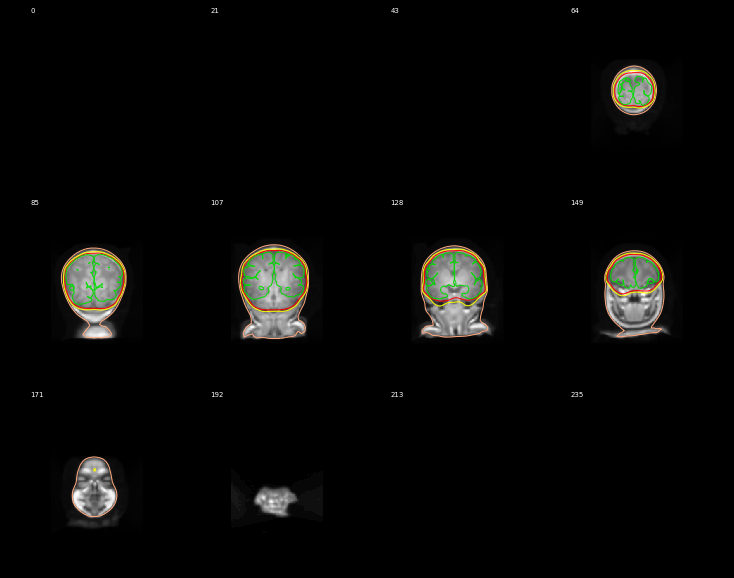

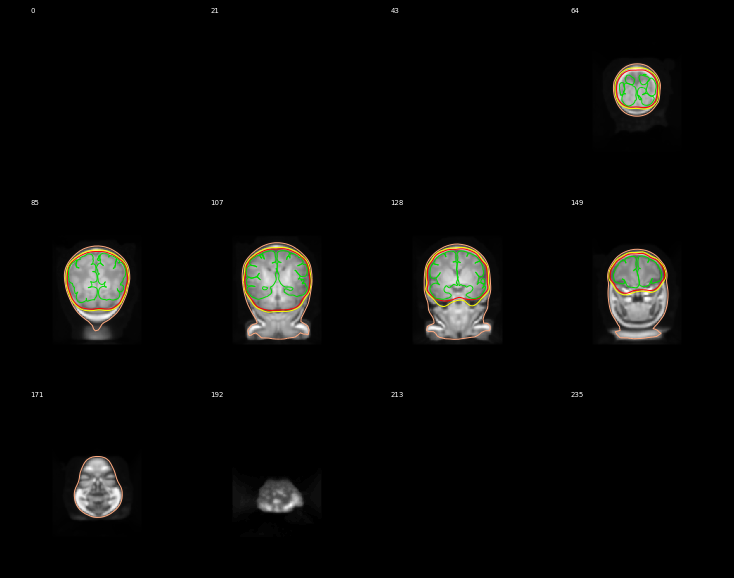

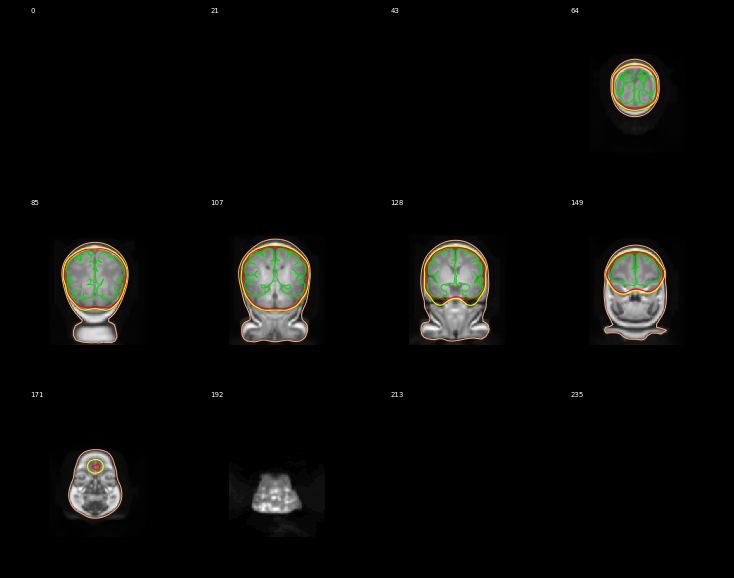

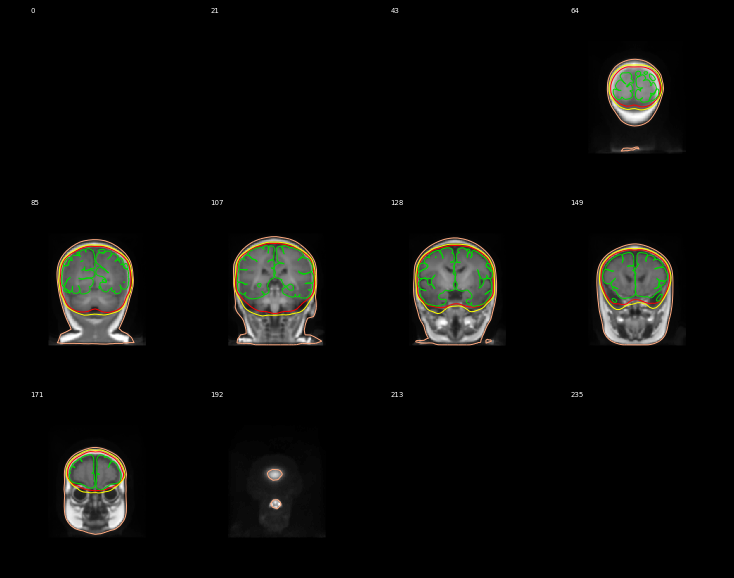

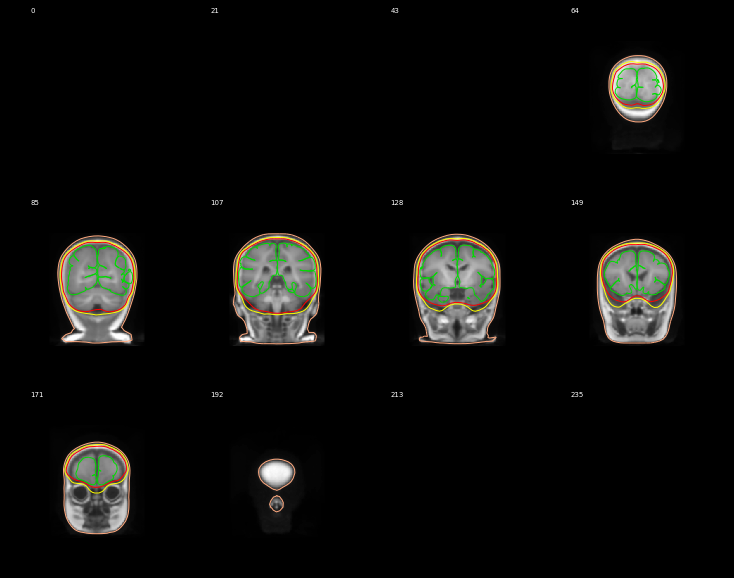

...

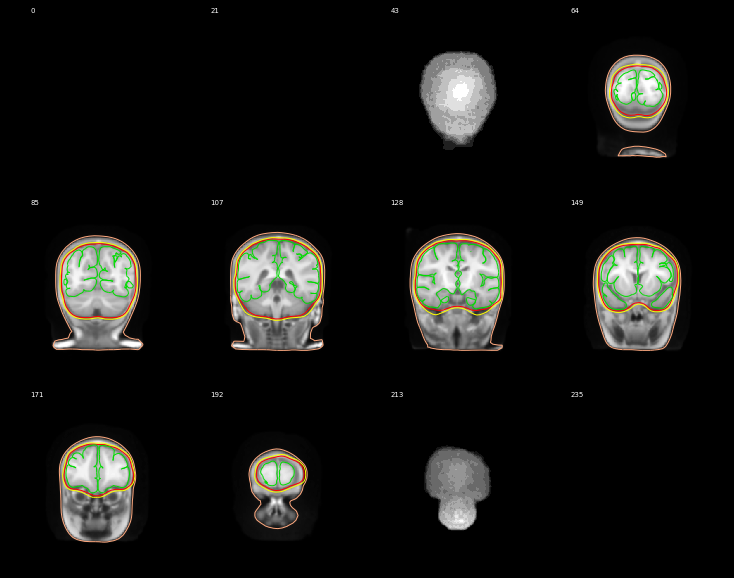

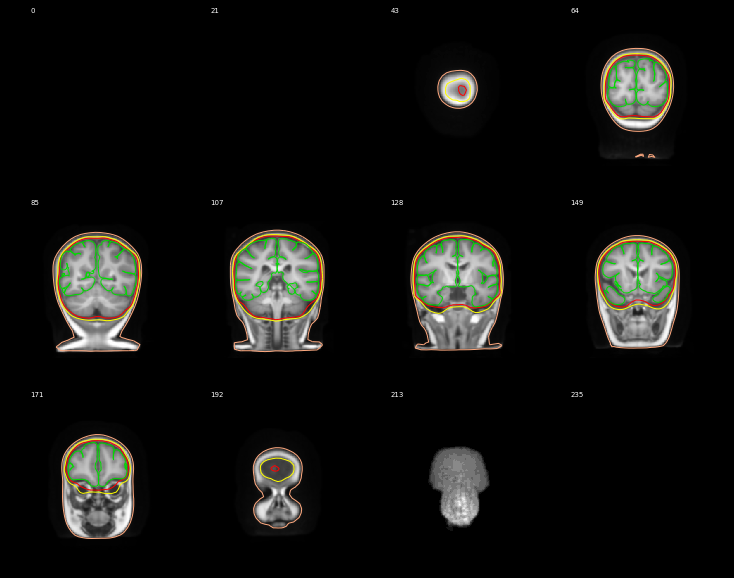

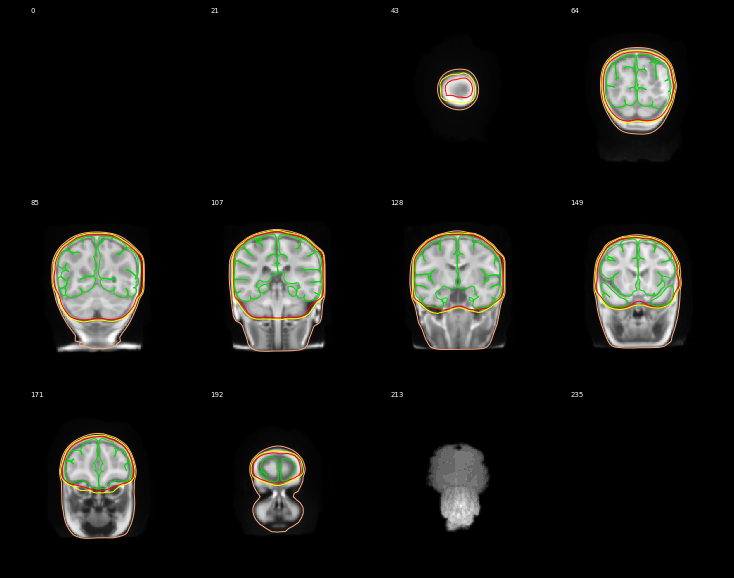

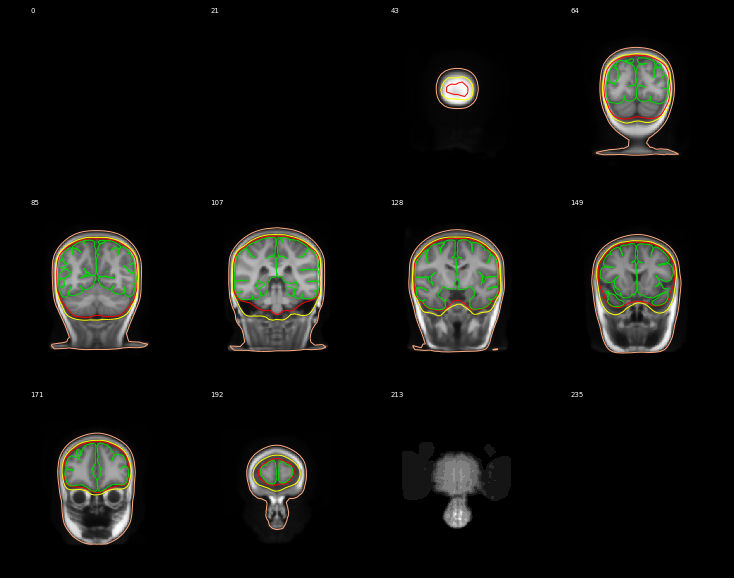

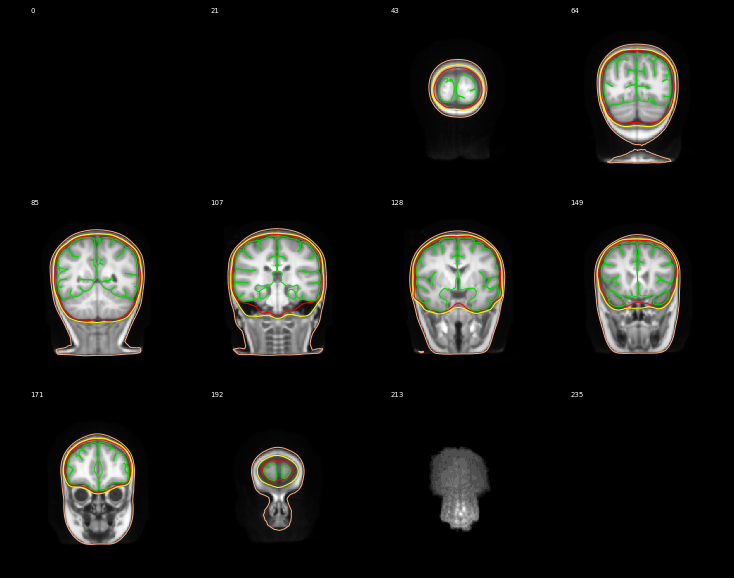

In [13]:
for subject in subjects:    
    print("Processing {}".format(subject))
    atlas = Atlas(subjects_dir=fs_subject_path, fs_subject=subject)
    fig = atlas.plot_bem(brain_surfaces='pial', orientation='coronal', show=False)
    fig.set_size_inches(10, 8, forward=True)        

# Loading fiducials 

In [118]:
""" From NMD
0—mm coordinates of AC in head
1—posterior commissure
2—nasion (Nz)
3—inion  (Iz)
4—left preauricular point (LPA)
5—right preauricular point (RPA)
6—left mastoid (LMA)
7—right mastoid (RMA)
8—left outer canthii for EOG (LEOG)
9—right outer canthii  for EOG (REOG)
10—left EMG cheek (LEMG)
11—right EMG check (REMG)
12—mid EOG on nose 
13—vertex (Cz)
"""

#fiducial_labels = ["LPA", "Nz", "RPA", "AC", "PC", "Iz", "LMA", 
#                   "RMA", "LEOG", "REOG", "LEMG", "REMG", 
#                   "mid_EOG_nose", "Cz", "IH"]

fiducial_labels = ["AC", "PC", "Nz", "Iz", "LPA", "RPA", "LMA", 
                   "RMA", "LEOG", "REOG", "LEMG", "REMG", 
                   "mid_EOG_nose", "Cz", "IH"]

In [119]:
montages = {}
fiducials = {}
head_fiducials = []
brain_fiducials = []
for subject in subjects:
    age_str = parse("ANTS{}", subject).fixed[0]
    path = get_source_file(mnd_root_path, subject.replace("ANTS", "AVG"), "Sources/Electrodes", 
                            "fiducial_electrodes", extension="txt")
    print(path)    
    
    with path.open('r') as tsv_file:
        tsv_file.readline()
        reader = csv.reader(tsv_file, delimiter=' ', lineterminator='\n')
        fiducials[age_str] = {label: np.array([float(x), float(y), float(z)]) # - delta 
                                  for label, (_, x, y, z) in zip(fiducial_labels, reader)}              
        
    volume_info = read_geometry(fs_subject_path / subject / "bem" / "outer_skull.surf", 
                                                       read_metadata=True)[2] 

    # The fiducials are defined with respect to AC, AC being at [0, 0, 0] in the Talairach/MNI system
    fiducials[age_str]["AC"] = np.array([0, 0, 0])
    
    delta = volume_info["cras"] #/1000      
    delta = np.zeros(3)

    #tmp = np.vstack((pd.DataFrame(fiducials[age_str]).values*1000 - delta.reshape((3, 1)), np.ones((1, 14))))/1000
    tmp = pd.DataFrame(fiducials[age_str]).T #.values
    #tmp = pd.DataFrame(tmp).T
    tmp.index = list(fiducials[age_str].keys())

    head_fiducials.append(np.concatenate((tmp.loc["LPA"], 
                                          tmp.loc["Nz"], 
                                          tmp.loc["RPA"])))
    brain_fiducials.append(np.concatenate((tmp.loc["AC"], 
                                           tmp.loc["PC"])))

/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG2-0Weeks3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG1-0Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG2-0Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG3-0Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG4-5Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG6-0Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG7-5Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG9-0Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG10-5Months3T_fiducial_electrodes.txt
/media/christian/ElementsSE/Richards/Infants/Sources/Electrodes/AVG12-0Mo

In [120]:
tmp = pd.DataFrame(np.stack(head_fiducials))
tmp.index = list(ages.values())
tmp.columns = ["LPA_x", "LPA_y", "LPA_z", "NAS_x", "NAS_y", "NAS_z", "RPA_x", "RPA_y", "RPA_z"]
tmp*1000

,LPA_x,LPA_y,LPA_z,NAS_x,NAS_y,NAS_z,RPA_x,RPA_y,RPA_z
2 weeks,-41.0,5.0,-34.0,-1.0,48.0,6.0,39.0,4.0,-33.0
1 month,-41.0,4.0,-36.0,-1.0,49.0,-1.0,41.0,3.0,-34.0
2 months,-44.0,3.0,-33.0,0.0,49.0,4.0,43.0,0.0,-31.0
3 months,-53.0,-7.0,-43.0,0.0,54.0,-16.0,53.0,-9.0,-41.0
4.5 months,-54.0,-9.0,-41.0,-1.0,57.0,-15.0,53.0,-8.0,-42.0
6 months,-53.0,-13.0,-44.0,3.0,54.0,-23.0,55.0,-15.0,-43.0
7.5 months,-56.0,-12.0,-43.0,-2.0,60.0,-15.0,55.0,-8.0,-44.0
9 months,-57.0,-12.0,-43.0,-1.0,57.0,-19.0,53.0,-11.0,-45.0
10.5 months,-60.0,-18.0,-41.0,-1.0,60.0,-23.0,56.0,-15.0,-47.0
12 months,-58.0,-6.0,-46.0,1.0,63.0,-16.0,57.0,-8.0,-48.0


In [121]:
tmp = pd.DataFrame(np.stack(brain_fiducials))
tmp.index = list(ages.values())
tmp.columns = ["AC_x", "AC_y", "AC_z", "PC_x", "PC_y", "PC_z"]
tmp*1000

,AC_x,AC_y,AC_z,PC_x,PC_y,PC_z
2 weeks,0.0,0.0,0.0,-1.0,-18.0,-3.0
1 month,0.0,0.0,0.0,-1.0,-18.0,-4.0
2 months,0.0,0.0,0.0,-1.0,-20.0,-3.0
3 months,0.0,0.0,0.0,-1.0,-20.0,0.0
4.5 months,0.0,0.0,0.0,-1.0,-21.0,1.0
6 months,0.0,0.0,0.0,-1.0,-22.0,1.0
7.5 months,0.0,0.0,0.0,-1.0,-21.0,1.0
9 months,0.0,0.0,0.0,-1.0,-22.0,1.0
10.5 months,0.0,0.0,0.0,-1.0,-23.0,1.0
12 months,0.0,0.0,0.0,-1.0,-21.0,-3.0


In [122]:
# The IH point is not defined in the MND, so 
# we found it manually in Brainstorm
ih = {"2-0Weeks3T": [1.5, -29.5, 32.5],
      "1-0Months3T": [2.5, -20.0, 35.5],
      "2-0Months3T": [1.0, -36.0, 32.5], 
      "3-0Months3T": [10.0, -24.0, 45.5], 
      "4-5Months3T": [-0.5, -36.5, 49.9], 
      "6-0Months3T": [4.0, -33.5, 45.0], 
      "7-5Months3T": [1.0, -31.0, 40.5], 
      "9-0Months3T": [0.5, -35.0, 42.0], 
      "10-5Months3T": [0.0, -26.5, 52.50], 
      "12-0Months3T": [0.5, -35.0, 47.0], 
      "15-0Months3T": [1.0, -40.0, 49.5], 
      "18-0Months3T": [2.0, -38.5, 53.0], 
      "2-0Years3T": [2.0, -42.5, 50.5]}     

for subject in fiducials:
    fiducials[subject]["IH"] = np.array(ih[subject])/1000.0  

# Saving montages

In [123]:
# As per Neurodevelopmental MRI Database documentation
ch_names = {
    "HGSN128": ["E" + str(i+1) for i in range(128)], 
    "10-5": [ 'NZ', 'FPZ', 'AFZ', 'FZ', 'FCZ', 'CZ', 'CPZ', 'PZ', 'POZ', 'OZ', 'IZ',
              'N1', 'AF9', 'F9', 'FT9', 'T9', 'TP9', 'P9', 'PO9', 'I1',
              'N2', 'AF10', 'F10', 'FT10', 'T10', 'TP10', 'P10', 'PO10', 'I2',
              'FP1', 'AF7', 'F7', 'FT7', 'T7', 'TP7', 'P7', 'PO7', 'O1',
              'FP2', 'AF8', 'F8', 'FT8', 'T8', 'TP8', 'P8', 'PO8', 'O2', 'AF3', 'AF4',
              'F5', 'F3', 'F1', 'F2', 'F4', 'F6', 'FC5', 'FC3', 'FC1', 'FC2', 'FC4', 'FC6',
              'C5', 'C3', 'C1', 'C2', 'C4', 'C6', 'CP5', 'CP3', 'CP1', 'CP2', 'CP4', 'CP6',
              'P5', 'P3', 'P1', 'P2', 'P4', 'P6', 'PO3', 'PO4',
              'NZ_FPZ', 'NZ_N1', 'NZ_N2', 'FPZ_AFZ', 'FPZ_N1', 'FPZ_N2', 'FPZ_AF3', 
              'FPZ_AF4', 'FPZ_FP1', 'FPZ_FP2', 'AFZ_FZ', 'AFZ_FP1', 'AFZ_FP2', 'AFZ_AF3', 
              'AFZ_AF4', 'AFZ_F1', 'AFZ_F2', 'FZ_FCZ', 'FZ_AF3', 'FZ_AF4', 'FZ_F1', 'FZ_F2', 
              'FZ_FC1', 'FZ_FC2', 'FCZ_CZ', 'FCZ_F1', 'FCZ_F2', 'FCZ_FC1',
              'FCZ_FC2', 'FCZ_C1', 'FCZ_C2', 'CZ_CPZ', 'CZ_FC1', 'CZ_CP3', 'CZ_C1', 'CZ_C2', 
              'CZ_CP1', 'CZ_CP2', 'CPZ_PZ', 'CPZ_C1', 'CPZ_C2', 'CPZ_CP1', 'CPZ_CP2', 'CPZ_P1', 
              'CPZ_P2', 'PZ_POZ', 'PZ_CP1', 'PZ_CP2', 'PZ_P1', 'PZ_P2', 'PZ_PO3', 'PZ_PO4',
              'POZ_OZ', 'POZ_O1', 'POZ_O2', 'POZ_P5', 'POZ_P2', 'POZ_PO3', 'POZ_PO4'  'OZ_IZ', 
              'OZ_O1', 'OZ_O2', 'OZ_I1', 'OZ_I2', 'IZ_I1', 'IZ_I2', 'IZ_PO10', 'IZ_O2', 'N1_AF9', 
              'N1_FP1', 'N1_AF7', 'AF9_F9', 'AF9_FP1', 'AF9_AF7', 'AF9_F7', 'F9_FT9', 'F9_AF7', 
              'F9_F7', 'F9_FT7', 'FT9_T9', 'FT9_F7', 'FT9_FT7', 'FT9_T7', 'T9_TP9', 'T9_FT7', 'T9_T7' , 
              'T9_TP7', 'TP9_P9', 'TP9_T7', 'TP9_TP7', 'TP9_P7', 'P9_PO9', 'P9_TP7', 'P9_P7',
              'P9_PO7', 'PO9_I1', 'PO9_P7', 'PO9_PO7', 'PO9_O1', 'I1_PO7', 'I1_O1', 'N2_AF10', 
              'N2_FP2', 'N2_AF4', 'AF10_F10', 'AF10_FP2', 'AF10_AF8', 'AF10_F8', 'F10_FT10', 
              'F10_AF8', 'F10_F8', 'F10_FT8', 'FT10_T10', 'FT10_F8', 'FT10_FT8', 'FT10_T8', 
              'T10_TP10', 'T10_FT8', 'T10_T8', 'T10_TP8', 'TP10_P10', 'TP10_T8', 'TP10_TP8', 
              'TP10_P8', 'P10_PO10', 'P10_TP8', 'P10_P8', 'P10_PO8', 'PO10_I2', 'PO10_P8', 
              'PO10_PO8', 'PO10_O2', 'I2_PO8', 'I2_O2', 'FP1_AF7', 'FP1_AF3', 'AF7_F7', 'AF7_AF3', 'AF7_F5', 
              'F7_FT7', 'F7_F5', 'F7_FC5', 'FT7_T7', 'FT7_F5', 'FT7_FC5', 'FT7_C5', 'T7_TP7', 'T7_FC5',
              'T7_C5', 'T7_CP5', 'TP7_P7', 'TP7_C5', 'TP7_CP5', 'TP7_P5', 'P7_PO7', 'P7_CP5', 'P7_P5',
              'PO7_O1', 'PO7_P5', 'PO7_PO3', 'O1_PO3', 'FP2_AF8', 'FP2_AF4', 'AF8_F8', 'AF8_AF4',
              'AF8_F6', 'AF8_FC6', 'F8_FT8', 'F8_F6', 'F8_FC6', 'FT8_T8', 'FT8_F6', 'FT8_FC6', 'FT8_C6', 
              'T8_TP8', 'T8_FC6', 'T8_C6', 'T8_CP6', 'TP8_P8', 'TP8_C6', 'TP8_CP6', 'TP8_P6', 'P8_PO8', 
              'P8_CP6', 'P8_P6', 'PO8_O2', 'PO8_P6', 'PO8_PO4', 'O2_PO4', 'AF3_F5', 'AF3_F3', 'AF3_F1', 
              'AF4_F2', 'AF4_F4', 'AF4_F6', 'F5_F3', 'F5_FC5', 'F5_FC3', 'F3_F1', 'F3_FC5', 'F3_FC3', 
              'F3_FC1', 'F1_FC3', 'F1_FC1', 'F2_F4', 'F2_FC2', 'F2_FC4', 'F4_F6', 'F4_FC2', 'F4_FC4', 
              'F4_FC6', 'F6_FC4', 'F6_FC6', 'FC5_FC3', 'FC5_C5', 'FC5_C3', 'FC3_FC1', 'FC3_C5', 'FC3_C3', 
              'FC3_C1', 'FC1_C3', 'FC1_C1', 'FC2_FC4', 'FC2_C2', 'FC2_C4' , 
              'FC4_FC6', 'FC4_C2', 'FC4_C4', 'FC4_C6', 'FC6_C4', 'FC6_C6', 'C5_C3', 'C5_CP5', 'C5_CP3',
              'C3_C1', 'C3_CP5', 'C3_CP3', 'C3_CP1', 'C1_CP3', 'C1_CP1', 'C2_C4', 'C2_CP2', 'C2_CP4', 'C4_C6', 
              'C4_CP2', 'C4_CP4', 'C4_CP6', 'C6_CP4', 'C6_CP6', 'CP5_CP3', 'CP5_P5', 'CP5_P3', 'CP3_CP1', 
              'CP3_P5', 'CP3_P3', 'CP3_P1', 'CP1_P3', 'CP1_P1', 'CP2_CP4', 'CP2_P2', 'CP2_P4', 'CP4_CP6', 
              'CP4_P2', 'CP4_P4', 'CP4_P6', 'CP6_P4', 'CP6_P6', 'P5_P3', 'P5_PO3', 'P3_P1', 'P3_PO3', 
              'P1_PO3', 'P2_P4', 'P2_PO4', 'P4_P6', 'P4_PO4', 'P6_PO4'], 
    "10-10": ['NZ', 'FPZ', 'AFZ', 'FZ', 'FCZ', 'CZ', 'CPZ', 'PZ', 'POZ', 'OZ', 'IZ',
              'N1', 'AF9', 'F9', 'FT9', 'T9', 'TP9', 'P9', 'PO9', 'I1',
              'N2', 'AF10', 'F10', 'FT10', 'T10', 'TP10', 'P10', 'PO10', 'I2',
              'FP1', 'AF7', 'F7', 'FT7', 'T7', 'TP7', 'P7', 'PO7', 'O1',
              'FP2', 'AF8', 'F8', 'FT8', 'T8', 'TP8', 'P8', 'PO8', 'O2',
              'AF3', 'AF4', 'F5', 'F3', 'F1', 'F2', 'F4', 'F6',
              'FC5', 'FC3', 'FC1', 'FC2', 'FC4', 'FC6', 'C5', 'C3', 'C1', 'C2', 'C4', 'C6',
              'CP5', 'CP3', 'CP1', 'CP2', 'CP4', 'CP6', 'P5', 'P3', 'P1', 'P2', 'P4', 'P6',
              'PO3', 'PO4'], 
    "10-20": ['FZ', 'CZ', 'PZ', 'OZ', 'FP1', 'FP2', 'F3', 'F4', 'F7', 'F8', 
              'C3', 'C4', 'T7', 'T8', 'P3', 'P4', 'P7', 'P8', 'O1', 'O2']
}

In [124]:
def correct_positions(subject, ch_pos, verbose=False):
    path = str(fs_subject_path / subject / "bem" / "outer_skin.surf")
    vertices, faces, volume_info_ = read_geometry(path, read_metadata=True)
    mesh = trimesh.Trimesh(vertices=vertices, faces=faces)

    pos = np.array(list(ch_pos.values()))
    new_pos, dist = trimesh.proximity.closest_point(mesh, pos)[:2]
    
    if verbose:
        print(subject, dist.mean(0), dist.std(0), np.abs(pos-new_pos).mean(0))
    return {key:pos for key, pos in zip(ch_pos.keys(), new_pos)}


def save_montage(brain_fiducials, ch_pos, subject, montage_str):
    

    # BIDS format TSV channel files
    x, y, z = zip(*ch_pos.values())
    df_pos = {"x": x, "y": y, "z": z}
    df_pos["name"] = list(ch_pos.keys())
    df_pos = pd.DataFrame(df_pos)[["name", "x", "y", "z"]]
    montage_fname = fs_subject_path / subject / "{}_electrodes.tsv".format(montage_str)
    df_pos.to_csv(montage_fname, sep="\t", index=False)
    
    # FIF format channel file    
    hsp = np.array(list(brain_fiducials.drop(["Nz", "LPA", "RPA"]).values))/1000.0
    montage = mne.channels.make_dig_montage(ch_pos={k:v/1000.0 for k, v in ch_pos.items()},
                                            nasion=brain_fiducials.loc["Nz"].values/1000.0,
                                            lpa=brain_fiducials.loc["LPA"].values/1000.0,
                                            rpa=brain_fiducials.loc["RPA"].values/1000.0,
                                            hsp=hsp,
                                            coord_frame="mri")    

    montage_fname = fs_subject_path / subject / "{}-montage.fif".format(montage_str)
    montage.save(montage_fname)
    montages[montage_str][subject] = montage

    
montages = {}
montage_strs = ["HGSN128", "10-5", "10-10", "10-20"]
montages = {s: {} for s in montage_strs}
montages["HGSN129"] = {}
for subject in subjects:
    for montage_str in montage_strs:
        path = get_source_file(mnd_root_path, subject.replace("ANTS", "AVG"), "Sources/Electrodes", 
                               "{}_electrodes".format(montage_str), extension="txt", missing=None)    
        age_str = parse("ANTS{}", subject).fixed[0]
        
        with path.open('r') as tsv_file:
            tsv_file.readline()  # Discarding the header line
            reader = csv.reader(tsv_file, delimiter=' ', lineterminator='\n')
            # Positions in this files are in RAS

            volume_info = read_geometry(fs_subject_path / subject / "bem" / "outer_skull.surf", 
                                                               read_metadata=True)[2] 

            delta = volume_info["cras"]      

            #print(delta)
            ch_pos = {ch_name:(np.array([[float(x), float(y), float(z)]])*1000 - delta)[0, :3] 
                      for ch_name, (_, x, y, z) in zip(ch_names[montage_str], list(reader))}
            ch_pos = correct_positions(subject, ch_pos, verbose=True)

            tmp = np.vstack((pd.DataFrame(fiducials[age_str]).values*1000 - delta.reshape((3, 1)), 
                             np.ones((1, 15))))
            brain_fiducials = pd.DataFrame(tmp.T[:, :3])
            brain_fiducials.index = list(fiducials[age_str].keys())                
            
        # Correct the fiducial positions so that they fall precisely on the BEM surface
        corrected_brain_fiducials = {label:brain_fiducials.loc[label].values for label in brain_fiducials.index}
        corrected_brain_fiducials = correct_positions(subject, corrected_brain_fiducials)
        
        # ... but don't correct the internal fiducials!
        corrected_brain_fiducials["AC"] = brain_fiducials.loc["AC"].values
        corrected_brain_fiducials["PC"] = brain_fiducials.loc["PC"].values   
        corrected_brain_fiducials["IH"] = brain_fiducials.loc["IH"].values   

        brain_fiducials.loc[list(corrected_brain_fiducials.keys())] = np.array(list(corrected_brain_fiducials.values()))
            
        save_montage(brain_fiducials, ch_pos, subject, montage_str)
        if montage_str == "HGSN128":
            ch_pos["E129"] = brain_fiducials.loc["Cz"].values # Reference channel      
            save_montage(brain_fiducials, ch_pos, subject, "HGSN129")
        
        
    # Fiducial
    brain_fiducials = brain_fiducials.reset_index()
    brain_fiducials.columns = ["name", "x", "y", "z"]
    fiducials_fname = fs_subject_path / subject / "fiducials.tsv".format(montage_str)
    brain_fiducials.to_csv(fiducials_fname, sep="\t", index=False)        

ANTS2-0Weeks3T 1.6746008311869365 1.0784828003476108 [1.02129725 0.78533673 0.65862729]
ANTS2-0Weeks3T 3.1129344354152475 2.068180821580733 [1.88764329 1.39822247 1.32390405]
ANTS2-0Weeks3T 2.309288392976761 1.741539429218783 [1.46153479 1.05190106 0.89496269]
ANTS2-0Weeks3T 2.337376663947499 1.7303660140009585 [1.32304322 1.22966028 0.9269667 ]
ANTS1-0Months3T 0.8430835836713761 0.5777633718339497 [0.54349765 0.38055933 0.29601836]
ANTS1-0Months3T 2.2067519623733767 1.3987102762519457 [1.48644357 0.9249845  0.78516259]
ANTS1-0Months3T 2.014538021864256 1.1084798822211255 [1.23950708 0.84912799 0.83600028]
ANTS1-0Months3T 2.2420502860980265 1.0231696757452204 [1.30041429 1.0842042  0.85573856]
ANTS2-0Months3T 1.4691245164420135 1.003733471454526 [0.84933007 0.61973428 0.70902595]
ANTS2-0Months3T 3.072508866800798 1.6896964170685094 [1.97334811 1.38744231 1.14821405]
ANTS2-0Months3T 2.205119287747605 1.4723974816613348 [1.48907733 1.00746773 0.70850299]
ANTS2-0Months3T 2.35075187321323 

In [87]:
def sphere_mesh(pos, radius, color=None):
    mesh = trimesh.creation.icosphere(radius=radius, color=color)
    mesh.vertices += pos
    return mesh

for subject in tqdm(subjects):
    for montage_str in ["10-5", "10-10", "10-20", "HGSN128"]:
        path = fs_subject_path / subject / f"{montage_str}-montage.fif" 

        montage = mne.channels.read_dig_fif(path)
        
        montage_meshes = []
        for dig in montage.dig:
            label = str(dig).split("|")[1].split(":")[0].strip()
            pos = dig["r"]*1000.0
            if "EEG" in label:
                montage_meshes.append(sphere_mesh(pos, 2.5))
            
        montage_mesh = trimesh.util.concatenate(montage_meshes)
        
        path_out = fs_subject_path / subject / "surf" / path.with_suffix(".obj").name
        with path_out.open('w') as file_obj:
            file_obj.write(trimesh.exchange.obj.export_obj(montage_mesh))
            
            
        path_white = fs_subject_path / subject / "surf" / "lh.white"
        volume_info = read_geometry(path_white, read_metadata=True)[2]            
            
        path_out = fs_subject_path / subject / "surf" / path.with_suffix(".surf").name
        write_geometry(str(path_out), montage_mesh.vertices, montage_mesh.faces, 
                       volume_info=volume_info)
        
        if montage_str == "HGSN128":
            montage_meshes = []
            for dig in montage.dig:
                label = str(dig).split("|")[1].split(":")[0].strip()
                pos = dig["r"]*1000.0
                if not "EEG" in label:
                    montage_meshes.append(sphere_mesh(pos, 2.5))

            montage_mesh = trimesh.util.concatenate(montage_meshes)

            path_out = fs_subject_path / subject / "surf" / "fiducials.obj"
            with path_out.open('w') as file_obj:
                file_obj.write(trimesh.exchange.obj.export_obj(montage_mesh))

            path_white = fs_subject_path / subject / "surf" / "lh.white"
            volume_info = read_geometry(path_white, read_metadata=True)[2]            

            path_out = fs_subject_path / subject / "surf" / "fiducials.surf"
            write_geometry(str(path_out), montage_mesh.vertices, montage_mesh.faces, 
                           volume_info=volume_info)        

In [99]:
# Tend to crash notebooks. Running this code out of jupyter.
!python plot_sensors.py 

  0%|                                                    | 0/13 [00:00<?, ?it/s]Processing  ANTS2-0Weeks3T ...
Using outer_skin.surf for head surface.
Using pyvista 3d backend.

Using outer_skin.surf for head surface.
  8%|███▍                                        | 1/13 [00:08<01:43,  8.66s/it]Processing  ANTS1-0Months3T ...
Using outer_skin.surf for head surface.
Using outer_skin.surf for head surface.
 15%|██████▊                                     | 2/13 [00:17<01:34,  8.58s/it]Processing  ANTS2-0Months3T ...
Using outer_skin.surf for head surface.
Using outer_skin.surf for head surface.
 23%|██████████▏                                 | 3/13 [00:25<01:25,  8.59s/it]Processing  ANTS3-0Months3T ...
Using outer_skin.surf for head surface.
Using outer_skin.surf for head surface.
 31%|█████████████▌                              | 4/13 [00:33<01:16,  8.51s/it]Processing  ANTS4-5Months3T ...
Using outer_skin.surf for head surface.
Using outer_skin.surf for head surface.
 38%|█████████

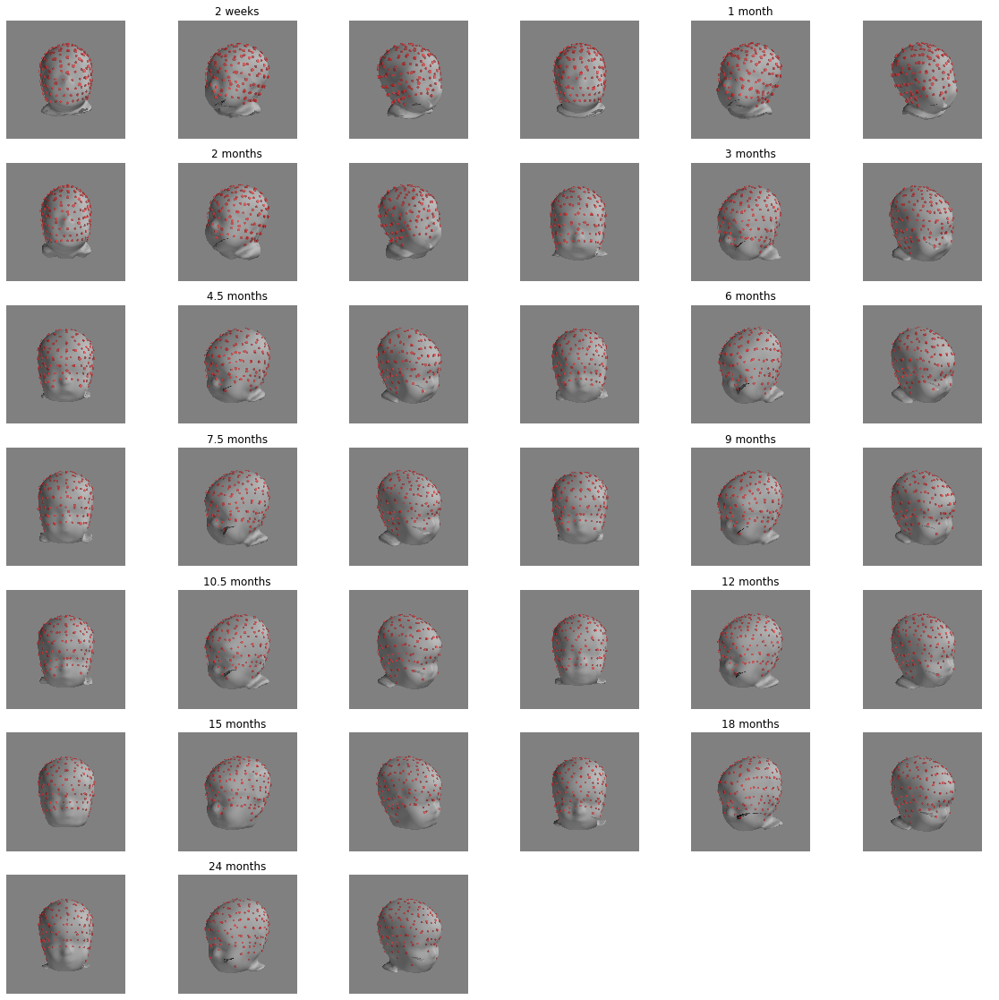

In [115]:
fig, axes = plt.subplots(7, 6, figsize=(20, 20))

def ax_gen(): 
    for ax_ in axes.ravel(): yield ax_

gen = ax_gen()      
for subject in ages:
    for i in [1, 2, 3]:
        ax = next(gen)
        img = mpimg.imread("images/{}_{}.png".format(subject, i))
        ax.imshow(img)
        ax.axis("off")        
        if i == 2:
            ax.set_title(ages[subject])

for _ in range(3):
    ax = next(gen)
    ax.axis("off")            

fig.savefig("images/sensor_coregistration.png")

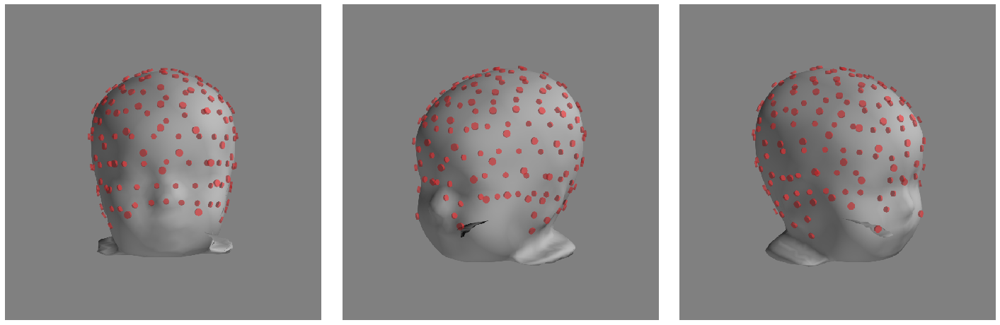

In [114]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6.5))

def ax_gen(): 
    for ax in axes.ravel(): yield ax

gen = ax_gen()      
subject = 'ANTS12-0Months3T'
for i in [1, 2, 3]:
    ax = next(gen)
    img = mpimg.imread("images/{}_{}.png".format(subject, i))
    ax.imshow(img)
    ax.axis("off")        

fig.tight_layout()
fig.savefig("images/sensor_coregistration_example_12mo.png")

# Making obj meshes from freesurfer brain (pial, wm) surfaces for visualization in blender

In [103]:
for subject in subjects:
    for file_name in ["lh.white", "rh.white", "lh.pial", "rh.pial"]:   
        path_fs = fs_subject_path / subject / "surf" / file_name

        try:
            coords, faces = read_geometry(path_fs)
        except:
            raise

        bem_output_path = fs_subject_path / subject / "bem" / file_name.replace(".", "_")
        bem_output_path = bem_output_path.with_suffix(".obj")
        bem_output_path.parent.mkdir(parents=True, exist_ok=True)

        mesh = trimesh.Trimesh(vertices=coords, faces=faces)
        with bem_output_path.open("w") as file_obj:
             file_obj.write(trimesh.exchange.obj.export_obj(mesh))

In [104]:
# Blender code
# /home/christian/gdrive/Publications (current)/Journal/infants atlas/models.blend
"""
#----------------------------------------------------------
# File chain.py
# Creates an array modifier and applies it
# Update to API rev. 36523
#----------------------------------------------------------
import bpy, bmesh
import math
from math import pi
import numpy as np


def hex_to_rgb( hex_value ):
    b = (hex_value & 0xFF) / 255.0
    g = ((hex_value >> 8) & 0xFF) / 255.0
    r = ((hex_value >> 16) & 0xFF) / 255.0
    return r, g, b

def get_material(material_name, h):
    material = bpy.data.materials.get(material_name)
    if material is None:
        material = bpy.data.materials.new(material_name)
    material.use_nodes = True
    principled_bsdf = material.node_tree.nodes['Principled BSDF']
    if principled_bsdf is not None:
        # Base color
        principled_bsdf.inputs[0].default_value = (*hex_to_rgb(h), 1)  
        # Alpha
        principled_bsdf.inputs[18].default_value = 1.0  
        
    #material.use_transparency = False
    return material

def clear_scene():
    context = bpy.context
    scene = context.scene

    objs = bpy.data.objects
    for obj in objs:
        objs.remove(obj, do_unlink=True)
        
    # Save and re-open the file to clean up the data blocks
    bpy.ops.wm.save_as_mainfile(filepath=bpy.data.filepath)
    bpy.ops.wm.open_mainfile(filepath=bpy.data.filepath)


def add_camera():
    context = bpy.context
    scene = context.scene
    
    cam = bpy.data.cameras.new("main_cam")
    cam_obj = bpy.data.objects.new("main_cam", cam)
    bpy.context.collection.objects.link(cam_obj)
    cam_obj.location = (0, 0.03, 4)
    cam.clip_end = 5
    cam.clip_start = 0
    cam.lens = 140
    cam.lens = 80
    cam.display_size = 5
    cam.dof.focus_distance = 4
    cam_obj.rotation_euler[2] = 3.14159
    
    #scene.render.pixel_aspect_y = 4
    #scene.render.pixel_aspect_x = 3
    scene.render.film_transparent = True



def add_light():
    
    scene = bpy.context.scene

    # Create new lamp datablock
    lamp_data = bpy.data.lights.new(name="lamp", type='POINT')
    lamp_data.energy = 1000
    lamp_data.shadow_soft_size = 11

    # Create new object with our lamp datablock
    lamp_object = bpy.data.objects.new(name="lamp", object_data=lamp_data)

    # Link lamp object to the scene so it'll appear in this scene
    scene.collection.objects.link(lamp_object)

    # Place lamp to a specified location
    lamp_object.location = (-2.75692, -3.90951, 3.34581)

    # And finally select it make active
    bpy.context.view_layer.objects.active = lamp_object    


def import_subject(subject, pos, materials):
    for component in ["bem/outer_skin_large", "bem/outer_skull_large", "bem/inner_skull_large",
                      ]:
        filepath = "/usr/local/freesurfer/subjects/{}/bem/{}.obj".format(subject, component)
        name = "{}_{}".format(subject, component)
        bpy.ops.import_scene.obj(filepath = filepath)
        imported_object = [obj for obj in bpy.data.objects if obj.tag is False][0]
        imported_object.name = name
        imported_object.scale = (1e-3, 1e-3, 1e-3)
        imported_object.location.xyz = pos
        imported_object.tag = True
        if component == "outer_skin":
            imported_object.active_material = materials["skin"]
        else:
            imported_object.active_material = materials["bones"]
                
        # Cut
        bm = bmesh.new()
        bm.from_mesh(imported_object.data)
        verts_to_delete = [g for g in bm.verts[:] if g.co[0] > pos[0] and g.co[2] > pos[2]]
        bmesh.ops.delete(bm, geom=verts_to_delete, context="VERTS")
        bm.to_mesh(imported_object.data)
        bm.free()   

        imported_object.rotation_euler[0] = 1.22173
        imported_object.rotation_euler[1] = -0.349066

    for component in ["lh_white", "rh_white", "lh_pial", "rh_pial"]:
        filepath = "/usr/local/freesurfer/subjects/{}/bem/{}.obj".format(subject, component)
        name = "{}_{}".format(subject, component)
        try:
            bpy.ops.import_scene.obj(filepath = filepath)
        except:
            return
        imported_object = [obj for obj in bpy.data.objects if obj.tag is False][0]
        imported_object.name = name
        imported_object.scale = (1e-3, 1e-3, 1e-3)
        imported_object.location.xyz = pos
        imported_object.tag = True
        imported_object.active_material = materials["pial"]
        
        imported_object.rotation_euler[0] = 1.22173
        imported_object.rotation_euler[1] = -0.349066     


def run():
    
    clear_scene()
    for obj in bpy.data.objects:
        obj.tag = True

    babies = [["ANTS2-0Weeks3T", "ANTS1-0Months3T", "ANTS2-0Months3T", "ANTS3-0Months3T", "ANTS4-5Months3T"],
              ["ANTS6-0Months3T", "ANTS7-5Months3T", "ANTS9-0Months3T", "ANTS10-5Months3T", "ANTS12-0Months3T"], 
              ["ANTS15-0Months3T", "ANTS18-0Months3T", "ANTS2-0Years3T"]]         

    materials = {}
    materials["skin"] = get_material("skin", 0xBD826E)
    materials["pial"] = get_material("pial", 0x737475)
    materials["bones"] = get_material("pial", 0xFFFFFF)
    materials["fiducials"] = get_material("pial", 0xFF0000)
    materials["electrodes"] = get_material("pial", 0x0000FF)

    y = -0.25
    for no_row, subject_row in enumerate(babies):
        x = 0.175*2.0
        for no_col, subject in enumerate(subject_row):
            import_subject(subject, [x, y, 0], materials)
            x -= 0.175
        y += 0.25


    bpy.context.scene.unit_settings.length_unit = 'MILLIMETERS'
    add_camera()
    add_light()


    return


if __name__ == "__main__":
    run()

""";

# Command to check the quality of the models in FreeView

In [105]:
for subject in subjects:
    print("""
subject_path={path}
freeview -v $subject_path/brainmask.nii.gz \\
            $subject_path/mprage.nii.gz \\
         -f $subject_path/surf/lh.pial:edgecolor=red \\
            $subject_path/surf/rh.pial:edgecolor=red \\
            $subject_path/surf/lh.white:edgecolor=blue \\
            $subject_path/surf/rh.white:edgecolor=blue \\
            $subject_path/bem/outer_skin.surf:edgecolor=yellow \\
            $subject_path/bem/outer_skull.surf:edgecolor=purple \\
            $subject_path/bem/inner_skull.surf:edgecolor=yellow    
""".format(path=fs_subject_path / subject))

    


subject_path=/usr/local/freesurfer/subjects/ANTS2-0Weeks3T
freeview -v $subject_path/brainmask.nii.gz \
            $subject_path/mprage.nii.gz \
         -f $subject_path/surf/lh.pial:edgecolor=red \
            $subject_path/surf/rh.pial:edgecolor=red \
            $subject_path/surf/lh.white:edgecolor=blue \
            $subject_path/surf/rh.white:edgecolor=blue \
            $subject_path/bem/outer_skin.surf:edgecolor=yellow \
            $subject_path/bem/outer_skull.surf:edgecolor=purple \
            $subject_path/bem/inner_skull.surf:edgecolor=yellow    


subject_path=/usr/local/freesurfer/subjects/ANTS1-0Months3T
freeview -v $subject_path/brainmask.nii.gz \
            $subject_path/mprage.nii.gz \
         -f $subject_path/surf/lh.pial:edgecolor=red \
            $subject_path/surf/rh.pial:edgecolor=red \
            $subject_path/surf/lh.white:edgecolor=blue \
            $subject_path/surf/rh.white:edgecolor=blue \
            $subject_path/bem/outer_skin.surf:edgecolor=y

# Creating MNE artefacts

In [116]:
# Code borrowed and slightly modified from Eric Larson's gist
# https://gist.github.com/larsoner/72703fb3e37ae7082479c0591a4bee72

recompute = True
subjects_dir = '/usr/local/freesurfer/subjects/'

for subject in subjects:
    subject_dir = op.join(subjects_dir, subject)
    assert op.isdir(subject_dir), subject_dir
    bem_dir = op.join(subjects_dir, subject, 'bem')
    assert op.isdir(bem_dir), bem_dir

    # Fiducials
    fname = op.join(bem_dir, f'{subject}-fiducials.fif')
    if not op.isfile(fname) or recompute:
        dig = mne.channels.read_dig_fif(
            op.join(subject_dir, '10-20-montage.fif')).dig[:3]
        for d, want in zip(dig, (FIFF.FIFFV_POINT_LPA,
                                 FIFF.FIFFV_POINT_NASION,
                                 FIFF.FIFFV_POINT_RPA)):
            assert d['kind'] == FIFF.FIFFV_POINT_CARDINAL
            assert d['coord_frame'] == FIFF.FIFFV_COORD_MRI
            d['coord_frame'] = FIFF.FIFFV_COORD_MRI
            assert d['ident'] == want
        mne.io.write_fiducials(fname, dig, FIFF.FIFFV_COORD_MRI, verbose=True)
        
        
    # -head.fif
    fname = op.join(bem_dir, f'{subject}-head.fif')
    if not op.isfile(fname) or recompute:
        rr, tris = mne.read_surface(op.join(bem_dir, 'outer_skin_large.surf'))
        rr /= 1000.  # mm->m
        dec_surf = mne.bem._surfaces_to_bem(
            [dict(rr=rr, tris=tris)],
            [mne.io.constants.FIFF.FIFFV_BEM_SURF_ID_HEAD], [1], rescale=False,
            incomplete='raise', extra='')
        mne.write_bem_surfaces(fname, dec_surf, overwrite=recompute)


    # -vol-5-src.fif
    fname = op.join(bem_dir, f'{subject}-vol-5-src.fif')
    fname_inner_skull = op.join(bem_dir, 'inner_skull.surf')
    if not op.isfile(fname) or recompute:
        mne.write_source_spaces(fname, mne.setup_volume_source_space(
            subject, pos=5, subjects_dir=subjects_dir,
            surface=fname_inner_skull, verbose=True), overwrite=recompute)

    # -oct-6-src.fif
    fname = op.join(bem_dir, f'{subject}-oct-6-src.fif')
    if not op.isfile(fname) or recompute:
        mne.write_source_spaces(fname, mne.setup_source_space(
            subject, spacing='oct6', subjects_dir=subjects_dir, verbose=True), overwrite=recompute)

    # -bem.fif and bem-sol.fif
    fname_bem = op.join(bem_dir, f'{subject}-5120-5120-5120-bem.fif')
    if not op.isfile(fname_bem) or recompute:
        mne.write_bem_surfaces(fname_bem, mne.make_bem_model(
            subject, subjects_dir=subjects_dir,
            ico=None,  # default ico5 should be fine here
            verbose=True), overwrite=recompute)
    fname_bem_sol = fname_bem[:-4] + '-sol.fif'
    if not op.isfile(fname_bem_sol) or recompute:
        mne.write_bem_solution(fname_bem_sol, mne.make_bem_solution(
            mne.read_bem_surfaces(fname_bem), verbose=True), overwrite=recompute)

outer skin  CM is   4.92 -10.14  -8.01 mm
Surfaces passed the basic topology checks.
Overwriting existing file.
Boundary surface file : /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/bem/inner_skull.surf
grid                  : 5.0 mm
mindist               : 5.0 mm
MRI volume            : /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/mri/T1.mgz

Reading /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/mri/T1.mgz...

Loaded bounding surface from /usr/local/freesurfer/subjects/ANTS2-0Weeks3T/bem/inner_skull.surf (2562 nodes)
Surface CM = (   5.0  -17.7   14.5) mm
Surface fits inside a sphere with radius   60.0 mm
Surface extent:
    x =  -41.1 ...   51.0 mm
    y =  -72.7 ...   42.2 mm
    z =  -29.9 ...   56.0 mm
Grid extent:
    x =  -45.0 ...   55.0 mm
    y =  -75.0 ...   45.0 mm
    z =  -30.0 ...   60.0 mm
9975 sources before omitting any.
6673 sources after omitting infeasible sources not within 0.0 - 60.0 mm.
Source spaces are in MRI coordinates.
Checking that the sources are inside 

Octahedron subdivision grade 6

>>> 1. Creating the source space...

Doing the octahedral vertex picking...
Loading /usr/local/freesurfer/subjects/ANTS1-0Months3T/surf/lh.white...
Mapping lh ANTS1-0Months3T -> oct (6) ...
    Triangle neighbors and vertex normals...
Loading geometry from /usr/local/freesurfer/subjects/ANTS1-0Months3T/surf/lh.sphere...
Setting up the triangulation for the decimated surface...
loaded lh.white 4098/37454 selected to source space (oct = 6)

Loading /usr/local/freesurfer/subjects/ANTS1-0Months3T/surf/rh.white...
Mapping rh ANTS1-0Months3T -> oct (6) ...
    Triangle neighbors and vertex normals...
Loading geometry from /usr/local/freesurfer/subjects/ANTS1-0Months3T/surf/rh.sphere...
Setting up the triangulation for the decimated surface...
loaded rh.white 4098/36832 selected to source space (oct = 6)

Calculating source space distances (limit=inf mm)...
    Computing patch statistics...
    Patch information added...
    Computing patch statistics...
    Pa

        inner skull (2562) -> outer skull (2562) ...
        inner skull (2562) -> inner skull (2562) ...
    Inverting the coefficient matrix...
IP approach required...
    Matrix coefficients (homog)...
        inner skull (2562) -> inner skull (2562) ...
    Inverting the coefficient matrix (homog)...
    Modify the original solution to incorporate IP approach...
        Combining...
        Scaling...
Solution ready.
BEM geometry computations complete.
Overwriting existing file.
outer skin  CM is   3.01  -8.81  -9.00 mm
Surfaces passed the basic topology checks.
Overwriting existing file.
Boundary surface file : /usr/local/freesurfer/subjects/ANTS3-0Months3T/bem/inner_skull.surf
grid                  : 5.0 mm
mindist               : 5.0 mm
MRI volume            : /usr/local/freesurfer/subjects/ANTS3-0Months3T/mri/T1.mgz

Reading /usr/local/freesurfer/subjects/ANTS3-0Months3T/mri/T1.mgz...

Loaded bounding surface from /usr/local/freesurfer/subjects/ANTS3-0Months3T/bem/inner_skull.s

     0.000000  1.000000  0.000000      -9.50 mm
     0.000000  0.000000  1.000000     -10.00 mm
     0.000000  0.000000  0.000000       1.00
Setting up volume interpolation ...
    4759136/16777216 nonzero values for the whole brain
[done]
Overwriting existing file.
    Write a source space...
    [done]
    1 source spaces written
Setting up the source space with the following parameters:

SUBJECTS_DIR = /usr/local/freesurfer/subjects/
Subject      = ANTS4-5Months3T
Surface      = white
Octahedron subdivision grade 6

>>> 1. Creating the source space...

Doing the octahedral vertex picking...
Loading /usr/local/freesurfer/subjects/ANTS4-5Months3T/surf/lh.white...
Mapping lh ANTS4-5Months3T -> oct (6) ...
    Triangle neighbors and vertex normals...
Loading geometry from /usr/local/freesurfer/subjects/ANTS4-5Months3T/surf/lh.sphere...
Setting up the triangulation for the decimated surface...
loaded lh.white 4098/40924 selected to source space (oct = 6)

Loading /usr/local/freesurfer/su

Approximation method : Linear collocation

Three-layer model surfaces loaded.
Computing the linear collocation solution...
    Matrix coefficients...
        outer skin  (2562) -> outer skin  (2562) ...
        outer skin  (2562) -> outer skull (2562) ...
        outer skin  (2562) -> inner skull (2562) ...
        outer skull (2562) -> outer skin  (2562) ...
        outer skull (2562) -> outer skull (2562) ...
        outer skull (2562) -> inner skull (2562) ...
        inner skull (2562) -> outer skin  (2562) ...
        inner skull (2562) -> outer skull (2562) ...
        inner skull (2562) -> inner skull (2562) ...
    Inverting the coefficient matrix...
IP approach required...
    Matrix coefficients (homog)...
        inner skull (2562) -> inner skull (2562) ...
    Inverting the coefficient matrix (homog)...
    Modify the original solution to incorporate IP approach...
        Combining...
        Scaling...
Solution ready.
BEM geometry computations complete.
Overwriting existi

     0.000000  0.000000  0.000000       1.00
MRI volume : MRI voxel -> MRI (surface RAS)
    -0.001000  0.000000  0.000000     128.00 mm
     0.000000  0.000000  0.001000    -128.00 mm
     0.000000 -0.001000  0.000000     128.00 mm
     0.000000  0.000000  0.000000       1.00
MRI volume : MRI (surface RAS) -> RAS (non-zero origin)
     1.000000  0.000000  0.000000      -0.50 mm
     0.000000  1.000000  0.000000     -12.00 mm
     0.000000  0.000000  1.000000     -13.00 mm
     0.000000  0.000000  0.000000       1.00
Setting up volume interpolation ...
    6075350/16777216 nonzero values for the whole brain
[done]
    Write a source space...
    [done]
    1 source spaces written
Setting up the source space with the following parameters:

SUBJECTS_DIR = /usr/local/freesurfer/subjects/
Subject      = ANTS9-0Months3T
Surface      = white
Octahedron subdivision grade 6

>>> 1. Creating the source space...

Doing the octahedral vertex picking...
Loading /usr/local/freesurfer/subjects/ANTS9

Complete.

    3 BEM surfaces found
    Reading a surface...
[done]
    Reading a surface...
[done]
    Reading a surface...
[done]
    3 BEM surfaces read
Approximation method : Linear collocation

Three-layer model surfaces loaded.
Computing the linear collocation solution...
    Matrix coefficients...
        outer skin  (2562) -> outer skin  (2562) ...
        outer skin  (2562) -> outer skull (2562) ...
        outer skin  (2562) -> inner skull (2562) ...
        outer skull (2562) -> outer skin  (2562) ...
        outer skull (2562) -> outer skull (2562) ...
        outer skull (2562) -> inner skull (2562) ...
        inner skull (2562) -> outer skin  (2562) ...
        inner skull (2562) -> outer skull (2562) ...
        inner skull (2562) -> inner skull (2562) ...
    Inverting the coefficient matrix...
IP approach required...
    Matrix coefficients (homog)...
        inner skull (2562) -> inner skull (2562) ...
    Inverting the coefficient matrix (homog)...
    Modify the or

Adjusting the neighborhood info.
Source space : MRI voxel -> MRI (surface RAS)
     0.005000  0.000000  0.000000     -65.00 mm
     0.000000  0.005000  0.000000     -90.00 mm
     0.000000  0.000000  0.005000     -45.00 mm
     0.000000  0.000000  0.000000       1.00
MRI volume : MRI voxel -> MRI (surface RAS)
    -0.001000  0.000000  0.000000     128.00 mm
     0.000000  0.000000  0.001000    -128.00 mm
     0.000000 -0.001000  0.000000     128.00 mm
     0.000000  0.000000  0.000000       1.00
MRI volume : MRI (surface RAS) -> RAS (non-zero origin)
     1.000000  0.000000  0.000000       0.00 mm
     0.000000  1.000000  0.000000      -7.00 mm
     0.000000  0.000000  1.000000     -14.50 mm
     0.000000  0.000000  0.000000       1.00
Setting up volume interpolation ...
    7569206/16777216 nonzero values for the whole brain
[done]
    Write a source space...
    [done]
    1 source spaces written
Setting up the source space with the following parameters:

SUBJECTS_DIR = /usr/local/fr

Checking distance between outer skull and inner skull surfaces...
Minimum distance between the outer skull and inner skull surfaces is approximately    1.2 mm
Surfaces passed the basic topology checks.
Complete.

    3 BEM surfaces found
    Reading a surface...
[done]
    Reading a surface...
[done]
    Reading a surface...
[done]
    3 BEM surfaces read
Approximation method : Linear collocation

Three-layer model surfaces loaded.
Computing the linear collocation solution...
    Matrix coefficients...
        outer skin  (2562) -> outer skin  (2562) ...
        outer skin  (2562) -> outer skull (2562) ...
        outer skin  (2562) -> inner skull (2562) ...
        outer skull (2562) -> outer skin  (2562) ...
        outer skull (2562) -> outer skull (2562) ...
        outer skull (2562) -> inner skull (2562) ...
        inner skull (2562) -> outer skin  (2562) ...
        inner skull (2562) -> outer skull (2562) ...
        inner skull (2562) -> inner skull (2562) ...
    Inverting t

# Copying the templates from the FreeSurfer subject folder, keeping only the relevant files

In [149]:
from functools import partial

def copy_files1(file_rel_path_from, file_rel_path_to=None, 
                subject=None, fs_subject_path=None, template_path=None):
    
    if file_rel_path_to is None:
        file_rel_path_to = file_rel_path_from
    
    path_from = fs_subject_path / subject / file_rel_path_from
    path_to = template_path / subject / file_rel_path_to
    
    if path_from.is_dir():
        if path_to.exists():
            shutil.rmtree(path_to)      
        shutil.copytree(path_from, path_to)        
    else:
        path_to.parent.mkdir(exist_ok=True, parents=True)
        shutil.copy(path_from, path_to)

        
template_path = Path("/home/christian/synchedin/infants_atlas_modeling/infant_template_paper/Templates")        
        
for subject in tqdm(subjects):    
    copy_files = partial(copy_files1, subject=subject, 
                         fs_subject_path=fs_subject_path, 
                         template_path=template_path)        
    
    # Delete the template folder if it exists 
    if (template_path / subject).exists():
        shutil.rmtree(template_path / subject)         
        
    (template_path / subject).mkdir()
    (template_path / subject / "bem").mkdir()
    
    # BEM surfaces
    for suffix in [".surf", "_large.surf"]:
        for surf in ["outer_skin", "outer_skull", "inner_skull"]:
            copy_files("bem/" + surf + suffix)
            
    # MNE-Python files
    for path in (fs_subject_path / subject / "bem").glob("*.fif"):
        copy_files("bem/" + path.name)        
        
    # Label folder
    copy_files("label")
                
    # Surface folder
    copy_files("surf")
    
    # MRI folder
    copy_files("mri")
        
    # Montages
    for suffix in ["-montage.fif", "_electrodes.tsv"]:
        for montage_str in ["HGSN128", "HGSN129", "10-5", "10-10", "10-20"]:
            copy_files(montage_str + suffix, "montages/" + montage_str + suffix)
        
    copy_files("mprage.nii.gz")
    copy_files("flirt_trans_mat.txt")
    
    # FLIRT-transformed atlases
    for path in (fs_subject_path / subject).glob("*_atlas_head_space.nii.gz"):
        copy_files(path.name, "atlases/" + path.name)     
